In [1]:
import numpy as np
import pandas as pd
from functools import reduce
from scipy.stats import ortho_group
import copy
from itertools import product
import datetime
from ast import literal_eval
from scipy import linalg
from scipy.stats import ortho_group
import matplotlib
import matplotlib.pyplot as plt
import matplotlib.dates as mdate
import plotly.express as px
import plotly
import datetime
np.set_printoptions(precision=8, suppress=True)
import random

from MPS_functions import *

#import os 
#os.environ['R_HOME'] = '/gpfs/sharedfs1/admin/hpc2.0/apps/r/4.2.2/lib64/R'
#os.environ['LD_LIBRARY_PATH'] = '/gpfs/sharedfs1/admin/hpc2.0/apps/r/4.2.2/lib64/R/library' 

# module load r/4.2.2
import rpy2.robjects as robjects
from rpy2.robjects import pandas2ri
from rpy2.robjects.packages import importr

import tensorflow as tf

In [2]:
import numpy as np
import pandas as pd
from functools import reduce
from scipy.stats import ortho_group
import copy
from itertools import product
import datetime
from ast import literal_eval
from scipy import linalg
from scipy.stats import ortho_group
import matplotlib
import matplotlib.pyplot as plt
import matplotlib.dates as mdate
import plotly.express as px
import plotly
import datetime
np.set_printoptions(precision=8, suppress=True)
import random
from sklearn.ensemble import RandomForestRegressor
from MPS_functions import *

#import os 
#os.environ['R_HOME'] = '/gpfs/sharedfs1/admin/hpc2.0/apps/r/4.2.2/lib64/R'
#os.environ['LD_LIBRARY_PATH'] = '/gpfs/sharedfs1/admin/hpc2.0/apps/r/4.2.2/lib64/R/library' 

# module load r/4.2.2
import rpy2.robjects as robjects
from rpy2.robjects import pandas2ri
from rpy2.robjects.packages import importr

import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense

In [ ]:
df = pd.read_csv('MPS_logs__2024_11_06_ARMAAR.csv')
df_MPS_rate = [df['mis_cover_rate'][0:500].mean()]
df_MCS_rate = [df['uncal_cover_rate'][0:500].mean()]
df_MPS_len = [len(df['MPS'][ind].strip("[]").split()) for ind in range(len(df))]
df_MCS_len = [len(df['uncal_MPS'][ind].strip("[]").split()) for ind in range(len(df))]
df_MPS_len_avg = [np.mean(df_MPS_len[0:500])]
df_MCS_len_avg = [np.mean(df_MCS_len[0:500])]
for ind in range(500, len(df)):
    df_MPS_rate += [df_MPS_rate[-1]+(df['mis_cover_rate'][ind]-df['mis_cover_rate'][ind-500])/500]
    df_MCS_rate += [df_MCS_rate[-1]+(df['uncal_cover_rate'][ind]-df['uncal_cover_rate'][ind-500])/500]
    df_MPS_len_avg += [df_MPS_len_avg[-1]+(df_MPS_len[ind]-df_MPS_len[ind-500])/500]
    df_MCS_len_avg += [df_MCS_len_avg[-1]+(df_MCS_len[ind]-df_MCS_len[ind-500])/500]
x = np.arange(500, len(df))

fig, axs = plt.subplots(1, 2, figsize=(12, 5))
axs[0].plot(x, np.array(df_MPS_rate[1:]), color = 'red')
axs[0].plot(x, np.array(df_MCS_rate[1:]), color = 'blue')
axs[0].set_title("alpha_bar=0.2, y_t = ARMAAR")

axs[1].plot(x, np.array(df_MPS_len_avg[1:]), color = 'red')
axs[1].plot(x, np.array(df_MCS_len_avg[1:]), color = 'blue')
# markov switching latent switch
# change point action of next move
fig.savefig('ARMAAR.png')

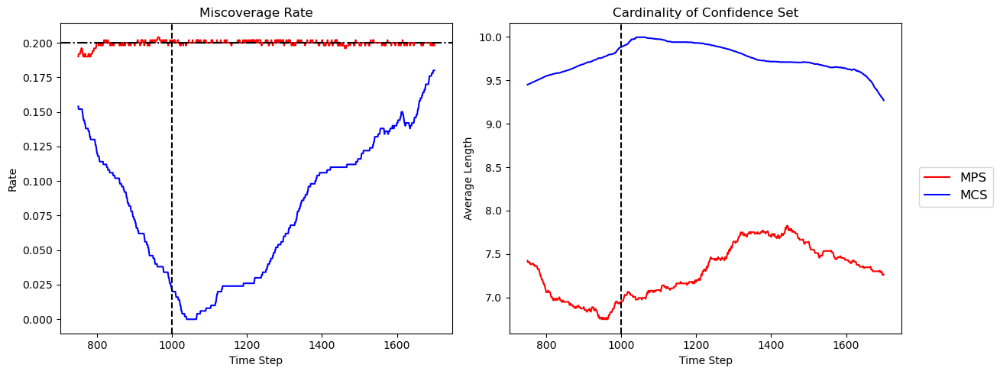

In [31]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.dates as mdates

# Read data
df = pd.read_csv('MPS_logs__2024_11_06_ARMAAR.csv')

# Initialize variables
df_MPS_rate = [df['mis_cover_rate'][0:500].mean()]
df_MCS_rate = [df['uncal_cover_rate'][0:500].mean()]
df_MPS_len = [len(df['MPS'][ind].strip("[]").split()) for ind in range(len(df))]
df_MCS_len = [len(df['uncal_MPS'][ind].strip("[]").split()) for ind in range(len(df))]
df_MPS_len_avg = [np.mean(df_MPS_len[0:500])]
df_MCS_len_avg = [np.mean(df_MCS_len[0:500])]

# Loop to calculate the moving averages
for ind in range(500, len(df)):
    df_MPS_rate += [df_MPS_rate[-1] + (df['mis_cover_rate'][ind] - df['mis_cover_rate'][ind - 500]) / 500]
    df_MCS_rate += [df_MCS_rate[-1] + (df['uncal_cover_rate'][ind] - df['uncal_cover_rate'][ind - 500]) / 500]
    df_MPS_len_avg += [df_MPS_len_avg[-1] + (df_MPS_len[ind] - df_MPS_len[ind - 500]) / 500]
    df_MCS_len_avg += [df_MCS_len_avg[-1] + (df_MCS_len[ind] - df_MCS_len[ind - 500]) / 500]

# Set x-axis values
#x = np.arange(50, len(df))

x = np.arange(750, len(df)+250)
# Create subplots
fig, axs = plt.subplots(1, 2, figsize=(12, 5))

# Plot MPS and MCS cover rates
line1 = axs[0].plot(x, np.array(df_MPS_rate[1:]), color='red', label='MPS Rate')
line2 = axs[0].plot(x, np.array(df_MCS_rate[1:]), color='blue', label='MCS Rate')
axs[0].axhline(y=0.2, color='black', linestyle='-.')
axs[0].axvline(x=1000, color='black', linestyle='--')

# Plot MPS and MCS lengths
line3 = axs[1].plot(x, np.array(df_MPS_len_avg[1:]), color='red', label='MPS Length Avg')
line4 = axs[1].plot(x, np.array(df_MCS_len_avg[1:]), color='blue', label='MCS Length Avg')
axs[1].axvline(x=1000, color='black', linestyle='--')

# Add titles for the subplots
axs[0].set_title('Miscoverage Rate')  # Title for the first subplot
axs[0].set_xlabel('Time Step')
axs[0].set_ylabel('Rate')
#axs[0].set_xticks(date.dt.year)
#axs[0].set_xticklabels(date.dt.year, rotation=45)

axs[1].set_title('Cardinality of Confidence Set')  # Title for the second subplot
axs[1].set_xlabel('Time Step')
axs[1].set_ylabel('Average Length')

# Add a common title for the entire figure
#fig.suptitle('MPS and MCS Data Analysis (2024-12-07)', fontsize=16)

# Add a single legend for all lines in the right side of the figure
fig.legend([line1[0], line2[0]],  # Choose one line from each series for the legend
           ['MPS', 'MCS'],  # Labels
           loc='center left', bbox_to_anchor=(1, 0.5), fontsize=12)

# Adjust layout to make space for the legend
plt.tight_layout()

# Display the plot
plt.show()

# Optionally save the figure
fig.savefig('sim_ARMAAR.png')


In [30]:
x

array([ 750,  751,  752,  753,  754,  755,  756,  757,  758,  759,  760,
        761,  762,  763,  764,  765,  766,  767,  768,  769,  770,  771,
        772,  773,  774,  775,  776,  777,  778,  779,  780,  781,  782,
        783,  784,  785,  786,  787,  788,  789,  790,  791,  792,  793,
        794,  795,  796,  797,  798,  799,  800,  801,  802,  803,  804,
        805,  806,  807,  808,  809,  810,  811,  812,  813,  814,  815,
        816,  817,  818,  819,  820,  821,  822,  823,  824,  825,  826,
        827,  828,  829,  830,  831,  832,  833,  834,  835,  836,  837,
        838,  839,  840,  841,  842,  843,  844,  845,  846,  847,  848,
        849,  850,  851,  852,  853,  854,  855,  856,  857,  858,  859,
        860,  861,  862,  863,  864,  865,  866,  867,  868,  869,  870,
        871,  872,  873,  874,  875,  876,  877,  878,  879,  880,  881,
        882,  883,  884,  885,  886,  887,  888,  889,  890,  891,  892,
        893,  894,  895,  896,  897,  898,  899,  9

In [ ]:
T1 = 1000
T2 = 500
np.random.seed(2024)
y = DGP_ARMA(alpha=0.3, beta=0.3, T=T1, scale=0.1)
for switch in range(1):
    y = DGP_AR(alpha=0.3, T=T2, scale=0.1, pre_y=y)
    y = DGP_ARMA(alpha=0.3, beta=0.3, T=T2, scale=0.1, pre_y=y)

T = robjects.FloatVector([y.shape[0]])
robjects.r.assign('Tr', T)
yr = robjects.FloatVector(y)
robjects.r.assign('yr', yr)
robjects.r('''
models <- c('AR1', 'AR2', 'AR3', 'AR4', 'MA1', 'MA2', 'MA3', 'MA4')
loss_matrix <- data.frame(matrix(ncol = length(models), nrow = 0))
colnames(loss_matrix) <- models

for (t in 100:(Tr-1)){
  AR1 <- arima(yr[1:t], order = c(1,0,0), include.mean=FALSE)
  AR1_p <- as.numeric(predict(AR1, se.fit = FALSE))

  AR2 <- arima(yr[1:t], order = c(2,0,0), include.mean=FALSE)
  AR2_p <- as.numeric(predict(AR2, se.fit = FALSE))

  AR3 <- arima(yr[1:t], order = c(3,0,0), include.mean=FALSE)
  AR3_p <- as.numeric(predict(AR3, se.fit = FALSE))

  AR4 <- arima(yr[1:t], order = c(4,0,0), include.mean=FALSE)
  AR4_p <- as.numeric(predict(AR4, se.fit = FALSE))
  
  MA1 <- arima(yr[1:t], order = c(0,0,1), include.mean=FALSE)
  MA1_p <- as.numeric(predict(MA1, se.fit = FALSE))
  
  MA2 <- arima(yr[1:t], order = c(0,0,2), include.mean=FALSE)
  MA2_p <- as.numeric(predict(MA2, se.fit = FALSE))
  
  MA3 <- arima(yr[1:t], order = c(0,0,3), include.mean=FALSE)
  MA3_p <- as.numeric(predict(MA3, se.fit = FALSE))
  
  MA4 <- arima(yr[1:t], order = c(0,0,4), include.mean=FALSE)
  MA4_p <- as.numeric(predict(MA4, se.fit = FALSE))

  newrow <- data.frame(AR1 = (AR1_p-yr[t+1])^2,
  AR2 = (AR2_p-yr[t+1])^2,
  AR3 = (AR3_p-yr[t+1])^2,
  AR4 = (AR4_p-yr[t+1])^2,
  MA1 = (MA1_p-yr[t+1])^2,
  MA2 = (MA2_p-yr[t+1])^2,
  MA3 = (MA3_p-yr[t+1])^2,
  MA4 = (MA4_p-yr[t+1])^2
  )
  loss_matrix = rbind(loss_matrix, newrow)

}

''')
Loss_matrix_R = pandas2ri.rpy2py(robjects.r['loss_matrix'])

x_train, y_train = create_sequences(y.reshape((-1, 1)), 10)
file_path = 'Loss_matrix_py.csv'
column_names = ['LSTM', 'Transformer']
Loss_py = pd.DataFrame(columns=column_names)
Loss_py.to_csv(file_path, index=False)
for t in range(100, y_train.shape[0]):
    errors = []
    
    LSTM_mod = tf.keras.models.Sequential([
        tf.keras.layers.LSTM(units=50, return_sequences=False, input_shape=(x_train.shape[1], 1)),
        tf.keras.layers.Dense(units=1)
    ])
    LSTM_mod.compile(optimizer='adam', loss='mean_squared_error')
    LSTM_mod.fit(x_train[:t, :], y_train[:t], epochs=5)
    errors += [(LSTM_mod.predict(x_train[[t-1], :])[0][0] - y_train[t])**2]
    
    Transformer = build_decoder_only_transformer(input_shape=(10, 1), ff_dim=16)
    Transformer.compile(optimizer='adam', loss='mse', metrics=['mae'])
    Transformer.fit(x_train[:t, :], y_train[:t], epochs=5, batch_size=32)
    errors += [(forecast(Transformer, x_train[t, :], n_steps=1)[0][0][0] - y_train[t])**2]

    new_row = pd.DataFrame({ k:[v] for (k,v) in zip(column_names, errors)}, )
    new_row.to_csv(file_path, mode='a', index=False, header=False)

# print(Loss_matrix)
Loss_py = pd.read_csv('Loss_matrix_py.csv')
Loss_py.reset_index(drop=True, inplace=True)
Loss_matrix_R.reset_index(drop=True, inplace=True)
Loss_matrix = pd.concat([Loss_matrix_R.iloc[:Loss_py.shape[0], :], Loss_py], axis=1)


MPS_matrix = MPS(Loss_matrix, 500, 0.2, 0.1,
                 2000.0, beta_search=20, alpha_search=20, bootstrap=100, lable='rd_ARMAAR')

Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0137  
Epoch 2/5
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0130
Epoch 3/5
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0118
Epoch 4/5
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 964us/step - loss: 0.0108
Epoch 5/5
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0133
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
Epoch 1/5
4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 2.9372 - mae: 1.3934
Epoch 2/5
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.6639 - mae: 0.7829
Epoch 3/5
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0322 - mae: 0.1404
Epoch 4/5
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.1793 - mae: 0.4085
Epoch 5/5
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.1358 - mae: 0.3516
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step
Epoch 1/5
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0126  
Epoch 2/5
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0124
Epoch 3/5
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0111
Epoch 4/5
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - los

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0565 - mae: 0.2046
Epoch 3/5
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.1251 - mae: 0.3336
Epoch 4/5
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0489 - mae: 0.1935
Epoch 5/5
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0188 - mae: 0.1044
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step
Epoch 1/5
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0135  
Epoch 2/5
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0115
Epoch 3/5
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0141
Epoch 4/5
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 994us/step - loss: 0.0121
Epoch 5/5
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0126
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
Epoch 1/5
4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.7733 - mae: 0.8611
Epoch 2/5
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0345 - mae: 0.1436
Epoch 3/5
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.1176 - mae: 0.3198
Epoch 4/5
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0340 - mae: 0.1530
Epoch 5/5
4/

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
Epoch 1/5
4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 2.4155 - mae: 1.0477
Epoch 2/5
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.7955 - mae: 0.8813
Epoch 3/5
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.3377 - mae: 0.5465
Epoch 4/5
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0236 - mae: 0.1200
Epoch 5/5
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0820 - mae: 0.2675
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step
Epoch 1/5
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0124  
Epoch 2/5
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0115
Epoch 3/5
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0129
Epoch 4/5
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0108
Epoch 5/5
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0122
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
Epoch 1/5
4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.2008 - mae: 1.0154
Epoch 2/5
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.3466 - mae: 0.5628
Epoch 3/5
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/

5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0153 
Epoch 5/5
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0131
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
Epoch 1/5
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 2.5141 - mae: 1.3895
Epoch 2/5
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0691 - mae: 0.2219
Epoch 3/5
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.1848 - mae: 0.4106
Epoch 4/5
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0226 - mae: 0.1254
Epoch 5/5
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0445 - mae: 0.1813
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step
Epoch 1/5
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0153  
Epoch 2/5
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0141
Epoch 3/5
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0143
Epoch 4/5
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0144
Epoch 5/5
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0129
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
Epoch 1/5
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.0169 - mae: 0.8514
Epo

5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0114
Epoch 3/5
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0131
Epoch 4/5
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0133
Epoch 5/5
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0114
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
Epoch 1/5
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.9769 - mae: 0.7318
Epoch 2/5
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.4792 - mae: 0.6584
Epoch 3/5
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0266 - mae: 0.1276
Epoch 4/5
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.1032 - mae: 0.3015
Epoch 5/5
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0417 - mae: 0.1761
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
Epoch 1/5
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0120  
Epoch 2/5
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0123
Epoch 3/5
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0148
Epoch 4/5
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0138
Epoch 5/5
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
Epoch 1/5
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0155  
Epoch 2/5
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0137
Epoch 3/5
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0141
Epoch 4/5
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0122
Epoch 5/5
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0145
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
Epoch 1/5
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.1089 - mae: 0.8813
Epoch 2/5
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.2746 - mae: 0.5071
Epoch 3/5
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0204 - mae: 0.1143
Epoch 4/5
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0530 - mae: 0.2074
Epoch 5/5
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0328 - mae: 0.1489
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step
Epoch 1/5
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0152  
Epoch 2/5
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0136
Epoch 3/5
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0137
Epoch 

6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0287 - mae: 0.1365
Epoch 5/5
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0136 - mae: 0.0929
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step
Epoch 1/5
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0140  
Epoch 2/5
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0134
Epoch 3/5
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0166
Epoch 4/5
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0134
Epoch 5/5
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0153
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
Epoch 1/5
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.9438 - mae: 0.7943
Epoch 2/5
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.3284 - mae: 0.5371
Epoch 3/5
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0308 - mae: 0.1381
Epoch 4/5
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0797 - mae: 0.2567
Epoch 5/5
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0245 - mae: 0.1240
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step
Epoch 1/5
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - los

7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.1961 - mae: 0.3807
Epoch 3/5
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.1675 - mae: 0.3913
Epoch 4/5
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0404 - mae: 0.1621
Epoch 5/5
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0358 - mae: 0.1589
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step
Epoch 1/5
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0164  
Epoch 2/5
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0127
Epoch 3/5
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0144
Epoch 4/5
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0126
Epoch 5/5
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
Epoch 1/5
7/7 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.4989 - mae: 0.5404
Epoch 2/5
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.1564 - mae: 0.3491
Epoch 3/5
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0314 - mae: 0.1459
Epoch 4/5
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0360 - mae: 0.1618
Epoch 5/5
7/7 

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
Epoch 1/5
7/7 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.1071 - mae: 1.0046
Epoch 2/5
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.1795 - mae: 0.3980
Epoch 3/5
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0389 - mae: 0.1630
Epoch 4/5
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0514 - mae: 0.1992
Epoch 5/5
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0243 - mae: 0.1241
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step
Epoch 1/5
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0129  
Epoch 2/5
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0145
Epoch 3/5
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0137
Epoch 4/5
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0139
Epoch 5/5
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0130
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
Epoch 1/5
7/7 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.6692 - mae: 1.1241
Epoch 2/5
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.1692 - mae: 0.3795
Epoch 3/5
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/

7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0155
Epoch 5/5
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0130
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
Epoch 1/5
7/7 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.6532 - mae: 0.5891
Epoch 2/5
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.1479 - mae: 0.3273
Epoch 3/5
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0587 - mae: 0.2105
Epoch 4/5
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0431 - mae: 0.1712
Epoch 5/5
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0167 - mae: 0.1031
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step
Epoch 1/5
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0176  
Epoch 2/5
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0153
Epoch 3/5
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0139
Epoch 4/5
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0151
Epoch 5/5
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 960us/step - loss: 0.0147
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
Epoch 1/5
7/7 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.6696 - mae: 1.0325
Ep

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0143
Epoch 3/5
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0143
Epoch 4/5
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0134
Epoch 5/5
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0144
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
Epoch 1/5
8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 2.1639 - mae: 1.3370
Epoch 2/5
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.3441 - mae: 0.5254
Epoch 3/5
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.1119 - mae: 0.3087
Epoch 4/5
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0274 - mae: 0.1365
Epoch 5/5
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0354 - mae: 0.1588
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step
Epoch 1/5
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0166  
Epoch 2/5
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0140
Epoch 3/5
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0145
Epoch 4/5
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0135
Epoch 5/5
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step
Epoch 1/5
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0150  
Epoch 2/5
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0166
Epoch 3/5
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0171
Epoch 4/5
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0148
Epoch 5/5
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0153
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
Epoch 1/5
8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.9397 - mae: 0.7457
Epoch 2/5
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0857 - mae: 0.2511
Epoch 3/5
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.1020 - mae: 0.2935
Epoch 4/5
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0189 - mae: 0.1105
Epoch 5/5
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0305 - mae: 0.1393
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step
Epoch 1/5
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0141  
Epoch 2/5
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0148
Epoch 3/5
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0135
Epoch 

9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0637 - mae: 0.2222
Epoch 5/5
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0182 - mae: 0.1082
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
Epoch 1/5
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0155  
Epoch 2/5
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0151
Epoch 3/5
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0140
Epoch 4/5
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0140
Epoch 5/5
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0130
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
Epoch 1/5
9/9 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.4530 - mae: 1.0709
Epoch 2/5
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.1888 - mae: 0.3824
Epoch 3/5
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0698 - mae: 0.2374
Epoch 4/5
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0195 - mae: 0.1129
Epoch 5/5
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0241 - mae: 0.1257
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
Epoch 1/5
9/9 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - los

9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0682 - mae: 0.2237
Epoch 3/5
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0476 - mae: 0.1854
Epoch 4/5
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0245 - mae: 0.1270
Epoch 5/5
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0181 - mae: 0.1057
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step
Epoch 1/5
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0153  
Epoch 2/5
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0160
Epoch 3/5
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0145
Epoch 4/5
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0151
Epoch 5/5
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0131
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
Epoch 1/5
9/9 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.5385 - mae: 0.5248
Epoch 2/5
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0644 - mae: 0.2171
Epoch 3/5
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0297 - mae: 0.1414
Epoch 4/5
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0195 - mae: 0.1162
Epoch 5/5
9/9 

10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0142
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
Epoch 1/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.7006 - mae: 1.1412
Epoch 2/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.2159 - mae: 0.4240
Epoch 3/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0348 - mae: 0.1567
Epoch 4/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0251 - mae: 0.1288
Epoch 5/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0183 - mae: 0.1079
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step
Epoch 1/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0150  
Epoch 2/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0147
Epoch 3/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0143
Epoch 4/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0137
Epoch 5/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0145
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
Epoch 1/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.7577 - mae: 0.6837
Epoch 2/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 2m

10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0154  
Epoch 2/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0146
Epoch 3/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0145
Epoch 4/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0147
Epoch 5/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 989us/step - loss: 0.0144
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
Epoch 1/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.5552 - mae: 0.6249
Epoch 2/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0455 - mae: 0.1723
Epoch 3/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0430 - mae: 0.1772
Epoch 4/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0186 - mae: 0.1076
Epoch 5/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0168 - mae: 0.1043
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step
Epoch 1/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0169  
Epoch 2/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0155
Epoch 3/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0141
Epoch 4/5
10/10 ━━━━━━━━━━

10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0883 - mae: 0.2597
Epoch 4/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0289 - mae: 0.1346
Epoch 5/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0207 - mae: 0.1150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
Epoch 1/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0157  
Epoch 2/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 925us/step - loss: 0.0138
Epoch 3/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 986us/step - loss: 0.0147
Epoch 4/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 971us/step - loss: 0.0140
Epoch 5/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 976us/step - loss: 0.0140
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
Epoch 1/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 2.4367 - mae: 1.2165
Epoch 2/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0356 - mae: 0.1529
Epoch 3/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0592 - mae: 0.2092
Epoch 4/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0199 - mae: 0.1108
Epoch 5/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0

11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0153
Epoch 5/5
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0152
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
Epoch 1/5
11/11 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - loss: 0.3630 - mae: 0.5092
Epoch 2/5
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0249 - mae: 0.1268
Epoch 3/5
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0235 - mae: 0.1241
Epoch 4/5
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0171 - mae: 0.1062
Epoch 5/5
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0153 - mae: 0.1015
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
Epoch 1/5
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0156  
Epoch 2/5
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0157
Epoch 3/5
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0141
Epoch 4/5
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0136
Epoch 5/5
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0139
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
Epoch 1/5
11/11 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss:

11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0156 - mae: 0.0991
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
Epoch 1/5
11/11 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0173
Epoch 2/5
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0144
Epoch 3/5
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0140
Epoch 4/5
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0130
Epoch 5/5
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0139
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
Epoch 1/5
11/11 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.8528 - mae: 0.7892
Epoch 2/5
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0806 - mae: 0.2481
Epoch 3/5
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0296 - mae: 0.1400
Epoch 4/5
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0169 - mae: 0.1040
Epoch 5/5
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0168 - mae: 0.1032
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step
Epoch 1/5
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0153  
Epoch 2/5
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 1m

12/12 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.7369 - mae: 0.7585
Epoch 2/5
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0876 - mae: 0.2553
Epoch 3/5
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0360 - mae: 0.1616
Epoch 4/5
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0172 - mae: 0.1045
Epoch 5/5
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0142 - mae: 0.0966
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
Epoch 1/5
12/12 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0139
Epoch 2/5
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0157
Epoch 3/5
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0149
Epoch 4/5
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0144
Epoch 5/5
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0136
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
Epoch 1/5
12/12 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.9842 - mae: 0.8823
Epoch 2/5
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0548 - mae: 0.1969
Epoch 3/5
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0222 - ma

Epoch 5/5
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0123
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
Epoch 1/5
12/12 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.4276 - mae: 0.9553
Epoch 2/5
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.1308 - mae: 0.3303
Epoch 3/5
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0351 - mae: 0.1564
Epoch 4/5
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0180 - mae: 0.1052
Epoch 5/5
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0158 - mae: 0.1008
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step
Epoch 1/5
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0147  
Epoch 2/5
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0144
Epoch 3/5
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0158
Epoch 4/5
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0149
Epoch 5/5
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0148
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
Epoch 1/5
12/12 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.6176 - mae: 0.6108
Epoch 2/5
12/12 ━━━━━━━━━━━━━━━━

12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0165  
Epoch 2/5
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0154
Epoch 3/5
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0138
Epoch 4/5
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0138
Epoch 5/5
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0134
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
Epoch 1/5
12/12 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.8771 - mae: 1.0975
Epoch 2/5
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.2101 - mae: 0.4281
Epoch 3/5
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0452 - mae: 0.1803
Epoch 4/5
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0175 - mae: 0.1076
Epoch 5/5
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0178 - mae: 0.1087
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
Epoch 1/5
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0144  
Epoch 2/5
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0155
Epoch 3/5
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0144
Epoch 4/5
12/12 ━━━━━━━━━━━━

13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0189 - mae: 0.1119
Epoch 4/5
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0160 - mae: 0.1036
Epoch 5/5
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0153 - mae: 0.1035
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step
Epoch 1/5
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0141  
Epoch 2/5
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0142
Epoch 3/5
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0145
Epoch 4/5
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0153
Epoch 5/5
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0139
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
Epoch 1/5
13/13 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.9871 - mae: 0.7050
Epoch 2/5
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0284 - mae: 0.1371
Epoch 3/5
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0201 - mae: 0.1102
Epoch 4/5
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0168 - mae: 0.1054
Epoch 5/5
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0143 - 

13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0144
Epoch 5/5
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 997us/step - loss: 0.0128
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
Epoch 1/5
13/13 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 2.2131 - mae: 1.2746
Epoch 2/5
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0925 - mae: 0.2599
Epoch 3/5
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0277 - mae: 0.1370
Epoch 4/5
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0168 - mae: 0.1052
Epoch 5/5
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0183 - mae: 0.1094
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step
Epoch 1/5
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0142  
Epoch 2/5
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0136
Epoch 3/5
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 991us/step - loss: 0.0128
Epoch 4/5
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 996us/step - loss: 0.0154
Epoch 5/5
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0131
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
Epoch 1/5
13/13 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step -

14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0177 - mae: 0.1068
Epoch 5/5
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0175 - mae: 0.1093
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
Epoch 1/5
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0144  
Epoch 2/5
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0132
Epoch 3/5
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 991us/step - loss: 0.0124
Epoch 4/5
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 985us/step - loss: 0.0140
Epoch 5/5
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 979us/step - loss: 0.0135
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
Epoch 1/5
14/14 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.6193 - mae: 1.0580
Epoch 2/5
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0883 - mae: 0.2617
Epoch 3/5
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0337 - mae: 0.1527
Epoch 4/5
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0197 - mae: 0.1150
Epoch 5/5
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0172 - mae: 0.1081
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step
Epoch 1/5
14/14 ━━━━━━

14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0376 - mae: 0.1621
Epoch 3/5
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0228 - mae: 0.1220
Epoch 4/5
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0176 - mae: 0.1062
Epoch 5/5
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0152 - mae: 0.1023
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step
Epoch 1/5
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0157  
Epoch 2/5
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 994us/step - loss: 0.0149
Epoch 3/5
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 993us/step - loss: 0.0142
Epoch 4/5
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0141
Epoch 5/5
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 973us/step - loss: 0.0129
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
Epoch 1/5
14/14 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.5615 - mae: 0.6031
Epoch 2/5
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0646 - mae: 0.2193
Epoch 3/5
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0233 - mae: 0.1259
Epoch 4/5
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0

14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0141
Epoch 3/5
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0133
Epoch 4/5
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0142
Epoch 5/5
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0138
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
Epoch 1/5
14/14 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.2082 - mae: 0.9370
Epoch 2/5
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.1157 - mae: 0.3048
Epoch 3/5
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0395 - mae: 0.1654
Epoch 4/5
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0194 - mae: 0.1141
Epoch 5/5
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0168 - mae: 0.1055
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step
Epoch 1/5
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0150  
Epoch 2/5
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0150
Epoch 3/5
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0148
Epoch 4/5
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0142
Epoch 5/5
14/14 ━━━━━━━━━━━━━━

15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0211 - mae: 0.1187
Epoch 4/5
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0162 - mae: 0.1029
Epoch 5/5
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0168 - mae: 0.1048
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step
Epoch 1/5
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0163  
Epoch 2/5
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 946us/step - loss: 0.0159
Epoch 3/5
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 929us/step - loss: 0.0163
Epoch 4/5
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 937us/step - loss: 0.0151
Epoch 5/5
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 908us/step - loss: 0.0133
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
Epoch 1/5
15/15 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.3327 - mae: 0.9540
Epoch 2/5
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0431 - mae: 0.1680
Epoch 3/5
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0250 - mae: 0.1255
Epoch 4/5
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0214 - mae: 0.1191
Epoch 5/5
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0

15/15 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.7722 - mae: 0.6623
Epoch 2/5
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.1091 - mae: 0.2938
Epoch 3/5
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0264 - mae: 0.1311
Epoch 4/5
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0170 - mae: 0.1066
Epoch 5/5
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0163 - mae: 0.1044
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step
Epoch 1/5
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0154  
Epoch 2/5
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 994us/step - loss: 0.0144
Epoch 3/5
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 990us/step - loss: 0.0140
Epoch 4/5
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 981us/step - loss: 0.0139
Epoch 5/5
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 995us/step - loss: 0.0135
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
Epoch 1/5
15/15 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.5784 - mae: 0.5807
Epoch 2/5
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0410 - mae: 0.1724
Epoch 3/5
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0

15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0163  
Epoch 2/5
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0150
Epoch 3/5
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 992us/step - loss: 0.0131
Epoch 4/5
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 976us/step - loss: 0.0137
Epoch 5/5
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 980us/step - loss: 0.0124
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
Epoch 1/5
15/15 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.3882 - mae: 0.5401
Epoch 2/5
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0259 - mae: 0.1291
Epoch 3/5
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0196 - mae: 0.1171
Epoch 4/5
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0170 - mae: 0.1053
Epoch 5/5
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0150 - mae: 0.1014
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step
Epoch 1/5
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0139  
Epoch 2/5
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0157
Epoch 3/5
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 973us/step - loss: 0.0146
Epoch 4/5
15/15 ━━━━

16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0616 - mae: 0.2155
Epoch 3/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0281 - mae: 0.1391
Epoch 4/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0168 - mae: 0.1041
Epoch 5/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0154 - mae: 0.1005
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step
Epoch 1/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0146  
Epoch 2/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 952us/step - loss: 0.0147
Epoch 3/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 950us/step - loss: 0.0141
Epoch 4/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 970us/step - loss: 0.0136
Epoch 5/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 938us/step - loss: 0.0130
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
Epoch 1/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.5386 - mae: 0.6280
Epoch 2/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0505 - mae: 0.1883
Epoch 3/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0172 - mae: 0.1070
Epoch 4/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0

16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0153
Epoch 3/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 972us/step - loss: 0.0145
Epoch 4/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 974us/step - loss: 0.0132
Epoch 5/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 984us/step - loss: 0.0141
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
Epoch 1/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.0464 - mae: 0.7851
Epoch 2/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0485 - mae: 0.1841
Epoch 3/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0181 - mae: 0.1084
Epoch 4/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0161 - mae: 0.1032
Epoch 5/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0160 - mae: 0.1020
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step
Epoch 1/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0141  
Epoch 2/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 972us/step - loss: 0.0134
Epoch 3/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 968us/step - loss: 0.0134
Epoch 4/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 999us/step - loss: 0.0133
Epoch 5/5
16/16 ━━

17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0176 - mae: 0.1067
Epoch 4/5
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0161 - mae: 0.1027
Epoch 5/5
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0149 - mae: 0.0991
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step
Epoch 1/5
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0159  
Epoch 2/5
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 992us/step - loss: 0.0143
Epoch 3/5
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 998us/step - loss: 0.0139
Epoch 4/5
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 982us/step - loss: 0.0132
Epoch 5/5
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 985us/step - loss: 0.0129
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
Epoch 1/5
17/17 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.8589 - mae: 0.7086
Epoch 2/5
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0744 - mae: 0.2331
Epoch 3/5
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0242 - mae: 0.1265
Epoch 4/5
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0154 - mae: 0.1019
Epoch 5/5
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0

17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 956us/step - loss: 0.0126
Epoch 5/5
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 967us/step - loss: 0.0129
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
Epoch 1/5
17/17 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.4544 - mae: 0.5778
Epoch 2/5
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0285 - mae: 0.1349
Epoch 3/5
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0164 - mae: 0.1058
Epoch 4/5
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0147 - mae: 0.0971
Epoch 5/5
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0150 - mae: 0.0992
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step
Epoch 1/5
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0146  
Epoch 2/5
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0144
Epoch 3/5
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 999us/step - loss: 0.0134
Epoch 4/5
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 987us/step - loss: 0.0137
Epoch 5/5
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 978us/step - loss: 0.0129
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
Epoch 1/5
17/17 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/st

17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0159 - mae: 0.1005
Epoch 5/5
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0158 - mae: 0.0993
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step
Epoch 1/5
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0145  
Epoch 2/5
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 906us/step - loss: 0.0144
Epoch 3/5
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 886us/step - loss: 0.0142
Epoch 4/5
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 883us/step - loss: 0.0143
Epoch 5/5
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 890us/step - loss: 0.0138
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
Epoch 1/5
17/17 ━━━━━━━━━━━━━━━━━━━━ 4s 2ms/step - loss: 0.4153 - mae: 0.5537 
Epoch 2/5
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0234 - mae: 0.1236
Epoch 3/5
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0157 - mae: 0.1016
Epoch 4/5
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0159 - mae: 0.1024
Epoch 5/5
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0155 - mae: 0.0994
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
Epoch 1/5
18/18 ━━━

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 992us/step - loss: 0.0132
Epoch 5/5
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 986us/step - loss: 0.0134
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
Epoch 1/5
18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.5695 - mae: 0.6084
Epoch 2/5
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0397 - mae: 0.1639
Epoch 3/5
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0153 - mae: 0.0997
Epoch 4/5
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0157 - mae: 0.1016
Epoch 5/5
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0169 - mae: 0.1042
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
Epoch 1/5
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0150  
Epoch 2/5
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 978us/step - loss: 0.0149
Epoch 3/5
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 947us/step - loss: 0.0142
Epoch 4/5
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 960us/step - loss: 0.0136
Epoch 5/5
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 970us/step - loss: 0.0127
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
Epoch 1/5
18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0157 - mae: 0.1030
Epoch 5/5
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0150 - mae: 0.0983
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step
Epoch 1/5
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0152  
Epoch 2/5
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 954us/step - loss: 0.0142
Epoch 3/5
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 953us/step - loss: 0.0151
Epoch 4/5
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 954us/step - loss: 0.0130
Epoch 5/5
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 950us/step - loss: 0.0138
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
Epoch 1/5
18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.2716 - mae: 0.4272
Epoch 2/5
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0241 - mae: 0.1266
Epoch 3/5
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0166 - mae: 0.1062
Epoch 4/5
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0167 - mae: 0.1037
Epoch 5/5
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0161 - mae: 0.1007
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
Epoch 1/5
18/18 ━━━━

19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 940us/step - loss: 0.0135
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
Epoch 1/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.3273 - mae: 0.4439
Epoch 2/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0249 - mae: 0.1259
Epoch 3/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0197 - mae: 0.1108
Epoch 4/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0156 - mae: 0.1007
Epoch 5/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0169 - mae: 0.1036
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step
Epoch 1/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0160  
Epoch 2/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 965us/step - loss: 0.0138
Epoch 3/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 959us/step - loss: 0.0143
Epoch 4/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 964us/step - loss: 0.0136
Epoch 5/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 945us/step - loss: 0.0126
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
Epoch 1/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.5502 - mae: 0.6201
Epoch 2/5
19/19 ━━━━━━━━━━━━━━━━

19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0151 - mae: 0.0972
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
Epoch 1/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0157  
Epoch 2/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 995us/step - loss: 0.0148
Epoch 3/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 997us/step - loss: 0.0150
Epoch 4/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 999us/step - loss: 0.0146
Epoch 5/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 966us/step - loss: 0.0142
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
Epoch 1/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.6816 - mae: 0.6608
Epoch 2/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0238 - mae: 0.1235
Epoch 3/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0178 - mae: 0.1069
Epoch 4/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0163 - mae: 0.1023
Epoch 5/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0161 - mae: 0.1026
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
Epoch 1/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0153  
Epoch 2/5
19/19 ━━━━━━━━━━━━━━━━

20/20 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.1006 - mae: 0.7674
Epoch 2/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0759 - mae: 0.2403
Epoch 3/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0225 - mae: 0.1232
Epoch 4/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0172 - mae: 0.1047
Epoch 5/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0160 - mae: 0.1002
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step
Epoch 1/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0159  
Epoch 2/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0137
Epoch 3/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0130
Epoch 4/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0119
Epoch 5/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0127
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
Epoch 1/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.3133 - mae: 0.4615
Epoch 2/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0233 - mae: 0.1242
Epoch 3/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0170 - 

20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0150  
Epoch 2/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 951us/step - loss: 0.0142
Epoch 3/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 940us/step - loss: 0.0141
Epoch 4/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 937us/step - loss: 0.0138
Epoch 5/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 962us/step - loss: 0.0124
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
Epoch 1/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.8064 - mae: 1.1098
Epoch 2/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0852 - mae: 0.2538
Epoch 3/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0194 - mae: 0.1125
Epoch 4/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0159 - mae: 0.1022
Epoch 5/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0151 - mae: 0.0998
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
Epoch 1/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0151  
Epoch 2/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 936us/step - loss: 0.0143
Epoch 3/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 923us/step - loss: 0.0146
Epoch 4/5
20/20 

20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0555 - mae: 0.2003
Epoch 3/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0205 - mae: 0.1129
Epoch 4/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0157 - mae: 0.0999
Epoch 5/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0132 - mae: 0.0927
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step
Epoch 1/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0142  
Epoch 2/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 995us/step - loss: 0.0137
Epoch 3/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0147
Epoch 4/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 986us/step - loss: 0.0127
Epoch 5/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 967us/step - loss: 0.0124
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
Epoch 1/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.4636 - mae: 0.4981
Epoch 2/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0331 - mae: 0.1500
Epoch 3/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0160 - mae: 0.1013
Epoch 4/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0

21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0131
Epoch 3/5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 996us/step - loss: 0.0141
Epoch 4/5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 986us/step - loss: 0.0134
Epoch 5/5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 947us/step - loss: 0.0129
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
Epoch 1/5
21/21 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.6574 - mae: 0.6269
Epoch 2/5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0412 - mae: 0.1678
Epoch 3/5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0160 - mae: 0.0993
Epoch 4/5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0151 - mae: 0.1007
Epoch 5/5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0169 - mae: 0.1061
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
Epoch 1/5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0153  
Epoch 2/5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 937us/step - loss: 0.0153
Epoch 3/5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 930us/step - loss: 0.0146
Epoch 4/5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 957us/step - loss: 0.0132
Epoch 5/5
21/21 ━━

21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0156 - mae: 0.0987
Epoch 4/5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0158 - mae: 0.0999
Epoch 5/5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0154 - mae: 0.0992
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
Epoch 1/5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0155  
Epoch 2/5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 992us/step - loss: 0.0152
Epoch 3/5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 983us/step - loss: 0.0138
Epoch 4/5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 996us/step - loss: 0.0129
Epoch 5/5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 981us/step - loss: 0.0129
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
Epoch 1/5
21/21 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.8762 - mae: 0.7197
Epoch 2/5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0252 - mae: 0.1286
Epoch 3/5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0174 - mae: 0.1084
Epoch 4/5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0158 - mae: 0.1014
Epoch 5/5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0

22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 984us/step - loss: 0.0129
Epoch 5/5
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 973us/step - loss: 0.0116
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
Epoch 1/5
22/22 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.1433 - mae: 0.3132
Epoch 2/5
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0185 - mae: 0.1081
Epoch 3/5
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0159 - mae: 0.1019
Epoch 4/5
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0156 - mae: 0.1009
Epoch 5/5
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0144 - mae: 0.0957
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step
Epoch 1/5
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0162  
Epoch 2/5
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 997us/step - loss: 0.0139
Epoch 3/5
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 976us/step - loss: 0.0143
Epoch 4/5
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0135
Epoch 5/5
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 963us/step - loss: 0.0129
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
Epoch 1/5
22/22 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/st

22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0162
Epoch 3/5
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0126
Epoch 4/5
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0116
Epoch 5/5
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 972us/step - loss: 0.0119
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
Epoch 1/5
22/22 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.9150 - mae: 0.6504
Epoch 2/5
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0253 - mae: 0.1288
Epoch 3/5
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0144 - mae: 0.0982
Epoch 4/5
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0152 - mae: 0.0995
Epoch 5/5
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0162 - mae: 0.1031
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
Epoch 1/5
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0154  
Epoch 2/5
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 1000us/step - loss: 0.0157
Epoch 3/5
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 995us/step - loss: 0.0148
Epoch 4/5
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0145
Epoch 5/5
22/22 ━━━━━━━

22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0167 - mae: 0.1057
Epoch 4/5
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0158 - mae: 0.1018
Epoch 5/5
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0151 - mae: 0.1008
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
Epoch 1/5
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0161  
Epoch 2/5
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0135
Epoch 3/5
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0125
Epoch 4/5
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 984us/step - loss: 0.0121
Epoch 5/5
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 981us/step - loss: 0.0112
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
Epoch 1/5
22/22 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.3636 - mae: 0.4654
Epoch 2/5
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0211 - mae: 0.1176
Epoch 3/5
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0177 - mae: 0.1068
Epoch 4/5
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0153 - mae: 0.0992
Epoch 5/5
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.015

23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 987us/step - loss: 0.0127
Epoch 5/5
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 970us/step - loss: 0.0118
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
Epoch 1/5
23/23 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.4083 - mae: 0.5146
Epoch 2/5
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0245 - mae: 0.1279
Epoch 3/5
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0162 - mae: 0.1009
Epoch 4/5
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0142 - mae: 0.0966
Epoch 5/5
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0137 - mae: 0.0964
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
Epoch 1/5
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0145  
Epoch 2/5
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0143
Epoch 3/5
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 996us/step - loss: 0.0140
Epoch 4/5
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 998us/step - loss: 0.0127
Epoch 5/5
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 979us/step - loss: 0.0112
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
Epoch 1/5
23/23 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/st

Epoch 2/5
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 993us/step - loss: 0.0118
Epoch 3/5
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 980us/step - loss: 0.0121
Epoch 4/5
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 988us/step - loss: 0.0118
Epoch 5/5
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 980us/step - loss: 0.0118
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
Epoch 1/5
23/23 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.6964 - mae: 0.9977
Epoch 2/5
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0489 - mae: 0.1907
Epoch 3/5
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0185 - mae: 0.1108
Epoch 4/5
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0140 - mae: 0.0956
Epoch 5/5
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0143 - mae: 0.0964
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
Epoch 1/5
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0135  
Epoch 2/5
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 963us/step - loss: 0.0127
Epoch 3/5
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 980us/step - loss: 0.0119
Epoch 4/5
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 945us/step - loss: 0.0111
Epoch 

23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0160 - mae: 0.1017
Epoch 4/5
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0159 - mae: 0.1018
Epoch 5/5
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0142 - mae: 0.0970
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
Epoch 1/5
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0135  
Epoch 2/5
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0142
Epoch 3/5
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0122
Epoch 4/5
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0118
Epoch 5/5
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0122
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step
Epoch 1/5
23/23 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 2.2193 - mae: 1.0820 
Epoch 2/5
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0609 - mae: 0.2082
Epoch 3/5
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0159 - mae: 0.1025
Epoch 4/5
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0150 - mae: 0.1004
Epoch 5/5
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0158 

24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 981us/step - loss: 0.0120
Epoch 5/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 986us/step - loss: 0.0115
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
Epoch 1/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.8484 - mae: 0.7259
Epoch 2/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0324 - mae: 0.1486
Epoch 3/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0172 - mae: 0.1066
Epoch 4/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0141 - mae: 0.0955
Epoch 5/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0161 - mae: 0.1006
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
Epoch 1/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0145  
Epoch 2/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 965us/step - loss: 0.0134
Epoch 3/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 963us/step - loss: 0.0126
Epoch 4/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 972us/step - loss: 0.0120
Epoch 5/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 946us/step - loss: 0.0115
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
Epoch 1/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/

24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0161 - mae: 0.1007
Epoch 5/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0152 - mae: 0.0998
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
Epoch 1/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0138  
Epoch 2/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0119
Epoch 3/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 986us/step - loss: 0.0130
Epoch 4/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 989us/step - loss: 0.0121
Epoch 5/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 980us/step - loss: 0.0115
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
Epoch 1/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 2.5630 - mae: 1.1443 
Epoch 2/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0591 - mae: 0.2076
Epoch 3/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0174 - mae: 0.1068
Epoch 4/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0161 - mae: 0.1006
Epoch 5/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0145 - mae: 0.0979
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step
Epoch 1/5
24/24 ━━━━━

25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 965us/step - loss: 0.0124
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
Epoch 1/5
25/25 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.2757 - mae: 0.8125
Epoch 2/5
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0253 - mae: 0.1267
Epoch 3/5
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0165 - mae: 0.0997
Epoch 4/5
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0149 - mae: 0.0972
Epoch 5/5
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0158 - mae: 0.1006
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
Epoch 1/5
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0156  
Epoch 2/5
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0145
Epoch 3/5
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0139
Epoch 4/5
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0124
Epoch 5/5
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0118
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
Epoch 1/5
25/25 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.7645 - mae: 0.6814
Epoch 2/5
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
Epoch 1/5
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0134  
Epoch 2/5
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 995us/step - loss: 0.0128
Epoch 3/5
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0122
Epoch 4/5
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0118
Epoch 5/5
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 980us/step - loss: 0.0115
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
Epoch 1/5
25/25 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.3318 - mae: 0.4676
Epoch 2/5
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0260 - mae: 0.1295
Epoch 3/5
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0144 - mae: 0.0977
Epoch 4/5
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0137 - mae: 0.0945
Epoch 5/5
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0140 - mae: 0.0963
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step
Epoch 1/5
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0142  
Epoch 2/5
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0135
Epoch 3/5
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 

26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0272 - mae: 0.1344
Epoch 3/5
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0157 - mae: 0.1004
Epoch 4/5
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0139 - mae: 0.0948
Epoch 5/5
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0147 - mae: 0.0989
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
Epoch 1/5
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0149  
Epoch 2/5
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 995us/step - loss: 0.0129
Epoch 3/5
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 980us/step - loss: 0.0126
Epoch 4/5
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 979us/step - loss: 0.0127
Epoch 5/5
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 988us/step - loss: 0.0114
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
Epoch 1/5
26/26 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.6579 - mae: 0.6111
Epoch 2/5
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0338 - mae: 0.1504
Epoch 3/5
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0145 - mae: 0.0953
Epoch 4/5
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0

26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0128
Epoch 4/5
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0126
Epoch 5/5
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 987us/step - loss: 0.0115
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
Epoch 1/5
26/26 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.6518 - mae: 0.5822
Epoch 2/5
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0198 - mae: 0.1115
Epoch 3/5
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0144 - mae: 0.0976
Epoch 4/5
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0144 - mae: 0.0991
Epoch 5/5
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0141 - mae: 0.0978
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
Epoch 1/5
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0148  
Epoch 2/5
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0146
Epoch 3/5
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 995us/step - loss: 0.0140
Epoch 4/5
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0129
Epoch 5/5
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 986us/step - loss: 0.0117
1/1 ━━━━━━━━━━━━━━━━━━━━

26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0148  
Epoch 2/5
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 993us/step - loss: 0.0138
Epoch 3/5
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 989us/step - loss: 0.0135
Epoch 4/5
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 983us/step - loss: 0.0124
Epoch 5/5
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 966us/step - loss: 0.0119
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
Epoch 1/5
26/26 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.6731 - mae: 0.6662
Epoch 2/5
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0227 - mae: 0.1201
Epoch 3/5
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0168 - mae: 0.1022
Epoch 4/5
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0141 - mae: 0.0975
Epoch 5/5
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0149 - mae: 0.0992
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
Epoch 1/5
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0126  
Epoch 2/5
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0136
Epoch 3/5
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0120
Epoch 4/5
26/26 ━━━━

27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0184 - mae: 0.1083
Epoch 3/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0142 - mae: 0.0966
Epoch 4/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0153 - mae: 0.0991
Epoch 5/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0143 - mae: 0.0968
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
Epoch 1/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0142  
Epoch 2/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0135
Epoch 3/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 997us/step - loss: 0.0127
Epoch 4/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 994us/step - loss: 0.0121
Epoch 5/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 976us/step - loss: 0.0116
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
Epoch 1/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.7093 - mae: 0.5797
Epoch 2/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0238 - mae: 0.1268
Epoch 3/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0145 - mae: 0.0962
Epoch 4/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
Epoch 1/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.5356 - mae: 0.5304
Epoch 2/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0269 - mae: 0.1363
Epoch 3/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0149 - mae: 0.0970
Epoch 4/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0141 - mae: 0.0952
Epoch 5/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0153 - mae: 0.0987
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
Epoch 1/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0152  
Epoch 2/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0148
Epoch 3/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 982us/step - loss: 0.0141
Epoch 4/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 995us/step - loss: 0.0134
Epoch 5/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 992us/step - loss: 0.0119
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
Epoch 1/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.2314 - mae: 0.3731
Epoch 2/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0167 - mae: 0.1042
Epoch 3/5
27

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step
Epoch 1/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0141  
Epoch 2/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 989us/step - loss: 0.0134
Epoch 3/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 985us/step - loss: 0.0131
Epoch 4/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 967us/step - loss: 0.0115
Epoch 5/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 966us/step - loss: 0.0111
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
Epoch 1/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.3296 - mae: 0.4455
Epoch 2/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0194 - mae: 0.1107
Epoch 3/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0142 - mae: 0.0971
Epoch 4/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0145 - mae: 0.0980
Epoch 5/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0159 - mae: 0.1026
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
Epoch 1/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0127  
Epoch 2/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0142
Epoch 3/5
27/27 ━━━━━━━━━━━━━━━━━━━━

27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0152 - mae: 0.0994
Epoch 5/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0135 - mae: 0.0942
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
Epoch 1/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0140  
Epoch 2/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0117
Epoch 3/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0122
Epoch 4/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0113
Epoch 5/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 982us/step - loss: 0.0108
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
Epoch 1/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.2365 - mae: 0.3406
Epoch 2/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0163 - mae: 0.1021
Epoch 3/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0144 - mae: 0.0963
Epoch 4/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0130 - mae: 0.0933
Epoch 5/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0148 - mae: 0.0991
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step
Epoch 1/5
27/27 ━━━━━━━━━━

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step
Epoch 1/5
28/28 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.4441 - mae: 0.9488
Epoch 2/5
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0377 - mae: 0.1621
Epoch 3/5
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0140 - mae: 0.0951
Epoch 4/5
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0158 - mae: 0.1016
Epoch 5/5
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0142 - mae: 0.0974
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
Epoch 1/5
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0148  
Epoch 2/5
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0156
Epoch 3/5
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0133
Epoch 4/5
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0123
Epoch 5/5
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 990us/step - loss: 0.0116
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
Epoch 1/5
28/28 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.5097 - mae: 0.5288
Epoch 2/5
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0198 - mae: 0.1132
Epoch 3/5
28/28 

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step
Epoch 1/5
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0154   
Epoch 2/5
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0139
Epoch 3/5
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0130
Epoch 4/5
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 1000us/step - loss: 0.0123
Epoch 5/5
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0118
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
Epoch 1/5
28/28 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.7906 - mae: 0.6835
Epoch 2/5
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0255 - mae: 0.1282
Epoch 3/5
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0145 - mae: 0.0978
Epoch 4/5
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0155 - mae: 0.1004
Epoch 5/5
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0145 - mae: 0.0956
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
Epoch 1/5
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0130   
Epoch 2/5
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 989us/step - loss: 0.0133
Epoch 3/5
28/28 ━━━━━━━━━━━━━━━━━━━━ 

29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0278 - mae: 0.1333
Epoch 3/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0149 - mae: 0.0978
Epoch 4/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0158 - mae: 0.1009
Epoch 5/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0131 - mae: 0.0907
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step
Epoch 1/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0155   
Epoch 2/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0123
Epoch 3/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 983us/step - loss: 0.0120
Epoch 4/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 971us/step - loss: 0.0127
Epoch 5/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0123
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
Epoch 1/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.4442 - mae: 0.5197
Epoch 2/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0182 - mae: 0.1087
Epoch 3/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0151 - mae: 0.0990
Epoch 4/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.01

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
Epoch 1/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.6018 - mae: 0.5496
Epoch 2/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0185 - mae: 0.1076
Epoch 3/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0148 - mae: 0.0970
Epoch 4/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0149 - mae: 0.0985
Epoch 5/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0149 - mae: 0.0979
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
Epoch 1/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0142   
Epoch 2/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0132
Epoch 3/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0128
Epoch 4/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0111
Epoch 5/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 999us/step - loss: 0.0112
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
Epoch 1/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.6064 - mae: 0.5339
Epoch 2/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0182 - mae: 0.1095
Epoch 3/5
29/29

29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0122
Epoch 5/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 987us/step - loss: 0.0115
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
Epoch 1/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.9047 - mae: 0.7038
Epoch 2/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0232 - mae: 0.1230
Epoch 3/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0158 - mae: 0.1013
Epoch 4/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0151 - mae: 0.0991
Epoch 5/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0148 - mae: 0.0978
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
Epoch 1/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0137   
Epoch 2/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0138
Epoch 3/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 996us/step - loss: 0.0123
Epoch 4/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0126
Epoch 5/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 997us/step - loss: 0.0110
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
Epoch 1/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step 

29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0148
Epoch 3/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 998us/step - loss: 0.0122
Epoch 4/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0114
Epoch 5/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 985us/step - loss: 0.0118
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
Epoch 1/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.5860 - mae: 0.6145
Epoch 2/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0228 - mae: 0.1216
Epoch 3/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0166 - mae: 0.1023
Epoch 4/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0149 - mae: 0.1000
Epoch 5/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0142 - mae: 0.0953
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
Epoch 1/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0139   
Epoch 2/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0136
Epoch 3/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0120
Epoch 4/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0124
Epoch 5/5
29/29 ━━━━━━━━━

30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0137 - mae: 0.0940
Epoch 4/5
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0140 - mae: 0.0947
Epoch 5/5
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0147 - mae: 0.0970
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step
Epoch 1/5
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0137   
Epoch 2/5
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0128
Epoch 3/5
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0123
Epoch 4/5
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0123
Epoch 5/5
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0104
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
Epoch 1/5
30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.8074 - mae: 0.6287
Epoch 2/5
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0203 - mae: 0.1167
Epoch 3/5
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0147 - mae: 0.0975
Epoch 4/5
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0148 - mae: 0.0991
Epoch 5/5
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0148 -

30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0121
Epoch 5/5
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0111
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
Epoch 1/5
30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.2671 - mae: 0.4104
Epoch 2/5
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0168 - mae: 0.1044
Epoch 3/5
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0152 - mae: 0.1003
Epoch 4/5
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0136 - mae: 0.0942
Epoch 5/5
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0150 - mae: 0.0977
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
Epoch 1/5
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0133   
Epoch 2/5
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0118
Epoch 3/5
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0120
Epoch 4/5
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0116
Epoch 5/5
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0109
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
Epoch 1/5
30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss

30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 987us/step - loss: 0.0140
Epoch 3/5
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0124
Epoch 4/5
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 968us/step - loss: 0.0119
Epoch 5/5
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 959us/step - loss: 0.0113
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
Epoch 1/5
30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.7951 - mae: 0.6207
Epoch 2/5
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0193 - mae: 0.1116
Epoch 3/5
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0148 - mae: 0.0987
Epoch 4/5
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0144 - mae: 0.0957
Epoch 5/5
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0137 - mae: 0.0954
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step
Epoch 1/5
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0142   
Epoch 2/5
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0141
Epoch 3/5
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 994us/step - loss: 0.0135
Epoch 4/5
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 970us/step - loss: 0.0121
Epoch 5/5
30/30 ━━━

31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0255 - mae: 0.1258
Epoch 3/5
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0144 - mae: 0.0977
Epoch 4/5
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0154 - mae: 0.0992
Epoch 5/5
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0137 - mae: 0.0947
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step
Epoch 1/5
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0153   
Epoch 2/5
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 984us/step - loss: 0.0141
Epoch 3/5
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 977us/step - loss: 0.0127
Epoch 4/5
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 963us/step - loss: 0.0125
Epoch 5/5
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 972us/step - loss: 0.0115
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
Epoch 1/5
31/31 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.1844 - mae: 0.3386
Epoch 2/5
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0154 - mae: 0.1002
Epoch 3/5
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0139 - mae: 0.0946
Epoch 4/5
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 

31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0134
Epoch 3/5
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0129
Epoch 4/5
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 996us/step - loss: 0.0120
Epoch 5/5
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 981us/step - loss: 0.0118
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
Epoch 1/5
31/31 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.1724 - mae: 0.8373
Epoch 2/5
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0312 - mae: 0.1435
Epoch 3/5
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0148 - mae: 0.0983
Epoch 4/5
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0151 - mae: 0.0990
Epoch 5/5
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0134 - mae: 0.0933
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step
Epoch 1/5
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0137   
Epoch 2/5
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0135
Epoch 3/5
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0125
Epoch 4/5
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 990us/step - loss: 0.0113
Epoch 5/5
31/31 ━━━━━━━

32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0139 - mae: 0.0966
Epoch 4/5
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0141 - mae: 0.0953
Epoch 5/5
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0143 - mae: 0.0977
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step
Epoch 1/5
32/32 ━━━━━━━━━━━━━━━━━━━━ 9s 1ms/step - loss: 0.0139 
Epoch 2/5
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 975us/step - loss: 0.0132
Epoch 3/5
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 973us/step - loss: 0.0128
Epoch 4/5
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 954us/step - loss: 0.0108
Epoch 5/5
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 941us/step - loss: 0.0111
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
Epoch 1/5
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.6587 - mae: 0.6270
Epoch 2/5
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0213 - mae: 0.1186
Epoch 3/5
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0149 - mae: 0.0976
Epoch 4/5
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0148 - mae: 0.0956
Epoch 5/5
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.

32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.1016 - mae: 0.2488
Epoch 2/5
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0157 - mae: 0.1010
Epoch 3/5
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0141 - mae: 0.0960
Epoch 4/5
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0144 - mae: 0.0981
Epoch 5/5
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0142 - mae: 0.0953
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step
Epoch 1/5
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0139   
Epoch 2/5
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 937us/step - loss: 0.0126
Epoch 3/5
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 955us/step - loss: 0.0125
Epoch 4/5
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 1000us/step - loss: 0.0128
Epoch 5/5
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 952us/step - loss: 0.0109
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
Epoch 1/5
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.3520 - mae: 0.4252
Epoch 2/5
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0156 - mae: 0.1019
Epoch 3/5
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss:

32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0137   
Epoch 2/5
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 975us/step - loss: 0.0130
Epoch 3/5
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 950us/step - loss: 0.0121
Epoch 4/5
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 945us/step - loss: 0.0115
Epoch 5/5
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 952us/step - loss: 0.0115
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
Epoch 1/5
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.5967 - mae: 0.8995
Epoch 2/5
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0277 - mae: 0.1352
Epoch 3/5
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0150 - mae: 0.0990
Epoch 4/5
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0157 - mae: 0.0988
Epoch 5/5
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0143 - mae: 0.0953
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step
Epoch 1/5
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0145   
Epoch 2/5
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 980us/step - loss: 0.0139
Epoch 3/5
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 998us/step - loss: 0.0129
Epoch 4/5
32/3

33/33 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.9970 - mae: 0.6639
Epoch 2/5
33/33 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0166 - mae: 0.1044
Epoch 3/5
33/33 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0147 - mae: 0.0969
Epoch 4/5
33/33 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0139 - mae: 0.0943
Epoch 5/5
33/33 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0148 - mae: 0.0970
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step
Epoch 1/5
33/33 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0138   
Epoch 2/5
33/33 ━━━━━━━━━━━━━━━━━━━━ 0s 984us/step - loss: 0.0128
Epoch 3/5
33/33 ━━━━━━━━━━━━━━━━━━━━ 0s 995us/step - loss: 0.0126
Epoch 4/5
33/33 ━━━━━━━━━━━━━━━━━━━━ 0s 966us/step - loss: 0.0122
Epoch 5/5
33/33 ━━━━━━━━━━━━━━━━━━━━ 0s 984us/step - loss: 0.0119
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
Epoch 1/5
33/33 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.3991 - mae: 0.4891
Epoch 2/5
33/33 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0166 - mae: 0.1031
Epoch 3/5
33/33 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 

Epoch 2/5
33/33 ━━━━━━━━━━━━━━━━━━━━ 0s 994us/step - loss: 0.0129
Epoch 3/5
33/33 ━━━━━━━━━━━━━━━━━━━━ 0s 997us/step - loss: 0.0123
Epoch 4/5
33/33 ━━━━━━━━━━━━━━━━━━━━ 0s 953us/step - loss: 0.0118
Epoch 5/5
33/33 ━━━━━━━━━━━━━━━━━━━━ 0s 956us/step - loss: 0.0105
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
Epoch 1/5
33/33 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.5633 - mae: 0.5821
Epoch 2/5
33/33 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0190 - mae: 0.1108
Epoch 3/5
33/33 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0140 - mae: 0.0956
Epoch 4/5
33/33 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0144 - mae: 0.0984
Epoch 5/5
33/33 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0140 - mae: 0.0962
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
Epoch 1/5
33/33 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0147   
Epoch 2/5
33/33 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0132
Epoch 3/5
33/33 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0124
Epoch 4/5
33/33 ━━━━━━━━━━━━━━━━━━━━ 0s 986us/step - loss: 0.0121
Epoch 5/5

34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0215 - mae: 0.1180
Epoch 3/5
34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0150 - mae: 0.0993
Epoch 4/5
34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0140 - mae: 0.0952
Epoch 5/5
34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0143 - mae: 0.0946
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step
Epoch 1/5
34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0144   
Epoch 2/5
34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0130
Epoch 3/5
34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 989us/step - loss: 0.0123
Epoch 4/5
34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 939us/step - loss: 0.0119
Epoch 5/5
34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 948us/step - loss: 0.0118
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
Epoch 1/5
34/34 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.2561 - mae: 0.3899
Epoch 2/5
34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0166 - mae: 0.1034
Epoch 3/5
34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0145 - mae: 0.0985
Epoch 4/5
34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.

34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 979us/step - loss: 0.0131
Epoch 3/5
34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 971us/step - loss: 0.0118
Epoch 4/5
34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 955us/step - loss: 0.0102
Epoch 5/5
34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0102
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
Epoch 1/5
34/34 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.9467 - mae: 0.6735
Epoch 2/5
34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0223 - mae: 0.1208
Epoch 3/5
34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0153 - mae: 0.1004
Epoch 4/5
34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0146 - mae: 0.0984
Epoch 5/5
34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0144 - mae: 0.0966
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step
Epoch 1/5
34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0146   
Epoch 2/5
34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 980us/step - loss: 0.0133
Epoch 3/5
34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 973us/step - loss: 0.0127
Epoch 4/5
34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 954us/step - loss: 0.0109
Epoch 5/5
34/34 ━

34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0160 - mae: 0.1024
Epoch 4/5
34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0150 - mae: 0.0983
Epoch 5/5
34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0156 - mae: 0.1026
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step
Epoch 1/5
34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0167   
Epoch 2/5
34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0135
Epoch 3/5
34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0139
Epoch 4/5
34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 960us/step - loss: 0.0130
Epoch 5/5
34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 954us/step - loss: 0.0122
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
Epoch 1/5
34/34 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.7515 - mae: 0.6535
Epoch 2/5
34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0220 - mae: 0.1192
Epoch 3/5
34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0147 - mae: 0.0983
Epoch 4/5
34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0149 - mae: 0.0985
Epoch 5/5
34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.01

35/35 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.1151 - mae: 0.7183
Epoch 2/5
35/35 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0215 - mae: 0.1169
Epoch 3/5
35/35 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0143 - mae: 0.0955
Epoch 4/5
35/35 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0146 - mae: 0.0972
Epoch 5/5
35/35 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0128 - mae: 0.0911
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
Epoch 1/5
35/35 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0142   
Epoch 2/5
35/35 ━━━━━━━━━━━━━━━━━━━━ 0s 999us/step - loss: 0.0127
Epoch 3/5
35/35 ━━━━━━━━━━━━━━━━━━━━ 0s 992us/step - loss: 0.0128
Epoch 4/5
35/35 ━━━━━━━━━━━━━━━━━━━━ 0s 966us/step - loss: 0.0120
Epoch 5/5
35/35 ━━━━━━━━━━━━━━━━━━━━ 0s 956us/step - loss: 0.0111
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
Epoch 1/5
35/35 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.6630 - mae: 0.5617
Epoch 2/5
35/35 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0177 - mae: 0.1057
Epoch 3/5
35/35 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 

35/35 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0131   
Epoch 2/5
35/35 ━━━━━━━━━━━━━━━━━━━━ 0s 984us/step - loss: 0.0131
Epoch 3/5
35/35 ━━━━━━━━━━━━━━━━━━━━ 0s 968us/step - loss: 0.0129
Epoch 4/5
35/35 ━━━━━━━━━━━━━━━━━━━━ 0s 939us/step - loss: 0.0113
Epoch 5/5
35/35 ━━━━━━━━━━━━━━━━━━━━ 0s 938us/step - loss: 0.0111
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
Epoch 1/5
35/35 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.7006 - mae: 0.5947
Epoch 2/5
35/35 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0180 - mae: 0.1069
Epoch 3/5
35/35 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0157 - mae: 0.1024
Epoch 4/5
35/35 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0154 - mae: 0.0986
Epoch 5/5
35/35 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0152 - mae: 0.0976
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step
Epoch 1/5
35/35 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0158   
Epoch 2/5
35/35 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0136
Epoch 3/5
35/35 ━━━━━━━━━━━━━━━━━━━━ 0s 991us/step - loss: 0.0133
Epoch 4/5
35/35 

35/35 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0160 - mae: 0.1019
Epoch 3/5
35/35 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0151 - mae: 0.0985
Epoch 4/5
35/35 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0154 - mae: 0.0985
Epoch 5/5
35/35 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0151 - mae: 0.0987
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step
Epoch 1/5
36/36 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0134   
Epoch 2/5
36/36 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0132
Epoch 3/5
36/36 ━━━━━━━━━━━━━━━━━━━━ 0s 972us/step - loss: 0.0122
Epoch 4/5
36/36 ━━━━━━━━━━━━━━━━━━━━ 0s 943us/step - loss: 0.0120
Epoch 5/5
36/36 ━━━━━━━━━━━━━━━━━━━━ 0s 953us/step - loss: 0.0109
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
Epoch 1/5
36/36 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.5277 - mae: 0.9008
Epoch 2/5
36/36 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0231 - mae: 0.1234
Epoch 3/5
36/36 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0133 - mae: 0.0919
Epoch 4/5
36/36 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.

36/36 ━━━━━━━━━━━━━━━━━━━━ 0s 993us/step - loss: 0.0126
Epoch 3/5
36/36 ━━━━━━━━━━━━━━━━━━━━ 0s 985us/step - loss: 0.0120
Epoch 4/5
36/36 ━━━━━━━━━━━━━━━━━━━━ 0s 947us/step - loss: 0.0121
Epoch 5/5
36/36 ━━━━━━━━━━━━━━━━━━━━ 0s 948us/step - loss: 0.0106
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
Epoch 1/5
36/36 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.5242 - mae: 0.5265
Epoch 2/5
36/36 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0164 - mae: 0.1046
Epoch 3/5
36/36 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0160 - mae: 0.1013
Epoch 4/5
36/36 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0141 - mae: 0.0941
Epoch 5/5
36/36 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0151 - mae: 0.0991
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step
Epoch 1/5
36/36 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0131   
Epoch 2/5
36/36 ━━━━━━━━━━━━━━━━━━━━ 0s 981us/step - loss: 0.0137
Epoch 3/5
36/36 ━━━━━━━━━━━━━━━━━━━━ 0s 955us/step - loss: 0.0131
Epoch 4/5
36/36 ━━━━━━━━━━━━━━━━━━━━ 0s 941us/step - loss: 0.0116
Epoch 5/5
36/36

36/36 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0146 - mae: 0.0981
Epoch 4/5
36/36 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0151 - mae: 0.0995
Epoch 5/5
36/36 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0153 - mae: 0.0998
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step
Epoch 1/5
36/36 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0157   
Epoch 2/5
36/36 ━━━━━━━━━━━━━━━━━━━━ 0s 938us/step - loss: 0.0122
Epoch 3/5
36/36 ━━━━━━━━━━━━━━━━━━━━ 0s 945us/step - loss: 0.0127
Epoch 4/5
36/36 ━━━━━━━━━━━━━━━━━━━━ 0s 946us/step - loss: 0.0114
Epoch 5/5
36/36 ━━━━━━━━━━━━━━━━━━━━ 0s 950us/step - loss: 0.0111
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
Epoch 1/5
36/36 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.2890 - mae: 0.4001
Epoch 2/5
36/36 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0155 - mae: 0.1001
Epoch 3/5
36/36 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0156 - mae: 0.0997
Epoch 4/5
36/36 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0145 - mae: 0.0971
Epoch 5/5
36/36 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 

37/37 ━━━━━━━━━━━━━━━━━━━━ 0s 994us/step - loss: 0.0112
Epoch 4/5
37/37 ━━━━━━━━━━━━━━━━━━━━ 0s 960us/step - loss: 0.0110
Epoch 5/5
37/37 ━━━━━━━━━━━━━━━━━━━━ 0s 948us/step - loss: 0.0101
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
Epoch 1/5
37/37 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.5461 - mae: 0.5542
Epoch 2/5
37/37 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0154 - mae: 0.0999
Epoch 3/5
37/37 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0141 - mae: 0.0963
Epoch 4/5
37/37 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0145 - mae: 0.0969
Epoch 5/5
37/37 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0146 - mae: 0.0963
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step
Epoch 1/5
37/37 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0141   
Epoch 2/5
37/37 ━━━━━━━━━━━━━━━━━━━━ 0s 995us/step - loss: 0.0130
Epoch 3/5
37/37 ━━━━━━━━━━━━━━━━━━━━ 0s 979us/step - loss: 0.0115
Epoch 4/5
37/37 ━━━━━━━━━━━━━━━━━━━━ 0s 939us/step - loss: 0.0116
Epoch 5/5
37/37 ━━━━━━━━━━━━━━━━━━━━ 0s 944us/step - loss: 0.0112
1/1 ━━━━━━━━━━━

37/37 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0144 - mae: 0.0964
Epoch 4/5
37/37 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0141 - mae: 0.0940
Epoch 5/5
37/37 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0147 - mae: 0.0967
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step
Epoch 1/5
37/37 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0130   
Epoch 2/5
37/37 ━━━━━━━━━━━━━━━━━━━━ 0s 989us/step - loss: 0.0123
Epoch 3/5
37/37 ━━━━━━━━━━━━━━━━━━━━ 0s 961us/step - loss: 0.0124
Epoch 4/5
37/37 ━━━━━━━━━━━━━━━━━━━━ 0s 959us/step - loss: 0.0116
Epoch 5/5
37/37 ━━━━━━━━━━━━━━━━━━━━ 0s 943us/step - loss: 0.0100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
Epoch 1/5
37/37 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.8319 - mae: 0.6337
Epoch 2/5
37/37 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0194 - mae: 0.1102
Epoch 3/5
37/37 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0140 - mae: 0.0938
Epoch 4/5
37/37 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0132 - mae: 0.0925
Epoch 5/5
37/37 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 

37/37 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.6585 - mae: 0.5276
Epoch 2/5
37/37 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0159 - mae: 0.1004
Epoch 3/5
37/37 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0140 - mae: 0.0953
Epoch 4/5
37/37 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0156 - mae: 0.0991
Epoch 5/5
37/37 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0148 - mae: 0.0977
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step
Epoch 1/5
37/37 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0141   
Epoch 2/5
37/37 ━━━━━━━━━━━━━━━━━━━━ 0s 967us/step - loss: 0.0137
Epoch 3/5
37/37 ━━━━━━━━━━━━━━━━━━━━ 0s 963us/step - loss: 0.0129
Epoch 4/5
37/37 ━━━━━━━━━━━━━━━━━━━━ 0s 998us/step - loss: 0.0116
Epoch 5/5
37/37 ━━━━━━━━━━━━━━━━━━━━ 0s 978us/step - loss: 0.0113
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
Epoch 1/5
37/37 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.0220 - mae: 0.6754
Epoch 2/5
37/37 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0195 - mae: 0.1133
Epoch 3/5
37/37 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 

38/38 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0156   
Epoch 2/5
38/38 ━━━━━━━━━━━━━━━━━━━━ 0s 994us/step - loss: 0.0129
Epoch 3/5
38/38 ━━━━━━━━━━━━━━━━━━━━ 0s 968us/step - loss: 0.0125
Epoch 4/5
38/38 ━━━━━━━━━━━━━━━━━━━━ 0s 973us/step - loss: 0.0124
Epoch 5/5
38/38 ━━━━━━━━━━━━━━━━━━━━ 0s 968us/step - loss: 0.0125
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
Epoch 1/5
38/38 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.3551 - mae: 0.4214
Epoch 2/5
38/38 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0156 - mae: 0.1008
Epoch 3/5
38/38 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0142 - mae: 0.0958
Epoch 4/5
38/38 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0141 - mae: 0.0946
Epoch 5/5
38/38 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0147 - mae: 0.0968
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step
Epoch 1/5
38/38 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0159   
Epoch 2/5
38/38 ━━━━━━━━━━━━━━━━━━━━ 0s 970us/step - loss: 0.0136
Epoch 3/5
38/38 ━━━━━━━━━━━━━━━━━━━━ 0s 972us/step - loss: 0.0128
Epoch 4/5
38/3

38/38 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.2187 - mae: 0.7434
Epoch 2/5
38/38 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0220 - mae: 0.1192
Epoch 3/5
38/38 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0152 - mae: 0.0976
Epoch 4/5
38/38 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0141 - mae: 0.0958
Epoch 5/5
38/38 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0152 - mae: 0.0972
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step
Epoch 1/5
38/38 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0145   
Epoch 2/5
38/38 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0140
Epoch 3/5
38/38 ━━━━━━━━━━━━━━━━━━━━ 0s 980us/step - loss: 0.0129
Epoch 4/5
38/38 ━━━━━━━━━━━━━━━━━━━━ 0s 958us/step - loss: 0.0115
Epoch 5/5
38/38 ━━━━━━━━━━━━━━━━━━━━ 0s 958us/step - loss: 0.0113
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
Epoch 1/5
38/38 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.1821 - mae: 0.2951
Epoch 2/5
38/38 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0151 - mae: 0.0973
Epoch 3/5
38/38 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.

39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0129   
Epoch 2/5
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 979us/step - loss: 0.0126
Epoch 3/5
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 962us/step - loss: 0.0121
Epoch 4/5
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 953us/step - loss: 0.0110
Epoch 5/5
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 947us/step - loss: 0.0108
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
Epoch 1/5
39/39 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.4903 - mae: 0.5000
Epoch 2/5
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0152 - mae: 0.0985
Epoch 3/5
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0141 - mae: 0.0935
Epoch 4/5
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0131 - mae: 0.0916
Epoch 5/5
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0151 - mae: 0.0994
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step
Epoch 1/5
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0144   
Epoch 2/5
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 970us/step - loss: 0.0135
Epoch 3/5
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 954us/step - loss: 0.0128
Epoch 4/5
39/3

39/39 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.3619 - mae: 0.4161
Epoch 2/5
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0148 - mae: 0.0976
Epoch 3/5
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0144 - mae: 0.0954
Epoch 4/5
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0140 - mae: 0.0955
Epoch 5/5
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0139 - mae: 0.0945
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step
Epoch 1/5
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0141   
Epoch 2/5
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 936us/step - loss: 0.0128
Epoch 3/5
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 951us/step - loss: 0.0119
Epoch 4/5
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 941us/step - loss: 0.0115
Epoch 5/5
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 936us/step - loss: 0.0108
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
Epoch 1/5
39/39 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.2291 - mae: 0.3124
Epoch 2/5
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0147 - mae: 0.0978
Epoch 3/5
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 

40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0144   
Epoch 2/5
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 951us/step - loss: 0.0123
Epoch 3/5
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 994us/step - loss: 0.0122
Epoch 4/5
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 993us/step - loss: 0.0111
Epoch 5/5
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 980us/step - loss: 0.0104
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
Epoch 1/5
40/40 ━━━━━━━━━━━━━━━━━━━━ 142s 2ms/step - loss: 0.9929 - mae: 0.5918   
Epoch 2/5
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0164 - mae: 0.1021
Epoch 3/5
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0155 - mae: 0.1025
Epoch 4/5
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0145 - mae: 0.0965
Epoch 5/5
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0178 - mae: 0.1069
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
Epoch 1/5
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0148   
Epoch 2/5
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 987us/step - loss: 0.0128
Epoch 3/5
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 982us/step - loss: 0.0118
Epoch 4/5

40/40 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.4078 - mae: 0.4754
Epoch 2/5
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0162 - mae: 0.1017
Epoch 3/5
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0138 - mae: 0.0933
Epoch 4/5
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0144 - mae: 0.0958
Epoch 5/5
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0141 - mae: 0.0951
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step
Epoch 1/5
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0129   
Epoch 2/5
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 992us/step - loss: 0.0136
Epoch 3/5
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 966us/step - loss: 0.0121
Epoch 4/5
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 953us/step - loss: 0.0118
Epoch 5/5
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 945us/step - loss: 0.0106
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
Epoch 1/5
40/40 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.4587 - mae: 0.5178
Epoch 2/5
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0159 - mae: 0.1014
Epoch 3/5
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 

40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0137   
Epoch 2/5
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 985us/step - loss: 0.0123
Epoch 3/5
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 954us/step - loss: 0.0113
Epoch 4/5
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 933us/step - loss: 0.0111
Epoch 5/5
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 931us/step - loss: 0.0114
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
Epoch 1/5
40/40 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.1759 - mae: 0.3165
Epoch 2/5
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0157 - mae: 0.1003
Epoch 3/5
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0141 - mae: 0.0949
Epoch 4/5
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0141 - mae: 0.0945
Epoch 5/5
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0136 - mae: 0.0936
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step
Epoch 1/5
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0136   
Epoch 2/5
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 976us/step - loss: 0.0128
Epoch 3/5
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 968us/step - loss: 0.0123
Epoch 4/5
40/4

41/41 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.2735 - mae: 0.3955
Epoch 2/5
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0174 - mae: 0.1062
Epoch 3/5
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0130 - mae: 0.0909
Epoch 4/5
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0145 - mae: 0.0970
Epoch 5/5
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0148 - mae: 0.0966
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
Epoch 1/5
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0143   
Epoch 2/5
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 969us/step - loss: 0.0136
Epoch 3/5
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 936us/step - loss: 0.0119
Epoch 4/5
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 940us/step - loss: 0.0118
Epoch 5/5
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 937us/step - loss: 0.0113
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
Epoch 1/5
41/41 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.2439 - mae: 0.3704
Epoch 2/5
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0149 - mae: 0.0969
Epoch 3/5
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 

41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0131   
Epoch 2/5
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0124
Epoch 3/5
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0124
Epoch 4/5
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 977us/step - loss: 0.0113
Epoch 5/5
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 955us/step - loss: 0.0102
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
Epoch 1/5
41/41 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.4105 - mae: 0.4606
Epoch 2/5
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0156 - mae: 0.1003
Epoch 3/5
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0142 - mae: 0.0958
Epoch 4/5
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0131 - mae: 0.0913
Epoch 5/5
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0140 - mae: 0.0957
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step
Epoch 1/5
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0141   
Epoch 2/5
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0125
Epoch 3/5
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0125
Epoch 4/5
41/41 ━━━━━━

42/42 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.4235 - mae: 0.4667
Epoch 2/5
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0147 - mae: 0.0968
Epoch 3/5
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0137 - mae: 0.0941
Epoch 4/5
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0147 - mae: 0.0980
Epoch 5/5
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0144 - mae: 0.0970
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step
Epoch 1/5
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0130   
Epoch 2/5
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 988us/step - loss: 0.0124
Epoch 3/5
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 947us/step - loss: 0.0105
Epoch 4/5
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 940us/step - loss: 0.0111
Epoch 5/5
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 936us/step - loss: 0.0107
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
Epoch 1/5
42/42 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.0923 - mae: 0.2317
Epoch 2/5
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0142 - mae: 0.0968
Epoch 3/5
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 

42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0144   
Epoch 2/5
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 941us/step - loss: 0.0135
Epoch 3/5
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 936us/step - loss: 0.0123
Epoch 4/5
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 939us/step - loss: 0.0121
Epoch 5/5
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 929us/step - loss: 0.0110
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
Epoch 1/5
42/42 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.4207 - mae: 0.4590
Epoch 2/5
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0147 - mae: 0.0971
Epoch 3/5
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0141 - mae: 0.0948
Epoch 4/5
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0147 - mae: 0.0972
Epoch 5/5
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0146 - mae: 0.0967
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step
Epoch 1/5
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0141   
Epoch 2/5
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 971us/step - loss: 0.0130
Epoch 3/5
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 951us/step - loss: 0.0135
Epoch 4/5
42/4

42/42 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.5824 - mae: 0.5231
Epoch 2/5
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0156 - mae: 0.0992
Epoch 3/5
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0143 - mae: 0.0966
Epoch 4/5
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0139 - mae: 0.0942
Epoch 5/5
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0133 - mae: 0.0918
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step
Epoch 1/5
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0148   
Epoch 2/5
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 920us/step - loss: 0.0128
Epoch 3/5
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 844us/step - loss: 0.0125
Epoch 4/5
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 851us/step - loss: 0.0117
Epoch 5/5
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 852us/step - loss: 0.0115
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
Epoch 1/5
42/42 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.4229 - mae: 0.4735
Epoch 2/5
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0141 - mae: 0.0975
Epoch 3/5
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 

43/43 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0151   
Epoch 2/5
43/43 ━━━━━━━━━━━━━━━━━━━━ 0s 998us/step - loss: 0.0133
Epoch 3/5
43/43 ━━━━━━━━━━━━━━━━━━━━ 0s 954us/step - loss: 0.0119
Epoch 4/5
43/43 ━━━━━━━━━━━━━━━━━━━━ 0s 972us/step - loss: 0.0118
Epoch 5/5
43/43 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0108
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
Epoch 1/5
43/43 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.3129 - mae: 0.4118
Epoch 2/5
43/43 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0146 - mae: 0.0981
Epoch 3/5
43/43 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0133 - mae: 0.0919
Epoch 4/5
43/43 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0139 - mae: 0.0949
Epoch 5/5
43/43 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0142 - mae: 0.0957
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step
Epoch 1/5
43/43 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0148   
Epoch 2/5
43/43 ━━━━━━━━━━━━━━━━━━━━ 0s 965us/step - loss: 0.0125
Epoch 3/5
43/43 ━━━━━━━━━━━━━━━━━━━━ 0s 980us/step - loss: 0.0117
Epoch 4/5
43/43 

43/43 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0165 - mae: 0.1018
Epoch 3/5
43/43 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0142 - mae: 0.0949
Epoch 4/5
43/43 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0144 - mae: 0.0954
Epoch 5/5
43/43 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0138 - mae: 0.0941
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
Epoch 1/5
43/43 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0132   
Epoch 2/5
43/43 ━━━━━━━━━━━━━━━━━━━━ 0s 975us/step - loss: 0.0125
Epoch 3/5
43/43 ━━━━━━━━━━━━━━━━━━━━ 0s 953us/step - loss: 0.0117
Epoch 4/5
43/43 ━━━━━━━━━━━━━━━━━━━━ 0s 956us/step - loss: 0.0116
Epoch 5/5
43/43 ━━━━━━━━━━━━━━━━━━━━ 0s 956us/step - loss: 0.0107
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
Epoch 1/5
43/43 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.3206 - mae: 0.4313
Epoch 2/5
43/43 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0152 - mae: 0.1001
Epoch 3/5
43/43 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0144 - mae: 0.0965
Epoch 4/5
43/43 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 

44/44 ━━━━━━━━━━━━━━━━━━━━ 0s 960us/step - loss: 0.0115
Epoch 3/5
44/44 ━━━━━━━━━━━━━━━━━━━━ 0s 941us/step - loss: 0.0118
Epoch 4/5
44/44 ━━━━━━━━━━━━━━━━━━━━ 0s 934us/step - loss: 0.0107
Epoch 5/5
44/44 ━━━━━━━━━━━━━━━━━━━━ 0s 929us/step - loss: 0.0104
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
Epoch 1/5
44/44 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.3982 - mae: 0.4499
Epoch 2/5
44/44 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0152 - mae: 0.0977
Epoch 3/5
44/44 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0146 - mae: 0.0966
Epoch 4/5
44/44 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0139 - mae: 0.0957
Epoch 5/5
44/44 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0137 - mae: 0.0939
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step
Epoch 1/5
44/44 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0132   
Epoch 2/5
44/44 ━━━━━━━━━━━━━━━━━━━━ 0s 994us/step - loss: 0.0122
Epoch 3/5
44/44 ━━━━━━━━━━━━━━━━━━━━ 0s 957us/step - loss: 0.0117
Epoch 4/5
44/44 ━━━━━━━━━━━━━━━━━━━━ 0s 949us/step - loss: 0.0106
Epoch 5/5
44/44

44/44 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0175 - mae: 0.1060
Epoch 3/5
44/44 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0141 - mae: 0.0945
Epoch 4/5
44/44 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0139 - mae: 0.0944
Epoch 5/5
44/44 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0145 - mae: 0.0955
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step
Epoch 1/5
44/44 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0134   
Epoch 2/5
44/44 ━━━━━━━━━━━━━━━━━━━━ 0s 998us/step - loss: 0.0125
Epoch 3/5
44/44 ━━━━━━━━━━━━━━━━━━━━ 0s 949us/step - loss: 0.0110
Epoch 4/5
44/44 ━━━━━━━━━━━━━━━━━━━━ 0s 937us/step - loss: 0.0105
Epoch 5/5
44/44 ━━━━━━━━━━━━━━━━━━━━ 0s 942us/step - loss: 0.0107
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
Epoch 1/5
44/44 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.7353 - mae: 0.5217
Epoch 2/5
44/44 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0136 - mae: 0.0933
Epoch 3/5
44/44 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0140 - mae: 0.0952
Epoch 4/5
44/44 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 

45/45 ━━━━━━━━━━━━━━━━━━━━ 0s 976us/step - loss: 0.0124
Epoch 3/5
45/45 ━━━━━━━━━━━━━━━━━━━━ 0s 941us/step - loss: 0.0131
Epoch 4/5
45/45 ━━━━━━━━━━━━━━━━━━━━ 0s 950us/step - loss: 0.0115
Epoch 5/5
45/45 ━━━━━━━━━━━━━━━━━━━━ 0s 937us/step - loss: 0.0116
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
Epoch 1/5
45/45 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.2504 - mae: 0.3896
Epoch 2/5
45/45 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0151 - mae: 0.0985
Epoch 3/5
45/45 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0138 - mae: 0.0936
Epoch 4/5
45/45 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0153 - mae: 0.0971
Epoch 5/5
45/45 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0137 - mae: 0.0940
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step
Epoch 1/5
45/45 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0141   
Epoch 2/5
45/45 ━━━━━━━━━━━━━━━━━━━━ 0s 993us/step - loss: 0.0128
Epoch 3/5
45/45 ━━━━━━━━━━━━━━━━━━━━ 0s 956us/step - loss: 0.0112
Epoch 4/5
45/45 ━━━━━━━━━━━━━━━━━━━━ 0s 937us/step - loss: 0.0113
Epoch 5/5
45/45

Epoch 3/5
45/45 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0146 - mae: 0.0970
Epoch 4/5
45/45 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0144 - mae: 0.0973
Epoch 5/5
45/45 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0138 - mae: 0.0948
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step
Epoch 1/5
45/45 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0143  
Epoch 2/5
45/45 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0125
Epoch 3/5
45/45 ━━━━━━━━━━━━━━━━━━━━ 0s 971us/step - loss: 0.0123
Epoch 4/5
45/45 ━━━━━━━━━━━━━━━━━━━━ 0s 959us/step - loss: 0.0114
Epoch 5/5
45/45 ━━━━━━━━━━━━━━━━━━━━ 0s 972us/step - loss: 0.0108
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
Epoch 1/5
45/45 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.2547 - mae: 0.3743
Epoch 2/5
45/45 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0140 - mae: 0.0954
Epoch 3/5
45/45 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0132 - mae: 0.0918
Epoch 4/5
45/45 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0133 - mae: 0.0928
Epoch 5/5
45/45 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step -

45/45 ━━━━━━━━━━━━━━━━━━━━ 0s 973us/step - loss: 0.0113
Epoch 4/5
45/45 ━━━━━━━━━━━━━━━━━━━━ 0s 987us/step - loss: 0.0107
Epoch 5/5
45/45 ━━━━━━━━━━━━━━━━━━━━ 0s 950us/step - loss: 0.0105
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
Epoch 1/5
45/45 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.2956 - mae: 0.4109
Epoch 2/5
45/45 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0155 - mae: 0.0988
Epoch 3/5
45/45 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0145 - mae: 0.0972
Epoch 4/5
45/45 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0143 - mae: 0.0968
Epoch 5/5
45/45 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0136 - mae: 0.0944
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step
Epoch 1/5
45/45 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0137   
Epoch 2/5
45/45 ━━━━━━━━━━━━━━━━━━━━ 0s 995us/step - loss: 0.0129
Epoch 3/5
45/45 ━━━━━━━━━━━━━━━━━━━━ 0s 949us/step - loss: 0.0122
Epoch 4/5
45/45 ━━━━━━━━━━━━━━━━━━━━ 0s 954us/step - loss: 0.0117
Epoch 5/5
45/45 ━━━━━━━━━━━━━━━━━━━━ 0s 961us/step - loss: 0.0113
1/1 ━━━━━━━━━━━

46/46 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0140 - mae: 0.0953
Epoch 5/5
46/46 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0133 - mae: 0.0927
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step
Epoch 1/5
46/46 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0136   
Epoch 2/5
46/46 ━━━━━━━━━━━━━━━━━━━━ 0s 970us/step - loss: 0.0132
Epoch 3/5
46/46 ━━━━━━━━━━━━━━━━━━━━ 0s 952us/step - loss: 0.0111
Epoch 4/5
46/46 ━━━━━━━━━━━━━━━━━━━━ 0s 929us/step - loss: 0.0120
Epoch 5/5
46/46 ━━━━━━━━━━━━━━━━━━━━ 0s 933us/step - loss: 0.0101
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
Epoch 1/5
46/46 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.3767 - mae: 0.4274
Epoch 2/5
46/46 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0151 - mae: 0.0980
Epoch 3/5
46/46 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0148 - mae: 0.0983
Epoch 4/5
46/46 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0149 - mae: 0.0981
Epoch 5/5
46/46 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0136 - mae: 0.0936
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step
Epoch 1/5
46/46 ━━━

46/46 ━━━━━━━━━━━━━━━━━━━━ 0s 929us/step - loss: 0.0114
Epoch 5/5
46/46 ━━━━━━━━━━━━━━━━━━━━ 0s 934us/step - loss: 0.0113
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
Epoch 1/5
46/46 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.1070 - mae: 0.2509
Epoch 2/5
46/46 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0152 - mae: 0.0991
Epoch 3/5
46/46 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0142 - mae: 0.0951
Epoch 4/5
46/46 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0133 - mae: 0.0925
Epoch 5/5
46/46 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0141 - mae: 0.0942
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step
Epoch 1/5
46/46 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0132  
Epoch 2/5
46/46 ━━━━━━━━━━━━━━━━━━━━ 0s 992us/step - loss: 0.0122
Epoch 3/5
46/46 ━━━━━━━━━━━━━━━━━━━━ 0s 940us/step - loss: 0.0121
Epoch 4/5
46/46 ━━━━━━━━━━━━━━━━━━━━ 0s 931us/step - loss: 0.0114
Epoch 5/5
46/46 ━━━━━━━━━━━━━━━━━━━━ 0s 934us/step - loss: 0.0102
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
Epoch 1/5
46/46 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/

47/47 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0133 - mae: 0.0922
Epoch 5/5
47/47 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0136 - mae: 0.0938
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step
Epoch 1/5
47/47 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0149  
Epoch 2/5
47/47 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0128
Epoch 3/5
47/47 ━━━━━━━━━━━━━━━━━━━━ 0s 963us/step - loss: 0.0114
Epoch 4/5
47/47 ━━━━━━━━━━━━━━━━━━━━ 0s 983us/step - loss: 0.0110
Epoch 5/5
47/47 ━━━━━━━━━━━━━━━━━━━━ 0s 964us/step - loss: 0.0112
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
Epoch 1/5
47/47 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.5506 - mae: 0.4767
Epoch 2/5
47/47 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0159 - mae: 0.1019
Epoch 3/5
47/47 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0141 - mae: 0.0947
Epoch 4/5
47/47 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0146 - mae: 0.0967
Epoch 5/5
47/47 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0130 - mae: 0.0926
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step
Epoch 1/5
47/47 ━━━━━━

47/47 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0140 - mae: 0.0955
Epoch 3/5
47/47 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0138 - mae: 0.0936
Epoch 4/5
47/47 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0141 - mae: 0.0948
Epoch 5/5
47/47 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0142 - mae: 0.0956
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step
Epoch 1/5
47/47 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0132  
Epoch 2/5
47/47 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0127
Epoch 3/5
47/47 ━━━━━━━━━━━━━━━━━━━━ 0s 977us/step - loss: 0.0120
Epoch 4/5
47/47 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0111
Epoch 5/5
47/47 ━━━━━━━━━━━━━━━━━━━━ 0s 973us/step - loss: 0.0103
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
Epoch 1/5
47/47 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.5771 - mae: 0.4982
Epoch 2/5
47/47 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0146 - mae: 0.0957
Epoch 3/5
47/47 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0143 - mae: 0.0965
Epoch 4/5
47/47 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.013

47/47 ━━━━━━━━━━━━━━━━━━━━ 0s 974us/step - loss: 0.0123
Epoch 3/5
47/47 ━━━━━━━━━━━━━━━━━━━━ 0s 964us/step - loss: 0.0116
Epoch 4/5
47/47 ━━━━━━━━━━━━━━━━━━━━ 0s 949us/step - loss: 0.0113
Epoch 5/5
47/47 ━━━━━━━━━━━━━━━━━━━━ 0s 946us/step - loss: 0.0107
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
Epoch 1/5
47/47 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.3220 - mae: 0.3670
Epoch 2/5
47/47 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0138 - mae: 0.0925
Epoch 3/5
47/47 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0138 - mae: 0.0943
Epoch 4/5
47/47 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0141 - mae: 0.0956
Epoch 5/5
47/47 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0141 - mae: 0.0958
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step
Epoch 1/5
47/47 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0135  
Epoch 2/5
47/47 ━━━━━━━━━━━━━━━━━━━━ 0s 998us/step - loss: 0.0122
Epoch 3/5
47/47 ━━━━━━━━━━━━━━━━━━━━ 0s 984us/step - loss: 0.0119
Epoch 4/5
47/47 ━━━━━━━━━━━━━━━━━━━━ 0s 959us/step - loss: 0.0117
Epoch 5/5
47/47 

48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0147 - mae: 0.0970
Epoch 4/5
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0146 - mae: 0.0970
Epoch 5/5
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0139 - mae: 0.0938
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step
Epoch 1/5
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0144  
Epoch 2/5
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0124
Epoch 3/5
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 955us/step - loss: 0.0122
Epoch 4/5
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 944us/step - loss: 0.0114
Epoch 5/5
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 934us/step - loss: 0.0108
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
Epoch 1/5
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.2389 - mae: 0.3577
Epoch 2/5
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0151 - mae: 0.0998
Epoch 3/5
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0153 - mae: 0.0993
Epoch 4/5
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0143 - mae: 0.0966
Epoch 5/5
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0

48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.2342 - mae: 0.3372
Epoch 2/5
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0145 - mae: 0.0964
Epoch 3/5
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0136 - mae: 0.0933
Epoch 4/5
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0146 - mae: 0.0963
Epoch 5/5
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0148 - mae: 0.0965
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step
Epoch 1/5
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0136  
Epoch 2/5
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 974us/step - loss: 0.0122
Epoch 3/5
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 933us/step - loss: 0.0117
Epoch 4/5
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 933us/step - loss: 0.0110
Epoch 5/5
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 940us/step - loss: 0.0110
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
Epoch 1/5
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.3000 - mae: 0.3826
Epoch 2/5
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0147 - mae: 0.0964
Epoch 3/5
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0

48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0146  
Epoch 2/5
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0128
Epoch 3/5
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 958us/step - loss: 0.0115
Epoch 4/5
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 968us/step - loss: 0.0111
Epoch 5/5
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0106
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
Epoch 1/5
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.3430 - mae: 0.4126
Epoch 2/5
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0141 - mae: 0.0955
Epoch 3/5
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0144 - mae: 0.0966
Epoch 4/5
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0136 - mae: 0.0927
Epoch 5/5
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0141 - mae: 0.0957
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step
Epoch 1/5
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0140  
Epoch 2/5
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 998us/step - loss: 0.0123
Epoch 3/5
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 956us/step - loss: 0.0106
Epoch 4/5
48/48 ━━━━

Epoch 2/5
49/49 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0146 - mae: 0.0966
Epoch 3/5
49/49 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0140 - mae: 0.0928
Epoch 4/5
49/49 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0132 - mae: 0.0918
Epoch 5/5
49/49 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0136 - mae: 0.0925
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step
Epoch 1/5
49/49 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0128  
Epoch 2/5
49/49 ━━━━━━━━━━━━━━━━━━━━ 0s 990us/step - loss: 0.0120
Epoch 3/5
49/49 ━━━━━━━━━━━━━━━━━━━━ 0s 932us/step - loss: 0.0111
Epoch 4/5
49/49 ━━━━━━━━━━━━━━━━━━━━ 0s 930us/step - loss: 0.0107
Epoch 5/5
49/49 ━━━━━━━━━━━━━━━━━━━━ 0s 932us/step - loss: 0.0102
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
Epoch 1/5
49/49 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.5528 - mae: 0.4845
Epoch 2/5
49/49 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0145 - mae: 0.0977
Epoch 3/5
49/49 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0138 - mae: 0.0948
Epoch 4/5
49/49 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step

49/49 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0123
Epoch 3/5
49/49 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0113
Epoch 4/5
49/49 ━━━━━━━━━━━━━━━━━━━━ 0s 962us/step - loss: 0.0110
Epoch 5/5
49/49 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0102
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
Epoch 1/5
49/49 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.2301 - mae: 0.3372
Epoch 2/5
49/49 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0143 - mae: 0.0959
Epoch 3/5
49/49 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0140 - mae: 0.0950
Epoch 4/5
49/49 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0138 - mae: 0.0943
Epoch 5/5
49/49 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0141 - mae: 0.0953
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
Epoch 1/5
49/49 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0126  
Epoch 2/5
49/49 ━━━━━━━━━━━━━━━━━━━━ 0s 971us/step - loss: 0.0120
Epoch 3/5
49/49 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0117
Epoch 4/5
49/49 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0118
Epoch 5/5
49/49 ━━━━━━━━━━

50/50 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0143 - mae: 0.0952
Epoch 4/5
50/50 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0140 - mae: 0.0945
Epoch 5/5
50/50 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0136 - mae: 0.0933
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step
Epoch 1/5
50/50 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0136  
Epoch 2/5
50/50 ━━━━━━━━━━━━━━━━━━━━ 0s 972us/step - loss: 0.0125
Epoch 3/5
50/50 ━━━━━━━━━━━━━━━━━━━━ 0s 947us/step - loss: 0.0114
Epoch 4/5
50/50 ━━━━━━━━━━━━━━━━━━━━ 0s 953us/step - loss: 0.0113
Epoch 5/5
50/50 ━━━━━━━━━━━━━━━━━━━━ 0s 958us/step - loss: 0.0105
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
Epoch 1/5
50/50 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.5331 - mae: 0.4841
Epoch 2/5
50/50 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0143 - mae: 0.0957
Epoch 3/5
50/50 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0144 - mae: 0.0958
Epoch 4/5
50/50 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0147 - mae: 0.0979
Epoch 5/5
50/50 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0

50/50 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.2609 - mae: 0.3787
Epoch 2/5
50/50 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0149 - mae: 0.0998
Epoch 3/5
50/50 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0141 - mae: 0.0945
Epoch 4/5
50/50 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0136 - mae: 0.0933
Epoch 5/5
50/50 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0140 - mae: 0.0947
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step
Epoch 1/5
50/50 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0127  
Epoch 2/5
50/50 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0117
Epoch 3/5
50/50 ━━━━━━━━━━━━━━━━━━━━ 0s 941us/step - loss: 0.0112
Epoch 4/5
50/50 ━━━━━━━━━━━━━━━━━━━━ 0s 952us/step - loss: 0.0103
Epoch 5/5
50/50 ━━━━━━━━━━━━━━━━━━━━ 0s 979us/step - loss: 0.0107
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
Epoch 1/5
50/50 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.2543 - mae: 0.3734
Epoch 2/5
50/50 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0146 - mae: 0.0971
Epoch 3/5
50/50 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0

50/50 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0122
Epoch 3/5
50/50 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0110
Epoch 4/5
50/50 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0111
Epoch 5/5
50/50 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0106
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
Epoch 1/5
50/50 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.2783 - mae: 0.3790
Epoch 2/5
50/50 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0148 - mae: 0.0969
Epoch 3/5
50/50 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0132 - mae: 0.0915
Epoch 4/5
50/50 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0141 - mae: 0.0951
Epoch 5/5
50/50 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0140 - mae: 0.0956
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
Epoch 1/5
50/50 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0142  
Epoch 2/5
50/50 ━━━━━━━━━━━━━━━━━━━━ 0s 998us/step - loss: 0.0120
Epoch 3/5
50/50 ━━━━━━━━━━━━━━━━━━━━ 0s 950us/step - loss: 0.0120
Epoch 4/5
50/50 ━━━━━━━━━━━━━━━━━━━━ 0s 950us/step - loss: 0.0113
Epoch 5/5
50/50 ━━━━━━━━

51/51 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0140 - mae: 0.0950
Epoch 4/5
51/51 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0137 - mae: 0.0938
Epoch 5/5
51/51 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0136 - mae: 0.0945
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
Epoch 1/5
51/51 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0130  
Epoch 2/5
51/51 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0120
Epoch 3/5
51/51 ━━━━━━━━━━━━━━━━━━━━ 0s 978us/step - loss: 0.0113
Epoch 4/5
51/51 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0111
Epoch 5/5
51/51 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0107
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
Epoch 1/5
51/51 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.4325 - mae: 0.4344
Epoch 2/5
51/51 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0148 - mae: 0.0991
Epoch 3/5
51/51 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0140 - mae: 0.0960
Epoch 4/5
51/51 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0137 - mae: 0.0955
Epoch 5/5
51/51 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0139 

51/51 ━━━━━━━━━━━━━━━━━━━━ 0s 966us/step - loss: 0.0113
Epoch 5/5
51/51 ━━━━━━━━━━━━━━━━━━━━ 0s 993us/step - loss: 0.0110
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
Epoch 1/5
51/51 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.0851 - mae: 0.6662
Epoch 2/5
51/51 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0143 - mae: 0.0974
Epoch 3/5
51/51 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0135 - mae: 0.0930
Epoch 4/5
51/51 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0136 - mae: 0.0937
Epoch 5/5
51/51 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0146 - mae: 0.0970
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step
Epoch 1/5
51/51 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0144  
Epoch 2/5
51/51 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0119
Epoch 3/5
51/51 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0116
Epoch 4/5
51/51 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0112
Epoch 5/5
51/51 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0113
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
Epoch 1/5
51/51 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - l

52/52 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0132 - mae: 0.0916
Epoch 5/5
52/52 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0146 - mae: 0.0956
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step
Epoch 1/5
52/52 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0127  
Epoch 2/5
52/52 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0121
Epoch 3/5
52/52 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0122
Epoch 4/5
52/52 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0113
Epoch 5/5
52/52 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0113
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
Epoch 1/5
52/52 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.2354 - mae: 0.3278
Epoch 2/5
52/52 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0136 - mae: 0.0936
Epoch 3/5
52/52 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0137 - mae: 0.0931
Epoch 4/5
52/52 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0129 - mae: 0.0919
Epoch 5/5
52/52 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0138 - mae: 0.0942
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
Epoch 1/5
52/52 ━━━━━━━━━━━━

52/52 ━━━━━━━━━━━━━━━━━━━━ 0s 948us/step - loss: 0.0101
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
Epoch 1/5
52/52 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.4780 - mae: 0.7491
Epoch 2/5
52/52 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0152 - mae: 0.0986
Epoch 3/5
52/52 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0141 - mae: 0.0954
Epoch 4/5
52/52 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0136 - mae: 0.0923
Epoch 5/5
52/52 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0140 - mae: 0.0946
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
Epoch 1/5
52/52 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0141  
Epoch 2/5
52/52 ━━━━━━━━━━━━━━━━━━━━ 0s 976us/step - loss: 0.0126
Epoch 3/5
52/52 ━━━━━━━━━━━━━━━━━━━━ 0s 928us/step - loss: 0.0123
Epoch 4/5
52/52 ━━━━━━━━━━━━━━━━━━━━ 0s 949us/step - loss: 0.0109
Epoch 5/5
52/52 ━━━━━━━━━━━━━━━━━━━━ 0s 938us/step - loss: 0.0108
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
Epoch 1/5
52/52 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.3562 - mae: 0.4337
Epoch 2/5
52/52 ━━━━━━━━━━━━━━━━

52/52 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0139 - mae: 0.0939
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step
Epoch 1/5
52/52 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0138  
Epoch 2/5
52/52 ━━━━━━━━━━━━━━━━━━━━ 0s 989us/step - loss: 0.0125
Epoch 3/5
52/52 ━━━━━━━━━━━━━━━━━━━━ 0s 949us/step - loss: 0.0117
Epoch 4/5
52/52 ━━━━━━━━━━━━━━━━━━━━ 0s 943us/step - loss: 0.0107
Epoch 5/5
52/52 ━━━━━━━━━━━━━━━━━━━━ 0s 936us/step - loss: 0.0107
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
Epoch 1/5
52/52 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.8964 - mae: 0.6782
Epoch 2/5
52/52 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0150 - mae: 0.0982
Epoch 3/5
52/52 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0150 - mae: 0.0988
Epoch 4/5
52/52 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0158 - mae: 0.1004
Epoch 5/5
52/52 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0143 - mae: 0.0951
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step
Epoch 1/5
52/52 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0137  
Epoch 2/5
52/52 ━━━━━━━━━━━━━━━━

53/53 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0143 - mae: 0.0960
Epoch 4/5
53/53 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0143 - mae: 0.0968
Epoch 5/5
53/53 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0136 - mae: 0.0941
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step
Epoch 1/5
53/53 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0131  
Epoch 2/5
53/53 ━━━━━━━━━━━━━━━━━━━━ 0s 938us/step - loss: 0.0116
Epoch 3/5
53/53 ━━━━━━━━━━━━━━━━━━━━ 0s 934us/step - loss: 0.0114
Epoch 4/5
53/53 ━━━━━━━━━━━━━━━━━━━━ 0s 936us/step - loss: 0.0113
Epoch 5/5
53/53 ━━━━━━━━━━━━━━━━━━━━ 0s 939us/step - loss: 0.0111
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
Epoch 1/5
53/53 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.1489 - mae: 0.2827
Epoch 2/5
53/53 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0139 - mae: 0.0941
Epoch 3/5
53/53 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0140 - mae: 0.0948
Epoch 4/5
53/53 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0147 - mae: 0.0977
Epoch 5/5
53/53 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0

53/53 ━━━━━━━━━━━━━━━━━━━━ 0s 937us/step - loss: 0.0111
Epoch 5/5
53/53 ━━━━━━━━━━━━━━━━━━━━ 0s 936us/step - loss: 0.0104
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
Epoch 1/5
53/53 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.3219 - mae: 0.3908
Epoch 2/5
53/53 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0153 - mae: 0.0989
Epoch 3/5
53/53 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0143 - mae: 0.0955
Epoch 4/5
53/53 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0132 - mae: 0.0913
Epoch 5/5
53/53 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0139 - mae: 0.0950
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step
Epoch 1/5
53/53 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0132  
Epoch 2/5
53/53 ━━━━━━━━━━━━━━━━━━━━ 0s 978us/step - loss: 0.0119
Epoch 3/5
53/53 ━━━━━━━━━━━━━━━━━━━━ 0s 943us/step - loss: 0.0118
Epoch 4/5
53/53 ━━━━━━━━━━━━━━━━━━━━ 0s 930us/step - loss: 0.0114
Epoch 5/5
53/53 ━━━━━━━━━━━━━━━━━━━━ 0s 945us/step - loss: 0.0109
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
Epoch 1/5
53/53 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/

53/53 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0136 - mae: 0.0940
Epoch 5/5
53/53 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0149 - mae: 0.0981
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step
Epoch 1/5
53/53 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0134  
Epoch 2/5
53/53 ━━━━━━━━━━━━━━━━━━━━ 0s 894us/step - loss: 0.0123
Epoch 3/5
53/53 ━━━━━━━━━━━━━━━━━━━━ 0s 873us/step - loss: 0.0119
Epoch 4/5
53/53 ━━━━━━━━━━━━━━━━━━━━ 0s 895us/step - loss: 0.0109
Epoch 5/5
53/53 ━━━━━━━━━━━━━━━━━━━━ 0s 897us/step - loss: 0.0104
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
Epoch 1/5
53/53 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.3912 - mae: 0.4532
Epoch 2/5
53/53 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0149 - mae: 0.0978
Epoch 3/5
53/53 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0144 - mae: 0.0975
Epoch 4/5
53/53 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0140 - mae: 0.0946
Epoch 5/5
53/53 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0138 - mae: 0.0945
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step
Epoch 1/5
54/54 ━━━━

54/54 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0152 - mae: 0.0983
Epoch 3/5
54/54 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0137 - mae: 0.0947
Epoch 4/5
54/54 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0139 - mae: 0.0941
Epoch 5/5
54/54 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0135 - mae: 0.0935
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step
Epoch 1/5
54/54 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0137  
Epoch 2/5
54/54 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0124
Epoch 3/5
54/54 ━━━━━━━━━━━━━━━━━━━━ 0s 977us/step - loss: 0.0112
Epoch 4/5
54/54 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0116
Epoch 5/5
54/54 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0108
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
Epoch 1/5
54/54 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.5291 - mae: 0.5073
Epoch 2/5
54/54 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0149 - mae: 0.0977
Epoch 3/5
54/54 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0139 - mae: 0.0948
Epoch 4/5
54/54 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0148 

54/54 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0125
Epoch 3/5
54/54 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0119
Epoch 4/5
54/54 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0109
Epoch 5/5
54/54 ━━━━━━━━━━━━━━━━━━━━ 0s 996us/step - loss: 0.0107
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
Epoch 1/5
54/54 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.6319 - mae: 0.5590
Epoch 2/5
54/54 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0150 - mae: 0.0991
Epoch 3/5
54/54 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0145 - mae: 0.0978
Epoch 4/5
54/54 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0132 - mae: 0.0934
Epoch 5/5
54/54 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0150 - mae: 0.0982
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
Epoch 1/5
54/54 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0152  
Epoch 2/5
54/54 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0129  
Epoch 3/5
54/54 ━━━━━━━━━━━━━━━━━━━━ 0s 970us/step - loss: 0.0118
Epoch 4/5
54/54 ━━━━━━━━━━━━━━━━━━━━ 0s 960us/step - loss: 0.0113
Epoch 5/5
54/54 ━━━━━━

55/55 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0147 - mae: 0.0975
Epoch 4/5
55/55 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0138 - mae: 0.0947
Epoch 5/5
55/55 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0168 - mae: 0.1033
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step
Epoch 1/5
55/55 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0135  
Epoch 2/5
55/55 ━━━━━━━━━━━━━━━━━━━━ 0s 972us/step - loss: 0.0122
Epoch 3/5
55/55 ━━━━━━━━━━━━━━━━━━━━ 0s 986us/step - loss: 0.0115
Epoch 4/5
55/55 ━━━━━━━━━━━━━━━━━━━━ 0s 945us/step - loss: 0.0109
Epoch 5/5
55/55 ━━━━━━━━━━━━━━━━━━━━ 0s 948us/step - loss: 0.0107
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
Epoch 1/5
55/55 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.2490 - mae: 0.3547
Epoch 2/5
55/55 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0142 - mae: 0.0949
Epoch 3/5
55/55 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0139 - mae: 0.0938
Epoch 4/5
55/55 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0146 - mae: 0.0975
Epoch 5/5
55/55 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0

55/55 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.2085 - mae: 0.3296
Epoch 2/5
55/55 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0139 - mae: 0.0958
Epoch 3/5
55/55 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0144 - mae: 0.0962
Epoch 4/5
55/55 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0138 - mae: 0.0951
Epoch 5/5
55/55 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0143 - mae: 0.0961
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
Epoch 1/5
55/55 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0139  
Epoch 2/5
55/55 ━━━━━━━━━━━━━━━━━━━━ 0s 973us/step - loss: 0.0123
Epoch 3/5
55/55 ━━━━━━━━━━━━━━━━━━━━ 0s 940us/step - loss: 0.0113
Epoch 4/5
55/55 ━━━━━━━━━━━━━━━━━━━━ 0s 945us/step - loss: 0.0110
Epoch 5/5
55/55 ━━━━━━━━━━━━━━━━━━━━ 0s 946us/step - loss: 0.0104
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
Epoch 1/5
55/55 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.6919 - mae: 0.5540
Epoch 2/5
55/55 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0153 - mae: 0.0993
Epoch 3/5
55/55 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0

55/55 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0142  
Epoch 2/5
55/55 ━━━━━━━━━━━━━━━━━━━━ 0s 964us/step - loss: 0.0125
Epoch 3/5
55/55 ━━━━━━━━━━━━━━━━━━━━ 0s 939us/step - loss: 0.0114
Epoch 4/5
55/55 ━━━━━━━━━━━━━━━━━━━━ 0s 943us/step - loss: 0.0111
Epoch 5/5
55/55 ━━━━━━━━━━━━━━━━━━━━ 0s 937us/step - loss: 0.0102
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
Epoch 1/5
55/55 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.1118 - mae: 0.2474
Epoch 2/5
55/55 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0142 - mae: 0.0969
Epoch 3/5
55/55 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0142 - mae: 0.0959
Epoch 4/5
55/55 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0147 - mae: 0.0968
Epoch 5/5
55/55 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0139 - mae: 0.0932
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step
Epoch 1/5
55/55 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0141  
Epoch 2/5
55/55 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0122
Epoch 3/5
55/55 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0114
Epoch 4/5
55/55 ━━━━

56/56 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.9009 - mae: 0.5922
Epoch 2/5
56/56 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0150 - mae: 0.0986
Epoch 3/5
56/56 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0147 - mae: 0.0974
Epoch 4/5
56/56 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0153 - mae: 0.0993
Epoch 5/5
56/56 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0143 - mae: 0.0956
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step
Epoch 1/5
56/56 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0133  
Epoch 2/5
56/56 ━━━━━━━━━━━━━━━━━━━━ 0s 981us/step - loss: 0.0121
Epoch 3/5
56/56 ━━━━━━━━━━━━━━━━━━━━ 0s 931us/step - loss: 0.0112
Epoch 4/5
56/56 ━━━━━━━━━━━━━━━━━━━━ 0s 926us/step - loss: 0.0109
Epoch 5/5
56/56 ━━━━━━━━━━━━━━━━━━━━ 0s 929us/step - loss: 0.0103
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
Epoch 1/5
56/56 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.2443 - mae: 0.3629
Epoch 2/5
56/56 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0154 - mae: 0.0995
Epoch 3/5
56/56 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0

56/56 ━━━━━━━━━━━━━━━━━━━━ 5s 89ms/step - loss: 0.0136 
Epoch 2/5
56/56 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0121
Epoch 3/5
56/56 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0116
Epoch 4/5
56/56 ━━━━━━━━━━━━━━━━━━━━ 0s 950us/step - loss: 0.0111
Epoch 5/5
56/56 ━━━━━━━━━━━━━━━━━━━━ 0s 935us/step - loss: 0.0098
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
Epoch 1/5
56/56 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.2855 - mae: 0.3853
Epoch 2/5
56/56 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0155 - mae: 0.1007
Epoch 3/5
56/56 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0133 - mae: 0.0925
Epoch 4/5
56/56 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0136 - mae: 0.0926
Epoch 5/5
56/56 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0133 - mae: 0.0923
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
Epoch 1/5
56/56 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0137  
Epoch 2/5
56/56 ━━━━━━━━━━━━━━━━━━━━ 0s 968us/step - loss: 0.0117
Epoch 3/5
56/56 ━━━━━━━━━━━━━━━━━━━━ 0s 958us/step - loss: 0.0109
Epoch 4/5
56/56 ━━━━

56/56 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0145 - mae: 0.0971
Epoch 3/5
56/56 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0142 - mae: 0.0971
Epoch 4/5
56/56 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0147 - mae: 0.0983
Epoch 5/5
56/56 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0152 - mae: 0.0994
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
Epoch 1/5
56/56 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0138  
Epoch 2/5
56/56 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0123
Epoch 3/5
56/56 ━━━━━━━━━━━━━━━━━━━━ 0s 955us/step - loss: 0.0120
Epoch 4/5
56/56 ━━━━━━━━━━━━━━━━━━━━ 0s 943us/step - loss: 0.0111
Epoch 5/5
56/56 ━━━━━━━━━━━━━━━━━━━━ 0s 962us/step - loss: 0.0102
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
Epoch 1/5
56/56 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.1201 - mae: 0.2542
Epoch 2/5
56/56 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0147 - mae: 0.0980
Epoch 3/5
56/56 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0141 - mae: 0.0958
Epoch 4/5
56/56 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0

57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 965us/step - loss: 0.0125
Epoch 3/5
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 937us/step - loss: 0.0118
Epoch 4/5
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 940us/step - loss: 0.0113
Epoch 5/5
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 934us/step - loss: 0.0107
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
Epoch 1/5
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.1622 - mae: 0.2880
Epoch 2/5
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0142 - mae: 0.0956
Epoch 3/5
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0141 - mae: 0.0959
Epoch 4/5
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0141 - mae: 0.0954
Epoch 5/5
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0137 - mae: 0.0941
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
Epoch 1/5
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0140  
Epoch 2/5
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 986us/step - loss: 0.0123
Epoch 3/5
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 951us/step - loss: 0.0113
Epoch 4/5
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 966us/step - loss: 0.0106
Epoch 5/5
57/57 

57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0138 - mae: 0.0950
Epoch 4/5
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0136 - mae: 0.0948
Epoch 5/5
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0144 - mae: 0.0951
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step
Epoch 1/5
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0128  
Epoch 2/5
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 986us/step - loss: 0.0117
Epoch 3/5
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 958us/step - loss: 0.0109
Epoch 4/5
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 979us/step - loss: 0.0102
Epoch 5/5
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 946us/step - loss: 0.0111
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step
Epoch 1/5
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.4586 - mae: 0.4083
Epoch 2/5
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0138 - mae: 0.0948
Epoch 3/5
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0138 - mae: 0.0945
Epoch 4/5
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0136 - mae: 0.0937
Epoch 5/5
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0

58/58 ━━━━━━━━━━━━━━━━━━━━ 0s 931us/step - loss: 0.0116
Epoch 4/5
58/58 ━━━━━━━━━━━━━━━━━━━━ 0s 931us/step - loss: 0.0110
Epoch 5/5
58/58 ━━━━━━━━━━━━━━━━━━━━ 0s 934us/step - loss: 0.0107
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
Epoch 1/5
58/58 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.1249 - mae: 0.6225
Epoch 2/5
58/58 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0145 - mae: 0.0966
Epoch 3/5
58/58 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0136 - mae: 0.0935
Epoch 4/5
58/58 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0139 - mae: 0.0960
Epoch 5/5
58/58 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0137 - mae: 0.0939
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step
Epoch 1/5
58/58 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0140  
Epoch 2/5
58/58 ━━━━━━━━━━━━━━━━━━━━ 0s 994us/step - loss: 0.0131
Epoch 3/5
58/58 ━━━━━━━━━━━━━━━━━━━━ 0s 946us/step - loss: 0.0120
Epoch 4/5
58/58 ━━━━━━━━━━━━━━━━━━━━ 0s 934us/step - loss: 0.0104
Epoch 5/5
58/58 ━━━━━━━━━━━━━━━━━━━━ 0s 940us/step - loss: 0.0103
1/1 ━━━━━━━━━━━━

58/58 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0152 - mae: 0.0983
Epoch 4/5
58/58 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0138 - mae: 0.0942
Epoch 5/5
58/58 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0137 - mae: 0.0943
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step
Epoch 1/5
58/58 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0142  
Epoch 2/5
58/58 ━━━━━━━━━━━━━━━━━━━━ 0s 982us/step - loss: 0.0124
Epoch 3/5
58/58 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0120
Epoch 4/5
58/58 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0113
Epoch 5/5
58/58 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0112
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
Epoch 1/5
58/58 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.6414 - mae: 0.5116
Epoch 2/5
58/58 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0150 - mae: 0.0975
Epoch 3/5
58/58 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0149 - mae: 0.0980
Epoch 4/5
58/58 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0140 - mae: 0.0946
Epoch 5/5
58/58 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0145 

58/58 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.4415 - mae: 0.4330
Epoch 2/5
58/58 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0141 - mae: 0.0958
Epoch 3/5
58/58 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0146 - mae: 0.0965
Epoch 4/5
58/58 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0143 - mae: 0.0958
Epoch 5/5
58/58 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0147 - mae: 0.0974
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
Epoch 1/5
58/58 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0145  
Epoch 2/5
58/58 ━━━━━━━━━━━━━━━━━━━━ 0s 992us/step - loss: 0.0122
Epoch 3/5
58/58 ━━━━━━━━━━━━━━━━━━━━ 0s 952us/step - loss: 0.0117
Epoch 4/5
58/58 ━━━━━━━━━━━━━━━━━━━━ 0s 958us/step - loss: 0.0109
Epoch 5/5
58/58 ━━━━━━━━━━━━━━━━━━━━ 0s 949us/step - loss: 0.0108
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
Epoch 1/5
58/58 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.3206 - mae: 0.3896
Epoch 2/5
58/58 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0154 - mae: 0.0990
Epoch 3/5
58/58 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0

59/59 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0127  
Epoch 2/5
59/59 ━━━━━━━━━━━━━━━━━━━━ 0s 973us/step - loss: 0.0117
Epoch 3/5
59/59 ━━━━━━━━━━━━━━━━━━━━ 0s 956us/step - loss: 0.0117
Epoch 4/5
59/59 ━━━━━━━━━━━━━━━━━━━━ 0s 953us/step - loss: 0.0109
Epoch 5/5
59/59 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0103
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
Epoch 1/5
59/59 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.2731 - mae: 0.3447
Epoch 2/5
59/59 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0144 - mae: 0.0967
Epoch 3/5
59/59 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0136 - mae: 0.0935
Epoch 4/5
59/59 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0146 - mae: 0.0976
Epoch 5/5
59/59 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0133 - mae: 0.0928
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step
Epoch 1/5
59/59 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0141  
Epoch 2/5
59/59 ━━━━━━━━━━━━━━━━━━━━ 0s 968us/step - loss: 0.0118
Epoch 3/5
59/59 ━━━━━━━━━━━━━━━━━━━━ 0s 929us/step - loss: 0.0113
Epoch 4/5
59/59 ━━

59/59 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0146 - mae: 0.0966
Epoch 3/5
59/59 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0138 - mae: 0.0948
Epoch 4/5
59/59 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0140 - mae: 0.0955
Epoch 5/5
59/59 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0143 - mae: 0.0939
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step
Epoch 1/5
59/59 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0122  
Epoch 2/5
59/59 ━━━━━━━━━━━━━━━━━━━━ 0s 998us/step - loss: 0.0118
Epoch 3/5
59/59 ━━━━━━━━━━━━━━━━━━━━ 0s 933us/step - loss: 0.0110
Epoch 4/5
59/59 ━━━━━━━━━━━━━━━━━━━━ 0s 928us/step - loss: 0.0108
Epoch 5/5
59/59 ━━━━━━━━━━━━━━━━━━━━ 0s 931us/step - loss: 0.0108
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
Epoch 1/5
59/59 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.7770 - mae: 0.5600
Epoch 2/5
59/59 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0149 - mae: 0.0972
Epoch 3/5
59/59 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0138 - mae: 0.0944
Epoch 4/5
59/59 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0

60/60 ━━━━━━━━━━━━━━━━━━━━ 0s 956us/step - loss: 0.0126
Epoch 3/5
60/60 ━━━━━━━━━━━━━━━━━━━━ 0s 947us/step - loss: 0.0112
Epoch 4/5
60/60 ━━━━━━━━━━━━━━━━━━━━ 0s 948us/step - loss: 0.0109
Epoch 5/5
60/60 ━━━━━━━━━━━━━━━━━━━━ 0s 947us/step - loss: 0.0106
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
Epoch 1/5
60/60 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.3361 - mae: 0.4003
Epoch 2/5
60/60 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0142 - mae: 0.0949
Epoch 3/5
60/60 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0128 - mae: 0.0910
Epoch 4/5
60/60 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0144 - mae: 0.0959
Epoch 5/5
60/60 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0149 - mae: 0.0975
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
Epoch 1/5
60/60 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0137  
Epoch 2/5
60/60 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0121  
Epoch 3/5
60/60 ━━━━━━━━━━━━━━━━━━━━ 0s 957us/step - loss: 0.0116
Epoch 4/5
60/60 ━━━━━━━━━━━━━━━━━━━━ 0s 944us/step - loss: 0.0112
Epoch 5/5
60/60 

60/60 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0136 - mae: 0.0932
Epoch 4/5
60/60 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0143 - mae: 0.0957
Epoch 5/5
60/60 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0143 - mae: 0.0971
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step
Epoch 1/5
60/60 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0141  
Epoch 2/5
60/60 ━━━━━━━━━━━━━━━━━━━━ 0s 993us/step - loss: 0.0119
Epoch 3/5
60/60 ━━━━━━━━━━━━━━━━━━━━ 0s 948us/step - loss: 0.0110
Epoch 4/5
60/60 ━━━━━━━━━━━━━━━━━━━━ 0s 957us/step - loss: 0.0107
Epoch 5/5
60/60 ━━━━━━━━━━━━━━━━━━━━ 0s 948us/step - loss: 0.0105
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
Epoch 1/5
60/60 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.2415 - mae: 0.3344
Epoch 2/5
60/60 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0152 - mae: 0.0993
Epoch 3/5
60/60 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0134 - mae: 0.0925
Epoch 4/5
60/60 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0143 - mae: 0.0957
Epoch 5/5
60/60 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0

60/60 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.4263 - mae: 0.4461
Epoch 2/5
60/60 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0143 - mae: 0.0947
Epoch 3/5
60/60 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0151 - mae: 0.0999
Epoch 4/5
60/60 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0142 - mae: 0.0949
Epoch 5/5
60/60 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0146 - mae: 0.0968
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step
Epoch 1/5
60/60 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0141  
Epoch 2/5
60/60 ━━━━━━━━━━━━━━━━━━━━ 0s 982us/step - loss: 0.0120
Epoch 3/5
60/60 ━━━━━━━━━━━━━━━━━━━━ 0s 951us/step - loss: 0.0110
Epoch 4/5
60/60 ━━━━━━━━━━━━━━━━━━━━ 0s 955us/step - loss: 0.0109
Epoch 5/5
60/60 ━━━━━━━━━━━━━━━━━━━━ 0s 957us/step - loss: 0.0106
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
Epoch 1/5
60/60 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.3359 - mae: 0.4054
Epoch 2/5
60/60 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0134 - mae: 0.0934
Epoch 3/5
60/60 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0

61/61 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0139  
Epoch 2/5
61/61 ━━━━━━━━━━━━━━━━━━━━ 0s 979us/step - loss: 0.0130
Epoch 3/5
61/61 ━━━━━━━━━━━━━━━━━━━━ 0s 938us/step - loss: 0.0116
Epoch 4/5
61/61 ━━━━━━━━━━━━━━━━━━━━ 0s 935us/step - loss: 0.0114
Epoch 5/5
61/61 ━━━━━━━━━━━━━━━━━━━━ 0s 935us/step - loss: 0.0103
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
Epoch 1/5
61/61 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.2712 - mae: 0.3496
Epoch 2/5
61/61 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0142 - mae: 0.0961
Epoch 3/5
61/61 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0144 - mae: 0.0975
Epoch 4/5
61/61 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0139 - mae: 0.0944
Epoch 5/5
61/61 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0136 - mae: 0.0941
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step
Epoch 1/5
61/61 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0134  
Epoch 2/5
61/61 ━━━━━━━━━━━━━━━━━━━━ 0s 969us/step - loss: 0.0128
Epoch 3/5
61/61 ━━━━━━━━━━━━━━━━━━━━ 0s 934us/step - loss: 0.0117
Epoch 4/5
61/61 

61/61 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0148 - mae: 0.0958
Epoch 3/5
61/61 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0139 - mae: 0.0941
Epoch 4/5
61/61 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0137 - mae: 0.0936
Epoch 5/5
61/61 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0138 - mae: 0.0936
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
Epoch 1/5
61/61 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0140  
Epoch 2/5
61/61 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0124
Epoch 3/5
61/61 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0107
Epoch 4/5
61/61 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0114
Epoch 5/5
61/61 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0107
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
Epoch 1/5
61/61 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.2375 - mae: 0.3432
Epoch 2/5
61/61 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0144 - mae: 0.0973
Epoch 3/5
61/61 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0138 - mae: 0.0950
Epoch 4/5
61/61 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0147 - 

62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 975us/step - loss: 0.0122
Epoch 3/5
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 930us/step - loss: 0.0121
Epoch 4/5
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 932us/step - loss: 0.0109
Epoch 5/5
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 924us/step - loss: 0.0110
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
Epoch 1/5
62/62 ━━━━━━━━━━━━━━━━━━━━ 329s 2ms/step - loss: 0.4902 - mae: 0.4784  
Epoch 2/5
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0133 - mae: 0.0924
Epoch 3/5
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0151 - mae: 0.0991
Epoch 4/5
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0172 - mae: 0.1040
Epoch 5/5
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0154 - mae: 0.1002
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step
Epoch 1/5
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0128  
Epoch 2/5
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 941us/step - loss: 0.0122
Epoch 3/5
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 936us/step - loss: 0.0110
Epoch 4/5
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 927us/step - loss: 0.0113
Epoch 5/5
62

62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0139 - mae: 0.0946
Epoch 4/5
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0141 - mae: 0.0952
Epoch 5/5
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0137 - mae: 0.0938
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step
Epoch 1/5
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0134  
Epoch 2/5
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1000us/step - loss: 0.0119
Epoch 3/5
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 944us/step - loss: 0.0117
Epoch 4/5
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 975us/step - loss: 0.0108
Epoch 5/5
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 990us/step - loss: 0.0107
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
Epoch 1/5
62/62 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.5499 - mae: 0.5240
Epoch 2/5
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0139 - mae: 0.0949
Epoch 3/5
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0147 - mae: 0.0982
Epoch 4/5
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0138 - mae: 0.0950
Epoch 5/5
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 

62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 958us/step - loss: 0.0109
Epoch 4/5
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 955us/step - loss: 0.0109
Epoch 5/5
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 960us/step - loss: 0.0108
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
Epoch 1/5
62/62 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.2462 - mae: 0.3503
Epoch 2/5
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0145 - mae: 0.0962
Epoch 3/5
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0142 - mae: 0.0955
Epoch 4/5
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0148 - mae: 0.0964
Epoch 5/5
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0144 - mae: 0.0971
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step
Epoch 1/5
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0132  
Epoch 2/5
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 978us/step - loss: 0.0129
Epoch 3/5
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 965us/step - loss: 0.0114
Epoch 4/5
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 943us/step - loss: 0.0110
Epoch 5/5
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 936us/step - loss: 0.0109
1/1 ━━━━━━━━━━━━

[1] 0.0 0.2
['AR1' 'AR2' 'AR3' 'AR4' 'MA1' 'MA2' 'MA3' 'MA4']
65
[1] 0.0 0.2
['AR1' 'AR2' 'AR3' 'AR4' 'MA1' 'MA2' 'MA3' 'MA4']
66
[1] 0.0 0.2
['AR1' 'AR2' 'AR3' 'AR4' 'MA1' 'MA2' 'MA3' 'MA4']
67
[1] 0.0 0.2
['AR1' 'AR2' 'AR3' 'AR4' 'MA1' 'MA2' 'MA3' 'MA4']
68
[1] 0.0 0.2
['AR1' 'AR2' 'AR3' 'AR4' 'MA1' 'MA2' 'MA3' 'MA4']
69
[1] 0.0 0.2
['AR1' 'AR2' 'AR3' 'AR4' 'MA1' 'MA2' 'MA3' 'MA4']
70
[1] 0.0 0.2
['AR1' 'AR2' 'AR3' 'AR4' 'MA1' 'MA2' 'MA3' 'MA4']
71
[1] 0.0 0.2
['AR1' 'AR2' 'AR3' 'AR4' 'MA1' 'MA2' 'MA3' 'MA4']
72
[1] 0.0 0.2
['AR1' 'AR2' 'AR3' 'AR4' 'MA1' 'MA2' 'MA3' 'MA4']
73
[1] 0.0 0.2
['AR1' 'AR2' 'AR3' 'AR4' 'MA1' 'MA2' 'MA3' 'MA4']
74
[1] 0.0 0.2
['AR1' 'AR2' 'AR3' 'AR4' 'MA1' 'MA2' 'MA3' 'MA4']
75
[1] 0.0 0.2
['AR1' 'AR2' 'AR3' 'AR4' 'MA1' 'MA2' 'MA3' 'MA4']
76
[1] 0.0 0.2
['AR1' 'AR2' 'AR3' 'AR4' 'MA1' 'MA2' 'MA3' 'MA4']
77
[1] 0.0 0.2
['AR1' 'AR2' 'AR3' 'AR4' 'MA1' 'MA2' 'MA3' 'MA4']
78
[1] 0.0 0.2
['AR1' 'AR2' 'AR3' 'AR4' 'MA1' 'MA2' 'MA3' 'MA4']
79
[1] 0.0 0.2
['AR1' 'AR2' 

[1] 0.0 0.2
['AR1' 'AR2' 'AR3' 'AR4' 'MA1' 'MA2' 'MA3' 'MA4']
190
[1] 0.0 0.2
['AR1' 'AR2' 'AR3' 'AR4' 'MA1' 'MA2' 'MA3' 'MA4']
191
[1] 0.0 0.2
['AR1' 'AR2' 'AR3' 'AR4' 'MA1' 'MA2' 'MA3' 'MA4']
192
[1] 0.0 0.2
['AR1' 'AR2' 'AR3' 'AR4' 'MA1' 'MA2' 'MA3' 'MA4']
193
[1] 0.0 0.2
['AR1' 'AR2' 'AR3' 'AR4' 'MA1' 'MA2' 'MA3' 'MA4']
194
[1] 0.0 0.2
['AR1' 'AR2' 'AR3' 'AR4' 'MA1' 'MA2' 'MA3' 'MA4']
195
[1] 0.0 0.2
['AR1' 'AR2' 'AR3' 'AR4' 'MA1' 'MA2' 'MA3' 'MA4']
196
[1] 0.0 0.2
['AR1' 'AR2' 'AR3' 'AR4' 'MA1' 'MA2' 'MA3' 'MA4']
197
[1] 0.0 0.2
['AR1' 'AR2' 'AR3' 'AR4' 'MA1' 'MA2' 'MA3' 'MA4']
198
[1] 0.0 0.2
['AR1' 'AR2' 'AR3' 'AR4' 'MA1' 'MA2' 'MA3' 'MA4']
199
[1] 0.0 0.2
['AR1' 'AR2' 'AR3' 'AR4' 'MA1' 'MA2' 'MA3' 'MA4']
200
[1] 0.0 0.2
['AR1' 'AR2' 'AR3' 'AR4' 'MA1' 'MA2' 'MA3' 'MA4']
201
[1] 0.0 0.2
['AR1' 'AR2' 'AR3' 'AR4' 'MA1' 'MA2' 'MA3' 'MA4']
202
[1] 0.0 0.2
['AR1' 'AR2' 'AR3' 'AR4' 'MA1' 'MA2' 'MA3' 'MA4']
203
[1] 0.0 0.2
['AR1' 'AR2' 'AR3' 'AR4' 'MA1' 'MA2' 'MA3' 'MA4']
204
[1] 0.0 0.

[1] 0.0 0.2
['AR1' 'AR2' 'AR3' 'AR4' 'MA1' 'MA2' 'MA3' 'MA4']
315
[1] 0.0 0.2
['AR1' 'AR2' 'AR3' 'AR4' 'MA1' 'MA2' 'MA3' 'MA4']
316
[1] 0.0 0.2
['AR1' 'AR2' 'AR3' 'AR4' 'MA1' 'MA2' 'MA3' 'MA4']
317
[1] 0.0 0.2
['AR1' 'AR2' 'AR3' 'AR4' 'MA1' 'MA2' 'MA3' 'MA4']
318
[1] 0.0 0.2
['AR1' 'AR2' 'AR3' 'AR4' 'MA1' 'MA2' 'MA3' 'MA4']
319
[1] 0.0 0.2
['AR1' 'AR2' 'AR3' 'AR4' 'MA1' 'MA2' 'MA3' 'MA4']
320
[1] 0.0 0.2
['AR1' 'AR2' 'AR3' 'AR4' 'MA1' 'MA2' 'MA3' 'MA4']
321
[1] 0.0 0.2
['AR1' 'AR2' 'AR3' 'AR4' 'MA1' 'MA2' 'MA3' 'MA4']
322
[1] 0.0 0.2
['AR1' 'AR2' 'AR3' 'AR4' 'MA1' 'MA2' 'MA3' 'MA4']
323
[1] 0.0 0.2
['AR1' 'AR2' 'AR3' 'AR4' 'MA1' 'MA2' 'MA3' 'MA4']
324
[1] 0.0 0.2
['AR1' 'AR2' 'AR3' 'AR4' 'MA1' 'MA2' 'MA3' 'MA4']
325
[1] 0.0 0.2
['AR1' 'AR2' 'AR3' 'AR4' 'MA1' 'MA2' 'MA3' 'MA4']
326
[1] 0.0 0.2
['AR1' 'AR2' 'AR3' 'AR4' 'MA1' 'MA2' 'MA3' 'MA4']
327
[1] 0.0 0.2
['AR1' 'AR2' 'AR3' 'AR4' 'MA1' 'MA2' 'MA3' 'MA4']
328
[1] 0.0 0.2
['AR1' 'AR2' 'AR3' 'AR4' 'MA1' 'MA2' 'MA3' 'MA4']
329
[1] 0.0 0.

[1] 0.0 0.2
['AR1' 'AR2' 'AR3' 'AR4' 'MA1' 'MA2' 'MA3' 'MA4']
440
[1] 0.0 0.2
['AR1' 'AR2' 'AR3' 'AR4' 'MA1' 'MA2' 'MA3' 'MA4']
441
[1] 0.0 0.2
['AR1' 'AR2' 'AR3' 'AR4' 'MA1' 'MA2' 'MA3' 'MA4']
442
[1] 0.0 0.2
['AR1' 'AR2' 'AR3' 'AR4' 'MA1' 'MA2' 'MA3' 'MA4']
443
[1] 0.0 0.2
['AR1' 'AR2' 'AR3' 'AR4' 'MA1' 'MA2' 'MA3' 'MA4']
444
[1] 0.0 0.2
['AR1' 'AR2' 'AR3' 'AR4' 'MA1' 'MA2' 'MA3' 'MA4']
445
[1] 0.0 0.2
['AR1' 'AR2' 'AR3' 'AR4' 'MA1' 'MA2' 'MA3' 'MA4']
446
[1] 0.0 0.2
['AR1' 'AR2' 'AR3' 'AR4' 'MA1' 'MA2' 'MA3' 'MA4']
447
[1] 0.0 0.2
['AR1' 'AR2' 'AR3' 'AR4' 'MA1' 'MA2' 'MA3' 'MA4']
448
[1] 0.0 0.2
['AR1' 'AR2' 'AR3' 'AR4' 'MA1' 'MA2' 'MA3' 'MA4']
449
[1] 0.0 0.2
['AR1' 'AR2' 'AR3' 'AR4' 'MA1' 'MA2' 'MA3' 'MA4']
450
[1] 0.0 0.2
['AR1' 'AR2' 'AR3' 'AR4' 'MA1' 'MA2' 'MA3' 'MA4']
451
[1] 0.0 0.2
['AR1' 'AR2' 'AR3' 'AR4' 'MA1' 'MA2' 'MA3' 'MA4']
452
[1] 0.0 0.2
['AR1' 'AR2' 'AR3' 'AR4' 'MA1' 'MA2' 'MA3' 'MA4']
453
[1] 0.0 0.2
['AR1' 'AR2' 'AR3' 'AR4' 'MA1' 'MA2' 'MA3' 'MA4']
454
[1] 0.0 0.

[1] 0.0 0.2
['AR1' 'AR2' 'AR3' 'AR4' 'MA1' 'MA2' 'MA3' 'MA4']
688
[1] 0.0 0.2
['AR1' 'AR2' 'AR3' 'AR4' 'MA1' 'MA2' 'MA3' 'MA4']
689
[1] 0.0 0.2
['AR1' 'AR2' 'AR3' 'AR4' 'MA1' 'MA2' 'MA3' 'MA4']
690
[1] 0.0 0.2
['AR1' 'AR2' 'AR3' 'AR4' 'MA1' 'MA2' 'MA3' 'MA4']
691
[1] 0.0 0.2
['AR1' 'AR2' 'AR3' 'AR4' 'MA1' 'MA2' 'MA3' 'MA4']
692
[1] 0.0 0.2
['AR1' 'AR2' 'AR3' 'AR4' 'MA1' 'MA2' 'MA3' 'MA4']
693
[1] 0.0 0.2
['AR1' 'AR2' 'AR3' 'AR4' 'MA1' 'MA2' 'MA3' 'MA4']
694
[1] 0.0 0.2
['AR1' 'AR2' 'AR3' 'AR4' 'MA1' 'MA2' 'MA3' 'MA4']
695
[1] 0.0 0.2
['AR1' 'AR2' 'AR3' 'AR4' 'MA1' 'MA2' 'MA3' 'MA4']
696
[1] 0.0 0.2
['AR1' 'AR2' 'AR3' 'AR4' 'MA1' 'MA2' 'MA3' 'MA4']
697
[1] 0.0 0.2
['AR1' 'AR2' 'AR3' 'AR4' 'MA1' 'MA2' 'MA3' 'MA4']
698
[1] 0.0 0.2
['AR1' 'AR2' 'AR3' 'AR4' 'MA1' 'MA2' 'MA3' 'MA4']
699
[1] 0.0 0.2
['AR1' 'AR2' 'AR3' 'AR4' 'MA1' 'MA2' 'MA3' 'MA4']
700
[1] 0.0 0.2
['AR1' 'AR2' 'AR3' 'AR4' 'MA1' 'MA2' 'MA3' 'MA4']
701
[1] 0.0 0.2
['AR1' 'AR2' 'AR3' 'AR4' 'MA1' 'MA2' 'MA3' 'MA4']
702
[1] 0.0 0.

[1] 0.0 0.2
['AR1' 'AR2' 'AR3' 'AR4' 'MA1' 'MA2' 'MA3' 'MA4']
813
[1] 0.0 0.2
['AR1' 'AR2' 'AR3' 'AR4' 'MA1' 'MA2' 'MA3' 'MA4']
814
[1] 0.0 0.2
['AR1' 'AR2' 'AR3' 'AR4' 'MA1' 'MA2' 'MA3' 'MA4']
815
[1] 0.0 0.2
['AR1' 'AR2' 'AR3' 'AR4' 'MA1' 'MA2' 'MA3' 'MA4']
816
[1] 0.0 0.2
['AR1' 'AR2' 'AR3' 'AR4' 'MA1' 'MA2' 'MA3' 'MA4']
817
[1] 0.0 0.2
['AR1' 'AR2' 'AR3' 'AR4' 'MA1' 'MA2' 'MA3' 'MA4']
818
[1] 0.0 0.2
['AR1' 'AR2' 'AR3' 'AR4' 'MA1' 'MA2' 'MA3' 'MA4']
819
[1] 0.0 0.2
['AR1' 'AR2' 'AR3' 'AR4' 'MA1' 'MA2' 'MA3' 'MA4']
820
[1] 0.0 0.2
['AR1' 'AR2' 'AR3' 'AR4' 'MA1' 'MA2' 'MA3' 'MA4']
821
[1] 0.0 0.2
['AR1' 'AR2' 'AR3' 'AR4' 'MA1' 'MA2' 'MA3' 'MA4']
822
[1] 0.0 0.2
['AR1' 'AR2' 'AR3' 'AR4' 'MA1' 'MA2' 'MA3' 'MA4']
823
[1] 0.0 0.2
['AR1' 'AR2' 'AR3' 'AR4' 'MA1' 'MA2' 'MA3' 'MA4']
824
[1] 0.0 0.2
['AR1' 'AR2' 'AR3' 'AR4' 'MA1' 'MA2' 'MA3' 'MA4']
825
[1] 0.0 0.2
['AR1' 'AR2' 'AR3' 'AR4' 'MA1' 'MA2' 'MA3' 'MA4']
826
[1] 0.0 0.2
['AR1' 'AR2' 'AR3' 'AR4' 'MA1' 'MA2' 'MA3' 'MA4']
827
[1] 0.0 0.

In [3]:
Loss_py = pd.read_csv('Loss_matrix_py.csv')

In [4]:
Loss_py

,LSTM,Transformer
0,0.032759,0.111949
1,0.001148,0.015174
2,0.075109,0.185888
3,0.015132,0.136827
4,0.000067,0.004270
...,...,...
1885,0.004668,0.001686
1886,0.019153,0.017131
1887,0.001720,0.001197
1888,0.002978,0.000335


In [4]:
# turning point linear/nonlinear
Tr = 1000
np.random.seed(2025)
#y = DGP_TAR(0.3,-0.6, 1.0, Tr)
y = DGP_STAR(0.4,-0.1, 1.0, Tr)
TSA = importr('TSA')
tsDyn = importr('tsDyn')
robjects.r.assign('Tr', Tr)
yr = robjects.FloatVector(y)
robjects.r.assign('yr', yr)
robjects.r('''
library(TSA)
library(tsDyn)
models <- c('ARIMA100', 'ARIMA101', 'ARIMA011', 'ARIMA110', 'TAR', 'STAR')
loss_matrix_R <- data.frame(matrix(ncol = length(models), nrow = 0))
colnames(loss_matrix_R) <- models

for (t in 100:(Tr-1)){
  print(t)
  ARIMA100 <- arima(yr[1:t], order = c(1,0,0), include.mean=FALSE)
  ARIMA100_p <- as.numeric(predict(ARIMA100, se.fit = FALSE))

  ARIMA101 <- arima(yr[1:t], order = c(1,0,1), include.mean=FALSE)
  ARIMA101_p <- as.numeric(predict(ARIMA101, se.fit = FALSE))

  ARIMA011 <- arima(yr[1:t], order = c(0,0,1), include.mean=FALSE)
  ARIMA011_p <- as.numeric(predict(ARIMA011, se.fit = FALSE))

  ARIMA110 <- arima(yr[1:t], order = c(1,1,0), include.mean=FALSE)
  ARIMA110_p <- as.numeric(predict(ARIMA110, se.fit = FALSE))
  
  TAR <- tar(yr[1:t], p1=1, p2=1, d=2)
  TAR_p <- predict(TAR)$fit
  
  STAR <- star(yr[1:t], m=1, d=2, steps=1, control=list(maxit=50), trace=FALSE)
  STAR_p <- as.numeric(predict(STAR))

  newrow <- data.frame(ARIMA100 = (ARIMA100_p-yr[t+1])^2,
  ARIMA101 = (ARIMA101_p-yr[t+1])^2,
  ARIMA011 = (ARIMA011_p-yr[t+1])^2,
  ARIMA110 = (ARIMA110_p-yr[t+1])^2,
  TAR = (TAR_p-yr[t+1])^2,
  STAR = (STAR_p-yr[t+1])^2
  )
  loss_matrix_R = rbind(loss_matrix_R, newrow)

}

''')

Loss_matrix_R = pandas2ri.rpy2py(robjects.r['loss_matrix_R'])

[1] 100
[1] 101
[1] 102
[1] 103
[1] 104
[1] 105
[1] 106
[1] 107
[1] 108
[1] 109
[1] 110
[1] 111
[1] 112
[1] 113
[1] 114
[1] 115
[1] 116
[1] 117
[1] 118
[1] 119
[1] 120
[1] 121
[1] 122
[1] 123
[1] 124
[1] 125
[1] 126
[1] 127
[1] 128
[1] 129
[1] 130
[1] 131
[1] 132
[1] 133
[1] 134
[1] 135
[1] 136
[1] 137
[1] 138
[1] 139
[1] 140
[1] 141
[1] 142
[1] 143
[1] 144
[1] 145
[1] 146
[1] 147
[1] 148
[1] 149
[1] 150
[1] 151
[1] 152
[1] 153
[1] 154
[1] 155
[1] 156
[1] 157
[1] 158
[1] 159
[1] 160
[1] 161
[1] 162
[1] 163
[1] 164
[1] 165
[1] 166
[1] 167
[1] 168
[1] 169
[1] 170
[1] 171
[1] 172
[1] 173
[1] 174
[1] 175
[1] 176
[1] 177
[1] 178
[1] 179
[1] 180
[1] 181
[1] 182
[1] 183
[1] 184
[1] 185
[1] 186
[1] 187
[1] 188
[1] 189
[1] 190
[1] 191
[1] 192
[1] 193
[1] 194
[1] 195
[1] 196
[1] 197
[1] 198
[1] 199
[1] 200
[1] 201
[1] 202
[1] 203
[1] 204
[1] 205
[1] 206
[1] 207
[1] 208
[1] 209
[1] 210
[1] 211
[1] 212
[1] 213
[1] 214
[1] 215
[1] 216
[1] 217
[1] 218
[1] 219
[1] 220
[1] 221
[1] 222
[1] 223
[1] 224


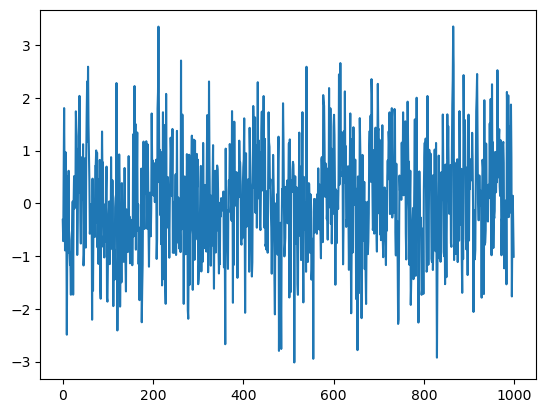

In [6]:
plt.plot(y)
plt.show()

In [12]:
x_train, y_train = create_sequences(y.reshape((-1, 1)), 10)
file_path = 'Loss_matrix_py.csv'
column_names = ['RF', 'NN', 'LSTM', 'Transformer']
Loss_py = pd.DataFrame(columns=column_names)
Loss_py.to_csv(file_path, index=False)
for t in range(100, y_train.shape[0]):
    errors = []
    rf_model = RandomForestRegressor(n_estimators=100, random_state=42)
    rf_model.fit(x_train[:t, :], y_train[:t])
    errors+= [(rf_model.predict(x_train[t:t+1, :])[0]-y_train[t])**2]
    
    
    NN = tf.keras.models.Sequential([
        tf.keras.layers.Dense(10, activation='relu', input_dim=x_train.shape[1]),
        tf.keras.layers.Dense(1, activation='sigmoid')
    ])
    NN.compile(optimizer='adam', loss='mean_squared_error')
    NN.fit(x_train[:t, :], y_train[:t, ], epochs=5)
    errors += [(NN.predict(x_train[[t-1], :])[0][0] - y_train[t])**2]
    
    
    LSTM_mod = tf.keras.models.Sequential([
        tf.keras.layers.LSTM(units=50, return_sequences=False, input_shape=(x_train.shape[1], 1)),
        tf.keras.layers.Dense(units=1)
    ])
    LSTM_mod.compile(optimizer='adam', loss='mean_squared_error')
    LSTM_mod.fit(x_train[:t, :], y_train[:t], epochs=5)
    errors += [(LSTM_mod.predict(x_train[[t-1], :])[0][0] - y_train[t])**2]
    
    Transformer = build_decoder_only_transformer(input_shape=(10, 1), ff_dim=16)
    Transformer.compile(optimizer='adam', loss='mse', metrics=['mae'])
    Transformer.fit(x_train[:t, :], y_train[:t], epochs=5, batch_size=32)
    errors += [(forecast(Transformer, x_train[t, :], n_steps=1)[0][0][0] - y_train[t])**2]

    new_row = pd.DataFrame({ k:[v] for (k,v) in zip(column_names, errors)}, )
    new_row.to_csv(file_path, mode='a', index=False, header=False)


Epoch 1/5
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 779us/step - loss: 1.1894
Epoch 2/5
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 485us/step - loss: 1.2051
Epoch 3/5
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 631us/step - loss: 1.3030


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 4/5
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 556us/step - loss: 1.1897
Epoch 5/5
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 612us/step - loss: 1.2009
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.8639  
Epoch 2/5
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8269
Epoch 3/5
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0299
Epoch 4/5
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8164
Epoch 5/5
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9452
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
Epoch 1/5
4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.9267 - mae: 1.1023
Epoch 2/5
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1003 - mae: 0.8474
Epoch 3/5
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0364 - mae: 0.8296
Epoch 4/5
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0626 - mae: 0.8539
Epoch 5/5
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9363 - mae: 0.7916
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step
Epoch 1/5
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 752us/step - loss: 1.2013
Epoch 2/5
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 543us/step - loss: 1.2843
Epoch 3/5
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 597us/step - loss: 1.2200
Epoch 4/5
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 543us/step -

/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 529us/step - loss: 1.1584
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.8305  
Epoch 2/5
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8644
Epoch 3/5
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.7279
Epoch 4/5
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.7919
Epoch 5/5
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8568
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
Epoch 1/5
4/4 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - loss: 2.7947 - mae: 1.4397
Epoch 2/5
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1953 - mae: 0.8893
Epoch 3/5
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1929 - mae: 0.8887
Epoch 4/5
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9599 - mae: 0.8044
Epoch 5/5
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0682 - mae: 0.8523
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step
Epoch 1/5
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 694us/step - loss: 1.1444
Epoch 2/5
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 750us/step - loss: 1.1407
Epoch 3/5
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 498us/step - loss: 1.1951
Epoch 4/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 559us/step - loss: 1.1823
Epoch 5/5
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 595us/step - loss: 1.2325
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9450  
Epoch 2/5
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8463
Epoch 3/5
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8853
Epoch 4/5
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8656
Epoch 5/5
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8790
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
Epoch 1/5
4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 2.6498 - mae: 1.3152
Epoch 2/5
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1498 - mae: 0.8600
Epoch 3/5
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0382 - mae: 0.8218
Epoch 4/5
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9558 - mae: 0.8057
Epoch 5/5
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0776 - mae: 0.8502
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
Epoch 1/5
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 855us/step - loss: 1.2339
Epoch 2/5
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 631us/step - loss: 1.1977
Epoch 3/5
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 596us/step - loss: 1.3706
Epoch 4/5
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - l

/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 655us/step - loss: 1.2236
Epoch 5/5
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 748us/step - loss: 1.3284
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9132  
Epoch 2/5
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9816
Epoch 3/5
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9571
Epoch 4/5
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9146
Epoch 5/5
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9297
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
Epoch 1/5
4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 3.6078 - mae: 1.5403
Epoch 2/5
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.4916 - mae: 0.9708
Epoch 3/5
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.2023 - mae: 0.8894
Epoch 4/5
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0475 - mae: 0.8432
Epoch 5/5
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9923 - mae: 0.8034
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
Epoch 1/5
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 867us/step - loss: 1.4268
Epoch 2/5
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 493us/step - loss: 1.3827
Epoch 3/5
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 431us/step - loss: 1.4190
Epoch 4/5
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - l

/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 477us/step - loss: 1.4132
Epoch 5/5
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 645us/step - loss: 1.4434
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0483  
Epoch 2/5
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9319
Epoch 3/5
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8709
Epoch 4/5
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9052
Epoch 5/5
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9724
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
Epoch 1/5
4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.4512 - mae: 0.9763
Epoch 2/5
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.2235 - mae: 0.9187
Epoch 3/5
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9634 - mae: 0.8023
Epoch 4/5
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0792 - mae: 0.8390
Epoch 5/5
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0412 - mae: 0.8282
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
Epoch 1/5
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 792us/step - loss: 1.5090
Epoch 2/5
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 472us/step - loss: 1.6166
Epoch 3/5
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 539us/step - loss: 1.4458
Epoch 4/5
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 539us/step -

/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 663us/step - loss: 1.5229
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.8270  
Epoch 2/5
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8951
Epoch 3/5
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8018
Epoch 4/5
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 978us/step - loss: 0.8705
Epoch 5/5
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8480
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
Epoch 1/5
4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 2.0794 - mae: 1.1719
Epoch 2/5
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.3901 - mae: 0.9616
Epoch 3/5
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1292 - mae: 0.8718
Epoch 4/5
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9221 - mae: 0.7810
Epoch 5/5
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1184 - mae: 0.8381
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step
Epoch 1/5
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 731us/step - loss: 1.4408
Epoch 2/5
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 577us/step - loss: 1.2830
Epoch 3/5
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 429us/step - loss: 1.3397
Epoch 4/5
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 492us/step

/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0382  
Epoch 2/5
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0074
Epoch 3/5
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 986us/step - loss: 0.8846
Epoch 4/5
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8569
Epoch 5/5
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8854
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
Epoch 1/5
4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.5955 - mae: 1.0101
Epoch 2/5
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.5120 - mae: 1.0040
Epoch 3/5
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0173 - mae: 0.8357
Epoch 4/5
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9374 - mae: 0.7887
Epoch 5/5
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0583 - mae: 0.8253
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step
Epoch 1/5
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 697us/step - loss: 1.0814
Epoch 2/5
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 446us/step - loss: 1.1540
Epoch 3/5
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 547us/step - loss: 1.3052
Epoch 4/5
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 366us/step

/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 591us/step - loss: 1.1857
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0750  
Epoch 2/5
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9143
Epoch 3/5
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9536
Epoch 4/5
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 987us/step - loss: 0.8804
Epoch 5/5
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9118
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
Epoch 1/5
4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 5.8551 - mae: 2.0057
Epoch 2/5
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 2.0608 - mae: 1.1790
Epoch 3/5
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0481 - mae: 0.8231
Epoch 4/5
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1837 - mae: 0.8658
Epoch 5/5
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1303 - mae: 0.8581
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step
Epoch 1/5
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 637us/step - loss: 1.3683
Epoch 2/5
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 594us/step - loss: 1.3764
Epoch 3/5
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 468us/step - loss: 1.3101
Epoch 4/5
3/4 ━━━━━━━━━━━━━━━━━━━━ 0s 383us/step

/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 478us/step - loss: 1.3475
Epoch 5/5
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 496us/step - loss: 1.4335
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0503  
Epoch 2/5
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0145
Epoch 3/5
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9015
Epoch 4/5
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 999us/step - loss: 0.9394
Epoch 5/5
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 995us/step - loss: 0.8556
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
Epoch 1/5
4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.7406 - mae: 1.0643
Epoch 2/5
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.3030 - mae: 0.9102
Epoch 3/5
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9412 - mae: 0.7903
Epoch 4/5
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8972 - mae: 0.7743
Epoch 5/5
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9936 - mae: 0.8137
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step
Epoch 1/5
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 728us/step - loss: 1.3737
Epoch 2/5
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 623us/step - loss: 1.3447
Epoch 3/5
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 387us/step - loss: 1.3799
Epoch 4/5
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step

/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 426us/step - loss: 1.3892
Epoch 5/5
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 427us/step - loss: 1.3622
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9119  
Epoch 2/5
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8594
Epoch 3/5
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9311
Epoch 4/5
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8919
Epoch 5/5
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8810
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
Epoch 1/5
4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 2.1229 - mae: 1.1754
Epoch 2/5
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.4265 - mae: 0.9881
Epoch 3/5
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0289 - mae: 0.8164
Epoch 4/5
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0053 - mae: 0.8134
Epoch 5/5
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9269 - mae: 0.7786
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step
Epoch 1/5
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 674us/step - loss: 1.4425
Epoch 2/5
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 458us/step - loss: 1.4074
Epoch 3/5
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 432us/step - loss: 1.3969
Epoch 4/5
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 582us/step -

/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 373us/step - loss: 1.3237
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0163  
Epoch 2/5
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.8839
Epoch 3/5
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0028
Epoch 4/5
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9426
Epoch 5/5
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9599
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
Epoch 1/5
4/4 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - loss: 1.7330 - mae: 1.0467
Epoch 2/5
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.2054 - mae: 0.8553
Epoch 3/5
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0027 - mae: 0.8019
Epoch 4/5
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0509 - mae: 0.8292
Epoch 5/5
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9887 - mae: 0.8140
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step
Epoch 1/5
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 653us/step - loss: 1.1983
Epoch 2/5
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 583us/step - loss: 1.1771
Epoch 3/5
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 429us/step - loss: 1.0784
Epoch 4/5
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 431us/step -

/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 514us/step - loss: 1.0451
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9704  
Epoch 2/5
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9261
Epoch 3/5
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9899
Epoch 4/5
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9824
Epoch 5/5
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9078
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
Epoch 1/5
4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 2.8765 - mae: 1.3904
Epoch 2/5
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.3764 - mae: 0.9466
Epoch 3/5
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.4172 - mae: 0.9593
Epoch 4/5
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0476 - mae: 0.8190
Epoch 5/5
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9919 - mae: 0.8012
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step
Epoch 1/5
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 729us/step - loss: 1.4762
Epoch 2/5
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 421us/step - loss: 1.4257
Epoch 3/5
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 513us/step - loss: 1.4713
Epoch 4/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 607us/step - loss: 1.6517
Epoch 5/5
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 518us/step - loss: 1.5180
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9341  
Epoch 2/5
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9150
Epoch 3/5
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8328
Epoch 4/5
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9114
Epoch 5/5
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 984us/step - loss: 0.9914
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
Epoch 1/5
4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 2.0548 - mae: 1.1694
Epoch 2/5
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.3690 - mae: 0.9265
Epoch 3/5
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1666 - mae: 0.8736
Epoch 4/5
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0675 - mae: 0.8439
Epoch 5/5
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0535 - mae: 0.8405
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
Epoch 1/5
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 657us/step - loss: 1.7161
Epoch 2/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 575us/step - loss: 1.7141
Epoch 3/5
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 449us/step - loss: 1.4730
Epoch 4/5
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 525us/step - loss: 1.5167
Epoch 5/5
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 503us/step - loss: 1.4112
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1138  
Epoch 2/5
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9040
Epoch 3/5
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9671
Epoch 4/5
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 994us/step - loss: 1.0356
Epoch 5/5
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 997us/step - loss: 1.0212
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
Epoch 1/5
4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.9006 - mae: 1.1393
Epoch 2/5
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0691 - mae: 0.8344
Epoch 3/5
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1565 - mae: 0.8645
Epoch 4/5
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9823 - mae: 0.8013
Epoch 5/5
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1054 - mae: 0.8617
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step
Epoch 1/5
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 682us/step - loss: 1.3255
Epoch 2/5
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 558us/step - loss: 1.3260
Epoch 3/5
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 476us/step - loss: 1.2128
Epoch 4/5
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 521us/st

/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 494us/step - loss: 1.2439
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0249  
Epoch 2/5
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.1377
Epoch 3/5
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0932
Epoch 4/5
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9367
Epoch 5/5
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.1102
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
Epoch 1/5
4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 2.2177 - mae: 1.2067
Epoch 2/5
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.3331 - mae: 0.9266
Epoch 3/5
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9987 - mae: 0.8118
Epoch 4/5
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1268 - mae: 0.8762
Epoch 5/5
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9937 - mae: 0.8022
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step
Epoch 1/5
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 634us/step - loss: 1.4609
Epoch 2/5
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 659us/step - loss: 1.5275
Epoch 3/5
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 454us/step - loss: 1.3771
Epoch 4/5
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 501us/step -

/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 570us/step - loss: 1.4477
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0647  
Epoch 2/5
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9908
Epoch 3/5
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9771
Epoch 4/5
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 998us/step - loss: 1.0343
Epoch 5/5
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9873
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
Epoch 1/5
4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 2.7846 - mae: 1.3598
Epoch 2/5
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.2352 - mae: 0.9027
Epoch 3/5
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.3698 - mae: 0.9541
Epoch 4/5
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0184 - mae: 0.8250
Epoch 5/5
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9742 - mae: 0.8062
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
Epoch 1/5
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 684us/step - loss: 1.4115
Epoch 2/5
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 495us/step - loss: 1.4322
Epoch 3/5
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 413us/step - loss: 1.4498
Epoch 4/5
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 449us/step

/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1047  
Epoch 2/5
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0075
Epoch 3/5
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9618
Epoch 4/5
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9579
Epoch 5/5
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9514
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
Epoch 1/5
4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.9620 - mae: 1.1019
Epoch 2/5
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.4935 - mae: 1.0059
Epoch 3/5
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.2430 - mae: 0.8988
Epoch 4/5
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.3539 - mae: 0.9191
Epoch 5/5
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0412 - mae: 0.8228
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step
Epoch 1/5
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 776us/step - loss: 1.5409
Epoch 2/5
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 495us/step - loss: 1.5405
Epoch 3/5
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 463us/step - loss: 1.4410
Epoch 4/5
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 472us/step -

/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 433us/step - loss: 1.5000
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0193  
Epoch 2/5
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9718
Epoch 3/5
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8755
Epoch 4/5
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9351
Epoch 5/5
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0263
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
Epoch 1/5
4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 2.0448 - mae: 1.1247
Epoch 2/5
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.6765 - mae: 1.0322
Epoch 3/5
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0269 - mae: 0.8219
Epoch 4/5
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0975 - mae: 0.8461
Epoch 5/5
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0841 - mae: 0.8574
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step
Epoch 1/5
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 792us/step - loss: 1.5760
Epoch 2/5
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 436us/step - loss: 1.3670
Epoch 3/5
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 530us/step - loss: 1.3572
Epoch 4/5
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 460us/step -

/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 5/5
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 477us/step - loss: 1.3214
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0237  
Epoch 2/5
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0798
Epoch 3/5
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0101
Epoch 4/5
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0578
Epoch 5/5
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8877
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
Epoch 1/5
4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 2.1132 - mae: 1.1785
Epoch 2/5
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.3733 - mae: 0.9256
Epoch 3/5
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1549 - mae: 0.8559
Epoch 4/5
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1339 - mae: 0.8626
Epoch 5/5
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0931 - mae: 0.8579
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step
Epoch 1/5
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 651us/step - loss: 1.6755
Epoch 2/5
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 577us/step - loss: 1.5305
Epoch 3/5
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 458us/step - loss: 1.7418
Epoch 4/5
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 609us/step -

/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1695  
Epoch 2/5
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0295
Epoch 3/5
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9248
Epoch 4/5
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0194
Epoch 5/5
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0665
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
Epoch 1/5
4/4 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - loss: 2.4837 - mae: 1.2709
Epoch 2/5
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.5428 - mae: 0.9910
Epoch 3/5
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.4825 - mae: 0.9785
Epoch 4/5
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0103 - mae: 0.8122
Epoch 5/5
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9507 - mae: 0.7750
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step
Epoch 1/5
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 711us/step - loss: 1.4134
Epoch 2/5
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 438us/step - loss: 1.3983
Epoch 3/5
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 610us/step - loss: 1.4806
Epoch 4/5
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 403us/step -

/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 427us/step - loss: 1.3729
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9844  
Epoch 2/5
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9630
Epoch 3/5
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9243
Epoch 4/5
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9763
Epoch 5/5
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9020
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step
Epoch 1/5
4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.8269 - mae: 1.1117
Epoch 2/5
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.3930 - mae: 0.9519
Epoch 3/5
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0165 - mae: 0.8193
Epoch 4/5
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0474 - mae: 0.8243
Epoch 5/5
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9692 - mae: 0.7955
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
Epoch 1/5
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 835us/step - loss: 1.5418
Epoch 2/5
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 525us/step - loss: 1.4833
Epoch 3/5
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 549us/step - loss: 1.5155
Epoch 4/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 491us/step - loss: 1.3965
Epoch 5/5
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 411us/step - loss: 1.3531
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1437  
Epoch 2/5
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0397
Epoch 3/5
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9140
Epoch 4/5
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9600
Epoch 5/5
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9769
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
Epoch 1/5
4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.9603 - mae: 1.1774
Epoch 2/5
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.3433 - mae: 0.9383
Epoch 3/5
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.2127 - mae: 0.9056
Epoch 4/5
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.2392 - mae: 0.8915
Epoch 5/5
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1098 - mae: 0.8416
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step
Epoch 1/5
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 886us/step - loss: 1.4180
Epoch 2/5
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 496us/step - loss: 1.6137
Epoch 3/5
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 589us/step - loss: 1.5831
Epoch 4/5
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - l

/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 523us/step - loss: 1.4386
Epoch 5/5
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 484us/step - loss: 1.4306
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9568  
Epoch 2/5
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.8873
Epoch 3/5
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0206
Epoch 4/5
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9845
Epoch 5/5
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9808
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
Epoch 1/5
4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 2.3245 - mae: 1.2386
Epoch 2/5
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.2122 - mae: 0.8953
Epoch 3/5
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0064 - mae: 0.8166
Epoch 4/5
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9538 - mae: 0.7894
Epoch 5/5
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9512 - mae: 0.7949
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
Epoch 1/5
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 730us/step - loss: 1.4541
Epoch 2/5
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 502us/step - loss: 1.3880
Epoch 3/5
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 495us/step - loss: 1.3575
Epoch 4/5
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - l

/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 561us/step - loss: 1.2461
Epoch 5/5
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 394us/step - loss: 1.4496
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9561  
Epoch 2/5
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9686
Epoch 3/5
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9660
Epoch 4/5
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0258
Epoch 5/5
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8717
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
Epoch 1/5
4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.8939 - mae: 1.0851
Epoch 2/5
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 2.0284 - mae: 1.1834
Epoch 3/5
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1111 - mae: 0.8513
Epoch 4/5
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.3074 - mae: 0.9087
Epoch 5/5
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0133 - mae: 0.8002
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step
Epoch 1/5
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 836us/step - loss: 1.2464
Epoch 2/5
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 542us/step - loss: 1.2329
Epoch 3/5
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 648us/step - loss: 1.1507
Epoch 4/5
2/4 ━━━━━━━━━━━━━━━━━━━━ 0s 321us/step -

/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 575us/step - loss: 1.2038
Epoch 5/5
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 408us/step - loss: 1.0776
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0527  
Epoch 2/5
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0271
Epoch 3/5
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0330
Epoch 4/5
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9397
Epoch 5/5
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0408
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
Epoch 1/5
4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 2.6173 - mae: 1.3079
Epoch 2/5
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1968 - mae: 0.8916
Epoch 3/5
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.2490 - mae: 0.8978
Epoch 4/5
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1580 - mae: 0.8672
Epoch 5/5
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0043 - mae: 0.8163
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step
Epoch 1/5
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 725us/step - loss: 1.5098
Epoch 2/5
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 548us/step - loss: 1.3815
Epoch 3/5
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 517us/step - loss: 1.2030
Epoch 4/5
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 544us/step -

/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9017  
Epoch 2/5
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.8817
Epoch 3/5
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9722
Epoch 4/5
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8381
Epoch 5/5
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9831
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
Epoch 1/5
4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 2.2628 - mae: 1.2652
Epoch 2/5
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.2103 - mae: 0.8883
Epoch 3/5
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1023 - mae: 0.8428
Epoch 4/5
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1071 - mae: 0.8483
Epoch 5/5
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9601 - mae: 0.7918
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
Epoch 1/5
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 730us/step - loss: 1.6315
Epoch 2/5
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 507us/step - loss: 1.6723
Epoch 3/5
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 473us/step - loss: 1.4664
Epoch 4/5
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 439us/step -

/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 597us/step - loss: 1.5311
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1043  
Epoch 2/5
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.1689
Epoch 3/5
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9422
Epoch 4/5
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9050
Epoch 5/5
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9642
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
Epoch 1/5
4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 3.6025 - mae: 1.5342
Epoch 2/5
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.7699 - mae: 1.0888
Epoch 3/5
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1287 - mae: 0.8684
Epoch 4/5
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1681 - mae: 0.8548
Epoch 5/5
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1169 - mae: 0.8585
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step
Epoch 1/5
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 664us/step - loss: 1.5474
Epoch 2/5
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 538us/step - loss: 1.4220
Epoch 3/5
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 579us/step - loss: 1.2664
Epoch 4/5
2/4 ━━━━━━━━━━━━━━━━━━━━ 0s 414us/step -

/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 482us/step - loss: 1.3396
Epoch 5/5
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 422us/step - loss: 1.2210
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1082  
Epoch 2/5
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0300
Epoch 3/5
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9422
Epoch 4/5
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9056
Epoch 5/5
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9934
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
Epoch 1/5
4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.7397 - mae: 1.0553
Epoch 2/5
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1500 - mae: 0.8759
Epoch 3/5
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1201 - mae: 0.8720
Epoch 4/5
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0064 - mae: 0.8197
Epoch 5/5
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1028 - mae: 0.8439
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step
Epoch 1/5
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 868us/step - loss: 1.5170
Epoch 2/5
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 574us/step - loss: 1.4883
Epoch 3/5
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 408us/step - loss: 1.4427
Epoch 4/5
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 499us/step -

/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 5/5
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 473us/step - loss: 1.2717
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0215  
Epoch 2/5
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8921
Epoch 3/5
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9986
Epoch 4/5
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 937us/step - loss: 0.9971
Epoch 5/5
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 961us/step - loss: 0.8641
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
Epoch 1/5
4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.5403 - mae: 0.9898
Epoch 2/5
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.3172 - mae: 0.9074
Epoch 3/5
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.8805 - mae: 0.7550
Epoch 4/5
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0924 - mae: 0.8536
Epoch 5/5
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0091 - mae: 0.8147
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step
Epoch 1/5
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 698us/step - loss: 1.5566
Epoch 2/5
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 573us/step - loss: 1.4212
Epoch 3/5
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 461us/step - loss: 1.3960
Epoch 4/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 374us/step - loss: 1.4598
Epoch 5/5
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 517us/step - loss: 1.4380
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.8530  
Epoch 2/5
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9537
Epoch 3/5
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 996us/step - loss: 0.8882
Epoch 4/5
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 993us/step - loss: 0.9045
Epoch 5/5
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9423
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
Epoch 1/5
5/5 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - loss: 2.0632 - mae: 1.1421
Epoch 2/5
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.2637 - mae: 0.9148
Epoch 3/5
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0933 - mae: 0.8455
Epoch 4/5
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0616 - mae: 0.8264
Epoch 5/5
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9859 - mae: 0.8036
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step
Epoch 1/5
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 624us/step - loss: 1.6131
Epoch 2/5
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 515us/step - loss: 1.6121
Epoch 3/5
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 464us/step - loss: 1.5103
Epoch 4/5
3/5 ━━━━━━━━━━━━━━━━━━━━ 0s 363us/st

/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 451us/step - loss: 1.5987
Epoch 5/5
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 392us/step - loss: 1.5392
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0961  
Epoch 2/5
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8743
Epoch 3/5
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 993us/step - loss: 1.0220
Epoch 4/5
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 969us/step - loss: 1.0075
Epoch 5/5
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9008
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
Epoch 1/5
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.9145 - mae: 1.1286
Epoch 2/5
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.5804 - mae: 0.9845
Epoch 3/5
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0878 - mae: 0.8386
Epoch 4/5
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0478 - mae: 0.8257
Epoch 5/5
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0051 - mae: 0.8211
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step
Epoch 1/5
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 629us/step - loss: 1.4662
Epoch 2/5
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 475us/step - loss: 1.3687
Epoch 3/5
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 499us/step - loss: 1.3821
Epoch 4/5
4/5 ━━━━━━━━━━━━━━━━━━━━ 0s 365us/st

/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 482us/step - loss: 1.3954
Epoch 5/5
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 436us/step - loss: 1.4585
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9439  
Epoch 2/5
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9550
Epoch 3/5
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 990us/step - loss: 0.8738
Epoch 4/5
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 998us/step - loss: 0.9381
Epoch 5/5
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 996us/step - loss: 1.0065
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
Epoch 1/5
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 3.0639 - mae: 1.4021
Epoch 2/5
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.7360 - mae: 1.0338
Epoch 3/5
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0008 - mae: 0.8079
Epoch 4/5
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9560 - mae: 0.7967
Epoch 5/5
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0809 - mae: 0.8288
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step
Epoch 1/5
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 571us/step - loss: 1.4513
Epoch 2/5
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 467us/step - loss: 1.4978
Epoch 3/5
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 376us/step - loss: 1.5404
Epoch 4/5
2/5 ━━━━━━━━━━━━━━━━━━━━ 0s 429us/

/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 421us/step - loss: 1.5333
Epoch 5/5
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 418us/step - loss: 1.4707
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1093  
Epoch 2/5
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9954
Epoch 3/5
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0175
Epoch 4/5
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9076
Epoch 5/5
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 995us/step - loss: 0.9697
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
Epoch 1/5
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.9291 - mae: 1.1621
Epoch 2/5
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1642 - mae: 0.8663
Epoch 3/5
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9254 - mae: 0.7811
Epoch 4/5
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0537 - mae: 0.8421
Epoch 5/5
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0770 - mae: 0.8431
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step
Epoch 1/5
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 594us/step - loss: 1.5871
Epoch 2/5
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 450us/step - loss: 1.4738
Epoch 3/5
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 450us/step - loss: 1.7094
Epoch 4/5
1/5 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step -

/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 423us/step - loss: 1.6628
Epoch 5/5
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 524us/step - loss: 1.4499
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1426  
Epoch 2/5
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9681
Epoch 3/5
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 980us/step - loss: 1.0071
Epoch 4/5
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9583
Epoch 5/5
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8614
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
Epoch 1/5
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 2.3602 - mae: 1.2646
Epoch 2/5
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.3411 - mae: 0.9448
Epoch 3/5
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0053 - mae: 0.8069
Epoch 4/5
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0776 - mae: 0.8445
Epoch 5/5
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0535 - mae: 0.8334
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step
Epoch 1/5
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 609us/step - loss: 1.3225
Epoch 2/5
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 507us/step - loss: 1.1867
Epoch 3/5
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 459us/step - loss: 1.2327
Epoch 4/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 519us/step - loss: 1.2257
Epoch 5/5
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 423us/step - loss: 1.2234
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9542  
Epoch 2/5
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0112
Epoch 3/5
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0226
Epoch 4/5
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 970us/step - loss: 0.9435
Epoch 5/5
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 991us/step - loss: 0.8661
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
Epoch 1/5
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.7474 - mae: 1.0408
Epoch 2/5
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.6518 - mae: 1.0028
Epoch 3/5
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0948 - mae: 0.8513
Epoch 4/5
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0801 - mae: 0.8482
Epoch 5/5
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9847 - mae: 0.8150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step
Epoch 1/5
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 678us/step - loss: 1.6429
Epoch 2/5
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 477us/step - loss: 1.5337
Epoch 3/5
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 413us/step - loss: 1.4296
Epoch 4/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 473us/step - loss: 1.4680
Epoch 5/5
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 428us/step - loss: 1.6042
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9659  
Epoch 2/5
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8879
Epoch 3/5
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9674
Epoch 4/5
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9184
Epoch 5/5
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9356
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
Epoch 1/5
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.5835 - mae: 1.0019
Epoch 2/5
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.2123 - mae: 0.9117
Epoch 3/5
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0807 - mae: 0.8491
Epoch 4/5
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0646 - mae: 0.8246
Epoch 5/5
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0410 - mae: 0.8255
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step
Epoch 1/5
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 591us/step - loss: 1.3785
Epoch 2/5
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 510us/step - loss: 1.2488
Epoch 3/5
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 406us/step - loss: 1.2553
Epoch 4/5
3/5 ━━━━━━━━━━━━━━━━━━━━ 0s 353us/step -

/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 536us/step - loss: 1.2306
Epoch 5/5
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 641us/step - loss: 1.1520
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0177  
Epoch 2/5
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8917
Epoch 3/5
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 985us/step - loss: 0.8521
Epoch 4/5
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 975us/step - loss: 1.0028
Epoch 5/5
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 962us/step - loss: 0.8338
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
Epoch 1/5
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.4148 - mae: 0.9520
Epoch 2/5
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.2686 - mae: 0.9376
Epoch 3/5
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0081 - mae: 0.8190
Epoch 4/5
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0848 - mae: 0.8498
Epoch 5/5
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0484 - mae: 0.8320
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step
Epoch 1/5
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 646us/step - loss: 1.5673
Epoch 2/5
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 408us/step - loss: 1.5615
Epoch 3/5
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 452us/step - loss: 1.4644
Epoch 4/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 411us/step - loss: 1.4426
Epoch 5/5
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 446us/step - loss: 1.3526
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9660  
Epoch 2/5
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9657
Epoch 3/5
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 974us/step - loss: 0.9533
Epoch 4/5
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 981us/step - loss: 0.7742
Epoch 5/5
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 963us/step - loss: 1.0216
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
Epoch 1/5
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.4851 - mae: 0.9745
Epoch 2/5
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1842 - mae: 0.8828
Epoch 3/5
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9973 - mae: 0.8062
Epoch 4/5
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9236 - mae: 0.7851
Epoch 5/5
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1336 - mae: 0.8457
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
Epoch 1/5
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 592us/step - loss: 1.5209
Epoch 2/5
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 546us/step - loss: 1.5147
Epoch 3/5
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 529us/step - loss: 1.5119
Epoch 4/5
2/5 ━━━━━━━━━━━━━━━━━━━━ 0s 452us/

/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 426us/step - loss: 1.4683
Epoch 5/5
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 461us/step - loss: 1.4818
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9616  
Epoch 2/5
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9064
Epoch 3/5
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8571
Epoch 4/5
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 996us/step - loss: 0.8574
Epoch 5/5
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 977us/step - loss: 0.9250
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
Epoch 1/5
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.1706 - mae: 0.8836
Epoch 2/5
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0130 - mae: 0.8022
Epoch 3/5
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9969 - mae: 0.7997
Epoch 4/5
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9589 - mae: 0.7835
Epoch 5/5
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0039 - mae: 0.8070
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step
Epoch 1/5
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 609us/step - loss: 1.3277
Epoch 2/5
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 456us/step - loss: 1.4762
Epoch 3/5
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 434us/step - loss: 1.3793
Epoch 4/5
1/5 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step

/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 445us/step - loss: 1.3349
Epoch 5/5
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 347us/step - loss: 1.3040
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0766  
Epoch 2/5
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9535
Epoch 3/5
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9419
Epoch 4/5
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 972us/step - loss: 0.9158
Epoch 5/5
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9239
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
Epoch 1/5
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.1346 - mae: 0.8427
Epoch 2/5
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0309 - mae: 0.8186
Epoch 3/5
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9218 - mae: 0.7685
Epoch 4/5
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9716 - mae: 0.7965
Epoch 5/5
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0199 - mae: 0.8328
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 709us/step - loss: 1.5491
Epoch 2/5
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 387us/step - loss: 1.6083
Epoch 3/5
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 424us/step - loss: 1.6156
Epoch 4/5
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 477us/step - loss: 1.5463
Epoch 5/5
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 371us/step - loss: 1.4916
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0446  
Epoch 2/5
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9347
Epoch 3/5
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9750
Epoch 4/5
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 994us/step - loss: 0.9271
Epoch 5/5
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0229
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
Epoch 1/5
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 3.1261 - mae: 1.4519
Epoch 2/5
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1744 - mae: 0.8633
Epoch 3/5
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9389 - mae: 0.7641
Epoch 4/5
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9415 - mae: 0.7818
Epoch 5/5
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0292 - mae: 0.8107
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step
Epoch 1/5
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 623us/step - loss: 1.6604
Epoch 2/5
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 396us/step - loss: 1.7108
Epoch 3/5
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 321us/step - loss: 1.8961
Epoch 4/5
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 374us/step

/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 561us/step - loss: 1.8962
Epoch 5/5
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 537us/step - loss: 1.7663
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9088  
Epoch 2/5
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8823
Epoch 3/5
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9126
Epoch 4/5
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 974us/step - loss: 0.8360
Epoch 5/5
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8871
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
Epoch 1/5
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.5807 - mae: 0.9976
Epoch 2/5
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0171 - mae: 0.8042
Epoch 3/5
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0984 - mae: 0.8639
Epoch 4/5
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9788 - mae: 0.8167
Epoch 5/5
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0897 - mae: 0.8343
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step
Epoch 1/5
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 705us/step - loss: 1.5440
Epoch 2/5
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 582us/step - loss: 1.3920
Epoch 3/5
2/5 ━━━━━━━━━━━━━━━━━━━━ 0s 301us/step - loss: 1.7206

/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 429us/step - loss: 1.4984
Epoch 4/5
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 425us/step - loss: 1.3798
Epoch 5/5
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 445us/step - loss: 1.1462
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9760  
Epoch 2/5
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0952
Epoch 3/5
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9161
Epoch 4/5
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8586
Epoch 5/5
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 973us/step - loss: 0.9236
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
Epoch 1/5
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.8332 - mae: 1.0812
Epoch 2/5
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.3747 - mae: 0.9508
Epoch 3/5
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9887 - mae: 0.8033
Epoch 4/5
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0374 - mae: 0.8061
Epoch 5/5
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9391 - mae: 0.7847
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step
Epoch 1/5
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 647us/step - loss: 1.5587
Epoch 2/5
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 453us/step - loss: 1.5475
Epoch 3/5
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 455us/step - loss: 1.3613
Epoch 4/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 443us/step - loss: 1.4976
Epoch 5/5
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 421us/step - loss: 1.5397
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0258  
Epoch 2/5
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8959
Epoch 3/5
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0263
Epoch 4/5
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8184
Epoch 5/5
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8678
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
Epoch 1/5
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.4315 - mae: 0.9675
Epoch 2/5
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.2475 - mae: 0.9142
Epoch 3/5
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9342 - mae: 0.7735
Epoch 4/5
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1586 - mae: 0.8403
Epoch 5/5
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1262 - mae: 0.8480
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step
Epoch 1/5
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 633us/step - loss: 1.3370
Epoch 2/5
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 523us/step - loss: 1.3660
Epoch 3/5
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 427us/step - loss: 1.3991
Epoch 4/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 431us/step - loss: 1.2907
Epoch 5/5
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 564us/step - loss: 1.3492
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9032  
Epoch 2/5
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9940
Epoch 3/5
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8336
Epoch 4/5
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8904
Epoch 5/5
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8849
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
Epoch 1/5
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.6915 - mae: 1.0477
Epoch 2/5
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.3088 - mae: 0.9281
Epoch 3/5
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9853 - mae: 0.7829
Epoch 4/5
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9740 - mae: 0.7647
Epoch 5/5
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0030 - mae: 0.7999
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
Epoch 1/5
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 594us/step - loss: 1.3202
Epoch 2/5
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 507us/step - loss: 1.1839
Epoch 3/5
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 392us/step - loss: 1.2576
Epoch 4/5
1/5 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - l

/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 479us/step - loss: 1.2990
Epoch 5/5
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 535us/step - loss: 1.0612
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.8738  
Epoch 2/5
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8354
Epoch 3/5
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8047
Epoch 4/5
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 981us/step - loss: 0.8683
Epoch 5/5
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9020
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
Epoch 1/5
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.5164 - mae: 0.9978
Epoch 2/5
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1081 - mae: 0.8407
Epoch 3/5
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0291 - mae: 0.8364
Epoch 4/5
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9869 - mae: 0.8188
Epoch 5/5
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9353 - mae: 0.7833
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step
Epoch 1/5
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 668us/step - loss: 1.6348
Epoch 2/5
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 495us/step - loss: 1.6067
Epoch 3/5
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 440us/step - loss: 1.6101
Epoch 4/5
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 410us/step

/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9721  
Epoch 2/5
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9345
Epoch 3/5
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8458
Epoch 4/5
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8263
Epoch 5/5
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0648
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
Epoch 1/5
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.4890 - mae: 0.9772
Epoch 2/5
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1126 - mae: 0.8678
Epoch 3/5
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0972 - mae: 0.8389
Epoch 4/5
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0199 - mae: 0.8063
Epoch 5/5
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9559 - mae: 0.7788
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
Epoch 1/5
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 562us/step - loss: 1.5332
Epoch 2/5
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 410us/step - loss: 1.4714
Epoch 3/5
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 463us/step - loss: 1.5991
Epoch 4/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 386us/step - loss: 1.6227
Epoch 5/5
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 413us/step - loss: 1.2656
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9901  
Epoch 2/5
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9711
Epoch 3/5
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.7804
Epoch 4/5
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8493
Epoch 5/5
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9474
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
Epoch 1/5
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 2.1299 - mae: 1.1661
Epoch 2/5
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0211 - mae: 0.8083
Epoch 3/5
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0272 - mae: 0.8003
Epoch 4/5
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9775 - mae: 0.7977
Epoch 5/5
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9589 - mae: 0.8110
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
Epoch 1/5
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 730us/step - loss: 1.1330
Epoch 2/5
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 463us/step - loss: 1.2077
Epoch 3/5
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 452us/step - loss: 1.1956
Epoch 4/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 453us/step - loss: 1.0964
Epoch 5/5
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 443us/step - loss: 1.1066
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.8974  
Epoch 2/5
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8673
Epoch 3/5
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8727
Epoch 4/5
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8642
Epoch 5/5
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8430
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
Epoch 1/5
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.8640 - mae: 1.1222
Epoch 2/5
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1120 - mae: 0.8356
Epoch 3/5
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1290 - mae: 0.8678
Epoch 4/5
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9859 - mae: 0.8057
Epoch 5/5
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.8883 - mae: 0.7620
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step
Epoch 1/5
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 593us/step - loss: 1.5793
Epoch 2/5
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 475us/step - loss: 1.5040
Epoch 3/5
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 480us/step - loss: 1.3083
Epoch 4/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 457us/step - loss: 1.4867
Epoch 5/5
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 480us/step - loss: 1.3795
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.8897  
Epoch 2/5
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0443
Epoch 3/5
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8639
Epoch 4/5
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 1000us/step - loss: 0.8526
Epoch 5/5
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 1000us/step - loss: 0.8860
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
Epoch 1/5
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 4.1387 - mae: 1.6900
Epoch 2/5
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1913 - mae: 0.8825
Epoch 3/5
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1945 - mae: 0.9040
Epoch 4/5
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0943 - mae: 0.8486
Epoch 5/5
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0095 - mae: 0.8105
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step
Epoch 1/5
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 546us/step - loss: 1.3582
Epoch 2/5
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 535us/step - loss: 1.2859
Epoch 3/5
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 408us/step - loss: 1.2562
Epoch 4/5
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 399us/

/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 556us/step - loss: 1.4362
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0311  
Epoch 2/5
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9748
Epoch 3/5
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9297
Epoch 4/5
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9158
Epoch 5/5
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8859
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
Epoch 1/5
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.7252 - mae: 1.0630
Epoch 2/5
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.3392 - mae: 0.9292
Epoch 3/5
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0090 - mae: 0.8033
Epoch 4/5
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9380 - mae: 0.7878
Epoch 5/5
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0494 - mae: 0.8323
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step
Epoch 1/5
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 621us/step - loss: 1.5920
Epoch 2/5
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 411us/step - loss: 1.5458
Epoch 3/5
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 364us/step - loss: 1.7060
Epoch 4/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 332us/step - loss: 1.4456
Epoch 5/5
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 343us/step - loss: 1.4190
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


5/5 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - loss: 0.9195
Epoch 2/5
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9894
Epoch 3/5
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0951
Epoch 4/5
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9408
Epoch 5/5
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9853
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
Epoch 1/5
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 2.5355 - mae: 1.2633
Epoch 2/5
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.6451 - mae: 1.0484
Epoch 3/5
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1959 - mae: 0.8925
Epoch 4/5
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1498 - mae: 0.8724
Epoch 5/5
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0117 - mae: 0.8074
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step
Epoch 1/5
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 642us/step - loss: 1.2831
Epoch 2/5
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 443us/step - loss: 1.3800
Epoch 3/5
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 490us/step - loss: 1.3397
Epoch 4/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 421us/step - loss: 1.2735
Epoch 5/5
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 417us/step - loss: 1.3831
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9762  
Epoch 2/5
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9861
Epoch 3/5
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9647
Epoch 4/5
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9083
Epoch 5/5
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9230
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
Epoch 1/5
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.7866 - mae: 1.1029
Epoch 2/5
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1897 - mae: 0.8648
Epoch 3/5
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0416 - mae: 0.8366
Epoch 4/5
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0993 - mae: 0.8528
Epoch 5/5
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.8941 - mae: 0.7727
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step
Epoch 1/5
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 629us/step - loss: 1.3812
Epoch 2/5
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 370us/step - loss: 1.5426
Epoch 3/5
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 450us/step - loss: 1.5048
Epoch 4/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 475us/step - loss: 1.5338
Epoch 5/5
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 424us/step - loss: 1.2903
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0245  
Epoch 2/5
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0220
Epoch 3/5
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8657
Epoch 4/5
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8777
Epoch 5/5
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0460
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
Epoch 1/5
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.7929 - mae: 1.0695
Epoch 2/5
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1058 - mae: 0.8681
Epoch 3/5
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0757 - mae: 0.8529
Epoch 4/5
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9065 - mae: 0.7820
Epoch 5/5
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0204 - mae: 0.8201
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
Epoch 1/5
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 686us/step - loss: 1.7623
Epoch 2/5
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 386us/step - loss: 1.5558
Epoch 3/5
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 547us/step - loss: 1.6051
Epoch 4/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 332us/step - loss: 1.5276
Epoch 5/5
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 446us/step - loss: 1.5459
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9157  
Epoch 2/5
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8613
Epoch 3/5
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0161
Epoch 4/5
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9520
Epoch 5/5
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9289
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
Epoch 1/5
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.7146 - mae: 1.0202
Epoch 2/5
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.2042 - mae: 0.8908
Epoch 3/5
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1049 - mae: 0.8626
Epoch 4/5
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9615 - mae: 0.8048
Epoch 5/5
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9476 - mae: 0.7877
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
Epoch 1/5
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 609us/step - loss: 1.6229
Epoch 2/5
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 471us/step - loss: 1.4885
Epoch 3/5
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 419us/step - loss: 1.3788
Epoch 4/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 375us/step - loss: 1.4380
Epoch 5/5
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 390us/step - loss: 1.4382
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0823  
Epoch 2/5
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9628
Epoch 3/5
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9130
Epoch 4/5
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9511
Epoch 5/5
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8864
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
Epoch 1/5
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 2.7171 - mae: 1.3192
Epoch 2/5
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.9157 - mae: 1.1127
Epoch 3/5
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0803 - mae: 0.8518
Epoch 4/5
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1427 - mae: 0.8708
Epoch 5/5
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0296 - mae: 0.7955
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step
Epoch 1/5
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 613us/step - loss: 1.4662
Epoch 2/5
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 414us/step - loss: 1.5065
Epoch 3/5
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 496us/step - loss: 1.3326
Epoch 4/5
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 446us/step -

/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 552us/step - loss: 1.3254
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1654  
Epoch 2/5
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0446
Epoch 3/5
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0536
Epoch 4/5
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9316
Epoch 5/5
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8680
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
Epoch 1/5
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.8849 - mae: 1.1399
Epoch 2/5
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.4447 - mae: 1.0035
Epoch 3/5
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1001 - mae: 0.8519
Epoch 4/5
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1119 - mae: 0.8304
Epoch 5/5
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9520 - mae: 0.7806
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step
Epoch 1/5
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 635us/step - loss: 1.4509
Epoch 2/5
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 432us/step - loss: 1.4819
Epoch 3/5
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 417us/step - loss: 1.4946
Epoch 4/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 557us/step - loss: 1.4979
Epoch 5/5
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 394us/step - loss: 1.4447
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9732  
Epoch 2/5
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9812
Epoch 3/5
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9413
Epoch 4/5
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9485
Epoch 5/5
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8765
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
Epoch 1/5
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.6275 - mae: 1.0341
Epoch 2/5
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1221 - mae: 0.8341
Epoch 3/5
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0584 - mae: 0.8481
Epoch 4/5
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0482 - mae: 0.8298
Epoch 5/5
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0868 - mae: 0.8579
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
Epoch 1/5
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 595us/step - loss: 1.1102
Epoch 2/5
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 530us/step - loss: 1.0970
Epoch 3/5
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 423us/step - loss: 1.1591
Epoch 4/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 398us/step - loss: 1.0875
Epoch 5/5
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 425us/step - loss: 1.2579
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0948  
Epoch 2/5
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9814
Epoch 3/5
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 999us/step - loss: 1.0286
Epoch 4/5
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8995
Epoch 5/5
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8465
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
Epoch 1/5
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 2.0121 - mae: 1.1540
Epoch 2/5
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1693 - mae: 0.8907
Epoch 3/5
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0504 - mae: 0.8174
Epoch 4/5
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1523 - mae: 0.8729
Epoch 5/5
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0089 - mae: 0.8248
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
Epoch 1/5
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 476us/step - loss: 1.2475
Epoch 2/5
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 427us/step - loss: 1.2080
Epoch 3/5
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 374us/step - loss: 1.1027
Epoch 4/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 407us/step - loss: 1.0676
Epoch 5/5
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 389us/step - loss: 1.1796
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9824  
Epoch 2/5
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9451
Epoch 3/5
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9606
Epoch 4/5
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9716
Epoch 5/5
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9430
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
Epoch 1/5
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.6267 - mae: 1.0350
Epoch 2/5
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0984 - mae: 0.8354
Epoch 3/5
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0590 - mae: 0.8435
Epoch 4/5
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1073 - mae: 0.8621
Epoch 5/5
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0719 - mae: 0.8258
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
Epoch 1/5
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 697us/step - loss: 1.5954
Epoch 2/5
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 425us/step - loss: 1.5362
Epoch 3/5
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 402us/step - loss: 1.3524
Epoch 4/5
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 453us/step -

/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0030  
Epoch 2/5
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9525
Epoch 3/5
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8755
Epoch 4/5
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 994us/step - loss: 0.9084
Epoch 5/5
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 980us/step - loss: 0.8776
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
Epoch 1/5
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.3699 - mae: 0.9438
Epoch 2/5
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1345 - mae: 0.8957
Epoch 3/5
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0221 - mae: 0.8336
Epoch 4/5
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0127 - mae: 0.7957
Epoch 5/5
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.8936 - mae: 0.7768
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
Epoch 1/5
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 462us/step - loss: 1.6137
Epoch 2/5
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 450us/step - loss: 1.6163
Epoch 3/5
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 411us/step - loss: 1.5809
Epoch 4/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 329us/step - loss: 1.4809
Epoch 5/5
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 390us/step - loss: 1.5053
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0468  
Epoch 2/5
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9654
Epoch 3/5
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9356
Epoch 4/5
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 985us/step - loss: 0.9555
Epoch 5/5
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 987us/step - loss: 0.9351
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
Epoch 1/5
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 3.4023 - mae: 1.5122
Epoch 2/5
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.4128 - mae: 0.9277
Epoch 3/5
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9790 - mae: 0.8139
Epoch 4/5
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0406 - mae: 0.8338
Epoch 5/5
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0215 - mae: 0.8380
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
Epoch 1/5
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 589us/step - loss: 1.2042
Epoch 2/5
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 367us/step - loss: 1.1650
Epoch 3/5
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 443us/step - loss: 1.3010
Epoch 4/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 393us/step - loss: 1.1559
Epoch 5/5
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 391us/step - loss: 1.2605
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9580  
Epoch 2/5
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9409
Epoch 3/5
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 999us/step - loss: 0.8820
Epoch 4/5
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 965us/step - loss: 0.9307
Epoch 5/5
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 978us/step - loss: 0.9365
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
Epoch 1/5
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.6496 - mae: 1.0426
Epoch 2/5
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1715 - mae: 0.8481
Epoch 3/5
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9263 - mae: 0.7963
Epoch 4/5
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9978 - mae: 0.8252
Epoch 5/5
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0633 - mae: 0.8191
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


6/6 ━━━━━━━━━━━━━━━━━━━━ 2s 539us/step - loss: 1.4168
Epoch 2/5
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 557us/step - loss: 1.3153
Epoch 3/5
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 384us/step - loss: 1.3749
Epoch 4/5
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 419us/step - loss: 1.3829
Epoch 5/5
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 433us/step - loss: 1.2794
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9391  
Epoch 2/5
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8899
Epoch 3/5
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 989us/step - loss: 0.9035
Epoch 4/5
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 964us/step - loss: 0.8746
Epoch 5/5
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 974us/step - loss: 0.8675
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
Epoch 1/5
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 2.9185 - mae: 1.3512
Epoch 2/5
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.2022 - mae: 0.8454
Epoch 3/5
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9042 - mae: 0.7663
Epoch 4/5
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9171 - mae: 0.7911
Epoch 5/5
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0275 - mae: 0.8319
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
Epoch 1/5
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 510us/step - loss: 1.1040
Epoch 2/5
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 431us/step - loss: 1.1559
Epoch 3/5
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 425us/step - loss: 1.1627
Epoch 4/5
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 369us/

/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 413us/step - loss: 1.0912
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9750  
Epoch 2/5
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8642
Epoch 3/5
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9052
Epoch 4/5
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 986us/step - loss: 0.9719
Epoch 5/5
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 988us/step - loss: 0.8090
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
Epoch 1/5
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.6000 - mae: 1.0024
Epoch 2/5
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1306 - mae: 0.8919
Epoch 3/5
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1654 - mae: 0.8438
Epoch 4/5
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1177 - mae: 0.8098
Epoch 5/5
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0465 - mae: 0.8456
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step
Epoch 1/5
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 622us/step - loss: 1.7001
Epoch 2/5
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 496us/step - loss: 1.5826
Epoch 3/5
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 543us/step - loss: 1.4795
Epoch 4/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 364us/step - loss: 1.6068
Epoch 5/5
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 417us/step - loss: 1.5562
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9849  
Epoch 2/5
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9208
Epoch 3/5
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 952us/step - loss: 0.8708
Epoch 4/5
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 960us/step - loss: 0.9659
Epoch 5/5
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 982us/step - loss: 0.8554
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
Epoch 1/5
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.8879 - mae: 1.1438
Epoch 2/5
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.3958 - mae: 0.9292
Epoch 3/5
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0408 - mae: 0.8171
Epoch 4/5
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0202 - mae: 0.8316
Epoch 5/5
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0725 - mae: 0.8297
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step
Epoch 1/5
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 551us/step - loss: 1.3579
Epoch 2/5
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 420us/step - loss: 1.3524
Epoch 3/5
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 419us/step - loss: 1.3138
Epoch 4/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 390us/step - loss: 1.2588
Epoch 5/5
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 368us/step - loss: 1.2479
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0348  
Epoch 2/5
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9686
Epoch 3/5
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9757
Epoch 4/5
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 985us/step - loss: 0.8986
Epoch 5/5
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9555
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
Epoch 1/5
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.5029 - mae: 0.9463
Epoch 2/5
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1926 - mae: 0.8836
Epoch 3/5
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0824 - mae: 0.8436
Epoch 4/5
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9675 - mae: 0.8038
Epoch 5/5
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0080 - mae: 0.8057
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
Epoch 1/5
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 619us/step - loss: 1.4019
Epoch 2/5
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 411us/step - loss: 1.4513
Epoch 3/5
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 354us/step - loss: 1.4712
Epoch 4/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 460us/step - loss: 1.2635
Epoch 5/5
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 385us/step - loss: 1.3109
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0165  
Epoch 2/5
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9333
Epoch 3/5
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9465
Epoch 4/5
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 970us/step - loss: 0.9458
Epoch 5/5
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 981us/step - loss: 0.8433
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
Epoch 1/5
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.6467 - mae: 1.0105
Epoch 2/5
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0019 - mae: 0.7963
Epoch 3/5
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0111 - mae: 0.8063
Epoch 4/5
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0349 - mae: 0.8361
Epoch 5/5
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9959 - mae: 0.7985
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step
Epoch 1/5
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 547us/step - loss: 1.3005
Epoch 2/5
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 385us/step - loss: 1.0601
Epoch 3/5
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 391us/step - loss: 1.1560
Epoch 4/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 384us/step - loss: 1.1080
Epoch 5/5
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 513us/step - loss: 1.0615
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9239  
Epoch 2/5
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9753
Epoch 3/5
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9359
Epoch 4/5
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 914us/step - loss: 0.9820
Epoch 5/5
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 956us/step - loss: 0.8866
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
Epoch 1/5
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.9088 - mae: 1.1060
Epoch 2/5
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.2037 - mae: 0.8734
Epoch 3/5
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1908 - mae: 0.9058
Epoch 4/5
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0178 - mae: 0.8069
Epoch 5/5
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0005 - mae: 0.7840
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step
Epoch 1/5
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 652us/step - loss: 1.3366
Epoch 2/5
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 372us/step - loss: 1.3166
Epoch 3/5
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 397us/step - loss: 1.3815
Epoch 4/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 391us/step - loss: 1.2762
Epoch 5/5
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 409us/step - loss: 1.2884
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0968  
Epoch 2/5
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9050
Epoch 3/5
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9832
Epoch 4/5
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 976us/step - loss: 0.9790
Epoch 5/5
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 947us/step - loss: 0.8881
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
Epoch 1/5
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 2.3091 - mae: 1.2234
Epoch 2/5
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.2880 - mae: 0.9109
Epoch 3/5
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9942 - mae: 0.8105
Epoch 4/5
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1203 - mae: 0.8768
Epoch 5/5
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9972 - mae: 0.8156
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
Epoch 1/5
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 537us/step - loss: 1.2719
Epoch 2/5
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 390us/step - loss: 1.3924
Epoch 3/5
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 411us/step - loss: 1.3530
Epoch 4/5
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 407us/st

/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 430us/step - loss: 1.3267
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9599  
Epoch 2/5
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9730
Epoch 3/5
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 955us/step - loss: 0.8647
Epoch 4/5
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8932
Epoch 5/5
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 971us/step - loss: 0.8973
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
Epoch 1/5
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 2.3660 - mae: 1.2361
Epoch 2/5
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.2585 - mae: 0.9310
Epoch 3/5
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.2051 - mae: 0.9154
Epoch 4/5
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0083 - mae: 0.8212
Epoch 5/5
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0367 - mae: 0.7988
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step
Epoch 1/5
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 581us/step - loss: 1.1909
Epoch 2/5
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 424us/step - loss: 1.1188
Epoch 3/5
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 371us/step - loss: 1.0980
Epoch 4/5
1/6 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step

/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 465us/step - loss: 1.1388
Epoch 5/5
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 503us/step - loss: 1.1164
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1498  
Epoch 2/5
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0347
Epoch 3/5
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0016
Epoch 4/5
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0722
Epoch 5/5
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9754
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
Epoch 1/5
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.8079 - mae: 1.1072
Epoch 2/5
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0817 - mae: 0.8202
Epoch 3/5
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9404 - mae: 0.7672
Epoch 4/5
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0420 - mae: 0.8364
Epoch 5/5
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0091 - mae: 0.8193
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
Epoch 1/5
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 540us/step - loss: 1.4288
Epoch 2/5
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 463us/step - loss: 1.4121
Epoch 3/5
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 409us/step - loss: 1.3766
Epoch 4/5
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 364us/step -

/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 412us/step - loss: 1.3665
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1063  
Epoch 2/5
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.1326
Epoch 3/5
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9965
Epoch 4/5
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8658
Epoch 5/5
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 994us/step - loss: 0.8507
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
Epoch 1/5
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 4.4156 - mae: 1.7409
Epoch 2/5
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.3645 - mae: 0.8934
Epoch 3/5
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0740 - mae: 0.8716
Epoch 4/5
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0402 - mae: 0.8318
Epoch 5/5
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9261 - mae: 0.7762
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step
Epoch 1/5
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 657us/step - loss: 1.6455
Epoch 2/5
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 385us/step - loss: 1.6225
Epoch 3/5
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 407us/step - loss: 1.5879
Epoch 4/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 391us/step - loss: 1.5495
Epoch 5/5
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 375us/step - loss: 1.4470
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0835  
Epoch 2/5
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9592
Epoch 3/5
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8689
Epoch 4/5
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9458
Epoch 5/5
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 996us/step - loss: 0.8396
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
Epoch 1/5
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 2.1608 - mae: 1.2082
Epoch 2/5
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.3356 - mae: 0.9384
Epoch 3/5
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0743 - mae: 0.8254
Epoch 4/5
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0865 - mae: 0.8382
Epoch 5/5
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0581 - mae: 0.8393
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
Epoch 1/5
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 526us/step - loss: 2.0452
Epoch 2/5
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 491us/step - loss: 1.8706
Epoch 3/5
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 368us/step - loss: 1.7392
Epoch 4/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 388us/step - loss: 1.8485
Epoch 5/5
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 386us/step - loss: 1.5775
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0944  
Epoch 2/5
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9572
Epoch 3/5
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 964us/step - loss: 0.9275
Epoch 4/5
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 962us/step - loss: 0.9846
Epoch 5/5
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 948us/step - loss: 0.9580
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
Epoch 1/5
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 2.6952 - mae: 1.3438
Epoch 2/5
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0555 - mae: 0.8337
Epoch 3/5
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0710 - mae: 0.8303
Epoch 4/5
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9842 - mae: 0.8117
Epoch 5/5
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.8418 - mae: 0.7472
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
Epoch 1/5
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 601us/step - loss: 1.4409
Epoch 2/5
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 417us/step - loss: 1.4759
Epoch 3/5
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 426us/step - loss: 1.4076
Epoch 4/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 422us/step - loss: 1.5015
Epoch 5/5
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 400us/step - loss: 1.4308
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1911  
Epoch 2/5
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9723
Epoch 3/5
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8362
Epoch 4/5
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9543
Epoch 5/5
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 991us/step - loss: 0.9523
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
Epoch 1/5
6/6 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - loss: 1.3095 - mae: 0.9255
Epoch 2/5
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0106 - mae: 0.8134
Epoch 3/5
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9895 - mae: 0.7968
Epoch 4/5
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1226 - mae: 0.8680
Epoch 5/5
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0571 - mae: 0.8351
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
Epoch 1/5
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 501us/step - loss: 1.7473
Epoch 2/5
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 515us/step - loss: 1.7001
Epoch 3/5
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 393us/step - loss: 1.6948
Epoch 4/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 423us/step - loss: 1.4855
Epoch 5/5
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 405us/step - loss: 1.4388
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9676  
Epoch 2/5
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0207
Epoch 3/5
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 993us/step - loss: 1.0435
Epoch 4/5
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9433
Epoch 5/5
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9588
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
Epoch 1/5
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.5165 - mae: 0.9754
Epoch 2/5
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0597 - mae: 0.8385
Epoch 3/5
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0643 - mae: 0.8401
Epoch 4/5
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0266 - mae: 0.8380
Epoch 5/5
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9691 - mae: 0.7947
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
Epoch 1/5
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 581us/step - loss: 1.4133
Epoch 2/5
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 401us/step - loss: 1.3630
Epoch 3/5
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 397us/step - loss: 1.3743
Epoch 4/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 495us/step - loss: 1.3143
Epoch 5/5
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 448us/step - loss: 1.4461
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1527  
Epoch 2/5
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9376
Epoch 3/5
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 975us/step - loss: 0.9820
Epoch 4/5
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 996us/step - loss: 1.0217
Epoch 5/5
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 981us/step - loss: 0.9339
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
Epoch 1/5
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 3.1462 - mae: 1.4055
Epoch 2/5
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.2066 - mae: 0.8859
Epoch 3/5
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0662 - mae: 0.8351
Epoch 4/5
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1345 - mae: 0.8554
Epoch 5/5
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0010 - mae: 0.8131
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
Epoch 1/5
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 687us/step - loss: 1.7064
Epoch 2/5
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 360us/step - loss: 1.5856
Epoch 3/5
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 408us/step - loss: 1.7233
Epoch 4/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 384us/step - loss: 1.6566
Epoch 5/5
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 383us/step - loss: 1.7149
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.8842  
Epoch 2/5
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9954
Epoch 3/5
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8831
Epoch 4/5
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 994us/step - loss: 0.9653
Epoch 5/5
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8523
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
Epoch 1/5
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 3.0077 - mae: 1.3991
Epoch 2/5
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.5988 - mae: 1.0207
Epoch 3/5
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0044 - mae: 0.7951
Epoch 4/5
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0486 - mae: 0.8319
Epoch 5/5
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0185 - mae: 0.8255
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
Epoch 1/5
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 530us/step - loss: 1.3455
Epoch 2/5
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 449us/step - loss: 1.3728
Epoch 3/5
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 391us/step - loss: 1.2691
Epoch 4/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 409us/step - loss: 1.1955
Epoch 5/5
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 420us/step - loss: 1.3723
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9641  
Epoch 2/5
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9553
Epoch 3/5
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9613
Epoch 4/5
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9945
Epoch 5/5
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8507
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
Epoch 1/5
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 3.4246 - mae: 1.4344
Epoch 2/5
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.2497 - mae: 0.9171
Epoch 3/5
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1411 - mae: 0.8491
Epoch 4/5
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0778 - mae: 0.8239
Epoch 5/5
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0981 - mae: 0.8556
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
Epoch 1/5
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 603us/step - loss: 1.4028
Epoch 2/5
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 421us/step - loss: 1.3553
Epoch 3/5
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 412us/step - loss: 1.2777
Epoch 4/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 415us/step - loss: 1.3904
Epoch 5/5
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 442us/step - loss: 1.3729
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9650  
Epoch 2/5
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8881
Epoch 3/5
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9069
Epoch 4/5
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 952us/step - loss: 0.9702
Epoch 5/5
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 998us/step - loss: 0.9429
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
Epoch 1/5
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 3.9032 - mae: 1.5595
Epoch 2/5
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0895 - mae: 0.8536
Epoch 3/5
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1321 - mae: 0.8707
Epoch 4/5
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9820 - mae: 0.8196
Epoch 5/5
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9480 - mae: 0.7919
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
Epoch 1/5
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 541us/step - loss: 1.5976
Epoch 2/5
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 397us/step - loss: 1.4602
Epoch 3/5
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 410us/step - loss: 1.5373
Epoch 4/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 483us/step - loss: 1.4071
Epoch 5/5
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 408us/step - loss: 1.5966
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9091  
Epoch 2/5
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8968
Epoch 3/5
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9099
Epoch 4/5
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9318
Epoch 5/5
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9012
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
Epoch 1/5
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 2.4905 - mae: 1.3305
Epoch 2/5
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1995 - mae: 0.8382
Epoch 3/5
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0393 - mae: 0.8360
Epoch 4/5
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9678 - mae: 0.8102
Epoch 5/5
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0466 - mae: 0.8519
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
Epoch 1/5
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 551us/step - loss: 1.4734
Epoch 2/5
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 412us/step - loss: 1.3537
Epoch 3/5
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 441us/step - loss: 1.3970
Epoch 4/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 397us/step - loss: 1.4148
Epoch 5/5
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 474us/step - loss: 1.4055
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0438  
Epoch 2/5
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8503
Epoch 3/5
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 960us/step - loss: 0.8445
Epoch 4/5
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 932us/step - loss: 0.8077
Epoch 5/5
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 934us/step - loss: 0.8619
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
Epoch 1/5
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.5595 - mae: 0.9881
Epoch 2/5
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.4991 - mae: 1.0157
Epoch 3/5
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0877 - mae: 0.8479
Epoch 4/5
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9959 - mae: 0.8119
Epoch 5/5
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0594 - mae: 0.8554
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
Epoch 1/5
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 614us/step - loss: 1.6146
Epoch 2/5
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 345us/step - loss: 1.4347
Epoch 3/5
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 357us/step - loss: 1.6378
Epoch 4/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 327us/step - loss: 1.5296
Epoch 5/5
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 463us/step - loss: 1.5213
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0199  
Epoch 2/5
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0144
Epoch 3/5
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9029
Epoch 4/5
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9601
Epoch 5/5
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8974
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
Epoch 1/5
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 2.3534 - mae: 1.2158
Epoch 2/5
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.3821 - mae: 0.9010
Epoch 3/5
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9910 - mae: 0.8112
Epoch 4/5
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0277 - mae: 0.8287
Epoch 5/5
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1136 - mae: 0.8620
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
Epoch 1/5
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 612us/step - loss: 1.4012
Epoch 2/5
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 433us/step - loss: 1.3942
Epoch 3/5
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 394us/step - loss: 1.3953
Epoch 4/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 379us/step - loss: 1.3115
Epoch 5/5
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 306us/step - loss: 1.2734
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0400  
Epoch 2/5
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8712
Epoch 3/5
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8352
Epoch 4/5
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 986us/step - loss: 0.9209
Epoch 5/5
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8915
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
Epoch 1/5
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.6242 - mae: 1.0516
Epoch 2/5
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0091 - mae: 0.8054
Epoch 3/5
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9898 - mae: 0.8112
Epoch 4/5
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9593 - mae: 0.7852
Epoch 5/5
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9531 - mae: 0.7900
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step
Epoch 1/5
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 551us/step - loss: 1.5621
Epoch 2/5
3/6 ━━━━━━━━━━━━━━━━━━━━ 0s 396us/step - loss: 2.1020

/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 519us/step - loss: 1.8761
Epoch 3/5
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 413us/step - loss: 1.5590
Epoch 4/5
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 407us/step - loss: 1.6307
Epoch 5/5
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 434us/step - loss: 1.4643
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0196  
Epoch 2/5
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9619
Epoch 3/5
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9293
Epoch 4/5
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 994us/step - loss: 0.9122
Epoch 5/5
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8440
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
Epoch 1/5
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.1915 - mae: 0.8765
Epoch 2/5
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1004 - mae: 0.8562
Epoch 3/5
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.8648 - mae: 0.7555
Epoch 4/5
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0991 - mae: 0.8595
Epoch 5/5
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9067 - mae: 0.7819
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
Epoch 1/5
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 629us/step - loss: 1.0881
Epoch 2/5
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 420us/step - loss: 1.0612
Epoch 3/5
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 443us/step - loss: 1.2039
Epoch 4/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 384us/step - loss: 1.0244
Epoch 5/5
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 420us/step - loss: 1.0758
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9178  
Epoch 2/5
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.7896
Epoch 3/5
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9470
Epoch 4/5
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.7762
Epoch 5/5
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8663
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
Epoch 1/5
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.3667 - mae: 0.9573
Epoch 2/5
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.2420 - mae: 0.8499
Epoch 3/5
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9631 - mae: 0.7936
Epoch 4/5
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9497 - mae: 0.8109
Epoch 5/5
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.8974 - mae: 0.7680
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
Epoch 1/5
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 610us/step - loss: 1.4554
Epoch 2/5
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 499us/step - loss: 1.2628
Epoch 3/5
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 435us/step - loss: 1.3984


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 4/5
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 398us/step - loss: 1.3926
Epoch 5/5
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 402us/step - loss: 1.2854
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9719  
Epoch 2/5
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9010
Epoch 3/5
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9272
Epoch 4/5
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8720
Epoch 5/5
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8403
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
Epoch 1/5
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.4674 - mae: 0.9761
Epoch 2/5
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0436 - mae: 0.8208
Epoch 3/5
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9311 - mae: 0.7672
Epoch 4/5
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9678 - mae: 0.8119
Epoch 5/5
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0248 - mae: 0.8218
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
Epoch 1/5
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 612us/step - loss: 1.3488
Epoch 2/5
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 389us/step - loss: 1.5301
Epoch 3/5
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 483us/step - loss: 1.2743
Epoch 4/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 415us/step - loss: 1.3036
Epoch 5/5
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 396us/step - loss: 1.2975
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9434  
Epoch 2/5
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9741
Epoch 3/5
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9652
Epoch 4/5
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8762
Epoch 5/5
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 983us/step - loss: 0.9477
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
Epoch 1/5
6/6 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - loss: 2.0989 - mae: 1.1685
Epoch 2/5
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0320 - mae: 0.8334
Epoch 3/5
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0615 - mae: 0.8220
Epoch 4/5
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9745 - mae: 0.7993
Epoch 5/5
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9781 - mae: 0.8166
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
Epoch 1/5
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 550us/step - loss: 1.7769
Epoch 2/5
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 415us/step - loss: 1.6993
Epoch 3/5
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 356us/step - loss: 1.7038
Epoch 4/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 327us/step - loss: 1.6927
Epoch 5/5
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 520us/step - loss: 1.6570
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9548  
Epoch 2/5
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0019
Epoch 3/5
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9181
Epoch 4/5
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9386
Epoch 5/5
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8495
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
Epoch 1/5
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.4062 - mae: 0.9422
Epoch 2/5
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0688 - mae: 0.8379
Epoch 3/5
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0414 - mae: 0.8331
Epoch 4/5
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0173 - mae: 0.8400
Epoch 5/5
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9922 - mae: 0.8091
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
Epoch 1/5
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 514us/step - loss: 1.4273
Epoch 2/5
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 457us/step - loss: 1.2913
Epoch 3/5
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 344us/step - loss: 1.2988
Epoch 4/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 410us/step - loss: 1.2625
Epoch 5/5
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 438us/step - loss: 1.2072
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9575  
Epoch 2/5
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9494
Epoch 3/5
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8669
Epoch 4/5
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 994us/step - loss: 0.8296
Epoch 5/5
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9572
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
Epoch 1/5
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 2.0302 - mae: 1.1229
Epoch 2/5
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.3158 - mae: 0.9423
Epoch 3/5
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0097 - mae: 0.8090
Epoch 4/5
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9745 - mae: 0.8208
Epoch 5/5
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9897 - mae: 0.8306
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
Epoch 1/5
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 535us/step - loss: 1.4509
Epoch 2/5
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 450us/step - loss: 1.3068
Epoch 3/5
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 467us/step - loss: 1.4034
Epoch 4/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 359us/step - loss: 1.3568
Epoch 5/5
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 475us/step - loss: 1.3478
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9444  
Epoch 2/5
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0318
Epoch 3/5
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9293
Epoch 4/5
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9370
Epoch 5/5
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8036
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
Epoch 1/5
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.9189 - mae: 1.1177
Epoch 2/5
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1920 - mae: 0.8589
Epoch 3/5
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1213 - mae: 0.8687
Epoch 4/5
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9965 - mae: 0.8135
Epoch 5/5
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0817 - mae: 0.8304
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step
Epoch 1/5
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 603us/step - loss: 1.1821
Epoch 2/5
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 395us/step - loss: 1.0483
Epoch 3/5
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 405us/step - loss: 1.2089
Epoch 4/5
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 471us/step -

/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8720  
Epoch 2/5
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9142
Epoch 3/5
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 908us/step - loss: 0.8995
Epoch 4/5
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 919us/step - loss: 0.8948
Epoch 5/5
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 935us/step - loss: 0.9806
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
Epoch 1/5
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.6225 - mae: 1.0503
Epoch 2/5
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0718 - mae: 0.8458
Epoch 3/5
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9279 - mae: 0.7740
Epoch 4/5
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0071 - mae: 0.8020
Epoch 5/5
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9853 - mae: 0.8074
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
Epoch 1/5
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 484us/step - loss: 1.6129
Epoch 2/5
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 417us/step - loss: 1.3907
Epoch 3/5
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 401us/step - loss: 1.4159
Epoch 4/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 446us/step - loss: 1.2591
Epoch 5/5
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 339us/step - loss: 1.3120
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9334  
Epoch 2/5
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8501
Epoch 3/5
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8653
Epoch 4/5
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9138
Epoch 5/5
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9986
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
Epoch 1/5
7/7 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 2.0791 - mae: 1.1542
Epoch 2/5
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.2072 - mae: 0.8860
Epoch 3/5
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0579 - mae: 0.8229
Epoch 4/5
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0608 - mae: 0.8451
Epoch 5/5
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9082 - mae: 0.7821
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
Epoch 1/5
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 570us/step - loss: 1.1221
Epoch 2/5
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 434us/step - loss: 1.2303
Epoch 3/5
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 384us/step - loss: 1.0753
Epoch 4/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 354us/step - loss: 1.2221
Epoch 5/5
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 369us/step - loss: 1.1766
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.8359  
Epoch 2/5
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9164
Epoch 3/5
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 950us/step - loss: 0.8248
Epoch 4/5
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 950us/step - loss: 0.7953
Epoch 5/5
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 947us/step - loss: 0.8659
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
Epoch 1/5
7/7 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 2.0841 - mae: 1.1452
Epoch 2/5
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.2208 - mae: 0.8944
Epoch 3/5
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.2257 - mae: 0.8739
Epoch 4/5
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8800 - mae: 0.7447
Epoch 5/5
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0220 - mae: 0.8448
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
Epoch 1/5
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 575us/step - loss: 1.6088
Epoch 2/5
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 380us/step - loss: 1.4758
Epoch 3/5
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 369us/step - loss: 1.5554
Epoch 4/5
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 369us/

/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 341us/step - loss: 1.5040
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9845  
Epoch 2/5
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9830
Epoch 3/5
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 998us/step - loss: 0.9578
Epoch 4/5
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 969us/step - loss: 0.8635
Epoch 5/5
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 976us/step - loss: 0.8678
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
Epoch 1/5
7/7 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.1483 - mae: 0.8496
Epoch 2/5
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0109 - mae: 0.8088
Epoch 3/5
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0985 - mae: 0.8609
Epoch 4/5
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9082 - mae: 0.7810
Epoch 5/5
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9909 - mae: 0.8041
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
Epoch 1/5
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 545us/step - loss: 1.3930
Epoch 2/5
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 400us/step - loss: 1.4233
Epoch 3/5
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 404us/step - loss: 1.3238
Epoch 4/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 381us/step - loss: 1.2803
Epoch 5/5
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 349us/step - loss: 1.3503
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0601  
Epoch 2/5
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9528
Epoch 3/5
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 981us/step - loss: 0.8609
Epoch 4/5
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 991us/step - loss: 0.8435
Epoch 5/5
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 968us/step - loss: 0.8718
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
Epoch 1/5
7/7 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.7708 - mae: 1.0541
Epoch 2/5
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0939 - mae: 0.8445
Epoch 3/5
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0179 - mae: 0.7992
Epoch 4/5
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9774 - mae: 0.8057
Epoch 5/5
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9429 - mae: 0.7962
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step
Epoch 1/5
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 550us/step - loss: 1.3820
Epoch 2/5
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 409us/step - loss: 1.3686
Epoch 3/5
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 402us/step - loss: 1.5456
Epoch 4/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 385us/step - loss: 1.3429
Epoch 5/5
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 321us/step - loss: 1.3307
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1187  
Epoch 2/5
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0021
Epoch 3/5
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 985us/step - loss: 0.9716
Epoch 4/5
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8460
Epoch 5/5
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8879
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
Epoch 1/5
7/7 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.3021 - mae: 0.9169
Epoch 2/5
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0509 - mae: 0.8344
Epoch 3/5
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9656 - mae: 0.7921
Epoch 4/5
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9038 - mae: 0.7729
Epoch 5/5
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.8752 - mae: 0.7615
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
Epoch 1/5
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 480us/step - loss: 1.4568
Epoch 2/5
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 380us/step - loss: 1.4337
Epoch 3/5
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 387us/step - loss: 1.3660
Epoch 4/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 341us/step - loss: 1.4137
Epoch 5/5
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 354us/step - loss: 1.4190
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0050  
Epoch 2/5
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8512
Epoch 3/5
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9081
Epoch 4/5
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8959
Epoch 5/5
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 985us/step - loss: 0.9428
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
Epoch 1/5
7/7 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.4068 - mae: 0.9388
Epoch 2/5
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0343 - mae: 0.8153
Epoch 3/5
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9769 - mae: 0.8174
Epoch 4/5
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9595 - mae: 0.7997
Epoch 5/5
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0058 - mae: 0.7981
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step
Epoch 1/5
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 541us/step - loss: 1.1630
Epoch 2/5
2/7 ━━━━━━━━━━━━━━━━━━━━ 0s 326us/step - loss: 1.0666

/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 411us/step - loss: 1.1016
Epoch 3/5
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 390us/step - loss: 1.0560
Epoch 4/5
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 402us/step - loss: 1.0878
Epoch 5/5
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 373us/step - loss: 1.0969
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.8793  
Epoch 2/5
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9255
Epoch 3/5
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8412
Epoch 4/5
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9407
Epoch 5/5
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 975us/step - loss: 0.9444
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
Epoch 1/5
7/7 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.6480 - mae: 1.0422
Epoch 2/5
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1212 - mae: 0.8709
Epoch 3/5
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9547 - mae: 0.7957
Epoch 4/5
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9754 - mae: 0.7995
Epoch 5/5
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0366 - mae: 0.8324
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
Epoch 1/5
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 500us/step - loss: 1.5519
Epoch 2/5
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 424us/step - loss: 1.3885
Epoch 3/5
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 479us/step - loss: 1.4061
Epoch 4/5
3/7 ━━━━━━━━━━━━━━━━━━━━ 0s 538us/step

/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 427us/step - loss: 1.4639
Epoch 5/5
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 404us/step - loss: 1.6051
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9117  
Epoch 2/5
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8973
Epoch 3/5
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 976us/step - loss: 0.8460
Epoch 4/5
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 999us/step - loss: 0.8564
Epoch 5/5
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 963us/step - loss: 0.8784
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
Epoch 1/5
7/7 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 2.8223 - mae: 1.3433
Epoch 2/5
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0950 - mae: 0.8376
Epoch 3/5
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9625 - mae: 0.8121
Epoch 4/5
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9745 - mae: 0.8047
Epoch 5/5
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9805 - mae: 0.8151
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
Epoch 1/5
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 501us/step - loss: 1.4219
Epoch 2/5
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 392us/step - loss: 1.4026
Epoch 3/5
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 384us/step - loss: 1.4126
Epoch 4/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 374us/step - loss: 1.4525
Epoch 5/5
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 373us/step - loss: 1.3497
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9622  
Epoch 2/5
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9159
Epoch 3/5
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 980us/step - loss: 0.8397
Epoch 4/5
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 978us/step - loss: 0.9407
Epoch 5/5
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 970us/step - loss: 0.9134
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
Epoch 1/5
7/7 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.4346 - mae: 0.9724
Epoch 2/5
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0537 - mae: 0.8369
Epoch 3/5
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.8797 - mae: 0.7715
Epoch 4/5
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9965 - mae: 0.8187
Epoch 5/5
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9625 - mae: 0.8130
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
Epoch 1/5
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 483us/step - loss: 0.9839
Epoch 2/5
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 409us/step - loss: 1.1545
Epoch 3/5
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 372us/step - loss: 1.2243
Epoch 4/5
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 365us/

/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 402us/step - loss: 0.9993
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9780  
Epoch 2/5
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9587
Epoch 3/5
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8880
Epoch 4/5
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9191
Epoch 5/5
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.7991
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
Epoch 1/5
7/7 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - loss: 3.6017 - mae: 1.5073
Epoch 2/5
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.2226 - mae: 0.8991
Epoch 3/5
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0355 - mae: 0.8299
Epoch 4/5
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0289 - mae: 0.8082
Epoch 5/5
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9780 - mae: 0.7997
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
Epoch 1/5
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 537us/step - loss: 1.4845
Epoch 2/5
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 419us/step - loss: 1.4507
Epoch 3/5
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 390us/step - loss: 1.3180
Epoch 4/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 414us/step - loss: 1.3743
Epoch 5/5
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 381us/step - loss: 1.3273
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9738  
Epoch 2/5
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0426
Epoch 3/5
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8668
Epoch 4/5
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 954us/step - loss: 0.9549
Epoch 5/5
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 992us/step - loss: 0.8915
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
Epoch 1/5
7/7 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.1003 - mae: 0.8355
Epoch 2/5
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1181 - mae: 0.8686
Epoch 3/5
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1225 - mae: 0.8481
Epoch 4/5
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1146 - mae: 0.8465
Epoch 5/5
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0548 - mae: 0.8108
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
Epoch 1/5
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 493us/step - loss: 1.4804
Epoch 2/5
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 401us/step - loss: 1.3480
Epoch 3/5
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 401us/step - loss: 1.2893
Epoch 4/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 373us/step - loss: 1.1887
Epoch 5/5
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 369us/step - loss: 1.2568
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0144  
Epoch 2/5
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9577
Epoch 3/5
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9130
Epoch 4/5
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0552
Epoch 5/5
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9760
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
Epoch 1/5
7/7 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 3.8860 - mae: 1.6324
Epoch 2/5
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.2682 - mae: 0.8679
Epoch 3/5
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0608 - mae: 0.8477
Epoch 4/5
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1465 - mae: 0.8708
Epoch 5/5
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1501 - mae: 0.8756
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
Epoch 1/5
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 499us/step - loss: 1.7810
Epoch 2/5
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 464us/step - loss: 1.6359
Epoch 3/5
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 459us/step - loss: 1.6262


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 4/5
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 370us/step - loss: 1.5273
Epoch 5/5
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 307us/step - loss: 1.6107
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9823  
Epoch 2/5
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9061
Epoch 3/5
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 980us/step - loss: 0.9381
Epoch 4/5
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 991us/step - loss: 0.8740
Epoch 5/5
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8301
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
Epoch 1/5
7/7 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.8857 - mae: 1.0931
Epoch 2/5
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0876 - mae: 0.8445
Epoch 3/5
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9275 - mae: 0.7804
Epoch 4/5
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9555 - mae: 0.7722
Epoch 5/5
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0860 - mae: 0.8581
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
Epoch 1/5
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 553us/step - loss: 1.1503
Epoch 2/5
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 377us/step - loss: 1.1436
Epoch 3/5
2/7 ━━━━━━━━━━━━━━━━━━━━ 0s 446us/step - loss: 1.0676

/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 375us/step - loss: 1.1564
Epoch 4/5
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 393us/step - loss: 1.2496
Epoch 5/5
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 430us/step - loss: 1.1094
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0406  
Epoch 2/5
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9720
Epoch 3/5
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 987us/step - loss: 0.9920
Epoch 4/5
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9906
Epoch 5/5
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0214
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
Epoch 1/5
7/7 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 3.2909 - mae: 1.4760
Epoch 2/5
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.2319 - mae: 0.8847
Epoch 3/5
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1121 - mae: 0.8511
Epoch 4/5
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1549 - mae: 0.8605
Epoch 5/5
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0276 - mae: 0.8236
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
Epoch 1/5
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 556us/step - loss: 1.0569
Epoch 2/5
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 390us/step - loss: 1.0359
Epoch 3/5
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 375us/step - loss: 1.0945


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 4/5
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 417us/step - loss: 1.0377
Epoch 5/5
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 353us/step - loss: 1.1296
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.8661  
Epoch 2/5
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9796
Epoch 3/5
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8518
Epoch 4/5
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 995us/step - loss: 0.9700
Epoch 5/5
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9375
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
Epoch 1/5
7/7 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.6690 - mae: 1.0074
Epoch 2/5
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.2832 - mae: 0.8980
Epoch 3/5
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0985 - mae: 0.8555
Epoch 4/5
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9940 - mae: 0.7921
Epoch 5/5
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9009 - mae: 0.7708
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
Epoch 1/5
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 536us/step - loss: 1.2005
Epoch 2/5
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 367us/step - loss: 1.2090
Epoch 3/5
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 413us/step - loss: 1.1190
Epoch 4/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 437us/step - loss: 1.1241
Epoch 5/5
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 462us/step - loss: 1.0427
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0974  
Epoch 2/5
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0008 
Epoch 3/5
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9151
Epoch 4/5
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9319
Epoch 5/5
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9905
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
Epoch 1/5
7/7 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.4897 - mae: 0.9692
Epoch 2/5
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0590 - mae: 0.8381
Epoch 3/5
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9834 - mae: 0.8188
Epoch 4/5
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0378 - mae: 0.8158
Epoch 5/5
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0590 - mae: 0.8241
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
Epoch 1/5
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 486us/step - loss: 1.3301
Epoch 2/5
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 465us/step - loss: 1.2722
Epoch 3/5
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 456us/step - loss: 1.3548
Epoch 4/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 531us/step - loss: 1.2099
Epoch 5/5
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 382us/step - loss: 1.2246
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0255  
Epoch 2/5
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9856
Epoch 3/5
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9444
Epoch 4/5
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9107
Epoch 5/5
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9873
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
Epoch 1/5
7/7 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 4.8098 - mae: 1.7621
Epoch 2/5
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.3563 - mae: 0.9318
Epoch 3/5
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0996 - mae: 0.8118
Epoch 4/5
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9567 - mae: 0.7988
Epoch 5/5
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0264 - mae: 0.8236
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step
Epoch 1/5
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 491us/step - loss: 1.2142
Epoch 2/5
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 491us/step - loss: 1.1030
Epoch 3/5
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 524us/step - loss: 1.2220
Epoch 4/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 478us/step - loss: 1.2253
Epoch 5/5
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 450us/step - loss: 1.1452
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.8816  
Epoch 2/5
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9109
Epoch 3/5
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8722
Epoch 4/5
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9656
Epoch 5/5
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9203
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
Epoch 1/5
7/7 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 2.0547 - mae: 1.1552
Epoch 2/5
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.2983 - mae: 0.8977
Epoch 3/5
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1025 - mae: 0.8418
Epoch 4/5
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1262 - mae: 0.8431
Epoch 5/5
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0160 - mae: 0.8083
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
Epoch 1/5
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 584us/step - loss: 1.4150
Epoch 2/5
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 581us/step - loss: 1.2796
Epoch 3/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.3687
Epoch 4/5
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 444us/step - loss: 1.2402
Epoch 5/5
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 477us/step - loss: 1.2553
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9881  
Epoch 2/5
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8524
Epoch 3/5
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9073
Epoch 4/5
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9992
Epoch 5/5
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8999
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
Epoch 1/5
7/7 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.3443 - mae: 0.9260
Epoch 2/5
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0770 - mae: 0.8385
Epoch 3/5
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1296 - mae: 0.8684
Epoch 4/5
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0781 - mae: 0.8322
Epoch 5/5
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9714 - mae: 0.7960
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
Epoch 1/5
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 583us/step - loss: 1.4800
Epoch 2/5
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 494us/step - loss: 1.2204
Epoch 3/5
3/7 ━━━━━━━━━━━━━━━━━━━━ 0s 563us/step - loss: 1.0096

/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 545us/step - loss: 1.1715
Epoch 4/5
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 480us/step - loss: 1.4407
Epoch 5/5
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 454us/step - loss: 1.1901
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0830  
Epoch 2/5
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0116
Epoch 3/5
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8653
Epoch 4/5
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9722
Epoch 5/5
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9913
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
Epoch 1/5
7/7 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 3.4724 - mae: 1.5283
Epoch 2/5
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.3259 - mae: 0.9342
Epoch 3/5
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1905 - mae: 0.8898
Epoch 4/5
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1993 - mae: 0.8862
Epoch 5/5
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1218 - mae: 0.8432
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step
Epoch 1/5
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 567us/step - loss: 1.7096
Epoch 2/5
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 491us/step - loss: 1.7871
Epoch 3/5
4/7 ━━━━━━━━━━━━━━━━━━━━ 0s 472us/step - loss: 1.5769

/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 544us/step - loss: 1.5987
Epoch 4/5
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 524us/step - loss: 1.5704
Epoch 5/5
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 486us/step - loss: 1.5448
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0363  
Epoch 2/5
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0343
Epoch 3/5
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0096
Epoch 4/5
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0218
Epoch 5/5
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9547
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
Epoch 1/5
7/7 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.8806 - mae: 1.0987
Epoch 2/5
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.2181 - mae: 0.8901
Epoch 3/5
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1793 - mae: 0.8787
Epoch 4/5
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1246 - mae: 0.8582
Epoch 5/5
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9721 - mae: 0.7987
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step
Epoch 1/5
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 538us/step - loss: 1.3613
Epoch 2/5
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 513us/step - loss: 1.1846
Epoch 3/5
2/7 ━━━━━━━━━━━━━━━━━━━━ 0s 344us/step - loss: 1.5025

/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 447us/step - loss: 1.3056
Epoch 4/5
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 615us/step - loss: 1.1692
Epoch 5/5
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 460us/step - loss: 1.3710
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9546  
Epoch 2/5
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9514
Epoch 3/5
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9733
Epoch 4/5
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9958
Epoch 5/5
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0132
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
Epoch 1/5
7/7 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 3.1680 - mae: 1.4834
Epoch 2/5
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1571 - mae: 0.8774
Epoch 3/5
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0053 - mae: 0.8305
Epoch 4/5
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1252 - mae: 0.8614
Epoch 5/5
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9884 - mae: 0.8020
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step
Epoch 1/5
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 469us/step - loss: 1.1908
Epoch 2/5
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 415us/step - loss: 1.1149
Epoch 3/5
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 429us/step - loss: 1.1123
Epoch 4/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 519us/step - loss: 1.2029
Epoch 5/5
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 476us/step - loss: 0.9631
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0163  
Epoch 2/5
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9974
Epoch 3/5
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8917
Epoch 4/5
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9359
Epoch 5/5
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9293
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
Epoch 1/5
7/7 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 3.3983 - mae: 1.4523
Epoch 2/5
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1070 - mae: 0.8542
Epoch 3/5
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0806 - mae: 0.8413
Epoch 4/5
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1186 - mae: 0.8448
Epoch 5/5
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0862 - mae: 0.8449
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step
Epoch 1/5
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 586us/step - loss: 1.9121
Epoch 2/5
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 427us/step - loss: 1.8332
Epoch 3/5
3/7 ━━━━━━━━━━━━━━━━━━━━ 0s 372us/step - loss: 1.5931

/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 352us/step - loss: 1.7252
Epoch 4/5
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 517us/step - loss: 1.5740
Epoch 5/5
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 356us/step - loss: 1.7598
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9752  
Epoch 2/5
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0069
Epoch 3/5
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9106
Epoch 4/5
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8500
Epoch 5/5
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8148
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
Epoch 1/5
7/7 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 2.2988 - mae: 1.2122
Epoch 2/5
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.3153 - mae: 0.9301
Epoch 3/5
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1394 - mae: 0.8608
Epoch 4/5
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1044 - mae: 0.8419
Epoch 5/5
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1045 - mae: 0.8487
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
Epoch 1/5
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 501us/step - loss: 1.5547
Epoch 2/5
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 400us/step - loss: 1.4032
Epoch 3/5
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 454us/step - loss: 1.4876
Epoch 4/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 326us/step - loss: 1.4404
Epoch 5/5
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 381us/step - loss: 1.3494
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9854  
Epoch 2/5
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0226
Epoch 3/5
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9971
Epoch 4/5
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9688
Epoch 5/5
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9963
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
Epoch 1/5
7/7 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - loss: 1.4553 - mae: 0.9613
Epoch 2/5
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1415 - mae: 0.8603
Epoch 3/5
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0591 - mae: 0.8320
Epoch 4/5
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9986 - mae: 0.8070
Epoch 5/5
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0288 - mae: 0.8315
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
Epoch 1/5
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 517us/step - loss: 1.5981
Epoch 2/5
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 517us/step - loss: 1.4169
Epoch 3/5
3/7 ━━━━━━━━━━━━━━━━━━━━ 0s 458us/step - loss: 1.7724

/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 394us/step - loss: 1.6145
Epoch 4/5
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 443us/step - loss: 1.4055
Epoch 5/5
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 470us/step - loss: 1.3408
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1063  
Epoch 2/5
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9569
Epoch 3/5
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9177
Epoch 4/5
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0314
Epoch 5/5
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9433
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
Epoch 1/5
7/7 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 2.9021 - mae: 1.3677
Epoch 2/5
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.2669 - mae: 0.8972
Epoch 3/5
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0274 - mae: 0.8296
Epoch 4/5
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0799 - mae: 0.8365
Epoch 5/5
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9381 - mae: 0.7868
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
Epoch 1/5
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 490us/step - loss: 1.3968
Epoch 2/5
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 429us/step - loss: 1.3308
Epoch 3/5
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 368us/step - loss: 1.3289
Epoch 4/5
3/7 ━━━━━━━━━━━━━━━━━━━━ 0s 366us/step -

/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 396us/step - loss: 1.5015
Epoch 5/5
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 468us/step - loss: 1.4672
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0509  
Epoch 2/5
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9675
Epoch 3/5
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0131
Epoch 4/5
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8748
Epoch 5/5
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9208
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
Epoch 1/5
7/7 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 2.3114 - mae: 1.2501
Epoch 2/5
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0903 - mae: 0.8421
Epoch 3/5
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9830 - mae: 0.8082
Epoch 4/5
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1412 - mae: 0.8896
Epoch 5/5
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1539 - mae: 0.8881
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
Epoch 1/5
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 574us/step - loss: 1.4471
Epoch 2/5
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 380us/step - loss: 1.4502
Epoch 3/5
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 369us/step - loss: 1.2801
Epoch 4/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 387us/step - loss: 1.3780
Epoch 5/5
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 444us/step - loss: 1.4376
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1008  
Epoch 2/5
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0378
Epoch 3/5
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0240
Epoch 4/5
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9751
Epoch 5/5
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0687
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
Epoch 1/5
7/7 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.8858 - mae: 1.1343
Epoch 2/5
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.2122 - mae: 0.9049
Epoch 3/5
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1991 - mae: 0.8635
Epoch 4/5
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0455 - mae: 0.8283
Epoch 5/5
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0170 - mae: 0.8406
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
Epoch 1/5
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 487us/step - loss: 1.3223
Epoch 2/5
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 423us/step - loss: 1.2427
Epoch 3/5
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 394us/step - loss: 1.2491
Epoch 4/5
2/7 ━━━━━━━━━━━━━━━━━━━━ 0s 318us/step -

/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 387us/step - loss: 1.2282
Epoch 5/5
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 391us/step - loss: 1.2444
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.2167  
Epoch 2/5
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.1166
Epoch 3/5
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0434
Epoch 4/5
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0453
Epoch 5/5
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 994us/step - loss: 1.0040
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
Epoch 1/5
7/7 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 3.2399 - mae: 1.4431
Epoch 2/5
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.2959 - mae: 0.8990
Epoch 3/5
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.2272 - mae: 0.9024
Epoch 4/5
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.2006 - mae: 0.8850
Epoch 5/5
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1573 - mae: 0.8673
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
Epoch 1/5
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 536us/step - loss: 1.2853
Epoch 2/5
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 389us/step - loss: 1.2787
Epoch 3/5
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 421us/step - loss: 1.2773
Epoch 4/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 370us/step - loss: 1.3061
Epoch 5/5
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 373us/step - loss: 1.2088
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9938  
Epoch 2/5
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0354
Epoch 3/5
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0783
Epoch 4/5
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0022
Epoch 5/5
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9305
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
Epoch 1/5
7/7 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 4.0662 - mae: 1.6020
Epoch 2/5
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.4116 - mae: 0.9513
Epoch 3/5
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.2016 - mae: 0.8938
Epoch 4/5
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9014 - mae: 0.7672
Epoch 5/5
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0356 - mae: 0.8195
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
Epoch 1/5
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 573us/step - loss: 1.3467
Epoch 2/5
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 380us/step - loss: 1.2611
Epoch 3/5
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 378us/step - loss: 1.3804
Epoch 4/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 383us/step - loss: 1.3012
Epoch 5/5
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 372us/step - loss: 1.2162
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0897  
Epoch 2/5
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9787
Epoch 3/5
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.1423
Epoch 4/5
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0009
Epoch 5/5
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0652
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
Epoch 1/5
7/7 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.5631 - mae: 1.0319
Epoch 2/5
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.2102 - mae: 0.8612
Epoch 3/5
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1522 - mae: 0.8768
Epoch 4/5
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9364 - mae: 0.7949
Epoch 5/5
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0500 - mae: 0.8258
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
Epoch 1/5
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 480us/step - loss: 1.3846
Epoch 2/5
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 381us/step - loss: 1.3468
Epoch 3/5
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 388us/step - loss: 1.3051
Epoch 4/5
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 309us/step -

/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0257  
Epoch 2/5
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0315
Epoch 3/5
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 953us/step - loss: 0.9602
Epoch 4/5
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 943us/step - loss: 0.8428
Epoch 5/5
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 968us/step - loss: 0.8785
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
Epoch 1/5
7/7 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 2.4833 - mae: 1.2714
Epoch 2/5
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1884 - mae: 0.8951
Epoch 3/5
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0913 - mae: 0.8409
Epoch 4/5
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0967 - mae: 0.8371
Epoch 5/5
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1226 - mae: 0.8651
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
Epoch 1/5
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 541us/step - loss: 1.2126
Epoch 2/5
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 341us/step - loss: 1.3715
Epoch 3/5
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 347us/step - loss: 1.3522
Epoch 4/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 310us/step - loss: 1.3391
Epoch 5/5
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 385us/step - loss: 1.2713
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0771  
Epoch 2/5
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9069
Epoch 3/5
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 1000us/step - loss: 1.0469
Epoch 4/5
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9039
Epoch 5/5
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 972us/step - loss: 0.9445
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
Epoch 1/5
8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.8658 - mae: 1.0930
Epoch 2/5
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1834 - mae: 0.8477
Epoch 3/5
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1041 - mae: 0.8585
Epoch 4/5
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0765 - mae: 0.8487
Epoch 5/5
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0622 - mae: 0.8384
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
Epoch 1/5
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 504us/step - loss: 1.4210
Epoch 2/5
5/8 ━━━━━━━━━━━━━━━━━━━━ 0s 367us/step - loss: 1.2572

/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 436us/step - loss: 1.3464
Epoch 3/5
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 399us/step - loss: 1.3736
Epoch 4/5
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 350us/step - loss: 1.5073
Epoch 5/5
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 394us/step - loss: 1.4391
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0502  
Epoch 2/5
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9664
Epoch 3/5
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 999us/step - loss: 0.8927
Epoch 4/5
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 988us/step - loss: 0.9247
Epoch 5/5
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 994us/step - loss: 0.9620
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
Epoch 1/5
8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 2.1691 - mae: 1.1865
Epoch 2/5
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.2822 - mae: 0.9186
Epoch 3/5
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1069 - mae: 0.8458
Epoch 4/5
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9789 - mae: 0.7928
Epoch 5/5
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.2196 - mae: 0.8895
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
Epoch 1/5
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 487us/step - loss: 1.5374
Epoch 2/5
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 384us/step - loss: 1.4755
Epoch 3/5
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 355us/step - loss: 1.3102
Epoch 4/5
3/8 ━━━━━━━━━━━━━━━━━━━━ 0s 422us/

/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 399us/step - loss: 1.3385
Epoch 5/5
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 421us/step - loss: 1.3299
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1238  
Epoch 2/5
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9841
Epoch 3/5
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9456
Epoch 4/5
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9441
Epoch 5/5
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9569
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
Epoch 1/5
8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 2.2334 - mae: 1.1770
Epoch 2/5
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.2308 - mae: 0.8912
Epoch 3/5
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0668 - mae: 0.8214
Epoch 4/5
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1995 - mae: 0.8812
Epoch 5/5
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9886 - mae: 0.8043
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
Epoch 1/5
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 489us/step - loss: 1.3374
Epoch 2/5
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 375us/step - loss: 1.2958
Epoch 3/5
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 335us/step - loss: 1.2371
Epoch 4/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 331us/step - loss: 1.2269
Epoch 5/5
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 426us/step - loss: 1.2827
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1054  
Epoch 2/5
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 994us/step - loss: 0.9419
Epoch 3/5
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 994us/step - loss: 0.9054
Epoch 4/5
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 994us/step - loss: 0.9736
Epoch 5/5
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 972us/step - loss: 0.9200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
Epoch 1/5
8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 3.3747 - mae: 1.4490
Epoch 2/5
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1832 - mae: 0.8745
Epoch 3/5
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0028 - mae: 0.7905
Epoch 4/5
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0386 - mae: 0.8144
Epoch 5/5
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1375 - mae: 0.8450
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
Epoch 1/5
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 577us/step - loss: 1.3704
Epoch 2/5
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 336us/step - loss: 1.4124
Epoch 3/5
3/8 ━━━━━━━━━━━━━━━━━━━━ 0s 401us/step - loss: 1.0734

/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 389us/step - loss: 1.2281
Epoch 4/5
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 348us/step - loss: 1.2890
Epoch 5/5
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 301us/step - loss: 1.3387
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0557  
Epoch 2/5
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0416
Epoch 3/5
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8961
Epoch 4/5
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 995us/step - loss: 0.9238
Epoch 5/5
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 957us/step - loss: 0.9059
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
Epoch 1/5
8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.9830 - mae: 1.1183
Epoch 2/5
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1353 - mae: 0.8477
Epoch 3/5
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0634 - mae: 0.8277
Epoch 4/5
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1155 - mae: 0.8442
Epoch 5/5
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.8913 - mae: 0.7623
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
Epoch 1/5
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 449us/step - loss: 1.5359
Epoch 2/5
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 405us/step - loss: 1.5579
Epoch 3/5
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 372us/step - loss: 1.4337
Epoch 4/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 342us/step - loss: 1.4981
Epoch 5/5
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 296us/step - loss: 1.5288
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0776  
Epoch 2/5
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9430
Epoch 3/5
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9581
Epoch 4/5
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9413
Epoch 5/5
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9734
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
Epoch 1/5
8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.6790 - mae: 1.0416
Epoch 2/5
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.2414 - mae: 0.9153
Epoch 3/5
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0244 - mae: 0.8056
Epoch 4/5
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0751 - mae: 0.8475
Epoch 5/5
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0600 - mae: 0.8245
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
Epoch 1/5
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 450us/step - loss: 1.4195
Epoch 2/5
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 391us/step - loss: 1.3538
Epoch 3/5
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 340us/step - loss: 1.3039
Epoch 4/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 377us/step - loss: 1.3197
Epoch 5/5
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 381us/step - loss: 1.3633
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9286  
Epoch 2/5
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 959us/step - loss: 1.1039
Epoch 3/5
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 938us/step - loss: 0.9001
Epoch 4/5
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 951us/step - loss: 0.8950
Epoch 5/5
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 947us/step - loss: 1.0860
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
Epoch 1/5
8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.2782 - mae: 0.9073
Epoch 2/5
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0780 - mae: 0.8327
Epoch 3/5
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0208 - mae: 0.8174
Epoch 4/5
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1193 - mae: 0.8737
Epoch 5/5
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1710 - mae: 0.8723
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
Epoch 1/5
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 515us/step - loss: 1.2449
Epoch 2/5
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 347us/step - loss: 1.2571
Epoch 3/5
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 366us/step - loss: 1.3671
Epoch 4/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 455us/step - loss: 1.2372
Epoch 5/5
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 389us/step - loss: 1.0874
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0470  
Epoch 2/5
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0524
Epoch 3/5
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 994us/step - loss: 0.9341
Epoch 4/5
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 973us/step - loss: 0.9838
Epoch 5/5
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 996us/step - loss: 0.9330
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
Epoch 1/5
8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.4559 - mae: 0.9989
Epoch 2/5
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0502 - mae: 0.8136
Epoch 3/5
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1070 - mae: 0.8571
Epoch 4/5
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0742 - mae: 0.8434
Epoch 5/5
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0488 - mae: 0.8301
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
Epoch 1/5
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 492us/step - loss: 1.2760
Epoch 2/5
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 360us/step - loss: 1.2210
Epoch 3/5
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 386us/step - loss: 1.2276
Epoch 4/5
2/8 ━━━━━━━━━━━━━━━━━━━━ 0s 350us/

/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 334us/step - loss: 1.1998
Epoch 5/5
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 340us/step - loss: 1.1680
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9914  
Epoch 2/5
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9066
Epoch 3/5
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0034
Epoch 4/5
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0229
Epoch 5/5
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9271
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
Epoch 1/5
8/8 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - loss: 1.4866 - mae: 0.9695
Epoch 2/5
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0580 - mae: 0.8307
Epoch 3/5
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0823 - mae: 0.8493
Epoch 4/5
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9474 - mae: 0.7752
Epoch 5/5
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0378 - mae: 0.8182
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
Epoch 1/5
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 509us/step - loss: 1.6679
Epoch 2/5
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 393us/step - loss: 1.5921
Epoch 3/5
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 377us/step - loss: 1.6087
Epoch 4/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 396us/step - loss: 1.5479
Epoch 5/5
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 321us/step - loss: 1.6117
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0696  
Epoch 2/5
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9954
Epoch 3/5
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0861
Epoch 4/5
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 1000us/step - loss: 1.0201
Epoch 5/5
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9158
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
Epoch 1/5
8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 2.5913 - mae: 1.2582
Epoch 2/5
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0364 - mae: 0.8230
Epoch 3/5
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0860 - mae: 0.8339
Epoch 4/5
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0558 - mae: 0.8448
Epoch 5/5
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0270 - mae: 0.8158
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
Epoch 1/5
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 451us/step - loss: 1.4088
Epoch 2/5
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 376us/step - loss: 1.3581
Epoch 3/5
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 355us/step - loss: 1.1279
Epoch 4/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 358us/step - loss: 1.1332
Epoch 5/5
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 476us/step - loss: 1.2681
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9722  
Epoch 2/5
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0304
Epoch 3/5
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0446
Epoch 4/5
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9503
Epoch 5/5
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 969us/step - loss: 1.0079
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
Epoch 1/5
8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.4495 - mae: 0.9760
Epoch 2/5
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1179 - mae: 0.8545
Epoch 3/5
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9899 - mae: 0.8040
Epoch 4/5
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0947 - mae: 0.8438
Epoch 5/5
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0833 - mae: 0.8518
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
Epoch 1/5
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 444us/step - loss: 1.5654
Epoch 2/5
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 386us/step - loss: 1.4297
Epoch 3/5
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 373us/step - loss: 1.4989
Epoch 4/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 307us/step - loss: 1.5848
Epoch 5/5
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 359us/step - loss: 1.5462
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0327  
Epoch 2/5
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9116
Epoch 3/5
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9531
Epoch 4/5
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 1000us/step - loss: 0.9362
Epoch 5/5
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9980
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
Epoch 1/5
8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 2.2085 - mae: 1.1630
Epoch 2/5
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0259 - mae: 0.8333
Epoch 3/5
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9733 - mae: 0.7950
Epoch 4/5
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0939 - mae: 0.8262
Epoch 5/5
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0872 - mae: 0.8266
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
Epoch 1/5
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 451us/step - loss: 1.5031
Epoch 2/5
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 383us/step - loss: 1.3301
Epoch 3/5
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 432us/step - loss: 1.3523
Epoch 4/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 433us/step - loss: 1.3364
Epoch 5/5
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 353us/step - loss: 1.3813
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0001  
Epoch 2/5
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9783
Epoch 3/5
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9854
Epoch 4/5
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9534
Epoch 5/5
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 997us/step - loss: 0.9269
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
Epoch 1/5
8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.7098 - mae: 1.0696
Epoch 2/5
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0622 - mae: 0.8135
Epoch 3/5
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9563 - mae: 0.7770
Epoch 4/5
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9947 - mae: 0.8061
Epoch 5/5
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0879 - mae: 0.8318
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
Epoch 1/5
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 460us/step - loss: 1.5750
Epoch 2/5
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 367us/step - loss: 1.4883
Epoch 3/5
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 349us/step - loss: 1.4682
Epoch 4/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 383us/step - loss: 1.5233
Epoch 5/5
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 420us/step - loss: 1.4335
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1744  
Epoch 2/5
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0808
Epoch 3/5
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9455
Epoch 4/5
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.1018
Epoch 5/5
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 992us/step - loss: 0.9019
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
Epoch 1/5
8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.1005 - mae: 0.8337
Epoch 2/5
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1245 - mae: 0.8557
Epoch 3/5
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9523 - mae: 0.7937
Epoch 4/5
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0751 - mae: 0.8461
Epoch 5/5
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9830 - mae: 0.7933
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
Epoch 1/5
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 489us/step - loss: 1.0802
Epoch 2/5
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 389us/step - loss: 1.0277
Epoch 3/5
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 374us/step - loss: 1.1284
Epoch 4/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 364us/step - loss: 1.0713
Epoch 5/5
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 319us/step - loss: 1.0932
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9284  
Epoch 2/5
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9999
Epoch 3/5
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9430
Epoch 4/5
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9491
Epoch 5/5
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9265
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
Epoch 1/5
8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 2.0241 - mae: 1.1233
Epoch 2/5
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0804 - mae: 0.8428
Epoch 3/5
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1316 - mae: 0.8607
Epoch 4/5
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0673 - mae: 0.8154
Epoch 5/5
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0919 - mae: 0.8387
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
Epoch 1/5
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 560us/step - loss: 1.2526
Epoch 2/5
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 362us/step - loss: 1.3906
Epoch 3/5
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 369us/step - loss: 1.5342
Epoch 4/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 329us/step - loss: 1.4443
Epoch 5/5
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 358us/step - loss: 1.5210
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.8724  
Epoch 2/5
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9330
Epoch 3/5
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9009
Epoch 4/5
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8472
Epoch 5/5
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9084
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
Epoch 1/5
8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.8186 - mae: 1.0683
Epoch 2/5
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1486 - mae: 0.8681
Epoch 3/5
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.2400 - mae: 0.8976
Epoch 4/5
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.8795 - mae: 0.7466
Epoch 5/5
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9898 - mae: 0.8076
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
Epoch 1/5
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 491us/step - loss: 1.3921
Epoch 2/5
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 354us/step - loss: 1.3487
Epoch 3/5
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 356us/step - loss: 1.3046
Epoch 4/5
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - l

/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 366us/step - loss: 1.3556
Epoch 5/5
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 361us/step - loss: 1.2824
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1048  
Epoch 2/5
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8982
Epoch 3/5
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9416
Epoch 4/5
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8493
Epoch 5/5
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9372
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
Epoch 1/5
8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.6818 - mae: 1.0409
Epoch 2/5
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.2695 - mae: 0.9246
Epoch 3/5
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1081 - mae: 0.8485
Epoch 4/5
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0115 - mae: 0.8146
Epoch 5/5
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0219 - mae: 0.8263
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
Epoch 1/5
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 533us/step - loss: 1.6499
Epoch 2/5
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 371us/step - loss: 1.5703
Epoch 3/5
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 373us/step - loss: 1.5013
Epoch 4/5
2/8 ━━━━━━━━━━━━━━━━━━━━ 0s 273us/step -

/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 331us/step - loss: 1.3527
Epoch 5/5
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 356us/step - loss: 1.6046
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9034  
Epoch 2/5
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9543
Epoch 3/5
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9457
Epoch 4/5
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0351
Epoch 5/5
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9134
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
Epoch 1/5
8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.8004 - mae: 1.0920
Epoch 2/5
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.2832 - mae: 0.8994
Epoch 3/5
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0063 - mae: 0.8103
Epoch 4/5
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9580 - mae: 0.7902
Epoch 5/5
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9818 - mae: 0.8108
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
Epoch 1/5
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 458us/step - loss: 1.2562
Epoch 2/5
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 353us/step - loss: 1.4806
Epoch 3/5
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 353us/step - loss: 1.2282
Epoch 4/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 358us/step - loss: 1.2810
Epoch 5/5
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 337us/step - loss: 1.2725
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9888  
Epoch 2/5
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9407
Epoch 3/5
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0427
Epoch 4/5
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0089
Epoch 5/5
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 1000us/step - loss: 0.9451
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
Epoch 1/5
8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.5438 - mae: 0.9819
Epoch 2/5
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1047 - mae: 0.8372
Epoch 3/5
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0661 - mae: 0.8451
Epoch 4/5
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0279 - mae: 0.8230
Epoch 5/5
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0448 - mae: 0.8231
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
Epoch 1/5
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 509us/step - loss: 1.0815
Epoch 2/5
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 369us/step - loss: 1.0552
Epoch 3/5
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 350us/step - loss: 1.1481
Epoch 4/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 381us/step - loss: 1.1755
Epoch 5/5
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 337us/step - loss: 1.0409
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9492  
Epoch 2/5
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0203
Epoch 3/5
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 996us/step - loss: 0.9946
Epoch 4/5
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9373
Epoch 5/5
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 999us/step - loss: 0.9902
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
Epoch 1/5
8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.5882 - mae: 0.9848
Epoch 2/5
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9133 - mae: 0.7738
Epoch 3/5
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9676 - mae: 0.8098
Epoch 4/5
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9340 - mae: 0.7765
Epoch 5/5
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9577 - mae: 0.7946
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
Epoch 1/5
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 467us/step - loss: 1.5900
Epoch 2/5
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 358us/step - loss: 1.4437
Epoch 3/5
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 383us/step - loss: 1.4857
Epoch 4/5
2/8 ━━━━━━━━━━━━━━━━━━━━ 0s 306us/st

/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 365us/step - loss: 1.4541
Epoch 5/5
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 345us/step - loss: 1.3152
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0892  
Epoch 2/5
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9118
Epoch 3/5
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9815
Epoch 4/5
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9262
Epoch 5/5
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8307
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
Epoch 1/5
8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.6075 - mae: 1.0118
Epoch 2/5
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1021 - mae: 0.8350
Epoch 3/5
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0119 - mae: 0.8088
Epoch 4/5
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1076 - mae: 0.8513
Epoch 5/5
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0087 - mae: 0.8103
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
Epoch 1/5
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 537us/step - loss: 1.4523
Epoch 2/5
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 347us/step - loss: 1.4520
Epoch 3/5
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 370us/step - loss: 1.4026
Epoch 4/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 339us/step - loss: 1.4140
Epoch 5/5
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 366us/step - loss: 1.5770
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9085  
Epoch 2/5
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0793
Epoch 3/5
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9344
Epoch 4/5
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 998us/step - loss: 0.9463
Epoch 5/5
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 997us/step - loss: 0.9438
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
Epoch 1/5
8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 2.2926 - mae: 1.2220
Epoch 2/5
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1588 - mae: 0.8656
Epoch 3/5
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0248 - mae: 0.8228
Epoch 4/5
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0541 - mae: 0.8197
Epoch 5/5
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9742 - mae: 0.7886
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step
Epoch 1/5
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 511us/step - loss: 1.1536
Epoch 2/5
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 343us/step - loss: 1.1718
Epoch 3/5
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 376us/step - loss: 1.0425
Epoch 4/5
3/8 ━━━━━━━━━━━━━━━━━━━━ 0s 316us/st

/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 361us/step - loss: 1.1291
Epoch 5/5
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 338us/step - loss: 1.0943
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.8829  
Epoch 2/5
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0560
Epoch 3/5
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9433
Epoch 4/5
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9847
Epoch 5/5
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0071
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
Epoch 1/5
8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.2223 - mae: 0.8494
Epoch 2/5
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.8997 - mae: 0.7607
Epoch 3/5
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9205 - mae: 0.7944
Epoch 4/5
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0242 - mae: 0.8265
Epoch 5/5
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9735 - mae: 0.8011
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
Epoch 1/5
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 503us/step - loss: 1.2002
Epoch 2/5
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 375us/step - loss: 1.1881
Epoch 3/5
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 348us/step - loss: 1.2831
Epoch 4/5
2/8 ━━━━━━━━━━━━━━━━━━━━ 0s 560us/step -

/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 382us/step - loss: 1.1222
Epoch 5/5
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 370us/step - loss: 1.0875
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0852  
Epoch 2/5
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9051
Epoch 3/5
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9165
Epoch 4/5
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9178
Epoch 5/5
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9872
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
Epoch 1/5
8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.6990 - mae: 1.0307
Epoch 2/5
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0285 - mae: 0.8265
Epoch 3/5
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9724 - mae: 0.7870
Epoch 4/5
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0735 - mae: 0.8468
Epoch 5/5
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9311 - mae: 0.7825
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
Epoch 1/5
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 525us/step - loss: 1.3860
Epoch 2/5
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 558us/step - loss: 1.2938
Epoch 3/5
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 382us/step - loss: 1.2285


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 4/5
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 360us/step - loss: 1.2846
Epoch 5/5
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 405us/step - loss: 1.2778
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9263  
Epoch 2/5
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8895
Epoch 3/5
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8134
Epoch 4/5
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 979us/step - loss: 1.0730
Epoch 5/5
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 996us/step - loss: 0.7858
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
Epoch 1/5
8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.6661 - mae: 1.0463
Epoch 2/5
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0104 - mae: 0.7993
Epoch 3/5
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0495 - mae: 0.8205
Epoch 4/5
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9986 - mae: 0.8108
Epoch 5/5
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9426 - mae: 0.7902
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
Epoch 1/5
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 474us/step - loss: 1.3108
Epoch 2/5
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 343us/step - loss: 1.1953
Epoch 3/5
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 387us/step - loss: 1.2384
Epoch 4/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 444us/step - loss: 1.2571
Epoch 5/5
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 335us/step - loss: 1.1287
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


8/8 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - loss: 0.9102
Epoch 2/5
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8416
Epoch 3/5
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8557
Epoch 4/5
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9438
Epoch 5/5
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8766
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
Epoch 1/5
8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.4076 - mae: 0.9342
Epoch 2/5
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9310 - mae: 0.7872
Epoch 3/5
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9456 - mae: 0.7741
Epoch 4/5
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0988 - mae: 0.8369
Epoch 5/5
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9676 - mae: 0.7957
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
Epoch 1/5
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 454us/step - loss: 1.4880
Epoch 2/5
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 416us/step - loss: 1.4101
Epoch 3/5
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 356us/step - loss: 1.5291
Epoch 4/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 339us/step - loss: 1.3750
Epoch 5/5
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 394us/step - loss: 1.3277
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9197  
Epoch 2/5
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9985
Epoch 3/5
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9608
Epoch 4/5
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 986us/step - loss: 0.8677
Epoch 5/5
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9333
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
Epoch 1/5
8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 3.7504 - mae: 1.5188
Epoch 2/5
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1460 - mae: 0.8356
Epoch 3/5
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0139 - mae: 0.7992
Epoch 4/5
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0933 - mae: 0.8540
Epoch 5/5
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0031 - mae: 0.8115
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
Epoch 1/5
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 446us/step - loss: 1.2936
Epoch 2/5
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 362us/step - loss: 1.2970
Epoch 3/5
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 367us/step - loss: 1.2075
Epoch 4/5
2/8 ━━━━━━━━━━━━━━━━━━━━ 0s 473us/step

/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 372us/step - loss: 1.3516
Epoch 5/5
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 323us/step - loss: 1.2481
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0134  
Epoch 2/5
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9725
Epoch 3/5
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9751
Epoch 4/5
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9929
Epoch 5/5
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8749
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
Epoch 1/5
8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.5912 - mae: 1.0064
Epoch 2/5
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9904 - mae: 0.8274
Epoch 3/5
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0269 - mae: 0.8359
Epoch 4/5
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9802 - mae: 0.7874
Epoch 5/5
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0464 - mae: 0.8377
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step
Epoch 1/5
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 460us/step - loss: 1.3525
Epoch 2/5
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 402us/step - loss: 1.3044
Epoch 3/5
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 366us/step - loss: 1.3112
Epoch 4/5
4/8 ━━━━━━━━━━━━━━━━━━━━ 0s 518us/step -

/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 494us/step - loss: 1.2451
Epoch 5/5
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 338us/step - loss: 1.4078
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0072  
Epoch 2/5
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9245
Epoch 3/5
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9869
Epoch 4/5
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8889
Epoch 5/5
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9529
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
Epoch 1/5
8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 3.2353 - mae: 1.4569
Epoch 2/5
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.2112 - mae: 0.8786
Epoch 3/5
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0505 - mae: 0.8171
Epoch 4/5
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0492 - mae: 0.8382
Epoch 5/5
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0940 - mae: 0.8420
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
Epoch 1/5
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 466us/step - loss: 1.4992
Epoch 2/5
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 409us/step - loss: 1.4241
Epoch 3/5
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 408us/step - loss: 1.4062


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 4/5
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 352us/step - loss: 1.4802
Epoch 5/5
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 460us/step - loss: 1.1799
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0706  
Epoch 2/5
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0027
Epoch 3/5
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9574
Epoch 4/5
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9135
Epoch 5/5
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8568
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
Epoch 1/5
8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.5492 - mae: 0.9903
Epoch 2/5
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.2730 - mae: 0.8964
Epoch 3/5
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0330 - mae: 0.8277
Epoch 4/5
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0918 - mae: 0.8323
Epoch 5/5
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.2232 - mae: 0.8691
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
Epoch 1/5
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 476us/step - loss: 1.3627
Epoch 2/5
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 362us/step - loss: 1.2230
Epoch 3/5
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 386us/step - loss: 1.4195
Epoch 4/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 389us/step - loss: 1.1758
Epoch 5/5
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 393us/step - loss: 1.2279
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0156  
Epoch 2/5
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9919
Epoch 3/5
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0675
Epoch 4/5
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8604
Epoch 5/5
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9486
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
Epoch 1/5
8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.8028 - mae: 1.0763
Epoch 2/5
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0491 - mae: 0.8360
Epoch 3/5
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0310 - mae: 0.8169
Epoch 4/5
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9787 - mae: 0.7869
Epoch 5/5
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0246 - mae: 0.8229
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
Epoch 1/5
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 467us/step - loss: 1.2734
Epoch 2/5
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 374us/step - loss: 1.3140
Epoch 3/5
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 372us/step - loss: 1.3000
Epoch 4/5
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 317us/step -

/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0453  
Epoch 2/5
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 982us/step - loss: 0.9651
Epoch 3/5
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 920us/step - loss: 0.9905
Epoch 4/5
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 983us/step - loss: 1.0207
Epoch 5/5
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 931us/step - loss: 1.0125
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
Epoch 1/5
8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 2.5789 - mae: 1.2654
Epoch 2/5
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.2173 - mae: 0.8660
Epoch 3/5
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.2278 - mae: 0.9122
Epoch 4/5
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.2256 - mae: 0.9014
Epoch 5/5
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0748 - mae: 0.8263
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
Epoch 1/5
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 451us/step - loss: 1.1657
Epoch 2/5
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 410us/step - loss: 1.2678
Epoch 3/5
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 339us/step - loss: 1.1615
Epoch 4/5
1/9 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/

/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 368us/step - loss: 1.2696
Epoch 5/5
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 369us/step - loss: 1.2140
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.8701  
Epoch 2/5
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 949us/step - loss: 0.9677
Epoch 3/5
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 989us/step - loss: 0.8778
Epoch 4/5
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8937
Epoch 5/5
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 943us/step - loss: 0.9815
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
Epoch 1/5
9/9 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.5181 - mae: 0.9891
Epoch 2/5
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9912 - mae: 0.7922
Epoch 3/5
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0395 - mae: 0.8196
Epoch 4/5
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9316 - mae: 0.7758
Epoch 5/5
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0397 - mae: 0.8368
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
Epoch 1/5
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 439us/step - loss: 1.4388
Epoch 2/5
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 400us/step - loss: 1.3312
Epoch 3/5
2/9 ━━━━━━━━━━━━━━━━━━━━ 0s 304us/step - loss: 1.6052

/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 329us/step - loss: 1.4314
Epoch 4/5
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 348us/step - loss: 1.3663
Epoch 5/5
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 342us/step - loss: 1.3921
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9255  
Epoch 2/5
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8482
Epoch 3/5
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9382
Epoch 4/5
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9549
Epoch 5/5
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9808
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
Epoch 1/5
9/9 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.7016 - mae: 1.0640
Epoch 2/5
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1342 - mae: 0.8429
Epoch 3/5
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 1.0508 - mae: 0.8353
Epoch 4/5
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1603 - mae: 0.8517 
Epoch 5/5
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9749 - mae: 0.7963
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step
Epoch 1/5
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 471us/step - loss: 1.2797
Epoch 2/5
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 387us/step - loss: 1.2834
Epoch 3/5
6/9 ━━━━━━━━━━━━━━━━━━━━ 0s 392us/step - loss: 1.2849

/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 510us/step - loss: 1.2553
Epoch 4/5
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 366us/step - loss: 1.2431
Epoch 5/5
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 378us/step - loss: 1.2779
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9894  
Epoch 2/5
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9349
Epoch 3/5
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9704
Epoch 4/5
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9325
Epoch 5/5
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9548
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
Epoch 1/5
9/9 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 2.3858 - mae: 1.2575
Epoch 2/5
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1021 - mae: 0.8383
Epoch 3/5
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0282 - mae: 0.8069
Epoch 4/5
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9898 - mae: 0.7893
Epoch 5/5
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9877 - mae: 0.8170
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step
Epoch 1/5
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 418us/step - loss: 1.2919
Epoch 2/5
3/9 ━━━━━━━━━━━━━━━━━━━━ 0s 486us/step - loss: 1.2294

/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 481us/step - loss: 1.2284
Epoch 3/5
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 607us/step - loss: 1.1675
Epoch 4/5
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 424us/step - loss: 1.2470
Epoch 5/5
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 433us/step - loss: 1.1906
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0143  
Epoch 2/5
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0682
Epoch 3/5
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9424
Epoch 4/5
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9247
Epoch 5/5
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0064
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
Epoch 1/5
9/9 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.3354 - mae: 0.9081
Epoch 2/5
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0967 - mae: 0.8763
Epoch 3/5
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0283 - mae: 0.7901
Epoch 4/5
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1295 - mae: 0.8657
Epoch 5/5
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1431 - mae: 0.8710
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
Epoch 1/5
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 506us/step - loss: 1.3497
Epoch 2/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 369us/step - loss: 1.3848
Epoch 3/5
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 465us/step - loss: 1.5137
Epoch 4/5
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 398us/step - loss: 1.3762
Epoch 5/5
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 395us/step - loss: 1.3082
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0629  
Epoch 2/5
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9550
Epoch 3/5
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9457
Epoch 4/5
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0043
Epoch 5/5
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9882
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
Epoch 1/5
9/9 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 2.0093 - mae: 1.1518
Epoch 2/5
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1427 - mae: 0.8687
Epoch 3/5
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1325 - mae: 0.8441
Epoch 4/5
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1108 - mae: 0.8403
Epoch 5/5
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0691 - mae: 0.8278
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
Epoch 1/5
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 462us/step - loss: 1.3127
Epoch 2/5
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 441us/step - loss: 1.4317
Epoch 3/5
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 390us/step - loss: 1.2990
Epoch 4/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 436us/step - loss: 1.3319
Epoch 5/5
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 438us/step - loss: 1.2730
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1387  
Epoch 2/5
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0446
Epoch 3/5
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9426
Epoch 4/5
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9920
Epoch 5/5
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9530
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
Epoch 1/5
9/9 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 2.3145 - mae: 1.2100
Epoch 2/5
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.3678 - mae: 0.9407
Epoch 3/5
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9955 - mae: 0.7877
Epoch 4/5
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0534 - mae: 0.8369
Epoch 5/5
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0223 - mae: 0.8279
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
Epoch 1/5
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 443us/step - loss: 1.1435
Epoch 2/5
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 403us/step - loss: 1.2175
Epoch 3/5
1/9 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.8612

/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 453us/step - loss: 1.1037
Epoch 4/5
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 482us/step - loss: 1.1586
Epoch 5/5
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 415us/step - loss: 1.0769
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0718  
Epoch 2/5
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9050
Epoch 3/5
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0681
Epoch 4/5
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0108
Epoch 5/5
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0310
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
Epoch 1/5
9/9 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.8532 - mae: 1.0893
Epoch 2/5
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1002 - mae: 0.8589
Epoch 3/5
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0958 - mae: 0.8379
Epoch 4/5
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0854 - mae: 0.8462
Epoch 5/5
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0377 - mae: 0.8231
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
Epoch 1/5
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 481us/step - loss: 1.4355
Epoch 2/5
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 389us/step - loss: 1.4735
Epoch 3/5
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 396us/step - loss: 1.3091


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 4/5
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 406us/step - loss: 1.4920
Epoch 5/5
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 437us/step - loss: 1.5302
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0117  
Epoch 2/5
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9176
Epoch 3/5
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8235
Epoch 4/5
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8825
Epoch 5/5
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9574
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
Epoch 1/5
9/9 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 2.9015 - mae: 1.3939
Epoch 2/5
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1206 - mae: 0.8315
Epoch 3/5
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9836 - mae: 0.8067
Epoch 4/5
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0509 - mae: 0.8373
Epoch 5/5
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0458 - mae: 0.8129
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
Epoch 1/5
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 505us/step - loss: 1.4467
Epoch 2/5
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 335us/step - loss: 1.3646
Epoch 3/5
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 359us/step - loss: 1.4811
Epoch 4/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 348us/step - loss: 1.3722
Epoch 5/5
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 446us/step - loss: 1.3281
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8436  
Epoch 2/5
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9088
Epoch 3/5
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0007
Epoch 4/5
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9438
Epoch 5/5
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9164
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
Epoch 1/5
9/9 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 2.1086 - mae: 1.1508
Epoch 2/5
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1942 - mae: 0.8837 
Epoch 3/5
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9965 - mae: 0.7930
Epoch 4/5
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0281 - mae: 0.8165
Epoch 5/5
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9828 - mae: 0.8050
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
Epoch 1/5
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 443us/step - loss: 1.2052
Epoch 2/5
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 337us/step - loss: 1.1789
Epoch 3/5
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 336us/step - loss: 1.1433
Epoch 4/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 431us/step - loss: 1.1904
Epoch 5/5
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 446us/step - loss: 1.0870
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9174  
Epoch 2/5
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0027
Epoch 3/5
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8647
Epoch 4/5
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0569
Epoch 5/5
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9178
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
Epoch 1/5
9/9 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 4.3018 - mae: 1.7235
Epoch 2/5
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.4054 - mae: 0.9784
Epoch 3/5
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0929 - mae: 0.8383
Epoch 4/5
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0357 - mae: 0.7875
Epoch 5/5
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0833 - mae: 0.8417
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step
Epoch 1/5
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 403us/step - loss: 1.2396
Epoch 2/5
3/9 ━━━━━━━━━━━━━━━━━━━━ 0s 499us/step - loss: 1.0116

/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 450us/step - loss: 1.1033
Epoch 3/5
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 435us/step - loss: 1.1368
Epoch 4/5
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 467us/step - loss: 1.2282
Epoch 5/5
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 442us/step - loss: 1.0900
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0230  
Epoch 2/5
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0289
Epoch 3/5
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0669
Epoch 4/5
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0724
Epoch 5/5
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9820
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
Epoch 1/5
9/9 ━━━━━━━━━━━━━━━━━━━━ 4s 2ms/step - loss: 2.5272 - mae: 1.2901
Epoch 2/5
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1144 - mae: 0.8600
Epoch 3/5
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1771 - mae: 0.8926
Epoch 4/5
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0087 - mae: 0.8033
Epoch 5/5
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0919 - mae: 0.8252
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
Epoch 1/5
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 472us/step - loss: 1.3391
Epoch 2/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 436us/step - loss: 1.2147
Epoch 3/5
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 459us/step - loss: 1.4099
Epoch 4/5
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 414us/step - loss: 1.2991
Epoch 5/5
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 482us/step - loss: 1.2802
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0410  
Epoch 2/5
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9837
Epoch 3/5
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9505
Epoch 4/5
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.1445
Epoch 5/5
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8767
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
Epoch 1/5
9/9 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.9163 - mae: 1.1327
Epoch 2/5
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9836 - mae: 0.7931
Epoch 3/5
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1825 - mae: 0.8631
Epoch 4/5
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1367 - mae: 0.8542
Epoch 5/5
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9396 - mae: 0.7689
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
Epoch 1/5
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 439us/step - loss: 1.2707
Epoch 2/5
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 413us/step - loss: 1.2601
Epoch 3/5
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 391us/step - loss: 1.3785
Epoch 4/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 416us/step - loss: 1.2379
Epoch 5/5
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 425us/step - loss: 1.2426
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0530  
Epoch 2/5
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9699
Epoch 3/5
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9279
Epoch 4/5
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9687
Epoch 5/5
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0406
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
Epoch 1/5
9/9 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 2.1759 - mae: 1.1832
Epoch 2/5
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1881 - mae: 0.9046
Epoch 3/5
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0900 - mae: 0.8450
Epoch 4/5
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9891 - mae: 0.8113
Epoch 5/5
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9014 - mae: 0.7712
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
Epoch 1/5
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 499us/step - loss: 1.2629
Epoch 2/5
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 382us/step - loss: 1.3240
Epoch 3/5
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 352us/step - loss: 1.3437
Epoch 4/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 410us/step - loss: 1.4087
Epoch 5/5
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 511us/step - loss: 1.2876
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9594  
Epoch 2/5
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0745
Epoch 3/5
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8809
Epoch 4/5
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0834
Epoch 5/5
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9565
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
Epoch 1/5
9/9 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.4303 - mae: 0.9630
Epoch 2/5
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0608 - mae: 0.8242
Epoch 3/5
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0225 - mae: 0.8142
Epoch 4/5
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1895 - mae: 0.8453
Epoch 5/5
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0363 - mae: 0.8193
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
Epoch 1/5
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 506us/step - loss: 1.2965
Epoch 2/5
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 367us/step - loss: 1.5301
Epoch 3/5
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 383us/step - loss: 1.3424
Epoch 4/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 406us/step - loss: 1.2710
Epoch 5/5
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 427us/step - loss: 1.2615
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.8890  
Epoch 2/5
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9795
Epoch 3/5
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0370 
Epoch 4/5
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8685
Epoch 5/5
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9377
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
Epoch 1/5
9/9 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 2.8383 - mae: 1.3698
Epoch 2/5
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.3489 - mae: 0.8909
Epoch 3/5
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1320 - mae: 0.8546
Epoch 4/5
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0682 - mae: 0.8421
Epoch 5/5
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0985 - mae: 0.8505
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
Epoch 1/5
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 485us/step - loss: 1.6478
Epoch 2/5
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 417us/step - loss: 1.5013
Epoch 3/5
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 380us/step - loss: 1.4783
Epoch 4/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 382us/step - loss: 1.4435
Epoch 5/5
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 410us/step - loss: 1.5634
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0986  
Epoch 2/5
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9252
Epoch 3/5
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9488
Epoch 4/5
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9810
Epoch 5/5
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9114
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
Epoch 1/5
9/9 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.4202 - mae: 0.9256
Epoch 2/5
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9956 - mae: 0.8153
Epoch 3/5
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0307 - mae: 0.8313 
Epoch 4/5
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9921 - mae: 0.8163
Epoch 5/5
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0065 - mae: 0.8238
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step
Epoch 1/5
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 432us/step - loss: 1.3527
Epoch 2/5
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 370us/step - loss: 1.3547
Epoch 3/5
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 400us/step - loss: 1.3308
Epoch 4/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 407us/step - loss: 1.3059
Epoch 5/5
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 477us/step - loss: 1.3241
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9083  
Epoch 2/5
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9844
Epoch 3/5
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9678
Epoch 4/5
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8781
Epoch 5/5
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9884
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
Epoch 1/5
9/9 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.5694 - mae: 1.0148
Epoch 2/5
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.2155 - mae: 0.9047
Epoch 3/5
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0079 - mae: 0.8081
Epoch 4/5
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1090 - mae: 0.8309
Epoch 5/5
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9745 - mae: 0.7909
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
Epoch 1/5
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 497us/step - loss: 1.8860
Epoch 2/5
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 388us/step - loss: 1.7229
Epoch 3/5
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 354us/step - loss: 1.5585
Epoch 4/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 453us/step - loss: 1.5892
Epoch 5/5
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 368us/step - loss: 1.7038
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9843  
Epoch 2/5
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.1686
Epoch 3/5
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9875
Epoch 4/5
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0349
Epoch 5/5
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.8843
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
Epoch 1/5
9/9 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 2.3440 - mae: 1.2130
Epoch 2/5
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1397 - mae: 0.8404
Epoch 3/5
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0722 - mae: 0.8479
Epoch 4/5
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1364 - mae: 0.8554
Epoch 5/5
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0107 - mae: 0.7958
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
Epoch 1/5
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 442us/step - loss: 1.6158
Epoch 2/5
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 388us/step - loss: 1.6070
Epoch 3/5
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 417us/step - loss: 1.5449
Epoch 4/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 403us/step - loss: 1.5477
Epoch 5/5
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 412us/step - loss: 1.5263
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0089  
Epoch 2/5
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9698
Epoch 3/5
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9262
Epoch 4/5
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8670
Epoch 5/5
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9502
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
Epoch 1/5
9/9 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 2.9828 - mae: 1.3830
Epoch 2/5
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1342 - mae: 0.8350
Epoch 3/5
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0832 - mae: 0.8441
Epoch 4/5
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0403 - mae: 0.8173
Epoch 5/5
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9345 - mae: 0.7864
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
Epoch 1/5
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 548us/step - loss: 1.4992
Epoch 2/5
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 366us/step - loss: 1.5593
Epoch 3/5
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 354us/step - loss: 1.4231
Epoch 4/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 383us/step - loss: 1.5303
Epoch 5/5
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 428us/step - loss: 1.5456
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9698  
Epoch 2/5
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9759
Epoch 3/5
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9069
Epoch 4/5
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9377
Epoch 5/5
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9352
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
Epoch 1/5
9/9 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 2.5100 - mae: 1.2125
Epoch 2/5
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1246 - mae: 0.8590
Epoch 3/5
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0482 - mae: 0.8003
Epoch 4/5
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0201 - mae: 0.8231
Epoch 5/5
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0437 - mae: 0.8297
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
Epoch 1/5
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 442us/step - loss: 1.4059
Epoch 2/5
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 376us/step - loss: 1.3848
Epoch 3/5
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 389us/step - loss: 1.2027
Epoch 4/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 398us/step - loss: 1.3190
Epoch 5/5
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 394us/step - loss: 1.3315
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.1030  
Epoch 2/5
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9366
Epoch 3/5
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.1415
Epoch 4/5
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9411
Epoch 5/5
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9903
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
Epoch 1/5
9/9 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.8744 - mae: 1.0512
Epoch 2/5
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0908 - mae: 0.8566
Epoch 3/5
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9851 - mae: 0.8180
Epoch 4/5
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0835 - mae: 0.8550
Epoch 5/5
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0119 - mae: 0.8264
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
Epoch 1/5
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 479us/step - loss: 1.5735
Epoch 2/5
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 355us/step - loss: 1.5307
Epoch 3/5
3/9 ━━━━━━━━━━━━━━━━━━━━ 0s 399us/step - loss: 1.4323

/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 425us/step - loss: 1.4343
Epoch 4/5
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 344us/step - loss: 1.3644
Epoch 5/5
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 448us/step - loss: 1.4176
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9572  
Epoch 2/5
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0213
Epoch 3/5
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9794
Epoch 4/5
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0127
Epoch 5/5
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0727
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
Epoch 1/5
9/9 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.4301 - mae: 0.9454
Epoch 2/5
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1034 - mae: 0.8361
Epoch 3/5
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1087 - mae: 0.8419
Epoch 4/5
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1702 - mae: 0.8656
Epoch 5/5
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0037 - mae: 0.7938
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
Epoch 1/5
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 429us/step - loss: 1.0698
Epoch 2/5
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 381us/step - loss: 1.2233
Epoch 3/5
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 407us/step - loss: 1.0968
Epoch 4/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 422us/step - loss: 1.1924
Epoch 5/5
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 381us/step - loss: 1.1155
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1138  
Epoch 2/5
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0537
Epoch 3/5
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8998
Epoch 4/5
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0103
Epoch 5/5
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0480
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
Epoch 1/5
9/9 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 2.0165 - mae: 1.1331
Epoch 2/5
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0498 - mae: 0.8143
Epoch 3/5
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0633 - mae: 0.8233
Epoch 4/5
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0275 - mae: 0.8126
Epoch 5/5
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0208 - mae: 0.8067
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step
Epoch 1/5
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 493us/step - loss: 1.2812
Epoch 2/5
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 339us/step - loss: 1.2688
Epoch 3/5
1/9 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 1.2487

/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 382us/step - loss: 1.1829
Epoch 4/5
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 428us/step - loss: 1.2791
Epoch 5/5
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 400us/step - loss: 1.2327
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9717  
Epoch 2/5
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9082
Epoch 3/5
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9979
Epoch 4/5
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9959
Epoch 5/5
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8367
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
Epoch 1/5
9/9 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.9210 - mae: 1.0972
Epoch 2/5
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0498 - mae: 0.8252
Epoch 3/5
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1317 - mae: 0.8569
Epoch 4/5
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1124 - mae: 0.8468
Epoch 5/5
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9187 - mae: 0.7591
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
Epoch 1/5
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 439us/step - loss: 1.5251
Epoch 2/5
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 345us/step - loss: 1.4910
Epoch 3/5
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 410us/step - loss: 1.5049
Epoch 4/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 390us/step - loss: 1.2864
Epoch 5/5
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 422us/step - loss: 1.3562
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9574  
Epoch 2/5
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9111
Epoch 3/5
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8926
Epoch 4/5
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8922
Epoch 5/5
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9556
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
Epoch 1/5
9/9 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 3.0640 - mae: 1.4423
Epoch 2/5
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.3847 - mae: 0.9499
Epoch 3/5
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0740 - mae: 0.8191
Epoch 4/5
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0323 - mae: 0.8376
Epoch 5/5
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9612 - mae: 0.8055
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
Epoch 1/5
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 461us/step - loss: 1.5944
Epoch 2/5
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 425us/step - loss: 1.6414
Epoch 3/5
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 369us/step - loss: 1.4665
Epoch 4/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 396us/step - loss: 1.4162
Epoch 5/5
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 400us/step - loss: 1.3515
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.8799  
Epoch 2/5
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9479
Epoch 3/5
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0160
Epoch 4/5
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0220
Epoch 5/5
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9393
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
Epoch 1/5
9/9 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.8218 - mae: 1.0628
Epoch 2/5
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.3731 - mae: 0.9649
Epoch 3/5
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9679 - mae: 0.7830
Epoch 4/5
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0626 - mae: 0.8272
Epoch 5/5
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0502 - mae: 0.8273
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
Epoch 1/5
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 512us/step - loss: 1.1034
Epoch 2/5
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 421us/step - loss: 1.0977
Epoch 3/5
2/9 ━━━━━━━━━━━━━━━━━━━━ 0s 599us/step - loss: 1.0370

/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 434us/step - loss: 1.1198
Epoch 4/5
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 474us/step - loss: 1.1601
Epoch 5/5
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 389us/step - loss: 1.1038
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9710  
Epoch 2/5
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9984
Epoch 3/5
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9728
Epoch 4/5
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9727
Epoch 5/5
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8992
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
Epoch 1/5
9/9 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.2589 - mae: 0.9018
Epoch 2/5
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.2234 - mae: 0.9000
Epoch 3/5
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0252 - mae: 0.8231
Epoch 4/5
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1070 - mae: 0.8461
Epoch 5/5
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0035 - mae: 0.8123
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
Epoch 1/5
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 518us/step - loss: 1.2382
Epoch 2/5
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 350us/step - loss: 1.1417
Epoch 3/5
1/9 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 1.0097

/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 407us/step - loss: 1.1251
Epoch 4/5
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 375us/step - loss: 1.1560
Epoch 5/5
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 401us/step - loss: 1.1841
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1036  
Epoch 2/5
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0981
Epoch 3/5
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9489
Epoch 4/5
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8683
Epoch 5/5
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0482
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
Epoch 1/5
9/9 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 2.3087 - mae: 1.2408
Epoch 2/5
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0138 - mae: 0.8054
Epoch 3/5
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1411 - mae: 0.8476
Epoch 4/5
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9261 - mae: 0.7823
Epoch 5/5
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0266 - mae: 0.8133
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
Epoch 1/5
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 491us/step - loss: 1.3231
Epoch 2/5
3/9 ━━━━━━━━━━━━━━━━━━━━ 0s 379us/step - loss: 1.5381

/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 384us/step - loss: 1.3010
Epoch 3/5
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 417us/step - loss: 1.1454
Epoch 4/5
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 362us/step - loss: 1.1492
Epoch 5/5
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 463us/step - loss: 1.1107
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0860  
Epoch 2/5
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9710
Epoch 3/5
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0293
Epoch 4/5
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9529
Epoch 5/5
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8794
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
Epoch 1/5
9/9 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.5356 - mae: 0.9761
Epoch 2/5
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0176 - mae: 0.8245
Epoch 3/5
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0650 - mae: 0.8267
Epoch 4/5
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9688 - mae: 0.8061
Epoch 5/5
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9466 - mae: 0.7829
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
Epoch 1/5
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 443us/step - loss: 1.5991
Epoch 2/5
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 394us/step - loss: 1.3178
Epoch 3/5
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 368us/step - loss: 1.4097
Epoch 4/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 372us/step - loss: 1.3683
Epoch 5/5
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 364us/step - loss: 1.4004
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0967  
Epoch 2/5
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8913
Epoch 3/5
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9022
Epoch 4/5
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9572
Epoch 5/5
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9861
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
Epoch 1/5
9/9 ━━━━━━━━━━━━━━━━━━━━ 4s 2ms/step - loss: 1.5149 - mae: 1.0063
Epoch 2/5
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0315 - mae: 0.7985
Epoch 3/5
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0549 - mae: 0.8377
Epoch 4/5
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0343 - mae: 0.8186
Epoch 5/5
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9398 - mae: 0.7880
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
Epoch 1/5
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 513us/step - loss: 1.2428
Epoch 2/5
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 404us/step - loss: 1.2909
Epoch 3/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 437us/step - loss: 1.2670
Epoch 4/5
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 479us/step - loss: 1.1362
Epoch 5/5
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 367us/step - loss: 1.2541
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0005  
Epoch 2/5
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9975
Epoch 3/5
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9592
Epoch 4/5
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8985
Epoch 5/5
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9656
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
Epoch 1/5
9/9 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.3756 - mae: 0.9355
Epoch 2/5
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9818 - mae: 0.7979
Epoch 3/5
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0332 - mae: 0.8360
Epoch 4/5
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9702 - mae: 0.8137
Epoch 5/5
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1216 - mae: 0.8697
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
Epoch 1/5
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 422us/step - loss: 1.5095
Epoch 2/5
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 387us/step - loss: 1.5190
Epoch 3/5
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 357us/step - loss: 1.4774
Epoch 4/5
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 398us/step -

/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 351us/step - loss: 1.5608
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0674  
Epoch 2/5
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9473
Epoch 3/5
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0124
Epoch 4/5
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0516
Epoch 5/5
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0346
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
Epoch 1/5
9/9 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.8813 - mae: 1.1094
Epoch 2/5
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1483 - mae: 0.8720
Epoch 3/5
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1902 - mae: 0.8871
Epoch 4/5
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0632 - mae: 0.8276
Epoch 5/5
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9355 - mae: 0.7733
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
Epoch 1/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 453us/step - loss: 1.5934
Epoch 2/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 365us/step - loss: 1.5188
Epoch 3/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 407us/step - loss: 1.4767


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 4/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 371us/step - loss: 1.6132
Epoch 5/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 388us/step - loss: 1.5675
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.1062  
Epoch 2/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9910
Epoch 3/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9615
Epoch 4/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9037
Epoch 5/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0333
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
Epoch 1/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 2.1306 - mae: 1.1759
Epoch 2/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1267 - mae: 0.8528
Epoch 3/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0102 - mae: 0.8014
Epoch 4/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9750 - mae: 0.7930
Epoch 5/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0216 - mae: 0.8183
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
Epoch 1/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 503us/step - loss: 1.3431
Epoch 2/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 331us/step - loss: 1.2176
Epoch 3/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 366us/step - loss: 1.0787
Epoch 4/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 381us/step - loss: 1.1410
Epoch 5/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 387us/step - loss: 1.2462
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9168  
Epoch 2/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9850
Epoch 3/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0118
Epoch 4/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9433
Epoch 5/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9391
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
Epoch 1/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.8117 - mae: 1.0856
Epoch 2/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.5158 - mae: 0.9559
Epoch 3/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0289 - mae: 0.8262
Epoch 4/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0748 - mae: 0.8279
Epoch 5/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0586 - mae: 0.8081
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
Epoch 1/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 434us/step - loss: 1.5924
Epoch 2/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 380us/step - loss: 1.7126
Epoch 3/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 426us/step - loss: 1.6507


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 4/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 362us/step - loss: 1.6082
Epoch 5/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 373us/step - loss: 1.4029
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0038  
Epoch 2/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0061
Epoch 3/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0066
Epoch 4/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9852
Epoch 5/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9280
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
Epoch 1/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 3.0269 - mae: 1.3567
Epoch 2/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.2372 - mae: 0.9178
Epoch 3/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0959 - mae: 0.8410 
Epoch 4/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0769 - mae: 0.8394
Epoch 5/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0253 - mae: 0.8249
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step
Epoch 1/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 394us/step - loss: 1.5078
Epoch 2/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 350us/step - loss: 1.3771
Epoch 3/5
 3/10 ━━━━━━━━━━━━━━━━━━━━ 0s 375us/step - loss: 1.6567

/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 459us/step - loss: 1.5129
Epoch 4/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 345us/step - loss: 1.3701
Epoch 5/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 379us/step - loss: 1.2943
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0292  
Epoch 2/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0558
Epoch 3/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9606
Epoch 4/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9325
Epoch 5/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9760
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
Epoch 1/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.4775 - mae: 0.9773
Epoch 2/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1689 - mae: 0.8697
Epoch 3/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0258 - mae: 0.8107
Epoch 4/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9777 - mae: 0.7917
Epoch 5/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1048 - mae: 0.8397
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
Epoch 1/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 432us/step - loss: 1.2682
Epoch 2/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 415us/step - loss: 1.3507
Epoch 3/5
 4/10 ━━━━━━━━━━━━━━━━━━━━ 0s 412us/step - loss: 1.4211

/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 420us/step - loss: 1.3232
Epoch 4/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 436us/step - loss: 1.2018
Epoch 5/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 366us/step - loss: 1.2001
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0976  
Epoch 2/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9404
Epoch 3/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9649
Epoch 4/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0540
Epoch 5/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9808
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
Epoch 1/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 2.0801 - mae: 1.1599
Epoch 2/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0734 - mae: 0.8373
Epoch 3/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9559 - mae: 0.8011
Epoch 4/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0319 - mae: 0.8303
Epoch 5/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1229 - mae: 0.8475
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
Epoch 1/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 420us/step - loss: 1.4183
Epoch 2/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 361us/step - loss: 1.3192
Epoch 3/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 378us/step - loss: 1.5651
Epoch 4/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 397us/step - loss: 1.3902
Epoch 5/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 356us/step - loss: 1.4302
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9251  
Epoch 2/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8710
Epoch 3/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9061
Epoch 4/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9556
Epoch 5/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8923
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
Epoch 1/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.6938 - mae: 1.0410
Epoch 2/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.2005 - mae: 0.8965
Epoch 3/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0456 - mae: 0.8188
Epoch 4/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0591 - mae: 0.8357
Epoch 5/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1180 - mae: 0.8616
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
Epoch 1/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 411us/step - loss: 1.3978
Epoch 2/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 402us/step - loss: 1.2911
Epoch 3/5
 3/10 ━━━━━━━━━━━━━━━━━━━━ 0s 374us/step - loss: 1.3485

/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 388us/step - loss: 1.3482
Epoch 4/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 338us/step - loss: 1.2576
Epoch 5/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 431us/step - loss: 1.3160
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9095  
Epoch 2/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0509
Epoch 3/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9071
Epoch 4/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9532
Epoch 5/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0182
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
Epoch 1/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 3.2713 - mae: 1.4189
Epoch 2/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.2266 - mae: 0.9041
Epoch 3/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9750 - mae: 0.7890
Epoch 4/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9535 - mae: 0.8052
Epoch 5/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9803 - mae: 0.8058
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
Epoch 1/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 411us/step - loss: 1.2966
Epoch 2/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 375us/step - loss: 1.2118
Epoch 3/5
 3/10 ━━━━━━━━━━━━━━━━━━━━ 0s 484us/step - loss: 1.3170

/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 483us/step - loss: 1.2607
Epoch 4/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 418us/step - loss: 1.1916
Epoch 5/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 378us/step - loss: 1.1081
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0614  
Epoch 2/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9840
Epoch 3/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9733
Epoch 4/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0535
Epoch 5/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9793
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
Epoch 1/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 2.1222 - mae: 1.1470
Epoch 2/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0586 - mae: 0.8392
Epoch 3/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0559 - mae: 0.8252
Epoch 4/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.8987 - mae: 0.7686
Epoch 5/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0103 - mae: 0.8228
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
Epoch 1/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 446us/step - loss: 1.2156
Epoch 2/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 362us/step - loss: 1.1614
Epoch 3/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 376us/step - loss: 1.2074
Epoch 4/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 342us/step - loss: 1.1638
Epoch 5/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 400us/step - loss: 1.2180
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.1686  
Epoch 2/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0754
Epoch 3/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0070
Epoch 4/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0919
Epoch 5/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9552
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
Epoch 1/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 2.2434 - mae: 1.1615
Epoch 2/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1338 - mae: 0.8754
Epoch 3/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0008 - mae: 0.7965
Epoch 4/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0747 - mae: 0.8408
Epoch 5/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9561 - mae: 0.8032
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
Epoch 1/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 436us/step - loss: 1.4816
Epoch 2/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 412us/step - loss: 1.4044
Epoch 3/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 383us/step - loss: 1.4734
Epoch 4/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 312us/step - loss: 1.3626
Epoch 5/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 457us/step - loss: 1.3663
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9789  
Epoch 2/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0645
Epoch 3/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0461 
Epoch 4/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8927
Epoch 5/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9056
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
Epoch 1/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 2.4311 - mae: 1.2430
Epoch 2/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0163 - mae: 0.8194
Epoch 3/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0757 - mae: 0.8366
Epoch 4/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1142 - mae: 0.8623
Epoch 5/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0545 - mae: 0.8310
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
Epoch 1/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 446us/step - loss: 1.4912
Epoch 2/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 367us/step - loss: 1.3927
Epoch 3/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 443us/step - loss: 1.4254
Epoch 4/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 386us/step - loss: 1.5363
Epoch 5/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 357us/step - loss: 1.3139
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0087  
Epoch 2/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9873
Epoch 3/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9672
Epoch 4/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9518
Epoch 5/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9790
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
Epoch 1/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 2.1278 - mae: 1.1713
Epoch 2/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0749 - mae: 0.8417
Epoch 3/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1171 - mae: 0.8571
Epoch 4/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9957 - mae: 0.8032
Epoch 5/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9714 - mae: 0.7998
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
Epoch 1/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 446us/step - loss: 1.6109
Epoch 2/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 332us/step - loss: 1.4914
Epoch 3/5
 3/10 ━━━━━━━━━━━━━━━━━━━━ 0s 379us/step - loss: 1.3378

/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 454us/step - loss: 1.4005
Epoch 4/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 404us/step - loss: 1.4488
Epoch 5/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 392us/step - loss: 1.4841
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8944  
Epoch 2/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9682
Epoch 3/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0243
Epoch 4/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0169
Epoch 5/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8930
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
Epoch 1/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 2.0972 - mae: 1.1648
Epoch 2/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0056 - mae: 0.8124
Epoch 3/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1055 - mae: 0.8402 
Epoch 4/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1395 - mae: 0.8719
Epoch 5/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0668 - mae: 0.8617
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
Epoch 1/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 436us/step - loss: 1.4733
Epoch 2/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 350us/step - loss: 1.3798
Epoch 3/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 365us/step - loss: 1.3245
Epoch 4/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 399us/step - loss: 1.2701
Epoch 5/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 383us/step - loss: 1.2161
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0879  
Epoch 2/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0111
Epoch 3/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9135
Epoch 4/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9304
Epoch 5/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9929
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
Epoch 1/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.5328 - mae: 0.9605
Epoch 2/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0871 - mae: 0.8468
Epoch 3/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0230 - mae: 0.7998
Epoch 4/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 1.0145 - mae: 0.8157
Epoch 5/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9974 - mae: 0.8174
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
Epoch 1/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 487us/step - loss: 1.1341
Epoch 2/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 350us/step - loss: 1.1862
Epoch 3/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 371us/step - loss: 1.0792
Epoch 4/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 340us/step - loss: 1.3034
Epoch 5/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 474us/step - loss: 1.0758
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0194  
Epoch 2/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9332
Epoch 3/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9703
Epoch 4/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0414
Epoch 5/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9611
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
Epoch 1/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 2.6499 - mae: 1.2732
Epoch 2/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0699 - mae: 0.8524
Epoch 3/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0121 - mae: 0.8319
Epoch 4/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1513 - mae: 0.8708
Epoch 5/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0871 - mae: 0.8381
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
Epoch 1/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 428us/step - loss: 1.1335
Epoch 2/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 397us/step - loss: 1.1656
Epoch 3/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 373us/step - loss: 1.2134
Epoch 4/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 351us/step - loss: 1.1931
Epoch 5/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 525us/step - loss: 1.1392
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9564  
Epoch 2/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9558
Epoch 3/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9603
Epoch 4/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0096
Epoch 5/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8962
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
Epoch 1/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.3898 - mae: 0.9287
Epoch 2/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0134 - mae: 0.7909
Epoch 3/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9175 - mae: 0.7924
Epoch 4/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9895 - mae: 0.8120
Epoch 5/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9970 - mae: 0.8160
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
Epoch 1/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 454us/step - loss: 1.4395
Epoch 2/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 339us/step - loss: 1.5228
Epoch 3/5
 3/10 ━━━━━━━━━━━━━━━━━━━━ 0s 357us/step - loss: 1.6260

/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 376us/step - loss: 1.4962
Epoch 4/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 372us/step - loss: 1.3919
Epoch 5/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 392us/step - loss: 1.3457
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0417  
Epoch 2/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9709
Epoch 3/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0021  
Epoch 4/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0099
Epoch 5/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0197
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
Epoch 1/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.3312 - mae: 0.9282
Epoch 2/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9608 - mae: 0.7952
Epoch 3/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9996 - mae: 0.8220
Epoch 4/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0315 - mae: 0.8209
Epoch 5/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9955 - mae: 0.8197
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
Epoch 1/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 419us/step - loss: 1.3755
Epoch 2/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 367us/step - loss: 1.5064
Epoch 3/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 388us/step - loss: 1.3180
Epoch 4/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 639us/step - loss: 1.3627
Epoch 5/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 458us/step - loss: 1.2387
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9451  
Epoch 2/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8988
Epoch 3/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9290
Epoch 4/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9197
Epoch 5/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9081
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
Epoch 1/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.8144 - mae: 1.0993
Epoch 2/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0962 - mae: 0.8607
Epoch 3/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0933 - mae: 0.8533
Epoch 4/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0844 - mae: 0.8346
Epoch 5/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9986 - mae: 0.8189
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
Epoch 1/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 427us/step - loss: 1.2859
Epoch 2/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 373us/step - loss: 1.1816
Epoch 3/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 364us/step - loss: 1.1870
Epoch 4/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 366us/step - loss: 1.0656
Epoch 5/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 472us/step - loss: 1.0587
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0025  
Epoch 2/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0666
Epoch 3/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9477
Epoch 4/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0283
Epoch 5/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9728
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
Epoch 1/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 4s 2ms/step - loss: 1.3082 - mae: 0.9260
Epoch 2/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1443 - mae: 0.8739
Epoch 3/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0284 - mae: 0.8017
Epoch 4/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0438 - mae: 0.8403
Epoch 5/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.8950 - mae: 0.7857
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
Epoch 1/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 457us/step - loss: 1.2395
Epoch 2/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 426us/step - loss: 1.3038
Epoch 3/5
 2/10 ━━━━━━━━━━━━━━━━━━━━ 0s 432us/step - loss: 1.3148

/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 390us/step - loss: 1.2456
Epoch 4/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 391us/step - loss: 1.1872
Epoch 5/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 413us/step - loss: 1.1020
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9626  
Epoch 2/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0049
Epoch 3/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8667
Epoch 4/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8942
Epoch 5/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9638
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
Epoch 1/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.9643 - mae: 1.1038
Epoch 2/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0919 - mae: 0.8372
Epoch 3/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0044 - mae: 0.8176
Epoch 4/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0807 - mae: 0.8416
Epoch 5/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9285 - mae: 0.7847
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
Epoch 1/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 482us/step - loss: 1.3255
Epoch 2/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 349us/step - loss: 1.2807
Epoch 3/5
 1/10 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 1.2411

/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 402us/step - loss: 1.2858
Epoch 4/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 522us/step - loss: 1.2070
Epoch 5/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 354us/step - loss: 1.1144
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0444  
Epoch 2/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9889
Epoch 3/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0473
Epoch 4/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9051
Epoch 5/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9862
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
Epoch 1/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 2.1508 - mae: 1.1731
Epoch 2/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1381 - mae: 0.8764
Epoch 3/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0709 - mae: 0.8231
Epoch 4/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0912 - mae: 0.8537
Epoch 5/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0849 - mae: 0.8458
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step
Epoch 1/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 449us/step - loss: 1.3969
Epoch 2/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 325us/step - loss: 1.3521
Epoch 3/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 376us/step - loss: 1.3258
Epoch 4/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 520us/step - loss: 1.4235
Epoch 5/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 357us/step - loss: 1.3273
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0459  
Epoch 2/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9246
Epoch 3/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9328
Epoch 4/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9127
Epoch 5/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8148
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
Epoch 1/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 2.1080 - mae: 1.1992
Epoch 2/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1210 - mae: 0.8248
Epoch 3/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9211 - mae: 0.7749 
Epoch 4/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0109 - mae: 0.8252
Epoch 5/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0277 - mae: 0.8251
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step
Epoch 1/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 434us/step - loss: 1.5814
Epoch 2/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 380us/step - loss: 1.5055
Epoch 3/5
 5/10 ━━━━━━━━━━━━━━━━━━━━ 0s 393us/step - loss: 1.2937

/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 412us/step - loss: 1.2932
Epoch 4/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 380us/step - loss: 1.2520
Epoch 5/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 465us/step - loss: 1.3383
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0807  
Epoch 2/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0217
Epoch 3/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8314
Epoch 4/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0111
Epoch 5/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9385
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
Epoch 1/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.9768 - mae: 1.1307
Epoch 2/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0850 - mae: 0.8314
Epoch 3/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0223 - mae: 0.8240
Epoch 4/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9433 - mae: 0.8012
Epoch 5/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9779 - mae: 0.8115
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step
Epoch 1/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 443us/step - loss: 1.3087
Epoch 2/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 348us/step - loss: 1.1429
Epoch 3/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 441us/step - loss: 1.3180
Epoch 4/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 347us/step - loss: 1.1198
Epoch 5/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 374us/step - loss: 1.0910
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0704  
Epoch 2/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9799
Epoch 3/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0237
Epoch 4/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9347
Epoch 5/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9314
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
Epoch 1/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 2.1093 - mae: 1.1742
Epoch 2/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0708 - mae: 0.8454
Epoch 3/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0506 - mae: 0.8159
Epoch 4/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0338 - mae: 0.8352
Epoch 5/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0012 - mae: 0.8128
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
Epoch 1/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 492us/step - loss: 1.5322
Epoch 2/5
 1/10 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.979920

/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 455us/step - loss: 1.3739
Epoch 3/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 438us/step - loss: 1.3801
Epoch 4/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 486us/step - loss: 1.3765
Epoch 5/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 403us/step - loss: 1.4457
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.8822  
Epoch 2/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9096
Epoch 3/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9442
Epoch 4/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9702
Epoch 5/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9909
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
Epoch 1/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.5346 - mae: 0.9630
Epoch 2/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1345 - mae: 0.8659
Epoch 3/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9062 - mae: 0.7643
Epoch 4/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0293 - mae: 0.8356
Epoch 5/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9426 - mae: 0.8011
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
Epoch 1/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 402us/step - loss: 1.4432
Epoch 2/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 398us/step - loss: 1.3342
Epoch 3/5
 3/10 ━━━━━━━━━━━━━━━━━━━━ 0s 375us/step - loss: 1.4062

/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 394us/step - loss: 1.3684
Epoch 4/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 427us/step - loss: 1.4299
Epoch 5/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 400us/step - loss: 1.3739
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9984  
Epoch 2/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9902
Epoch 3/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9025
Epoch 4/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9844
Epoch 5/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8456
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
Epoch 1/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.8037 - mae: 1.1028
Epoch 2/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1408 - mae: 0.8594
Epoch 3/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.2793 - mae: 0.8948
Epoch 4/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0699 - mae: 0.8562
Epoch 5/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9946 - mae: 0.8129
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
Epoch 1/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 445us/step - loss: 1.3300
Epoch 2/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 367us/step - loss: 1.3515
Epoch 3/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 414us/step - loss: 1.2043
Epoch 4/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 376us/step - loss: 1.3765
Epoch 5/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 419us/step - loss: 1.2354
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9542  
Epoch 2/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9259
Epoch 3/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8754
Epoch 4/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9260
Epoch 5/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8894
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
Epoch 1/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 3.1153 - mae: 1.4174
Epoch 2/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9832 - mae: 0.7929
Epoch 3/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0791 - mae: 0.8530
Epoch 4/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9317 - mae: 0.7870
Epoch 5/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9820 - mae: 0.8123
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
Epoch 1/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 457us/step - loss: 1.2898
Epoch 2/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 350us/step - loss: 1.2449
Epoch 3/5
 2/10 ━━━━━━━━━━━━━━━━━━━━ 0s 659us/step - loss: 1.5817

/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 377us/step - loss: 1.3727
Epoch 4/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 372us/step - loss: 1.1770
Epoch 5/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 421us/step - loss: 1.2621
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0301  
Epoch 2/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9970
Epoch 3/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9310
Epoch 4/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9715
Epoch 5/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9806
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
Epoch 1/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.6340 - mae: 1.0081
Epoch 2/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0771 - mae: 0.8492
Epoch 3/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9918 - mae: 0.7964
Epoch 4/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0034 - mae: 0.8146
Epoch 5/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9775 - mae: 0.8053
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
Epoch 1/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 415us/step - loss: 1.3279
Epoch 2/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 338us/step - loss: 1.2779
Epoch 3/5
 3/10 ━━━━━━━━━━━━━━━━━━━━ 0s 569us/step - loss: 1.3319

/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 421us/step - loss: 1.2651
Epoch 4/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 476us/step - loss: 1.3635
Epoch 5/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 469us/step - loss: 1.3060
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0903  
Epoch 2/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8712
Epoch 3/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9127
Epoch 4/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0100
Epoch 5/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9120
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
Epoch 1/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.8435 - mae: 1.0864
Epoch 2/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0670 - mae: 0.8297
Epoch 3/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0575 - mae: 0.8591
Epoch 4/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9766 - mae: 0.8129
Epoch 5/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0999 - mae: 0.8442
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
Epoch 1/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 412us/step - loss: 1.3449
Epoch 2/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 363us/step - loss: 1.1704
Epoch 3/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 366us/step - loss: 1.1409
Epoch 4/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 351us/step - loss: 1.2430
Epoch 5/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 433us/step - loss: 1.2084
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9289  
Epoch 2/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8899
Epoch 3/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9713
Epoch 4/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9706
Epoch 5/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0229
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
Epoch 1/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.3686 - mae: 0.9366
Epoch 2/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1122 - mae: 0.8637
Epoch 3/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0653 - mae: 0.8481
Epoch 4/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9339 - mae: 0.7847
Epoch 5/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0456 - mae: 0.8404
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
Epoch 1/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 478us/step - loss: 1.3235
Epoch 2/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 361us/step - loss: 1.2779
Epoch 3/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 385us/step - loss: 1.1993
Epoch 4/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 387us/step - loss: 1.2251
Epoch 5/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 417us/step - loss: 1.2422
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.1701  
Epoch 2/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0239
Epoch 3/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9022
Epoch 4/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0827
Epoch 5/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9340
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
Epoch 1/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 2.7778 - mae: 1.3473
Epoch 2/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0905 - mae: 0.8466
Epoch 3/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0810 - mae: 0.8512
Epoch 4/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0239 - mae: 0.8187
Epoch 5/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1440 - mae: 0.8685
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
Epoch 1/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 497us/step - loss: 1.1393
Epoch 2/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 341us/step - loss: 1.2581
Epoch 3/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 371us/step - loss: 1.3025
Epoch 4/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 420us/step - loss: 1.0447
Epoch 5/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 423us/step - loss: 1.1367
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0878  
Epoch 2/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8468
Epoch 3/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0610
Epoch 4/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0194
Epoch 5/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9443
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
Epoch 1/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.5973 - mae: 1.0183
Epoch 2/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9786 - mae: 0.8098
Epoch 3/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0468 - mae: 0.8346
Epoch 4/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9967 - mae: 0.8080
Epoch 5/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9581 - mae: 0.8028
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
Epoch 1/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 450us/step - loss: 1.4018
Epoch 2/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 348us/step - loss: 1.2444
Epoch 3/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 332us/step - loss: 1.2918
Epoch 4/5
10/10 ━━━━━━━━

/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 404us/step - loss: 1.3416
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0613  
Epoch 2/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 968us/step - loss: 0.9836
Epoch 3/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8772
Epoch 4/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 988us/step - loss: 0.9457
Epoch 5/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8682
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
Epoch 1/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 2.7042 - mae: 1.3182
Epoch 2/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1087 - mae: 0.8695
Epoch 3/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0852 - mae: 0.8350
Epoch 4/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1165 - mae: 0.8614
Epoch 5/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1194 - mae: 0.8495
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
Epoch 1/5
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 444us/step - loss: 1.4720
Epoch 2/5
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 351us/step - loss: 1.3694
Epoch 3/5
 3/11 ━━━━━━━━━━━━━━━━━━━━ 0s 461us/step - loss: 1.4579

/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 398us/step - loss: 1.3417
Epoch 4/5
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 354us/step - loss: 1.3852
Epoch 5/5
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 381us/step - loss: 1.3734
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9548  
Epoch 2/5
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0395
Epoch 3/5
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9597
Epoch 4/5
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9146
Epoch 5/5
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9340
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
Epoch 1/5
11/11 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.8860 - mae: 1.1238
Epoch 2/5
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0675 - mae: 0.8345
Epoch 3/5
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0743 - mae: 0.8184
Epoch 4/5
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0795 - mae: 0.8672
Epoch 5/5
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0617 - mae: 0.8495
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
Epoch 1/5
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 400us/step - loss: 1.3232
Epoch 2/5
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 362us/step - loss: 1.3386
Epoch 3/5
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 368us/step - loss: 1.3977
Epoch 4/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 413us/step - loss: 1.2704
Epoch 5/5
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 343us/step - loss: 1.3196
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9925  
Epoch 2/5
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9734
Epoch 3/5
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9393
Epoch 4/5
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9709
Epoch 5/5
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9464
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
Epoch 1/5
11/11 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 2.0377 - mae: 1.1543
Epoch 2/5
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 1.1245 - mae: 0.8506
Epoch 3/5
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0969 - mae: 0.8332
Epoch 4/5
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1198 - mae: 0.8665
Epoch 5/5
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9495 - mae: 0.8116
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
Epoch 1/5
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 399us/step - loss: 1.3370
Epoch 2/5
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 346us/step - loss: 1.1996
Epoch 3/5
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 372us/step - loss: 1.2233
Epoch 4/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 347us/step - loss: 1.1404
Epoch 5/5
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 451us/step - loss: 1.1036
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9003  
Epoch 2/5
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9226
Epoch 3/5
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8519
Epoch 4/5
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9618
Epoch 5/5
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9835
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
Epoch 1/5
11/11 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.2095 - mae: 0.8820
Epoch 2/5
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0059 - mae: 0.8260
Epoch 3/5
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9541 - mae: 0.7946
Epoch 4/5
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9226 - mae: 0.7858
Epoch 5/5
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0378 - mae: 0.8212
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
Epoch 1/5
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 383us/step - loss: 1.2101
Epoch 2/5
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 374us/step - loss: 1.2323
Epoch 3/5
 3/11 ━━━━━━━━━━━━━━━━━━━━ 0s 426us/step - loss: 1.3513

/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 412us/step - loss: 1.2627
Epoch 4/5
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 389us/step - loss: 1.2421
Epoch 5/5
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 336us/step - loss: 1.1822
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9945  
Epoch 2/5
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9751
Epoch 3/5
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0151
Epoch 4/5
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0522
Epoch 5/5
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9603
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
Epoch 1/5
11/11 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 2.3698 - mae: 1.2323
Epoch 2/5
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1056 - mae: 0.8344
Epoch 3/5
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0325 - mae: 0.8150
Epoch 4/5
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9782 - mae: 0.8049
Epoch 5/5
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0535 - mae: 0.8400
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
Epoch 1/5
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 470us/step - loss: 1.0690
Epoch 2/5
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 384us/step - loss: 1.0245
Epoch 3/5
 2/11 ━━━━━━━━━━━━━━━━━━━━ 0s 572us/step - loss: 1.3747

/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 380us/step - loss: 1.2101
Epoch 4/5
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 454us/step - loss: 1.0938
Epoch 5/5
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 415us/step - loss: 1.0709
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0664  
Epoch 2/5
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9269
Epoch 3/5
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0068
Epoch 4/5
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8579
Epoch 5/5
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9659
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
Epoch 1/5
11/11 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.8951 - mae: 1.1097
Epoch 2/5
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0680 - mae: 0.8259
Epoch 3/5
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0086 - mae: 0.8079
Epoch 4/5
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9678 - mae: 0.8129
Epoch 5/5
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0725 - mae: 0.8426
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
Epoch 1/5
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 476us/step - loss: 1.2315
Epoch 2/5
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 358us/step - loss: 1.3181
Epoch 3/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 572us/step - loss: 1.3180
Epoch 4/5
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 408us/step - loss: 1.3421
Epoch 5/5
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 410us/step - loss: 1.1618
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9993  
Epoch 2/5
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9405
Epoch 3/5
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9253
Epoch 4/5
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8876
Epoch 5/5
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0049
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
Epoch 1/5
11/11 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 2.0127 - mae: 1.1126
Epoch 2/5
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1616 - mae: 0.8931
Epoch 3/5
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9646 - mae: 0.7824
Epoch 4/5
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9633 - mae: 0.8061
Epoch 5/5
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0242 - mae: 0.8318
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
Epoch 1/5
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 411us/step - loss: 1.3792
Epoch 2/5
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 346us/step - loss: 1.2925
Epoch 3/5
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 405us/step - loss: 1.3541


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 4/5
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 361us/step - loss: 1.5177
Epoch 5/5
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 373us/step - loss: 1.2503
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9727  
Epoch 2/5
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9782
Epoch 3/5
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8837
Epoch 4/5
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8954
Epoch 5/5
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9193
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
Epoch 1/5
11/11 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.6004 - mae: 1.0157
Epoch 2/5
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0073 - mae: 0.8059
Epoch 3/5
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0493 - mae: 0.8343
Epoch 4/5
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.8963 - mae: 0.7833
Epoch 5/5
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0346 - mae: 0.8350
1/1 ━━━━━━━━━━━━━━━━━━━━ 4s 4s/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 463us/step - loss: 1.3151
Epoch 2/5
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 397us/step - loss: 1.3728
Epoch 3/5
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 379us/step - loss: 1.2798
Epoch 4/5
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 344us/step - loss: 1.3218
Epoch 5/5
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 353us/step - loss: 1.2652
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9313  
Epoch 2/5
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9717
Epoch 3/5
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9697
Epoch 4/5
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0477
Epoch 5/5
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0186
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
Epoch 1/5
11/11 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 2.0659 - mae: 1.1558
Epoch 2/5
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1440 - mae: 0.8645
Epoch 3/5
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9610 - mae: 0.7949
Epoch 4/5
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9029 - mae: 0.7745
Epoch 5/5
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9365 - mae: 0.7943
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
Epoch 1/5
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 424us/step - loss: 1.5609
Epoch 2/5
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 349us/step - loss: 1.3711
Epoch 3/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 378us/step - loss: 1.3762
Epoch 4/5
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 387us/step - loss: 1.3776
Epoch 5/5
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 370us/step - loss: 1.2633
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0722  
Epoch 2/5
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9992
Epoch 3/5
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9911
Epoch 4/5
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0770
Epoch 5/5
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0343
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
Epoch 1/5
11/11 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.9161 - mae: 1.0750
Epoch 2/5
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0005 - mae: 0.8139
Epoch 3/5
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0110 - mae: 0.8306 
Epoch 4/5
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9266 - mae: 0.7789
Epoch 5/5
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9778 - mae: 0.8086
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
Epoch 1/5
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 427us/step - loss: 1.3584
Epoch 2/5
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 384us/step - loss: 1.2699
Epoch 3/5
 1/11 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 1.2905

/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 349us/step - loss: 1.2778
Epoch 4/5
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 351us/step - loss: 1.3754
Epoch 5/5
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 391us/step - loss: 1.2059
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9760  
Epoch 2/5
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9311
Epoch 3/5
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9699
Epoch 4/5
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0097
Epoch 5/5
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9304
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
Epoch 1/5
11/11 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.7622 - mae: 1.0649
Epoch 2/5
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9799 - mae: 0.7952
Epoch 3/5
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0299 - mae: 0.8116
Epoch 4/5
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1269 - mae: 0.8693
Epoch 5/5
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0376 - mae: 0.8252
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
Epoch 1/5
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 415us/step - loss: 1.1871
Epoch 2/5
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 362us/step - loss: 1.2184
Epoch 3/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 370us/step - loss: 1.2074
Epoch 4/5
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 374us/step - loss: 1.1139
Epoch 5/5
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 353us/step - loss: 1.1522
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9851  
Epoch 2/5
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9368
Epoch 3/5
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8691
Epoch 4/5
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8698
Epoch 5/5
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9599
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
Epoch 1/5
11/11 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.9479 - mae: 1.0920
Epoch 2/5
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9913 - mae: 0.8086
Epoch 3/5
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0875 - mae: 0.8436
Epoch 4/5
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0220 - mae: 0.8154
Epoch 5/5
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0506 - mae: 0.8452
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
Epoch 1/5
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 409us/step - loss: 1.4240
Epoch 2/5
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 360us/step - loss: 1.3653
Epoch 3/5
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 406us/step - loss: 1.3966
Epoch 4/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 367us/step - loss: 1.3487
Epoch 5/5
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 482us/step - loss: 1.2831
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9722  
Epoch 2/5
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0190
Epoch 3/5
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8674
Epoch 4/5
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0233
Epoch 5/5
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9381
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
Epoch 1/5
11/11 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.5459 - mae: 1.0046
Epoch 2/5
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0673 - mae: 0.8493
Epoch 3/5
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0400 - mae: 0.8394
Epoch 4/5
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0206 - mae: 0.8224
Epoch 5/5
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9704 - mae: 0.7853
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
Epoch 1/5
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 479us/step - loss: 1.4572
Epoch 2/5
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 337us/step - loss: 1.3490
Epoch 3/5
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 406us/step - loss: 1.3940
Epoch 4/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 403us/step - loss: 1.3897
Epoch 5/5
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 406us/step - loss: 1.4059
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0513  
Epoch 2/5
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0271
Epoch 3/5
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9955
Epoch 4/5
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9961
Epoch 5/5
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8604
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
Epoch 1/5
11/11 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.4341 - mae: 0.9680
Epoch 2/5
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9835 - mae: 0.8161
Epoch 3/5
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9311 - mae: 0.7837
Epoch 4/5
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0305 - mae: 0.8305
Epoch 5/5
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9181 - mae: 0.7762
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
Epoch 1/5
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 416us/step - loss: 1.2258
Epoch 2/5
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 365us/step - loss: 1.2573
Epoch 3/5
 3/11 ━━━━━━━━━━━━━━━━━━━━ 0s 503us/step - loss: 0.9279

/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 393us/step - loss: 1.1232
Epoch 4/5
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 395us/step - loss: 1.3226
Epoch 5/5
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 403us/step - loss: 1.1720
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9674  
Epoch 2/5
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0752
Epoch 3/5
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9221
Epoch 4/5
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9884
Epoch 5/5
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0143
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
Epoch 1/5
11/11 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.5146 - mae: 1.0284
Epoch 2/5
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0588 - mae: 0.8332
Epoch 3/5
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9536 - mae: 0.7961
Epoch 4/5
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0257 - mae: 0.8291
Epoch 5/5
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9621 - mae: 0.7943
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
Epoch 1/5
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 426us/step - loss: 1.3934
Epoch 2/5
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 405us/step - loss: 1.3240
Epoch 3/5
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 367us/step - loss: 1.2419


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 4/5
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 397us/step - loss: 1.4570
Epoch 5/5
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 334us/step - loss: 1.2019
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9762  
Epoch 2/5
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9052
Epoch 3/5
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9316
Epoch 4/5
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9080
Epoch 5/5
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8822
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
Epoch 1/5
11/11 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.9546 - mae: 1.1086
Epoch 2/5
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1071 - mae: 0.8490
Epoch 3/5
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9707 - mae: 0.8061
Epoch 4/5
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9302 - mae: 0.7839
Epoch 5/5
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.8960 - mae: 0.7776
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
Epoch 1/5
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 426us/step - loss: 1.6723
Epoch 2/5
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 378us/step - loss: 1.5928
Epoch 3/5
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 381us/step - loss: 1.6293
Epoch 4/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 402us/step - loss: 1.4730
Epoch 5/5
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 366us/step - loss: 1.6043
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0060  
Epoch 2/5
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8990
Epoch 3/5
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9832
Epoch 4/5
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0044
Epoch 5/5
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9336
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
Epoch 1/5
11/11 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.9357 - mae: 1.1328
Epoch 2/5
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1826 - mae: 0.8590
Epoch 3/5
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9399 - mae: 0.7959
Epoch 4/5
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9640 - mae: 0.8103
Epoch 5/5
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9571 - mae: 0.7931
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
Epoch 1/5
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 433us/step - loss: 1.1739
Epoch 2/5
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 329us/step - loss: 1.1943
Epoch 3/5
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 384us/step - loss: 1.0552
Epoch 4/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 493us/step - loss: 1.0302
Epoch 5/5
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 419us/step - loss: 1.1214
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9244  
Epoch 2/5
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0045
Epoch 3/5
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9499
Epoch 4/5
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8756
Epoch 5/5
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0538
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
Epoch 1/5
11/11 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.7195 - mae: 1.0446
Epoch 2/5
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0389 - mae: 0.8314
Epoch 3/5
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0610 - mae: 0.8363
Epoch 4/5
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9556 - mae: 0.8039
Epoch 5/5
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9368 - mae: 0.7815
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
Epoch 1/5
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 492us/step - loss: 1.3042
Epoch 2/5
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 327us/step - loss: 1.2795
Epoch 3/5
 2/11 ━━━━━━━━━━━━━━━━━━━━ 0s 323us/step - loss: 1.0992

/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 370us/step - loss: 1.2214
Epoch 4/5
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 343us/step - loss: 1.1448
Epoch 5/5
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 354us/step - loss: 1.2631
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9221  
Epoch 2/5
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9551
Epoch 3/5
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0003
Epoch 4/5
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9386
Epoch 5/5
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8641
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
Epoch 1/5
11/11 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.6129 - mae: 1.0027
Epoch 2/5
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0389 - mae: 0.8332
Epoch 3/5
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9818 - mae: 0.8093
Epoch 4/5
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0222 - mae: 0.8250
Epoch 5/5
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0476 - mae: 0.8337
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
Epoch 1/5
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 417us/step - loss: 1.1572
Epoch 2/5
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 341us/step - loss: 1.3002
Epoch 3/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 413us/step - loss: 1.1884
Epoch 4/5
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 460us/step - loss: 1.1423
Epoch 5/5
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 359us/step - loss: 1.1457
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9910  
Epoch 2/5
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9643
Epoch 3/5
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9236
Epoch 4/5
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0930
Epoch 5/5
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9979
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
Epoch 1/5
11/11 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 3.2368 - mae: 1.4334
Epoch 2/5
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1373 - mae: 0.8785
Epoch 3/5
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0665 - mae: 0.8223
Epoch 4/5
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9320 - mae: 0.7984 
Epoch 5/5
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9632 - mae: 0.7892
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
Epoch 1/5
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 465us/step - loss: 1.3665
Epoch 2/5
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 404us/step - loss: 1.3990
Epoch 3/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 359us/step - loss: 1.3343
Epoch 4/5
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 368us/step - loss: 1.2357
Epoch 5/5
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 428us/step - loss: 1.2116
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9882  
Epoch 2/5
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0310
Epoch 3/5
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0028
Epoch 4/5
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8855
Epoch 5/5
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9453
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
Epoch 1/5
11/11 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.0291 - mae: 0.8251
Epoch 2/5
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1046 - mae: 0.8531
Epoch 3/5
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0251 - mae: 0.8120
Epoch 4/5
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9776 - mae: 0.8118
Epoch 5/5
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.8920 - mae: 0.7661
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
Epoch 1/5
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 475us/step - loss: 1.5408
Epoch 2/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 331us/step - loss: 1.5806
Epoch 3/5
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 337us/step - loss: 1.5024
Epoch 4/5
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 365us/step - loss: 1.2762
Epoch 5/5
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 335us/step - loss: 1.4107
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8603  
Epoch 2/5
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8536
Epoch 3/5
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8965
Epoch 4/5
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9096
Epoch 5/5
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8989
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
Epoch 1/5
11/11 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.4161 - mae: 0.9794
Epoch 2/5
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0654 - mae: 0.8375
Epoch 3/5
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9857 - mae: 0.8092
Epoch 4/5
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.8771 - mae: 0.7642
Epoch 5/5
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9281 - mae: 0.7869
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
Epoch 1/5
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 419us/step - loss: 1.0875
Epoch 2/5
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 386us/step - loss: 1.1753
Epoch 3/5
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 407us/step - loss: 1.0278
Epoch 4/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 448us/step - loss: 1.0487
Epoch 5/5
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 334us/step - loss: 1.1127
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8772  
Epoch 2/5
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9150
Epoch 3/5
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8362
Epoch 4/5
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9945
Epoch 5/5
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9828
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
Epoch 1/5
11/11 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 2.2266 - mae: 1.2005
Epoch 2/5
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1291 - mae: 0.8678
Epoch 3/5
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9672 - mae: 0.7835
Epoch 4/5
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0335 - mae: 0.8170
Epoch 5/5
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0623 - mae: 0.8471
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
Epoch 1/5
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 448us/step - loss: 1.5492
Epoch 2/5
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 331us/step - loss: 1.5763
Epoch 3/5
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 354us/step - loss: 1.4434
Epoch 4/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 347us/step - loss: 1.3491
Epoch 5/5
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 457us/step - loss: 1.3711
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0019  
Epoch 2/5
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0639
Epoch 3/5
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9135
Epoch 4/5
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9210
Epoch 5/5
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8560
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
Epoch 1/5
11/11 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.4213 - mae: 0.9628
Epoch 2/5
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9823 - mae: 0.8151
Epoch 3/5
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 1.0677 - mae: 0.8280
Epoch 4/5
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9696 - mae: 0.8196
Epoch 5/5
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9056 - mae: 0.7731
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
Epoch 1/5
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 406us/step - loss: 1.1630
Epoch 2/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 349us/step - loss: 1.2965
Epoch 3/5
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 410us/step - loss: 1.2283
Epoch 4/5
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 300us/step - loss: 1.2814
Epoch 5/5
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 476us/step - loss: 1.0933
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.1582  
Epoch 2/5
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9622
Epoch 3/5
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0460
Epoch 4/5
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9713
Epoch 5/5
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9396
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
Epoch 1/5
11/11 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 2.4739 - mae: 1.2470
Epoch 2/5
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0627 - mae: 0.8454
Epoch 3/5
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9796 - mae: 0.7910
Epoch 4/5
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9675 - mae: 0.7991
Epoch 5/5
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9418 - mae: 0.7864
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
Epoch 1/5
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 437us/step - loss: 1.3219
Epoch 2/5
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 356us/step - loss: 1.2708
Epoch 3/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 443us/step - loss: 1.1355
Epoch 4/5
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 333us/step - loss: 1.3360
Epoch 5/5
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 420us/step - loss: 1.1223
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0425  
Epoch 2/5
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9783
Epoch 3/5
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9013
Epoch 4/5
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9971
Epoch 5/5
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9257
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
Epoch 1/5
11/11 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.4512 - mae: 0.9874
Epoch 2/5
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0845 - mae: 0.8320
Epoch 3/5
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9431 - mae: 0.7886
Epoch 4/5
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.8957 - mae: 0.7779
Epoch 5/5
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9820 - mae: 0.8015
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
Epoch 1/5
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 422us/step - loss: 1.0804
Epoch 2/5
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 314us/step - loss: 1.1683
Epoch 3/5
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 353us/step - loss: 1.0262
Epoch 4/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 411us/step - loss: 1.0746
Epoch 5/5
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 456us/step - loss: 1.1859
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8881  
Epoch 2/5
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9886
Epoch 3/5
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9062
Epoch 4/5
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8592
Epoch 5/5
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8489
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
Epoch 1/5
11/11 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 2.1453 - mae: 1.1628
Epoch 2/5
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0167 - mae: 0.8245
Epoch 3/5
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9831 - mae: 0.8015
Epoch 4/5
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9082 - mae: 0.7729
Epoch 5/5
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1695 - mae: 0.8920
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
Epoch 1/5
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 431us/step - loss: 1.2049
Epoch 2/5
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 335us/step - loss: 1.3132
Epoch 3/5
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 394us/step - loss: 1.1405
Epoch 4/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 451us/step - loss: 1.1009
Epoch 5/5
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 335us/step - loss: 1.1678
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0592  
Epoch 2/5
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8453
Epoch 3/5
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9259
Epoch 4/5
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8755
Epoch 5/5
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9185
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
Epoch 1/5
11/11 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 2.3686 - mae: 1.2357
Epoch 2/5
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9450 - mae: 0.7821
Epoch 3/5
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.8866 - mae: 0.7645
Epoch 4/5
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0057 - mae: 0.8147
Epoch 5/5
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.8989 - mae: 0.7655
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
Epoch 1/5
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 422us/step - loss: 1.3654
Epoch 2/5
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 366us/step - loss: 1.4211
Epoch 3/5
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 389us/step - loss: 1.5336
Epoch 4/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 424us/step - loss: 1.4502
Epoch 5/5
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 363us/step - loss: 1.4269
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.8491  
Epoch 2/5
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9850
Epoch 3/5
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9633
Epoch 4/5
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8676
Epoch 5/5
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9128
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
Epoch 1/5
11/11 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.4193 - mae: 0.9617
Epoch 2/5
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0939 - mae: 0.8452
Epoch 3/5
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0300 - mae: 0.8171
Epoch 4/5
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9790 - mae: 0.8072
Epoch 5/5
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0111 - mae: 0.8288
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
Epoch 1/5
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 399us/step - loss: 1.3035
Epoch 2/5
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 325us/step - loss: 1.1399
Epoch 3/5
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 382us/step - loss: 1.2908
Epoch 4/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 389us/step - loss: 1.1621
Epoch 5/5
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 360us/step - loss: 1.1924
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9786  
Epoch 2/5
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0226
Epoch 3/5
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9878
Epoch 4/5
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9444
Epoch 5/5
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9479
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
Epoch 1/5
11/11 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 2.7896 - mae: 1.3263
Epoch 2/5
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1669 - mae: 0.8879
Epoch 3/5
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9942 - mae: 0.8038
Epoch 4/5
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9639 - mae: 0.8004
Epoch 5/5
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9172 - mae: 0.7673
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
Epoch 1/5
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 391us/step - loss: 1.5976
Epoch 2/5
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 375us/step - loss: 1.4974
Epoch 3/5
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 362us/step - loss: 1.5398
Epoch 4/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 298us/step - loss: 1.4579
Epoch 5/5
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 357us/step - loss: 1.4358
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9561  
Epoch 2/5
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8584
Epoch 3/5
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8461
Epoch 4/5
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8770
Epoch 5/5
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.7681
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
Epoch 1/5
11/11 ━━━━━━━━━━━━━━━━━━━━ 5s 2ms/step - loss: 1.7680 - mae: 1.0648
Epoch 2/5
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9769 - mae: 0.7960
Epoch 3/5
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0773 - mae: 0.8274
Epoch 4/5
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9623 - mae: 0.7888
Epoch 5/5
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.9409 - mae: 0.7788
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step
Epoch 1/5
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 408us/step - loss: 1.2632
Epoch 2/5
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 329us/step - loss: 1.2659
Epoch 3/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 333us/step - loss: 1.1718
Epoch 4/5
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 338us/step - loss: 1.1741
Epoch 5/5
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 324us/step - loss: 1.1355
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0732  
Epoch 2/5
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8869
Epoch 3/5
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8940
Epoch 4/5
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9695
Epoch 5/5
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8405
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
Epoch 1/5
11/11 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.7104 - mae: 1.0385
Epoch 2/5
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0592 - mae: 0.8389
Epoch 3/5
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0629 - mae: 0.8266
Epoch 4/5
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9385 - mae: 0.7830
Epoch 5/5
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9323 - mae: 0.7829
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
Epoch 1/5
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 409us/step - loss: 1.3066
Epoch 2/5
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 419us/step - loss: 1.2117
Epoch 3/5
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 323us/step - loss: 1.1868
Epoch 4/5
11/11 ━━━━━━━━

/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 341us/step - loss: 1.2499
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9361  
Epoch 2/5
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8210
Epoch 3/5
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 996us/step - loss: 0.9392
Epoch 4/5
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0067
Epoch 5/5
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9419
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
Epoch 1/5
11/11 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 2.0539 - mae: 1.1436
Epoch 2/5
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1230 - mae: 0.8606
Epoch 3/5
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9884 - mae: 0.8031
Epoch 4/5
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0025 - mae: 0.8064
Epoch 5/5
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0110 - mae: 0.8100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step
Epoch 1/5
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 421us/step - loss: 1.3465
Epoch 2/5
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 393us/step - loss: 1.2789
Epoch 3/5
 2/12 ━━━━━━━━━━━━━━━━━━━━ 0s 349us/step - loss: 1.1646

/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 376us/step - loss: 1.2419
Epoch 4/5
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 358us/step - loss: 1.2336
Epoch 5/5
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 424us/step - loss: 1.2361
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9833  
Epoch 2/5
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9095
Epoch 3/5
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9376
Epoch 4/5
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9600
Epoch 5/5
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9303
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
Epoch 1/5
12/12 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.7320 - mae: 1.0334
Epoch 2/5
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0981 - mae: 0.8475
Epoch 3/5
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0406 - mae: 0.8212
Epoch 4/5
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0510 - mae: 0.8238
Epoch 5/5
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9902 - mae: 0.8027
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
Epoch 1/5
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 397us/step - loss: 1.2528
Epoch 2/5
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 331us/step - loss: 1.0908
Epoch 3/5
 2/12 ━━━━━━━━━━━━━━━━━━━━ 0s 853us/step - loss: 1.2702

/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 401us/step - loss: 1.1917
Epoch 4/5
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 334us/step - loss: 1.1397
Epoch 5/5
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 407us/step - loss: 1.1300
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9901  
Epoch 2/5
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9390
Epoch 3/5
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9142 
Epoch 4/5
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0290
Epoch 5/5
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8907
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
Epoch 1/5
12/12 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 2.2819 - mae: 1.1678
Epoch 2/5
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0991 - mae: 0.8610
Epoch 3/5
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0810 - mae: 0.8462
Epoch 4/5
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9664 - mae: 0.8004
Epoch 5/5
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0445 - mae: 0.8337
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
Epoch 1/5
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 393us/step - loss: 1.5440
Epoch 2/5
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 390us/step - loss: 1.4901
Epoch 3/5
 2/12 ━━━━━━━━━━━━━━━━━━━━ 0s 391us/step - loss: 1.7757

/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 363us/step - loss: 1.5600
Epoch 4/5
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 352us/step - loss: 1.4278
Epoch 5/5
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 365us/step - loss: 1.3729
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0595  
Epoch 2/5
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0003
Epoch 3/5
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9572
Epoch 4/5
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9014
Epoch 5/5
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8551
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
Epoch 1/5
12/12 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.3731 - mae: 0.9588
Epoch 2/5
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1000 - mae: 0.8363
Epoch 3/5
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0567 - mae: 0.8254
Epoch 4/5
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9210 - mae: 0.7841
Epoch 5/5
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0262 - mae: 0.8142 
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 78ms/step
Epoch 1/5
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 422us/step - loss: 1.3941
Epoch 2/5
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 333us/step - loss: 1.3606
Epoch 3/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 414us/step - loss: 1.2898
Epoch 4/5
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 366us/step - loss: 1.3893
Epoch 5/5
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 389us/step - loss: 1.2601
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0363  
Epoch 2/5
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9958
Epoch 3/5
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9607
Epoch 4/5
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9578
Epoch 5/5
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8873
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
Epoch 1/5
12/12 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 2.3354 - mae: 1.2231
Epoch 2/5
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9955 - mae: 0.7885
Epoch 3/5
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.8839 - mae: 0.7588
Epoch 4/5
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9306 - mae: 0.7686
Epoch 5/5
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0217 - mae: 0.7960
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
Epoch 1/5
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 451us/step - loss: 1.4347
Epoch 2/5
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 363us/step - loss: 1.4655
Epoch 3/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 381us/step - loss: 1.3181
Epoch 4/5
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 386us/step - loss: 1.3343
Epoch 5/5
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 520us/step - loss: 1.2936
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9223  
Epoch 2/5
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0089
Epoch 3/5
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9221
Epoch 4/5
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8973
Epoch 5/5
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9076
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
Epoch 1/5
12/12 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.8014 - mae: 1.0920
Epoch 2/5
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0071 - mae: 0.7936
Epoch 3/5
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0911 - mae: 0.8386
Epoch 4/5
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0887 - mae: 0.8257
Epoch 5/5
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0345 - mae: 0.8229
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
Epoch 1/5
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 421us/step - loss: 1.8099
Epoch 2/5
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 333us/step - loss: 1.7206
Epoch 3/5
 2/12 ━━━━━━━━━━━━━━━━━━━━ 0s 389us/step - loss: 1.5643

/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 376us/step - loss: 1.5932
Epoch 4/5
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 388us/step - loss: 1.6595
Epoch 5/5
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 340us/step - loss: 1.5987
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9563  
Epoch 2/5
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9213
Epoch 3/5
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9260
Epoch 4/5
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0137
Epoch 5/5
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9614
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
Epoch 1/5
12/12 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 3.5472 - mae: 1.5222
Epoch 2/5
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0541 - mae: 0.8131
Epoch 3/5
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9904 - mae: 0.8013
Epoch 4/5
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9363 - mae: 0.7815
Epoch 5/5
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0993 - mae: 0.8503
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step
Epoch 1/5
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 417us/step - loss: 1.3130
Epoch 2/5
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 376us/step - loss: 1.2442
Epoch 3/5
 3/12 ━━━━━━━━━━━━━━━━━━━━ 0s 463us/step - loss: 1.3401

/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 356us/step - loss: 1.3332
Epoch 4/5
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 417us/step - loss: 1.1903
Epoch 5/5
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 420us/step - loss: 1.2291
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9422  
Epoch 2/5
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8477
Epoch 3/5
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9371
Epoch 4/5
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9449
Epoch 5/5
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9067
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
Epoch 1/5
12/12 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.5165 - mae: 0.9752
Epoch 2/5
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0916 - mae: 0.8467
Epoch 3/5
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0011 - mae: 0.8143
Epoch 4/5
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9277 - mae: 0.7866
Epoch 5/5
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9676 - mae: 0.8010
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
Epoch 1/5
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 407us/step - loss: 1.5135
Epoch 2/5
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 369us/step - loss: 1.6065
Epoch 3/5
 4/12 ━━━━━━━━━━━━━━━━━━━━ 0s 485us/step - loss: 1.3750

/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 444us/step - loss: 1.4541
Epoch 4/5
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 364us/step - loss: 1.4585
Epoch 5/5
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 394us/step - loss: 1.4308
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8973  
Epoch 2/5
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9164
Epoch 3/5
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0019
Epoch 4/5
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9544
Epoch 5/5
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8528
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
Epoch 1/5
12/12 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 2.4877 - mae: 1.3111
Epoch 2/5
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1136 - mae: 0.8227
Epoch 3/5
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9907 - mae: 0.7931
Epoch 4/5
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9571 - mae: 0.7996
Epoch 5/5
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0146 - mae: 0.8147
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
Epoch 1/5
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 420us/step - loss: 1.2451
Epoch 2/5
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 331us/step - loss: 1.2118
Epoch 3/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 357us/step - loss: 1.1592
Epoch 4/5
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 366us/step - loss: 1.1211
Epoch 5/5
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 317us/step - loss: 1.1359
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8760  
Epoch 2/5
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9240
Epoch 3/5
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9144
Epoch 4/5
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8772
Epoch 5/5
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9024
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
Epoch 1/5
12/12 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 3.7033 - mae: 1.5093
Epoch 2/5
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0612 - mae: 0.8382
Epoch 3/5
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9728 - mae: 0.8004
Epoch 4/5
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.8503 - mae: 0.7435
Epoch 5/5
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0284 - mae: 0.8407
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
Epoch 1/5
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 402us/step - loss: 1.3983
Epoch 2/5
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 354us/step - loss: 1.3546
Epoch 3/5
 3/12 ━━━━━━━━━━━━━━━━━━━━ 0s 432us/step - loss: 1.0107

/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 391us/step - loss: 1.2043
Epoch 4/5
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 382us/step - loss: 1.2520
Epoch 5/5
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 327us/step - loss: 1.2647
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8662  
Epoch 2/5
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9020
Epoch 3/5
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9252
Epoch 4/5
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9990
Epoch 5/5
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8880
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
Epoch 1/5
12/12 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.9101 - mae: 1.1098
Epoch 2/5
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0817 - mae: 0.8350
Epoch 3/5
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9357 - mae: 0.8000
Epoch 4/5
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.8627 - mae: 0.7586
Epoch 5/5
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9614 - mae: 0.7890
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
Epoch 1/5
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 404us/step - loss: 1.3649
Epoch 2/5
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 331us/step - loss: 1.3384
Epoch 3/5
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 363us/step - loss: 1.4429
Epoch 4/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 320us/step - loss: 1.1837
Epoch 5/5
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 365us/step - loss: 1.1078
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8767  
Epoch 2/5
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9333
Epoch 3/5
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8756
Epoch 4/5
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9617
Epoch 5/5
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9232
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
Epoch 1/5
12/12 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 3.7025 - mae: 1.4920
Epoch 2/5
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0746 - mae: 0.8437
Epoch 3/5
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0202 - mae: 0.8036
Epoch 4/5
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0018 - mae: 0.7889
Epoch 5/5
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9731 - mae: 0.7935
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
Epoch 1/5
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 393us/step - loss: 1.4989
Epoch 2/5
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 327us/step - loss: 1.4623
Epoch 3/5
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 351us/step - loss: 1.3238
Epoch 4/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 375us/step - loss: 1.3799
Epoch 5/5
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 327us/step - loss: 1.4237
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0195  
Epoch 2/5
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9559
Epoch 3/5
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8447
Epoch 4/5
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9130
Epoch 5/5
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9318
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
Epoch 1/5
12/12 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.5599 - mae: 1.0123
Epoch 2/5
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0348 - mae: 0.8167
Epoch 3/5
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9283 - mae: 0.7744
Epoch 4/5
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0297 - mae: 0.8293
Epoch 5/5
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.9989 - mae: 0.8139
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
Epoch 1/5
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 406us/step - loss: 1.0513
Epoch 2/5
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 333us/step - loss: 1.1110
Epoch 3/5
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 403us/step - loss: 1.2993
Epoch 4/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 362us/step - loss: 1.2096
Epoch 5/5
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 347us/step - loss: 0.9840
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9592  
Epoch 2/5
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9390
Epoch 3/5
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9726
Epoch 4/5
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.7899
Epoch 5/5
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9469
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
Epoch 1/5
12/12 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.9838 - mae: 1.1177
Epoch 2/5
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9110 - mae: 0.7774
Epoch 3/5
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0481 - mae: 0.8142
Epoch 4/5
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9752 - mae: 0.8052
Epoch 5/5
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.8949 - mae: 0.7720
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
Epoch 1/5
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 404us/step - loss: 1.3533
Epoch 2/5
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 365us/step - loss: 1.3091
Epoch 3/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 417us/step - loss: 1.2934
Epoch 4/5
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 373us/step - loss: 1.3344
Epoch 5/5
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 334us/step - loss: 1.2665
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9409  
Epoch 2/5
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8639
Epoch 3/5
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8327
Epoch 4/5
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9443
Epoch 5/5
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9669
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
Epoch 1/5
12/12 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.7505 - mae: 1.0409
Epoch 2/5
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0159 - mae: 0.8080
Epoch 3/5
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0429 - mae: 0.8278
Epoch 4/5
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9967 - mae: 0.7990
Epoch 5/5
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9350 - mae: 0.7648
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
Epoch 1/5
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 400us/step - loss: 1.3498
Epoch 2/5
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 364us/step - loss: 1.3393
Epoch 3/5
 2/12 ━━━━━━━━━━━━━━━━━━━━ 0s 355us/step - loss: 1.2884

/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 346us/step - loss: 1.3020
Epoch 4/5
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 394us/step - loss: 1.2959
Epoch 5/5
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 375us/step - loss: 1.2799
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0132  
Epoch 2/5
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8414
Epoch 3/5
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9817
Epoch 4/5
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9399
Epoch 5/5
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9026
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
Epoch 1/5
12/12 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.3369 - mae: 0.9227
Epoch 2/5
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9638 - mae: 0.7870
Epoch 3/5
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9897 - mae: 0.8105
Epoch 4/5
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0135 - mae: 0.8080
Epoch 5/5
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9468 - mae: 0.7881
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
Epoch 1/5
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 385us/step - loss: 1.1091
Epoch 2/5
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 346us/step - loss: 1.0861
Epoch 3/5
 2/12 ━━━━━━━━━━━━━━━━━━━━ 0s 531us/step - loss: 1.1052

/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 384us/step - loss: 1.0870
Epoch 4/5
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 407us/step - loss: 1.0339
Epoch 5/5
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 334us/step - loss: 1.1007
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9553  
Epoch 2/5
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9342
Epoch 3/5
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9995
Epoch 4/5
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0196
Epoch 5/5
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0009 
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
Epoch 1/5
12/12 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 3.4677 - mae: 1.4283
Epoch 2/5
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0655 - mae: 0.8326
Epoch 3/5
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.8871 - mae: 0.7692
Epoch 4/5
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9530 - mae: 0.7926
Epoch 5/5
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9264 - mae: 0.7761
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
Epoch 1/5
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 439us/step - loss: 1.3039
Epoch 2/5
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 334us/step - loss: 1.2592
Epoch 3/5
 3/12 ━━━━━━━━━━━━━━━━━━━━ 0s 451us/step - loss: 1.2515

/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 466us/step - loss: 1.2397
Epoch 4/5
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 326us/step - loss: 1.2566
Epoch 5/5
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 365us/step - loss: 1.1132
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0224  
Epoch 2/5
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9284
Epoch 3/5
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9196
Epoch 4/5
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9029
Epoch 5/5
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8746
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
Epoch 1/5
12/12 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.7376 - mae: 1.0312
Epoch 2/5
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0144 - mae: 0.8165
Epoch 3/5
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9218 - mae: 0.7906
Epoch 4/5
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9619 - mae: 0.7959
Epoch 5/5
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0811 - mae: 0.8402
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
Epoch 1/5
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 393us/step - loss: 1.6323
Epoch 2/5
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 336us/step - loss: 1.5004
Epoch 3/5
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 358us/step - loss: 1.4487
Epoch 4/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 392us/step - loss: 1.5090
Epoch 5/5
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 347us/step - loss: 1.5075
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9798  
Epoch 2/5
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9355
Epoch 3/5
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0187
Epoch 4/5
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8586
Epoch 5/5
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9406
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
Epoch 1/5
12/12 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.8356 - mae: 1.0953
Epoch 2/5
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1060 - mae: 0.8503
Epoch 3/5
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0973 - mae: 0.8577
Epoch 4/5
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9665 - mae: 0.7921
Epoch 5/5
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9626 - mae: 0.7864
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
Epoch 1/5
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 409us/step - loss: 1.2901
Epoch 2/5
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 323us/step - loss: 1.2310
Epoch 3/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 354us/step - loss: 1.2221
Epoch 4/5
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 423us/step - loss: 1.1213
Epoch 5/5
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 338us/step - loss: 1.1929
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0187  
Epoch 2/5
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9378
Epoch 3/5
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8954
Epoch 4/5
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9166
Epoch 5/5
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0213
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
Epoch 1/5
12/12 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.8031 - mae: 1.0647
Epoch 2/5
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9475 - mae: 0.7824
Epoch 3/5
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0255 - mae: 0.8313
Epoch 4/5
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9874 - mae: 0.8044
Epoch 5/5
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9601 - mae: 0.7888
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
Epoch 1/5
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 389us/step - loss: 1.1024
Epoch 2/5
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 358us/step - loss: 1.0968
Epoch 3/5
 2/12 ━━━━━━━━━━━━━━━━━━━━ 0s 397us/step - loss: 1.1606

/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 351us/step - loss: 1.1812
Epoch 4/5
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 328us/step - loss: 1.1071
Epoch 5/5
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 414us/step - loss: 1.1546
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9077  
Epoch 2/5
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0206
Epoch 3/5
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0067
Epoch 4/5
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9521
Epoch 5/5
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9404
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
Epoch 1/5
12/12 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.8119 - mae: 1.0881
Epoch 2/5
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1936 - mae: 0.8822
Epoch 3/5
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0489 - mae: 0.8265
Epoch 4/5
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0891 - mae: 0.8413
Epoch 5/5
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0237 - mae: 0.8063
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
Epoch 1/5
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 406us/step - loss: 1.3010
Epoch 2/5
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 375us/step - loss: 1.2178
Epoch 3/5
 2/12 ━━━━━━━━━━━━━━━━━━━━ 0s 581us/step - loss: 1.3103

/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 384us/step - loss: 1.2695
Epoch 4/5
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 375us/step - loss: 1.3094
Epoch 5/5
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 359us/step - loss: 1.3362
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9863  
Epoch 2/5
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9551
Epoch 3/5
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9383
Epoch 4/5
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9782
Epoch 5/5
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9311
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
Epoch 1/5
12/12 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.5434 - mae: 0.9765
Epoch 2/5
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0321 - mae: 0.8139
Epoch 3/5
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0176 - mae: 0.8209
Epoch 4/5
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0800 - mae: 0.8270
Epoch 5/5
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0388 - mae: 0.8169
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 92ms/step
Epoch 1/5
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 408us/step - loss: 1.0588
Epoch 2/5
 3/12 ━━━━━━━━━━━━━━━━━━━━ 0s 391us/step - loss: 1.0638

/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 351us/step - loss: 1.1336
Epoch 3/5
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 371us/step - loss: 1.1441
Epoch 4/5
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 359us/step - loss: 1.1132
Epoch 5/5
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 411us/step - loss: 1.0357
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


12/12 ━━━━━━━━━━━━━━━━━━━━ 5s 2ms/step - loss: 1.0050
Epoch 2/5
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8503
Epoch 3/5
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9249 
Epoch 4/5
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9400
Epoch 5/5
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8765
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
Epoch 1/5
12/12 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.7682 - mae: 1.0593
Epoch 2/5
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9825 - mae: 0.8073
Epoch 3/5
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9880 - mae: 0.7991
Epoch 4/5
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0541 - mae: 0.8238
Epoch 5/5
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9494 - mae: 0.7939
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
Epoch 1/5
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 409us/step - loss: 1.1433
Epoch 2/5
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 319us/step - loss: 1.0101
Epoch 3/5
 2/12 ━━━━━━━━━━━━━━━━━━━━ 0s 530us/step - loss: 1.0095

/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 367us/step - loss: 1.0712
Epoch 4/5
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 321us/step - loss: 0.9652
Epoch 5/5
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 354us/step - loss: 1.0043
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0396  
Epoch 2/5
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9848
Epoch 3/5
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0119
Epoch 4/5
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9421
Epoch 5/5
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9039
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
Epoch 1/5
12/12 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 2.0004 - mae: 1.1321
Epoch 2/5
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0861 - mae: 0.8439
Epoch 3/5
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9625 - mae: 0.7919
Epoch 4/5
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9750 - mae: 0.8058
Epoch 5/5
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.8846 - mae: 0.7644
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
Epoch 1/5
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 416us/step - loss: 1.3902
Epoch 2/5
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 336us/step - loss: 1.2861
Epoch 3/5
 2/12 ━━━━━━━━━━━━━━━━━━━━ 0s 555us/step - loss: 1.3268

/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 440us/step - loss: 1.2612
Epoch 4/5
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 369us/step - loss: 1.2460
Epoch 5/5
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 374us/step - loss: 1.2833
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9574  
Epoch 2/5
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9510
Epoch 3/5
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9657
Epoch 4/5
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9004
Epoch 5/5
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9003
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
Epoch 1/5
12/12 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.4488 - mae: 0.9576
Epoch 2/5
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9944 - mae: 0.8068
Epoch 3/5
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9535 - mae: 0.7908
Epoch 4/5
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9890 - mae: 0.8047
Epoch 5/5
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0343 - mae: 0.8251
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
Epoch 1/5
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 409us/step - loss: 1.1749
Epoch 2/5
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 362us/step - loss: 1.2536
Epoch 3/5
 2/12 ━━━━━━━━━━━━━━━━━━━━ 0s 449us/step - loss: 0.9596

/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 358us/step - loss: 1.1428
Epoch 4/5
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 343us/step - loss: 1.1836
Epoch 5/5
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 384us/step - loss: 1.1539
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0198  
Epoch 2/5
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8998
Epoch 3/5
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9166
Epoch 4/5
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8530
Epoch 5/5
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9429
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
Epoch 1/5
12/12 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.9307 - mae: 1.0752
Epoch 2/5
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0628 - mae: 0.8192
Epoch 3/5
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0368 - mae: 0.8183
Epoch 4/5
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9674 - mae: 0.7996
Epoch 5/5
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9661 - mae: 0.7874
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
Epoch 1/5
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 421us/step - loss: 1.3904
Epoch 2/5
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 347us/step - loss: 1.4861
Epoch 3/5
 3/12 ━━━━━━━━━━━━━━━━━━━━ 0s 413us/step - loss: 1.4988

/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 431us/step - loss: 1.4006
Epoch 4/5
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 325us/step - loss: 1.3986
Epoch 5/5
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 362us/step - loss: 1.3707
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9758  
Epoch 2/5
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9882
Epoch 3/5
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9804
Epoch 4/5
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9238
Epoch 5/5
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0747
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
Epoch 1/5
12/12 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.1865 - mae: 0.8862
Epoch 2/5
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1104 - mae: 0.8549
Epoch 3/5
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0355 - mae: 0.8216
Epoch 4/5
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9121 - mae: 0.7659
Epoch 5/5
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0884 - mae: 0.8358
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
Epoch 1/5
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 419us/step - loss: 1.3319
Epoch 2/5
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 311us/step - loss: 1.5017
Epoch 3/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 424us/step - loss: 1.3893
Epoch 4/5
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 438us/step - loss: 1.2856
Epoch 5/5
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 539us/step - loss: 1.1599
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0616  
Epoch 2/5
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9978
Epoch 3/5
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9357
Epoch 4/5
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0397
Epoch 5/5
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8939
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
Epoch 1/5
12/12 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.6398 - mae: 1.0343
Epoch 2/5
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0151 - mae: 0.8130
Epoch 3/5
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0030 - mae: 0.8113
Epoch 4/5
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0638 - mae: 0.8334
Epoch 5/5
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9894 - mae: 0.8011
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step
Epoch 1/5
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 431us/step - loss: 1.2051
Epoch 2/5
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 339us/step - loss: 1.1363
Epoch 3/5
 1/12 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 1.3748

/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 378us/step - loss: 1.1547
Epoch 4/5
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 424us/step - loss: 1.1440
Epoch 5/5
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 385us/step - loss: 1.1002
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0145  
Epoch 2/5
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0104
Epoch 3/5
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9263
Epoch 4/5
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8512
Epoch 5/5
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8764
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
Epoch 1/5
12/12 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.9007 - mae: 1.1113
Epoch 2/5
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0261 - mae: 0.8171
Epoch 3/5
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0319 - mae: 0.8132
Epoch 4/5
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9641 - mae: 0.7822
Epoch 5/5
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0470 - mae: 0.8239
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
Epoch 1/5
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 396us/step - loss: 1.1171
Epoch 2/5
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 330us/step - loss: 1.1718
Epoch 3/5
 5/12 ━━━━━━━━━━━━━━━━━━━━ 0s 373us/step - loss: 1.1048

/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 450us/step - loss: 1.1451
Epoch 4/5
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 360us/step - loss: 1.1505
Epoch 5/5
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 343us/step - loss: 1.1302
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8412  
Epoch 2/5
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8207
Epoch 3/5
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9181
Epoch 4/5
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8585
Epoch 5/5
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9406
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
Epoch 1/5
12/12 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.3849 - mae: 0.9219
Epoch 2/5
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0393 - mae: 0.8255
Epoch 3/5
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9555 - mae: 0.7912
Epoch 4/5
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.8787 - mae: 0.7587
Epoch 5/5
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.8612 - mae: 0.7518
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
Epoch 1/5
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 460us/step - loss: 1.5342
Epoch 2/5
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 330us/step - loss: 1.5289
Epoch 3/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 321us/step - loss: 1.3991
Epoch 4/5
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 423us/step - loss: 1.4496
Epoch 5/5
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 377us/step - loss: 1.3482
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9712  
Epoch 2/5
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9176
Epoch 3/5
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8726
Epoch 4/5
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9165
Epoch 5/5
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8485
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
Epoch 1/5
12/12 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.3735 - mae: 0.9297
Epoch 2/5
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9749 - mae: 0.7935
Epoch 3/5
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9318 - mae: 0.7805
Epoch 4/5
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0686 - mae: 0.8365
Epoch 5/5
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9056 - mae: 0.7716
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
Epoch 1/5
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 398us/step - loss: 1.1681
Epoch 2/5
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 332us/step - loss: 1.1781
Epoch 3/5
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 426us/step - loss: 1.1942
Epoch 4/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 377us/step - loss: 1.2217
Epoch 5/5
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 362us/step - loss: 1.2539
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9352  
Epoch 2/5
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8498
Epoch 3/5
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.7878
Epoch 4/5
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8328
Epoch 5/5
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9436
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
Epoch 1/5
12/12 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.7180 - mae: 1.0568
Epoch 2/5
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0224 - mae: 0.8100
Epoch 3/5
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9728 - mae: 0.7891
Epoch 4/5
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9637 - mae: 0.8064
Epoch 5/5
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0630 - mae: 0.8209
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
Epoch 1/5
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 388us/step - loss: 1.5900
Epoch 2/5
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 358us/step - loss: 1.3850
Epoch 3/5
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 382us/step - loss: 1.3481
Epoch 4/5
12/12 ━━━━━━━━

/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 338us/step - loss: 1.2958
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9728  
Epoch 2/5
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0008
Epoch 3/5
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8725
Epoch 4/5
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9880
Epoch 5/5
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9035
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
Epoch 1/5
12/12 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.3976 - mae: 0.9456
Epoch 2/5
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9664 - mae: 0.8025
Epoch 3/5
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9807 - mae: 0.8089
Epoch 4/5
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9636 - mae: 0.8002
Epoch 5/5
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9480 - mae: 0.7921
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step
Epoch 1/5
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 363us/step - loss: 1.1554
Epoch 2/5
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 335us/step - loss: 1.1526
Epoch 3/5
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 361us/step - loss: 1.1918
Epoch 4/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 347us/step - loss: 1.1840
Epoch 5/5
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 409us/step - loss: 1.1100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9570  
Epoch 2/5
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9283
Epoch 3/5
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9075
Epoch 4/5
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9285
Epoch 5/5
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0997
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
Epoch 1/5
13/13 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.8248 - mae: 1.0692
Epoch 2/5
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0529 - mae: 0.8430
Epoch 3/5
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9844 - mae: 0.8032
Epoch 4/5
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9840 - mae: 0.8031
Epoch 5/5
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9388 - mae: 0.7905
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step
Epoch 1/5
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 383us/step - loss: 1.3205
Epoch 2/5
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 320us/step - loss: 1.2423
Epoch 3/5
 2/13 ━━━━━━━━━━━━━━━━━━━━ 0s 677us/step - loss: 0.9411

/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 380us/step - loss: 1.1205
Epoch 4/5
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 370us/step - loss: 1.3454
Epoch 5/5
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 369us/step - loss: 1.2690
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0148  
Epoch 2/5
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9549
Epoch 3/5
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9644
Epoch 4/5
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0094
Epoch 5/5
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0514
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
Epoch 1/5
13/13 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.2909 - mae: 0.9171
Epoch 2/5
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9624 - mae: 0.7880
Epoch 3/5
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0082 - mae: 0.8169
Epoch 4/5
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9672 - mae: 0.7950
Epoch 5/5
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0125 - mae: 0.8034
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
Epoch 1/5
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 387us/step - loss: 1.1256
Epoch 2/5
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 272us/step - loss: 1.1287
Epoch 3/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 419us/step - loss: 1.0702
Epoch 4/5
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 345us/step - loss: 1.1099
Epoch 5/5
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 377us/step - loss: 1.0866
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0462  
Epoch 2/5
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9246
Epoch 3/5
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9036
Epoch 4/5
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8784
Epoch 5/5
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8718
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
Epoch 1/5
13/13 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 3.4547 - mae: 1.5144
Epoch 2/5
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1997 - mae: 0.9073
Epoch 3/5
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.8918 - mae: 0.7537
Epoch 4/5
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9198 - mae: 0.7729
Epoch 5/5
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0057 - mae: 0.8190
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
Epoch 1/5
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 379us/step - loss: 1.0133
Epoch 2/5
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 328us/step - loss: 1.0276
Epoch 3/5
 4/13 ━━━━━━━━━━━━━━━━━━━━ 0s 363us/step - loss: 1.0700

/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 395us/step - loss: 1.0749
Epoch 4/5
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 381us/step - loss: 1.0331
Epoch 5/5
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 377us/step - loss: 0.9425
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9450  
Epoch 2/5
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9507
Epoch 3/5
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8577
Epoch 4/5
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8704
Epoch 5/5
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9671
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
Epoch 1/5
13/13 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.3061 - mae: 0.9176
Epoch 2/5
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0439 - mae: 0.8240
Epoch 3/5
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9188 - mae: 0.7810
Epoch 4/5
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9559 - mae: 0.7935
Epoch 5/5
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0668 - mae: 0.8291
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
Epoch 1/5
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 408us/step - loss: 1.2136
Epoch 2/5
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 324us/step - loss: 1.2628
Epoch 3/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 445us/step - loss: 1.3035
Epoch 4/5
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 312us/step - loss: 1.2279
Epoch 5/5
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 362us/step - loss: 1.3045
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9325  
Epoch 2/5
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9355
Epoch 3/5
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8624
Epoch 4/5
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8724
Epoch 5/5
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8593
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
Epoch 1/5
13/13 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 2.6427 - mae: 1.2845
Epoch 2/5
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0605 - mae: 0.8326
Epoch 3/5
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0273 - mae: 0.8108
Epoch 4/5
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9833 - mae: 0.8074
Epoch 5/5
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9918 - mae: 0.8140
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step
Epoch 1/5
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 378us/step - loss: 1.2573
Epoch 2/5
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 335us/step - loss: 1.1312
Epoch 3/5
 3/13 ━━━━━━━━━━━━━━━━━━━━ 0s 399us/step - loss: 1.4713

/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 375us/step - loss: 1.2751
Epoch 4/5
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 350us/step - loss: 1.1436
Epoch 5/5
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 365us/step - loss: 1.1171
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9195  
Epoch 2/5
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9253
Epoch 3/5
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9749
Epoch 4/5
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9483
Epoch 5/5
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8309
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
Epoch 1/5
13/13 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.6087 - mae: 0.9897
Epoch 2/5
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0220 - mae: 0.8069
Epoch 3/5
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9923 - mae: 0.8169
Epoch 4/5
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9132 - mae: 0.7730
Epoch 5/5
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9805 - mae: 0.8049
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
Epoch 1/5
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 403us/step - loss: 1.0326
Epoch 2/5
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 331us/step - loss: 1.1141
Epoch 3/5
 2/13 ━━━━━━━━━━━━━━━━━━━━ 0s 517us/step - loss: 1.0127

/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 369us/step - loss: 1.0594
Epoch 4/5
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 362us/step - loss: 1.0754
Epoch 5/5
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 345us/step - loss: 1.0084
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9722  
Epoch 2/5
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8737
Epoch 3/5
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9964
Epoch 4/5
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9302
Epoch 5/5
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8373
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
Epoch 1/5
13/13 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.6358 - mae: 1.0147
Epoch 2/5
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0764 - mae: 0.8383
Epoch 3/5
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0253 - mae: 0.8238
Epoch 4/5
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9179 - mae: 0.7672
Epoch 5/5
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9729 - mae: 0.8077
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step
Epoch 1/5
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 392us/step - loss: 1.2220
Epoch 2/5
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 316us/step - loss: 1.2690
Epoch 3/5
 4/13 ━━━━━━━━━━━━━━━━━━━━ 0s 428us/step - loss: 1.2702

/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 432us/step - loss: 1.2437
Epoch 4/5
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 395us/step - loss: 1.1650
Epoch 5/5
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 338us/step - loss: 1.0431
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9681  
Epoch 2/5
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8341
Epoch 3/5
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8532
Epoch 4/5
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9124
Epoch 5/5
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8589
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
Epoch 1/5
13/13 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 2.5773 - mae: 1.2535
Epoch 2/5
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9889 - mae: 0.8013
Epoch 3/5
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9834 - mae: 0.8019
Epoch 4/5
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 1.0798 - mae: 0.8217
Epoch 5/5
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9341 - mae: 0.7800
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
Epoch 1/5
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 381us/step - loss: 1.5978
Epoch 2/5
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 326us/step - loss: 1.5377
Epoch 3/5
 2/13 ━━━━━━━━━━━━━━━━━━━━ 0s 468us/step - loss: 1.2139

/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 385us/step - loss: 1.5312
Epoch 4/5
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 352us/step - loss: 1.5655
Epoch 5/5
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 352us/step - loss: 1.4437
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8263  
Epoch 2/5
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9272
Epoch 3/5
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9157
Epoch 4/5
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9245
Epoch 5/5
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8872
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
Epoch 1/5
13/13 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.2972 - mae: 0.9109
Epoch 2/5
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9597 - mae: 0.7991
Epoch 3/5
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9351 - mae: 0.7812
Epoch 4/5
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9788 - mae: 0.7985
Epoch 5/5
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.8989 - mae: 0.7629
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
Epoch 1/5
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 386us/step - loss: 1.3187
Epoch 2/5
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 322us/step - loss: 1.1809
Epoch 3/5
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 376us/step - loss: 1.2963


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 4/5
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 376us/step - loss: 1.3815
Epoch 5/5
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 354us/step - loss: 1.3913
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0070  
Epoch 2/5
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9814
Epoch 3/5
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8949
Epoch 4/5
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9572
Epoch 5/5
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8760
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
Epoch 1/5
13/13 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.2845 - mae: 0.9066
Epoch 2/5
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9984 - mae: 0.8244
Epoch 3/5
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9637 - mae: 0.7884
Epoch 4/5
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0200 - mae: 0.8002
Epoch 5/5
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0427 - mae: 0.8369
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
Epoch 1/5
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 408us/step - loss: 1.3453
Epoch 2/5
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 344us/step - loss: 1.4203
Epoch 3/5
 3/13 ━━━━━━━━━━━━━━━━━━━━ 0s 457us/step - loss: 1.0999

/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 374us/step - loss: 1.1958
Epoch 4/5
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 337us/step - loss: 1.1443
Epoch 5/5
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 376us/step - loss: 1.2164
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9124  
Epoch 2/5
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9219
Epoch 3/5
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8655
Epoch 4/5
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9506
Epoch 5/5
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9013
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
Epoch 1/5
13/13 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.6830 - mae: 1.0233
Epoch 2/5
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.8526 - mae: 0.7537
Epoch 3/5
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9299 - mae: 0.7786
Epoch 4/5
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0716 - mae: 0.8336
Epoch 5/5
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9665 - mae: 0.7893
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
Epoch 1/5
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 358us/step - loss: 1.2214
Epoch 2/5
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 353us/step - loss: 1.1623
Epoch 3/5
 3/13 ━━━━━━━━━━━━━━━━━━━━ 0s 497us/step - loss: 1.4855

/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 404us/step - loss: 1.2531
Epoch 4/5
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 357us/step - loss: 1.2112
Epoch 5/5
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 401us/step - loss: 1.1142
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0480  
Epoch 2/5
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8696
Epoch 3/5
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9172 
Epoch 4/5
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9165
Epoch 5/5
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9924
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
Epoch 1/5
13/13 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.5749 - mae: 0.9829
Epoch 2/5
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0214 - mae: 0.8276
Epoch 3/5
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9134 - mae: 0.7760
Epoch 4/5
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9586 - mae: 0.7898
Epoch 5/5
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9822 - mae: 0.8017
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
Epoch 1/5
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 396us/step - loss: 1.3520
Epoch 2/5
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 331us/step - loss: 1.2879
Epoch 3/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 423us/step - loss: 1.2752
Epoch 4/5
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 389us/step - loss: 1.3141
Epoch 5/5
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 333us/step - loss: 1.2050
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0470  
Epoch 2/5
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9012
Epoch 3/5
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8450
Epoch 4/5
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9465
Epoch 5/5
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0646
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
Epoch 1/5
13/13 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.1251 - mae: 0.8447
Epoch 2/5
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0205 - mae: 0.8083
Epoch 3/5
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9421 - mae: 0.7887
Epoch 4/5
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0475 - mae: 0.8403
Epoch 5/5
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9301 - mae: 0.7828
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
Epoch 1/5
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 384us/step - loss: 1.5608
Epoch 2/5
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 347us/step - loss: 1.5962
Epoch 3/5
 4/13 ━━━━━━━━━━━━━━━━━━━━ 0s 369us/step - loss: 1.3335

/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 431us/step - loss: 1.4216
Epoch 4/5
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 349us/step - loss: 1.5907
Epoch 5/5
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 337us/step - loss: 1.4492
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9623  
Epoch 2/5
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8813
Epoch 3/5
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9285
Epoch 4/5
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9829
Epoch 5/5
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9222
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
Epoch 1/5
13/13 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.5459 - mae: 0.9972
Epoch 2/5
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0319 - mae: 0.8272
Epoch 3/5
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9408 - mae: 0.7848
Epoch 4/5
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9568 - mae: 0.7784
Epoch 5/5
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9514 - mae: 0.7863
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
Epoch 1/5
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 374us/step - loss: 1.2688
Epoch 2/5
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 338us/step - loss: 1.3325
Epoch 3/5
 4/13 ━━━━━━━━━━━━━━━━━━━━ 0s 407us/step - loss: 0.7960

/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 411us/step - loss: 1.0069
Epoch 4/5
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 369us/step - loss: 1.1930
Epoch 5/5
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 355us/step - loss: 1.0675
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8834  
Epoch 2/5
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9175
Epoch 3/5
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8270
Epoch 4/5
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9450
Epoch 5/5
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9885
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
Epoch 1/5
13/13 ━━━━━━━━━━━━━━━━━━━━ 7s 3ms/step - loss: 1.5181 - mae: 0.9747 
Epoch 2/5
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9728 - mae: 0.8080 
Epoch 3/5
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9415 - mae: 0.7869
Epoch 4/5
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0469 - mae: 0.8378
Epoch 5/5
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.8590 - mae: 0.7501
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step
Epoch 1/5
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 394us/step - loss: 1.2846
Epoch 2/5
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 378us/step - loss: 1.2761
Epoch 3/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 376us/step - loss: 1.2671
Epoch 4/5
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 378us/step - loss: 1.1329
Epoch 5/5
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 330us/step - loss: 1.2132
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9383  
Epoch 2/5
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9352
Epoch 3/5
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8937
Epoch 4/5
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8357
Epoch 5/5
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9615
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
Epoch 1/5
13/13 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.1120 - mae: 0.8410
Epoch 2/5
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9765 - mae: 0.8007
Epoch 3/5
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9673 - mae: 0.7963 
Epoch 4/5
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9406 - mae: 0.7717
Epoch 5/5
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0034 - mae: 0.7965
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
Epoch 1/5
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 402us/step - loss: 1.3355
Epoch 2/5
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 344us/step - loss: 1.2504
Epoch 3/5
 2/13 ━━━━━━━━━━━━━━━━━━━━ 0s 410us/step - loss: 1.5134

/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 391us/step - loss: 1.2924
Epoch 4/5
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 398us/step - loss: 1.1503
Epoch 5/5
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 308us/step - loss: 1.1389
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9484  
Epoch 2/5
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0335
Epoch 3/5
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8690
Epoch 4/5
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9528
Epoch 5/5
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9359
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
Epoch 1/5
13/13 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.8460 - mae: 1.0970
Epoch 2/5
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.8919 - mae: 0.7593
Epoch 3/5
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9312 - mae: 0.7714
Epoch 4/5
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9383 - mae: 0.7808
Epoch 5/5
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9632 - mae: 0.7978
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
Epoch 1/5
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 404us/step - loss: 1.2938
Epoch 2/5
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 349us/step - loss: 1.2471
Epoch 3/5
 1/13 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 1.1824

/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 392us/step - loss: 1.2301
Epoch 4/5
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 369us/step - loss: 1.2555
Epoch 5/5
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 325us/step - loss: 1.0507
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0059  
Epoch 2/5
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9758
Epoch 3/5
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8937
Epoch 4/5
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8781
Epoch 5/5
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9113
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
Epoch 1/5
13/13 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 2.2142 - mae: 1.1705
Epoch 2/5
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0025 - mae: 0.8142
Epoch 3/5
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0133 - mae: 0.8122
Epoch 4/5
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9193 - mae: 0.7790
Epoch 5/5
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9890 - mae: 0.7986
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step
Epoch 1/5
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 402us/step - loss: 1.2056
Epoch 2/5
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 338us/step - loss: 1.1042
Epoch 3/5
 2/13 ━━━━━━━━━━━━━━━━━━━━ 0s 531us/step - loss: 1.1092

/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 396us/step - loss: 1.1199
Epoch 4/5
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 347us/step - loss: 1.0962
Epoch 5/5
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 527us/step - loss: 1.1237
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9052  
Epoch 2/5
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9018
Epoch 3/5
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9908
Epoch 4/5
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8473
Epoch 5/5
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9192
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
Epoch 1/5
13/13 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 3.0985 - mae: 1.3401
Epoch 2/5
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9657 - mae: 0.8061
Epoch 3/5
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9159 - mae: 0.7773
Epoch 4/5
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9741 - mae: 0.7849
Epoch 5/5
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0184 - mae: 0.8081
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
Epoch 1/5
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 451us/step - loss: 1.2038
Epoch 2/5
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 385us/step - loss: 1.2891
Epoch 3/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 335us/step - loss: 1.2043
Epoch 4/5
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 390us/step - loss: 1.3032
Epoch 5/5
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 374us/step - loss: 1.2480
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9073  
Epoch 2/5
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9961
Epoch 3/5
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9233
Epoch 4/5
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9126
Epoch 5/5
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8911
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
Epoch 1/5
13/13 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 2.1324 - mae: 1.1372
Epoch 2/5
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0995 - mae: 0.8306
Epoch 3/5
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9512 - mae: 0.7788
Epoch 4/5
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9243 - mae: 0.7707
Epoch 5/5
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9552 - mae: 0.7950
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step
Epoch 1/5
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 400us/step - loss: 1.5111
Epoch 2/5
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 341us/step - loss: 1.4808
Epoch 3/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 389us/step - loss: 1.5257
Epoch 4/5
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 348us/step - loss: 1.5151
Epoch 5/5
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 344us/step - loss: 1.4871
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9950  
Epoch 2/5
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0014
Epoch 3/5
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9424
Epoch 4/5
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9382
Epoch 5/5
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9402
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
Epoch 1/5
13/13 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.6072 - mae: 1.0229
Epoch 2/5
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0191 - mae: 0.8212
Epoch 3/5
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0364 - mae: 0.8433
Epoch 4/5
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9824 - mae: 0.8040
Epoch 5/5
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9508 - mae: 0.7984
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
Epoch 1/5
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 409us/step - loss: 1.4039
Epoch 2/5
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 367us/step - loss: 1.3487
Epoch 3/5
 4/13 ━━━━━━━━━━━━━━━━━━━━ 0s 455us/step - loss: 1.2977

/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 424us/step - loss: 1.3067
Epoch 4/5
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 312us/step - loss: 1.3613
Epoch 5/5
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 404us/step - loss: 1.2562
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0747  
Epoch 2/5
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9041
Epoch 3/5
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9290
Epoch 4/5
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8946
Epoch 5/5
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8768
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
Epoch 1/5
13/13 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.5589 - mae: 0.9841
Epoch 2/5
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9381 - mae: 0.7746
Epoch 3/5
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0441 - mae: 0.8299
Epoch 4/5
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9032 - mae: 0.7656
Epoch 5/5
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0093 - mae: 0.8049
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step
Epoch 1/5
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 402us/step - loss: 1.3645
Epoch 2/5
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 409us/step - loss: 1.4343
Epoch 3/5
 4/13 ━━━━━━━━━━━━━━━━━━━━ 0s 437us/step - loss: 1.5716

/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 390us/step - loss: 1.4593
Epoch 4/5
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 309us/step - loss: 1.3132
Epoch 5/5
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 564us/step - loss: 1.3684
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9693  
Epoch 2/5
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8881
Epoch 3/5
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9074
Epoch 4/5
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8736
Epoch 5/5
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9900
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
Epoch 1/5
13/13 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 2.0980 - mae: 1.1475
Epoch 2/5
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0077 - mae: 0.8075
Epoch 3/5
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9670 - mae: 0.7872
Epoch 4/5
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9488 - mae: 0.7858
Epoch 5/5
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1147 - mae: 0.8594
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
Epoch 1/5
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 389us/step - loss: 1.1079
Epoch 2/5
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 343us/step - loss: 1.1672
Epoch 3/5
 1/13 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.9804

/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 417us/step - loss: 1.1712
Epoch 4/5
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 385us/step - loss: 1.1740
Epoch 5/5
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 361us/step - loss: 1.1703
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9602  
Epoch 2/5
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9262
Epoch 3/5
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9077
Epoch 4/5
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9396
Epoch 5/5
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9169
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
Epoch 1/5
13/13 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 2.2340 - mae: 1.1868
Epoch 2/5
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0082 - mae: 0.8021
Epoch 3/5
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9901 - mae: 0.8095
Epoch 4/5
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9374 - mae: 0.7875
Epoch 5/5
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9403 - mae: 0.7849
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
Epoch 1/5
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 385us/step - loss: 1.1807
Epoch 2/5
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 341us/step - loss: 1.0498
Epoch 3/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 391us/step - loss: 1.1007
Epoch 4/5
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 297us/step - loss: 1.1329
Epoch 5/5
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 408us/step - loss: 1.2210
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0239  
Epoch 2/5
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8827
Epoch 3/5
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9871
Epoch 4/5
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8420
Epoch 5/5
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8626
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
Epoch 1/5
13/13 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 2.0533 - mae: 1.1467
Epoch 2/5
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9543 - mae: 0.7775
Epoch 3/5
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9609 - mae: 0.7951
Epoch 4/5
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9459 - mae: 0.7884
Epoch 5/5
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.8894 - mae: 0.7611
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
Epoch 1/5
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 409us/step - loss: 1.2955
Epoch 2/5
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 311us/step - loss: 1.2022
Epoch 3/5
 2/13 ━━━━━━━━━━━━━━━━━━━━ 0s 399us/step - loss: 1.2793

/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 391us/step - loss: 1.2467
Epoch 4/5
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 345us/step - loss: 1.0810
Epoch 5/5
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 335us/step - loss: 1.2961
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8656  
Epoch 2/5
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9330
Epoch 3/5
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8293
Epoch 4/5
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9956
Epoch 5/5
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9662
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
Epoch 1/5
13/13 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 2.1103 - mae: 1.1609
Epoch 2/5
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0026 - mae: 0.8041
Epoch 3/5
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0628 - mae: 0.8304
Epoch 4/5
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9701 - mae: 0.8029
Epoch 5/5
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9166 - mae: 0.7795 
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
Epoch 1/5
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 429us/step - loss: 1.1288
Epoch 2/5
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 322us/step - loss: 1.1308
Epoch 3/5
 2/13 ━━━━━━━━━━━━━━━━━━━━ 0s 399us/step - loss: 1.1114

/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 387us/step - loss: 1.1790
Epoch 4/5
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 330us/step - loss: 1.0911
Epoch 5/5
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 385us/step - loss: 1.1345
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0306  
Epoch 2/5
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9398
Epoch 3/5
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8685
Epoch 4/5
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8918
Epoch 5/5
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9053
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
Epoch 1/5
13/13 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 3.0735 - mae: 1.3940
Epoch 2/5
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0891 - mae: 0.8374
Epoch 3/5
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0358 - mae: 0.8187
Epoch 4/5
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9590 - mae: 0.8005
Epoch 5/5
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0043 - mae: 0.8146
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
Epoch 1/5
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 418us/step - loss: 1.4003
Epoch 2/5
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 334us/step - loss: 1.3994
Epoch 3/5
 4/13 ━━━━━━━━━━━━━━━━━━━━ 0s 432us/step - loss: 1.4752

/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 439us/step - loss: 1.4630
Epoch 4/5
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 361us/step - loss: 1.4730
Epoch 5/5
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 375us/step - loss: 1.4158
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9415  
Epoch 2/5
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9204
Epoch 3/5
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9571
Epoch 4/5
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9679
Epoch 5/5
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9365
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
Epoch 1/5
13/13 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.3071 - mae: 0.9201
Epoch 2/5
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9494 - mae: 0.7859
Epoch 3/5
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9675 - mae: 0.7963
Epoch 4/5
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9327 - mae: 0.7982
Epoch 5/5
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9982 - mae: 0.8068
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step
Epoch 1/5
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 416us/step - loss: 1.3894
Epoch 2/5
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 322us/step - loss: 1.4049
Epoch 3/5
 4/13 ━━━━━━━━━━━━━━━━━━━━ 0s 394us/step - loss: 1.4721

/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 425us/step - loss: 1.3977
Epoch 4/5
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 365us/step - loss: 1.1598
Epoch 5/5
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 326us/step - loss: 1.2591
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0364  
Epoch 2/5
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8936
Epoch 3/5
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8883
Epoch 4/5
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8510
Epoch 5/5
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9112
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
Epoch 1/5
13/13 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.5907 - mae: 1.0014
Epoch 2/5
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1558 - mae: 0.8607
Epoch 3/5
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0127 - mae: 0.8064
Epoch 4/5
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9743 - mae: 0.7994
Epoch 5/5
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9669 - mae: 0.7741
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
Epoch 1/5
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 436us/step - loss: 1.2060
Epoch 2/5
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 340us/step - loss: 1.1416
Epoch 3/5
 1/13 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.9343

/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 377us/step - loss: 1.0387
Epoch 4/5
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 343us/step - loss: 1.1347
Epoch 5/5
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 397us/step - loss: 1.0084
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8699  
Epoch 2/5
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9279
Epoch 3/5
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9545
Epoch 4/5
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8970 
Epoch 5/5
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0431
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
Epoch 1/5
13/13 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.6617 - mae: 1.0267
Epoch 2/5
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9356 - mae: 0.7799
Epoch 3/5
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9202 - mae: 0.7924
Epoch 4/5
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9415 - mae: 0.7715
Epoch 5/5
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.8925 - mae: 0.7661
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step
Epoch 1/5
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 403us/step - loss: 1.5079
Epoch 2/5
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 346us/step - loss: 1.4357
Epoch 3/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 393us/step - loss: 1.4707
Epoch 4/5
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 366us/step - loss: 1.4111
Epoch 5/5
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 360us/step - loss: 1.3382
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9706  
Epoch 2/5
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9895
Epoch 3/5
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9652
Epoch 4/5
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8137
Epoch 5/5
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9121
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
Epoch 1/5
13/13 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 2.2170 - mae: 1.1844
Epoch 2/5
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9937 - mae: 0.8010
Epoch 3/5
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9793 - mae: 0.8135
Epoch 4/5
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0047 - mae: 0.8099
Epoch 5/5
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9158 - mae: 0.7638
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
Epoch 1/5
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 361us/step - loss: 1.3436
Epoch 2/5
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 322us/step - loss: 1.3049
Epoch 3/5
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 448us/step - loss: 1.3961
Epoch 4/5
13/13 ━━━━━━━━

/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 313us/step - loss: 1.1902
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9160  
Epoch 2/5
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8914
Epoch 3/5
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9814
Epoch 4/5
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9212
Epoch 5/5
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9108
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
Epoch 1/5
13/13 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.6942 - mae: 1.0436
Epoch 2/5
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9696 - mae: 0.7932
Epoch 3/5
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9296 - mae: 0.7820
Epoch 4/5
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9604 - mae: 0.7924
Epoch 5/5
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9648 - mae: 0.7987
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
Epoch 1/5
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 400us/step - loss: 1.2290
Epoch 2/5
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 316us/step - loss: 1.2550
Epoch 3/5
 4/14 ━━━━━━━━━━━━━━━━━━━━ 0s 495us/step - loss: 1.1513

/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 466us/step - loss: 1.2007
Epoch 4/5
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 339us/step - loss: 1.1976
Epoch 5/5
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 347us/step - loss: 1.1535
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9686  
Epoch 2/5
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8279
Epoch 3/5
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8697
Epoch 4/5
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9348
Epoch 5/5
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8278
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
Epoch 1/5
14/14 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.5897 - mae: 1.0083
Epoch 2/5
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9902 - mae: 0.8077
Epoch 3/5
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0734 - mae: 0.8463
Epoch 4/5
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9795 - mae: 0.7898
Epoch 5/5
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9642 - mae: 0.8045 
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step
Epoch 1/5
 2/14 ━━━━━━━━━━━━━━━━━━━━ 0s 861us/step - loss: 1.3283

/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 384us/step - loss: 1.4621
Epoch 2/5
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 386us/step - loss: 1.3238
Epoch 3/5
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 390us/step - loss: 1.2447
Epoch 4/5
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 353us/step - loss: 1.2939
Epoch 5/5
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 456us/step - loss: 1.3022
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9769  
Epoch 2/5
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9261
Epoch 3/5
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9246
Epoch 4/5
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9537
Epoch 5/5
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9326
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
Epoch 1/5
14/14 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 2.7759 - mae: 1.2578
Epoch 2/5
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0090 - mae: 0.8284
Epoch 3/5
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0032 - mae: 0.8026
Epoch 4/5
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0317 - mae: 0.8263
Epoch 5/5
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9406 - mae: 0.7962
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
Epoch 1/5
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 407us/step - loss: 1.5921
Epoch 2/5
 2/14 ━━━━━━━━━━━━━━━━━━━━ 0s 349us/step - loss: 1.4538

/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 302us/step - loss: 1.4314
Epoch 3/5
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 359us/step - loss: 1.3622
Epoch 4/5
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 342us/step - loss: 1.2729
Epoch 5/5
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 385us/step - loss: 1.3032
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9447  
Epoch 2/5
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9893
Epoch 3/5
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9017
Epoch 4/5
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8668
Epoch 5/5
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9497
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
Epoch 1/5
14/14 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.2887 - mae: 0.9156
Epoch 2/5
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9504 - mae: 0.7850
Epoch 3/5
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0231 - mae: 0.8194
Epoch 4/5
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0609 - mae: 0.8298
Epoch 5/5
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0019 - mae: 0.8049
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step
Epoch 1/5
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 424us/step - loss: 1.2642
Epoch 2/5
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 312us/step - loss: 1.2913
Epoch 3/5
 2/14 ━━━━━━━━━━━━━━━━━━━━ 0s 396us/step - loss: 1.0079

/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 301us/step - loss: 1.1339
Epoch 4/5
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 426us/step - loss: 1.1500
Epoch 5/5
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 342us/step - loss: 1.3311
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9401  
Epoch 2/5
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9771
Epoch 3/5
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9310
Epoch 4/5
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8798
Epoch 5/5
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8959
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
Epoch 1/5
14/14 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.8042 - mae: 1.0498
Epoch 2/5
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9327 - mae: 0.7781
Epoch 3/5
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9731 - mae: 0.8132
Epoch 4/5
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0167 - mae: 0.8280
Epoch 5/5
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9352 - mae: 0.7662
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step
Epoch 1/5
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 381us/step - loss: 1.0910
Epoch 2/5
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 341us/step - loss: 1.0001
Epoch 3/5
 3/14 ━━━━━━━━━━━━━━━━━━━━ 0s 466us/step - loss: 1.3071

/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 388us/step - loss: 1.0963
Epoch 4/5
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 341us/step - loss: 1.0834
Epoch 5/5
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 352us/step - loss: 1.0295
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9124  
Epoch 2/5
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8306
Epoch 3/5
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0200
Epoch 4/5
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.8961
Epoch 5/5
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8428
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
Epoch 1/5
14/14 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.6288 - mae: 0.9965
Epoch 2/5
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0794 - mae: 0.8328
Epoch 3/5
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0165 - mae: 0.8082
Epoch 4/5
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0482 - mae: 0.8226
Epoch 5/5
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0072 - mae: 0.8039
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step
Epoch 1/5
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 383us/step - loss: 1.4906
Epoch 2/5
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 327us/step - loss: 1.3705
Epoch 3/5
 2/14 ━━━━━━━━━━━━━━━━━━━━ 0s 583us/step - loss: 1.1778

/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 362us/step - loss: 1.3290
Epoch 4/5
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 364us/step - loss: 1.2804
Epoch 5/5
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 406us/step - loss: 1.2833
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9521  
Epoch 2/5
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8515
Epoch 3/5
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8974
Epoch 4/5
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9440
Epoch 5/5
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9464
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
Epoch 1/5
14/14 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 4.1163 - mae: 1.5466 
Epoch 2/5
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0199 - mae: 0.8204
Epoch 3/5
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9991 - mae: 0.8153
Epoch 4/5
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9946 - mae: 0.8096
Epoch 5/5
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0123 - mae: 0.8164
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step
Epoch 1/5
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 386us/step - loss: 1.1146
Epoch 2/5
 2/14 ━━━━━━━━━━━━━━━━━━━━ 0s 314us/step - loss: 1.1829

/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 340us/step - loss: 1.1693
Epoch 3/5
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 338us/step - loss: 1.2042
Epoch 4/5
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 310us/step - loss: 1.2053
Epoch 5/5
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 306us/step - loss: 1.1315
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9461  
Epoch 2/5
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9569
Epoch 3/5
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9682
Epoch 4/5
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8916
Epoch 5/5
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9054
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
Epoch 1/5
14/14 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.1887 - mae: 0.8701
Epoch 2/5
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0486 - mae: 0.8365
Epoch 3/5
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.8976 - mae: 0.7725
Epoch 4/5
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9879 - mae: 0.7952
Epoch 5/5
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0195 - mae: 0.8146
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step
Epoch 1/5
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 371us/step - loss: 1.2650
Epoch 2/5
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 337us/step - loss: 1.3465
Epoch 3/5
 4/14 ━━━━━━━━━━━━━━━━━━━━ 0s 365us/step - loss: 1.2365

/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 400us/step - loss: 1.2469
Epoch 4/5
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 330us/step - loss: 1.2096
Epoch 5/5
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 329us/step - loss: 1.2599
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9843  
Epoch 2/5
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0095
Epoch 3/5
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9057
Epoch 4/5
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9251
Epoch 5/5
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9281
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
Epoch 1/5
14/14 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.4231 - mae: 0.9614
Epoch 2/5
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0152 - mae: 0.8222
Epoch 3/5
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1234 - mae: 0.8461
Epoch 4/5
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0711 - mae: 0.8340
Epoch 5/5
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0275 - mae: 0.8336
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
Epoch 1/5
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 430us/step - loss: 1.3242
Epoch 2/5
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 316us/step - loss: 1.3197
Epoch 3/5
 3/14 ━━━━━━━━━━━━━━━━━━━━ 0s 388us/step - loss: 1.0949

/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 430us/step - loss: 1.2048
Epoch 4/5
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 339us/step - loss: 1.1486
Epoch 5/5
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 321us/step - loss: 1.1997
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9183  
Epoch 2/5
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0306
Epoch 3/5
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8815
Epoch 4/5
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9697
Epoch 5/5
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9868
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
Epoch 1/5
14/14 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.6876 - mae: 1.0216
Epoch 2/5
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0960 - mae: 0.8555
Epoch 3/5
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0395 - mae: 0.8346
Epoch 4/5
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9532 - mae: 0.8029
Epoch 5/5
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9420 - mae: 0.7855
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
Epoch 1/5
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 378us/step - loss: 1.4280
Epoch 2/5
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 343us/step - loss: 1.4462
Epoch 3/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 363us/step - loss: 1.4819
Epoch 4/5
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 388us/step - loss: 1.3626
Epoch 5/5
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 390us/step - loss: 1.3156
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


14/14 ━━━━━━━━━━━━━━━━━━━━ 6s 2ms/step - loss: 0.8917 
Epoch 2/5
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9213
Epoch 3/5
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9306 
Epoch 4/5
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9057
Epoch 5/5
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8981
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
Epoch 1/5
14/14 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.4843 - mae: 0.9889
Epoch 2/5
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0781 - mae: 0.8350
Epoch 3/5
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9197 - mae: 0.7621
Epoch 4/5
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0130 - mae: 0.8141
Epoch 5/5
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0101 - mae: 0.8200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step
Epoch 1/5
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 371us/step - loss: 1.4246
Epoch 2/5
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 357us/step - loss: 1.3045
Epoch 3/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 358us/step - loss: 1.3462
Epoch 4/5
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 380us/step - loss: 1.2092
Epoch 5/5
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 344us/step - loss: 1.2678
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9117  
Epoch 2/5
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9477
Epoch 3/5
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9397
Epoch 4/5
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9731
Epoch 5/5
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8591
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
Epoch 1/5
14/14 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 2.4936 - mae: 1.2782
Epoch 2/5
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9652 - mae: 0.7981
Epoch 3/5
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9555 - mae: 0.7885
Epoch 4/5
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.8765 - mae: 0.7556
Epoch 5/5
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0034 - mae: 0.8080
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step
Epoch 1/5
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 425us/step - loss: 1.1363
Epoch 2/5
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 305us/step - loss: 1.2546
Epoch 3/5
 3/14 ━━━━━━━━━━━━━━━━━━━━ 0s 362us/step - loss: 1.5039

/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 405us/step - loss: 1.2678
Epoch 4/5
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 344us/step - loss: 1.2269
Epoch 5/5
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 364us/step - loss: 1.1069
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0243  
Epoch 2/5
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9444
Epoch 3/5
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0422
Epoch 4/5
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9813
Epoch 5/5
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8661
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
Epoch 1/5
14/14 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.6414 - mae: 1.0132
Epoch 2/5
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9342 - mae: 0.7841
Epoch 3/5
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9743 - mae: 0.8003
Epoch 4/5
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9807 - mae: 0.7975
Epoch 5/5
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9503 - mae: 0.7911
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
Epoch 1/5
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 373us/step - loss: 1.3965
Epoch 2/5
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 344us/step - loss: 1.4424
Epoch 3/5
 1/14 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 1.419046

/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 396us/step - loss: 1.4057
Epoch 4/5
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 433us/step - loss: 1.3332
Epoch 5/5
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 318us/step - loss: 1.2488
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9621  
Epoch 2/5
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8969
Epoch 3/5
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9107
Epoch 4/5
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9496
Epoch 5/5
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8503
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
Epoch 1/5
14/14 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.2541 - mae: 0.9071
Epoch 2/5
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9370 - mae: 0.7788
Epoch 3/5
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9560 - mae: 0.7945
Epoch 4/5
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9305 - mae: 0.7884
Epoch 5/5
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9618 - mae: 0.7909
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step
Epoch 1/5
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 399us/step - loss: 1.1449
Epoch 2/5
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 370us/step - loss: 1.1555
Epoch 3/5
 3/14 ━━━━━━━━━━━━━━━━━━━━ 0s 442us/step - loss: 1.0928

/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 392us/step - loss: 1.0935
Epoch 4/5
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 367us/step - loss: 1.1163
Epoch 5/5
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 326us/step - loss: 1.1017
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0079  
Epoch 2/5
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9916
Epoch 3/5
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9151
Epoch 4/5
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8983
Epoch 5/5
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8686
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
Epoch 1/5
14/14 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.9088 - mae: 1.1196
Epoch 2/5
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0200 - mae: 0.8077
Epoch 3/5
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9132 - mae: 0.7838
Epoch 4/5
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9768 - mae: 0.8115
Epoch 5/5
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9697 - mae: 0.7807
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
Epoch 1/5
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 390us/step - loss: 1.1274
Epoch 2/5
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 291us/step - loss: 1.2548
Epoch 3/5
 2/14 ━━━━━━━━━━━━━━━━━━━━ 0s 352us/step - loss: 1.6276

/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 404us/step - loss: 1.2779
Epoch 4/5
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 480us/step - loss: 1.2023
Epoch 5/5
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 365us/step - loss: 1.1939
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9620  
Epoch 2/5
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8816
Epoch 3/5
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9224
Epoch 4/5
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8847
Epoch 5/5
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9703
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
Epoch 1/5
14/14 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.8552 - mae: 1.0670
Epoch 2/5
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9418 - mae: 0.7927
Epoch 3/5
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0123 - mae: 0.8157
Epoch 4/5
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0449 - mae: 0.8203
Epoch 5/5
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9501 - mae: 0.7864
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step
Epoch 1/5
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 406us/step - loss: 1.5739
Epoch 2/5
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 300us/step - loss: 1.4476
Epoch 3/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 418us/step - loss: 1.3789
Epoch 4/5
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 331us/step - loss: 1.4344
Epoch 5/5
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 324us/step - loss: 1.2888
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8643  
Epoch 2/5
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0034
Epoch 3/5
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9116
Epoch 4/5
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9498
Epoch 5/5
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9075
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
Epoch 1/5
14/14 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.2219 - mae: 0.8887
Epoch 2/5
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9925 - mae: 0.8243
Epoch 3/5
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0053 - mae: 0.8139
Epoch 4/5
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.9804 - mae: 0.7974
Epoch 5/5
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0043 - mae: 0.8273
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step
Epoch 1/5
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 375us/step - loss: 1.5814
Epoch 2/5
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 313us/step - loss: 1.3401
Epoch 3/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 406us/step - loss: 1.3591
Epoch 4/5
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 373us/step - loss: 1.4130
Epoch 5/5
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 384us/step - loss: 1.5016
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9379  
Epoch 2/5
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0301
Epoch 3/5
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9555
Epoch 4/5
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9148
Epoch 5/5
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8920
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step
Epoch 1/5
14/14 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.1534 - mae: 0.8558
Epoch 2/5
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9978 - mae: 0.8199
Epoch 3/5
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.8959 - mae: 0.7563
Epoch 4/5
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9161 - mae: 0.7923
Epoch 5/5
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9578 - mae: 0.7837
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step
Epoch 1/5
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 380us/step - loss: 1.1360
Epoch 2/5
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 337us/step - loss: 1.1054
Epoch 3/5
 1/14 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 1.3882

/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 357us/step - loss: 1.1932
Epoch 4/5
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 348us/step - loss: 1.1338
Epoch 5/5
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 443us/step - loss: 1.1884
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9318  
Epoch 2/5
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9916
Epoch 3/5
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9707
Epoch 4/5
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0010
Epoch 5/5
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9586
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
Epoch 1/5
14/14 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.6452 - mae: 1.0182
Epoch 2/5
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1634 - mae: 0.8726
Epoch 3/5
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0383 - mae: 0.8308
Epoch 4/5
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0805 - mae: 0.8532
Epoch 5/5
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9846 - mae: 0.8031
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step
Epoch 1/5
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 471us/step - loss: 1.1601
Epoch 2/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 383us/step - loss: 1.1270
Epoch 3/5
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 431us/step - loss: 1.1394
Epoch 4/5
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 416us/step - loss: 1.1209
Epoch 5/5
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 360us/step - loss: 1.2127
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9918  
Epoch 2/5
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0292
Epoch 3/5
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8671
Epoch 4/5
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8660
Epoch 5/5
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8891
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
Epoch 1/5
14/14 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.9513 - mae: 1.1420
Epoch 2/5
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9828 - mae: 0.7911
Epoch 3/5
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9610 - mae: 0.7820
Epoch 4/5
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9510 - mae: 0.7977
Epoch 5/5
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0679 - mae: 0.8359
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step
Epoch 1/5
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 415us/step - loss: 1.3089
Epoch 2/5
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 355us/step - loss: 1.4098
Epoch 3/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 413us/step - loss: 1.3648
Epoch 4/5
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 330us/step - loss: 1.2840
Epoch 5/5
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 333us/step - loss: 1.2367
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8822  
Epoch 2/5
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9906
Epoch 3/5
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9336
Epoch 4/5
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9908
Epoch 5/5
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9164
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
Epoch 1/5
14/14 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 3.2935 - mae: 1.4257
Epoch 2/5
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1064 - mae: 0.8402
Epoch 3/5
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9707 - mae: 0.7875
Epoch 4/5
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9976 - mae: 0.8117
Epoch 5/5
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.8965 - mae: 0.7716
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
Epoch 1/5
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 438us/step - loss: 1.4988
Epoch 2/5
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 323us/step - loss: 1.3088
Epoch 3/5
 3/14 ━━━━━━━━━━━━━━━━━━━━ 0s 356us/step - loss: 1.3472

/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 373us/step - loss: 1.3289
Epoch 4/5
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 376us/step - loss: 1.3793
Epoch 5/5
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 339us/step - loss: 1.1981
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9918  
Epoch 2/5
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9067
Epoch 3/5
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0140
Epoch 4/5
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8372
Epoch 5/5
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8960
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
Epoch 1/5
14/14 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.4637 - mae: 0.9532
Epoch 2/5
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0013 - mae: 0.8104
Epoch 3/5
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0226 - mae: 0.7993
Epoch 4/5
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9802 - mae: 0.8025
Epoch 5/5
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9819 - mae: 0.7973
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step
Epoch 1/5
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 384us/step - loss: 1.2268
Epoch 2/5
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 333us/step - loss: 1.0541
Epoch 3/5
 4/14 ━━━━━━━━━━━━━━━━━━━━ 0s 469us/step - loss: 1.0033

/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 415us/step - loss: 1.0398
Epoch 4/5
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 335us/step - loss: 1.0966
Epoch 5/5
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 353us/step - loss: 1.1441
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0259  
Epoch 2/5
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9154
Epoch 3/5
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8682
Epoch 4/5
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9384
Epoch 5/5
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8566
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
Epoch 1/5
14/14 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.5191 - mae: 1.0098
Epoch 2/5
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9527 - mae: 0.7975
Epoch 3/5
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0676 - mae: 0.8459
Epoch 4/5
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9577 - mae: 0.7996
Epoch 5/5
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9663 - mae: 0.7875
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step
Epoch 1/5
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 401us/step - loss: 1.2669
Epoch 2/5
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 336us/step - loss: 1.2720
Epoch 3/5
 4/14 ━━━━━━━━━━━━━━━━━━━━ 0s 421us/step - loss: 1.4605

/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 411us/step - loss: 1.3252
Epoch 4/5
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 297us/step - loss: 1.2282
Epoch 5/5
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 298us/step - loss: 1.2336
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9257  
Epoch 2/5
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9666
Epoch 3/5
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9919
Epoch 4/5
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8706
Epoch 5/5
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9199
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
Epoch 1/5
14/14 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 2.2304 - mae: 1.1683
Epoch 2/5
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0246 - mae: 0.8152
Epoch 3/5
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9641 - mae: 0.7993
Epoch 4/5
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9160 - mae: 0.7708
Epoch 5/5
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0565 - mae: 0.8350
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
Epoch 1/5
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 411us/step - loss: 1.3958
Epoch 2/5
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 328us/step - loss: 1.4287
Epoch 3/5
 1/14 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 1.419723

/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 419us/step - loss: 1.3205
Epoch 4/5
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 347us/step - loss: 1.3202
Epoch 5/5
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 345us/step - loss: 1.2769
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9804  
Epoch 2/5
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0118
Epoch 3/5
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9314
Epoch 4/5
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9066
Epoch 5/5
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8618
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
Epoch 1/5
14/14 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.7233 - mae: 1.0566
Epoch 2/5
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0106 - mae: 0.7932
Epoch 3/5
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1368 - mae: 0.8647
Epoch 4/5
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0256 - mae: 0.8066
Epoch 5/5
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9432 - mae: 0.7910
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step
Epoch 1/5
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 375us/step - loss: 1.1754
Epoch 2/5
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 303us/step - loss: 1.1938
Epoch 3/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 359us/step - loss: 1.0850
Epoch 4/5
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 345us/step - loss: 1.0731
Epoch 5/5
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 330us/step - loss: 1.0065
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9592  
Epoch 2/5
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9796
Epoch 3/5
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9751
Epoch 4/5
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9179
Epoch 5/5
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9691
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
Epoch 1/5
14/14 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.2637 - mae: 0.9220
Epoch 2/5
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9729 - mae: 0.7981
Epoch 3/5
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0144 - mae: 0.8131
Epoch 4/5
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9821 - mae: 0.8032
Epoch 5/5
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9515 - mae: 0.7884
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
Epoch 1/5
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 413us/step - loss: 1.4141
Epoch 2/5
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 357us/step - loss: 1.4338
Epoch 3/5
 1/14 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 1.4016

/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 345us/step - loss: 1.2845
Epoch 4/5
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 359us/step - loss: 1.3228
Epoch 5/5
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 371us/step - loss: 1.2720
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0458  
Epoch 2/5
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8769
Epoch 3/5
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0374
Epoch 4/5
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9531
Epoch 5/5
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8821
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
Epoch 1/5
14/14 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 2.6059 - mae: 1.2718
Epoch 2/5
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0968 - mae: 0.8587
Epoch 3/5
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9834 - mae: 0.8117
Epoch 4/5
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9988 - mae: 0.8065
Epoch 5/5
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0661 - mae: 0.8358
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
Epoch 1/5
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 369us/step - loss: 1.1526
Epoch 2/5
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 319us/step - loss: 1.1074
Epoch 3/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 327us/step - loss: 1.1479
Epoch 4/5
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 329us/step - loss: 1.0399
Epoch 5/5
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 366us/step - loss: 1.0143
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0748  
Epoch 2/5
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9757
Epoch 3/5
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9633
Epoch 4/5
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9633
Epoch 5/5
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9053
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
Epoch 1/5
14/14 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.9927 - mae: 1.1122
Epoch 2/5
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0345 - mae: 0.8161
Epoch 3/5
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9124 - mae: 0.7711 
Epoch 4/5
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.9831 - mae: 0.7991
Epoch 5/5
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9302 - mae: 0.7863
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step
Epoch 1/5
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 381us/step - loss: 1.2202
Epoch 2/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 322us/step - loss: 1.1849
Epoch 3/5
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 359us/step - loss: 1.1471
Epoch 4/5
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 378us/step - loss: 1.1012
Epoch 5/5
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 319us/step - loss: 1.1524
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9499  
Epoch 2/5
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9105
Epoch 3/5
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8811
Epoch 4/5
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8440
Epoch 5/5
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8315
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
Epoch 1/5
14/14 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 2.4283 - mae: 1.2370
Epoch 2/5
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9925 - mae: 0.7978
Epoch 3/5
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9618 - mae: 0.7989
Epoch 4/5
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1011 - mae: 0.8306
Epoch 5/5
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9714 - mae: 0.8048
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
Epoch 1/5
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 350us/step - loss: 1.1259
Epoch 2/5
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 325us/step - loss: 1.0977
Epoch 3/5
 3/14 ━━━━━━━━━━━━━━━━━━━━ 0s 437us/step - loss: 1.1833

/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 394us/step - loss: 1.0976
Epoch 4/5
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 371us/step - loss: 1.0858
Epoch 5/5
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 344us/step - loss: 1.0724
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9366  
Epoch 2/5
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9278
Epoch 3/5
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9906
Epoch 4/5
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9818
Epoch 5/5
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9487
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
Epoch 1/5
14/14 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.1682 - mae: 0.8769
Epoch 2/5
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0307 - mae: 0.8158
Epoch 3/5
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9328 - mae: 0.7777
Epoch 4/5
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9798 - mae: 0.8227
Epoch 5/5
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0807 - mae: 0.8318
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step
Epoch 1/5
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 402us/step - loss: 1.3837
Epoch 2/5
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 321us/step - loss: 1.4673
Epoch 3/5
 4/14 ━━━━━━━━━━━━━━━━━━━━ 0s 422us/step - loss: 1.6359

/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 441us/step - loss: 1.4309
Epoch 4/5
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 372us/step - loss: 1.3144
Epoch 5/5
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 370us/step - loss: 1.2277
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0368  
Epoch 2/5
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0065
Epoch 3/5
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8940
Epoch 4/5
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0155
Epoch 5/5
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9527
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
Epoch 1/5
14/14 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.5765 - mae: 1.0064
Epoch 2/5
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0632 - mae: 0.8256
Epoch 3/5
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9672 - mae: 0.7984
Epoch 4/5
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0251 - mae: 0.8293
Epoch 5/5
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0475 - mae: 0.8388
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
Epoch 1/5
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 380us/step - loss: 1.3558
Epoch 2/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 350us/step - loss: 1.3443
Epoch 3/5
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 374us/step - loss: 1.2853
Epoch 4/5
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 352us/step - loss: 1.2455
Epoch 5/5
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 354us/step - loss: 1.2116
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9097  
Epoch 2/5
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9617
Epoch 3/5
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9624
Epoch 4/5
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8756 
Epoch 5/5
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8602
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
Epoch 1/5
14/14 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.7890 - mae: 1.0609
Epoch 2/5
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0467 - mae: 0.8315
Epoch 3/5
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0094 - mae: 0.8065
Epoch 4/5
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9122 - mae: 0.7791
Epoch 5/5
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9957 - mae: 0.8191
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step
Epoch 1/5
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 402us/step - loss: 1.3767
Epoch 2/5
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 324us/step - loss: 1.2807
Epoch 3/5
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 391us/step - loss: 1.3818
Epoch 4/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 281us/step - loss: 1.3398
Epoch 5/5
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 351us/step - loss: 1.2451
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9391  
Epoch 2/5
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9722
Epoch 3/5
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0002
Epoch 4/5
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8823
Epoch 5/5
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0014
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
Epoch 1/5
14/14 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.8150 - mae: 1.0651
Epoch 2/5
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9681 - mae: 0.8002
Epoch 3/5
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1119 - mae: 0.8356
Epoch 4/5
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.8702 - mae: 0.7492
Epoch 5/5
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0013 - mae: 0.8112
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
Epoch 1/5
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 365us/step - loss: 1.0821
Epoch 2/5
 2/15 ━━━━━━━━━━━━━━━━━━━━ 0s 427us/step - loss: 1.2399

/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 319us/step - loss: 1.0619
Epoch 3/5
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 400us/step - loss: 0.9523
Epoch 4/5
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 367us/step - loss: 0.9562
Epoch 5/5
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 323us/step - loss: 1.0078
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9561  
Epoch 2/5
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0660
Epoch 3/5
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8015
Epoch 4/5
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8922
Epoch 5/5
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9171
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
Epoch 1/5
15/15 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.5902 - mae: 0.9823
Epoch 2/5
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0781 - mae: 0.8325
Epoch 3/5
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9727 - mae: 0.8035
Epoch 4/5
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0470 - mae: 0.8299
Epoch 5/5
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9739 - mae: 0.7968
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
Epoch 1/5
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 417us/step - loss: 1.6612
Epoch 2/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 335us/step - loss: 1.4449
Epoch 3/5
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 344us/step - loss: 1.4575
Epoch 4/5
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 323us/step - loss: 1.3795
Epoch 5/5
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 350us/step - loss: 1.4077
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9978  
Epoch 2/5
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9674
Epoch 3/5
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9603
Epoch 4/5
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9358
Epoch 5/5
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8926
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
Epoch 1/5
15/15 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 2.1283 - mae: 1.1577
Epoch 2/5
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9883 - mae: 0.8181
Epoch 3/5
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.8868 - mae: 0.7493
Epoch 4/5
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.8725 - mae: 0.7564
Epoch 5/5
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9404 - mae: 0.7877
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
Epoch 1/5
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 345us/step - loss: 1.3879
Epoch 2/5
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 319us/step - loss: 1.3036
Epoch 3/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 345us/step - loss: 1.2434
Epoch 4/5
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 441us/step - loss: 1.3442
Epoch 5/5
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 387us/step - loss: 1.2554
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9366  
Epoch 2/5
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9562
Epoch 3/5
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9741
Epoch 4/5
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8997
Epoch 5/5
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9733
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
Epoch 1/5
15/15 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.6894 - mae: 1.0136
Epoch 2/5
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9998 - mae: 0.8048
Epoch 3/5
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0374 - mae: 0.8323
Epoch 4/5
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9352 - mae: 0.7941
Epoch 5/5
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9838 - mae: 0.8046
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step
Epoch 1/5
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 366us/step - loss: 1.3012
Epoch 2/5
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 294us/step - loss: 1.2249
Epoch 3/5
 3/15 ━━━━━━━━━━━━━━━━━━━━ 0s 520us/step - loss: 0.8531

/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 385us/step - loss: 1.0310
Epoch 4/5
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 310us/step - loss: 1.0476
Epoch 5/5
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 415us/step - loss: 1.1573
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9632  
Epoch 2/5
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9278
Epoch 3/5
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9645
Epoch 4/5
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0065
Epoch 5/5
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8712
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
Epoch 1/5
15/15 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.6364 - mae: 1.0170
Epoch 2/5
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0834 - mae: 0.8417
Epoch 3/5
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9844 - mae: 0.8149
Epoch 4/5
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9742 - mae: 0.7932
Epoch 5/5
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0497 - mae: 0.8285
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
Epoch 1/5
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 397us/step - loss: 1.3652
Epoch 2/5
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 362us/step - loss: 1.2781
Epoch 3/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 377us/step - loss: 1.2313
Epoch 4/5
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 329us/step - loss: 1.1989
Epoch 5/5
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 337us/step - loss: 1.2261
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9894  
Epoch 2/5
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9007
Epoch 3/5
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9167
Epoch 4/5
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9720
Epoch 5/5
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9646
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
Epoch 1/5
15/15 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.2242 - mae: 0.8755
Epoch 2/5
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9643 - mae: 0.8011
Epoch 3/5
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0393 - mae: 0.8296
Epoch 4/5
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9683 - mae: 0.8043
Epoch 5/5
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9338 - mae: 0.7810
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step
Epoch 1/5
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 362us/step - loss: 1.4013
Epoch 2/5
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 323us/step - loss: 1.3778
Epoch 3/5
 3/15 ━━━━━━━━━━━━━━━━━━━━ 0s 502us/step - loss: 1.5982

/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 352us/step - loss: 1.4360
Epoch 4/5
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 341us/step - loss: 1.2949
Epoch 5/5
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 293us/step - loss: 1.2877
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8612  
Epoch 2/5
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9120
Epoch 3/5
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8412
Epoch 4/5
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9772
Epoch 5/5
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8789
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
Epoch 1/5
15/15 ━━━━━━━━━━━━━━━━━━━━ 8s 2ms/step - loss: 2.0508 - mae: 1.1613 
Epoch 2/5
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1041 - mae: 0.8455 
Epoch 3/5
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0604 - mae: 0.8241
Epoch 4/5
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9224 - mae: 0.7733
Epoch 5/5
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9562 - mae: 0.7816
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step
Epoch 1/5
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 391us/step - loss: 1.3326
Epoch 2/5
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 354us/step - loss: 1.3024
Epoch 3/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.2504  
Epoch 4/5
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 354us/step - loss: 1.2585
Epoch 5/5
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 317us/step - loss: 1.2136
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9198  
Epoch 2/5
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9050
Epoch 3/5
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8911
Epoch 4/5
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9049
Epoch 5/5
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9552
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
Epoch 1/5
15/15 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.3407 - mae: 0.9161
Epoch 2/5
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9831 - mae: 0.8006
Epoch 3/5
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0177 - mae: 0.8118
Epoch 4/5
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9316 - mae: 0.7920
Epoch 5/5
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9688 - mae: 0.8065
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step
Epoch 1/5
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 391us/step - loss: 1.0348
Epoch 2/5
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 392us/step - loss: 1.0056
Epoch 3/5
 1/15 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 1.3301

/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 388us/step - loss: 1.0828
Epoch 4/5
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 370us/step - loss: 1.0496
Epoch 5/5
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 310us/step - loss: 1.0105
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9155  
Epoch 2/5
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8795
Epoch 3/5
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8685
Epoch 4/5
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9529
Epoch 5/5
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8855
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
Epoch 1/5
15/15 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.5670 - mae: 0.9975
Epoch 2/5
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0389 - mae: 0.8248
Epoch 3/5
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.8981 - mae: 0.7656
Epoch 4/5
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9341 - mae: 0.7746
Epoch 5/5
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9667 - mae: 0.7957
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step
Epoch 1/5
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 426us/step - loss: 1.2028
Epoch 2/5
 1/15 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 1.4678

/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 349us/step - loss: 1.3347
Epoch 3/5
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 320us/step - loss: 1.1980
Epoch 4/5
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 358us/step - loss: 1.2065
Epoch 5/5
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 322us/step - loss: 1.1155
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9212  
Epoch 2/5
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9522
Epoch 3/5
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0434
Epoch 4/5
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8622
Epoch 5/5
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9408
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
Epoch 1/5
15/15 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.6812 - mae: 1.0156
Epoch 2/5
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0550 - mae: 0.8379
Epoch 3/5
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.8989 - mae: 0.7802
Epoch 4/5
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9661 - mae: 0.7957
Epoch 5/5
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9458 - mae: 0.7842
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
Epoch 1/5
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 406us/step - loss: 1.2152
Epoch 2/5
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 375us/step - loss: 1.2692
Epoch 3/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 355us/step - loss: 1.2749
Epoch 4/5
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 384us/step - loss: 1.2475
Epoch 5/5
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 407us/step - loss: 1.1625
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9557  
Epoch 2/5
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9068
Epoch 3/5
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8847
Epoch 4/5
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9321
Epoch 5/5
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9549
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
Epoch 1/5
15/15 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.6267 - mae: 1.0300
Epoch 2/5
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0849 - mae: 0.8458
Epoch 3/5
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0445 - mae: 0.8266
Epoch 4/5
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0584 - mae: 0.8432
Epoch 5/5
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.9065 - mae: 0.7784
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step
Epoch 1/5
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 376us/step - loss: 1.2588
Epoch 2/5
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 327us/step - loss: 1.2576
Epoch 3/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 427us/step - loss: 1.2677
Epoch 4/5
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 356us/step - loss: 1.2060
Epoch 5/5
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 350us/step - loss: 1.1319
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9457  
Epoch 2/5
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9433
Epoch 3/5
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0313
Epoch 4/5
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9318
Epoch 5/5
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9378
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
Epoch 1/5
15/15 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.8408 - mae: 1.0921
Epoch 2/5
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0603 - mae: 0.8397
Epoch 3/5
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9824 - mae: 0.8095
Epoch 4/5
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9432 - mae: 0.7932
Epoch 5/5
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9568 - mae: 0.7823
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step
Epoch 1/5
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 429us/step - loss: 1.3300
Epoch 2/5
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 330us/step - loss: 1.3627
Epoch 3/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 416us/step - loss: 1.3446
Epoch 4/5
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 416us/step - loss: 1.2738
Epoch 5/5
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 325us/step - loss: 1.1763
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8666  
Epoch 2/5
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9344
Epoch 3/5
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9611
Epoch 4/5
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9210
Epoch 5/5
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8912
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
Epoch 1/5
15/15 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.4044 - mae: 0.9458
Epoch 2/5
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9284 - mae: 0.7761
Epoch 3/5
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9861 - mae: 0.8115
Epoch 4/5
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9171 - mae: 0.7829
Epoch 5/5
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9748 - mae: 0.8016
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step
Epoch 1/5
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 409us/step - loss: 1.0485
Epoch 2/5
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 346us/step - loss: 1.1615


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 3/5
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 355us/step - loss: 0.9896
Epoch 4/5
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 366us/step - loss: 1.0528
Epoch 5/5
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 385us/step - loss: 1.0094
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9917  
Epoch 2/5
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9129
Epoch 3/5
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9148
Epoch 4/5
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9150
Epoch 5/5
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9612
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
Epoch 1/5
15/15 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.7369 - mae: 1.0607
Epoch 2/5
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0488 - mae: 0.8258
Epoch 3/5
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0668 - mae: 0.8474
Epoch 4/5
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9008 - mae: 0.7742
Epoch 5/5
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0090 - mae: 0.8276
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step
Epoch 1/5
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 370us/step - loss: 1.2647
Epoch 2/5
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 359us/step - loss: 1.2194
Epoch 3/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 377us/step - loss: 1.1961
Epoch 4/5
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 358us/step - loss: 1.1900
Epoch 5/5
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 302us/step - loss: 1.1773
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9310  
Epoch 2/5
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9319
Epoch 3/5
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9136
Epoch 4/5
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8749
Epoch 5/5
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8892
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
Epoch 1/5
15/15 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.6936 - mae: 1.0628
Epoch 2/5
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9718 - mae: 0.8027 
Epoch 3/5
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9519 - mae: 0.7968
Epoch 4/5
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0544 - mae: 0.8264
Epoch 5/5
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0081 - mae: 0.8096
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
Epoch 1/5
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 379us/step - loss: 1.3242
Epoch 2/5
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 335us/step - loss: 1.1786
Epoch 3/5
 1/15 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 1.0723

/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 374us/step - loss: 1.2436
Epoch 4/5
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 397us/step - loss: 1.1928
Epoch 5/5
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 351us/step - loss: 1.1771
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9975  
Epoch 2/5
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9558
Epoch 3/5
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9143
Epoch 4/5
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8579
Epoch 5/5
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9046
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
Epoch 1/5
15/15 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.2975 - mae: 0.9050
Epoch 2/5
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9705 - mae: 0.7921
Epoch 3/5
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0016 - mae: 0.8209
Epoch 4/5
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9193 - mae: 0.7762
Epoch 5/5
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.8964 - mae: 0.7586
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step
Epoch 1/5
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 387us/step - loss: 1.2067
Epoch 2/5
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 312us/step - loss: 1.2462
Epoch 3/5
 1/15 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.9240

/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 376us/step - loss: 1.1133
Epoch 4/5
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 353us/step - loss: 1.1612
Epoch 5/5
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 352us/step - loss: 1.1995
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8586  
Epoch 2/5
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8988
Epoch 3/5
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0137
Epoch 4/5
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9053
Epoch 5/5
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8581
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
Epoch 1/5
15/15 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.6130 - mae: 1.0196
Epoch 2/5
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1083 - mae: 0.8464
Epoch 3/5
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9878 - mae: 0.8079
Epoch 4/5
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9260 - mae: 0.7725
Epoch 5/5
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.8526 - mae: 0.7473
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
Epoch 1/5
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 365us/step - loss: 1.3150
Epoch 2/5
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 313us/step - loss: 1.3605


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 3/5
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 329us/step - loss: 1.3792
Epoch 4/5
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 338us/step - loss: 1.2690
Epoch 5/5
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 336us/step - loss: 1.2185
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9039  
Epoch 2/5
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8870
Epoch 3/5
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9090
Epoch 4/5
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8426
Epoch 5/5
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8923
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
Epoch 1/5
15/15 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.9797 - mae: 1.1370
Epoch 2/5
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1053 - mae: 0.8565
Epoch 3/5
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9680 - mae: 0.7911
Epoch 4/5
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9171 - mae: 0.7758
Epoch 5/5
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9394 - mae: 0.7842
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step
Epoch 1/5
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 371us/step - loss: 1.4297
Epoch 2/5
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 359us/step - loss: 1.3474
Epoch 3/5
 2/15 ━━━━━━━━━━━━━━━━━━━━ 0s 341us/step - loss: 1.1892

/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 346us/step - loss: 1.3966
Epoch 4/5
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 364us/step - loss: 1.3072
Epoch 5/5
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 355us/step - loss: 1.2116
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9551  
Epoch 2/5
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8499
Epoch 3/5
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8616
Epoch 4/5
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.8950
Epoch 5/5
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8791 
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
Epoch 1/5
15/15 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.8842 - mae: 1.0834
Epoch 2/5
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1678 - mae: 0.8479
Epoch 3/5
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9769 - mae: 0.8072
Epoch 4/5
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9939 - mae: 0.8156
Epoch 5/5
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9828 - mae: 0.7866
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
Epoch 1/5
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 361us/step - loss: 1.1982
Epoch 2/5
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 341us/step - loss: 1.2501
Epoch 3/5
 5/15 ━━━━━━━━━━━━━━━━━━━━ 0s 382us/step - loss: 1.3107

/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 386us/step - loss: 1.2350
Epoch 4/5
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 289us/step - loss: 1.1259
Epoch 5/5
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 381us/step - loss: 1.1979
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9394  
Epoch 2/5
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8647
Epoch 3/5
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9313
Epoch 4/5
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0104
Epoch 5/5
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8660
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
Epoch 1/5
15/15 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 3.4891 - mae: 1.4384
Epoch 2/5
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0457 - mae: 0.8257
Epoch 3/5
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9292 - mae: 0.7890
Epoch 4/5
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9960 - mae: 0.8071
Epoch 5/5
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9934 - mae: 0.8160
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
Epoch 1/5
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 422us/step - loss: 1.3128
Epoch 2/5
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 329us/step - loss: 1.1490
Epoch 3/5
 2/15 ━━━━━━━━━━━━━━━━━━━━ 0s 364us/step - loss: 1.0842

/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 356us/step - loss: 1.2376
Epoch 4/5
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 429us/step - loss: 1.2204
Epoch 5/5
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 340us/step - loss: 1.2672
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8870  
Epoch 2/5
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0381
Epoch 3/5
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9203
Epoch 4/5
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9311
Epoch 5/5
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9843
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
Epoch 1/5
15/15 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.3684 - mae: 0.9439
Epoch 2/5
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0501 - mae: 0.8369
Epoch 3/5
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9586 - mae: 0.7792
Epoch 4/5
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9721 - mae: 0.7988
Epoch 5/5
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9730 - mae: 0.8020
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
Epoch 1/5
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 393us/step - loss: 1.2703
Epoch 2/5
 3/15 ━━━━━━━━━━━━━━━━━━━━ 0s 406us/step - loss: 1.5607

/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 323us/step - loss: 1.3546
Epoch 3/5
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 344us/step - loss: 1.2824
Epoch 4/5
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 373us/step - loss: 1.2273
Epoch 5/5
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 358us/step - loss: 1.1444
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8781  
Epoch 2/5
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9502
Epoch 3/5
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8706
Epoch 4/5
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9241
Epoch 5/5
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8973
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
Epoch 1/5
15/15 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.4358 - mae: 0.9558
Epoch 2/5
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9255 - mae: 0.7638
Epoch 3/5
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0238 - mae: 0.8288
Epoch 4/5
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9941 - mae: 0.7996
Epoch 5/5
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9830 - mae: 0.8001
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step
Epoch 1/5
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 392us/step - loss: 1.2274
Epoch 2/5
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 313us/step - loss: 1.1945
Epoch 3/5
 3/15 ━━━━━━━━━━━━━━━━━━━━ 0s 370us/step - loss: 1.2419

/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 395us/step - loss: 1.2385
Epoch 4/5
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 358us/step - loss: 1.0948
Epoch 5/5
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 369us/step - loss: 1.1438
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0335  
Epoch 2/5
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0365
Epoch 3/5
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9390
Epoch 4/5
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0901
Epoch 5/5
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9841
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
Epoch 1/5
15/15 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.7296 - mae: 1.0507
Epoch 2/5
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0081 - mae: 0.8135
Epoch 3/5
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9350 - mae: 0.7726
Epoch 4/5
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0679 - mae: 0.8134
Epoch 5/5
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9292 - mae: 0.7767
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step
Epoch 1/5
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 407us/step - loss: 1.4390
Epoch 2/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 332us/step - loss: 1.3996
Epoch 3/5
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 312us/step - loss: 1.2756
Epoch 4/5
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 311us/step - loss: 1.2493
Epoch 5/5
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 346us/step - loss: 1.3117
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8922  
Epoch 2/5
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9230
Epoch 3/5
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8950
Epoch 4/5
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9177
Epoch 5/5
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8861
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
Epoch 1/5
15/15 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 2.0972 - mae: 1.1692
Epoch 2/5
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0976 - mae: 0.8558
Epoch 3/5
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9603 - mae: 0.7903
Epoch 4/5
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9712 - mae: 0.7983
Epoch 5/5
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9989 - mae: 0.8076
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
Epoch 1/5
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 377us/step - loss: 1.2630
Epoch 2/5
 2/15 ━━━━━━━━━━━━━━━━━━━━ 0s 453us/step - loss: 1.4812

/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 329us/step - loss: 1.3096
Epoch 3/5
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 396us/step - loss: 1.2603
Epoch 4/5
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 310us/step - loss: 1.3196
Epoch 5/5
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 314us/step - loss: 1.1974
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8808  
Epoch 2/5
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9467
Epoch 3/5
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9220
Epoch 4/5
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9015
Epoch 5/5
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9361
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
Epoch 1/5
15/15 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.6535 - mae: 1.0592
Epoch 2/5
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0713 - mae: 0.8293
Epoch 3/5
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.8867 - mae: 0.7664
Epoch 4/5
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9853 - mae: 0.7884
Epoch 5/5
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0457 - mae: 0.8293
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step
Epoch 1/5
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 373us/step - loss: 1.1537
Epoch 2/5
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 323us/step - loss: 1.1337
Epoch 3/5
 1/15 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 1.1185

/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 384us/step - loss: 1.1044
Epoch 4/5
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 360us/step - loss: 1.1638
Epoch 5/5
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 324us/step - loss: 1.1312
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0512  
Epoch 2/5
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9701
Epoch 3/5
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9957
Epoch 4/5
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9838
Epoch 5/5
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9516
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
Epoch 1/5
15/15 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.7466 - mae: 1.0626
Epoch 2/5
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0928 - mae: 0.8480
Epoch 3/5
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9546 - mae: 0.7985
Epoch 4/5
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9944 - mae: 0.8119
Epoch 5/5
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9842 - mae: 0.8005
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 75ms/step
Epoch 1/5
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 366us/step - loss: 1.1691
Epoch 2/5
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 312us/step - loss: 1.0715
Epoch 3/5
 3/15 ━━━━━━━━━━━━━━━━━━━━ 0s 483us/step - loss: 1.2598

/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 378us/step - loss: 1.1606
Epoch 4/5
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 339us/step - loss: 1.0952
Epoch 5/5
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 291us/step - loss: 1.1200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9519  
Epoch 2/5
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9669
Epoch 3/5
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9068
Epoch 4/5
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8607
Epoch 5/5
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9607
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
Epoch 1/5
15/15 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.3180 - mae: 0.9285
Epoch 2/5
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0745 - mae: 0.8455
Epoch 3/5
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9416 - mae: 0.7861
Epoch 4/5
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0080 - mae: 0.8217
Epoch 5/5
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9908 - mae: 0.8000
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step
Epoch 1/5
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 384us/step - loss: 1.1841
Epoch 2/5
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 318us/step - loss: 1.0804
Epoch 3/5
 1/15 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 1.5676

/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 337us/step - loss: 1.2122
Epoch 4/5
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 350us/step - loss: 1.1303
Epoch 5/5
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 325us/step - loss: 1.1990
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9809  
Epoch 2/5
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8208
Epoch 3/5
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9015
Epoch 4/5
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9218
Epoch 5/5
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9377
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
Epoch 1/5
15/15 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.5029 - mae: 1.0082
Epoch 2/5
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0039 - mae: 0.8169
Epoch 3/5
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0426 - mae: 0.8154
Epoch 4/5
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0570 - mae: 0.8376
Epoch 5/5
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9893 - mae: 0.8097
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
Epoch 1/5
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 412us/step - loss: 1.4408
Epoch 2/5
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 337us/step - loss: 1.6576
Epoch 3/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 396us/step - loss: 1.5835
Epoch 4/5
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 395us/step - loss: 1.4681
Epoch 5/5
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 342us/step - loss: 1.5064
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9052  
Epoch 2/5
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8784
Epoch 3/5
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8796
Epoch 4/5
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9459
Epoch 5/5
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9593
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
Epoch 1/5
15/15 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.7339 - mae: 1.0745
Epoch 2/5
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0465 - mae: 0.8383
Epoch 3/5
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9080 - mae: 0.7769
Epoch 4/5
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0719 - mae: 0.8268
Epoch 5/5
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9565 - mae: 0.7927
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step
Epoch 1/5
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 363us/step - loss: 1.4805
Epoch 2/5
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 375us/step - loss: 1.5005
Epoch 3/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 437us/step - loss: 1.4982
Epoch 4/5
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 356us/step - loss: 1.3575
Epoch 5/5
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 350us/step - loss: 1.3930
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0776  
Epoch 2/5
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8158
Epoch 3/5
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9450
Epoch 4/5
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9770
Epoch 5/5
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0184
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
Epoch 1/5
15/15 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 2.0995 - mae: 1.1539
Epoch 2/5
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.9971 - mae: 0.8033
Epoch 3/5
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9526 - mae: 0.7961
Epoch 4/5
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9698 - mae: 0.8101
Epoch 5/5
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0155 - mae: 0.8109
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step
Epoch 1/5
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 385us/step - loss: 1.2169
Epoch 2/5
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 315us/step - loss: 1.0869
Epoch 3/5
 3/15 ━━━━━━━━━━━━━━━━━━━━ 0s 540us/step - loss: 1.1545

/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 434us/step - loss: 1.1231
Epoch 4/5
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 325us/step - loss: 1.1035
Epoch 5/5
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 324us/step - loss: 0.9745
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9508  
Epoch 2/5
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9999
Epoch 3/5
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0237
Epoch 4/5
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9419
Epoch 5/5
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0309
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
Epoch 1/5
15/15 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 2.3633 - mae: 1.2078
Epoch 2/5
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9795 - mae: 0.8001
Epoch 3/5
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9540 - mae: 0.7961
Epoch 4/5
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9685 - mae: 0.7872
Epoch 5/5
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0126 - mae: 0.8222
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
Epoch 1/5
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 378us/step - loss: 1.4134
Epoch 2/5
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 318us/step - loss: 1.2192
Epoch 3/5
 1/15 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 1.0869

/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 407us/step - loss: 1.2234
Epoch 4/5
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 340us/step - loss: 1.2450
Epoch 5/5
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 389us/step - loss: 1.2642
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0110  
Epoch 2/5
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9141
Epoch 3/5
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9561
Epoch 4/5
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9934
Epoch 5/5
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9229
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
Epoch 1/5
15/15 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.3113 - mae: 0.9104
Epoch 2/5
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0340 - mae: 0.8217
Epoch 3/5
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9854 - mae: 0.7997
Epoch 4/5
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0385 - mae: 0.8155
Epoch 5/5
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0627 - mae: 0.8353
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
Epoch 1/5
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 366us/step - loss: 1.3652
Epoch 2/5
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 342us/step - loss: 1.3582
Epoch 3/5
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 368us/step - loss: 1.4126
Epoch 4/5
 5/15 ━━━━━━━━

/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 359us/step - loss: 1.2146
Epoch 5/5
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 335us/step - loss: 1.2901
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.1854  
Epoch 2/5
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0064
Epoch 3/5
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0190
Epoch 4/5
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9191
Epoch 5/5
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9232
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
Epoch 1/5
15/15 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.3606 - mae: 0.9381
Epoch 2/5
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9979 - mae: 0.8073
Epoch 3/5
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0961 - mae: 0.8511
Epoch 4/5
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9816 - mae: 0.8012
Epoch 5/5
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 1.1015 - mae: 0.8470
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
Epoch 1/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 398us/step - loss: 1.1345
Epoch 2/5
 2/16 ━━━━━━━━━━━━━━━━━━━━ 0s 377us/step - loss: 0.8567

/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 369us/step - loss: 1.1829
Epoch 3/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 409us/step - loss: 1.1667
Epoch 4/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 340us/step - loss: 1.0665
Epoch 5/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 338us/step - loss: 1.0623
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0243  
Epoch 2/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8891
Epoch 3/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9687
Epoch 4/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9686
Epoch 5/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9265
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
Epoch 1/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.7390 - mae: 1.0402
Epoch 2/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.2115 - mae: 0.8829
Epoch 3/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0019 - mae: 0.8052
Epoch 4/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9267 - mae: 0.7784
Epoch 5/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9019 - mae: 0.7827
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step
Epoch 1/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 378us/step - loss: 1.2898
Epoch 2/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 333us/step - loss: 1.2592
Epoch 3/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 425us/step - loss: 1.0990
Epoch 4/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 404us/step - loss: 1.0992
Epoch 5/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 304us/step - loss: 1.0946
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0234  
Epoch 2/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9703
Epoch 3/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9822
Epoch 4/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9088
Epoch 5/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8941
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
Epoch 1/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 2.0994 - mae: 1.1713
Epoch 2/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0891 - mae: 0.8282
Epoch 3/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9718 - mae: 0.7877
Epoch 4/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0386 - mae: 0.8146
Epoch 5/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9925 - mae: 0.8122
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
Epoch 1/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 386us/step - loss: 1.1448
Epoch 2/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 407us/step - loss: 1.0773


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 3/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 346us/step - loss: 1.1311
Epoch 4/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 323us/step - loss: 1.0601
Epoch 5/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 358us/step - loss: 1.0725
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9926  
Epoch 2/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0382
Epoch 3/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9923
Epoch 4/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9277
Epoch 5/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8821
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
Epoch 1/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.6029 - mae: 1.0013
Epoch 2/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 1.0015 - mae: 0.8081
Epoch 3/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 1.0914 - mae: 0.8357
Epoch 4/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 1.0032 - mae: 0.8057
Epoch 5/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 1.0466 - mae: 0.8144
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 135ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 380us/step - loss: 1.3296
Epoch 2/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 326us/step - loss: 1.1623
Epoch 3/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 365us/step - loss: 1.1429
Epoch 4/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 361us/step - loss: 1.2310
Epoch 5/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 332us/step - loss: 1.0982
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0870  
Epoch 2/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9687
Epoch 3/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9431
Epoch 4/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9420
Epoch 5/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 1.0263
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
Epoch 1/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 8s 2ms/step - loss: 1.9334 - mae: 1.1213 
Epoch 2/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0435 - mae: 0.8285 
Epoch 3/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0723 - mae: 0.8428
Epoch 4/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0827 - mae: 0.8495
Epoch 5/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9680 - mae: 0.7857
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step
Epoch 1/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 398us/step - loss: 1.3425
Epoch 2/5
 4/16 ━━━━━━━━━━━━━━━━━━━━ 0s 367us/step - loss: 1.2275

/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 344us/step - loss: 1.2743
Epoch 3/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 374us/step - loss: 1.2130
Epoch 4/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 336us/step - loss: 1.2393
Epoch 5/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 330us/step - loss: 1.2148
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0260  
Epoch 2/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0338
Epoch 3/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9178
Epoch 4/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9418
Epoch 5/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9011
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
Epoch 1/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 2.0197 - mae: 1.1368
Epoch 2/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0142 - mae: 0.7988
Epoch 3/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0306 - mae: 0.8262
Epoch 4/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9864 - mae: 0.7951
Epoch 5/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0091 - mae: 0.8151
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step
Epoch 1/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 372us/step - loss: 1.3257
Epoch 2/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 301us/step - loss: 1.2592
Epoch 3/5
 1/16 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.9392

/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 376us/step - loss: 1.1643
Epoch 4/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 313us/step - loss: 1.1220
Epoch 5/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 332us/step - loss: 1.1666
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0310  
Epoch 2/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9589
Epoch 3/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9137
Epoch 4/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9327
Epoch 5/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9624
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
Epoch 1/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.2586 - mae: 0.8947
Epoch 2/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9444 - mae: 0.7786
Epoch 3/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9927 - mae: 0.8045
Epoch 4/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0768 - mae: 0.8265
Epoch 5/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9572 - mae: 0.7906
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step
Epoch 1/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 389us/step - loss: 1.4739
Epoch 2/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 323us/step - loss: 1.4027
Epoch 3/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 373us/step - loss: 1.4430
Epoch 4/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 369us/step - loss: 1.5864
Epoch 5/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 358us/step - loss: 1.5666
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9576  
Epoch 2/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9268
Epoch 3/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9283
Epoch 4/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9272
Epoch 5/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8995
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
Epoch 1/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.8675 - mae: 1.0655
Epoch 2/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0048 - mae: 0.8067
Epoch 3/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9909 - mae: 0.8097
Epoch 4/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9595 - mae: 0.7782
Epoch 5/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0469 - mae: 0.8291
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step
Epoch 1/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 389us/step - loss: 1.5675
Epoch 2/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 307us/step - loss: 1.5776
Epoch 3/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 373us/step - loss: 1.4113
Epoch 4/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 290us/step - loss: 1.3516
Epoch 5/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 327us/step - loss: 1.4506
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9376  
Epoch 2/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9213
Epoch 3/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9738
Epoch 4/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9362
Epoch 5/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9219
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
Epoch 1/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.8100 - mae: 1.0809
Epoch 2/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0800 - mae: 0.8307
Epoch 3/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0338 - mae: 0.8098
Epoch 4/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.8806 - mae: 0.7476
Epoch 5/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9988 - mae: 0.7975
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step
Epoch 1/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 366us/step - loss: 1.1405
Epoch 2/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 306us/step - loss: 1.1796
Epoch 3/5
 2/16 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.1035  

/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 388us/step - loss: 1.1479
Epoch 4/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 276us/step - loss: 1.1498
Epoch 5/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 340us/step - loss: 1.1255
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0548  
Epoch 2/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9355
Epoch 3/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9606
Epoch 4/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9532
Epoch 5/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9826
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
Epoch 1/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.2974 - mae: 0.9106
Epoch 2/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0581 - mae: 0.8331
Epoch 3/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9259 - mae: 0.7865
Epoch 4/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0658 - mae: 0.8337
Epoch 5/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0108 - mae: 0.8089
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step
Epoch 1/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 360us/step - loss: 1.2422
Epoch 2/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 311us/step - loss: 1.1460
Epoch 3/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 402us/step - loss: 1.1941
Epoch 4/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 362us/step - loss: 1.1473
Epoch 5/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 431us/step - loss: 1.0743
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9593  
Epoch 2/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9702
Epoch 3/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9469
Epoch 4/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9542
Epoch 5/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9104
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
Epoch 1/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 3.6010 - mae: 1.4684 
Epoch 2/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0585 - mae: 0.8400
Epoch 3/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0351 - mae: 0.8154
Epoch 4/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9092 - mae: 0.7713
Epoch 5/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9778 - mae: 0.7886
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step
Epoch 1/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 386us/step - loss: 1.1923
Epoch 2/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 350us/step - loss: 1.3212
Epoch 3/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 386us/step - loss: 1.1308
Epoch 4/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 340us/step - loss: 1.1932
Epoch 5/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 344us/step - loss: 1.1163
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0360  
Epoch 2/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9287
Epoch 3/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9204
Epoch 4/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8752
Epoch 5/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9233
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
Epoch 1/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.9542 - mae: 1.1307
Epoch 2/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1491 - mae: 0.8440
Epoch 3/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9823 - mae: 0.7983
Epoch 4/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0866 - mae: 0.8422
Epoch 5/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9008 - mae: 0.7675
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step
Epoch 1/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 373us/step - loss: 0.9990
Epoch 2/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 340us/step - loss: 1.0071
Epoch 3/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 435us/step - loss: 1.0117
Epoch 4/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 297us/step - loss: 1.1493
Epoch 5/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 334us/step - loss: 1.0585
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8965  
Epoch 2/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9607
Epoch 3/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9563
Epoch 4/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8808
Epoch 5/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9288
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
Epoch 1/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.6320 - mae: 1.0023
Epoch 2/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9687 - mae: 0.7928
Epoch 3/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0001 - mae: 0.7968
Epoch 4/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9646 - mae: 0.8093
Epoch 5/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0333 - mae: 0.8269
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step
Epoch 1/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 362us/step - loss: 1.3709
Epoch 2/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 311us/step - loss: 1.3822
Epoch 3/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 329us/step - loss: 1.3675
Epoch 4/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 320us/step - loss: 1.3362
Epoch 5/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 276us/step - loss: 1.2344
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0332  
Epoch 2/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0026
Epoch 3/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0208
Epoch 4/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0245
Epoch 5/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9337
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
Epoch 1/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.2399 - mae: 0.9023
Epoch 2/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0036 - mae: 0.8022
Epoch 3/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9146 - mae: 0.7826
Epoch 4/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9835 - mae: 0.8203
Epoch 5/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9767 - mae: 0.8003
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step
Epoch 1/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 384us/step - loss: 1.1424
Epoch 2/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 314us/step - loss: 1.0497
Epoch 3/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 377us/step - loss: 1.0944
Epoch 4/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 323us/step - loss: 1.0987
Epoch 5/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 365us/step - loss: 1.0669
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0471  
Epoch 2/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8629
Epoch 3/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9694
Epoch 4/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9324
Epoch 5/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9743
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
Epoch 1/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 2.6660 - mae: 1.2661
Epoch 2/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9412 - mae: 0.7864
Epoch 3/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9931 - mae: 0.8040
Epoch 4/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.8578 - mae: 0.7420
Epoch 5/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9858 - mae: 0.7962
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
Epoch 1/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 355us/step - loss: 1.1692
Epoch 2/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 322us/step - loss: 1.1818
Epoch 3/5
 1/16 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 1.205161

/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 343us/step - loss: 1.2082
Epoch 4/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 328us/step - loss: 1.1664
Epoch 5/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 328us/step - loss: 1.1897
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0058  
Epoch 2/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8416
Epoch 3/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9417
Epoch 4/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9821
Epoch 5/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8724
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
Epoch 1/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 2.0021 - mae: 1.1225
Epoch 2/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0243 - mae: 0.8228
Epoch 3/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9748 - mae: 0.8032
Epoch 4/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9359 - mae: 0.7957
Epoch 5/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9953 - mae: 0.8174
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
Epoch 1/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 403us/step - loss: 1.3715
Epoch 2/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 327us/step - loss: 1.3059
Epoch 3/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 340us/step - loss: 1.2127
Epoch 4/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 326us/step - loss: 1.1740
Epoch 5/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 439us/step - loss: 1.2503
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0436  
Epoch 2/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8805
Epoch 3/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9007
Epoch 4/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9279
Epoch 5/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9387
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
Epoch 1/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 2.0697 - mae: 1.1369
Epoch 2/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0407 - mae: 0.8285
Epoch 3/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9216 - mae: 0.7677
Epoch 4/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9573 - mae: 0.7911
Epoch 5/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0109 - mae: 0.7932
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
Epoch 1/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 366us/step - loss: 1.1369
Epoch 2/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 315us/step - loss: 0.9921
Epoch 3/5
 1/16 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.9262

/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 383us/step - loss: 1.0218
Epoch 4/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 365us/step - loss: 1.1641
Epoch 5/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 315us/step - loss: 1.0548
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9996  
Epoch 2/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9613
Epoch 3/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9642
Epoch 4/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9702
Epoch 5/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9323
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
Epoch 1/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.4417 - mae: 0.9704
Epoch 2/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9830 - mae: 0.8029
Epoch 3/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9650 - mae: 0.7956
Epoch 4/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9644 - mae: 0.7898 
Epoch 5/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9643 - mae: 0.7901
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step
Epoch 1/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 392us/step - loss: 1.3183
Epoch 2/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 317us/step - loss: 1.3094
Epoch 3/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 367us/step - loss: 1.2716
Epoch 4/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 395us/step - loss: 1.2505
Epoch 5/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 311us/step - loss: 1.1610
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0385  
Epoch 2/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8915
Epoch 3/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9564
Epoch 4/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9447
Epoch 5/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8923
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
Epoch 1/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.7967 - mae: 1.0674
Epoch 2/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0852 - mae: 0.8395
Epoch 3/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9997 - mae: 0.7952
Epoch 4/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0433 - mae: 0.8161
Epoch 5/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0777 - mae: 0.8427
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step
Epoch 1/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 362us/step - loss: 1.3275
Epoch 2/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 318us/step - loss: 1.3209
Epoch 3/5
 2/16 ━━━━━━━━━━━━━━━━━━━━ 0s 379us/step - loss: 1.2227

/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 348us/step - loss: 1.1680
Epoch 4/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 313us/step - loss: 1.0918
Epoch 5/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 307us/step - loss: 1.0975
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0132  
Epoch 2/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9625
Epoch 3/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9474
Epoch 4/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9614
Epoch 5/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8895
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
Epoch 1/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.7136 - mae: 1.0436
Epoch 2/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0033 - mae: 0.7971 
Epoch 3/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0849 - mae: 0.8561
Epoch 4/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0305 - mae: 0.8099
Epoch 5/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9994 - mae: 0.8090
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step
Epoch 1/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 376us/step - loss: 1.2048
Epoch 2/5
 1/16 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.9233

/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 318us/step - loss: 1.0687
Epoch 3/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 375us/step - loss: 1.1580
Epoch 4/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 322us/step - loss: 1.0813
Epoch 5/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 347us/step - loss: 1.1131
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9428  
Epoch 2/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9868
Epoch 3/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9795
Epoch 4/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0189
Epoch 5/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9188
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
Epoch 1/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.7071 - mae: 1.0303
Epoch 2/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0460 - mae: 0.8180
Epoch 3/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0641 - mae: 0.8255
Epoch 4/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0084 - mae: 0.8135
Epoch 5/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9114 - mae: 0.7786
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
Epoch 1/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 360us/step - loss: 1.1525
Epoch 2/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 332us/step - loss: 1.0424


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 3/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 296us/step - loss: 1.1593
Epoch 4/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 361us/step - loss: 1.0845
Epoch 5/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 331us/step - loss: 0.9686
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9477  
Epoch 2/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9946
Epoch 3/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9048
Epoch 4/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9379
Epoch 5/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8167
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
Epoch 1/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.7688 - mae: 1.0599
Epoch 2/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1885 - mae: 0.8692
Epoch 3/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0213 - mae: 0.8094
Epoch 4/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9672 - mae: 0.7924
Epoch 5/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0102 - mae: 0.7987
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
Epoch 1/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 377us/step - loss: 1.2303
Epoch 2/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 314us/step - loss: 1.2240
Epoch 3/5
 1/16 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 1.3245

/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 374us/step - loss: 1.1982
Epoch 4/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 331us/step - loss: 1.1676
Epoch 5/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 365us/step - loss: 1.2613
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.1090  
Epoch 2/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9128
Epoch 3/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9245
Epoch 4/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9539
Epoch 5/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9729
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
Epoch 1/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.5728 - mae: 0.9924
Epoch 2/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0316 - mae: 0.8212
Epoch 3/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9113 - mae: 0.7710
Epoch 4/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0032 - mae: 0.8022
Epoch 5/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9534 - mae: 0.8012
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
Epoch 1/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 359us/step - loss: 1.1531
Epoch 2/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 330us/step - loss: 1.1624
Epoch 3/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 359us/step - loss: 1.1986
Epoch 4/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 331us/step - loss: 1.0949
Epoch 5/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 385us/step - loss: 1.1694
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0293  
Epoch 2/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9939
Epoch 3/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9376
Epoch 4/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9179
Epoch 5/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9824
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
Epoch 1/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.3809 - mae: 0.9326
Epoch 2/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9701 - mae: 0.7891
Epoch 3/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0042 - mae: 0.8142
Epoch 4/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0399 - mae: 0.8204
Epoch 5/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9872 - mae: 0.7931
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
Epoch 1/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 396us/step - loss: 1.1372
Epoch 2/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 292us/step - loss: 1.0112
Epoch 3/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 385us/step - loss: 1.1161
Epoch 4/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 359us/step - loss: 1.2064
Epoch 5/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 361us/step - loss: 1.1085
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8905  
Epoch 2/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9809
Epoch 3/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9596
Epoch 4/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0366
Epoch 5/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9448
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
Epoch 1/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 2.9962 - mae: 1.3248
Epoch 2/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0715 - mae: 0.8245
Epoch 3/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9797 - mae: 0.7866
Epoch 4/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0144 - mae: 0.8175
Epoch 5/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9796 - mae: 0.8087
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
Epoch 1/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 342us/step - loss: 1.2401
Epoch 2/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 303us/step - loss: 1.2552
Epoch 3/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 325us/step - loss: 1.3121
Epoch 4/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 341us/step - loss: 1.3047
Epoch 5/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 353us/step - loss: 1.1756
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9795  
Epoch 2/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0935
Epoch 3/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0554
Epoch 4/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9616
Epoch 5/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8843
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
Epoch 1/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.3895 - mae: 0.9403
Epoch 2/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0128 - mae: 0.8125
Epoch 3/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0566 - mae: 0.8340
Epoch 4/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9755 - mae: 0.8015
Epoch 5/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0073 - mae: 0.7863
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step
Epoch 1/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 403us/step - loss: 1.3405
Epoch 2/5
 3/16 ━━━━━━━━━━━━━━━━━━━━ 0s 358us/step - loss: 1.6722

/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 315us/step - loss: 1.4263
Epoch 3/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 349us/step - loss: 1.2719
Epoch 4/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 313us/step - loss: 1.1948
Epoch 5/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 352us/step - loss: 1.1997
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9364  
Epoch 2/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8927
Epoch 3/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9538
Epoch 4/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8772
Epoch 5/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9036
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
Epoch 1/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.7609 - mae: 1.0660
Epoch 2/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9675 - mae: 0.7989
Epoch 3/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9315 - mae: 0.7714
Epoch 4/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0401 - mae: 0.8091
Epoch 5/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9429 - mae: 0.7961
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step
Epoch 1/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 362us/step - loss: 1.4728
Epoch 2/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 350us/step - loss: 1.3257
Epoch 3/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 401us/step - loss: 1.4030
Epoch 4/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 350us/step - loss: 1.2937
Epoch 5/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 296us/step - loss: 1.4129
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9090  
Epoch 2/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9238
Epoch 3/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9643
Epoch 4/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9565
Epoch 5/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9130
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
Epoch 1/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.7545 - mae: 1.0432
Epoch 2/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0427 - mae: 0.8102
Epoch 3/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.8914 - mae: 0.7630
Epoch 4/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0438 - mae: 0.8253
Epoch 5/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 1.0181 - mae: 0.8087
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
Epoch 1/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 367us/step - loss: 1.3798
Epoch 2/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 320us/step - loss: 1.5422
Epoch 3/5
 5/16 ━━━━━━━━━━━━━━━━━━━━ 0s 443us/step - loss: 1.5038

/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 391us/step - loss: 1.4013
Epoch 4/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 330us/step - loss: 1.3121
Epoch 5/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 316us/step - loss: 1.4613
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8656  
Epoch 2/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9353
Epoch 3/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0634
Epoch 4/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9810
Epoch 5/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8305
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
Epoch 1/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.5523 - mae: 0.9956
Epoch 2/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9195 - mae: 0.7857
Epoch 3/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0078 - mae: 0.7918
Epoch 4/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9983 - mae: 0.8049
Epoch 5/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9954 - mae: 0.7948
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
Epoch 1/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 363us/step - loss: 1.4925
Epoch 2/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 317us/step - loss: 1.3888
Epoch 3/5
 2/16 ━━━━━━━━━━━━━━━━━━━━ 0s 835us/step - loss: 1.3797

/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 369us/step - loss: 1.3479
Epoch 4/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 358us/step - loss: 1.3348
Epoch 5/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 364us/step - loss: 1.3760
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.1128  
Epoch 2/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0010
Epoch 3/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8583
Epoch 4/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9551
Epoch 5/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9228
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
Epoch 1/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.5487 - mae: 1.0007
Epoch 2/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0147 - mae: 0.8087
Epoch 3/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0206 - mae: 0.8006
Epoch 4/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0577 - mae: 0.8365
Epoch 5/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9680 - mae: 0.7881
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
Epoch 1/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 416us/step - loss: 1.1192
Epoch 2/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 302us/step - loss: 1.1942
Epoch 3/5
 4/16 ━━━━━━━━━━━━━━━━━━━━ 0s 494us/step - loss: 1.1884

/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 357us/step - loss: 1.1570
Epoch 4/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 326us/step - loss: 1.0662
Epoch 5/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 341us/step - loss: 1.1743
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9488  
Epoch 2/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9402
Epoch 3/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0242
Epoch 4/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9625
Epoch 5/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9513
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
Epoch 1/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.3345 - mae: 0.9166
Epoch 2/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0137 - mae: 0.8050
Epoch 3/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0979 - mae: 0.8502
Epoch 4/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9787 - mae: 0.7838
Epoch 5/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9164 - mae: 0.7724
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
Epoch 1/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 371us/step - loss: 1.3286
Epoch 2/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 314us/step - loss: 1.3060
Epoch 3/5
 2/16 ━━━━━━━━━━━━━━━━━━━━ 0s 574us/step - loss: 0.8880

/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 322us/step - loss: 1.2181
Epoch 4/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 290us/step - loss: 1.2387
Epoch 5/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 291us/step - loss: 1.1740
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9779  
Epoch 2/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9141
Epoch 3/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9289
Epoch 4/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8943
Epoch 5/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8506
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
Epoch 1/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.7329 - mae: 1.0407
Epoch 2/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1009 - mae: 0.8503
Epoch 3/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0013 - mae: 0.8152
Epoch 4/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0198 - mae: 0.8204
Epoch 5/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0520 - mae: 0.8331
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
Epoch 1/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 343us/step - loss: 1.3078
Epoch 2/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 290us/step - loss: 1.2732
Epoch 3/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 405us/step - loss: 1.2336
Epoch 4/5
 4/16 ━━━━━━━━

/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 342us/step - loss: 1.2142
Epoch 5/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 295us/step - loss: 1.1924
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9703  
Epoch 2/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9076
Epoch 3/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 995us/step - loss: 0.9521
Epoch 4/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8789
Epoch 5/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9895
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
Epoch 1/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.4690 - mae: 0.9576
Epoch 2/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0058 - mae: 0.8106
Epoch 3/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0208 - mae: 0.8187
Epoch 4/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9380 - mae: 0.7818
Epoch 5/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9726 - mae: 0.7888
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
Epoch 1/5
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 340us/step - loss: 1.3820
Epoch 2/5
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 320us/step - loss: 1.3535
Epoch 3/5
 2/17 ━━━━━━━━━━━━━━━━━━━━ 0s 391us/step - loss: 1.6969

/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 333us/step - loss: 1.3846
Epoch 4/5
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 363us/step - loss: 1.3420
Epoch 5/5
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 308us/step - loss: 1.2634
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9902  
Epoch 2/5
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9413
Epoch 3/5
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9266
Epoch 4/5
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9520
Epoch 5/5
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0078
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
Epoch 1/5
17/17 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.7665 - mae: 1.0510
Epoch 2/5
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0431 - mae: 0.8214
Epoch 3/5
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1325 - mae: 0.8603
Epoch 4/5
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0744 - mae: 0.8265
Epoch 5/5
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1252 - mae: 0.8560
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step
Epoch 1/5
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 348us/step - loss: 1.3133
Epoch 2/5
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 333us/step - loss: 1.4034
Epoch 3/5
 3/17 ━━━━━━━━━━━━━━━━━━━━ 0s 514us/step - loss: 1.1270

/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 371us/step - loss: 1.1910
Epoch 4/5
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 362us/step - loss: 1.2564
Epoch 5/5
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 371us/step - loss: 1.1582
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9352  
Epoch 2/5
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9557
Epoch 3/5
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8699
Epoch 4/5
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9548
Epoch 5/5
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9504
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
Epoch 1/5
17/17 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.3041 - mae: 0.9298
Epoch 2/5
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0895 - mae: 0.8430
Epoch 3/5
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0877 - mae: 0.8367
Epoch 4/5
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9570 - mae: 0.7881
Epoch 5/5
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9549 - mae: 0.7838
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
Epoch 1/5
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 372us/step - loss: 1.5669
Epoch 2/5
 3/17 ━━━━━━━━━━━━━━━━━━━━ 0s 318us/step - loss: 1.3623

/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 327us/step - loss: 1.4078
Epoch 3/5
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 369us/step - loss: 1.5545
Epoch 4/5
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 434us/step - loss: 1.3991
Epoch 5/5
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 356us/step - loss: 1.3831
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9937  
Epoch 2/5
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0560
Epoch 3/5
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0245
Epoch 4/5
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9592
Epoch 5/5
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9281
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
Epoch 1/5
17/17 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 2.3143 - mae: 1.2172
Epoch 2/5
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0677 - mae: 0.8285
Epoch 3/5
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1199 - mae: 0.8531
Epoch 4/5
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9706 - mae: 0.7898
Epoch 5/5
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0105 - mae: 0.8132
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
Epoch 1/5
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 357us/step - loss: 1.3295
Epoch 2/5
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 313us/step - loss: 1.3544
Epoch 3/5
 1/17 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 1.8262

/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 328us/step - loss: 1.3330
Epoch 4/5
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 353us/step - loss: 1.1987
Epoch 5/5
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 300us/step - loss: 1.1690
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9627  
Epoch 2/5
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9773
Epoch 3/5
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9677
Epoch 4/5
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9814
Epoch 5/5
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9074
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
Epoch 1/5
17/17 ━━━━━━━━━━━━━━━━━━━━ 8s 2ms/step - loss: 1.9009 - mae: 1.1040 
Epoch 2/5
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0493 - mae: 0.8136 
Epoch 3/5
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0368 - mae: 0.8102
Epoch 4/5
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0511 - mae: 0.8279
Epoch 5/5
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9414 - mae: 0.7853
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step
Epoch 1/5
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 383us/step - loss: 1.3204
Epoch 2/5
 3/17 ━━━━━━━━━━━━━━━━━━━━ 0s 391us/step - loss: 1.3832

/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 313us/step - loss: 1.3310
Epoch 3/5
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 349us/step - loss: 1.2392
Epoch 4/5
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 328us/step - loss: 1.2323
Epoch 5/5
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 330us/step - loss: 1.2171
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9532  
Epoch 2/5
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9122
Epoch 3/5
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9529
Epoch 4/5
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8956
Epoch 5/5
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9484
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
Epoch 1/5
17/17 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.2108 - mae: 0.8693
Epoch 2/5
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0543 - mae: 0.8234
Epoch 3/5
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9501 - mae: 0.7865
Epoch 4/5
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0627 - mae: 0.8338
Epoch 5/5
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0483 - mae: 0.8274
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
Epoch 1/5
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 381us/step - loss: 1.3522
Epoch 2/5
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 305us/step - loss: 1.2377
Epoch 3/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 349us/step - loss: 1.1484
Epoch 4/5
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 329us/step - loss: 1.2601
Epoch 5/5
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 340us/step - loss: 1.1281
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0609  
Epoch 2/5
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9621
Epoch 3/5
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9919
Epoch 4/5
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9498
Epoch 5/5
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9728
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
Epoch 1/5
17/17 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.5212 - mae: 0.9662
Epoch 2/5
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0568 - mae: 0.8189
Epoch 3/5
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0318 - mae: 0.8109
Epoch 4/5
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0211 - mae: 0.8083
Epoch 5/5
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0350 - mae: 0.8216
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step
Epoch 1/5
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 359us/step - loss: 1.0999
Epoch 2/5
 4/17 ━━━━━━━━━━━━━━━━━━━━ 0s 384us/step - loss: 1.0080

/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 350us/step - loss: 1.1060
Epoch 3/5
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 310us/step - loss: 1.1016
Epoch 4/5
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0859  
Epoch 5/5
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 378us/step - loss: 1.0753
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8967  
Epoch 2/5
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0081
Epoch 3/5
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8940
Epoch 4/5
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8746
Epoch 5/5
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8968
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
Epoch 1/5
17/17 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.4038 - mae: 0.9424
Epoch 2/5
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0020 - mae: 0.8098
Epoch 3/5
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9948 - mae: 0.8000
Epoch 4/5
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0987 - mae: 0.8329
Epoch 5/5
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9480 - mae: 0.7767
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step
Epoch 1/5
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 391us/step - loss: 1.1383
Epoch 2/5
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 331us/step - loss: 1.1585
Epoch 3/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 338us/step - loss: 1.1703
Epoch 4/5
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 409us/step - loss: 1.0663
Epoch 5/5
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 387us/step - loss: 1.1705
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0194  
Epoch 2/5
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0447
Epoch 3/5
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9952
Epoch 4/5
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9451
Epoch 5/5
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9590
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
Epoch 1/5
17/17 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.6630 - mae: 1.0018
Epoch 2/5
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9439 - mae: 0.7797
Epoch 3/5
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9855 - mae: 0.7966
Epoch 4/5
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9336 - mae: 0.7852
Epoch 5/5
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9787 - mae: 0.7839
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step
Epoch 1/5
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 368us/step - loss: 1.1515
Epoch 2/5
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 322us/step - loss: 1.0728
Epoch 3/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 313us/step - loss: 1.0292
Epoch 4/5
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 315us/step - loss: 1.1329
Epoch 5/5
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 327us/step - loss: 1.1505
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8569  
Epoch 2/5
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9510
Epoch 3/5
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8944
Epoch 4/5
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9903
Epoch 5/5
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8833
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
Epoch 1/5
17/17 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.3565 - mae: 0.9349
Epoch 2/5
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0212 - mae: 0.8066
Epoch 3/5
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9827 - mae: 0.8003
Epoch 4/5
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0127 - mae: 0.8044
Epoch 5/5
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9407 - mae: 0.7889
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step
Epoch 1/5
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 362us/step - loss: 1.4243
Epoch 2/5
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 304us/step - loss: 1.4533
Epoch 3/5
 3/17 ━━━━━━━━━━━━━━━━━━━━ 0s 493us/step - loss: 1.3146

/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 344us/step - loss: 1.4040
Epoch 4/5
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 384us/step - loss: 1.3628
Epoch 5/5
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 303us/step - loss: 1.3567
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9684  
Epoch 2/5
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9674
Epoch 3/5
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0284
Epoch 4/5
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9425
Epoch 5/5
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9572
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
Epoch 1/5
17/17 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.6700 - mae: 1.0108
Epoch 2/5
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9444 - mae: 0.7830
Epoch 3/5
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9701 - mae: 0.7919
Epoch 4/5
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9111 - mae: 0.7735
Epoch 5/5
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9094 - mae: 0.7728
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
Epoch 1/5
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 392us/step - loss: 1.2955
Epoch 2/5
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 321us/step - loss: 1.2922
Epoch 3/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 302us/step - loss: 1.2285
Epoch 4/5
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 337us/step - loss: 1.1718
Epoch 5/5
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 309us/step - loss: 1.1734
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9265  
Epoch 2/5
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9466
Epoch 3/5
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9694
Epoch 4/5
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9427
Epoch 5/5
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9144
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
Epoch 1/5
17/17 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 2.0488 - mae: 1.1289
Epoch 2/5
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0407 - mae: 0.8162
Epoch 3/5
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0479 - mae: 0.8335
Epoch 4/5
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9805 - mae: 0.7999
Epoch 5/5
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9849 - mae: 0.8009
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
Epoch 1/5
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 386us/step - loss: 1.1623
Epoch 2/5
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 315us/step - loss: 1.1244
Epoch 3/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 336us/step - loss: 1.1125
Epoch 4/5
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 417us/step - loss: 1.1981
Epoch 5/5
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 339us/step - loss: 1.0762
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0123  
Epoch 2/5
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9252
Epoch 3/5
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9565
Epoch 4/5
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9905
Epoch 5/5
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9692
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
Epoch 1/5
17/17 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.6532 - mae: 1.0209
Epoch 2/5
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0546 - mae: 0.8324
Epoch 3/5
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.8672 - mae: 0.7475
Epoch 4/5
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0038 - mae: 0.8117
Epoch 5/5
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0325 - mae: 0.8172
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step
Epoch 1/5
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 361us/step - loss: 1.5441
Epoch 2/5
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 326us/step - loss: 1.3884
Epoch 3/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 322us/step - loss: 1.4123
Epoch 4/5
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 349us/step - loss: 1.3393
Epoch 5/5
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 289us/step - loss: 1.1263
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9783  
Epoch 2/5
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9043
Epoch 3/5
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9253
Epoch 4/5
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9755
Epoch 5/5
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9663
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
Epoch 1/5
17/17 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 2.5446 - mae: 1.2312
Epoch 2/5
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0206 - mae: 0.8126
Epoch 3/5
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9306 - mae: 0.7650
Epoch 4/5
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9878 - mae: 0.8020
Epoch 5/5
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9455 - mae: 0.7772
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
Epoch 1/5
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 369us/step - loss: 1.2244
Epoch 2/5
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 298us/step - loss: 1.3163
Epoch 3/5
 3/17 ━━━━━━━━━━━━━━━━━━━━ 0s 457us/step - loss: 1.0191

/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 320us/step - loss: 1.1495
Epoch 4/5
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 318us/step - loss: 1.1053
Epoch 5/5
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 345us/step - loss: 1.1392
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.1237  
Epoch 2/5
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9233
Epoch 3/5
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8739
Epoch 4/5
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9053
Epoch 5/5
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8812
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
Epoch 1/5
17/17 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.1760 - mae: 0.8617
Epoch 2/5
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1536 - mae: 0.8755
Epoch 3/5
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9202 - mae: 0.7741
Epoch 4/5
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9520 - mae: 0.7776
Epoch 5/5
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0420 - mae: 0.8139
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step
Epoch 1/5
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 360us/step - loss: 1.3436
Epoch 2/5
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 302us/step - loss: 1.4616
Epoch 3/5
 3/17 ━━━━━━━━━━━━━━━━━━━━ 0s 396us/step - loss: 1.3103

/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 370us/step - loss: 1.3850
Epoch 4/5
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 345us/step - loss: 1.2478
Epoch 5/5
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 304us/step - loss: 1.2404
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9663  
Epoch 2/5
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9802
Epoch 3/5
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9283
Epoch 4/5
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9305
Epoch 5/5
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9920
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
Epoch 1/5
17/17 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.3728 - mae: 0.9330
Epoch 2/5
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0553 - mae: 0.8211
Epoch 3/5
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0093 - mae: 0.8194
Epoch 4/5
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9588 - mae: 0.7968
Epoch 5/5
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0167 - mae: 0.8058
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
Epoch 1/5
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 370us/step - loss: 1.3969
Epoch 2/5
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 304us/step - loss: 1.4775
Epoch 3/5
 1/17 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 1.3831

/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 334us/step - loss: 1.5130
Epoch 4/5
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 344us/step - loss: 1.3308
Epoch 5/5
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 306us/step - loss: 1.3678
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9942  
Epoch 2/5
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0002
Epoch 3/5
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9522
Epoch 4/5
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0005
Epoch 5/5
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8742
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
Epoch 1/5
17/17 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.1756 - mae: 0.8727
Epoch 2/5
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9674 - mae: 0.7771
Epoch 3/5
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9008 - mae: 0.7660
Epoch 4/5
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0204 - mae: 0.7977
Epoch 5/5
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.8808 - mae: 0.7552
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
Epoch 1/5
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 380us/step - loss: 1.1771
Epoch 2/5
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 275us/step - loss: 1.0675
Epoch 3/5
 5/17 ━━━━━━━━━━━━━━━━━━━━ 0s 463us/step - loss: 1.2397

/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 409us/step - loss: 1.1598
Epoch 4/5
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 293us/step - loss: 1.0392
Epoch 5/5
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 283us/step - loss: 0.9775
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9426  
Epoch 2/5
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9941
Epoch 3/5
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9120
Epoch 4/5
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8861
Epoch 5/5
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9194
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
Epoch 1/5
17/17 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.6716 - mae: 1.0326
Epoch 2/5
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0932 - mae: 0.8503
Epoch 3/5
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0847 - mae: 0.8343
Epoch 4/5
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9774 - mae: 0.7907 
Epoch 5/5
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0207 - mae: 0.8064
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
Epoch 1/5
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 354us/step - loss: 1.3051
Epoch 2/5
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 321us/step - loss: 1.3129
Epoch 3/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 366us/step - loss: 1.2859
Epoch 4/5
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 308us/step - loss: 1.2174
Epoch 5/5
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 357us/step - loss: 1.1484
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9449  
Epoch 2/5
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9621
Epoch 3/5
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9172
Epoch 4/5
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9167
Epoch 5/5
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9069
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
Epoch 1/5
17/17 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.3581 - mae: 0.9440
Epoch 2/5
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0118 - mae: 0.8135
Epoch 3/5
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9733 - mae: 0.7937
Epoch 4/5
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9688 - mae: 0.8020
Epoch 5/5
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0004 - mae: 0.8110
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step
Epoch 1/5
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 368us/step - loss: 1.2933
Epoch 2/5
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 332us/step - loss: 1.4565
Epoch 3/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 341us/step - loss: 1.2184
Epoch 4/5
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 333us/step - loss: 1.2380
Epoch 5/5
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 337us/step - loss: 1.3165
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0597  
Epoch 2/5
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0088
Epoch 3/5
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9111
Epoch 4/5
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9442
Epoch 5/5
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0105
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
Epoch 1/5
17/17 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.1862 - mae: 0.8600
Epoch 2/5
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9918 - mae: 0.7965
Epoch 3/5
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0717 - mae: 0.8268
Epoch 4/5
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9942 - mae: 0.8013
Epoch 5/5
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0107 - mae: 0.8067
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step
Epoch 1/5
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 390us/step - loss: 1.5407
Epoch 2/5
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 315us/step - loss: 1.4406
Epoch 3/5
 2/17 ━━━━━━━━━━━━━━━━━━━━ 0s 371us/step - loss: 1.0472

/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 324us/step - loss: 1.2252
Epoch 4/5
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 309us/step - loss: 1.3108
Epoch 5/5
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 361us/step - loss: 1.2149
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9991  
Epoch 2/5
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9235
Epoch 3/5
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0001
Epoch 4/5
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9071
Epoch 5/5
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9343
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
Epoch 1/5
17/17 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.4054 - mae: 0.9603
Epoch 2/5
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1572 - mae: 0.8565
Epoch 3/5
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9927 - mae: 0.8052
Epoch 4/5
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9425 - mae: 0.7870
Epoch 5/5
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0306 - mae: 0.8200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step
Epoch 1/5
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 375us/step - loss: 1.4351
Epoch 2/5
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 298us/step - loss: 1.4092
Epoch 3/5
 1/17 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 1.6978

/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 335us/step - loss: 1.2872
Epoch 4/5
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 339us/step - loss: 1.2436
Epoch 5/5
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 319us/step - loss: 1.3108
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9768  
Epoch 2/5
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9548
Epoch 3/5
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9726
Epoch 4/5
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9830
Epoch 5/5
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9675
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
Epoch 1/5
17/17 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.8029 - mae: 1.0716
Epoch 2/5
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0486 - mae: 0.8250
Epoch 3/5
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9815 - mae: 0.7955
Epoch 4/5
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9785 - mae: 0.7895
Epoch 5/5
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9661 - mae: 0.7814
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
Epoch 1/5
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 373us/step - loss: 1.1681
Epoch 2/5
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 296us/step - loss: 1.1051
Epoch 3/5
 2/17 ━━━━━━━━━━━━━━━━━━━━ 0s 334us/step - loss: 1.3675

/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 350us/step - loss: 1.1715
Epoch 4/5
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 309us/step - loss: 1.1222
Epoch 5/5
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 290us/step - loss: 0.9639
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0129  
Epoch 2/5
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9900
Epoch 3/5
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9913
Epoch 4/5
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8949
Epoch 5/5
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9490
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
Epoch 1/5
17/17 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.3692 - mae: 0.9508
Epoch 2/5
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0023 - mae: 0.7870
Epoch 3/5
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9949 - mae: 0.7871
Epoch 4/5
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0679 - mae: 0.8254 
Epoch 5/5
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1302 - mae: 0.8460
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step
Epoch 1/5
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 359us/step - loss: 1.4224
Epoch 2/5
 4/17 ━━━━━━━━━━━━━━━━━━━━ 0s 335us/step - loss: 1.4152

/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 317us/step - loss: 1.4006
Epoch 3/5
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 363us/step - loss: 1.3476
Epoch 4/5
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 347us/step - loss: 1.3307
Epoch 5/5
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.2524  
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9456  
Epoch 2/5
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9384
Epoch 3/5
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9828
Epoch 4/5
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9962
Epoch 5/5
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8729
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
Epoch 1/5
17/17 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.4328 - mae: 0.9480
Epoch 2/5
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9731 - mae: 0.7896
Epoch 3/5
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0255 - mae: 0.8126
Epoch 4/5
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9243 - mae: 0.7700
Epoch 5/5
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0591 - mae: 0.8217
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step
Epoch 1/5
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 371us/step - loss: 1.1222
Epoch 2/5
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 311us/step - loss: 1.1436
Epoch 3/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 367us/step - loss: 1.1370
Epoch 4/5
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 338us/step - loss: 0.9637
Epoch 5/5
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 330us/step - loss: 1.0270
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9306  
Epoch 2/5
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0147
Epoch 3/5
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9234
Epoch 4/5
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9431
Epoch 5/5
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9747
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
Epoch 1/5
17/17 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.3917 - mae: 0.9365
Epoch 2/5
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1623 - mae: 0.8763
Epoch 3/5
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0902 - mae: 0.8348
Epoch 4/5
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9407 - mae: 0.7865
Epoch 5/5
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9603 - mae: 0.7865
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
Epoch 1/5
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 348us/step - loss: 1.7120
Epoch 2/5
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 323us/step - loss: 1.6478
Epoch 3/5
 2/17 ━━━━━━━━━━━━━━━━━━━━ 0s 437us/step - loss: 2.0957

/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 351us/step - loss: 1.7114
Epoch 4/5
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 289us/step - loss: 1.5937
Epoch 5/5
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 313us/step - loss: 1.5615
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9552  
Epoch 2/5
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9713
Epoch 3/5
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8390
Epoch 4/5
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9163
Epoch 5/5
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9403
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
Epoch 1/5
17/17 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.5439 - mae: 0.9596
Epoch 2/5
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0939 - mae: 0.8462
Epoch 3/5
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9627 - mae: 0.7803
Epoch 4/5
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0819 - mae: 0.8294
Epoch 5/5
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0502 - mae: 0.8149
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step
Epoch 1/5
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 365us/step - loss: 1.1935
Epoch 2/5
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 306us/step - loss: 1.0609
Epoch 3/5
 2/17 ━━━━━━━━━━━━━━━━━━━━ 0s 558us/step - loss: 1.1825

/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 333us/step - loss: 1.1159
Epoch 4/5
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 338us/step - loss: 1.1881
Epoch 5/5
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 318us/step - loss: 1.0019
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9539  
Epoch 2/5
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0650
Epoch 3/5
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0164
Epoch 4/5
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9137
Epoch 5/5
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8915
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
Epoch 1/5
17/17 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.9012 - mae: 1.0964
Epoch 2/5
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9424 - mae: 0.7884
Epoch 3/5
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0221 - mae: 0.8166
Epoch 4/5
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9774 - mae: 0.7945
Epoch 5/5
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9246 - mae: 0.7714
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
Epoch 1/5
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 354us/step - loss: 1.2379
Epoch 2/5
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 304us/step - loss: 1.2354
Epoch 3/5
 3/17 ━━━━━━━━━━━━━━━━━━━━ 0s 519us/step - loss: 1.0924

/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 335us/step - loss: 1.0965
Epoch 4/5
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.1255  
Epoch 5/5
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 445us/step - loss: 1.0445
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9637  
Epoch 2/5
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9361
Epoch 3/5
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0140
Epoch 4/5
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9064
Epoch 5/5
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8516
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
Epoch 1/5
17/17 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.7597 - mae: 1.0568
Epoch 2/5
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0622 - mae: 0.8186
Epoch 3/5
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9815 - mae: 0.8038
Epoch 4/5
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0071 - mae: 0.8090
Epoch 5/5
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9471 - mae: 0.7884
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step
Epoch 1/5
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 350us/step - loss: 1.3783
Epoch 2/5
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 303us/step - loss: 1.2644
Epoch 3/5
 1/17 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 1.221813

/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 308us/step - loss: 1.2646
Epoch 4/5
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 346us/step - loss: 1.2349
Epoch 5/5
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 339us/step - loss: 1.2791
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9534  
Epoch 2/5
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9391
Epoch 3/5
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9190
Epoch 4/5
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9685
Epoch 5/5
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9280
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
Epoch 1/5
17/17 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.2447 - mae: 0.8887
Epoch 2/5
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0406 - mae: 0.8259
Epoch 3/5
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9138 - mae: 0.7652
Epoch 4/5
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0158 - mae: 0.8088
Epoch 5/5
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0063 - mae: 0.8042
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
Epoch 1/5
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 348us/step - loss: 1.2621
Epoch 2/5
 2/17 ━━━━━━━━━━━━━━━━━━━━ 0s 507us/step - loss: 1.3400

/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 316us/step - loss: 1.2775
Epoch 3/5
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 324us/step - loss: 1.2670
Epoch 4/5
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 350us/step - loss: 1.0937
Epoch 5/5
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 305us/step - loss: 1.1136
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9743  
Epoch 2/5
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8621
Epoch 3/5
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8839
Epoch 4/5
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0058
Epoch 5/5
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9746
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
Epoch 1/5
17/17 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.7069 - mae: 1.0318
Epoch 2/5
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0637 - mae: 0.8293
Epoch 3/5
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9609 - mae: 0.7785
Epoch 4/5
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9854 - mae: 0.7936
Epoch 5/5
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9224 - mae: 0.7776
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
Epoch 1/5
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 351us/step - loss: 1.3270
Epoch 2/5
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 306us/step - loss: 1.2055
Epoch 3/5
 3/17 ━━━━━━━━━━━━━━━━━━━━ 0s 386us/step - loss: 1.1455

/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 349us/step - loss: 1.1466
Epoch 4/5
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 342us/step - loss: 1.2438
Epoch 5/5
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 345us/step - loss: 1.2969
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9266  
Epoch 2/5
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9115
Epoch 3/5
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9116
Epoch 4/5
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9548
Epoch 5/5
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9834
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
Epoch 1/5
17/17 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.3776 - mae: 0.9498
Epoch 2/5
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9820 - mae: 0.8013
Epoch 3/5
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9723 - mae: 0.7915
Epoch 4/5
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9938 - mae: 0.7981
Epoch 5/5
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.8747 - mae: 0.7482
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
Epoch 1/5
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 374us/step - loss: 1.4126
Epoch 2/5
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 328us/step - loss: 1.2524
Epoch 3/5
 1/17 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 1.5609

/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 339us/step - loss: 1.3506
Epoch 4/5
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 478us/step - loss: 1.2722
Epoch 5/5
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 405us/step - loss: 1.1906
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9864  
Epoch 2/5
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9807
Epoch 3/5
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9065
Epoch 4/5
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9699
Epoch 5/5
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8589
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
Epoch 1/5
17/17 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.6002 - mae: 0.9957
Epoch 2/5
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9343 - mae: 0.7869
Epoch 3/5
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9977 - mae: 0.8009
Epoch 4/5
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9836 - mae: 0.7970
Epoch 5/5
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9561 - mae: 0.7859
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
Epoch 1/5
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 372us/step - loss: 1.1950
Epoch 2/5
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 338us/step - loss: 1.1837
Epoch 3/5
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 342us/step - loss: 1.2397
Epoch 4/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 370us/step - loss: 1.1649
Epoch 5/5
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 304us/step - loss: 1.1828
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9235  
Epoch 2/5
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9477
Epoch 3/5
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9404
Epoch 4/5
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9573
Epoch 5/5
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9533
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
Epoch 1/5
17/17 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.5518 - mae: 0.9986
Epoch 2/5
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0663 - mae: 0.8333
Epoch 3/5
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0326 - mae: 0.8171
Epoch 4/5
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0124 - mae: 0.8089
Epoch 5/5
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0625 - mae: 0.8143
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
Epoch 1/5
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 339us/step - loss: 1.3163
Epoch 2/5
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 308us/step - loss: 1.3074
Epoch 3/5
 2/18 ━━━━━━━━━━━━━━━━━━━━ 0s 330us/step - loss: 1.0197

/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 393us/step - loss: 1.1463
Epoch 4/5
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 292us/step - loss: 1.1572
Epoch 5/5
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 289us/step - loss: 1.1344
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9885  
Epoch 2/5
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9178
Epoch 3/5
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0255
Epoch 4/5
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9737
Epoch 5/5
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9666
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
Epoch 1/5
18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.4915 - mae: 0.9705
Epoch 2/5
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0108 - mae: 0.8138
Epoch 3/5
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9645 - mae: 0.7747
Epoch 4/5
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9456 - mae: 0.7873
Epoch 5/5
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9293 - mae: 0.7874
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
Epoch 1/5
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 356us/step - loss: 1.3309
Epoch 2/5
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 323us/step - loss: 1.3866
Epoch 3/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 353us/step - loss: 1.2874
Epoch 4/5
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 339us/step - loss: 1.2124
Epoch 5/5
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 347us/step - loss: 1.2599
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9973  
Epoch 2/5
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9760
Epoch 3/5
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0350
Epoch 4/5
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9154
Epoch 5/5
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9054
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
Epoch 1/5
18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.4840 - mae: 0.9513
Epoch 2/5
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0425 - mae: 0.8173
Epoch 3/5
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0326 - mae: 0.7979
Epoch 4/5
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1295 - mae: 0.8342
Epoch 5/5
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9540 - mae: 0.7801
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
Epoch 1/5
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 386us/step - loss: 1.4815
Epoch 2/5
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 337us/step - loss: 1.2824
Epoch 3/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 325us/step - loss: 1.3590
Epoch 4/5
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.2450  
Epoch 5/5
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 396us/step - loss: 1.3465
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0050  
Epoch 2/5
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9344
Epoch 3/5
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9771
Epoch 4/5
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8814
Epoch 5/5
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9938
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
Epoch 1/5
18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.2661 - mae: 0.8915
Epoch 2/5
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0000 - mae: 0.7979
Epoch 3/5
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9904 - mae: 0.7967
Epoch 4/5
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1137 - mae: 0.8421
Epoch 5/5
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9681 - mae: 0.7886
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step
Epoch 1/5
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 349us/step - loss: 1.3331
Epoch 2/5
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 314us/step - loss: 1.4527
Epoch 3/5
 3/18 ━━━━━━━━━━━━━━━━━━━━ 0s 499us/step - loss: 0.9260

/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 306us/step - loss: 1.2430
Epoch 4/5
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 333us/step - loss: 1.2519
Epoch 5/5
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 320us/step - loss: 1.2202
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0794  
Epoch 2/5
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9549
Epoch 3/5
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9103
Epoch 4/5
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8937
Epoch 5/5
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9104
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
Epoch 1/5
18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.2207 - mae: 0.8932
Epoch 2/5
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9249 - mae: 0.7654
Epoch 3/5
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0315 - mae: 0.8084
Epoch 4/5
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9583 - mae: 0.7699
Epoch 5/5
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9865 - mae: 0.7959
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step
Epoch 1/5
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 342us/step - loss: 1.0251
Epoch 2/5
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 296us/step - loss: 1.1558
Epoch 3/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 324us/step - loss: 1.1060
Epoch 4/5
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 307us/step - loss: 1.0855
Epoch 5/5
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 315us/step - loss: 1.1033
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9427  
Epoch 2/5
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9749
Epoch 3/5
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8517
Epoch 4/5
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8568
Epoch 5/5
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9267
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
Epoch 1/5
18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.2980 - mae: 0.8906
Epoch 2/5
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9170 - mae: 0.7539
Epoch 3/5
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0422 - mae: 0.8090
Epoch 4/5
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9476 - mae: 0.7791
Epoch 5/5
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0790 - mae: 0.8230
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
Epoch 1/5
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 362us/step - loss: 1.1532
Epoch 2/5
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 339us/step - loss: 1.2945
Epoch 3/5
 2/18 ━━━━━━━━━━━━━━━━━━━━ 0s 389us/step - loss: 1.6556

/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 346us/step - loss: 1.2528
Epoch 4/5
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 341us/step - loss: 1.1411
Epoch 5/5
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 327us/step - loss: 1.0944
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9813  
Epoch 2/5
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9188
Epoch 3/5
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9379
Epoch 4/5
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9487
Epoch 5/5
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8936
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
Epoch 1/5
18/18 ━━━━━━━━━━━━━━━━━━━━ 9s 2ms/step - loss: 1.3896 - mae: 0.9462 
Epoch 2/5
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0709 - mae: 0.8357 
Epoch 3/5
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0245 - mae: 0.8042
Epoch 4/5
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0440 - mae: 0.8119
Epoch 5/5
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.9791 - mae: 0.7923
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step
Epoch 1/5
 2/18 ━━━━━━━━━━━━━━━━━━━━ 0s 733us/step - loss: 0.8508

/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 362us/step - loss: 1.1212
Epoch 2/5
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 337us/step - loss: 1.2098
Epoch 3/5
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 328us/step - loss: 1.0871
Epoch 4/5
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 336us/step - loss: 1.0894
Epoch 5/5
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 308us/step - loss: 1.0979
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9514  
Epoch 2/5
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9512
Epoch 3/5
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8945
Epoch 4/5
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9384
Epoch 5/5
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0509
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
Epoch 1/5
18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 2.0208 - mae: 1.1211
Epoch 2/5
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0327 - mae: 0.8161
Epoch 3/5
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0359 - mae: 0.7997
Epoch 4/5
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0296 - mae: 0.8200
Epoch 5/5
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0205 - mae: 0.8070
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step
Epoch 1/5
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 375us/step - loss: 1.4678
Epoch 2/5
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 323us/step - loss: 1.3033


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 3/5
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 308us/step - loss: 1.4184
Epoch 4/5
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 316us/step - loss: 1.2388
Epoch 5/5
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 327us/step - loss: 1.2231
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8866  
Epoch 2/5
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8314
Epoch 3/5
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9606
Epoch 4/5
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9071
Epoch 5/5
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9911
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
Epoch 1/5
18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.8984 - mae: 1.1098
Epoch 2/5
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9633 - mae: 0.7682
Epoch 3/5
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9967 - mae: 0.7997
Epoch 4/5
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9295 - mae: 0.7806
Epoch 5/5
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0028 - mae: 0.8008
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step
Epoch 1/5
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 343us/step - loss: 1.2064
Epoch 2/5
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 331us/step - loss: 1.2826
Epoch 3/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 305us/step - loss: 1.2469
Epoch 4/5
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 300us/step - loss: 1.1108
Epoch 5/5
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 322us/step - loss: 1.1951
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0186  
Epoch 2/5
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9302
Epoch 3/5
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8937
Epoch 4/5
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9928
Epoch 5/5
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9643
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
Epoch 1/5
18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.5550 - mae: 0.9653
Epoch 2/5
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0220 - mae: 0.8163
Epoch 3/5
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9618 - mae: 0.7799
Epoch 4/5
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0203 - mae: 0.7879
Epoch 5/5
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9855 - mae: 0.7864
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step
Epoch 1/5
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 345us/step - loss: 1.5245
Epoch 2/5
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 312us/step - loss: 1.5847
Epoch 3/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 382us/step - loss: 1.3942
Epoch 4/5
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 293us/step - loss: 1.3705
Epoch 5/5
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 294us/step - loss: 1.2462
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0039  
Epoch 2/5
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0296
Epoch 3/5
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9718
Epoch 4/5
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0036
Epoch 5/5
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9123
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
Epoch 1/5
18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.3629 - mae: 0.9057
Epoch 2/5
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0418 - mae: 0.8120
Epoch 3/5
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0194 - mae: 0.7980
Epoch 4/5
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0237 - mae: 0.8193
Epoch 5/5
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9540 - mae: 0.7929
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
Epoch 1/5
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 346us/step - loss: 1.0132
Epoch 2/5
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 349us/step - loss: 1.1259
Epoch 3/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 339us/step - loss: 1.1418
Epoch 4/5
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 349us/step - loss: 0.9932
Epoch 5/5
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 334us/step - loss: 1.0426
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9651  
Epoch 2/5
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9938
Epoch 3/5
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9029
Epoch 4/5
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9662
Epoch 5/5
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0401
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
Epoch 1/5
18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.3812 - mae: 0.9381
Epoch 2/5
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9099 - mae: 0.7676
Epoch 3/5
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9734 - mae: 0.7845
Epoch 4/5
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9807 - mae: 0.7969
Epoch 5/5
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0174 - mae: 0.7891
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step
Epoch 1/5
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 394us/step - loss: 1.2510
Epoch 2/5
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 309us/step - loss: 1.2407
Epoch 3/5
 1/18 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.9167

/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 316us/step - loss: 1.1398
Epoch 4/5
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 361us/step - loss: 1.1140
Epoch 5/5
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 364us/step - loss: 1.1492
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9024  
Epoch 2/5
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8811
Epoch 3/5
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9133
Epoch 4/5
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9639
Epoch 5/5
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0089
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
Epoch 1/5
18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 2.1189 - mae: 1.1238
Epoch 2/5
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0012 - mae: 0.7892
Epoch 3/5
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9270 - mae: 0.7829
Epoch 4/5
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0425 - mae: 0.8111
Epoch 5/5
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9821 - mae: 0.7846
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step
Epoch 1/5
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 374us/step - loss: 1.3866
Epoch 2/5
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 327us/step - loss: 1.2994
Epoch 3/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 349us/step - loss: 1.4055
Epoch 4/5
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 382us/step - loss: 1.2741
Epoch 5/5
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 303us/step - loss: 1.2043
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0053  
Epoch 2/5
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9677
Epoch 3/5
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9506
Epoch 4/5
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8893
Epoch 5/5
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0002
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
Epoch 1/5
18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.2730 - mae: 0.8998
Epoch 2/5
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1140 - mae: 0.8433
Epoch 3/5
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1091 - mae: 0.8382
Epoch 4/5
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0584 - mae: 0.8224
Epoch 5/5
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9858 - mae: 0.7834
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step
Epoch 1/5
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 330us/step - loss: 1.1074
Epoch 2/5
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 287us/step - loss: 1.1488
Epoch 3/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 351us/step - loss: 1.1540
Epoch 4/5
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 348us/step - loss: 1.2951
Epoch 5/5
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 314us/step - loss: 1.0863
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9776  
Epoch 2/5
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9099
Epoch 3/5
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9590
Epoch 4/5
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8891
Epoch 5/5
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9993
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
Epoch 1/5
18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.8004 - mae: 1.0680
Epoch 2/5
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1660 - mae: 0.8442
Epoch 3/5
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0429 - mae: 0.8048
Epoch 4/5
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9517 - mae: 0.7914
Epoch 5/5
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0039 - mae: 0.7901
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step
Epoch 1/5
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 349us/step - loss: 1.3906
Epoch 2/5
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 345us/step - loss: 1.3404
Epoch 3/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 315us/step - loss: 1.3755
Epoch 4/5
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 288us/step - loss: 1.2544
Epoch 5/5
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 329us/step - loss: 1.2917
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9835  
Epoch 2/5
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9613
Epoch 3/5
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8995
Epoch 4/5
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8771
Epoch 5/5
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8547
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
Epoch 1/5
18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.2481 - mae: 0.8901
Epoch 2/5
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.8858 - mae: 0.7544
Epoch 3/5
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0691 - mae: 0.8177
Epoch 4/5
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9686 - mae: 0.7951
Epoch 5/5
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9533 - mae: 0.7717
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step
Epoch 1/5
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 380us/step - loss: 1.0595
Epoch 2/5
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 282us/step - loss: 1.1055
Epoch 3/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 338us/step - loss: 1.1423
Epoch 4/5
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 325us/step - loss: 1.0702
Epoch 5/5
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 370us/step - loss: 1.0491
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8338  
Epoch 2/5
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9080
Epoch 3/5
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9348
Epoch 4/5
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8622
Epoch 5/5
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8353
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
Epoch 1/5
18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.3916 - mae: 0.9522
Epoch 2/5
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9216 - mae: 0.7686
Epoch 3/5
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9865 - mae: 0.7847
Epoch 4/5
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9566 - mae: 0.7751
Epoch 5/5
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.8644 - mae: 0.7442
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step
Epoch 1/5
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 343us/step - loss: 1.3373
Epoch 2/5
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 307us/step - loss: 1.2306
Epoch 3/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 385us/step - loss: 1.2996
Epoch 4/5
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 311us/step - loss: 1.2509
Epoch 5/5
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 328us/step - loss: 1.2024
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9373  
Epoch 2/5
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8169
Epoch 3/5
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8643
Epoch 4/5
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8002
Epoch 5/5
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8663
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
Epoch 1/5
18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 2.5216 - mae: 1.2109
Epoch 2/5
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0633 - mae: 0.8334
Epoch 3/5
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.8853 - mae: 0.7509
Epoch 4/5
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.8638 - mae: 0.7432
Epoch 5/5
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0444 - mae: 0.8116
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step
Epoch 1/5
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 348us/step - loss: 1.5401
Epoch 2/5
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 313us/step - loss: 1.5511
Epoch 3/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 308us/step - loss: 1.5533
Epoch 4/5
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 300us/step - loss: 1.4982
Epoch 5/5
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 292us/step - loss: 1.4641
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9239  
Epoch 2/5
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9191
Epoch 3/5
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8164
Epoch 4/5
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8803
Epoch 5/5
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9209
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
Epoch 1/5
18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.3702 - mae: 0.9301
Epoch 2/5
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0662 - mae: 0.8254
Epoch 3/5
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0268 - mae: 0.8144
Epoch 4/5
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9374 - mae: 0.7652
Epoch 5/5
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0299 - mae: 0.8055
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step
Epoch 1/5
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 353us/step - loss: 1.2919
Epoch 2/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 341us/step - loss: 1.1785
Epoch 3/5
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 370us/step - loss: 1.1454
Epoch 4/5
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 353us/step - loss: 1.1230
Epoch 5/5
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 342us/step - loss: 1.0721
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9713  
Epoch 2/5
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9087
Epoch 3/5
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9393
Epoch 4/5
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9555
Epoch 5/5
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8656
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
Epoch 1/5
18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.0320 - mae: 0.7906
Epoch 2/5
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9450 - mae: 0.7809
Epoch 3/5
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.8944 - mae: 0.7520
Epoch 4/5
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9726 - mae: 0.7874
Epoch 5/5
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1213 - mae: 0.8325
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
Epoch 1/5
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 353us/step - loss: 1.3626
Epoch 2/5
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 323us/step - loss: 1.2895
Epoch 3/5
 1/18 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 1.2431

/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 331us/step - loss: 1.2108
Epoch 4/5
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 329us/step - loss: 1.1190
Epoch 5/5
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 348us/step - loss: 1.0843
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9385  
Epoch 2/5
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9238
Epoch 3/5
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9746
Epoch 4/5
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9490
Epoch 5/5
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9195
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
Epoch 1/5
18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.6544 - mae: 1.0253
Epoch 2/5
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9434 - mae: 0.7830
Epoch 3/5
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9702 - mae: 0.7804
Epoch 4/5
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.8972 - mae: 0.7465
Epoch 5/5
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9794 - mae: 0.7837
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step
Epoch 1/5
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 376us/step - loss: 1.4259
Epoch 2/5
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 305us/step - loss: 1.4500
Epoch 3/5
 1/18 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 1.6376

/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 308us/step - loss: 1.3567
Epoch 4/5
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 351us/step - loss: 1.2273
Epoch 5/5
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 306us/step - loss: 1.1816
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0176  
Epoch 2/5
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8540
Epoch 3/5
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9532
Epoch 4/5
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9436
Epoch 5/5
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9631
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
Epoch 1/5
18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.7075 - mae: 1.0553
Epoch 2/5
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1267 - mae: 0.8282
Epoch 3/5
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9949 - mae: 0.7944
Epoch 4/5
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9138 - mae: 0.7566
Epoch 5/5
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9422 - mae: 0.7756
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
Epoch 1/5
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 370us/step - loss: 1.3285
Epoch 2/5
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 327us/step - loss: 1.2517
Epoch 3/5
 1/18 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.7482

/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 345us/step - loss: 1.0768
Epoch 4/5
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 338us/step - loss: 1.0891
Epoch 5/5
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 337us/step - loss: 0.9977
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9353  
Epoch 2/5
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9696
Epoch 3/5
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0104
Epoch 4/5
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9022
Epoch 5/5
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9388
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
Epoch 1/5
18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.7458 - mae: 1.0594
Epoch 2/5
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0266 - mae: 0.8012
Epoch 3/5
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9631 - mae: 0.7746
Epoch 4/5
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9223 - mae: 0.7618
Epoch 5/5
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9706 - mae: 0.8009
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step
Epoch 1/5
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 385us/step - loss: 1.3658
Epoch 2/5
 3/18 ━━━━━━━━━━━━━━━━━━━━ 0s 259us/step - loss: 1.3233

/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 301us/step - loss: 1.2583
Epoch 3/5
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 337us/step - loss: 1.2930
Epoch 4/5
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 340us/step - loss: 1.1930
Epoch 5/5
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 339us/step - loss: 1.1104
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9360  
Epoch 2/5
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9721
Epoch 3/5
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8634
Epoch 4/5
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9469
Epoch 5/5
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0273
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
Epoch 1/5
18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.6348 - mae: 1.0076
Epoch 2/5
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9648 - mae: 0.7837
Epoch 3/5
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9500 - mae: 0.7867
Epoch 4/5
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9549 - mae: 0.7905
Epoch 5/5
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9349 - mae: 0.7690
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step
Epoch 1/5
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 348us/step - loss: 1.6712
Epoch 2/5
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 311us/step - loss: 1.5317
Epoch 3/5
 1/18 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 1.0320

/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 347us/step - loss: 1.4430
Epoch 4/5
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 323us/step - loss: 1.5179
Epoch 5/5
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 355us/step - loss: 1.2961
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9051  
Epoch 2/5
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9094
Epoch 3/5
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8739
Epoch 4/5
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8604
Epoch 5/5
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9302
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
Epoch 1/5
18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.6011 - mae: 0.9962
Epoch 2/5
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0196 - mae: 0.8122
Epoch 3/5
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9592 - mae: 0.7858
Epoch 4/5
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0355 - mae: 0.8162
Epoch 5/5
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.8985 - mae: 0.7570
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step
Epoch 1/5
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 351us/step - loss: 1.2568
Epoch 2/5
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 313us/step - loss: 1.0926
Epoch 3/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 366us/step - loss: 1.1212
Epoch 4/5
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 331us/step - loss: 1.0651
Epoch 5/5
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 349us/step - loss: 1.1006
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9736  
Epoch 2/5
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9407
Epoch 3/5
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8354
Epoch 4/5
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9381
Epoch 5/5
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9804
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
Epoch 1/5
18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.0243 - mae: 0.8046
Epoch 2/5
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0570 - mae: 0.8201
Epoch 3/5
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0272 - mae: 0.7968
Epoch 4/5
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0693 - mae: 0.8233
Epoch 5/5
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0201 - mae: 0.7928
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
Epoch 1/5
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 345us/step - loss: 1.1601
Epoch 2/5
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 313us/step - loss: 1.1311
Epoch 3/5
 1/18 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 1.0016

/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 325us/step - loss: 1.0951
Epoch 4/5
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 303us/step - loss: 1.1138
Epoch 5/5
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 283us/step - loss: 1.0546
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9804  
Epoch 2/5
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0083
Epoch 3/5
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8674
Epoch 4/5
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9577
Epoch 5/5
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9614
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
Epoch 1/5
18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 2.0911 - mae: 1.1344
Epoch 2/5
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0173 - mae: 0.7898
Epoch 3/5
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0078 - mae: 0.7982
Epoch 4/5
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9318 - mae: 0.7713
Epoch 5/5
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9653 - mae: 0.7871
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 78ms/step
Epoch 1/5
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 341us/step - loss: 1.3979
Epoch 2/5
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 308us/step - loss: 1.2115
Epoch 3/5
 1/18 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 1.7920

/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 347us/step - loss: 1.3791
Epoch 4/5
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 336us/step - loss: 1.2548
Epoch 5/5
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 333us/step - loss: 1.0978
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9610  
Epoch 2/5
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9066
Epoch 3/5
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8752
Epoch 4/5
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9559
Epoch 5/5
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8525
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
Epoch 1/5
18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 2.1083 - mae: 1.1696
Epoch 2/5
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1057 - mae: 0.8536
Epoch 3/5
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0840 - mae: 0.8275
Epoch 4/5
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9929 - mae: 0.7859
Epoch 5/5
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9544 - mae: 0.7885
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step
Epoch 1/5
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 361us/step - loss: 1.3317
Epoch 2/5
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 310us/step - loss: 1.1351
Epoch 3/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 331us/step - loss: 1.1905
Epoch 4/5
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 322us/step - loss: 1.2131
Epoch 5/5
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 334us/step - loss: 1.0888
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0092  
Epoch 2/5
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9688
Epoch 3/5
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9529
Epoch 4/5
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9523
Epoch 5/5
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9079
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
Epoch 1/5
18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.4768 - mae: 0.9725
Epoch 2/5
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9239 - mae: 0.7687
Epoch 3/5
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9493 - mae: 0.7800
Epoch 4/5
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9592 - mae: 0.7848
Epoch 5/5
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9767 - mae: 0.7989
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step
Epoch 1/5
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 363us/step - loss: 1.4449
Epoch 2/5
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 336us/step - loss: 1.4365
Epoch 3/5
 2/18 ━━━━━━━━━━━━━━━━━━━━ 0s 442us/step - loss: 1.3754

/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 337us/step - loss: 1.4815
Epoch 4/5
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 328us/step - loss: 1.3372
Epoch 5/5
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 318us/step - loss: 1.3446
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0291  
Epoch 2/5
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9544
Epoch 3/5
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8967
Epoch 4/5
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8640
Epoch 5/5
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9249
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
Epoch 1/5
18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.2056 - mae: 0.8893
Epoch 2/5
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0528 - mae: 0.8250
Epoch 3/5
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9216 - mae: 0.7634
Epoch 4/5
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9794 - mae: 0.7843
Epoch 5/5
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9618 - mae: 0.7782
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
Epoch 1/5
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 340us/step - loss: 1.1899
Epoch 2/5
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 309us/step - loss: 1.2240
Epoch 3/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 317us/step - loss: 1.0915
Epoch 4/5
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 323us/step - loss: 1.0360
Epoch 5/5
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 319us/step - loss: 1.0495
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9838  
Epoch 2/5
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0450
Epoch 3/5
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9428
Epoch 4/5
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9192
Epoch 5/5
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9101
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
Epoch 1/5
18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.7121 - mae: 1.0566
Epoch 2/5
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9840 - mae: 0.7987
Epoch 3/5
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9548 - mae: 0.8030
Epoch 4/5
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0319 - mae: 0.8022
Epoch 5/5
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.8975 - mae: 0.7548
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
Epoch 1/5
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 373us/step - loss: 1.2987
Epoch 2/5
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 320us/step - loss: 1.3204
Epoch 3/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 339us/step - loss: 1.1938
Epoch 4/5
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 311us/step - loss: 1.1828
Epoch 5/5
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 349us/step - loss: 1.1427
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9897  
Epoch 2/5
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9743
Epoch 3/5
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9590
Epoch 4/5
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9673
Epoch 5/5
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8839
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
Epoch 1/5
18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.3375 - mae: 0.9290
Epoch 2/5
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0614 - mae: 0.8327
Epoch 3/5
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9287 - mae: 0.7617
Epoch 4/5
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0043 - mae: 0.8049
Epoch 5/5
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0081 - mae: 0.7949
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step
Epoch 1/5
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 360us/step - loss: 1.6858
Epoch 2/5
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 340us/step - loss: 1.4582
Epoch 3/5
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 306us/step - loss: 1.5095
Epoch 4/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 288us/step - loss: 1.4091
Epoch 5/5
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 287us/step - loss: 1.3823
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9372  
Epoch 2/5
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9482
Epoch 3/5
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 954us/step - loss: 0.9039
Epoch 4/5
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 981us/step - loss: 0.9293
Epoch 5/5
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 975us/step - loss: 0.8823
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
Epoch 1/5
18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.6246 - mae: 1.0159
Epoch 2/5
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9859 - mae: 0.7944
Epoch 3/5
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9945 - mae: 0.8006
Epoch 4/5
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9529 - mae: 0.7747
Epoch 5/5
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0437 - mae: 0.8151
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
Epoch 1/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 342us/step - loss: 1.2270
Epoch 2/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 321us/step - loss: 1.2159
Epoch 3/5
 3/19 ━━━━━━━━━━━━━━━━━━━━ 0s 433us/step - loss: 0.9289

/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 302us/step - loss: 1.1913
Epoch 4/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 287us/step - loss: 1.1849
Epoch 5/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 305us/step - loss: 1.1978
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9960  
Epoch 2/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9657
Epoch 3/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9045
Epoch 4/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9680
Epoch 5/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8939
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
Epoch 1/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.1293 - mae: 0.8519
Epoch 2/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9928 - mae: 0.7917
Epoch 3/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9376 - mae: 0.7727
Epoch 4/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9600 - mae: 0.7845
Epoch 5/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0185 - mae: 0.7969
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step
Epoch 1/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 336us/step - loss: 1.3539
Epoch 2/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 335us/step - loss: 1.3091
Epoch 3/5
 3/19 ━━━━━━━━━━━━━━━━━━━━ 0s 357us/step - loss: 1.5284

/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 318us/step - loss: 1.3645
Epoch 4/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 301us/step - loss: 1.2104
Epoch 5/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 305us/step - loss: 1.1490
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9515  
Epoch 2/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9561 
Epoch 3/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8607
Epoch 4/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0314
Epoch 5/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9783
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
Epoch 1/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.4356 - mae: 0.9540
Epoch 2/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0067 - mae: 0.7900
Epoch 3/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.9232 - mae: 0.7560
Epoch 4/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9625 - mae: 0.7829
Epoch 5/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9897 - mae: 0.7817
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
Epoch 1/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 383us/step - loss: 1.4804
Epoch 2/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 304us/step - loss: 1.5043
Epoch 3/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 299us/step - loss: 1.3830
Epoch 4/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 317us/step - loss: 1.3534
Epoch 5/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 292us/step - loss: 1.1782
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8957  
Epoch 2/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8420
Epoch 3/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8807
Epoch 4/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9155
Epoch 5/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8883
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
Epoch 1/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.3688 - mae: 0.9291
Epoch 2/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9667 - mae: 0.7719
Epoch 3/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0746 - mae: 0.8265
Epoch 4/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.8977 - mae: 0.7609
Epoch 5/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0439 - mae: 0.8296
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 443us/step - loss: 1.3879
Epoch 2/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 399us/step - loss: 1.3038
Epoch 3/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 357us/step - loss: 1.1776
Epoch 4/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 327us/step - loss: 1.2332
Epoch 5/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 316us/step - loss: 1.1905
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9863  
Epoch 2/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9781
Epoch 3/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9265
Epoch 4/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9473
Epoch 5/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9058
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
Epoch 1/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.4530 - mae: 0.9571
Epoch 2/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9728 - mae: 0.7768
Epoch 3/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9514 - mae: 0.7691
Epoch 4/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0065 - mae: 0.7878
Epoch 5/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0100 - mae: 0.8026
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
Epoch 1/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 328us/step - loss: 1.2969
Epoch 2/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 294us/step - loss: 1.1665
Epoch 3/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 312us/step - loss: 1.2709
Epoch 4/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 286us/step - loss: 1.2765
Epoch 5/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 313us/step - loss: 1.1944
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9884  
Epoch 2/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9905
Epoch 3/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9228
Epoch 4/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9716
Epoch 5/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9605
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
Epoch 1/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.5969 - mae: 1.0141
Epoch 2/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0697 - mae: 0.8113
Epoch 3/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9719 - mae: 0.7888
Epoch 4/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9611 - mae: 0.7900
Epoch 5/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9658 - mae: 0.7761
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
Epoch 1/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 353us/step - loss: 1.3659
Epoch 2/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 296us/step - loss: 1.3170
Epoch 3/5
 3/19 ━━━━━━━━━━━━━━━━━━━━ 0s 396us/step - loss: 0.9208

/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 360us/step - loss: 1.2021
Epoch 4/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 331us/step - loss: 1.2555
Epoch 5/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 331us/step - loss: 1.2367
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9135  
Epoch 2/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9897
Epoch 3/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8644
Epoch 4/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9091
Epoch 5/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9993
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
Epoch 1/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.5602 - mae: 0.9864
Epoch 2/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.8919 - mae: 0.7434 
Epoch 3/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9943 - mae: 0.7954
Epoch 4/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1032 - mae: 0.8216
Epoch 5/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9079 - mae: 0.7645
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step
Epoch 1/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 349us/step - loss: 1.2395
Epoch 2/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 336us/step - loss: 1.2479
Epoch 3/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 312us/step - loss: 1.2402
Epoch 4/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 320us/step - loss: 1.1124
Epoch 5/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 263us/step - loss: 1.0381
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9716  
Epoch 2/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8594
Epoch 3/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8932
Epoch 4/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9217
Epoch 5/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9023
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
Epoch 1/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.5945 - mae: 0.9919
Epoch 2/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9411 - mae: 0.7622
Epoch 3/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0975 - mae: 0.8327
Epoch 4/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.8906 - mae: 0.7558
Epoch 5/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0023 - mae: 0.7974
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
Epoch 1/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 337us/step - loss: 1.2528
Epoch 2/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 298us/step - loss: 1.2146
Epoch 3/5
 2/19 ━━━━━━━━━━━━━━━━━━━━ 0s 433us/step - loss: 1.1978

/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 359us/step - loss: 1.1864
Epoch 4/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 344us/step - loss: 1.1927
Epoch 5/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 312us/step - loss: 1.1110
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0141  
Epoch 2/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8478
Epoch 3/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9806
Epoch 4/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9071
Epoch 5/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8568
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
Epoch 1/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.1809 - mae: 0.8725
Epoch 2/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0482 - mae: 0.8019
Epoch 3/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9534 - mae: 0.7677
Epoch 4/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9290 - mae: 0.7654
Epoch 5/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9460 - mae: 0.7784
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
Epoch 1/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 340us/step - loss: 1.0881
Epoch 2/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 298us/step - loss: 1.0004
Epoch 3/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 366us/step - loss: 0.9810
Epoch 4/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 282us/step - loss: 1.0987
Epoch 5/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 368us/step - loss: 0.9617
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0002  
Epoch 2/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9528
Epoch 3/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9622
Epoch 4/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9705
Epoch 5/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9249
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
Epoch 1/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 2.0797 - mae: 1.1464
Epoch 2/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9237 - mae: 0.7662
Epoch 3/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9153 - mae: 0.7658
Epoch 4/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9746 - mae: 0.7759
Epoch 5/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.8740 - mae: 0.7482
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step
Epoch 1/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 334us/step - loss: 1.4343
Epoch 2/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 306us/step - loss: 1.4614
Epoch 3/5
 3/19 ━━━━━━━━━━━━━━━━━━━━ 0s 496us/step - loss: 1.3324

/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 332us/step - loss: 1.3413
Epoch 4/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 322us/step - loss: 1.2671
Epoch 5/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 292us/step - loss: 1.2585
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0329  
Epoch 2/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0430
Epoch 3/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9684
Epoch 4/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9865 
Epoch 5/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9799
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
Epoch 1/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 9s 2ms/step - loss: 1.4894 - mae: 0.9750 
Epoch 2/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0666 - mae: 0.8230
Epoch 3/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9749 - mae: 0.7744 
Epoch 4/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9525 - mae: 0.7788 
Epoch 5/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9037 - mae: 0.7582 
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step
Epoch 1/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 351us/step - loss: 1.1955
Epoch 2/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 280us/step - loss: 1.2367
Epoch 3/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 305us/step - loss: 1.0380
Epoch 4/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 373us/step - loss: 1.2517
Epoch 5/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 282us/step - loss: 1.1205
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8955  
Epoch 2/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9359
Epoch 3/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0521
Epoch 4/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9195
Epoch 5/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9890
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
Epoch 1/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.8597 - mae: 1.0445
Epoch 2/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0208 - mae: 0.7964
Epoch 3/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.8877 - mae: 0.7504
Epoch 4/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0278 - mae: 0.7974
Epoch 5/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0278 - mae: 0.8040
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step
Epoch 1/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 364us/step - loss: 1.4386
Epoch 2/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 346us/step - loss: 1.3769
Epoch 3/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 328us/step - loss: 1.4337
Epoch 4/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 315us/step - loss: 1.1851
Epoch 5/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 294us/step - loss: 1.1818
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9849  
Epoch 2/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9711
Epoch 3/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8989
Epoch 4/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0014
Epoch 5/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9134
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
Epoch 1/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.8442 - mae: 1.0645
Epoch 2/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9589 - mae: 0.7901
Epoch 3/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9528 - mae: 0.7717
Epoch 4/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9962 - mae: 0.7946
Epoch 5/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9925 - mae: 0.7938
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step
Epoch 1/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 347us/step - loss: 1.2576
Epoch 2/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 330us/step - loss: 1.0435
Epoch 3/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 369us/step - loss: 1.0861
Epoch 4/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 268us/step - loss: 1.0512
Epoch 5/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 314us/step - loss: 0.9590
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9871  
Epoch 2/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9728
Epoch 3/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9158
Epoch 4/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0033
Epoch 5/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9589
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
Epoch 1/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.4781 - mae: 0.9683
Epoch 2/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9792 - mae: 0.7817
Epoch 3/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9786 - mae: 0.7842
Epoch 4/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9660 - mae: 0.7876
Epoch 5/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9602 - mae: 0.7615
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step
Epoch 1/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 342us/step - loss: 1.0406
Epoch 2/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 312us/step - loss: 1.1349
Epoch 3/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 350us/step - loss: 1.0992
Epoch 4/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 301us/step - loss: 1.0110
Epoch 5/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 292us/step - loss: 1.0399
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9263  
Epoch 2/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9102
Epoch 3/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0206
Epoch 4/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8896
Epoch 5/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8747
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
Epoch 1/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.7855 - mae: 1.0781
Epoch 2/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0547 - mae: 0.8080
Epoch 3/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 1.0125 - mae: 0.8004
Epoch 4/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0263 - mae: 0.7962 
Epoch 5/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9748 - mae: 0.7934
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step
Epoch 1/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 348us/step - loss: 1.1831
Epoch 2/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 324us/step - loss: 1.1508
Epoch 3/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 319us/step - loss: 1.1834
Epoch 4/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 283us/step - loss: 1.1637
Epoch 5/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 317us/step - loss: 1.1417
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9229  
Epoch 2/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9789
Epoch 3/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9145
Epoch 4/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9829
Epoch 5/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8609
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
Epoch 1/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.2905 - mae: 0.9083
Epoch 2/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9682 - mae: 0.7758
Epoch 3/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9414 - mae: 0.7687
Epoch 4/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9518 - mae: 0.7761
Epoch 5/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0362 - mae: 0.8037
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step
Epoch 1/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 391us/step - loss: 1.2063
Epoch 2/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 317us/step - loss: 1.1258
Epoch 3/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 331us/step - loss: 1.1065
Epoch 4/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 331us/step - loss: 1.2516
Epoch 5/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 334us/step - loss: 1.1152
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9182  
Epoch 2/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9672
Epoch 3/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9448
Epoch 4/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9525
Epoch 5/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9708
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
Epoch 1/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.3535 - mae: 0.9379
Epoch 2/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9714 - mae: 0.7872
Epoch 3/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9533 - mae: 0.7743
Epoch 4/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0296 - mae: 0.8038 
Epoch 5/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0620 - mae: 0.8299
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step
Epoch 1/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 361us/step - loss: 1.2192
Epoch 2/5
 2/19 ━━━━━━━━━━━━━━━━━━━━ 0s 764us/step - loss: 1.1169

/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 404us/step - loss: 1.1232
Epoch 3/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 334us/step - loss: 1.1654
Epoch 4/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 297us/step - loss: 1.1316
Epoch 5/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 301us/step - loss: 1.2166
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9774  
Epoch 2/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9688
Epoch 3/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8928
Epoch 4/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0073
Epoch 5/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0290
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
Epoch 1/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.9884 - mae: 1.1007
Epoch 2/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0179 - mae: 0.7998
Epoch 3/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9969 - mae: 0.7906
Epoch 4/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0277 - mae: 0.7996
Epoch 5/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9208 - mae: 0.7673
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 387us/step - loss: 1.1711
Epoch 2/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 385us/step - loss: 1.1866
Epoch 3/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 353us/step - loss: 1.1123
Epoch 4/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 284us/step - loss: 1.0518
Epoch 5/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 285us/step - loss: 1.0980
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0792  
Epoch 2/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0208
Epoch 3/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9552
Epoch 4/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9232
Epoch 5/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9424
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
Epoch 1/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.3552 - mae: 0.9253
Epoch 2/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.8876 - mae: 0.7564
Epoch 3/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0078 - mae: 0.8028
Epoch 4/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9430 - mae: 0.7497
Epoch 5/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0643 - mae: 0.8287
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step
Epoch 1/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 385us/step - loss: 1.2116
Epoch 2/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 323us/step - loss: 1.2360
Epoch 3/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 316us/step - loss: 1.2190
Epoch 4/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 294us/step - loss: 1.0597
Epoch 5/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 310us/step - loss: 1.1462
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9947  
Epoch 2/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9646
Epoch 3/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9658
Epoch 4/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8752
Epoch 5/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9626
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
Epoch 1/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 2.1733 - mae: 1.1056
Epoch 2/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9730 - mae: 0.7858
Epoch 3/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9280 - mae: 0.7674
Epoch 4/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0670 - mae: 0.8038
Epoch 5/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0326 - mae: 0.8080
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
Epoch 1/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 381us/step - loss: 1.7424
Epoch 2/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 334us/step - loss: 1.5144
Epoch 3/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 338us/step - loss: 1.5046
Epoch 4/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 342us/step - loss: 1.5087
Epoch 5/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 314us/step - loss: 1.4767
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9937  
Epoch 2/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9194
Epoch 3/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0154
Epoch 4/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9447
Epoch 5/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8640
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
Epoch 1/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 2.5653 - mae: 1.2472
Epoch 2/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0545 - mae: 0.8086
Epoch 3/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9608 - mae: 0.7881
Epoch 4/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9606 - mae: 0.7708
Epoch 5/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9426 - mae: 0.7794
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step
Epoch 1/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 343us/step - loss: 1.2713
Epoch 2/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 326us/step - loss: 1.1933
Epoch 3/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 336us/step - loss: 1.2809
Epoch 4/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 351us/step - loss: 1.1430
Epoch 5/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 318us/step - loss: 1.0707
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9728  
Epoch 2/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9382
Epoch 3/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9949
Epoch 4/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9159
Epoch 5/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9883
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
Epoch 1/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.1855 - mae: 0.8674
Epoch 2/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0143 - mae: 0.8083
Epoch 3/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0526 - mae: 0.8147
Epoch 4/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9361 - mae: 0.7675
Epoch 5/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.8978 - mae: 0.7503
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step
Epoch 1/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 345us/step - loss: 1.2717
Epoch 2/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 312us/step - loss: 1.2293
Epoch 3/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 318us/step - loss: 1.2859
Epoch 4/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 282us/step - loss: 1.2473
Epoch 5/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 267us/step - loss: 1.1415
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9390  
Epoch 2/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9028
Epoch 3/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9287
Epoch 4/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9311
Epoch 5/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8765
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
Epoch 1/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 2.1865 - mae: 1.1418
Epoch 2/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0129 - mae: 0.7965
Epoch 3/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9873 - mae: 0.8029
Epoch 4/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9696 - mae: 0.7829
Epoch 5/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0291 - mae: 0.8144
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
Epoch 1/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 346us/step - loss: 1.3928
Epoch 2/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 280us/step - loss: 1.3332
Epoch 3/5
 2/19 ━━━━━━━━━━━━━━━━━━━━ 0s 628us/step - loss: 1.3683

/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 337us/step - loss: 1.2747
Epoch 4/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 307us/step - loss: 1.1247
Epoch 5/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 309us/step - loss: 1.1581
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9479  
Epoch 2/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9042
Epoch 3/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0310
Epoch 4/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8927
Epoch 5/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0026
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
Epoch 1/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.4475 - mae: 0.9470
Epoch 2/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9500 - mae: 0.7780 
Epoch 3/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0547 - mae: 0.8059
Epoch 4/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0001 - mae: 0.7918
Epoch 5/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9989 - mae: 0.7974
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step
Epoch 1/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 359us/step - loss: 1.4812
Epoch 2/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 340us/step - loss: 1.4475
Epoch 3/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 312us/step - loss: 1.3911
Epoch 4/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 348us/step - loss: 1.3334
Epoch 5/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 329us/step - loss: 1.3086
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9091  
Epoch 2/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9313
Epoch 3/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8650
Epoch 4/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8916
Epoch 5/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9694
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
Epoch 1/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.8467 - mae: 1.0834
Epoch 2/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0409 - mae: 0.8004
Epoch 3/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9037 - mae: 0.7585
Epoch 4/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0619 - mae: 0.8292
Epoch 5/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9401 - mae: 0.7607
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
Epoch 1/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 362us/step - loss: 1.4866
Epoch 2/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 295us/step - loss: 1.3962
Epoch 3/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 338us/step - loss: 1.3855
Epoch 4/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 293us/step - loss: 1.3998
Epoch 5/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 286us/step - loss: 1.3055
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9943  
Epoch 2/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9161
Epoch 3/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8649
Epoch 4/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9922
Epoch 5/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8663
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
Epoch 1/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.7199 - mae: 1.0281
Epoch 2/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0273 - mae: 0.8057 
Epoch 3/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0108 - mae: 0.7994
Epoch 4/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9611 - mae: 0.7814
Epoch 5/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9497 - mae: 0.7759
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
Epoch 1/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 339us/step - loss: 1.3264
Epoch 2/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 293us/step - loss: 1.3324
Epoch 3/5
 2/19 ━━━━━━━━━━━━━━━━━━━━ 0s 334us/step - loss: 1.1906

/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 355us/step - loss: 1.2739
Epoch 4/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 361us/step - loss: 1.2631
Epoch 5/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 329us/step - loss: 1.2150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9191  
Epoch 2/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9239
Epoch 3/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8483
Epoch 4/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8909
Epoch 5/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9802
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
Epoch 1/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 2.0521 - mae: 1.1325
Epoch 2/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9596 - mae: 0.7745
Epoch 3/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.8977 - mae: 0.7465
Epoch 4/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9525 - mae: 0.7729
Epoch 5/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9282 - mae: 0.7648
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step
Epoch 1/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 369us/step - loss: 1.0488
Epoch 2/5
 2/19 ━━━━━━━━━━━━━━━━━━━━ 0s 516us/step - loss: 0.6856

/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 298us/step - loss: 0.9915
Epoch 3/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 336us/step - loss: 1.0137
Epoch 4/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 396us/step - loss: 1.0542
Epoch 5/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 293us/step - loss: 1.0769
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9425  
Epoch 2/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9890
Epoch 3/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9830
Epoch 4/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9265
Epoch 5/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9772
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
Epoch 1/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.3424 - mae: 0.9219
Epoch 2/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9297 - mae: 0.7751 
Epoch 3/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9743 - mae: 0.7938
Epoch 4/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0021 - mae: 0.7889
Epoch 5/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9386 - mae: 0.7721
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step
Epoch 1/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 311us/step - loss: 1.3532
Epoch 2/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 304us/step - loss: 1.2751
Epoch 3/5
 3/19 ━━━━━━━━━━━━━━━━━━━━ 0s 382us/step - loss: 1.3875

/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 334us/step - loss: 1.3345
Epoch 4/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 305us/step - loss: 1.2410
Epoch 5/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 270us/step - loss: 1.2753
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9987  
Epoch 2/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9219
Epoch 3/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9333
Epoch 4/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9207
Epoch 5/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9511
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
Epoch 1/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 2.0858 - mae: 1.1456
Epoch 2/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9614 - mae: 0.7867
Epoch 3/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0823 - mae: 0.8196
Epoch 4/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0255 - mae: 0.8147
Epoch 5/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9534 - mae: 0.7718
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
Epoch 1/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 332us/step - loss: 1.4218
Epoch 2/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 304us/step - loss: 1.3345
Epoch 3/5
 4/19 ━━━━━━━━━━━━━━━━━━━━ 0s 490us/step - loss: 1.2335

/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 352us/step - loss: 1.2380
Epoch 4/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 320us/step - loss: 1.2382
Epoch 5/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 291us/step - loss: 1.1698
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9043  
Epoch 2/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9945
Epoch 3/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9087
Epoch 4/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8167
Epoch 5/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9814
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
Epoch 1/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 2.0069 - mae: 1.1054
Epoch 2/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0330 - mae: 0.8008 
Epoch 3/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9546 - mae: 0.7673
Epoch 4/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0168 - mae: 0.8049
Epoch 5/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9246 - mae: 0.7661
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step
Epoch 1/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 352us/step - loss: 1.3413
Epoch 2/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 289us/step - loss: 1.4059
Epoch 3/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 329us/step - loss: 1.4261
Epoch 4/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 349us/step - loss: 1.3515
Epoch 5/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 295us/step - loss: 1.2675
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9874  
Epoch 2/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9212
Epoch 3/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8927
Epoch 4/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9498
Epoch 5/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8790
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
Epoch 1/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 2.2743 - mae: 1.1758
Epoch 2/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9946 - mae: 0.7914
Epoch 3/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1561 - mae: 0.8525
Epoch 4/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9477 - mae: 0.7740
Epoch 5/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0053 - mae: 0.8131
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step
Epoch 1/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 372us/step - loss: 1.0817
Epoch 2/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 298us/step - loss: 1.1634
Epoch 3/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 314us/step - loss: 1.0128
Epoch 4/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 353us/step - loss: 1.0478
Epoch 5/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 311us/step - loss: 1.0904
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9919  
Epoch 2/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9442
Epoch 3/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9115
Epoch 4/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8979
Epoch 5/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9758
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
Epoch 1/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.3537 - mae: 0.9083
Epoch 2/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9492 - mae: 0.7680
Epoch 3/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9718 - mae: 0.7764
Epoch 4/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9526 - mae: 0.7665
Epoch 5/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0014 - mae: 0.7894
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step
Epoch 1/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 335us/step - loss: 1.4545
Epoch 2/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 296us/step - loss: 1.3774
Epoch 3/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 330us/step - loss: 1.2637
Epoch 4/5
 5/19 ━━━━━━━━

/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 343us/step - loss: 1.4033
Epoch 5/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 351us/step - loss: 1.1474
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9467  
Epoch 2/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0095
Epoch 3/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9229
Epoch 4/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9968
Epoch 5/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9716
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
Epoch 1/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.4569 - mae: 0.9713
Epoch 2/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9156 - mae: 0.7689
Epoch 3/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9969 - mae: 0.7955
Epoch 4/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9798 - mae: 0.7931
Epoch 5/5
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0083 - mae: 0.7998
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step
Epoch 1/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 329us/step - loss: 1.3340
Epoch 2/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 282us/step - loss: 1.2419
Epoch 3/5
 3/20 ━━━━━━━━━━━━━━━━━━━━ 0s 486us/step - loss: 1.4345

/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 296us/step - loss: 1.3151
Epoch 4/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 306us/step - loss: 1.1888
Epoch 5/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 271us/step - loss: 1.2052
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9474  
Epoch 2/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9777
Epoch 3/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8808
Epoch 4/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9671
Epoch 5/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8863
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
Epoch 1/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.4703 - mae: 0.9490
Epoch 2/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0676 - mae: 0.8281
Epoch 3/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0369 - mae: 0.7993
Epoch 4/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0266 - mae: 0.8070
Epoch 5/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9135 - mae: 0.7647
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
Epoch 1/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 343us/step - loss: 1.3028
Epoch 2/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 307us/step - loss: 1.1779
Epoch 3/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 336us/step - loss: 1.1968
Epoch 4/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 279us/step - loss: 1.1235
Epoch 5/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 285us/step - loss: 1.1664
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9617  
Epoch 2/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9796
Epoch 3/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8907
Epoch 4/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9657
Epoch 5/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9251
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
Epoch 1/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.5433 - mae: 0.9850
Epoch 2/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0903 - mae: 0.8297
Epoch 3/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9653 - mae: 0.7743
Epoch 4/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0028 - mae: 0.7934
Epoch 5/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9250 - mae: 0.7668
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step
Epoch 1/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 319us/step - loss: 1.0555
Epoch 2/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 304us/step - loss: 1.1288
Epoch 3/5
 2/20 ━━━━━━━━━━━━━━━━━━━━ 0s 668us/step - loss: 0.7840

/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 329us/step - loss: 0.9694
Epoch 4/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 326us/step - loss: 1.0331
Epoch 5/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 315us/step - loss: 0.9480
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9604  
Epoch 2/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.8472
Epoch 3/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9775
Epoch 4/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9201
Epoch 5/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9189
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
Epoch 1/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.3728 - mae: 0.9385
Epoch 2/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9989 - mae: 0.7831
Epoch 3/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0086 - mae: 0.7914
Epoch 4/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9349 - mae: 0.7663
Epoch 5/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0797 - mae: 0.8265
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
Epoch 1/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 353us/step - loss: 1.5735
Epoch 2/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 372us/step - loss: 1.4237
Epoch 3/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 322us/step - loss: 1.3617
Epoch 4/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 346us/step - loss: 1.4074
Epoch 5/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 302us/step - loss: 1.3015
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9291  
Epoch 2/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9495
Epoch 3/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0352
Epoch 4/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9409
Epoch 5/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0112
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
Epoch 1/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 2.0897 - mae: 1.1371
Epoch 2/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0649 - mae: 0.8237
Epoch 3/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9449 - mae: 0.7816
Epoch 4/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9961 - mae: 0.7955
Epoch 5/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0569 - mae: 0.8009
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
Epoch 1/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 338us/step - loss: 1.2177
Epoch 2/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 302us/step - loss: 1.1918
Epoch 3/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 335us/step - loss: 1.1006
Epoch 4/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 348us/step - loss: 1.0555
Epoch 5/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 269us/step - loss: 1.1107
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0191  
Epoch 2/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9055
Epoch 3/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9524
Epoch 4/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9398
Epoch 5/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8604
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
Epoch 1/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.7717 - mae: 1.0393
Epoch 2/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0176 - mae: 0.7932
Epoch 3/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9785 - mae: 0.7903
Epoch 4/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9933 - mae: 0.7942
Epoch 5/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.8711 - mae: 0.7358
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
Epoch 1/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 336us/step - loss: 1.0421
Epoch 2/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 323us/step - loss: 1.0935
Epoch 3/5
 1/20 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.6537

/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 321us/step - loss: 1.0293
Epoch 4/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 307us/step - loss: 1.1291
Epoch 5/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 310us/step - loss: 1.1173
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9307  
Epoch 2/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0008
Epoch 3/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9693
Epoch 4/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9966
Epoch 5/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9618
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
Epoch 1/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.7146 - mae: 1.0520
Epoch 2/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9982 - mae: 0.7897
Epoch 3/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0003 - mae: 0.7924
Epoch 4/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0297 - mae: 0.8067
Epoch 5/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0047 - mae: 0.7960
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step
Epoch 1/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 329us/step - loss: 1.2407
Epoch 2/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 319us/step - loss: 1.2162
Epoch 3/5
 1/20 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 1.1738

/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 300us/step - loss: 1.1590
Epoch 4/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 338us/step - loss: 1.2077
Epoch 5/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 314us/step - loss: 1.0611
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9265  
Epoch 2/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9577
Epoch 3/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9190
Epoch 4/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9596
Epoch 5/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8498
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
Epoch 1/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 3.0299 - mae: 1.3205
Epoch 2/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9767 - mae: 0.7868 
Epoch 3/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0543 - mae: 0.8099
Epoch 4/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9482 - mae: 0.7602
Epoch 5/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9461 - mae: 0.7735
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
Epoch 1/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 352us/step - loss: 1.1441
Epoch 2/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 312us/step - loss: 1.1129
Epoch 3/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 358us/step - loss: 1.0374
Epoch 4/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 323us/step - loss: 1.0612
Epoch 5/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 315us/step - loss: 1.0456
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9281  
Epoch 2/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9036
Epoch 3/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8952
Epoch 4/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9672
Epoch 5/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0584
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
Epoch 1/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.4145 - mae: 0.9582
Epoch 2/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0824 - mae: 0.8302 
Epoch 3/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9965 - mae: 0.7867 
Epoch 4/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0438 - mae: 0.8043
Epoch 5/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0333 - mae: 0.8111
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step
Epoch 1/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 339us/step - loss: 1.4322
Epoch 2/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 290us/step - loss: 1.4435
Epoch 3/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 320us/step - loss: 1.3433
Epoch 4/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 346us/step - loss: 1.2359
Epoch 5/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 336us/step - loss: 1.2919
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9845  
Epoch 2/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9336
Epoch 3/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9415
Epoch 4/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9910
Epoch 5/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9132
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
Epoch 1/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.8413 - mae: 1.0804
Epoch 2/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9991 - mae: 0.7916
Epoch 3/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.8930 - mae: 0.7453
Epoch 4/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9853 - mae: 0.7871
Epoch 5/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9978 - mae: 0.7998
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
Epoch 1/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 326us/step - loss: 1.2841
Epoch 2/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 308us/step - loss: 1.2555
Epoch 3/5
 1/20 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 1.5518

/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 355us/step - loss: 1.2345
Epoch 4/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 312us/step - loss: 1.1597
Epoch 5/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 294us/step - loss: 1.2428
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0169  
Epoch 2/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0264
Epoch 3/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0357
Epoch 4/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9200
Epoch 5/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8456
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
Epoch 1/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.6075 - mae: 0.9939
Epoch 2/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9203 - mae: 0.7550
Epoch 3/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9095 - mae: 0.7624
Epoch 4/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9459 - mae: 0.7800
Epoch 5/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9633 - mae: 0.7924
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
Epoch 1/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 361us/step - loss: 1.2370
Epoch 2/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 309us/step - loss: 1.1725
Epoch 3/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 312us/step - loss: 1.1085
Epoch 4/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 358us/step - loss: 1.0649
Epoch 5/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 274us/step - loss: 1.1363
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9621  
Epoch 2/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9322
Epoch 3/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0412
Epoch 4/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8903
Epoch 5/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9287
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
Epoch 1/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.4006 - mae: 0.9230
Epoch 2/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0274 - mae: 0.7955 
Epoch 3/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9786 - mae: 0.7858
Epoch 4/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9503 - mae: 0.7582
Epoch 5/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0688 - mae: 0.8143
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
Epoch 1/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 334us/step - loss: 1.2233
Epoch 2/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 296us/step - loss: 1.2893
Epoch 3/5
 1/20 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 1.1358

/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 333us/step - loss: 1.2608
Epoch 4/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 318us/step - loss: 1.2277
Epoch 5/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 275us/step - loss: 1.2217
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9800  
Epoch 2/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8995
Epoch 3/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8739
Epoch 4/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9506
Epoch 5/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8985
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
Epoch 1/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.5441 - mae: 0.9840
Epoch 2/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0234 - mae: 0.8036
Epoch 3/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9746 - mae: 0.7785
Epoch 4/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0206 - mae: 0.7897
Epoch 5/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0151 - mae: 0.8181
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
Epoch 1/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 343us/step - loss: 1.2844
Epoch 2/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 265us/step - loss: 1.2412
Epoch 3/5
 3/20 ━━━━━━━━━━━━━━━━━━━━ 0s 519us/step - loss: 1.1262

/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 313us/step - loss: 1.1506
Epoch 4/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 330us/step - loss: 1.2053
Epoch 5/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 286us/step - loss: 1.1060
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9465  
Epoch 2/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8802
Epoch 3/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9197
Epoch 4/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9542
Epoch 5/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9063
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
Epoch 1/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.1121 - mae: 0.8476
Epoch 2/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0171 - mae: 0.8064
Epoch 3/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9915 - mae: 0.7994
Epoch 4/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0195 - mae: 0.8054 
Epoch 5/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9338 - mae: 0.7540
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step
Epoch 1/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 326us/step - loss: 1.3470
Epoch 2/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 294us/step - loss: 1.2353
Epoch 3/5
 2/20 ━━━━━━━━━━━━━━━━━━━━ 0s 391us/step - loss: 1.1073

/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 355us/step - loss: 1.2873
Epoch 4/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 359us/step - loss: 1.3103
Epoch 5/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 288us/step - loss: 1.2792
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9843  
Epoch 2/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9353
Epoch 3/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9516
Epoch 4/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9559
Epoch 5/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8827
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
Epoch 1/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.7016 - mae: 1.0331
Epoch 2/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0580 - mae: 0.8012
Epoch 3/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9960 - mae: 0.7869
Epoch 4/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9466 - mae: 0.7732
Epoch 5/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9147 - mae: 0.7633
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
Epoch 1/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 352us/step - loss: 1.4284
Epoch 2/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 325us/step - loss: 1.3562
Epoch 3/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 386us/step - loss: 1.3449
Epoch 4/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 317us/step - loss: 1.3101
Epoch 5/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 312us/step - loss: 1.2958
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9290  
Epoch 2/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0465
Epoch 3/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8985
Epoch 4/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9229
Epoch 5/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9288 
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
Epoch 1/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.5094 - mae: 0.9813
Epoch 2/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0311 - mae: 0.8102
Epoch 3/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0204 - mae: 0.7942
Epoch 4/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9812 - mae: 0.7878
Epoch 5/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9283 - mae: 0.7672
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
Epoch 1/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 338us/step - loss: 1.3888
Epoch 2/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 301us/step - loss: 1.4848
Epoch 3/5
 2/20 ━━━━━━━━━━━━━━━━━━━━ 0s 402us/step - loss: 1.7091

/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 323us/step - loss: 1.3907
Epoch 4/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 337us/step - loss: 1.3240
Epoch 5/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 309us/step - loss: 1.3073
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9770  
Epoch 2/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8692
Epoch 3/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9221
Epoch 4/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9571
Epoch 5/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9680
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
Epoch 1/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 10s 2ms/step - loss: 2.3419 - mae: 1.1972 
Epoch 2/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9963 - mae: 0.7846 
Epoch 3/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0324 - mae: 0.8018 
Epoch 4/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0613 - mae: 0.8068 
Epoch 5/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9003 - mae: 0.7516
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step
Epoch 1/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 353us/step - loss: 1.1718
Epoch 2/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 289us/step - loss: 1.1314
Epoch 3/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 328us/step - loss: 1.0816
Epoch 4/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 332us/step - loss: 1.0543
Epoch 5/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 285us/step - loss: 1.0691
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9376  
Epoch 2/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9353
Epoch 3/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9275
Epoch 4/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9450
Epoch 5/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9396
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
Epoch 1/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.6599 - mae: 0.9942
Epoch 2/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0494 - mae: 0.8118
Epoch 3/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0077 - mae: 0.7865
Epoch 4/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0038 - mae: 0.7956
Epoch 5/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9251 - mae: 0.7640
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step
Epoch 1/5
 3/20 ━━━━━━━━━━━━━━━━━━━━ 0s 813us/step - loss: 1.1851

/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 374us/step - loss: 1.0956
Epoch 2/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 281us/step - loss: 1.0803
Epoch 3/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 306us/step - loss: 1.0490
Epoch 4/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 372us/step - loss: 1.0523
Epoch 5/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 277us/step - loss: 1.0462
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9592  
Epoch 2/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8795
Epoch 3/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8660
Epoch 4/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9010
Epoch 5/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9810
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
Epoch 1/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.2907 - mae: 0.9152
Epoch 2/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0262 - mae: 0.8184
Epoch 3/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0607 - mae: 0.8265
Epoch 4/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0698 - mae: 0.8245
Epoch 5/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9779 - mae: 0.7797
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step
Epoch 1/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 351us/step - loss: 1.1677
Epoch 2/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 326us/step - loss: 1.0651
Epoch 3/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 312us/step - loss: 1.0734
Epoch 4/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 344us/step - loss: 1.0277
Epoch 5/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 295us/step - loss: 1.0922
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0348  
Epoch 2/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9313
Epoch 3/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9684
Epoch 4/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8644
Epoch 5/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9626
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
Epoch 1/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.6590 - mae: 1.0094
Epoch 2/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0657 - mae: 0.8012
Epoch 3/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.9878 - mae: 0.7919
Epoch 4/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0550 - mae: 0.8183
Epoch 5/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0060 - mae: 0.8008
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step
Epoch 1/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 343us/step - loss: 1.1516
Epoch 2/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 300us/step - loss: 1.0837
Epoch 3/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 345us/step - loss: 1.1357
Epoch 4/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 334us/step - loss: 1.2047
Epoch 5/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 280us/step - loss: 1.1063
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9749  
Epoch 2/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9432
Epoch 3/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9225
Epoch 4/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8892
Epoch 5/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9287
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
Epoch 1/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.8752 - mae: 1.0867
Epoch 2/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0304 - mae: 0.8006
Epoch 3/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9322 - mae: 0.7686
Epoch 4/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9534 - mae: 0.7596
Epoch 5/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9304 - mae: 0.7697
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
Epoch 1/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 332us/step - loss: 1.2641
Epoch 2/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 313us/step - loss: 1.1407
Epoch 3/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 334us/step - loss: 1.2287
Epoch 4/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 279us/step - loss: 1.1781
Epoch 5/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 333us/step - loss: 1.0688
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0311  
Epoch 2/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8994
Epoch 3/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9567
Epoch 4/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0101
Epoch 5/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9375
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
Epoch 1/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.8855 - mae: 1.1146
Epoch 2/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0669 - mae: 0.8204
Epoch 3/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0324 - mae: 0.7852
Epoch 4/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9899 - mae: 0.7768
Epoch 5/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.8987 - mae: 0.7526
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step
Epoch 1/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 329us/step - loss: 1.0057
Epoch 2/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 334us/step - loss: 1.0389
Epoch 3/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 309us/step - loss: 0.9844
Epoch 4/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 297us/step - loss: 0.9711
Epoch 5/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 323us/step - loss: 1.0509
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0085  
Epoch 2/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9457
Epoch 3/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9390
Epoch 4/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0124
Epoch 5/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9068
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
Epoch 1/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.3447 - mae: 0.9219
Epoch 2/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9891 - mae: 0.7960
Epoch 3/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0362 - mae: 0.7936
Epoch 4/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0047 - mae: 0.7887
Epoch 5/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9963 - mae: 0.8058
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step
Epoch 1/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 350us/step - loss: 1.2154
Epoch 2/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 301us/step - loss: 1.1256
Epoch 3/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 288us/step - loss: 1.2218
Epoch 4/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 315us/step - loss: 1.2664
Epoch 5/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 256us/step - loss: 1.1199
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9729  
Epoch 2/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9021
Epoch 3/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9009
Epoch 4/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9681
Epoch 5/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8949
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
Epoch 1/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.5985 - mae: 0.9721
Epoch 2/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9768 - mae: 0.7780
Epoch 3/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9760 - mae: 0.7862
Epoch 4/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1163 - mae: 0.8434
Epoch 5/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9173 - mae: 0.7561
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
Epoch 1/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 414us/step - loss: 1.4094
Epoch 2/5
 4/20 ━━━━━━━━━━━━━━━━━━━━ 0s 488us/step - loss: 1.3896

/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 317us/step - loss: 1.3921
Epoch 3/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 452us/step - loss: 1.2755
Epoch 4/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 361us/step - loss: 1.2903
Epoch 5/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 293us/step - loss: 1.3170
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0304  
Epoch 2/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0150
Epoch 3/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9480
Epoch 4/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9240
Epoch 5/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9129
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
Epoch 1/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.4116 - mae: 0.9308
Epoch 2/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0224 - mae: 0.7888 
Epoch 3/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0596 - mae: 0.8176
Epoch 4/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0366 - mae: 0.8155
Epoch 5/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9768 - mae: 0.7917
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step
Epoch 1/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 341us/step - loss: 1.3339
Epoch 2/5
 1/20 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 1.6830

/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 337us/step - loss: 1.2644
Epoch 3/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 309us/step - loss: 1.2107
Epoch 4/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 350us/step - loss: 1.2165
Epoch 5/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 322us/step - loss: 1.2730
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9652  
Epoch 2/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9692
Epoch 3/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9162
Epoch 4/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9846
Epoch 5/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8973
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
Epoch 1/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.2178 - mae: 0.8706
Epoch 2/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0266 - mae: 0.8044
Epoch 3/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1101 - mae: 0.8348
Epoch 4/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0168 - mae: 0.7919
Epoch 5/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9091 - mae: 0.7555
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step
Epoch 1/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 369us/step - loss: 1.1685
Epoch 2/5
 5/20 ━━━━━━━━━━━━━━━━━━━━ 0s 457us/step - loss: 1.1532

/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 342us/step - loss: 1.2011
Epoch 3/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 367us/step - loss: 1.1656
Epoch 4/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 319us/step - loss: 1.2223
Epoch 5/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 291us/step - loss: 1.1199
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0207  
Epoch 2/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9403
Epoch 3/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9553
Epoch 4/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9212
Epoch 5/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9931
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
Epoch 1/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.5708 - mae: 1.0078
Epoch 2/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0607 - mae: 0.8190
Epoch 3/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9792 - mae: 0.8030
Epoch 4/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9940 - mae: 0.7873
Epoch 5/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9945 - mae: 0.7967
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step
Epoch 1/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 337us/step - loss: 1.3295
Epoch 2/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 322us/step - loss: 1.2011
Epoch 3/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 313us/step - loss: 1.0897
Epoch 4/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 299us/step - loss: 1.0731
Epoch 5/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 337us/step - loss: 1.1028
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0092  
Epoch 2/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9306
Epoch 3/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9369
Epoch 4/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9680
Epoch 5/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8441
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
Epoch 1/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.3237 - mae: 0.9222
Epoch 2/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9536 - mae: 0.7862
Epoch 3/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9500 - mae: 0.7735
Epoch 4/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9645 - mae: 0.7909
Epoch 5/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0446 - mae: 0.8133
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step
Epoch 1/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 354us/step - loss: 1.2434
Epoch 2/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 294us/step - loss: 1.1803
Epoch 3/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 342us/step - loss: 1.1686
Epoch 4/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 281us/step - loss: 1.1990
Epoch 5/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 288us/step - loss: 1.0976
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0181  
Epoch 2/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9483
Epoch 3/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9124
Epoch 4/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9982
Epoch 5/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9389
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
Epoch 1/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.5862 - mae: 1.0007
Epoch 2/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.8841 - mae: 0.7513
Epoch 3/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0334 - mae: 0.8126
Epoch 4/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9516 - mae: 0.7775
Epoch 5/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.9960 - mae: 0.8038 
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step
Epoch 1/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 352us/step - loss: 1.3137
Epoch 2/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 288us/step - loss: 1.2632
Epoch 3/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 326us/step - loss: 1.1895
Epoch 4/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 334us/step - loss: 1.2430
Epoch 5/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 288us/step - loss: 1.0984
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9965  
Epoch 2/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8660
Epoch 3/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0260
Epoch 4/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9695
Epoch 5/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9112
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
Epoch 1/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 2.1167 - mae: 1.1356
Epoch 2/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0458 - mae: 0.8090
Epoch 3/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0349 - mae: 0.8073
Epoch 4/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9959 - mae: 0.7750
Epoch 5/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0239 - mae: 0.8023
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step
Epoch 1/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 341us/step - loss: 1.2169
Epoch 2/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 340us/step - loss: 1.2341
Epoch 3/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 339us/step - loss: 1.1746
Epoch 4/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 301us/step - loss: 1.1148
Epoch 5/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 282us/step - loss: 1.0832
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0016  
Epoch 2/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9912
Epoch 3/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9215
Epoch 4/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8662
Epoch 5/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0596
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
Epoch 1/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.2869 - mae: 0.9143
Epoch 2/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9591 - mae: 0.7865
Epoch 3/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9911 - mae: 0.7793
Epoch 4/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9597 - mae: 0.7825
Epoch 5/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9857 - mae: 0.7848 
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step
Epoch 1/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 349us/step - loss: 1.3164
Epoch 2/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 296us/step - loss: 1.2881
Epoch 3/5
 3/20 ━━━━━━━━━━━━━━━━━━━━ 0s 419us/step - loss: 1.3871

/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 338us/step - loss: 1.2757
Epoch 4/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 335us/step - loss: 1.1411
Epoch 5/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 284us/step - loss: 1.2382
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9015  
Epoch 2/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9975
Epoch 3/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9672
Epoch 4/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9466
Epoch 5/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9481
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
Epoch 1/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 2.6480 - mae: 1.2373
Epoch 2/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9611 - mae: 0.7783
Epoch 3/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0299 - mae: 0.8031
Epoch 4/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0381 - mae: 0.7955
Epoch 5/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9026 - mae: 0.7562
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
Epoch 1/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 334us/step - loss: 1.1747
Epoch 2/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 268us/step - loss: 1.2529
Epoch 3/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 296us/step - loss: 1.1775
Epoch 4/5
 3/20 ━━━━━━━━

/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 295us/step - loss: 1.3013
Epoch 5/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 273us/step - loss: 1.1074
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0121  
Epoch 2/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 995us/step - loss: 0.9230
Epoch 3/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 988us/step - loss: 0.9331
Epoch 4/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 976us/step - loss: 0.9905
Epoch 5/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 991us/step - loss: 0.9256
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
Epoch 1/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.5891 - mae: 1.0172
Epoch 2/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0072 - mae: 0.7911
Epoch 3/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0900 - mae: 0.8302
Epoch 4/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9330 - mae: 0.7644
Epoch 5/5
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0827 - mae: 0.8314
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
Epoch 1/5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 345us/step - loss: 1.6486
Epoch 2/5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 317us/step - loss: 1.4423
Epoch 3/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 284us/step - loss: 1.4805
Epoch 4/5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 286us/step - loss: 1.5411
Epoch 5/5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 266us/step - loss: 1.2979
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9260  
Epoch 2/5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0095
Epoch 3/5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8716
Epoch 4/5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9287
Epoch 5/5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0013
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
Epoch 1/5
21/21 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.6886 - mae: 1.0491
Epoch 2/5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1024 - mae: 0.8210
Epoch 3/5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0452 - mae: 0.8060
Epoch 4/5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0327 - mae: 0.7986
Epoch 5/5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0101 - mae: 0.8034
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step
Epoch 1/5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 336us/step - loss: 1.2373
Epoch 2/5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 324us/step - loss: 1.1960
Epoch 3/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 345us/step - loss: 1.1788
Epoch 4/5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 320us/step - loss: 1.1152
Epoch 5/5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 314us/step - loss: 1.0165
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9814  
Epoch 2/5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9628
Epoch 3/5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8608
Epoch 4/5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9197
Epoch 5/5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8733
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
Epoch 1/5
21/21 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.9215 - mae: 1.1095
Epoch 2/5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1060 - mae: 0.8286
Epoch 3/5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9950 - mae: 0.7981
Epoch 4/5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9512 - mae: 0.7756
Epoch 5/5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9924 - mae: 0.8030
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
Epoch 1/5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 333us/step - loss: 1.2400
Epoch 2/5
 2/21 ━━━━━━━━━━━━━━━━━━━━ 0s 342us/step - loss: 1.2241

/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 299us/step - loss: 1.1618
Epoch 3/5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 354us/step - loss: 1.1765
Epoch 4/5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 325us/step - loss: 1.1824
Epoch 5/5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 267us/step - loss: 1.0460
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9546  
Epoch 2/5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0190
Epoch 3/5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9163
Epoch 4/5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9186
Epoch 5/5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9076
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
Epoch 1/5
21/21 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.8188 - mae: 1.0700
Epoch 2/5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0169 - mae: 0.8041
Epoch 3/5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9847 - mae: 0.7940
Epoch 4/5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9577 - mae: 0.7790
Epoch 5/5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9690 - mae: 0.7811
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
Epoch 1/5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 355us/step - loss: 1.2929
Epoch 2/5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 323us/step - loss: 1.1917
Epoch 3/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 347us/step - loss: 1.1709
Epoch 4/5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 315us/step - loss: 1.0844
Epoch 5/5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 283us/step - loss: 1.1934
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9070  
Epoch 2/5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8614
Epoch 3/5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9191
Epoch 4/5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9710
Epoch 5/5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8331
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
Epoch 1/5
21/21 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.0106 - mae: 0.8005
Epoch 2/5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0329 - mae: 0.8057
Epoch 3/5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0140 - mae: 0.8018
Epoch 4/5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0223 - mae: 0.7942
Epoch 5/5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9565 - mae: 0.7690
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
Epoch 1/5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 334us/step - loss: 1.1844
Epoch 2/5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 286us/step - loss: 1.1463
Epoch 3/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 321us/step - loss: 1.1152
Epoch 4/5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 316us/step - loss: 1.1127
Epoch 5/5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 264us/step - loss: 0.9893
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.1011  
Epoch 2/5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9744
Epoch 3/5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9590
Epoch 4/5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8974
Epoch 5/5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9436
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
Epoch 1/5
21/21 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.3733 - mae: 0.9306
Epoch 2/5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0962 - mae: 0.8232
Epoch 3/5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9500 - mae: 0.7601
Epoch 4/5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9892 - mae: 0.7886
Epoch 5/5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1054 - mae: 0.8490
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
Epoch 1/5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 352us/step - loss: 1.3068
Epoch 2/5
 2/21 ━━━━━━━━━━━━━━━━━━━━ 0s 550us/step - loss: 1.2529

/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 284us/step - loss: 1.2155
Epoch 3/5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 351us/step - loss: 1.2126
Epoch 4/5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 320us/step - loss: 1.0665
Epoch 5/5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 556us/step - loss: 1.2286
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9268  
Epoch 2/5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0533
Epoch 3/5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8876
Epoch 4/5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9990
Epoch 5/5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9693
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
Epoch 1/5
21/21 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.7574 - mae: 1.0455
Epoch 2/5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9883 - mae: 0.7938
Epoch 3/5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9258 - mae: 0.7608
Epoch 4/5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9487 - mae: 0.7653
Epoch 5/5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9899 - mae: 0.7884
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 348us/step - loss: 1.3814
Epoch 2/5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 305us/step - loss: 1.3669
Epoch 3/5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 312us/step - loss: 1.2100
Epoch 4/5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 331us/step - loss: 1.2536
Epoch 5/5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 282us/step - loss: 1.1572
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9840  
Epoch 2/5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9603
Epoch 3/5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9840
Epoch 4/5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9666
Epoch 5/5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8911
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
Epoch 1/5
21/21 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.8653 - mae: 1.0682
Epoch 2/5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9673 - mae: 0.7755
Epoch 3/5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9691 - mae: 0.7769
Epoch 4/5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0270 - mae: 0.8011
Epoch 5/5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0918 - mae: 0.8229
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
Epoch 1/5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 350us/step - loss: 1.3217
Epoch 2/5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 293us/step - loss: 1.3468
Epoch 3/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 346us/step - loss: 1.2810
Epoch 4/5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 331us/step - loss: 1.1823
Epoch 5/5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 296us/step - loss: 1.2227
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9831  
Epoch 2/5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9674
Epoch 3/5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9596
Epoch 4/5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9352
Epoch 5/5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9193
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
Epoch 1/5
21/21 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.3177 - mae: 0.9103
Epoch 2/5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0000 - mae: 0.7972
Epoch 3/5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9780 - mae: 0.7862
Epoch 4/5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0405 - mae: 0.8005
Epoch 5/5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0295 - mae: 0.8055
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
Epoch 1/5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 330us/step - loss: 1.5034
Epoch 2/5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 304us/step - loss: 1.3105
Epoch 3/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 287us/step - loss: 1.3238
Epoch 4/5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 326us/step - loss: 1.2557
Epoch 5/5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 267us/step - loss: 1.2686
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9274  
Epoch 2/5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9501
Epoch 3/5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9641
Epoch 4/5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0001
Epoch 5/5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8679
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
Epoch 1/5
21/21 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 2.2862 - mae: 1.1812
Epoch 2/5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0740 - mae: 0.8298
Epoch 3/5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0086 - mae: 0.8030
Epoch 4/5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9582 - mae: 0.7764
Epoch 5/5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0145 - mae: 0.8001
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
Epoch 1/5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 350us/step - loss: 1.1097
Epoch 2/5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 312us/step - loss: 1.0881
Epoch 3/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 321us/step - loss: 1.0812
Epoch 4/5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 295us/step - loss: 1.0171
Epoch 5/5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 288us/step - loss: 1.0786
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0116  
Epoch 2/5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9995
Epoch 3/5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0176
Epoch 4/5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9281
Epoch 5/5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9413
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
Epoch 1/5
21/21 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.3872 - mae: 0.9286
Epoch 2/5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0492 - mae: 0.8015
Epoch 3/5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1366 - mae: 0.8466
Epoch 4/5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0622 - mae: 0.8158
Epoch 5/5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0087 - mae: 0.7924
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
Epoch 1/5
 2/21 ━━━━━━━━━━━━━━━━━━━━ 0s 809us/step - loss: 1.4859

/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 361us/step - loss: 1.4821
Epoch 2/5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 298us/step - loss: 1.4720
Epoch 3/5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 318us/step - loss: 1.4899
Epoch 4/5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 308us/step - loss: 1.3520
Epoch 5/5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 301us/step - loss: 1.3221
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0015  
Epoch 2/5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9446
Epoch 3/5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9179
Epoch 4/5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9313
Epoch 5/5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8995
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
Epoch 1/5
21/21 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.5955 - mae: 0.9740
Epoch 2/5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9640 - mae: 0.7682
Epoch 3/5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0173 - mae: 0.8047 
Epoch 4/5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0374 - mae: 0.8118
Epoch 5/5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9775 - mae: 0.7830 
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step
Epoch 1/5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 368us/step - loss: 1.0417
Epoch 2/5
 2/21 ━━━━━━━━━━━━━━━━━━━━ 0s 584us/step - loss: 0.8014

/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 362us/step - loss: 1.0651
Epoch 3/5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 350us/step - loss: 1.1077
Epoch 4/5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 323us/step - loss: 1.0303
Epoch 5/5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 298us/step - loss: 1.0344
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0723  
Epoch 2/5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8788
Epoch 3/5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0175
Epoch 4/5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9864
Epoch 5/5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9513
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
Epoch 1/5
21/21 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.2281 - mae: 0.8821
Epoch 2/5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0009 - mae: 0.7984
Epoch 3/5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9865 - mae: 0.8000
Epoch 4/5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9200 - mae: 0.7579
Epoch 5/5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0041 - mae: 0.7912
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step
Epoch 1/5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 385us/step - loss: 1.2165
Epoch 2/5
 3/21 ━━━━━━━━━━━━━━━━━━━━ 0s 472us/step - loss: 1.1360

/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 379us/step - loss: 1.1883
Epoch 3/5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 323us/step - loss: 1.1738
Epoch 4/5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 290us/step - loss: 1.2287
Epoch 5/5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 289us/step - loss: 1.0677
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9603  
Epoch 2/5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9754
Epoch 3/5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0096
Epoch 4/5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9631
Epoch 5/5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9136
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
Epoch 1/5
21/21 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.3169 - mae: 0.8949
Epoch 2/5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1224 - mae: 0.8327
Epoch 3/5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0139 - mae: 0.8093
Epoch 4/5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9789 - mae: 0.7857
Epoch 5/5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1066 - mae: 0.8321
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step
Epoch 1/5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 356us/step - loss: 1.5328
Epoch 2/5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 307us/step - loss: 1.4683
Epoch 3/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 326us/step - loss: 1.4615
Epoch 4/5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 312us/step - loss: 1.3571
Epoch 5/5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 375us/step - loss: 1.3581
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9531  
Epoch 2/5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8844
Epoch 3/5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9210
Epoch 4/5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9390
Epoch 5/5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9212
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
Epoch 1/5
21/21 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.2962 - mae: 0.8935
Epoch 2/5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0378 - mae: 0.8196
Epoch 3/5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0244 - mae: 0.8088
Epoch 4/5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0421 - mae: 0.8115
Epoch 5/5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0444 - mae: 0.8193
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step
Epoch 1/5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 372us/step - loss: 1.2440
Epoch 2/5
 3/21 ━━━━━━━━━━━━━━━━━━━━ 0s 363us/step - loss: 1.1703

/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 303us/step - loss: 1.2989
Epoch 3/5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 291us/step - loss: 1.2359
Epoch 4/5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 334us/step - loss: 1.1514
Epoch 5/5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 294us/step - loss: 1.1865
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9544  
Epoch 2/5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0731
Epoch 3/5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9826
Epoch 4/5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9607
Epoch 5/5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9600
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
Epoch 1/5
21/21 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.5383 - mae: 0.9862
Epoch 2/5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9237 - mae: 0.7717
Epoch 3/5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9977 - mae: 0.7894
Epoch 4/5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0038 - mae: 0.7801
Epoch 5/5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9599 - mae: 0.7781
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step
Epoch 1/5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 327us/step - loss: 1.2063
Epoch 2/5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 322us/step - loss: 1.1925
Epoch 3/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 340us/step - loss: 1.0934
Epoch 4/5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 326us/step - loss: 1.1067
Epoch 5/5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 286us/step - loss: 1.0591
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9226  
Epoch 2/5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0073 
Epoch 3/5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8450 
Epoch 4/5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9756
Epoch 5/5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0041
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
Epoch 1/5
21/21 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.0695 - mae: 0.8052
Epoch 2/5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9986 - mae: 0.7784
Epoch 3/5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0407 - mae: 0.8227
Epoch 4/5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0134 - mae: 0.7997
Epoch 5/5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1204 - mae: 0.8432
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step
Epoch 1/5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 322us/step - loss: 1.3288
Epoch 2/5
 3/21 ━━━━━━━━━━━━━━━━━━━━ 0s 344us/step - loss: 1.2985

/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 316us/step - loss: 1.2867
Epoch 3/5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 294us/step - loss: 1.1902
Epoch 4/5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 261us/step - loss: 1.2385
Epoch 5/5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 277us/step - loss: 1.2109
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0259  
Epoch 2/5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9436
Epoch 3/5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0705
Epoch 4/5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0241
Epoch 5/5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9714
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
Epoch 1/5
21/21 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.4321 - mae: 0.9350
Epoch 2/5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0237 - mae: 0.7989
Epoch 3/5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0517 - mae: 0.8069
Epoch 4/5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0257 - mae: 0.7897
Epoch 5/5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0350 - mae: 0.7928
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
Epoch 1/5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 350us/step - loss: 1.3266
Epoch 2/5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 286us/step - loss: 1.3357
Epoch 3/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 351us/step - loss: 1.3487
Epoch 4/5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 315us/step - loss: 1.2488
Epoch 5/5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 293us/step - loss: 1.2359
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9457  
Epoch 2/5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9564
Epoch 3/5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9455
Epoch 4/5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9591
Epoch 5/5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9287
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
Epoch 1/5
21/21 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.3363 - mae: 0.9210
Epoch 2/5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0760 - mae: 0.8258
Epoch 3/5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0656 - mae: 0.8124
Epoch 4/5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0932 - mae: 0.8149
Epoch 5/5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.8490 - mae: 0.7345
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
Epoch 1/5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 360us/step - loss: 1.2838
Epoch 2/5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 287us/step - loss: 1.3343
Epoch 3/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 281us/step - loss: 1.3635
Epoch 4/5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 332us/step - loss: 1.3403
Epoch 5/5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 281us/step - loss: 1.1543
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0066  
Epoch 2/5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9398
Epoch 3/5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0025
Epoch 4/5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9142
Epoch 5/5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8822
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
Epoch 1/5
21/21 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 2.7526 - mae: 1.2719
Epoch 2/5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0810 - mae: 0.8248
Epoch 3/5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1553 - mae: 0.8662
Epoch 4/5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0261 - mae: 0.8124
Epoch 5/5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9931 - mae: 0.8016
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
Epoch 1/5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 302us/step - loss: 1.1317
Epoch 2/5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 262us/step - loss: 1.2162


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 3/5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 283us/step - loss: 1.1844
Epoch 4/5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 325us/step - loss: 1.1459
Epoch 5/5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 258us/step - loss: 1.0597
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9762  
Epoch 2/5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9943
Epoch 3/5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0440
Epoch 4/5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0316
Epoch 5/5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9623
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
Epoch 1/5
21/21 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.3815 - mae: 0.9256
Epoch 2/5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0533 - mae: 0.8024
Epoch 3/5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9970 - mae: 0.7837
Epoch 4/5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9081 - mae: 0.7562
Epoch 5/5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0402 - mae: 0.8145
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
Epoch 1/5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 348us/step - loss: 1.0640
Epoch 2/5
 2/21 ━━━━━━━━━━━━━━━━━━━━ 0s 506us/step - loss: 0.8665

/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 321us/step - loss: 1.0448
Epoch 3/5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 361us/step - loss: 1.2111
Epoch 4/5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 278us/step - loss: 0.9671
Epoch 5/5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 268us/step - loss: 1.1299
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9918  
Epoch 2/5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0136
Epoch 3/5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0632
Epoch 4/5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9493
Epoch 5/5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9192
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
Epoch 1/5
21/21 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.7754 - mae: 1.0694
Epoch 2/5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0584 - mae: 0.8186
Epoch 3/5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9879 - mae: 0.7824
Epoch 4/5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9989 - mae: 0.7968
Epoch 5/5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0233 - mae: 0.7993
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
Epoch 1/5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 320us/step - loss: 1.4054
Epoch 2/5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 300us/step - loss: 1.5276
Epoch 3/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 292us/step - loss: 1.3865
Epoch 4/5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 339us/step - loss: 1.2134
Epoch 5/5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 276us/step - loss: 1.1463
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0330  
Epoch 2/5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9889
Epoch 3/5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9240
Epoch 4/5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9776
Epoch 5/5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8697
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
Epoch 1/5
21/21 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.5957 - mae: 1.0012
Epoch 2/5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9765 - mae: 0.7833
Epoch 3/5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0351 - mae: 0.8175
Epoch 4/5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0002 - mae: 0.8057 
Epoch 5/5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0068 - mae: 0.7922
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
Epoch 1/5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 356us/step - loss: 1.1492
Epoch 2/5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 316us/step - loss: 1.0869
Epoch 3/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 291us/step - loss: 1.1215
Epoch 4/5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 287us/step - loss: 1.2508
Epoch 5/5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 299us/step - loss: 1.0874
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9957  
Epoch 2/5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0384
Epoch 3/5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9968
Epoch 4/5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9087
Epoch 5/5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9624
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
Epoch 1/5
21/21 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.4918 - mae: 0.9541
Epoch 2/5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0432 - mae: 0.8075 
Epoch 3/5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9241 - mae: 0.7617
Epoch 4/5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0377 - mae: 0.7989
Epoch 5/5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9644 - mae: 0.7706
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
Epoch 1/5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 330us/step - loss: 1.3156
Epoch 2/5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 311us/step - loss: 1.2711


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 3/5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 362us/step - loss: 1.2652
Epoch 4/5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 321us/step - loss: 1.1655
Epoch 5/5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 257us/step - loss: 1.1566
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0329  
Epoch 2/5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0170
Epoch 3/5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9046
Epoch 4/5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9507
Epoch 5/5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9116
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
Epoch 1/5
21/21 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.1494 - mae: 0.8368
Epoch 2/5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0459 - mae: 0.8208
Epoch 3/5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0309 - mae: 0.8180
Epoch 4/5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9922 - mae: 0.7873
Epoch 5/5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0364 - mae: 0.8166
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step
Epoch 1/5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 337us/step - loss: 1.2629
Epoch 2/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 307us/step - loss: 1.1699
Epoch 3/5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 338us/step - loss: 1.1501
Epoch 4/5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 329us/step - loss: 1.1643
Epoch 5/5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 271us/step - loss: 1.0836
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


21/21 ━━━━━━━━━━━━━━━━━━━━ 10s 1ms/step - loss: 1.0425
Epoch 2/5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9863 
Epoch 3/5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9798
Epoch 4/5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9778 
Epoch 5/5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9378 
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
Epoch 1/5
21/21 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.3923 - mae: 0.9415
Epoch 2/5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9686 - mae: 0.7929 
Epoch 3/5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0166 - mae: 0.7889
Epoch 4/5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9720 - mae: 0.7800
Epoch 5/5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0635 - mae: 0.8136
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step
Epoch 1/5
 2/21 ━━━━━━━━━━━━━━━━━━━━ 0s 792us/step - loss: 0.9519

/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 346us/step - loss: 1.3425
Epoch 2/5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 329us/step - loss: 1.3714
Epoch 3/5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 303us/step - loss: 1.4887
Epoch 4/5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 302us/step - loss: 1.2177
Epoch 5/5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 274us/step - loss: 1.1527
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9067  
Epoch 2/5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0104
Epoch 3/5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9930
Epoch 4/5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9635
Epoch 5/5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8848
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
Epoch 1/5
21/21 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.5474 - mae: 0.9892
Epoch 2/5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9575 - mae: 0.7853
Epoch 3/5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0522 - mae: 0.8210
Epoch 4/5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0325 - mae: 0.8091
Epoch 5/5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0129 - mae: 0.7952
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step
Epoch 1/5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 366us/step - loss: 1.6232
Epoch 2/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 307us/step - loss: 1.6739
Epoch 3/5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 325us/step - loss: 1.3747
Epoch 4/5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 330us/step - loss: 1.3480
Epoch 5/5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 259us/step - loss: 1.3116
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9730  
Epoch 2/5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9269
Epoch 3/5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.1061
Epoch 4/5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0168
Epoch 5/5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9573
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
Epoch 1/5
21/21 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.5978 - mae: 1.0092
Epoch 2/5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1030 - mae: 0.8362 
Epoch 3/5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9940 - mae: 0.7900
Epoch 4/5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0342 - mae: 0.8100
Epoch 5/5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9950 - mae: 0.7901
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
Epoch 1/5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 349us/step - loss: 1.4812
Epoch 2/5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 309us/step - loss: 1.4635
Epoch 3/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 319us/step - loss: 1.4014
Epoch 4/5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.23203
Epoch 5/5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 447us/step - loss: 1.4056
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9768  
Epoch 2/5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9229
Epoch 3/5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8982
Epoch 4/5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8782
Epoch 5/5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9070
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
Epoch 1/5
21/21 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.7659 - mae: 1.0400
Epoch 2/5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0465 - mae: 0.8139
Epoch 3/5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9628 - mae: 0.7780
Epoch 4/5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0184 - mae: 0.8110
Epoch 5/5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0407 - mae: 0.7965
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step
Epoch 1/5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 332us/step - loss: 1.3750
Epoch 2/5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 324us/step - loss: 1.2856
Epoch 3/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 285us/step - loss: 1.3482
Epoch 4/5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 361us/step - loss: 1.2896
Epoch 5/5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 283us/step - loss: 1.2133
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9385  
Epoch 2/5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8976
Epoch 3/5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9591
Epoch 4/5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9395
Epoch 5/5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
Epoch 1/5
21/21 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 2.1425 - mae: 1.1309
Epoch 2/5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9798 - mae: 0.7853
Epoch 3/5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0005 - mae: 0.7902
Epoch 4/5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9605 - mae: 0.7901
Epoch 5/5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9992 - mae: 0.7902
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step
Epoch 1/5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 338us/step - loss: 1.2707
Epoch 2/5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 287us/step - loss: 1.1670
Epoch 3/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 327us/step - loss: 1.0469
Epoch 4/5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 318us/step - loss: 1.0696
Epoch 5/5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 299us/step - loss: 1.1109
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0216  
Epoch 2/5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9798
Epoch 3/5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9209
Epoch 4/5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9268
Epoch 5/5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0002
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
Epoch 1/5
21/21 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.5928 - mae: 0.9894
Epoch 2/5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9809 - mae: 0.7797 
Epoch 3/5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0649 - mae: 0.8147
Epoch 4/5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9353 - mae: 0.7674
Epoch 5/5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9870 - mae: 0.7799
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 343us/step - loss: 1.1789
Epoch 2/5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 360us/step - loss: 1.1984
Epoch 3/5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 285us/step - loss: 1.2061
Epoch 4/5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 293us/step - loss: 1.2573
Epoch 5/5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 276us/step - loss: 1.1922
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9609  
Epoch 2/5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8753
Epoch 3/5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0058
Epoch 4/5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9119
Epoch 5/5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9855
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
Epoch 1/5
21/21 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.5951 - mae: 1.0078
Epoch 2/5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0183 - mae: 0.7914
Epoch 3/5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9413 - mae: 0.7691
Epoch 4/5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9949 - mae: 0.8017
Epoch 5/5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9914 - mae: 0.7935
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step
Epoch 1/5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 331us/step - loss: 1.2647
Epoch 2/5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 275us/step - loss: 1.3915
Epoch 3/5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 298us/step - loss: 1.2153
Epoch 4/5
 1/21 ━━━━━━━━

/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 362us/step - loss: 1.2650
Epoch 5/5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 303us/step - loss: 1.1883
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0565  
Epoch 2/5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9268
Epoch 3/5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9783
Epoch 4/5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0025
Epoch 5/5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 976us/step - loss: 0.9576
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
Epoch 1/5
21/21 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.3982 - mae: 0.9435
Epoch 2/5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0226 - mae: 0.8044
Epoch 3/5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0256 - mae: 0.7953
Epoch 4/5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9619 - mae: 0.7880
Epoch 5/5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9421 - mae: 0.7697
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step
Epoch 1/5
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 354us/step - loss: 1.3891
Epoch 2/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 314us/step - loss: 1.3631
Epoch 3/5
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 328us/step - loss: 1.3358
Epoch 4/5
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 357us/step - loss: 1.1527
Epoch 5/5
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 258us/step - loss: 1.2019
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0298  
Epoch 2/5
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0037
Epoch 3/5
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9641
Epoch 4/5
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9355
Epoch 5/5
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9760
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
Epoch 1/5
22/22 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.4447 - mae: 0.9650
Epoch 2/5
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0625 - mae: 0.8357
Epoch 3/5
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9867 - mae: 0.7825
Epoch 4/5
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1252 - mae: 0.8535
Epoch 5/5
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0239 - mae: 0.8052
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
Epoch 1/5
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 323us/step - loss: 1.1524
Epoch 2/5
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 258us/step - loss: 1.1821
Epoch 3/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 354us/step - loss: 1.1204
Epoch 4/5
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 323us/step - loss: 1.1617
Epoch 5/5
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 305us/step - loss: 1.0441
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9552  
Epoch 2/5
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9435
Epoch 3/5
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9670
Epoch 4/5
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9544
Epoch 5/5
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9098
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
Epoch 1/5
22/22 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 2.8385 - mae: 1.3038
Epoch 2/5
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0404 - mae: 0.8256
Epoch 3/5
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0525 - mae: 0.8094
Epoch 4/5
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0334 - mae: 0.8064
Epoch 5/5
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0447 - mae: 0.7961
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step
Epoch 1/5
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 372us/step - loss: 1.2274
Epoch 2/5
 3/22 ━━━━━━━━━━━━━━━━━━━━ 0s 381us/step - loss: 1.1387

/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 306us/step - loss: 1.1186
Epoch 3/5
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 332us/step - loss: 1.1082
Epoch 4/5
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 289us/step - loss: 1.1603
Epoch 5/5
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 264us/step - loss: 1.1418
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9682  
Epoch 2/5
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0134
Epoch 3/5
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0695
Epoch 4/5
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9508
Epoch 5/5
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9663
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
Epoch 1/5
22/22 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.5756 - mae: 0.9853
Epoch 2/5
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1166 - mae: 0.8400
Epoch 3/5
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0186 - mae: 0.8095
Epoch 4/5
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0057 - mae: 0.8014
Epoch 5/5
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0040 - mae: 0.8017
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 327us/step - loss: 1.0653
Epoch 2/5
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 340us/step - loss: 1.0919
Epoch 3/5
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 260us/step - loss: 1.0636
Epoch 4/5
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 302us/step - loss: 1.0699
Epoch 5/5
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 273us/step - loss: 1.0699
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9663  
Epoch 2/5
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9061
Epoch 3/5
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9167
Epoch 4/5
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9492
Epoch 5/5
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9760
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
Epoch 1/5
22/22 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 2.1546 - mae: 1.1071
Epoch 2/5
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0853 - mae: 0.8363 
Epoch 3/5
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9996 - mae: 0.7960
Epoch 4/5
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0860 - mae: 0.8262
Epoch 5/5
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0205 - mae: 0.8068
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step
Epoch 1/5
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 351us/step - loss: 1.0519
Epoch 2/5
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 284us/step - loss: 1.0525
Epoch 3/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 354us/step - loss: 1.0635
Epoch 4/5
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 320us/step - loss: 1.0010
Epoch 5/5
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 256us/step - loss: 1.1026
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9163  
Epoch 2/5
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9282
Epoch 3/5
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9822
Epoch 4/5
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9855
Epoch 5/5
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9233
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
Epoch 1/5
22/22 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.3007 - mae: 0.9067
Epoch 2/5
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9228 - mae: 0.7645
Epoch 3/5
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0405 - mae: 0.8267
Epoch 4/5
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9816 - mae: 0.7950
Epoch 5/5
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9571 - mae: 0.7584
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
Epoch 1/5
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 323us/step - loss: 1.4089
Epoch 2/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 277us/step - loss: 1.3857
Epoch 3/5
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 342us/step - loss: 1.3225
Epoch 4/5
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 303us/step - loss: 1.2379
Epoch 5/5
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 250us/step - loss: 1.2092
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0365  
Epoch 2/5
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0425
Epoch 3/5
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0175
Epoch 4/5
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9769
Epoch 5/5
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9471
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
Epoch 1/5
22/22 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.5092 - mae: 0.9747
Epoch 2/5
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9714 - mae: 0.7774
Epoch 3/5
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0093 - mae: 0.8024
Epoch 4/5
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9304 - mae: 0.7692
Epoch 5/5
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9874 - mae: 0.7976
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
Epoch 1/5
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 319us/step - loss: 1.4531
Epoch 2/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 272us/step - loss: 1.2113
Epoch 3/5
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 329us/step - loss: 1.2926
Epoch 4/5
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 275us/step - loss: 1.1916
Epoch 5/5
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 298us/step - loss: 1.2644
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9551  
Epoch 2/5
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0745
Epoch 3/5
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9362
Epoch 4/5
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9231
Epoch 5/5
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9967
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
Epoch 1/5
22/22 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.6753 - mae: 1.0230
Epoch 2/5
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0239 - mae: 0.8048
Epoch 3/5
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9934 - mae: 0.7858
Epoch 4/5
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9836 - mae: 0.7832
Epoch 5/5
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1098 - mae: 0.8310
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
Epoch 1/5
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 338us/step - loss: 1.5734
Epoch 2/5
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 283us/step - loss: 1.3831
Epoch 3/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 293us/step - loss: 1.2917
Epoch 4/5
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 300us/step - loss: 1.2842
Epoch 5/5
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 272us/step - loss: 1.1864
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0809  
Epoch 2/5
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9839
Epoch 3/5
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0579
Epoch 4/5
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9635
Epoch 5/5
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9726
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
Epoch 1/5
22/22 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.0919 - mae: 0.8468
Epoch 2/5
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0451 - mae: 0.8058
Epoch 3/5
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9999 - mae: 0.8042
Epoch 4/5
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0044 - mae: 0.8002
Epoch 5/5
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0213 - mae: 0.8070
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step
Epoch 1/5
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 324us/step - loss: 1.4168
Epoch 2/5
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 309us/step - loss: 1.2715
Epoch 3/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 280us/step - loss: 1.1846
Epoch 4/5
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 302us/step - loss: 1.1805
Epoch 5/5
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 312us/step - loss: 1.1553
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0530  
Epoch 2/5
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9934
Epoch 3/5
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0158
Epoch 4/5
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9884
Epoch 5/5
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0136
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
Epoch 1/5
22/22 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 2.2028 - mae: 1.1321
Epoch 2/5
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9867 - mae: 0.8046
Epoch 3/5
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1272 - mae: 0.8494
Epoch 4/5
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0014 - mae: 0.7958
Epoch 5/5
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9125 - mae: 0.7611
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
Epoch 1/5
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 341us/step - loss: 1.2128
Epoch 2/5
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 339us/step - loss: 1.2308
Epoch 3/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 299us/step - loss: 1.2444
Epoch 4/5
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 271us/step - loss: 1.1260
Epoch 5/5
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 293us/step - loss: 1.1480
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9752  
Epoch 2/5
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0556
Epoch 3/5
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8819
Epoch 4/5
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9079
Epoch 5/5
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9232
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
Epoch 1/5
22/22 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.5254 - mae: 0.9761
Epoch 2/5
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0484 - mae: 0.8117
Epoch 3/5
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0231 - mae: 0.8024
Epoch 4/5
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1216 - mae: 0.8489
Epoch 5/5
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9816 - mae: 0.7828
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step
Epoch 1/5
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 329us/step - loss: 1.0985
Epoch 2/5
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 300us/step - loss: 1.0848
Epoch 3/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 290us/step - loss: 1.0854
Epoch 4/5
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 318us/step - loss: 1.0954
Epoch 5/5
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 282us/step - loss: 1.1214
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8855  
Epoch 2/5
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9615
Epoch 3/5
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8808
Epoch 4/5
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9329
Epoch 5/5
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9047
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
Epoch 1/5
22/22 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.2926 - mae: 0.8921
Epoch 2/5
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9099 - mae: 0.7497
Epoch 3/5
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0219 - mae: 0.8044
Epoch 4/5
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9864 - mae: 0.7898
Epoch 5/5
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0337 - mae: 0.8020
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
Epoch 1/5
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 326us/step - loss: 1.1493
Epoch 2/5
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 297us/step - loss: 1.0620
Epoch 3/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 319us/step - loss: 1.1688
Epoch 4/5
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 302us/step - loss: 1.1809
Epoch 5/5
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 275us/step - loss: 1.0675
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0120  
Epoch 2/5
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9364
Epoch 3/5
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9218
Epoch 4/5
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9398
Epoch 5/5
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9051
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
Epoch 1/5
22/22 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.4296 - mae: 0.9373
Epoch 2/5
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9545 - mae: 0.7813
Epoch 3/5
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0095 - mae: 0.7970
Epoch 4/5
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0919 - mae: 0.8239
Epoch 5/5
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0007 - mae: 0.7978
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step
Epoch 1/5
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 327us/step - loss: 1.2302
Epoch 2/5
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 287us/step - loss: 1.2061
Epoch 3/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 318us/step - loss: 1.1161
Epoch 4/5
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 337us/step - loss: 1.1829
Epoch 5/5
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 281us/step - loss: 1.1009
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0177  
Epoch 2/5
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9807
Epoch 3/5
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9720
Epoch 4/5
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9648
Epoch 5/5
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0801
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
Epoch 1/5
22/22 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 3.3316 - mae: 1.3788 
Epoch 2/5
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0815 - mae: 0.8286
Epoch 3/5
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0648 - mae: 0.8089 
Epoch 4/5
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0682 - mae: 0.8234
Epoch 5/5
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0877 - mae: 0.8262
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
Epoch 1/5
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 330us/step - loss: 1.3713
Epoch 2/5
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 288us/step - loss: 1.3284
Epoch 3/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 291us/step - loss: 1.2939
Epoch 4/5
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 316us/step - loss: 1.3425
Epoch 5/5
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 260us/step - loss: 1.3172
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9453  
Epoch 2/5
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9111
Epoch 3/5
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9456
Epoch 4/5
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9847
Epoch 5/5
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9899
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
Epoch 1/5
22/22 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.3176 - mae: 0.9149
Epoch 2/5
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0570 - mae: 0.8095
Epoch 3/5
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0128 - mae: 0.7975
Epoch 4/5
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0364 - mae: 0.8113
Epoch 5/5
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9740 - mae: 0.7840
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
Epoch 1/5
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 367us/step - loss: 1.1177
Epoch 2/5
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 306us/step - loss: 1.2470
Epoch 3/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 308us/step - loss: 1.1353
Epoch 4/5
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 318us/step - loss: 1.1503
Epoch 5/5
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 250us/step - loss: 1.1306
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8371  
Epoch 2/5
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9702
Epoch 3/5
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9197
Epoch 4/5
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9784
Epoch 5/5
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9153
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
Epoch 1/5
22/22 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.4074 - mae: 0.9473
Epoch 2/5
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1050 - mae: 0.8326
Epoch 3/5
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9937 - mae: 0.8035
Epoch 4/5
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0143 - mae: 0.7909
Epoch 5/5
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9960 - mae: 0.7979
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step
Epoch 1/5
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 345us/step - loss: 1.3055
Epoch 2/5
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 313us/step - loss: 1.2215
Epoch 3/5
 1/22 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.6814

/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 332us/step - loss: 1.2020
Epoch 4/5
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 302us/step - loss: 1.2237
Epoch 5/5
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 254us/step - loss: 1.1866
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9313  
Epoch 2/5
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9391
Epoch 3/5
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9457
Epoch 4/5
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8902
Epoch 5/5
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8635
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
Epoch 1/5
22/22 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.3289 - mae: 0.9405
Epoch 2/5
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0462 - mae: 0.7978 
Epoch 3/5
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9473 - mae: 0.7746
Epoch 4/5
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0323 - mae: 0.8090
Epoch 5/5
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9194 - mae: 0.7665
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
Epoch 1/5
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 321us/step - loss: 1.1192
Epoch 2/5
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 305us/step - loss: 1.1320
Epoch 3/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 288us/step - loss: 1.0460
Epoch 4/5
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 283us/step - loss: 1.0780
Epoch 5/5
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 288us/step - loss: 1.0579
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9906  
Epoch 2/5
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9934
Epoch 3/5
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9527
Epoch 4/5
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8811
Epoch 5/5
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9592
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
Epoch 1/5
22/22 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.3965 - mae: 0.9389
Epoch 2/5
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0679 - mae: 0.8203
Epoch 3/5
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9619 - mae: 0.7824
Epoch 4/5
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9945 - mae: 0.8033
Epoch 5/5
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9743 - mae: 0.7807
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
Epoch 1/5
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 339us/step - loss: 1.4438
Epoch 2/5
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 290us/step - loss: 1.2426
Epoch 3/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 291us/step - loss: 1.3821
Epoch 4/5
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 360us/step - loss: 1.2497
Epoch 5/5
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 323us/step - loss: 1.2197
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9444  
Epoch 2/5
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0014
Epoch 3/5
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9461
Epoch 4/5
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9869
Epoch 5/5
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9775
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
Epoch 1/5
22/22 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.2194 - mae: 0.8834
Epoch 2/5
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0644 - mae: 0.8104
Epoch 3/5
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0589 - mae: 0.8081
Epoch 4/5
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0515 - mae: 0.8145
Epoch 5/5
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0190 - mae: 0.7987
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step
Epoch 1/5
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 336us/step - loss: 1.2178
Epoch 2/5
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 290us/step - loss: 1.2553
Epoch 3/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 342us/step - loss: 1.1638
Epoch 4/5
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 324us/step - loss: 1.0322
Epoch 5/5
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 272us/step - loss: 1.1675
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9693  
Epoch 2/5
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9132
Epoch 3/5
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9387
Epoch 4/5
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8589
Epoch 5/5
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9723
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
Epoch 1/5
22/22 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.2243 - mae: 0.8784
Epoch 2/5
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0604 - mae: 0.8269
Epoch 3/5
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9060 - mae: 0.7522
Epoch 4/5
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9922 - mae: 0.7889
Epoch 5/5
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9478 - mae: 0.7866
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step
Epoch 1/5
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 291us/step - loss: 1.3535
Epoch 2/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 262us/step - loss: 1.2214
Epoch 3/5
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 317us/step - loss: 1.1671
Epoch 4/5
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 264us/step - loss: 1.1099
Epoch 5/5
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 262us/step - loss: 1.1582
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9998  
Epoch 2/5
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0176
Epoch 3/5
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0095
Epoch 4/5
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9893
Epoch 5/5
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8738
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
Epoch 1/5
22/22 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.1790 - mae: 0.8771
Epoch 2/5
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0496 - mae: 0.8211
Epoch 3/5
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9981 - mae: 0.7881
Epoch 4/5
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1326 - mae: 0.8379
Epoch 5/5
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0412 - mae: 0.8117
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
Epoch 1/5
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 358us/step - loss: 1.2391
Epoch 2/5
 3/22 ━━━━━━━━━━━━━━━━━━━━ 0s 353us/step - loss: 0.9892

/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 302us/step - loss: 1.1453
Epoch 3/5
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 322us/step - loss: 1.1025
Epoch 4/5
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 313us/step - loss: 1.0852
Epoch 5/5
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 288us/step - loss: 1.1052
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9511  
Epoch 2/5
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9660
Epoch 3/5
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9779
Epoch 4/5
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9833
Epoch 5/5
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0488
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
Epoch 1/5
22/22 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.8054 - mae: 1.0600
Epoch 2/5
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1000 - mae: 0.8225
Epoch 3/5
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0321 - mae: 0.8157
Epoch 4/5
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0440 - mae: 0.8054
Epoch 5/5
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1035 - mae: 0.8358
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step
Epoch 1/5
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 335us/step - loss: 1.3392
Epoch 2/5
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 295us/step - loss: 1.2155
Epoch 3/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 284us/step - loss: 1.1170
Epoch 4/5
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 296us/step - loss: 1.1550
Epoch 5/5
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 264us/step - loss: 1.0551
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9192  
Epoch 2/5
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9948
Epoch 3/5
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9776
Epoch 4/5
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9249
Epoch 5/5
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0457
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
Epoch 1/5
22/22 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.4587 - mae: 0.9610
Epoch 2/5
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1070 - mae: 0.8308
Epoch 3/5
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0123 - mae: 0.8035
Epoch 4/5
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9683 - mae: 0.7752
Epoch 5/5
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9546 - mae: 0.7787
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
Epoch 1/5
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 334us/step - loss: 1.2325
Epoch 2/5
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 287us/step - loss: 1.1276
Epoch 3/5
 2/22 ━━━━━━━━━━━━━━━━━━━━ 0s 372us/step - loss: 1.1900

/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 269us/step - loss: 1.1691
Epoch 4/5
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 275us/step - loss: 1.1322
Epoch 5/5
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 278us/step - loss: 1.0519
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9885  
Epoch 2/5
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9188
Epoch 3/5
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0220
Epoch 4/5
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9756
Epoch 5/5
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9639
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
Epoch 1/5
22/22 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.6491 - mae: 1.0379
Epoch 2/5
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1197 - mae: 0.8483
Epoch 3/5
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0180 - mae: 0.8008
Epoch 4/5
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0632 - mae: 0.8140
Epoch 5/5
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0390 - mae: 0.8056
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
Epoch 1/5
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 334us/step - loss: 1.2275
Epoch 2/5
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 321us/step - loss: 1.1774
Epoch 3/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 334us/step - loss: 1.1483
Epoch 4/5
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 290us/step - loss: 1.1278
Epoch 5/5
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 259us/step - loss: 1.1096
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9845  
Epoch 2/5
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9479
Epoch 3/5
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9397
Epoch 4/5
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0178
Epoch 5/5
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9249
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
Epoch 1/5
22/22 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.8652 - mae: 1.0780
Epoch 2/5
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0655 - mae: 0.8052
Epoch 3/5
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0060 - mae: 0.7994
Epoch 4/5
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9800 - mae: 0.7915
Epoch 5/5
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0083 - mae: 0.7911
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
Epoch 1/5
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 353us/step - loss: 1.0926
Epoch 2/5
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 294us/step - loss: 1.1895
Epoch 3/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 308us/step - loss: 1.0886
Epoch 4/5
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 325us/step - loss: 1.1974
Epoch 5/5
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 264us/step - loss: 1.0639
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9210  
Epoch 2/5
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9929
Epoch 3/5
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0149
Epoch 4/5
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0171
Epoch 5/5
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9806
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
Epoch 1/5
22/22 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.6376 - mae: 1.0117
Epoch 2/5
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0341 - mae: 0.8061 
Epoch 3/5
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9934 - mae: 0.7812
Epoch 4/5
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9937 - mae: 0.8014
Epoch 5/5
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0152 - mae: 0.8169
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
Epoch 1/5
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 318us/step - loss: 1.3467
Epoch 2/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 320us/step - loss: 1.2110
Epoch 3/5
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 282us/step - loss: 1.2141
Epoch 4/5
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 297us/step - loss: 1.2828
Epoch 5/5
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 305us/step - loss: 1.1487
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9608  
Epoch 2/5
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9657
Epoch 3/5
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8915
Epoch 4/5
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9795
Epoch 5/5
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9361
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
Epoch 1/5
22/22 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 2.4550 - mae: 1.2017
Epoch 2/5
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9881 - mae: 0.7901
Epoch 3/5
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.9879 - mae: 0.7846
Epoch 4/5
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0334 - mae: 0.7970 
Epoch 5/5
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0887 - mae: 0.8357
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step
Epoch 1/5
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 341us/step - loss: 1.2572
Epoch 2/5
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 301us/step - loss: 1.2091
Epoch 3/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 335us/step - loss: 1.2049
Epoch 4/5
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 329us/step - loss: 1.2684
Epoch 5/5
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 261us/step - loss: 1.1231
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9212  
Epoch 2/5
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9365
Epoch 3/5
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9736
Epoch 4/5
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9865
Epoch 5/5
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9268
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
Epoch 1/5
22/22 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.6792 - mae: 1.0358
Epoch 2/5
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0707 - mae: 0.8156
Epoch 3/5
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0611 - mae: 0.8250
Epoch 4/5
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0451 - mae: 0.8061
Epoch 5/5
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0239 - mae: 0.8004
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
Epoch 1/5
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 334us/step - loss: 1.4069
Epoch 2/5
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 318us/step - loss: 1.2319
Epoch 3/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 317us/step - loss: 1.2016
Epoch 4/5
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 289us/step - loss: 1.2724
Epoch 5/5
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 280us/step - loss: 1.2440
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9193  
Epoch 2/5
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9891
Epoch 3/5
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0011
Epoch 4/5
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0184
Epoch 5/5
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8309
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
Epoch 1/5
22/22 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.8146 - mae: 1.0428
Epoch 2/5
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9838 - mae: 0.7786
Epoch 3/5
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0378 - mae: 0.8053
Epoch 4/5
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0516 - mae: 0.8154
Epoch 5/5
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0003 - mae: 0.7889
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
Epoch 1/5
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 350us/step - loss: 1.2553
Epoch 2/5
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 326us/step - loss: 1.1897
Epoch 3/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 272us/step - loss: 1.1733
Epoch 4/5
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 323us/step - loss: 1.1396
Epoch 5/5
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 252us/step - loss: 1.1373
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9814  
Epoch 2/5
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9321
Epoch 3/5
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9572
Epoch 4/5
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9418
Epoch 5/5
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9910
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
Epoch 1/5
22/22 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.3742 - mae: 0.9376
Epoch 2/5
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0949 - mae: 0.8381
Epoch 3/5
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9997 - mae: 0.7946
Epoch 4/5
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0503 - mae: 0.8126
Epoch 5/5
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0515 - mae: 0.8283
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
Epoch 1/5
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 309us/step - loss: 1.2593
Epoch 2/5
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 309us/step - loss: 1.2910
Epoch 3/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 314us/step - loss: 1.1853
Epoch 4/5
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 324us/step - loss: 1.1232
Epoch 5/5
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 288us/step - loss: 1.1678
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0029  
Epoch 2/5
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0003
Epoch 3/5
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0689
Epoch 4/5
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9676
Epoch 5/5
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9471
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
Epoch 1/5
22/22 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.5430 - mae: 0.9852
Epoch 2/5
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0503 - mae: 0.8068
Epoch 3/5
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9904 - mae: 0.7906
Epoch 4/5
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0467 - mae: 0.8160
Epoch 5/5
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9752 - mae: 0.7894
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
Epoch 1/5
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 352us/step - loss: 1.5725
Epoch 2/5
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 294us/step - loss: 1.5172
Epoch 3/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 298us/step - loss: 1.2980
Epoch 4/5
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 297us/step - loss: 1.3133
Epoch 5/5
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 255us/step - loss: 1.3065
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9976  
Epoch 2/5
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9385
Epoch 3/5
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9930
Epoch 4/5
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9322
Epoch 5/5
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9994
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
Epoch 1/5
22/22 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.6189 - mae: 1.0129
Epoch 2/5
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9382 - mae: 0.7661
Epoch 3/5
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9790 - mae: 0.7868
Epoch 4/5
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0740 - mae: 0.8340
Epoch 5/5
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0088 - mae: 0.8073
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
Epoch 1/5
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 359us/step - loss: 1.3211
Epoch 2/5
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 346us/step - loss: 1.3046
Epoch 3/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 318us/step - loss: 1.2713
Epoch 4/5
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 381us/step - loss: 1.2201
Epoch 5/5
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 250us/step - loss: 1.1894
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9974  
Epoch 2/5
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 982us/step - loss: 0.9879
Epoch 3/5
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 954us/step - loss: 0.9135
Epoch 4/5
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 953us/step - loss: 0.9532
Epoch 5/5
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9223
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
Epoch 1/5
22/22 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.6562 - mae: 1.0381
Epoch 2/5
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9682 - mae: 0.7877
Epoch 3/5
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0238 - mae: 0.8083
Epoch 4/5
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9743 - mae: 0.7918
Epoch 5/5
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9745 - mae: 0.7839
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step
Epoch 1/5
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 350us/step - loss: 1.0919
Epoch 2/5
 2/23 ━━━━━━━━━━━━━━━━━━━━ 0s 475us/step - loss: 1.1453

/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 325us/step - loss: 1.0558
Epoch 3/5
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 327us/step - loss: 1.0118
Epoch 4/5
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 301us/step - loss: 1.0268
Epoch 5/5
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 248us/step - loss: 0.9800
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9684  
Epoch 2/5
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9424
Epoch 3/5
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9613
Epoch 4/5
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9534
Epoch 5/5
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9858
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
Epoch 1/5
23/23 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.7370 - mae: 1.0436
Epoch 2/5
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1278 - mae: 0.8461
Epoch 3/5
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9711 - mae: 0.7830
Epoch 4/5
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0747 - mae: 0.8203 
Epoch 5/5
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0142 - mae: 0.8026
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
Epoch 1/5
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 342us/step - loss: 1.0660
Epoch 2/5
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 287us/step - loss: 1.1148
Epoch 3/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 276us/step - loss: 1.0756
Epoch 4/5
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 303us/step - loss: 1.1023
Epoch 5/5
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 265us/step - loss: 1.1228
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0469  
Epoch 2/5
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9203
Epoch 3/5
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9271
Epoch 4/5
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9074
Epoch 5/5
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
Epoch 1/5
23/23 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.6113 - mae: 0.9997
Epoch 2/5
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9830 - mae: 0.7961
Epoch 3/5
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0088 - mae: 0.7930
Epoch 4/5
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0541 - mae: 0.8223
Epoch 5/5
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0602 - mae: 0.8128
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
Epoch 1/5
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 328us/step - loss: 1.6001
Epoch 2/5
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 295us/step - loss: 1.5684
Epoch 3/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 307us/step - loss: 1.5377
Epoch 4/5
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 349us/step - loss: 1.4140
Epoch 5/5
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 286us/step - loss: 1.4503
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9496  
Epoch 2/5
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0501
Epoch 3/5
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9192
Epoch 4/5
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9439
Epoch 5/5
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9672
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
Epoch 1/5
23/23 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.0792 - mae: 0.8380
Epoch 2/5
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0494 - mae: 0.8075
Epoch 3/5
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0392 - mae: 0.8090
Epoch 4/5
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 1.0531 - mae: 0.8210
Epoch 5/5
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0263 - mae: 0.8034
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
Epoch 1/5
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 329us/step - loss: 1.4763
Epoch 2/5
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 281us/step - loss: 1.3199
Epoch 3/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 300us/step - loss: 1.3399
Epoch 4/5
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 299us/step - loss: 1.3015
Epoch 5/5
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 272us/step - loss: 1.3001
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9433  
Epoch 2/5
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9889
Epoch 3/5
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0683
Epoch 4/5
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8989
Epoch 5/5
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9890
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
Epoch 1/5
23/23 ━━━━━━━━━━━━━━━━━━━━ 12s 2ms/step - loss: 1.3268 - mae: 0.9057 
Epoch 2/5
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0336 - mae: 0.8153 
Epoch 3/5
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9899 - mae: 0.7910 
Epoch 4/5
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0486 - mae: 0.8200 
Epoch 5/5
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0227 - mae: 0.8089
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step
Epoch 1/5
 3/23 ━━━━━━━━━━━━━━━━━━━━ 0s 743us/step - loss: 1.7855

/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 346us/step - loss: 1.5563
Epoch 2/5
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 286us/step - loss: 1.4506
Epoch 3/5
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 316us/step - loss: 1.4367
Epoch 4/5
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 311us/step - loss: 1.5276
Epoch 5/5
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 298us/step - loss: 1.3478
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9590  
Epoch 2/5
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8604 
Epoch 3/5
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9466
Epoch 4/5
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8876
Epoch 5/5
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9287
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
Epoch 1/5
23/23 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.2275 - mae: 0.8911
Epoch 2/5
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0477 - mae: 0.8044
Epoch 3/5
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9725 - mae: 0.7760
Epoch 4/5
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9343 - mae: 0.7631
Epoch 5/5
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0231 - mae: 0.8107
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
Epoch 1/5
 3/23 ━━━━━━━━━━━━━━━━━━━━ 0s 696us/step - loss: 0.8159

/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 362us/step - loss: 1.0824
Epoch 2/5
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 241us/step - loss: 1.1071
Epoch 3/5
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 273us/step - loss: 1.0579
Epoch 4/5
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 294us/step - loss: 1.0832
Epoch 5/5
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 256us/step - loss: 1.1702
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9986  
Epoch 2/5
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9870
Epoch 3/5
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8758
Epoch 4/5
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9380
Epoch 5/5
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9535
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
Epoch 1/5
23/23 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.8595 - mae: 1.0528
Epoch 2/5
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9795 - mae: 0.7785
Epoch 3/5
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0157 - mae: 0.8063
Epoch 4/5
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0254 - mae: 0.8079
Epoch 5/5
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9618 - mae: 0.7780
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step
Epoch 1/5
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 336us/step - loss: 1.3035
Epoch 2/5
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 283us/step - loss: 1.2987
Epoch 3/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 289us/step - loss: 1.2429
Epoch 4/5
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 316us/step - loss: 1.2082
Epoch 5/5
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 273us/step - loss: 1.0454
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9700  
Epoch 2/5
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9151
Epoch 3/5
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9427
Epoch 4/5
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9703
Epoch 5/5
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9589
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
Epoch 1/5
23/23 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.3266 - mae: 0.9205
Epoch 2/5
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0142 - mae: 0.7877 
Epoch 3/5
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9637 - mae: 0.7911
Epoch 4/5
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9961 - mae: 0.7985
Epoch 5/5
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9824 - mae: 0.7790
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step
Epoch 1/5
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 349us/step - loss: 1.1816
Epoch 2/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 267us/step - loss: 1.1442
Epoch 3/5
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 297us/step - loss: 1.1583
Epoch 4/5
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 322us/step - loss: 1.0742
Epoch 5/5
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 257us/step - loss: 1.1386
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9293  
Epoch 2/5
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9753
Epoch 3/5
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0142
Epoch 4/5
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9037
Epoch 5/5
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9836
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
Epoch 1/5
23/23 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.6168 - mae: 0.9959
Epoch 2/5
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0574 - mae: 0.8104
Epoch 3/5
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1117 - mae: 0.8372
Epoch 4/5
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9650 - mae: 0.7720
Epoch 5/5
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0517 - mae: 0.8032 
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
Epoch 1/5
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 349us/step - loss: 1.5045
Epoch 2/5
 3/23 ━━━━━━━━━━━━━━━━━━━━ 0s 435us/step - loss: 1.3519

/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 280us/step - loss: 1.3679
Epoch 3/5
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 289us/step - loss: 1.2470
Epoch 4/5
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 294us/step - loss: 1.3503
Epoch 5/5
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 245us/step - loss: 1.2561
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9831  
Epoch 2/5
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9210
Epoch 3/5
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9644
Epoch 4/5
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9102
Epoch 5/5
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9291
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
Epoch 1/5
23/23 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.7860 - mae: 1.0433
Epoch 2/5
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9808 - mae: 0.7889
Epoch 3/5
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0181 - mae: 0.7957
Epoch 4/5
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0166 - mae: 0.8022
Epoch 5/5
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0503 - mae: 0.8035
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
Epoch 1/5
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 342us/step - loss: 1.1567
Epoch 2/5
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 304us/step - loss: 1.0606
Epoch 3/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 303us/step - loss: 1.1373
Epoch 4/5
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 306us/step - loss: 1.0804
Epoch 5/5
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 266us/step - loss: 0.9828
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9932  
Epoch 2/5
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9710
Epoch 3/5
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9934
Epoch 4/5
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9712
Epoch 5/5
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9524
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
Epoch 1/5
23/23 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.9544 - mae: 1.1066
Epoch 2/5
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0484 - mae: 0.8228
Epoch 3/5
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9906 - mae: 0.7926
Epoch 4/5
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9733 - mae: 0.7913
Epoch 5/5
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0362 - mae: 0.8059
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step
Epoch 1/5
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 340us/step - loss: 1.1002
Epoch 2/5
 4/23 ━━━━━━━━━━━━━━━━━━━━ 0s 349us/step - loss: 1.0439

/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 324us/step - loss: 0.9935
Epoch 3/5
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 269us/step - loss: 1.0426
Epoch 4/5
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 311us/step - loss: 1.1201
Epoch 5/5
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 260us/step - loss: 1.0376
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9774  
Epoch 2/5
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0305
Epoch 3/5
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9609
Epoch 4/5
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8943
Epoch 5/5
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9901
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
Epoch 1/5
23/23 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.4156 - mae: 0.9599
Epoch 2/5
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0345 - mae: 0.8182 
Epoch 3/5
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9538 - mae: 0.7747
Epoch 4/5
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9726 - mae: 0.7835
Epoch 5/5
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0121 - mae: 0.8048
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
Epoch 1/5
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 336us/step - loss: 1.5619
Epoch 2/5
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 302us/step - loss: 1.4374
Epoch 3/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 294us/step - loss: 1.4637
Epoch 4/5
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 270us/step - loss: 1.2799
Epoch 5/5
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 270us/step - loss: 1.1962
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0351  
Epoch 2/5
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0053
Epoch 3/5
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9597
Epoch 4/5
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9737
Epoch 5/5
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8987
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
Epoch 1/5
23/23 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.3887 - mae: 0.9345
Epoch 2/5
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0433 - mae: 0.8124
Epoch 3/5
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9961 - mae: 0.7881
Epoch 4/5
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1105 - mae: 0.8373
Epoch 5/5
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9964 - mae: 0.7897
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
Epoch 1/5
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 343us/step - loss: 1.1766
Epoch 2/5
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 298us/step - loss: 1.1271
Epoch 3/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 372us/step - loss: 1.1932
Epoch 4/5
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 308us/step - loss: 1.0786
Epoch 5/5
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 298us/step - loss: 1.0472
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9671  
Epoch 2/5
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9858
Epoch 3/5
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9783
Epoch 4/5
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0092
Epoch 5/5
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0106
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
Epoch 1/5
23/23 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.1750 - mae: 0.8631
Epoch 2/5
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0230 - mae: 0.7970
Epoch 3/5
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 1.0435 - mae: 0.8188
Epoch 4/5
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0530 - mae: 0.8159
Epoch 5/5
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0104 - mae: 0.7984
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step
Epoch 1/5
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 359us/step - loss: 1.4504
Epoch 2/5
 3/23 ━━━━━━━━━━━━━━━━━━━━ 0s 437us/step - loss: 1.6598

/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 295us/step - loss: 1.4928
Epoch 3/5
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 324us/step - loss: 1.3207
Epoch 4/5
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 319us/step - loss: 1.2975
Epoch 5/5
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 276us/step - loss: 1.3386
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0233  
Epoch 2/5
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9121
Epoch 3/5
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9290
Epoch 4/5
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9962
Epoch 5/5
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9681
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
Epoch 1/5
23/23 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 2.1975 - mae: 1.1614
Epoch 2/5
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0793 - mae: 0.8243
Epoch 3/5
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9826 - mae: 0.7824
Epoch 4/5
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0038 - mae: 0.7907
Epoch 5/5
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9353 - mae: 0.7635 
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step
Epoch 1/5
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 337us/step - loss: 1.3779
Epoch 2/5
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 303us/step - loss: 1.2322


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 3/5
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 285us/step - loss: 1.3594
Epoch 4/5
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 294us/step - loss: 1.1604
Epoch 5/5
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 260us/step - loss: 1.2465
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9878  
Epoch 2/5
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9066
Epoch 3/5
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9660
Epoch 4/5
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8895
Epoch 5/5
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9443
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
Epoch 1/5
23/23 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.4118 - mae: 0.9541
Epoch 2/5
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9997 - mae: 0.7980
Epoch 3/5
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9953 - mae: 0.7785
Epoch 4/5
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9393 - mae: 0.7792
Epoch 5/5
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9894 - mae: 0.7936
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
Epoch 1/5
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 343us/step - loss: 1.1938
Epoch 2/5
 2/23 ━━━━━━━━━━━━━━━━━━━━ 0s 299us/step - loss: 1.0007

/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 283us/step - loss: 1.1968
Epoch 3/5
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 289us/step - loss: 1.0936
Epoch 4/5
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 273us/step - loss: 1.1253
Epoch 5/5
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 267us/step - loss: 1.0800
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0481  
Epoch 2/5
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9536
Epoch 3/5
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9208
Epoch 4/5
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8627 
Epoch 5/5
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9104
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
Epoch 1/5
23/23 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.2218 - mae: 0.8701
Epoch 2/5
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9761 - mae: 0.7786
Epoch 3/5
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9490 - mae: 0.7662
Epoch 4/5
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9127 - mae: 0.7573
Epoch 5/5
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9233 - mae: 0.7567
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
Epoch 1/5
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 337us/step - loss: 1.3011
Epoch 2/5
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 303us/step - loss: 1.2247
Epoch 3/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 328us/step - loss: 1.2982
Epoch 4/5
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 307us/step - loss: 1.1911
Epoch 5/5
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 248us/step - loss: 1.2560
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0252  
Epoch 2/5
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9449
Epoch 3/5
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9979
Epoch 4/5
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8712
Epoch 5/5
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9152
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
Epoch 1/5
23/23 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.8372 - mae: 1.0507
Epoch 2/5
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1071 - mae: 0.8251
Epoch 3/5
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1449 - mae: 0.8693
Epoch 4/5
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0585 - mae: 0.8080
Epoch 5/5
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0122 - mae: 0.8063
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
Epoch 1/5
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 326us/step - loss: 1.2499
Epoch 2/5
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 294us/step - loss: 1.4447
Epoch 3/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 815us/step - loss: 1.3570
Epoch 4/5
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 294us/step - loss: 1.3122
Epoch 5/5
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 263us/step - loss: 1.2764
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9448  
Epoch 2/5
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9237
Epoch 3/5
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9276
Epoch 4/5
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9575
Epoch 5/5
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9464
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
Epoch 1/5
23/23 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.4861 - mae: 0.9322
Epoch 2/5
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0667 - mae: 0.8228 
Epoch 3/5
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0038 - mae: 0.7978
Epoch 4/5
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0986 - mae: 0.8344
Epoch 5/5
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9724 - mae: 0.7768
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step
Epoch 1/5
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 339us/step - loss: 1.1306
Epoch 2/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 333us/step - loss: 1.2197
Epoch 3/5
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 308us/step - loss: 1.1191
Epoch 4/5
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 309us/step - loss: 1.1444
Epoch 5/5
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 284us/step - loss: 1.1414
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0279  
Epoch 2/5
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9952
Epoch 3/5
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9332
Epoch 4/5
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9598
Epoch 5/5
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9022
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
Epoch 1/5
23/23 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.5612 - mae: 0.9887
Epoch 2/5
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0093 - mae: 0.8043
Epoch 3/5
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9762 - mae: 0.7805
Epoch 4/5
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9883 - mae: 0.7801
Epoch 5/5
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9531 - mae: 0.7689
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
Epoch 1/5
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 352us/step - loss: 1.1722
Epoch 2/5
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 333us/step - loss: 1.2063
Epoch 3/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 283us/step - loss: 1.0500
Epoch 4/5
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 308us/step - loss: 1.0105
Epoch 5/5
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 279us/step - loss: 1.0238
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0517  
Epoch 2/5
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0120
Epoch 3/5
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9690
Epoch 4/5
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9486
Epoch 5/5
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9177
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step
Epoch 1/5
23/23 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.3569 - mae: 0.9351
Epoch 2/5
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0636 - mae: 0.8209
Epoch 3/5
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1194 - mae: 0.8340
Epoch 4/5
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1075 - mae: 0.8368
Epoch 5/5
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0296 - mae: 0.8020
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
Epoch 1/5
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 332us/step - loss: 1.3839
Epoch 2/5
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 300us/step - loss: 1.2289
Epoch 3/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 291us/step - loss: 1.1937
Epoch 4/5
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 330us/step - loss: 1.1031
Epoch 5/5
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 259us/step - loss: 1.1861
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9204  
Epoch 2/5
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0414
Epoch 3/5
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9203
Epoch 4/5
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0887
Epoch 5/5
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9450
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
Epoch 1/5
23/23 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 2.0459 - mae: 1.1497
Epoch 2/5
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1236 - mae: 0.8390 
Epoch 3/5
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0038 - mae: 0.8005
Epoch 4/5
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0646 - mae: 0.8187
Epoch 5/5
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0585 - mae: 0.8076
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
Epoch 1/5
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 329us/step - loss: 1.2210
Epoch 2/5
 2/23 ━━━━━━━━━━━━━━━━━━━━ 0s 552us/step - loss: 0.9296

/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 323us/step - loss: 1.1234
Epoch 3/5
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 304us/step - loss: 1.2424
Epoch 4/5
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 327us/step - loss: 1.1889
Epoch 5/5
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 256us/step - loss: 1.1263
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9699  
Epoch 2/5
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0180
Epoch 3/5
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9362
Epoch 4/5
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9249
Epoch 5/5
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9403
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
Epoch 1/5
23/23 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.3806 - mae: 0.9419
Epoch 2/5
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0384 - mae: 0.8137
Epoch 3/5
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0730 - mae: 0.8101
Epoch 4/5
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0159 - mae: 0.7943
Epoch 5/5
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9654 - mae: 0.7831
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
Epoch 1/5
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 325us/step - loss: 1.3615
Epoch 2/5
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 279us/step - loss: 1.3501
Epoch 3/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 297us/step - loss: 1.3361
Epoch 4/5
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 303us/step - loss: 1.3315
Epoch 5/5
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 277us/step - loss: 1.2366
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9656  
Epoch 2/5
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8982
Epoch 3/5
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8952
Epoch 4/5
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9392
Epoch 5/5
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9732
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
Epoch 1/5
23/23 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.5607 - mae: 0.9953
Epoch 2/5
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0935 - mae: 0.8467
Epoch 3/5
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9457 - mae: 0.7749
Epoch 4/5
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0611 - mae: 0.8214
Epoch 5/5
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0150 - mae: 0.8014
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
Epoch 1/5
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 315us/step - loss: 1.2527
Epoch 2/5
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 323us/step - loss: 1.2672
Epoch 3/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 746us/step - loss: 1.1365
Epoch 4/5
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 282us/step - loss: 1.1970
Epoch 5/5
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 260us/step - loss: 1.1949
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0286  
Epoch 2/5
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9493
Epoch 3/5
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8948
Epoch 4/5
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8724
Epoch 5/5
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9264
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
Epoch 1/5
23/23 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.1590 - mae: 0.8460
Epoch 2/5
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9809 - mae: 0.7772
Epoch 3/5
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0186 - mae: 0.8102
Epoch 4/5
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0755 - mae: 0.8222
Epoch 5/5
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9903 - mae: 0.7855
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
Epoch 1/5
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 316us/step - loss: 1.2848
Epoch 2/5
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 279us/step - loss: 1.3261
Epoch 3/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 293us/step - loss: 1.2206
Epoch 4/5
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 282us/step - loss: 1.2460
Epoch 5/5
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 276us/step - loss: 1.1674
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0596  
Epoch 2/5
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9540
Epoch 3/5
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9111
Epoch 4/5
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9425
Epoch 5/5
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8448
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
Epoch 1/5
23/23 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.6971 - mae: 1.0418
Epoch 2/5
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0463 - mae: 0.8121
Epoch 3/5
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0742 - mae: 0.8210
Epoch 4/5
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0170 - mae: 0.8123
Epoch 5/5
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9195 - mae: 0.7607
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 332us/step - loss: 1.3239
Epoch 2/5
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 392us/step - loss: 1.2154
Epoch 3/5
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 360us/step - loss: 1.1454
Epoch 4/5
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 282us/step - loss: 1.1514
Epoch 5/5
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 285us/step - loss: 1.1911
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9797  
Epoch 2/5
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9099
Epoch 3/5
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9724
Epoch 4/5
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9676
Epoch 5/5
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9659
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
Epoch 1/5
23/23 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 2.1385 - mae: 1.1379
Epoch 2/5
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0669 - mae: 0.8202
Epoch 3/5
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9532 - mae: 0.7753
Epoch 4/5
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9954 - mae: 0.7997
Epoch 5/5
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9457 - mae: 0.7727
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
Epoch 1/5
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 358us/step - loss: 1.3510
Epoch 2/5
 2/23 ━━━━━━━━━━━━━━━━━━━━ 0s 471us/step - loss: 0.9579

/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 306us/step - loss: 1.2858
Epoch 3/5
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 268us/step - loss: 1.2593
Epoch 4/5
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 295us/step - loss: 1.3052
Epoch 5/5
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 251us/step - loss: 1.1727
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9606  
Epoch 2/5
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0074
Epoch 3/5
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8914
Epoch 4/5
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8866
Epoch 5/5
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 991us/step - loss: 0.9099
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
Epoch 1/5
23/23 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.9236 - mae: 1.1104
Epoch 2/5
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0022 - mae: 0.8049
Epoch 3/5
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0303 - mae: 0.8195
Epoch 4/5
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9245 - mae: 0.7776
Epoch 5/5
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0819 - mae: 0.8295
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
Epoch 1/5
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 331us/step - loss: 1.2957
Epoch 2/5
 4/23 ━━━━━━━━━━━━━━━━━━━━ 0s 362us/step - loss: 1.2234

/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 331us/step - loss: 1.1995
Epoch 3/5
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 251us/step - loss: 1.1034
Epoch 4/5
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 303us/step - loss: 1.2016
Epoch 5/5
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 240us/step - loss: 1.1028
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0029  
Epoch 2/5
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 960us/step - loss: 1.0047
Epoch 3/5
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 996us/step - loss: 0.8889
Epoch 4/5
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 961us/step - loss: 0.9053
Epoch 5/5
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 978us/step - loss: 0.9410
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
Epoch 1/5
23/23 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.3967 - mae: 0.9404
Epoch 2/5
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0476 - mae: 0.8166
Epoch 3/5
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9792 - mae: 0.7821
Epoch 4/5
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0073 - mae: 0.7953
Epoch 5/5
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0861 - mae: 0.8332
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
Epoch 1/5
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 318us/step - loss: 1.4430
Epoch 2/5
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 300us/step - loss: 1.5165
Epoch 3/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 257us/step - loss: 1.3776
Epoch 4/5
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 270us/step - loss: 1.4100
Epoch 5/5
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 242us/step - loss: 1.2375
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8703  
Epoch 2/5
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9952
Epoch 3/5
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 994us/step - loss: 0.9257
Epoch 4/5
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9611
Epoch 5/5
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0123
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
Epoch 1/5
23/23 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.1044 - mae: 0.8362
Epoch 2/5
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9917 - mae: 0.7851
Epoch 3/5
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9794 - mae: 0.8016
Epoch 4/5
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0396 - mae: 0.8113
Epoch 5/5
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0150 - mae: 0.8094
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step
Epoch 1/5
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 335us/step - loss: 1.0455
Epoch 2/5
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 295us/step - loss: 1.1015
Epoch 3/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 279us/step - loss: 1.0949
Epoch 4/5
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 268us/step - loss: 1.0447
Epoch 5/5
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 239us/step - loss: 1.1219
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9531  
Epoch 2/5
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 1000us/step - loss: 0.8946
Epoch 3/5
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9590
Epoch 4/5
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9669
Epoch 5/5
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9038
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
Epoch 1/5
23/23 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.7921 - mae: 1.0734
Epoch 2/5
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9938 - mae: 0.7839
Epoch 3/5
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0006 - mae: 0.8021
Epoch 4/5
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9242 - mae: 0.7799
Epoch 5/5
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0149 - mae: 0.8055
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
Epoch 1/5
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 327us/step - loss: 1.2572
Epoch 2/5
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 303us/step - loss: 1.0819
Epoch 3/5
 2/23 ━━━━━━━━━━━━━━━━━━━━ 0s 530us/step - loss: 1.1305

/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 264us/step - loss: 1.1438
Epoch 4/5
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 272us/step - loss: 1.2669
Epoch 5/5
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 234us/step - loss: 1.0770
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9557  
Epoch 2/5
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9423
Epoch 3/5
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9112
Epoch 4/5
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9318
Epoch 5/5
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8912
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
Epoch 1/5
23/23 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.7954 - mae: 1.0587
Epoch 2/5
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0812 - mae: 0.8248
Epoch 3/5
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9801 - mae: 0.7800
Epoch 4/5
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0978 - mae: 0.8230
Epoch 5/5
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9962 - mae: 0.7944
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
Epoch 1/5
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 326us/step - loss: 1.3303
Epoch 2/5
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 297us/step - loss: 1.4289
Epoch 3/5
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 270us/step - loss: 1.1879
Epoch 4/5
 4/23 ━━━━━━━━

/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 292us/step - loss: 1.2121
Epoch 5/5
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 219us/step - loss: 1.2279
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0589  
Epoch 2/5
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 924us/step - loss: 0.9889
Epoch 3/5
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 917us/step - loss: 1.0127
Epoch 4/5
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 907us/step - loss: 1.0089
Epoch 5/5
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 869us/step - loss: 0.9797
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
Epoch 1/5
23/23 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 2.6189 - mae: 1.2183
Epoch 2/5
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1477 - mae: 0.8483
Epoch 3/5
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0267 - mae: 0.8015
Epoch 4/5
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0713 - mae: 0.8150
Epoch 5/5
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0148 - mae: 0.7967
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
Epoch 1/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 317us/step - loss: 1.3663
Epoch 2/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 293us/step - loss: 1.1493
Epoch 3/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 267us/step - loss: 1.2126
Epoch 4/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 261us/step - loss: 1.2202
Epoch 5/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 256us/step - loss: 1.2009
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0435  
Epoch 2/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0592
Epoch 3/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 974us/step - loss: 0.9764
Epoch 4/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9747
Epoch 5/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 978us/step - loss: 0.9629
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
Epoch 1/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.6024 - mae: 1.0092
Epoch 2/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9301 - mae: 0.7642
Epoch 3/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0366 - mae: 0.8174
Epoch 4/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0104 - mae: 0.8058
Epoch 5/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0669 - mae: 0.8291
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step
Epoch 1/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 341us/step - loss: 1.3971
Epoch 2/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 294us/step - loss: 1.3494
Epoch 3/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 319us/step - loss: 1.2564
Epoch 4/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 304us/step - loss: 1.3111
Epoch 5/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 255us/step - loss: 1.1814
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9576  
Epoch 2/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 999us/step - loss: 0.9325
Epoch 3/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8972
Epoch 4/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9544
Epoch 5/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 973us/step - loss: 0.8843
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
Epoch 1/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 2.0814 - mae: 1.1169
Epoch 2/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0103 - mae: 0.8018
Epoch 3/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9830 - mae: 0.8012
Epoch 4/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9850 - mae: 0.7902
Epoch 5/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9719 - mae: 0.7880
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
Epoch 1/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 315us/step - loss: 1.2828
Epoch 2/5
 2/24 ━━━━━━━━━━━━━━━━━━━━ 0s 319us/step - loss: 1.6282

/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 295us/step - loss: 1.2900
Epoch 3/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 256us/step - loss: 1.3234
Epoch 4/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 251us/step - loss: 1.2203
Epoch 5/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 219us/step - loss: 1.1584
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0077  
Epoch 2/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0175
Epoch 3/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 990us/step - loss: 1.0091
Epoch 4/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 984us/step - loss: 0.9596
Epoch 5/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 970us/step - loss: 0.9270
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
Epoch 1/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.3486 - mae: 0.9139
Epoch 2/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0158 - mae: 0.7973
Epoch 3/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0136 - mae: 0.7999
Epoch 4/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9188 - mae: 0.7654
Epoch 5/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0212 - mae: 0.8081
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
Epoch 1/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 339us/step - loss: 1.1644
Epoch 2/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 312us/step - loss: 1.1720
Epoch 3/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 260us/step - loss: 1.1330
Epoch 4/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 259us/step - loss: 1.0008
Epoch 5/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 232us/step - loss: 1.0205
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0591  
Epoch 2/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9595
Epoch 3/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 977us/step - loss: 0.9181
Epoch 4/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 997us/step - loss: 1.0312
Epoch 5/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1000us/step - loss: 0.9827
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
Epoch 1/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.2674 - mae: 0.8971
Epoch 2/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0319 - mae: 0.8076
Epoch 3/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0364 - mae: 0.8092
Epoch 4/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9210 - mae: 0.7707
Epoch 5/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9398 - mae: 0.7691
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
Epoch 1/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 323us/step - loss: 1.2054
Epoch 2/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 318us/step - loss: 1.2099
Epoch 3/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 241us/step - loss: 1.1703
Epoch 4/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 246us/step - loss: 1.2059
Epoch 5/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 223us/step - loss: 1.0370
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9179  
Epoch 2/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1000us/step - loss: 0.9352
Epoch 3/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 983us/step - loss: 0.9643
Epoch 4/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 977us/step - loss: 0.8873
Epoch 5/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 988us/step - loss: 0.9907
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
Epoch 1/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.5804 - mae: 1.0087
Epoch 2/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9651 - mae: 0.7796
Epoch 3/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9423 - mae: 0.7801
Epoch 4/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0733 - mae: 0.8253
Epoch 5/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0017 - mae: 0.7875
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
Epoch 1/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 329us/step - loss: 1.2889
Epoch 2/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 264us/step - loss: 1.1612
Epoch 3/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 258us/step - loss: 1.0944
Epoch 4/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 281us/step - loss: 1.1310
Epoch 5/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 231us/step - loss: 1.0489
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0264  
Epoch 2/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 997us/step - loss: 0.9651
Epoch 3/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9355
Epoch 4/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 997us/step - loss: 0.9381
Epoch 5/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 993us/step - loss: 0.9760
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
Epoch 1/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.5674 - mae: 0.9919
Epoch 2/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0289 - mae: 0.8184
Epoch 3/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0128 - mae: 0.8010
Epoch 4/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0982 - mae: 0.8386
Epoch 5/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9580 - mae: 0.7826
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
Epoch 1/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 312us/step - loss: 1.0769
Epoch 2/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 284us/step - loss: 1.1597
Epoch 3/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 261us/step - loss: 1.1053
Epoch 4/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 259us/step - loss: 1.0430
Epoch 5/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 231us/step - loss: 1.1009
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0534  
Epoch 2/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 989us/step - loss: 0.9072
Epoch 3/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 989us/step - loss: 0.9502
Epoch 4/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 983us/step - loss: 0.9854
Epoch 5/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 973us/step - loss: 0.9467
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
Epoch 1/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 2.4728 - mae: 1.2170
Epoch 2/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9358 - mae: 0.7734
Epoch 3/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.8810 - mae: 0.7575
Epoch 4/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9901 - mae: 0.7927
Epoch 5/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0491 - mae: 0.8136
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
Epoch 1/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 315us/step - loss: 1.2376
Epoch 2/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 278us/step - loss: 1.1028
Epoch 3/5
 1/24 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 1.6542

/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 296us/step - loss: 1.0940
Epoch 4/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 249us/step - loss: 1.0606
Epoch 5/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 243us/step - loss: 1.0165
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0417  
Epoch 2/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 975us/step - loss: 0.9424
Epoch 3/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 982us/step - loss: 0.9028
Epoch 4/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 997us/step - loss: 0.9295
Epoch 5/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 961us/step - loss: 0.9351
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
Epoch 1/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.4819 - mae: 0.9667
Epoch 2/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9761 - mae: 0.7885
Epoch 3/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0317 - mae: 0.8137
Epoch 4/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9823 - mae: 0.7848
Epoch 5/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0354 - mae: 0.8081
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
Epoch 1/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 336us/step - loss: 1.3131
Epoch 2/5
 2/24 ━━━━━━━━━━━━━━━━━━━━ 0s 456us/step - loss: 0.8335

/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 302us/step - loss: 1.2453
Epoch 3/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 274us/step - loss: 1.2644
Epoch 4/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 303us/step - loss: 1.2486
Epoch 5/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 223us/step - loss: 1.2171
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9996  
Epoch 2/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9265
Epoch 3/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 981us/step - loss: 0.9133
Epoch 4/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9449
Epoch 5/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 991us/step - loss: 0.9356
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
Epoch 1/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.4047 - mae: 0.9172
Epoch 2/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0014 - mae: 0.7925
Epoch 3/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0263 - mae: 0.8048
Epoch 4/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0366 - mae: 0.8111
Epoch 5/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9566 - mae: 0.7776
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
Epoch 1/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 321us/step - loss: 1.1410
Epoch 2/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 317us/step - loss: 1.1389
Epoch 3/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 309us/step - loss: 1.0664
Epoch 4/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 274us/step - loss: 1.0991
Epoch 5/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 262us/step - loss: 1.0146
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0313  
Epoch 2/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 989us/step - loss: 0.9664
Epoch 3/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9417
Epoch 4/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 981us/step - loss: 0.9467
Epoch 5/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 975us/step - loss: 0.9594
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
Epoch 1/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.4477 - mae: 0.9531
Epoch 2/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9907 - mae: 0.8015
Epoch 3/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0072 - mae: 0.8055
Epoch 4/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9231 - mae: 0.7608
Epoch 5/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0061 - mae: 0.7993
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
Epoch 1/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 314us/step - loss: 1.4505
Epoch 2/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 286us/step - loss: 1.2760
Epoch 3/5
 1/24 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 1.5645

/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 290us/step - loss: 1.3171
Epoch 4/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 267us/step - loss: 1.2458
Epoch 5/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 253us/step - loss: 1.2090
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9223  
Epoch 2/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9534
Epoch 3/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9448
Epoch 4/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 992us/step - loss: 0.9567
Epoch 5/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9093
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
Epoch 1/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.3700 - mae: 0.9211
Epoch 2/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0525 - mae: 0.8121
Epoch 3/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9739 - mae: 0.7894
Epoch 4/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9493 - mae: 0.7862
Epoch 5/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9378 - mae: 0.7793
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
Epoch 1/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 329us/step - loss: 1.7189
Epoch 2/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 305us/step - loss: 1.4486
Epoch 3/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 248us/step - loss: 1.4452
Epoch 4/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 265us/step - loss: 1.3912
Epoch 5/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 232us/step - loss: 1.2596
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9964  
Epoch 2/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9151
Epoch 3/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 986us/step - loss: 0.9414
Epoch 4/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 986us/step - loss: 0.9148
Epoch 5/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 988us/step - loss: 1.0012
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
Epoch 1/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.6958 - mae: 1.0520
Epoch 2/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0915 - mae: 0.8350
Epoch 3/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9900 - mae: 0.7868
Epoch 4/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9350 - mae: 0.7811
Epoch 5/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9608 - mae: 0.7697
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
Epoch 1/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 325us/step - loss: 1.1932
Epoch 2/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 280us/step - loss: 1.1394
Epoch 3/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 275us/step - loss: 1.0749
Epoch 4/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 266us/step - loss: 1.0895
Epoch 5/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 225us/step - loss: 1.0647
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0342  
Epoch 2/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9556
Epoch 3/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9632
Epoch 4/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 996us/step - loss: 0.8710
Epoch 5/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 980us/step - loss: 0.9473
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
Epoch 1/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.8833 - mae: 1.0793
Epoch 2/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0790 - mae: 0.8227
Epoch 3/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0324 - mae: 0.8118
Epoch 4/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0153 - mae: 0.7920
Epoch 5/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9790 - mae: 0.7930
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
Epoch 1/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 347us/step - loss: 1.1786
Epoch 2/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 290us/step - loss: 1.1802
Epoch 3/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 253us/step - loss: 1.2029
Epoch 4/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 270us/step - loss: 1.1330
Epoch 5/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 239us/step - loss: 1.0965
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9444  
Epoch 2/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9188
Epoch 3/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9004
Epoch 4/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9442
Epoch 5/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9735
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
Epoch 1/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.5076 - mae: 0.9834
Epoch 2/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9477 - mae: 0.7726
Epoch 3/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0539 - mae: 0.8149
Epoch 4/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9412 - mae: 0.7643
Epoch 5/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0529 - mae: 0.8232
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step
Epoch 1/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 311us/step - loss: 1.2151
Epoch 2/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 279us/step - loss: 1.3106
Epoch 3/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 283us/step - loss: 1.3072
Epoch 4/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 269us/step - loss: 1.2458
Epoch 5/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 241us/step - loss: 1.1699
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0370  
Epoch 2/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8649
Epoch 3/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9315
Epoch 4/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9615
Epoch 5/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 979us/step - loss: 1.0210
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
Epoch 1/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.4356 - mae: 0.9483
Epoch 2/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0483 - mae: 0.8205
Epoch 3/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0931 - mae: 0.8167
Epoch 4/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0217 - mae: 0.7957
Epoch 5/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9904 - mae: 0.7973
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
Epoch 1/5
 2/24 ━━━━━━━━━━━━━━━━━━━━ 0s 791us/step - loss: 1.3656

/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 345us/step - loss: 1.3423
Epoch 2/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 313us/step - loss: 1.3703
Epoch 3/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 283us/step - loss: 1.2486
Epoch 4/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 263us/step - loss: 1.1859
Epoch 5/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 248us/step - loss: 1.1719
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9870  
Epoch 2/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9881
Epoch 3/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 999us/step - loss: 0.9756
Epoch 4/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9448
Epoch 5/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8934
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
Epoch 1/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.8619 - mae: 1.0687
Epoch 2/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0251 - mae: 0.8087
Epoch 3/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9862 - mae: 0.7993
Epoch 4/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0903 - mae: 0.8346
Epoch 5/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9442 - mae: 0.7637
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
Epoch 1/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 344us/step - loss: 1.4606
Epoch 2/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 291us/step - loss: 1.3313
Epoch 3/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 249us/step - loss: 1.3099
Epoch 4/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 254us/step - loss: 1.2764
Epoch 5/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 249us/step - loss: 1.1858
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9654  
Epoch 2/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 978us/step - loss: 0.9454
Epoch 3/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9267
Epoch 4/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 984us/step - loss: 0.9830
Epoch 5/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9312
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
Epoch 1/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 15s 2ms/step - loss: 1.5800 - mae: 0.9829 
Epoch 2/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9399 - mae: 0.7749
Epoch 3/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0459 - mae: 0.8112
Epoch 4/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0054 - mae: 0.7980
Epoch 5/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0416 - mae: 0.8133
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 343us/step - loss: 1.3583
Epoch 2/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 280us/step - loss: 1.2724
Epoch 3/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 268us/step - loss: 1.3141
Epoch 4/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 271us/step - loss: 1.1155
Epoch 5/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 234us/step - loss: 1.2557
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9420  
Epoch 2/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0082
Epoch 3/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9678
Epoch 4/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9831
Epoch 5/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9738
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
Epoch 1/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.4670 - mae: 0.9709
Epoch 2/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9715 - mae: 0.7727
Epoch 3/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0761 - mae: 0.8378
Epoch 4/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9973 - mae: 0.7880
Epoch 5/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9717 - mae: 0.7906
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
Epoch 1/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 339us/step - loss: 1.3898
Epoch 2/5
 2/24 ━━━━━━━━━━━━━━━━━━━━ 0s 474us/step - loss: 1.2148

/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 296us/step - loss: 1.2468
Epoch 3/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 254us/step - loss: 1.2876
Epoch 4/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 269us/step - loss: 1.2818
Epoch 5/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 235us/step - loss: 1.1259
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0017  
Epoch 2/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9782
Epoch 3/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9886
Epoch 4/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9765
Epoch 5/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9738
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
Epoch 1/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.6435 - mae: 1.0328
Epoch 2/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0087 - mae: 0.7891
Epoch 3/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0519 - mae: 0.8181
Epoch 4/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9595 - mae: 0.7783
Epoch 5/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0377 - mae: 0.8074
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step
Epoch 1/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 320us/step - loss: 1.1276
Epoch 2/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 330us/step - loss: 1.0418
Epoch 3/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 246us/step - loss: 1.1302
Epoch 4/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 264us/step - loss: 1.1326
Epoch 5/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 269us/step - loss: 1.1521
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9866  
Epoch 2/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9720
Epoch 3/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 999us/step - loss: 0.9676
Epoch 4/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9569
Epoch 5/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1000us/step - loss: 0.9066
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
Epoch 1/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.4575 - mae: 0.9623
Epoch 2/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0609 - mae: 0.8138
Epoch 3/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0126 - mae: 0.7962
Epoch 4/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9763 - mae: 0.7860
Epoch 5/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9696 - mae: 0.7958
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
Epoch 1/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 352us/step - loss: 1.4008
Epoch 2/5
 3/24 ━━━━━━━━━━━━━━━━━━━━ 0s 357us/step - loss: 1.2725

/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 284us/step - loss: 1.3821
Epoch 3/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 255us/step - loss: 1.2815
Epoch 4/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 252us/step - loss: 1.3234
Epoch 5/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 272us/step - loss: 1.2869
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9652  
Epoch 2/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9020
Epoch 3/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9799
Epoch 4/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9235
Epoch 5/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8806
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
Epoch 1/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.5480 - mae: 0.9682
Epoch 2/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9637 - mae: 0.7749 
Epoch 3/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9878 - mae: 0.7992
Epoch 4/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9701 - mae: 0.7956
Epoch 5/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0365 - mae: 0.7857
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step
Epoch 1/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 348us/step - loss: 1.4022
Epoch 2/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 296us/step - loss: 1.4497
Epoch 3/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 254us/step - loss: 1.3434
Epoch 4/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 239us/step - loss: 1.2008
Epoch 5/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 247us/step - loss: 1.1749
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


24/24 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 1.0264   
Epoch 2/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8663
Epoch 3/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8837
Epoch 4/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8849
Epoch 5/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9469
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
Epoch 1/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.4760 - mae: 0.9583
Epoch 2/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9492 - mae: 0.7608
Epoch 3/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0113 - mae: 0.7868
Epoch 4/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9295 - mae: 0.7636
Epoch 5/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0071 - mae: 0.8075
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
Epoch 1/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 321us/step - loss: 1.0175
Epoch 2/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 317us/step - loss: 1.0533
Epoch 3/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 260us/step - loss: 1.0243
Epoch 4/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 261us/step - loss: 0.9537
Epoch 5/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 229us/step - loss: 0.9435
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9949  
Epoch 2/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0323
Epoch 3/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9650
Epoch 4/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9002
Epoch 5/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8406
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
Epoch 1/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.4598 - mae: 0.9636
Epoch 2/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0330 - mae: 0.8063
Epoch 3/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9734 - mae: 0.7859
Epoch 4/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9719 - mae: 0.7945
Epoch 5/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0063 - mae: 0.8097
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step
Epoch 1/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 332us/step - loss: 1.3539
Epoch 2/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 284us/step - loss: 1.3069
Epoch 3/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 275us/step - loss: 1.4185
Epoch 4/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 282us/step - loss: 1.2392
Epoch 5/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 229us/step - loss: 1.2009
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9265  
Epoch 2/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9613
Epoch 3/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9461
Epoch 4/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9603
Epoch 5/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
Epoch 1/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.6579 - mae: 1.0141
Epoch 2/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0442 - mae: 0.8041
Epoch 3/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0317 - mae: 0.7981
Epoch 4/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9818 - mae: 0.7894
Epoch 5/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9973 - mae: 0.7952
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
Epoch 1/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 342us/step - loss: 1.4156
Epoch 2/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 296us/step - loss: 1.2382
Epoch 3/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 242us/step - loss: 1.1107
Epoch 4/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 255us/step - loss: 1.1012
Epoch 5/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 227us/step - loss: 1.2345
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9734  
Epoch 2/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 983us/step - loss: 0.9095
Epoch 3/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 953us/step - loss: 0.9530
Epoch 4/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 984us/step - loss: 0.8838
Epoch 5/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 994us/step - loss: 0.9377
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
Epoch 1/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.3246 - mae: 0.9045
Epoch 2/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1381 - mae: 0.8415
Epoch 3/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9821 - mae: 0.7883
Epoch 4/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0260 - mae: 0.8017
Epoch 5/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0090 - mae: 0.8029
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
Epoch 1/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 339us/step - loss: 1.1516
Epoch 2/5
 2/24 ━━━━━━━━━━━━━━━━━━━━ 0s 304us/step - loss: 1.3375

/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 240us/step - loss: 1.2210
Epoch 3/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 264us/step - loss: 1.1429
Epoch 4/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 310us/step - loss: 1.1944
Epoch 5/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 226us/step - loss: 1.0913
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0427  
Epoch 2/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9168
Epoch 3/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0114
Epoch 4/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9545
Epoch 5/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
Epoch 1/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.5337 - mae: 0.9779
Epoch 2/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0368 - mae: 0.8183
Epoch 3/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9771 - mae: 0.7912
Epoch 4/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0100 - mae: 0.7946
Epoch 5/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1046 - mae: 0.8413
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step
Epoch 1/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 333us/step - loss: 1.2527
Epoch 2/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 340us/step - loss: 1.1724
Epoch 3/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 271us/step - loss: 1.2457
Epoch 4/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 260us/step - loss: 1.1075
Epoch 5/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 220us/step - loss: 1.0902
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9813  
Epoch 2/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9455
Epoch 3/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9899
Epoch 4/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9404
Epoch 5/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0085
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
Epoch 1/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.5559 - mae: 1.0155
Epoch 2/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0931 - mae: 0.8324
Epoch 3/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0679 - mae: 0.8278
Epoch 4/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0494 - mae: 0.8084
Epoch 5/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0139 - mae: 0.7949
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step
Epoch 1/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 331us/step - loss: 1.2619
Epoch 2/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 308us/step - loss: 1.2258
Epoch 3/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 249us/step - loss: 1.0549
Epoch 4/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 260us/step - loss: 1.0590
Epoch 5/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 220us/step - loss: 1.1252
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9846  
Epoch 2/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9299
Epoch 3/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9325
Epoch 4/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9130
Epoch 5/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8706
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
Epoch 1/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.9206 - mae: 1.0891
Epoch 2/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0543 - mae: 0.8166
Epoch 3/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0076 - mae: 0.7965
Epoch 4/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0300 - mae: 0.8014
Epoch 5/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9736 - mae: 0.7763
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step
Epoch 1/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 349us/step - loss: 1.2480
Epoch 2/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 298us/step - loss: 1.4856
Epoch 3/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 250us/step - loss: 1.3124
Epoch 4/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 252us/step - loss: 1.2571
Epoch 5/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 252us/step - loss: 1.1619
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9407  
Epoch 2/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9346
Epoch 3/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9594
Epoch 4/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9388
Epoch 5/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 991us/step - loss: 1.0189
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
Epoch 1/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.4922 - mae: 0.9670
Epoch 2/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0112 - mae: 0.8176
Epoch 3/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0989 - mae: 0.8265
Epoch 4/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0289 - mae: 0.8081
Epoch 5/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9818 - mae: 0.7908
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step
Epoch 1/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 356us/step - loss: 1.1786
Epoch 2/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 270us/step - loss: 1.0973
Epoch 3/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 258us/step - loss: 1.0897
Epoch 4/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 277us/step - loss: 1.1159
Epoch 5/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 233us/step - loss: 1.0851
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9895  
Epoch 2/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9876
Epoch 3/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9922
Epoch 4/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0011
Epoch 5/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9569
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
Epoch 1/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 2.3042 - mae: 1.1990
Epoch 2/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1072 - mae: 0.8435
Epoch 3/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0155 - mae: 0.7969
Epoch 4/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9748 - mae: 0.7915
Epoch 5/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0463 - mae: 0.8124
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
Epoch 1/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 349us/step - loss: 1.1675
Epoch 2/5
 2/24 ━━━━━━━━━━━━━━━━━━━━ 0s 428us/step - loss: 1.3279

/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 294us/step - loss: 1.1582
Epoch 3/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 284us/step - loss: 1.2696
Epoch 4/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 280us/step - loss: 1.0666
Epoch 5/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 249us/step - loss: 1.0763
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8477  
Epoch 2/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9447
Epoch 3/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8838
Epoch 4/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9814
Epoch 5/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9396
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
Epoch 1/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.2966 - mae: 0.9053
Epoch 2/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0200 - mae: 0.7978
Epoch 3/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9892 - mae: 0.7910
Epoch 4/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9683 - mae: 0.7689
Epoch 5/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0593 - mae: 0.8277
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
Epoch 1/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 302us/step - loss: 1.2073
Epoch 2/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 281us/step - loss: 1.2738
Epoch 3/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 253us/step - loss: 1.1613
Epoch 4/5
 2/24 ━━━━━━━━

/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 264us/step - loss: 1.0660
Epoch 5/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 218us/step - loss: 1.1131
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9759  
Epoch 2/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 927us/step - loss: 0.9479
Epoch 3/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 925us/step - loss: 0.9584
Epoch 4/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 912us/step - loss: 0.9500
Epoch 5/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 880us/step - loss: 0.9274
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
Epoch 1/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.6232 - mae: 1.0209
Epoch 2/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0399 - mae: 0.8058
Epoch 3/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9526 - mae: 0.7818
Epoch 4/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9696 - mae: 0.7901
Epoch 5/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0581 - mae: 0.8089
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
Epoch 1/5
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 320us/step - loss: 1.1842
Epoch 2/5
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 289us/step - loss: 1.0835
Epoch 3/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 261us/step - loss: 1.1424
Epoch 4/5
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 264us/step - loss: 1.1359
Epoch 5/5
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 221us/step - loss: 1.0877
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9979  
Epoch 2/5
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9112
Epoch 3/5
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9585
Epoch 4/5
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9212
Epoch 5/5
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 992us/step - loss: 0.9653
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
Epoch 1/5
25/25 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.2621 - mae: 0.8984
Epoch 2/5
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0117 - mae: 0.8049
Epoch 3/5
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0398 - mae: 0.8053
Epoch 4/5
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0332 - mae: 0.8178
Epoch 5/5
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0123 - mae: 0.8071
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
Epoch 1/5
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 347us/step - loss: 1.3966
Epoch 2/5
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 297us/step - loss: 1.4015
Epoch 3/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 257us/step - loss: 1.2995
Epoch 4/5
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 267us/step - loss: 1.2474
Epoch 5/5
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 229us/step - loss: 1.1705
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0358  
Epoch 2/5
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0102
Epoch 3/5
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9362
Epoch 4/5
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 992us/step - loss: 0.9353
Epoch 5/5
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 959us/step - loss: 0.9878
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
Epoch 1/5
25/25 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.2819 - mae: 0.9222
Epoch 2/5
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0121 - mae: 0.7954
Epoch 3/5
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0496 - mae: 0.8179
Epoch 4/5
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9475 - mae: 0.7734
Epoch 5/5
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9913 - mae: 0.7965
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
Epoch 1/5
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 353us/step - loss: 1.5191
Epoch 2/5
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 304us/step - loss: 1.3993
Epoch 3/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 309us/step - loss: 1.4006
Epoch 4/5
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 286us/step - loss: 1.2948
Epoch 5/5
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 259us/step - loss: 1.2934
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9496  
Epoch 2/5
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8639
Epoch 3/5
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 994us/step - loss: 0.8935
Epoch 4/5
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 995us/step - loss: 0.8540
Epoch 5/5
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 988us/step - loss: 0.9178
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
Epoch 1/5
25/25 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.8749 - mae: 1.0653
Epoch 2/5
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0488 - mae: 0.8043
Epoch 3/5
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9693 - mae: 0.7767
Epoch 4/5
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9841 - mae: 0.7918
Epoch 5/5
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0591 - mae: 0.8128
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step
Epoch 1/5
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 311us/step - loss: 1.6013
Epoch 2/5
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 309us/step - loss: 1.4514
Epoch 3/5
 1/25 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 1.6429

/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 229us/step - loss: 1.4145
Epoch 4/5
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 232us/step - loss: 1.2817
Epoch 5/5
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 220us/step - loss: 1.3400
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0397  
Epoch 2/5
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0119
Epoch 3/5
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9449
Epoch 4/5
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 984us/step - loss: 0.8873
Epoch 5/5
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 966us/step - loss: 0.8941
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
Epoch 1/5
25/25 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.4092 - mae: 0.9338
Epoch 2/5
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9226 - mae: 0.7697
Epoch 3/5
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0386 - mae: 0.8013
Epoch 4/5
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1296 - mae: 0.8480
Epoch 5/5
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9553 - mae: 0.7785
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
Epoch 1/5
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 313us/step - loss: 1.1649
Epoch 2/5
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 312us/step - loss: 1.1757
Epoch 3/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 238us/step - loss: 1.0874
Epoch 4/5
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 251us/step - loss: 1.0704
Epoch 5/5
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 214us/step - loss: 1.0209
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9113  
Epoch 2/5
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 996us/step - loss: 0.9469
Epoch 3/5
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 999us/step - loss: 0.9436
Epoch 4/5
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9576
Epoch 5/5
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 962us/step - loss: 0.9628
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
Epoch 1/5
25/25 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.8246 - mae: 1.0350
Epoch 2/5
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0927 - mae: 0.8236
Epoch 3/5
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0459 - mae: 0.8246
Epoch 4/5
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0701 - mae: 0.8239
Epoch 5/5
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9907 - mae: 0.7987
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
Epoch 1/5
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 331us/step - loss: 1.2786
Epoch 2/5
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 308us/step - loss: 1.2463
Epoch 3/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 215us/step - loss: 1.1962
Epoch 4/5
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 238us/step - loss: 1.1951
Epoch 5/5
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 219us/step - loss: 1.0783
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0550  
Epoch 2/5
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0559
Epoch 3/5
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 994us/step - loss: 1.0026
Epoch 4/5
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0318
Epoch 5/5
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 974us/step - loss: 0.9547
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
Epoch 1/5
25/25 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.8112 - mae: 1.0703
Epoch 2/5
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0664 - mae: 0.8123
Epoch 3/5
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9985 - mae: 0.7903
Epoch 4/5
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0380 - mae: 0.8162
Epoch 5/5
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0144 - mae: 0.7936
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step
Epoch 1/5
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 348us/step - loss: 1.3669
Epoch 2/5
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 311us/step - loss: 1.2612
Epoch 3/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 292us/step - loss: 1.1062
Epoch 4/5
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 271us/step - loss: 1.0927
Epoch 5/5
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 237us/step - loss: 1.1506
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9608  
Epoch 2/5
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 998us/step - loss: 0.9972
Epoch 3/5
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9209
Epoch 4/5
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9353
Epoch 5/5
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 980us/step - loss: 0.9183
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
Epoch 1/5
25/25 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.3803 - mae: 0.9308
Epoch 2/5
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9770 - mae: 0.7813
Epoch 3/5
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0046 - mae: 0.7906
Epoch 4/5
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0395 - mae: 0.8190
Epoch 5/5
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0257 - mae: 0.8059
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step
Epoch 1/5
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 325us/step - loss: 1.3370
Epoch 2/5
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 291us/step - loss: 1.2627
Epoch 3/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 289us/step - loss: 1.2126
Epoch 4/5
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 270us/step - loss: 1.3066
Epoch 5/5
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 295us/step - loss: 1.1609
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9958  
Epoch 2/5
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 981us/step - loss: 0.9391
Epoch 3/5
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 975us/step - loss: 0.9066
Epoch 4/5
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9926
Epoch 5/5
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 977us/step - loss: 0.9855
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
Epoch 1/5
25/25 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.8265 - mae: 1.0528
Epoch 2/5
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0859 - mae: 0.8256
Epoch 3/5
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9692 - mae: 0.7865
Epoch 4/5
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0392 - mae: 0.8081
Epoch 5/5
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9759 - mae: 0.7985
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
Epoch 1/5
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 340us/step - loss: 1.1063
Epoch 2/5
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 292us/step - loss: 1.2432
Epoch 3/5
 2/25 ━━━━━━━━━━━━━━━━━━━━ 0s 320us/step - loss: 1.1862

/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 284us/step - loss: 1.1688
Epoch 4/5
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 242us/step - loss: 1.2147
Epoch 5/5
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 232us/step - loss: 1.0818
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0108  
Epoch 2/5
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9847
Epoch 3/5
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 980us/step - loss: 0.9192
Epoch 4/5
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 987us/step - loss: 0.9281
Epoch 5/5
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9523
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
Epoch 1/5
25/25 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.3322 - mae: 0.9044
Epoch 2/5
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0910 - mae: 0.8270
Epoch 3/5
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0974 - mae: 0.8386
Epoch 4/5
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0018 - mae: 0.7813
Epoch 5/5
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0570 - mae: 0.8133
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
Epoch 1/5
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 344us/step - loss: 1.3977
Epoch 2/5
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 300us/step - loss: 1.3236
Epoch 3/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 254us/step - loss: 1.2873
Epoch 4/5
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 277us/step - loss: 1.1149
Epoch 5/5
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 246us/step - loss: 1.2734
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0285  
Epoch 2/5
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9141
Epoch 3/5
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0146
Epoch 4/5
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 985us/step - loss: 1.0189
Epoch 5/5
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 964us/step - loss: 0.9107
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
Epoch 1/5
25/25 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.7871 - mae: 1.0450
Epoch 2/5
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0086 - mae: 0.8031
Epoch 3/5
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0621 - mae: 0.8090
Epoch 4/5
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0075 - mae: 0.8036
Epoch 5/5
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9550 - mae: 0.7779
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
Epoch 1/5
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 325us/step - loss: 1.1805
Epoch 2/5
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 305us/step - loss: 1.0804
Epoch 3/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 249us/step - loss: 1.0436
Epoch 4/5
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 236us/step - loss: 1.0511
Epoch 5/5
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 257us/step - loss: 1.0238
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0398  
Epoch 2/5
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9866
Epoch 3/5
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 994us/step - loss: 1.0438
Epoch 4/5
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8850
Epoch 5/5
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 987us/step - loss: 0.9638
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
Epoch 1/5
25/25 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.3162 - mae: 0.8928
Epoch 2/5
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0557 - mae: 0.8152
Epoch 3/5
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1104 - mae: 0.8394
Epoch 4/5
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0957 - mae: 0.8332
Epoch 5/5
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9772 - mae: 0.7744
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
Epoch 1/5
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 323us/step - loss: 1.2597
Epoch 2/5
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 294us/step - loss: 1.2049
Epoch 3/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 283us/step - loss: 1.1969
Epoch 4/5
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 252us/step - loss: 1.0322
Epoch 5/5
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 268us/step - loss: 1.1023
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0216  
Epoch 2/5
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9813
Epoch 3/5
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9446
Epoch 4/5
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 998us/step - loss: 0.9403
Epoch 5/5
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 978us/step - loss: 1.0476
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
Epoch 1/5
25/25 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.3494 - mae: 0.9012
Epoch 2/5
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9556 - mae: 0.7800
Epoch 3/5
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9556 - mae: 0.7804
Epoch 4/5
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0545 - mae: 0.8196
Epoch 5/5
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0241 - mae: 0.8103
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
Epoch 1/5
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 341us/step - loss: 1.1649
Epoch 2/5
 1/25 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 1.0564  s: 1.2234

/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 274us/step - loss: 1.1975
Epoch 3/5
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 271us/step - loss: 1.0817
Epoch 4/5
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 264us/step - loss: 1.0355
Epoch 5/5
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 243us/step - loss: 1.0451
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9502  
Epoch 2/5
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9899
Epoch 3/5
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9626
Epoch 4/5
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9748
Epoch 5/5
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 993us/step - loss: 0.9290
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
Epoch 1/5
25/25 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.8365 - mae: 1.0790
Epoch 2/5
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0169 - mae: 0.7983
Epoch 3/5
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9907 - mae: 0.7970
Epoch 4/5
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0448 - mae: 0.7977
Epoch 5/5
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0246 - mae: 0.8100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
Epoch 1/5
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 329us/step - loss: 1.3376
Epoch 2/5
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 293us/step - loss: 1.2056
Epoch 3/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 291us/step - loss: 1.2543
Epoch 4/5
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 277us/step - loss: 1.1151
Epoch 5/5
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 265us/step - loss: 1.0796
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0211  
Epoch 2/5
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 988us/step - loss: 0.9763
Epoch 3/5
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9482
Epoch 4/5
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 987us/step - loss: 0.9200
Epoch 5/5
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 959us/step - loss: 0.9751
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
Epoch 1/5
25/25 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.1615 - mae: 0.8533
Epoch 2/5
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0609 - mae: 0.8070
Epoch 3/5
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0023 - mae: 0.7847
Epoch 4/5
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9840 - mae: 0.7878
Epoch 5/5
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9960 - mae: 0.7875
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
Epoch 1/5
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 322us/step - loss: 1.1722
Epoch 2/5
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 291us/step - loss: 1.1768
Epoch 3/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 259us/step - loss: 1.0576
Epoch 4/5
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 249us/step - loss: 1.0365
Epoch 5/5
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 261us/step - loss: 1.0543
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0561  
Epoch 2/5
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9236
Epoch 3/5
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9399
Epoch 4/5
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8484
Epoch 5/5
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 997us/step - loss: 0.9444
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
Epoch 1/5
25/25 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.3821 - mae: 0.9326
Epoch 2/5
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0136 - mae: 0.8026
Epoch 3/5
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0408 - mae: 0.8202
Epoch 4/5
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0887 - mae: 0.8312
Epoch 5/5
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1306 - mae: 0.8505
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step
Epoch 1/5
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 333us/step - loss: 1.3515
Epoch 2/5
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 331us/step - loss: 1.2568
Epoch 3/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 314us/step - loss: 1.1865
Epoch 4/5
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 283us/step - loss: 1.1975
Epoch 5/5
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 260us/step - loss: 1.1403
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9921  
Epoch 2/5
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 989us/step - loss: 1.0303
Epoch 3/5
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 984us/step - loss: 0.9253
Epoch 4/5
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9222
Epoch 5/5
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 996us/step - loss: 1.0226
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
Epoch 1/5
25/25 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.2564 - mae: 0.8914
Epoch 2/5
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9509 - mae: 0.7704
Epoch 3/5
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0129 - mae: 0.7908
Epoch 4/5
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9362 - mae: 0.7669
Epoch 5/5
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0345 - mae: 0.7945
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
Epoch 1/5
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 346us/step - loss: 1.4324
Epoch 2/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 309us/step - loss: 1.4109
Epoch 3/5
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 295us/step - loss: 1.2221
Epoch 4/5
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 260us/step - loss: 1.3157
Epoch 5/5
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 263us/step - loss: 1.2195
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0536  
Epoch 2/5
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0123
Epoch 3/5
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0018
Epoch 4/5
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9156
Epoch 5/5
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 998us/step - loss: 0.9097
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
Epoch 1/5
25/25 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.1754 - mae: 0.8495
Epoch 2/5
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0190 - mae: 0.8109
Epoch 3/5
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9544 - mae: 0.7657
Epoch 4/5
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1055 - mae: 0.8296
Epoch 5/5
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1075 - mae: 0.8471
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
Epoch 1/5
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 338us/step - loss: 1.1311
Epoch 2/5
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 302us/step - loss: 1.1284
Epoch 3/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 291us/step - loss: 1.1040
Epoch 4/5
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 290us/step - loss: 1.1719
Epoch 5/5
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 237us/step - loss: 1.0851
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8947  
Epoch 2/5
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9408
Epoch 3/5
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9529
Epoch 4/5
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 996us/step - loss: 0.9864
Epoch 5/5
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 963us/step - loss: 0.9137
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
Epoch 1/5
25/25 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.5069 - mae: 0.9737
Epoch 2/5
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0318 - mae: 0.8106
Epoch 3/5
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0442 - mae: 0.8144
Epoch 4/5
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0112 - mae: 0.7946
Epoch 5/5
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9633 - mae: 0.7889
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
Epoch 1/5
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 320us/step - loss: 1.1129
Epoch 2/5
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 300us/step - loss: 1.1875
Epoch 3/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 231us/step - loss: 1.1281
Epoch 4/5
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 234us/step - loss: 1.0593
Epoch 5/5
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 214us/step - loss: 1.0500
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0221  
Epoch 2/5
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 984us/step - loss: 0.9954
Epoch 3/5
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8582
Epoch 4/5
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9249
Epoch 5/5
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 968us/step - loss: 0.9230
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
Epoch 1/5
25/25 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.3637 - mae: 0.9186
Epoch 2/5
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0791 - mae: 0.8277
Epoch 3/5
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9700 - mae: 0.7888
Epoch 4/5
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0508 - mae: 0.8123
Epoch 5/5
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0618 - mae: 0.8112
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
Epoch 1/5
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 326us/step - loss: 1.2024
Epoch 2/5
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 312us/step - loss: 1.1962
Epoch 3/5
 2/25 ━━━━━━━━━━━━━━━━━━━━ 0s 326us/step - loss: 1.0073

/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 258us/step - loss: 1.0994
Epoch 4/5
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 254us/step - loss: 1.1239
Epoch 5/5
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 242us/step - loss: 1.1079
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9597  
Epoch 2/5
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9837
Epoch 3/5
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 992us/step - loss: 0.9649
Epoch 4/5
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9907
Epoch 5/5
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 979us/step - loss: 0.9419
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
Epoch 1/5
25/25 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.4093 - mae: 0.9465
Epoch 2/5
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1346 - mae: 0.8391
Epoch 3/5
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9728 - mae: 0.7862
Epoch 4/5
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0343 - mae: 0.8198
Epoch 5/5
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0978 - mae: 0.8280
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
Epoch 1/5
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 329us/step - loss: 1.2763
Epoch 2/5
 3/25 ━━━━━━━━━━━━━━━━━━━━ 0s 335us/step - loss: 1.2294

/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 313us/step - loss: 1.2197
Epoch 3/5
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 257us/step - loss: 1.1036
Epoch 4/5
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 236us/step - loss: 1.1284
Epoch 5/5
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 247us/step - loss: 1.0856
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0647  
Epoch 2/5
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9946
Epoch 3/5
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9309
Epoch 4/5
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0289
Epoch 5/5
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9716
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
Epoch 1/5
25/25 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 2.3134 - mae: 1.1908
Epoch 2/5
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0013 - mae: 0.7981
Epoch 3/5
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0380 - mae: 0.8135
Epoch 4/5
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0900 - mae: 0.8418
Epoch 5/5
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0565 - mae: 0.8295
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
Epoch 1/5
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 323us/step - loss: 1.2980
Epoch 2/5
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 288us/step - loss: 1.2337
Epoch 3/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 268us/step - loss: 1.2987
Epoch 4/5
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 236us/step - loss: 1.1071
Epoch 5/5
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 224us/step - loss: 1.1497
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0529  
Epoch 2/5
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9478
Epoch 3/5
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9428
Epoch 4/5
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9323
Epoch 5/5
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 987us/step - loss: 0.9228
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
Epoch 1/5
25/25 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.5878 - mae: 1.0163
Epoch 2/5
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9785 - mae: 0.7950
Epoch 3/5
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9936 - mae: 0.7945
Epoch 4/5
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0200 - mae: 0.8054
Epoch 5/5
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0266 - mae: 0.8110
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
Epoch 1/5
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 360us/step - loss: 1.2387
Epoch 2/5
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 303us/step - loss: 1.1134
Epoch 3/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 264us/step - loss: 1.1224
Epoch 4/5
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 270us/step - loss: 1.1093
Epoch 5/5
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 227us/step - loss: 1.0573
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.1160  
Epoch 2/5
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0140
Epoch 3/5
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9291
Epoch 4/5
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9094
Epoch 5/5
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 947us/step - loss: 0.9613
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
Epoch 1/5
25/25 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.3191 - mae: 0.9088
Epoch 2/5
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9491 - mae: 0.7847
Epoch 3/5
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9872 - mae: 0.7880
Epoch 4/5
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9906 - mae: 0.7899
Epoch 5/5
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0367 - mae: 0.8127
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
Epoch 1/5
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 332us/step - loss: 1.2535
Epoch 2/5
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 294us/step - loss: 1.1674
Epoch 3/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 265us/step - loss: 1.1257
Epoch 4/5
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 251us/step - loss: 1.1066
Epoch 5/5
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 236us/step - loss: 1.0382
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9761  
Epoch 2/5
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9622
Epoch 3/5
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0236
Epoch 4/5
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9560
Epoch 5/5
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9399
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
Epoch 1/5
25/25 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.6762 - mae: 1.0184
Epoch 2/5
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0906 - mae: 0.8233
Epoch 3/5
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9807 - mae: 0.7859
Epoch 4/5
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0130 - mae: 0.7989
Epoch 5/5
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0097 - mae: 0.7981
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
Epoch 1/5
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 320us/step - loss: 1.3901
Epoch 2/5
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 298us/step - loss: 1.2945
Epoch 3/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 260us/step - loss: 1.2171
Epoch 4/5
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 263us/step - loss: 1.2061
Epoch 5/5
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 224us/step - loss: 1.1573
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9622  
Epoch 2/5
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 991us/step - loss: 0.9289
Epoch 3/5
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0083
Epoch 4/5
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9227
Epoch 5/5
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 987us/step - loss: 0.9831
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
Epoch 1/5
25/25 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 2.0534 - mae: 1.1241
Epoch 2/5
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0581 - mae: 0.8148
Epoch 3/5
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0444 - mae: 0.8074
Epoch 4/5
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0249 - mae: 0.7986
Epoch 5/5
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9897 - mae: 0.8008
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
Epoch 1/5
 1/25 ━━━━━━━━━━━━━━━━━━━━ 4s 185ms/step - loss: 1.4873

/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 350us/step - loss: 1.3510
Epoch 2/5
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 315us/step - loss: 1.4199
Epoch 3/5
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 273us/step - loss: 1.2465
Epoch 4/5
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 257us/step - loss: 1.2896
Epoch 5/5
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 261us/step - loss: 1.2290
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0699  
Epoch 2/5
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9820
Epoch 3/5
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 990us/step - loss: 0.9724
Epoch 4/5
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 987us/step - loss: 0.8884
Epoch 5/5
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 958us/step - loss: 0.8955
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
Epoch 1/5
25/25 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.0669 - mae: 0.8282
Epoch 2/5
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0733 - mae: 0.8274
Epoch 3/5
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0505 - mae: 0.8115
Epoch 4/5
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1520 - mae: 0.8456
Epoch 5/5
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0895 - mae: 0.8305
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
Epoch 1/5
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 312us/step - loss: 1.4631
Epoch 2/5
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 287us/step - loss: 1.5129
Epoch 3/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 273us/step - loss: 1.4498
Epoch 4/5
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 224us/step - loss: 1.3885
Epoch 5/5
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 230us/step - loss: 1.2172
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0570  
Epoch 2/5
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 989us/step - loss: 1.0061
Epoch 3/5
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9550
Epoch 4/5
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 994us/step - loss: 0.9798
Epoch 5/5
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 965us/step - loss: 0.9350
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
Epoch 1/5
25/25 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.7213 - mae: 1.0044
Epoch 2/5
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0430 - mae: 0.8085
Epoch 3/5
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1031 - mae: 0.8409
Epoch 4/5
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0382 - mae: 0.8055
Epoch 5/5
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0336 - mae: 0.7898
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
Epoch 1/5
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 331us/step - loss: 1.4166
Epoch 2/5
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 302us/step - loss: 1.3867
Epoch 3/5
 1/25 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 1.3339

/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 263us/step - loss: 1.2192
Epoch 4/5
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 246us/step - loss: 1.2165
Epoch 5/5
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 240us/step - loss: 1.1399
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9496  
Epoch 2/5
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 979us/step - loss: 0.9630
Epoch 3/5
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 972us/step - loss: 0.9346
Epoch 4/5
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 977us/step - loss: 0.9919
Epoch 5/5
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 963us/step - loss: 0.8815
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
Epoch 1/5
25/25 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.2432 - mae: 0.8991
Epoch 2/5
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0275 - mae: 0.8010
Epoch 3/5
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0224 - mae: 0.8001
Epoch 4/5
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9418 - mae: 0.7623
Epoch 5/5
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0847 - mae: 0.8401
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
Epoch 1/5
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 310us/step - loss: 1.3634
Epoch 2/5
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 306us/step - loss: 1.2780
Epoch 3/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 247us/step - loss: 1.3631
Epoch 4/5
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 241us/step - loss: 1.2379
Epoch 5/5
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 242us/step - loss: 1.0903
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9573  
Epoch 2/5
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9440
Epoch 3/5
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 1000us/step - loss: 0.9546
Epoch 4/5
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9752
Epoch 5/5
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 1000us/step - loss: 0.9436
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
Epoch 1/5
25/25 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.2868 - mae: 0.9121
Epoch 2/5
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0375 - mae: 0.8167
Epoch 3/5
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9981 - mae: 0.7893
Epoch 4/5
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0598 - mae: 0.8243
Epoch 5/5
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0239 - mae: 0.8176
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
Epoch 1/5
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 313us/step - loss: 1.2964
Epoch 2/5
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 296us/step - loss: 1.2412
Epoch 3/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 300us/step - loss: 1.2928
Epoch 4/5
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 260us/step - loss: 1.2086
Epoch 5/5
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 229us/step - loss: 1.1043
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9600  
Epoch 2/5
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9699
Epoch 3/5
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 997us/step - loss: 0.8846
Epoch 4/5
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0661
Epoch 5/5
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 994us/step - loss: 0.9237
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
Epoch 1/5
25/25 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 2.0530 - mae: 1.1370
Epoch 2/5
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0418 - mae: 0.8146
Epoch 3/5
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9359 - mae: 0.7708
Epoch 4/5
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9431 - mae: 0.7655
Epoch 5/5
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9445 - mae: 0.7784
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step
Epoch 1/5
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 322us/step - loss: 1.3256
Epoch 2/5
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 298us/step - loss: 1.3131
Epoch 3/5
 1/25 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 1.3796

/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 270us/step - loss: 1.3267
Epoch 4/5
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 260us/step - loss: 1.0842
Epoch 5/5
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 213us/step - loss: 1.1720
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9637  
Epoch 2/5
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 1000us/step - loss: 0.9122
Epoch 3/5
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9191
Epoch 4/5
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 989us/step - loss: 0.8767
Epoch 5/5
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9633
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
Epoch 1/5
25/25 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.2882 - mae: 0.9188
Epoch 2/5
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0840 - mae: 0.8438
Epoch 3/5
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9423 - mae: 0.7785
Epoch 4/5
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0369 - mae: 0.8201
Epoch 5/5
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0214 - mae: 0.8114
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
Epoch 1/5
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 311us/step - loss: 1.2291
Epoch 2/5
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 275us/step - loss: 1.2469
Epoch 3/5
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 271us/step - loss: 1.1208
Epoch 4/5
 3/25 ━━━

/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 241us/step - loss: 1.1263
Epoch 5/5
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 218us/step - loss: 1.1678
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9532  
Epoch 2/5
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 917us/step - loss: 0.9596
Epoch 3/5
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 923us/step - loss: 0.9247
Epoch 4/5
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 902us/step - loss: 0.9589
Epoch 5/5
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 881us/step - loss: 0.9910
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
Epoch 1/5
25/25 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.7471 - mae: 1.0628
Epoch 2/5
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0276 - mae: 0.8078
Epoch 3/5
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9601 - mae: 0.7770
Epoch 4/5
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9977 - mae: 0.8034
Epoch 5/5
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9597 - mae: 0.7838
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step
Epoch 1/5
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 334us/step - loss: 1.2989
Epoch 2/5
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 290us/step - loss: 1.1954


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 3/5
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 255us/step - loss: 1.1732
Epoch 4/5
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 244us/step - loss: 1.1850
Epoch 5/5
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 232us/step - loss: 1.1743
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0225  
Epoch 2/5
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9035
Epoch 3/5
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0183
Epoch 4/5
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9602
Epoch 5/5
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 980us/step - loss: 0.9742
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
Epoch 1/5
26/26 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.2169 - mae: 0.8708
Epoch 2/5
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0563 - mae: 0.8190
Epoch 3/5
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0433 - mae: 0.8138
Epoch 4/5
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0509 - mae: 0.8085
Epoch 5/5
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9942 - mae: 0.7961
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


26/26 ━━━━━━━━━━━━━━━━━━━━ 14s 471us/step - loss: 1.1878
Epoch 2/5
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 268us/step - loss: 1.1986
Epoch 3/5
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 270us/step - loss: 1.1912
Epoch 4/5
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 261us/step - loss: 1.1686
Epoch 5/5
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 232us/step - loss: 1.1456
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9825   
Epoch 2/5
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9258
Epoch 3/5
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 987us/step - loss: 1.0271
Epoch 4/5
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0418
Epoch 5/5
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 992us/step - loss: 0.9591
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
Epoch 1/5
26/26 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.2273 - mae: 0.8840
Epoch 2/5
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0618 - mae: 0.8116
Epoch 3/5
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0005 - mae: 0.7843
Epoch 4/5
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0391 - mae: 0.8106
Epoch 5/5
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0096 - mae: 0.7938
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step
Epoch 1/5
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 310us/step - loss: 1.1208
Epoch 2/5
 4/26 ━━━━━━━━━━━━━━━━━━━━ 0s 380us/step - loss: 0.8210

/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 329us/step - loss: 1.0740
Epoch 3/5
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 260us/step - loss: 1.0725
Epoch 4/5
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 277us/step - loss: 1.0099
Epoch 5/5
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 266us/step - loss: 1.1734
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9876  
Epoch 2/5
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9975
Epoch 3/5
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 999us/step - loss: 0.9287
Epoch 4/5
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9823
Epoch 5/5
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 954us/step - loss: 0.8837
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
Epoch 1/5
26/26 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.5992 - mae: 0.9814
Epoch 2/5
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0272 - mae: 0.7955
Epoch 3/5
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9871 - mae: 0.7937
Epoch 4/5
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0891 - mae: 0.8339
Epoch 5/5
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9800 - mae: 0.7844
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step
Epoch 1/5
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 340us/step - loss: 1.1349
Epoch 2/5
 2/26 ━━━━━━━━━━━━━━━━━━━━ 0s 465us/step - loss: 0.8819

/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 307us/step - loss: 1.0503
Epoch 3/5
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 276us/step - loss: 1.1168
Epoch 4/5
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 231us/step - loss: 1.1340
Epoch 5/5
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 229us/step - loss: 1.1492
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0308  
Epoch 2/5
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0338
Epoch 3/5
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 997us/step - loss: 0.9764
Epoch 4/5
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8780
Epoch 5/5
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 970us/step - loss: 0.8841
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
Epoch 1/5
26/26 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 2.4041 - mae: 1.1736
Epoch 2/5
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0208 - mae: 0.8119
Epoch 3/5
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0059 - mae: 0.7950
Epoch 4/5
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0318 - mae: 0.8054
Epoch 5/5
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0663 - mae: 0.8162
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
Epoch 1/5
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 330us/step - loss: 1.3866
Epoch 2/5
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 293us/step - loss: 1.2118
Epoch 3/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 263us/step - loss: 1.2353
Epoch 4/5
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 237us/step - loss: 1.1903
Epoch 5/5
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 222us/step - loss: 1.2373
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0124  
Epoch 2/5
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 968us/step - loss: 0.9085
Epoch 3/5
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 959us/step - loss: 0.9333
Epoch 4/5
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 986us/step - loss: 0.9960
Epoch 5/5
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 975us/step - loss: 0.9017
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
Epoch 1/5
26/26 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 2.1828 - mae: 1.1519
Epoch 2/5
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0215 - mae: 0.8091
Epoch 3/5
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9709 - mae: 0.7904
Epoch 4/5
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0285 - mae: 0.8096
Epoch 5/5
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0285 - mae: 0.8005
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
Epoch 1/5
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 373us/step - loss: 1.2901
Epoch 2/5
 5/26 ━━━━━━━━━━━━━━━━━━━━ 0s 350us/step - loss: 1.1668

/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 310us/step - loss: 1.2818
Epoch 3/5
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 269us/step - loss: 1.2028
Epoch 4/5
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 257us/step - loss: 1.1050
Epoch 5/5
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 223us/step - loss: 1.1238
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9546  
Epoch 2/5
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 987us/step - loss: 1.0135
Epoch 3/5
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 993us/step - loss: 0.9636
Epoch 4/5
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8874
Epoch 5/5
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 996us/step - loss: 0.9341
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
Epoch 1/5
26/26 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.3860 - mae: 0.9142
Epoch 2/5
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0893 - mae: 0.8270
Epoch 3/5
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0354 - mae: 0.8149
Epoch 4/5
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9895 - mae: 0.7959
Epoch 5/5
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9006 - mae: 0.7517
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
Epoch 1/5
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 332us/step - loss: 1.3653
Epoch 2/5
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 294us/step - loss: 1.2953
Epoch 3/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 291us/step - loss: 1.3743
Epoch 4/5
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 245us/step - loss: 1.2355
Epoch 5/5
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 229us/step - loss: 1.1272
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0234  
Epoch 2/5
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9739
Epoch 3/5
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9300
Epoch 4/5
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9404
Epoch 5/5
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9837
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
Epoch 1/5
26/26 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.4592 - mae: 0.9612
Epoch 2/5
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9646 - mae: 0.7831
Epoch 3/5
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0388 - mae: 0.8072
Epoch 4/5
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9068 - mae: 0.7536
Epoch 5/5
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9903 - mae: 0.7911
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step
Epoch 1/5
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 343us/step - loss: 1.1105
Epoch 2/5
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 301us/step - loss: 1.1094
Epoch 3/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 319us/step - loss: 1.1386
Epoch 4/5
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 234us/step - loss: 1.1005
Epoch 5/5
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 253us/step - loss: 1.0780
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9443  
Epoch 2/5
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9884
Epoch 3/5
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 981us/step - loss: 0.9731
Epoch 4/5
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9805
Epoch 5/5
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0244
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
Epoch 1/5
26/26 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.6313 - mae: 1.0147
Epoch 2/5
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1211 - mae: 0.8488
Epoch 3/5
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0420 - mae: 0.8085
Epoch 4/5
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0682 - mae: 0.8252
Epoch 5/5
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0119 - mae: 0.7972
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step
Epoch 1/5
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 324us/step - loss: 1.3262
Epoch 2/5
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 277us/step - loss: 1.2836
Epoch 3/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 273us/step - loss: 1.2055
Epoch 4/5
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 241us/step - loss: 1.1941
Epoch 5/5
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 216us/step - loss: 1.1544
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0070  
Epoch 2/5
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0252
Epoch 3/5
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 987us/step - loss: 0.8742
Epoch 4/5
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 992us/step - loss: 0.9486
Epoch 5/5
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 973us/step - loss: 0.9376
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
Epoch 1/5
26/26 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.2639 - mae: 0.8985
Epoch 2/5
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1376 - mae: 0.8497
Epoch 3/5
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9702 - mae: 0.7743
Epoch 4/5
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0392 - mae: 0.8111
Epoch 5/5
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0170 - mae: 0.8024
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
Epoch 1/5
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 321us/step - loss: 1.4047
Epoch 2/5
 2/26 ━━━━━━━━━━━━━━━━━━━━ 0s 430us/step - loss: 1.2854

/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 285us/step - loss: 1.3985
Epoch 3/5
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 255us/step - loss: 1.3777
Epoch 4/5
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 237us/step - loss: 1.3461
Epoch 5/5
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 222us/step - loss: 1.3448
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0378  
Epoch 2/5
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9989
Epoch 3/5
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9664
Epoch 4/5
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0268
Epoch 5/5
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9536
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
Epoch 1/5
26/26 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.5766 - mae: 1.0125
Epoch 2/5
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0631 - mae: 0.8249
Epoch 3/5
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0145 - mae: 0.8018
Epoch 4/5
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9875 - mae: 0.7917
Epoch 5/5
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0885 - mae: 0.8306
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
Epoch 1/5
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 322us/step - loss: 1.2967
Epoch 2/5
 2/26 ━━━━━━━━━━━━━━━━━━━━ 0s 312us/step - loss: 1.0398

/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 275us/step - loss: 1.2736
Epoch 3/5
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 281us/step - loss: 1.2391
Epoch 4/5
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 269us/step - loss: 1.2405
Epoch 5/5
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 267us/step - loss: 1.0991
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0473  
Epoch 2/5
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 994us/step - loss: 0.9650
Epoch 3/5
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9888
Epoch 4/5
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9514
Epoch 5/5
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 997us/step - loss: 0.8832
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
Epoch 1/5
26/26 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.5777 - mae: 1.0024
Epoch 2/5
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0262 - mae: 0.8074
Epoch 3/5
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9422 - mae: 0.7654
Epoch 4/5
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1317 - mae: 0.8559
Epoch 5/5
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9788 - mae: 0.7942
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step
Epoch 1/5
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 338us/step - loss: 1.1538
Epoch 2/5
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 315us/step - loss: 1.2039


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 3/5
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 279us/step - loss: 1.1049
Epoch 4/5
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 241us/step - loss: 1.0447
Epoch 5/5
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 245us/step - loss: 1.0632
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0142  
Epoch 2/5
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 989us/step - loss: 0.9910
Epoch 3/5
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 987us/step - loss: 0.9886
Epoch 4/5
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 996us/step - loss: 0.9494
Epoch 5/5
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 980us/step - loss: 0.9541
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
Epoch 1/5
26/26 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.3912 - mae: 0.9174
Epoch 2/5
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0260 - mae: 0.8121
Epoch 3/5
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9783 - mae: 0.7993
Epoch 4/5
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0159 - mae: 0.8034
Epoch 5/5
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0746 - mae: 0.8137
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
Epoch 1/5
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 322us/step - loss: 1.3003
Epoch 2/5
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 299us/step - loss: 1.2552
Epoch 3/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 254us/step - loss: 1.2209
Epoch 4/5
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 257us/step - loss: 1.1244
Epoch 5/5
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 232us/step - loss: 1.1983
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9704  
Epoch 2/5
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9848
Epoch 3/5
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 991us/step - loss: 0.9185
Epoch 4/5
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 984us/step - loss: 1.0385
Epoch 5/5
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8823
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
Epoch 1/5
26/26 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.3862 - mae: 0.9361
Epoch 2/5
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0640 - mae: 0.8193
Epoch 3/5
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0486 - mae: 0.8078
Epoch 4/5
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9928 - mae: 0.7893
Epoch 5/5
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9491 - mae: 0.7820
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
Epoch 1/5
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 326us/step - loss: 1.4794
Epoch 2/5
 3/26 ━━━━━━━━━━━━━━━━━━━━ 0s 464us/step - loss: 1.4420

/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 301us/step - loss: 1.4220
Epoch 3/5
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 270us/step - loss: 1.3456
Epoch 4/5
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 285us/step - loss: 1.3544
Epoch 5/5
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 243us/step - loss: 1.2064
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9857  
Epoch 2/5
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9304
Epoch 3/5
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 995us/step - loss: 0.8815
Epoch 4/5
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9328
Epoch 5/5
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 963us/step - loss: 0.9509
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
Epoch 1/5
26/26 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.3537 - mae: 0.9213
Epoch 2/5
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0317 - mae: 0.8099
Epoch 3/5
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1443 - mae: 0.8638
Epoch 4/5
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0343 - mae: 0.8050
Epoch 5/5
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0195 - mae: 0.8083
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
Epoch 1/5
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 312us/step - loss: 1.2470
Epoch 2/5
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 313us/step - loss: 1.1122
Epoch 3/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 248us/step - loss: 1.0897
Epoch 4/5
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 233us/step - loss: 1.1167
Epoch 5/5
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 278us/step - loss: 1.0354
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0222  
Epoch 2/5
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 995us/step - loss: 0.8847
Epoch 3/5
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0069
Epoch 4/5
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9424
Epoch 5/5
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 998us/step - loss: 1.0559
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
Epoch 1/5
26/26 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.2873 - mae: 0.8914
Epoch 2/5
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0272 - mae: 0.8078
Epoch 3/5
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0167 - mae: 0.8129
Epoch 4/5
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0735 - mae: 0.8385
Epoch 5/5
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9962 - mae: 0.7954
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
Epoch 1/5
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 319us/step - loss: 1.5720
Epoch 2/5
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 304us/step - loss: 1.3541
Epoch 3/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 251us/step - loss: 1.3342
Epoch 4/5
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 244us/step - loss: 1.2479
Epoch 5/5
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 213us/step - loss: 1.1883
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9624  
Epoch 2/5
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 999us/step - loss: 0.8718
Epoch 3/5
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9794
Epoch 4/5
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 989us/step - loss: 0.9867
Epoch 5/5
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 963us/step - loss: 0.9208
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
Epoch 1/5
26/26 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.8159 - mae: 1.0349
Epoch 2/5
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1112 - mae: 0.8404
Epoch 3/5
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0089 - mae: 0.8123
Epoch 4/5
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9730 - mae: 0.7866
Epoch 5/5
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9773 - mae: 0.7826
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
Epoch 1/5
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 307us/step - loss: 1.2254
Epoch 2/5
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 303us/step - loss: 1.1499
Epoch 3/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 261us/step - loss: 1.1037
Epoch 4/5
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 250us/step - loss: 1.1861
Epoch 5/5
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 232us/step - loss: 1.0768
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.1219  
Epoch 2/5
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9770
Epoch 3/5
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0042
Epoch 4/5
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8855
Epoch 5/5
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 977us/step - loss: 0.9260
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
Epoch 1/5
26/26 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.8026 - mae: 1.0775
Epoch 2/5
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0493 - mae: 0.8167
Epoch 3/5
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9961 - mae: 0.7925
Epoch 4/5
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0482 - mae: 0.8276
Epoch 5/5
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9897 - mae: 0.7981
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
Epoch 1/5
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 331us/step - loss: 1.1712
Epoch 2/5
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 283us/step - loss: 1.1351
Epoch 3/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 264us/step - loss: 1.0993
Epoch 4/5
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 231us/step - loss: 1.1121
Epoch 5/5
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 245us/step - loss: 1.1076
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9733  
Epoch 2/5
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 932us/step - loss: 0.9223
Epoch 3/5
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 937us/step - loss: 0.9135
Epoch 4/5
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 977us/step - loss: 0.9889
Epoch 5/5
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 968us/step - loss: 0.9615
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
Epoch 1/5
26/26 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.4806 - mae: 0.9759
Epoch 2/5
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9419 - mae: 0.7678
Epoch 3/5
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9896 - mae: 0.7922
Epoch 4/5
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0373 - mae: 0.8156
Epoch 5/5
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0592 - mae: 0.8173
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
Epoch 1/5
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 353us/step - loss: 1.3631
Epoch 2/5
 1/26 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 1.3210

/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 304us/step - loss: 1.3161
Epoch 3/5
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 273us/step - loss: 1.1989
Epoch 4/5
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 246us/step - loss: 1.2195
Epoch 5/5
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 229us/step - loss: 1.1139
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9897  
Epoch 2/5
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9564
Epoch 3/5
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 995us/step - loss: 0.9629
Epoch 4/5
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 999us/step - loss: 0.9660
Epoch 5/5
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 988us/step - loss: 0.8640
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
Epoch 1/5
26/26 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 2.5209 - mae: 1.2019
Epoch 2/5
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9731 - mae: 0.8012
Epoch 3/5
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9629 - mae: 0.7923
Epoch 4/5
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9834 - mae: 0.7902
Epoch 5/5
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0555 - mae: 0.8252
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
Epoch 1/5
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 327us/step - loss: 1.5885
Epoch 2/5
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 294us/step - loss: 1.4765
Epoch 3/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 231us/step - loss: 1.4820
Epoch 4/5
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 237us/step - loss: 1.4572
Epoch 5/5
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 224us/step - loss: 1.3470
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9951  
Epoch 2/5
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9807
Epoch 3/5
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 996us/step - loss: 1.0502
Epoch 4/5
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9964
Epoch 5/5
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 970us/step - loss: 0.8912
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
Epoch 1/5
26/26 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.5485 - mae: 0.9865
Epoch 2/5
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0189 - mae: 0.8062
Epoch 3/5
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9867 - mae: 0.7705
Epoch 4/5
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0378 - mae: 0.8165
Epoch 5/5
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9726 - mae: 0.7846
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
Epoch 1/5
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 306us/step - loss: 1.2298
Epoch 2/5
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 288us/step - loss: 1.1701
Epoch 3/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 231us/step - loss: 1.1069
Epoch 4/5
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 232us/step - loss: 1.0172
Epoch 5/5
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 230us/step - loss: 1.0390
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9915  
Epoch 2/5
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 1000us/step - loss: 0.9886
Epoch 3/5
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 968us/step - loss: 0.9301
Epoch 4/5
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 972us/step - loss: 0.9764
Epoch 5/5
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 974us/step - loss: 0.9314
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
Epoch 1/5
26/26 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.6895 - mae: 1.0261
Epoch 2/5
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0120 - mae: 0.7965
Epoch 3/5
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0335 - mae: 0.8041
Epoch 4/5
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0087 - mae: 0.8080
Epoch 5/5
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9509 - mae: 0.7692
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step
Epoch 1/5
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 325us/step - loss: 1.1852
Epoch 2/5
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 291us/step - loss: 1.1052
Epoch 3/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 247us/step - loss: 1.0936
Epoch 4/5
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 236us/step - loss: 1.1178
Epoch 5/5
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 240us/step - loss: 1.2171
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0064  
Epoch 2/5
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 983us/step - loss: 0.9964
Epoch 3/5
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 982us/step - loss: 1.0099
Epoch 4/5
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 993us/step - loss: 0.9365
Epoch 5/5
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 981us/step - loss: 1.0058
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
Epoch 1/5
26/26 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.2932 - mae: 0.9158
Epoch 2/5
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0668 - mae: 0.8315
Epoch 3/5
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0619 - mae: 0.8138
Epoch 4/5
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0776 - mae: 0.8223
Epoch 5/5
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0374 - mae: 0.8148
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
Epoch 1/5
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 309us/step - loss: 1.2248
Epoch 2/5
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 292us/step - loss: 1.1024
Epoch 3/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 244us/step - loss: 1.0950
Epoch 4/5
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 242us/step - loss: 1.0026
Epoch 5/5
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 247us/step - loss: 1.0756
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9117  
Epoch 2/5
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 994us/step - loss: 0.9067
Epoch 3/5
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9884
Epoch 4/5
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9602
Epoch 5/5
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 981us/step - loss: 0.8852
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
Epoch 1/5
26/26 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 2.6593 - mae: 1.2361
Epoch 2/5
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0869 - mae: 0.8177
Epoch 3/5
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0938 - mae: 0.8321
Epoch 4/5
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9687 - mae: 0.7820
Epoch 5/5
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1075 - mae: 0.8318
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
Epoch 1/5
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 338us/step - loss: 1.0512
Epoch 2/5
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 281us/step - loss: 1.0678
Epoch 3/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 324us/step - loss: 1.0739
Epoch 4/5
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 254us/step - loss: 1.0536
Epoch 5/5
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 276us/step - loss: 1.1589
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0320  
Epoch 2/5
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 993us/step - loss: 1.0025
Epoch 3/5
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 991us/step - loss: 0.9401
Epoch 4/5
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 975us/step - loss: 0.9632
Epoch 5/5
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 976us/step - loss: 0.9767
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
Epoch 1/5
26/26 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.5948 - mae: 0.9989
Epoch 2/5
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0359 - mae: 0.8133
Epoch 3/5
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0524 - mae: 0.8139
Epoch 4/5
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0314 - mae: 0.8067
Epoch 5/5
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9964 - mae: 0.7972
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
Epoch 1/5
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 327us/step - loss: 1.1476
Epoch 2/5
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 305us/step - loss: 1.2555
Epoch 3/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 254us/step - loss: 1.2254
Epoch 4/5
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 255us/step - loss: 1.1445
Epoch 5/5
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 236us/step - loss: 1.0415
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0460  
Epoch 2/5
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 991us/step - loss: 0.9463
Epoch 3/5
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9551
Epoch 4/5
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9436
Epoch 5/5
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 974us/step - loss: 0.9249
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
Epoch 1/5
26/26 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 2.3861 - mae: 1.1770
Epoch 2/5
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9816 - mae: 0.7974
Epoch 3/5
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0753 - mae: 0.8276
Epoch 4/5
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9963 - mae: 0.7934
Epoch 5/5
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0811 - mae: 0.8180
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
Epoch 1/5
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 321us/step - loss: 1.3084
Epoch 2/5
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 301us/step - loss: 1.2657
Epoch 3/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 267us/step - loss: 1.2904
Epoch 4/5
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 241us/step - loss: 1.1208
Epoch 5/5
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 232us/step - loss: 1.1759
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0615  
Epoch 2/5
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9482
Epoch 3/5
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 986us/step - loss: 0.9310
Epoch 4/5
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9705
Epoch 5/5
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 984us/step - loss: 0.9156
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
Epoch 1/5
26/26 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.2921 - mae: 0.9125
Epoch 2/5
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0320 - mae: 0.8212
Epoch 3/5
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9877 - mae: 0.7845
Epoch 4/5
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0219 - mae: 0.8075
Epoch 5/5
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9688 - mae: 0.7870
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 600us/step - loss: 1.1123
Epoch 2/5
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 772us/step - loss: 1.1125
Epoch 3/5
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 321us/step - loss: 1.0681
Epoch 4/5
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 247us/step - loss: 1.0634
Epoch 5/5
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 293us/step - loss: 1.0568
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8975   
Epoch 2/5
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 969us/step - loss: 0.9672
Epoch 3/5
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 957us/step - loss: 0.9792
Epoch 4/5
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 974us/step - loss: 1.0475
Epoch 5/5
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 985us/step - loss: 0.9404
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
Epoch 1/5
26/26 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.7190 - mae: 1.0393
Epoch 2/5
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0137 - mae: 0.8058
Epoch 3/5
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0148 - mae: 0.7947
Epoch 4/5
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0299 - mae: 0.8049
Epoch 5/5
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9333 - mae: 0.7682
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
Epoch 1/5
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 329us/step - loss: 1.4237
Epoch 2/5
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 296us/step - loss: 1.4302
Epoch 3/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 245us/step - loss: 1.3083
Epoch 4/5
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 259us/step - loss: 1.2812
Epoch 5/5
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 241us/step - loss: 1.2375
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9964  
Epoch 2/5
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0048
Epoch 3/5
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9797
Epoch 4/5
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9890
Epoch 5/5
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 985us/step - loss: 0.9755
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
Epoch 1/5
26/26 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.5045 - mae: 0.9840
Epoch 2/5
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0223 - mae: 0.8009
Epoch 3/5
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0487 - mae: 0.8233
Epoch 4/5
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9876 - mae: 0.7908
Epoch 5/5
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0080 - mae: 0.7991
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
Epoch 1/5
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 310us/step - loss: 1.2737
Epoch 2/5
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 294us/step - loss: 1.2157
Epoch 3/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 232us/step - loss: 1.2314
Epoch 4/5
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 253us/step - loss: 1.1431
Epoch 5/5
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 234us/step - loss: 1.1347
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9803  
Epoch 2/5
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9707
Epoch 3/5
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9263
Epoch 4/5
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 987us/step - loss: 0.9544
Epoch 5/5
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 994us/step - loss: 0.9112
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
Epoch 1/5
26/26 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.3003 - mae: 0.9090
Epoch 2/5
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0452 - mae: 0.8138
Epoch 3/5
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0086 - mae: 0.8012
Epoch 4/5
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0462 - mae: 0.8129
Epoch 5/5
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0654 - mae: 0.8203
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step
Epoch 1/5
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 346us/step - loss: 1.4085
Epoch 2/5
 4/26 ━━━━━━━━━━━━━━━━━━━━ 0s 348us/step - loss: 1.4959

/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 314us/step - loss: 1.2986
Epoch 3/5
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 254us/step - loss: 1.2669
Epoch 4/5
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 250us/step - loss: 1.1360
Epoch 5/5
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 224us/step - loss: 1.1871
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9825   
Epoch 2/5
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0080
Epoch 3/5
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 997us/step - loss: 1.0021
Epoch 4/5
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8445
Epoch 5/5
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 992us/step - loss: 0.9446
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
Epoch 1/5
26/26 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.2247 - mae: 0.8906
Epoch 2/5
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9878 - mae: 0.7952
Epoch 3/5
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0058 - mae: 0.8020
Epoch 4/5
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0746 - mae: 0.8158
Epoch 5/5
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9566 - mae: 0.7838
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
Epoch 1/5
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 291us/step - loss: 1.2130
Epoch 2/5
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 248us/step - loss: 1.1296


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 3/5
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 257us/step - loss: 1.2555
Epoch 4/5
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 246us/step - loss: 1.0971
Epoch 5/5
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 222us/step - loss: 1.1018
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0188   
Epoch 2/5
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 979us/step - loss: 1.0221
Epoch 3/5
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 980us/step - loss: 0.9605
Epoch 4/5
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 990us/step - loss: 0.9983
Epoch 5/5
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 978us/step - loss: 0.9793
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
Epoch 1/5
26/26 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.8854 - mae: 1.0989
Epoch 2/5
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0780 - mae: 0.8184
Epoch 3/5
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0489 - mae: 0.8217
Epoch 4/5
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0275 - mae: 0.8195
Epoch 5/5
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9982 - mae: 0.7847
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
Epoch 1/5
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 308us/step - loss: 1.5475
Epoch 2/5
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 298us/step - loss: 1.4792
Epoch 3/5
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 265us/step - loss: 1.4187
Epoch 4/5
 3/26

/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 263us/step - loss: 1.2738
Epoch 5/5
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 216us/step - loss: 1.2743
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9583  
Epoch 2/5
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 930us/step - loss: 0.9290
Epoch 3/5
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 936us/step - loss: 1.0017
Epoch 4/5
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9115
Epoch 5/5
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 893us/step - loss: 0.9544
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
Epoch 1/5
26/26 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.5951 - mae: 0.9886
Epoch 2/5
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0991 - mae: 0.8314
Epoch 3/5
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0244 - mae: 0.7972
Epoch 4/5
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9795 - mae: 0.7899
Epoch 5/5
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0921 - mae: 0.8395
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
Epoch 1/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 320us/step - loss: 1.2355
Epoch 2/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 289us/step - loss: 1.2200
Epoch 3/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 267us/step - loss: 1.1843
Epoch 4/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 250us/step - loss: 1.1020
Epoch 5/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 214us/step - loss: 1.1690
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9671  
Epoch 2/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 979us/step - loss: 0.9845
Epoch 3/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 975us/step - loss: 0.9932
Epoch 4/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 984us/step - loss: 0.9485
Epoch 5/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 979us/step - loss: 0.9034
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
Epoch 1/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.0350 - mae: 0.8105
Epoch 2/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0658 - mae: 0.8210
Epoch 3/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0463 - mae: 0.8132
Epoch 4/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0764 - mae: 0.8292
Epoch 5/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1018 - mae: 0.8384
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
Epoch 1/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 312us/step - loss: 1.1920
Epoch 2/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 297us/step - loss: 1.0666
Epoch 3/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 252us/step - loss: 1.1067
Epoch 4/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 232us/step - loss: 1.1019
Epoch 5/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 258us/step - loss: 1.0303
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9879  
Epoch 2/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9654
Epoch 3/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 991us/step - loss: 1.0033
Epoch 4/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0200
Epoch 5/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 987us/step - loss: 0.8935
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
Epoch 1/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.2506 - mae: 0.8777
Epoch 2/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0060 - mae: 0.7928
Epoch 3/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9695 - mae: 0.7934
Epoch 4/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0557 - mae: 0.8134
Epoch 5/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0399 - mae: 0.8098
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
Epoch 1/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 319us/step - loss: 1.2079
Epoch 2/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 288us/step - loss: 1.1640
Epoch 3/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 271us/step - loss: 1.0471
Epoch 4/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 242us/step - loss: 1.1026
Epoch 5/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 211us/step - loss: 1.0734
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9591  
Epoch 2/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9537
Epoch 3/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 988us/step - loss: 0.9763
Epoch 4/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 995us/step - loss: 0.9516
Epoch 5/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 966us/step - loss: 0.9714
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
Epoch 1/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.6451 - mae: 1.0177
Epoch 2/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0689 - mae: 0.8198
Epoch 3/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0189 - mae: 0.7939
Epoch 4/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0571 - mae: 0.8101
Epoch 5/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0396 - mae: 0.8117
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
Epoch 1/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 326us/step - loss: 1.1970
Epoch 2/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 295us/step - loss: 1.2100
Epoch 3/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 259us/step - loss: 1.1357
Epoch 4/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 251us/step - loss: 1.1226
Epoch 5/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 237us/step - loss: 1.0859
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0265  
Epoch 2/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 996us/step - loss: 0.9175
Epoch 3/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 990us/step - loss: 0.9872
Epoch 4/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 997us/step - loss: 0.9031
Epoch 5/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 965us/step - loss: 0.9979
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
Epoch 1/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.4525 - mae: 0.9435
Epoch 2/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9916 - mae: 0.7966
Epoch 3/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0113 - mae: 0.7900
Epoch 4/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0385 - mae: 0.8197
Epoch 5/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0145 - mae: 0.7948
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
Epoch 1/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 336us/step - loss: 1.2399
Epoch 2/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 262us/step - loss: 1.1460
Epoch 3/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 267us/step - loss: 1.2064
Epoch 4/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 233us/step - loss: 1.1175
Epoch 5/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 286us/step - loss: 1.0311
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9150   
Epoch 2/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0000
Epoch 3/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9562
Epoch 4/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9062
Epoch 5/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8955
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
Epoch 1/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 2.0239 - mae: 1.1132
Epoch 2/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0565 - mae: 0.8189
Epoch 3/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0270 - mae: 0.8031
Epoch 4/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9950 - mae: 0.7966
Epoch 5/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0335 - mae: 0.8145
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
Epoch 1/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 310us/step - loss: 1.3570
Epoch 2/5
 2/27 ━━━━━━━━━━━━━━━━━━━━ 0s 363us/step - loss: 1.2069

/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 307us/step - loss: 1.2523
Epoch 3/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 239us/step - loss: 1.2878
Epoch 4/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 236us/step - loss: 1.1361
Epoch 5/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 215us/step - loss: 1.1389
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9742  
Epoch 2/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0068
Epoch 3/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9697
Epoch 4/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8766
Epoch 5/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9276
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
Epoch 1/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.3426 - mae: 0.9224
Epoch 2/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9830 - mae: 0.7880
Epoch 3/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0556 - mae: 0.8131
Epoch 4/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0976 - mae: 0.8380
Epoch 5/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0043 - mae: 0.8033
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
Epoch 1/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 338us/step - loss: 1.2099
Epoch 2/5
 3/27 ━━━━━━━━━━━━━━━━━━━━ 0s 418us/step - loss: 1.4467

/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 311us/step - loss: 1.2711
Epoch 3/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 294us/step - loss: 1.0998
Epoch 4/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 263us/step - loss: 1.0847
Epoch 5/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 270us/step - loss: 1.1874
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9663  
Epoch 2/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9377
Epoch 3/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 994us/step - loss: 0.9118
Epoch 4/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9183
Epoch 5/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 978us/step - loss: 0.9538
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
Epoch 1/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 2.3820 - mae: 1.1855
Epoch 2/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0308 - mae: 0.8077
Epoch 3/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0494 - mae: 0.8258
Epoch 4/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0386 - mae: 0.8097
Epoch 5/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9663 - mae: 0.7723
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
Epoch 1/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 318us/step - loss: 1.5917
Epoch 2/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 281us/step - loss: 1.3714
Epoch 3/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 243us/step - loss: 1.4046
Epoch 4/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 237us/step - loss: 1.2396
Epoch 5/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 225us/step - loss: 1.2139
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0101  
Epoch 2/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9861
Epoch 3/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0329
Epoch 4/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9419
Epoch 5/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9384
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
Epoch 1/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.5481 - mae: 0.9957
Epoch 2/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0528 - mae: 0.8139
Epoch 3/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0467 - mae: 0.8145
Epoch 4/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0418 - mae: 0.8077
Epoch 5/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9969 - mae: 0.7938
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
Epoch 1/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 308us/step - loss: 1.1679
Epoch 2/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 311us/step - loss: 1.1682
Epoch 3/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 273us/step - loss: 1.1264
Epoch 4/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 233us/step - loss: 1.0366
Epoch 5/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 239us/step - loss: 1.0567
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9996  
Epoch 2/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9893
Epoch 3/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 993us/step - loss: 1.0130
Epoch 4/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 999us/step - loss: 0.9572
Epoch 5/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 981us/step - loss: 0.9999
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
Epoch 1/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.8584 - mae: 1.0799
Epoch 2/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1276 - mae: 0.8479
Epoch 3/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0549 - mae: 0.8119
Epoch 4/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0222 - mae: 0.8173
Epoch 5/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0990 - mae: 0.8366
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
Epoch 1/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 317us/step - loss: 1.4072
Epoch 2/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 275us/step - loss: 1.2819
Epoch 3/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 227us/step - loss: 1.3360
Epoch 4/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 250us/step - loss: 1.2389
Epoch 5/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 242us/step - loss: 1.3224
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0432  
Epoch 2/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9148
Epoch 3/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8922
Epoch 4/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 987us/step - loss: 0.8939
Epoch 5/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 957us/step - loss: 1.0159
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
Epoch 1/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.4005 - mae: 0.9384
Epoch 2/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0191 - mae: 0.8034
Epoch 3/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9969 - mae: 0.7951
Epoch 4/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0024 - mae: 0.7942
Epoch 5/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.8969 - mae: 0.7541
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 78ms/step
Epoch 1/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 330us/step - loss: 1.1755
Epoch 2/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 312us/step - loss: 1.0907
Epoch 3/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 257us/step - loss: 1.0830
Epoch 4/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 232us/step - loss: 1.1513
Epoch 5/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 238us/step - loss: 1.1012
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0034  
Epoch 2/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 990us/step - loss: 0.9588
Epoch 3/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 997us/step - loss: 1.0178
Epoch 4/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 985us/step - loss: 0.9506
Epoch 5/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 991us/step - loss: 0.9023
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
Epoch 1/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.6361 - mae: 1.0201
Epoch 2/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9965 - mae: 0.7980
Epoch 3/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0907 - mae: 0.8361
Epoch 4/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9857 - mae: 0.7977
Epoch 5/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0802 - mae: 0.8323
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step
Epoch 1/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 321us/step - loss: 1.2428
Epoch 2/5
 2/27 ━━━━━━━━━━━━━━━━━━━━ 0s 397us/step - loss: 1.2567

/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 281us/step - loss: 1.2315
Epoch 3/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 275us/step - loss: 1.3169
Epoch 4/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 230us/step - loss: 1.2175
Epoch 5/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 223us/step - loss: 1.1052
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9093  
Epoch 2/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 933us/step - loss: 0.9892
Epoch 3/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 927us/step - loss: 0.9366
Epoch 4/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 963us/step - loss: 0.8941
Epoch 5/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 971us/step - loss: 0.9962
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
Epoch 1/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.3720 - mae: 0.9289
Epoch 2/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0112 - mae: 0.7924
Epoch 3/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0570 - mae: 0.8119
Epoch 4/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0440 - mae: 0.8066
Epoch 5/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9638 - mae: 0.7734
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
Epoch 1/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 311us/step - loss: 1.2648
Epoch 2/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 296us/step - loss: 1.2668
Epoch 3/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 263us/step - loss: 1.2211
Epoch 4/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 229us/step - loss: 1.1689
Epoch 5/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 229us/step - loss: 1.2206
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9683  
Epoch 2/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9755
Epoch 3/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9282
Epoch 4/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9003
Epoch 5/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 987us/step - loss: 0.9658
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
Epoch 1/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.7860 - mae: 1.0595
Epoch 2/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9826 - mae: 0.7917
Epoch 3/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9866 - mae: 0.7874
Epoch 4/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0067 - mae: 0.8035
Epoch 5/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9942 - mae: 0.7959
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
Epoch 1/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 321us/step - loss: 1.2797
Epoch 2/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 297us/step - loss: 1.1991
Epoch 3/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 258us/step - loss: 1.1854
Epoch 4/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 253us/step - loss: 1.1261
Epoch 5/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 237us/step - loss: 1.0732
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0516  
Epoch 2/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9360
Epoch 3/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 995us/step - loss: 0.9845
Epoch 4/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9461
Epoch 5/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 981us/step - loss: 0.9348
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
Epoch 1/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.3054 - mae: 0.9158
Epoch 2/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9145 - mae: 0.7678
Epoch 3/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0687 - mae: 0.8250
Epoch 4/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9584 - mae: 0.7838
Epoch 5/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0960 - mae: 0.8295
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
Epoch 1/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 336us/step - loss: 1.2553
Epoch 2/5
 3/27 ━━━━━━━━━━━━━━━━━━━━ 0s 350us/step - loss: 1.3818

/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 297us/step - loss: 1.2446
Epoch 3/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 300us/step - loss: 1.1167
Epoch 4/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 261us/step - loss: 1.1328
Epoch 5/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 247us/step - loss: 1.1200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9787  
Epoch 2/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0053
Epoch 3/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9180
Epoch 4/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9892
Epoch 5/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9619
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
Epoch 1/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.3646 - mae: 0.9277
Epoch 2/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9963 - mae: 0.7892
Epoch 3/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0294 - mae: 0.8112
Epoch 4/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0448 - mae: 0.8206
Epoch 5/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0936 - mae: 0.8262
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
Epoch 1/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 323us/step - loss: 1.3580
Epoch 2/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 298us/step - loss: 1.2697
Epoch 3/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 255us/step - loss: 1.2823
Epoch 4/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 230us/step - loss: 1.2301
Epoch 5/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 230us/step - loss: 1.1353
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0167  
Epoch 2/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9557
Epoch 3/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9775
Epoch 4/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9776
Epoch 5/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0125
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
Epoch 1/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.2694 - mae: 0.9064
Epoch 2/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9207 - mae: 0.7638
Epoch 3/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0839 - mae: 0.8191
Epoch 4/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0477 - mae: 0.8110
Epoch 5/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0165 - mae: 0.7978
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step
Epoch 1/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 304us/step - loss: 1.1080
Epoch 2/5
 2/27 ━━━━━━━━━━━━━━━━━━━━ 0s 556us/step - loss: 0.7391

/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 287us/step - loss: 1.0161
Epoch 3/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 258us/step - loss: 1.0860
Epoch 4/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 239us/step - loss: 1.0203
Epoch 5/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 240us/step - loss: 1.0537
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.1607  
Epoch 2/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0389
Epoch 3/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9734
Epoch 4/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9491
Epoch 5/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9631
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
Epoch 1/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.6492 - mae: 1.0253
Epoch 2/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0278 - mae: 0.8004
Epoch 3/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9902 - mae: 0.7867
Epoch 4/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9800 - mae: 0.7785
Epoch 5/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0273 - mae: 0.8150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
Epoch 1/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 323us/step - loss: 1.2667
Epoch 2/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 291us/step - loss: 1.2268
Epoch 3/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 248us/step - loss: 1.2445
Epoch 4/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 228us/step - loss: 1.2238
Epoch 5/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 264us/step - loss: 1.1206
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9099  
Epoch 2/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 997us/step - loss: 0.8989
Epoch 3/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9575
Epoch 4/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9861
Epoch 5/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9298
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
Epoch 1/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.3574 - mae: 0.9253
Epoch 2/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9698 - mae: 0.7840
Epoch 3/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9520 - mae: 0.7762
Epoch 4/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9940 - mae: 0.7900
Epoch 5/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0386 - mae: 0.8025
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
Epoch 1/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 317us/step - loss: 1.4920
Epoch 2/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 278us/step - loss: 1.4209
Epoch 3/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 245us/step - loss: 1.2672
Epoch 4/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 249us/step - loss: 1.2145
Epoch 5/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 238us/step - loss: 1.2351
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9037  
Epoch 2/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9718
Epoch 3/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9558
Epoch 4/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 999us/step - loss: 0.9278
Epoch 5/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 979us/step - loss: 0.9256
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
Epoch 1/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.2856 - mae: 0.9010
Epoch 2/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9831 - mae: 0.7811
Epoch 3/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9462 - mae: 0.7726
Epoch 4/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9971 - mae: 0.7885
Epoch 5/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9913 - mae: 0.7908
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
Epoch 1/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 327us/step - loss: 1.5969
Epoch 2/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 293us/step - loss: 1.5792
Epoch 3/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 270us/step - loss: 1.4606
Epoch 4/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 247us/step - loss: 1.4041
Epoch 5/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 228us/step - loss: 1.3615
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9457  
Epoch 2/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9788
Epoch 3/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9707
Epoch 4/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9232
Epoch 5/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 974us/step - loss: 0.8479
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
Epoch 1/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.1856 - mae: 0.8810
Epoch 2/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0558 - mae: 0.8213
Epoch 3/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0390 - mae: 0.8060
Epoch 4/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9782 - mae: 0.7906
Epoch 5/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0393 - mae: 0.8127
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
Epoch 1/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 340us/step - loss: 1.2980
Epoch 2/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 323us/step - loss: 1.2283
Epoch 3/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 289us/step - loss: 1.1983
Epoch 4/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 231us/step - loss: 1.1599
Epoch 5/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 226us/step - loss: 1.0366
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0304  
Epoch 2/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0321
Epoch 3/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8832
Epoch 4/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 994us/step - loss: 0.9012
Epoch 5/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 998us/step - loss: 0.8873
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
Epoch 1/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.8399 - mae: 1.0622
Epoch 2/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0799 - mae: 0.8222
Epoch 3/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9896 - mae: 0.7973
Epoch 4/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0138 - mae: 0.8041
Epoch 5/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9854 - mae: 0.7973
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step
Epoch 1/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 322us/step - loss: 1.2257
Epoch 2/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 296us/step - loss: 1.1556
Epoch 3/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 261us/step - loss: 1.1695
Epoch 4/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 231us/step - loss: 1.2054
Epoch 5/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 202us/step - loss: 1.0903
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0559   
Epoch 2/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9419
Epoch 3/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0159
Epoch 4/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9929
Epoch 5/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9224
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
Epoch 1/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.6672 - mae: 1.0226
Epoch 2/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9341 - mae: 0.7633
Epoch 3/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0853 - mae: 0.8290
Epoch 4/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1244 - mae: 0.8459
Epoch 5/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1044 - mae: 0.8418
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step
Epoch 1/5
 2/27 ━━━━━━━━━━━━━━━━━━━━ 0s 813us/step - loss: 1.8937

/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 341us/step - loss: 1.4104
Epoch 2/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 297us/step - loss: 1.2126
Epoch 3/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 288us/step - loss: 1.2653
Epoch 4/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 248us/step - loss: 1.2283
Epoch 5/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 228us/step - loss: 1.0480
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9691   
Epoch 2/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9454
Epoch 3/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9375
Epoch 4/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9761
Epoch 5/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9051
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
Epoch 1/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 2.0722 - mae: 1.1116
Epoch 2/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0594 - mae: 0.8267
Epoch 3/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0075 - mae: 0.8024
Epoch 4/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0722 - mae: 0.8249
Epoch 5/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0664 - mae: 0.8296
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
Epoch 1/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 333us/step - loss: 1.1395
Epoch 2/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 298us/step - loss: 1.2390
Epoch 3/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 283us/step - loss: 1.0381
Epoch 4/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 232us/step - loss: 1.1092
Epoch 5/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 219us/step - loss: 1.0421
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0146   
Epoch 2/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9629
Epoch 3/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9231
Epoch 4/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9658
Epoch 5/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9900
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
Epoch 1/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.5866 - mae: 0.9886
Epoch 2/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0583 - mae: 0.8116
Epoch 3/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0290 - mae: 0.8179
Epoch 4/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0434 - mae: 0.8103
Epoch 5/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9534 - mae: 0.7795
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
Epoch 1/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 319us/step - loss: 1.5156
Epoch 2/5
 5/27 ━━━━━━━━━━━━━━━━━━━━ 0s 425us/step - loss: 1.5431

/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 315us/step - loss: 1.4536
Epoch 3/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 251us/step - loss: 1.2776
Epoch 4/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 228us/step - loss: 1.2865
Epoch 5/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 229us/step - loss: 1.2686
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0676   
Epoch 2/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9622
Epoch 3/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 995us/step - loss: 0.9863
Epoch 4/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9280
Epoch 5/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9602
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
Epoch 1/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.6374 - mae: 0.9997
Epoch 2/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0351 - mae: 0.8003
Epoch 3/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0391 - mae: 0.8175
Epoch 4/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1379 - mae: 0.8598
Epoch 5/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0893 - mae: 0.8288
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step
Epoch 1/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 332us/step - loss: 1.6299
Epoch 2/5
 3/27 ━━━━━━━━━━━━━━━━━━━━ 0s 323us/step - loss: 1.4328

/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 316us/step - loss: 1.6051
Epoch 3/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 270us/step - loss: 1.4608
Epoch 4/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 219us/step - loss: 1.4151
Epoch 5/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 269us/step - loss: 1.4226
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0268   
Epoch 2/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9402
Epoch 3/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9114
Epoch 4/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9873
Epoch 5/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0184
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
Epoch 1/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.1952 - mae: 0.8688
Epoch 2/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0287 - mae: 0.8015
Epoch 3/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0666 - mae: 0.8214
Epoch 4/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0149 - mae: 0.8058
Epoch 5/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0480 - mae: 0.8096
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step
Epoch 1/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 310us/step - loss: 1.2471
Epoch 2/5
 2/27 ━━━━━━━━━━━━━━━━━━━━ 0s 370us/step - loss: 0.9628

/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 310us/step - loss: 1.2369
Epoch 3/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 263us/step - loss: 1.3096
Epoch 4/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 239us/step - loss: 1.1997
Epoch 5/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 231us/step - loss: 1.2252
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9793  
Epoch 2/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9648
Epoch 3/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9441
Epoch 4/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0409
Epoch 5/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9572
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
Epoch 1/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.5375 - mae: 0.9397
Epoch 2/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0918 - mae: 0.8219
Epoch 3/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0180 - mae: 0.7940
Epoch 4/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9819 - mae: 0.7823
Epoch 5/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9969 - mae: 0.7990
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 324us/step - loss: 1.4145
Epoch 2/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 282us/step - loss: 1.3667
Epoch 3/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 250us/step - loss: 1.2985
Epoch 4/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 255us/step - loss: 1.2870
Epoch 5/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 237us/step - loss: 1.3098
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0289  
Epoch 2/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 984us/step - loss: 0.9951
Epoch 3/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 988us/step - loss: 0.9608
Epoch 4/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9939
Epoch 5/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 1000us/step - loss: 0.9517
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
Epoch 1/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.6771 - mae: 1.0078
Epoch 2/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0996 - mae: 0.8418
Epoch 3/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0325 - mae: 0.8016
Epoch 4/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0233 - mae: 0.8014
Epoch 5/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0017 - mae: 0.8063
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step
Epoch 1/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 311us/step - loss: 1.2411
Epoch 2/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 269us/step - loss: 1.1915
Epoch 3/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 288us/step - loss: 1.1984
Epoch 4/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 262us/step - loss: 1.1733
Epoch 5/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 226us/step - loss: 1.1334
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0470   
Epoch 2/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0700
Epoch 3/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.1230
Epoch 4/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9646
Epoch 5/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9378
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
Epoch 1/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 2.1789 - mae: 1.1430
Epoch 2/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0494 - mae: 0.8166
Epoch 3/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0116 - mae: 0.8123
Epoch 4/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0015 - mae: 0.8035
Epoch 5/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0690 - mae: 0.8195
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
Epoch 1/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 317us/step - loss: 1.3527
Epoch 2/5
 4/27 ━━━━━━━━━━━━━━━━━━━━ 0s 467us/step - loss: 1.5387

/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 311us/step - loss: 1.3249
Epoch 3/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 278us/step - loss: 1.2115
Epoch 4/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 236us/step - loss: 1.2735
Epoch 5/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 239us/step - loss: 1.1453
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9907  
Epoch 2/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9838
Epoch 3/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9838
Epoch 4/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0238
Epoch 5/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 1000us/step - loss: 0.9248
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
Epoch 1/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.5419 - mae: 0.9731
Epoch 2/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.2071 - mae: 0.8741
Epoch 3/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0741 - mae: 0.8340
Epoch 4/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0308 - mae: 0.7969
Epoch 5/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1028 - mae: 0.8443
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step
Epoch 1/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 308us/step - loss: 1.3188
Epoch 2/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 292us/step - loss: 1.3246
Epoch 3/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 253us/step - loss: 1.2539
Epoch 4/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 224us/step - loss: 1.2475
Epoch 5/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 225us/step - loss: 1.1071
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9905   
Epoch 2/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0434
Epoch 3/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0135
Epoch 4/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0356
Epoch 5/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0163
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
Epoch 1/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.9289 - mae: 1.0733
Epoch 2/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0297 - mae: 0.8034
Epoch 3/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1435 - mae: 0.8484
Epoch 4/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0255 - mae: 0.8019
Epoch 5/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0977 - mae: 0.8285
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
Epoch 1/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 307us/step - loss: 1.2038
Epoch 2/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 280us/step - loss: 1.2329
Epoch 3/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 278us/step - loss: 1.2154
Epoch 4/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 225us/step - loss: 1.1773
Epoch 5/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 267us/step - loss: 1.0591
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0379  
Epoch 2/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 960us/step - loss: 1.0367
Epoch 3/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 959us/step - loss: 1.0170
Epoch 4/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 924us/step - loss: 0.9825
Epoch 5/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 889us/step - loss: 1.0017
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
Epoch 1/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.2759 - mae: 0.9148
Epoch 2/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0387 - mae: 0.8045
Epoch 3/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0486 - mae: 0.8211
Epoch 4/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0411 - mae: 0.8104
Epoch 5/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0471 - mae: 0.8257
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step
Epoch 1/5
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 320us/step - loss: 1.5666
Epoch 2/5
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 309us/step - loss: 1.6949
Epoch 3/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 264us/step - loss: 1.5820
Epoch 4/5
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 241us/step - loss: 1.4834
Epoch 5/5
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 232us/step - loss: 1.3940
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0410   
Epoch 2/5
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0394
Epoch 3/5
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9912
Epoch 4/5
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 993us/step - loss: 1.0273
Epoch 5/5
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 981us/step - loss: 1.0248
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
Epoch 1/5
28/28 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.1484 - mae: 0.8553
Epoch 2/5
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9794 - mae: 0.7901
Epoch 3/5
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1087 - mae: 0.8267
Epoch 4/5
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1068 - mae: 0.8349
Epoch 5/5
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9978 - mae: 0.8052
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step
Epoch 1/5
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 336us/step - loss: 1.3975
Epoch 2/5
 3/28 ━━━━━━━━━━━━━━━━━━━━ 0s 466us/step - loss: 1.2907

/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 312us/step - loss: 1.4033
Epoch 3/5
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 281us/step - loss: 1.3769
Epoch 4/5
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 261us/step - loss: 1.2546
Epoch 5/5
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 262us/step - loss: 1.2948
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0072   
Epoch 2/5
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9990
Epoch 3/5
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 985us/step - loss: 0.9954
Epoch 4/5
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 998us/step - loss: 0.9521
Epoch 5/5
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 974us/step - loss: 0.8720
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
Epoch 1/5
28/28 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.5262 - mae: 0.9849
Epoch 2/5
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0003 - mae: 0.7896
Epoch 3/5
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0153 - mae: 0.8066
Epoch 4/5
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0497 - mae: 0.8125
Epoch 5/5
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0211 - mae: 0.7991
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
Epoch 1/5
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 302us/step - loss: 1.3690
Epoch 2/5
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 268us/step - loss: 1.2423
Epoch 3/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 231us/step - loss: 1.2127
Epoch 4/5
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 231us/step - loss: 1.2139
Epoch 5/5
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 217us/step - loss: 1.0676
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


28/28 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 1.0128   
Epoch 2/5
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9761
Epoch 3/5
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9843
Epoch 4/5
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9842
Epoch 5/5
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9365
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
Epoch 1/5
28/28 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 2.1815 - mae: 1.1570
Epoch 2/5
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0432 - mae: 0.8136
Epoch 3/5
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0051 - mae: 0.8016
Epoch 4/5
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1029 - mae: 0.8273
Epoch 5/5
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0095 - mae: 0.8053
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
Epoch 1/5
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 318us/step - loss: 1.3062
Epoch 2/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 296us/step - loss: 1.1907
Epoch 3/5
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 258us/step - loss: 1.3115
Epoch 4/5
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 242us/step - loss: 1.2906
Epoch 5/5
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 249us/step - loss: 1.2673
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9580   
Epoch 2/5
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0215
Epoch 3/5
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9129
Epoch 4/5
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9449
Epoch 5/5
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 988us/step - loss: 0.9541
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
Epoch 1/5
28/28 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.2677 - mae: 0.8979
Epoch 2/5
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9798 - mae: 0.7868
Epoch 3/5
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1275 - mae: 0.8408
Epoch 4/5
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9811 - mae: 0.7850
Epoch 5/5
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0690 - mae: 0.8208
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
Epoch 1/5
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 338us/step - loss: 1.2521
Epoch 2/5
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 295us/step - loss: 1.2519
Epoch 3/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 247us/step - loss: 1.0348
Epoch 4/5
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 248us/step - loss: 1.1501
Epoch 5/5
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 225us/step - loss: 1.0723
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0152   
Epoch 2/5
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9521
Epoch 3/5
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9880
Epoch 4/5
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9230
Epoch 5/5
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0045
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
Epoch 1/5
28/28 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.3892 - mae: 0.9333
Epoch 2/5
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9908 - mae: 0.7857
Epoch 3/5
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0075 - mae: 0.7947
Epoch 4/5
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9892 - mae: 0.7959
Epoch 5/5
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9568 - mae: 0.7787
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
Epoch 1/5
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 304us/step - loss: 1.1548
Epoch 2/5
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 295us/step - loss: 1.1328


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 3/5
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 252us/step - loss: 1.0945
Epoch 4/5
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 240us/step - loss: 1.0814
Epoch 5/5
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 235us/step - loss: 1.0431
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9902   
Epoch 2/5
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9618
Epoch 3/5
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9706
Epoch 4/5
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 990us/step - loss: 0.9607
Epoch 5/5
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 976us/step - loss: 0.9439
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
Epoch 1/5
28/28 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.6316 - mae: 1.0383
Epoch 2/5
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1391 - mae: 0.8466
Epoch 3/5
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0391 - mae: 0.8272
Epoch 4/5
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0701 - mae: 0.8343
Epoch 5/5
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1210 - mae: 0.8276
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
Epoch 1/5
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 317us/step - loss: 1.1905
Epoch 2/5
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 288us/step - loss: 1.1557
Epoch 3/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 263us/step - loss: 1.0528
Epoch 4/5
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 220us/step - loss: 1.1177
Epoch 5/5
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 241us/step - loss: 1.0856
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9517   
Epoch 2/5
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0110
Epoch 3/5
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9657
Epoch 4/5
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9528
Epoch 5/5
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9756
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
Epoch 1/5
28/28 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.7361 - mae: 1.0387
Epoch 2/5
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1561 - mae: 0.8532
Epoch 3/5
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0749 - mae: 0.8234
Epoch 4/5
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9899 - mae: 0.8026
Epoch 5/5
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0881 - mae: 0.8282
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
Epoch 1/5
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 335us/step - loss: 1.2335
Epoch 2/5
 4/28 ━━━━━━━━━━━━━━━━━━━━ 0s 369us/step - loss: 1.1562

/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 286us/step - loss: 1.2788
Epoch 3/5
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 281us/step - loss: 1.2347
Epoch 4/5
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 228us/step - loss: 1.1113
Epoch 5/5
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 252us/step - loss: 1.2004
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0085   
Epoch 2/5
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9598
Epoch 3/5
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9096
Epoch 4/5
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 998us/step - loss: 0.9635
Epoch 5/5
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 991us/step - loss: 0.9078
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
Epoch 1/5
28/28 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.4931 - mae: 0.9496
Epoch 2/5
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0569 - mae: 0.8127
Epoch 3/5
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0721 - mae: 0.8350
Epoch 4/5
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9523 - mae: 0.7704
Epoch 5/5
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0359 - mae: 0.8075
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
Epoch 1/5
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 336us/step - loss: 1.2370
Epoch 2/5
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 284us/step - loss: 1.1308
Epoch 3/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 267us/step - loss: 1.2326
Epoch 4/5
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 237us/step - loss: 1.1755
Epoch 5/5
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 253us/step - loss: 1.1093
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9508   
Epoch 2/5
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9335
Epoch 3/5
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0115
Epoch 4/5
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9191
Epoch 5/5
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 995us/step - loss: 0.8846
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
Epoch 1/5
28/28 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.3629 - mae: 0.9247
Epoch 2/5
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9975 - mae: 0.7872
Epoch 3/5
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9987 - mae: 0.7956
Epoch 4/5
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9878 - mae: 0.7933
Epoch 5/5
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0998 - mae: 0.8253
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
Epoch 1/5
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 322us/step - loss: 1.2443
Epoch 2/5
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 292us/step - loss: 1.2753
Epoch 3/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 271us/step - loss: 1.1817
Epoch 4/5
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 237us/step - loss: 1.1705
Epoch 5/5
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 210us/step - loss: 1.1512
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9522  
Epoch 2/5
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9216
Epoch 3/5
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0314
Epoch 4/5
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8922
Epoch 5/5
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 988us/step - loss: 0.9814
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
Epoch 1/5
28/28 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.5371 - mae: 0.9721
Epoch 2/5
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0536 - mae: 0.8085
Epoch 3/5
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0466 - mae: 0.8184
Epoch 4/5
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1096 - mae: 0.8365
Epoch 5/5
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0766 - mae: 0.8304
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step
Epoch 1/5
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 312us/step - loss: 1.2787
Epoch 2/5
 2/28 ━━━━━━━━━━━━━━━━━━━━ 0s 332us/step - loss: 1.0187

/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 287us/step - loss: 1.1865
Epoch 3/5
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 257us/step - loss: 1.1371
Epoch 4/5
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 241us/step - loss: 1.3049
Epoch 5/5
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 221us/step - loss: 1.1165
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9776   
Epoch 2/5
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0574
Epoch 3/5
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0361
Epoch 4/5
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9735
Epoch 5/5
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9443
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
Epoch 1/5
28/28 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.9432 - mae: 1.0908
Epoch 2/5
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0685 - mae: 0.8250
Epoch 3/5
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0031 - mae: 0.8042
Epoch 4/5
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1601 - mae: 0.8628
Epoch 5/5
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0339 - mae: 0.8115
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
Epoch 1/5
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 312us/step - loss: 1.5109
Epoch 2/5
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 287us/step - loss: 1.4137


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 3/5
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 294us/step - loss: 1.3654
Epoch 4/5
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 243us/step - loss: 1.3851
Epoch 5/5
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 238us/step - loss: 1.2666
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0115   
Epoch 2/5
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9654
Epoch 3/5
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9701
Epoch 4/5
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9665
Epoch 5/5
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0033
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
Epoch 1/5
28/28 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.6644 - mae: 1.0261
Epoch 2/5
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0140 - mae: 0.8090
Epoch 3/5
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0529 - mae: 0.8225
Epoch 4/5
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0757 - mae: 0.8226
Epoch 5/5
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9941 - mae: 0.7921
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 323us/step - loss: 1.6427
Epoch 2/5
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 260us/step - loss: 1.4779
Epoch 3/5
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 273us/step - loss: 1.5364
Epoch 4/5
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 219us/step - loss: 1.4008
Epoch 5/5
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 201us/step - loss: 1.3435
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0430   
Epoch 2/5
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9948
Epoch 3/5
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9474
Epoch 4/5
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0025
Epoch 5/5
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9929
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
Epoch 1/5
28/28 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.9522 - mae: 1.0973
Epoch 2/5
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1286 - mae: 0.8544
Epoch 3/5
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0993 - mae: 0.8269
Epoch 4/5
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0141 - mae: 0.8002
Epoch 5/5
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9681 - mae: 0.7826
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
Epoch 1/5
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 311us/step - loss: 1.2887
Epoch 2/5
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 291us/step - loss: 1.2494
Epoch 3/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 271us/step - loss: 1.1337
Epoch 4/5
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 234us/step - loss: 1.1152
Epoch 5/5
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 213us/step - loss: 1.1188
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9109   
Epoch 2/5
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9707
Epoch 3/5
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0167
Epoch 4/5
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0200
Epoch 5/5
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 975us/step - loss: 0.9532
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
Epoch 1/5
28/28 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.9753 - mae: 1.1110
Epoch 2/5
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0286 - mae: 0.8080
Epoch 3/5
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0153 - mae: 0.8112
Epoch 4/5
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0175 - mae: 0.8082
Epoch 5/5
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1352 - mae: 0.8526
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
Epoch 1/5
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 318us/step - loss: 1.3050
Epoch 2/5
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 283us/step - loss: 1.2463
Epoch 3/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 252us/step - loss: 1.2426
Epoch 4/5
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 233us/step - loss: 1.1785
Epoch 5/5
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 222us/step - loss: 1.1373
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9044   
Epoch 2/5
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0145
Epoch 3/5
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9881
Epoch 4/5
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9046
Epoch 5/5
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9236
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
Epoch 1/5
28/28 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.5974 - mae: 1.0049
Epoch 2/5
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9489 - mae: 0.7811
Epoch 3/5
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0794 - mae: 0.8177
Epoch 4/5
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0191 - mae: 0.8054
Epoch 5/5
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0761 - mae: 0.8042
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
Epoch 1/5
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 316us/step - loss: 1.2259
Epoch 2/5
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 291us/step - loss: 1.2290
Epoch 3/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 262us/step - loss: 1.1739
Epoch 4/5
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 204us/step - loss: 1.0952
Epoch 5/5
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 241us/step - loss: 1.1590
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.1090   
Epoch 2/5
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9848
Epoch 3/5
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9393
Epoch 4/5
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9979
Epoch 5/5
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9524
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
Epoch 1/5
28/28 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.2678 - mae: 0.9050
Epoch 2/5
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0484 - mae: 0.8089
Epoch 3/5
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0622 - mae: 0.8174
Epoch 4/5
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9561 - mae: 0.7750
Epoch 5/5
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0895 - mae: 0.8240
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
Epoch 1/5
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 336us/step - loss: 1.5284
Epoch 2/5
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 307us/step - loss: 1.4128
Epoch 3/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 269us/step - loss: 1.4425
Epoch 4/5
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 252us/step - loss: 1.3711
Epoch 5/5
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 230us/step - loss: 1.3085
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0634   
Epoch 2/5
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0567
Epoch 3/5
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9533
Epoch 4/5
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0092
Epoch 5/5
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9381
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
Epoch 1/5
28/28 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.6306 - mae: 1.0117
Epoch 2/5
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0938 - mae: 0.8342
Epoch 3/5
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1079 - mae: 0.8316
Epoch 4/5
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0115 - mae: 0.7969
Epoch 5/5
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0087 - mae: 0.8038
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
Epoch 1/5
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 323us/step - loss: 1.1834
Epoch 2/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 289us/step - loss: 1.0602
Epoch 3/5
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 259us/step - loss: 1.1528
Epoch 4/5
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 229us/step - loss: 1.1918
Epoch 5/5
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 229us/step - loss: 1.0402
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9159   
Epoch 2/5
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9857
Epoch 3/5
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9789
Epoch 4/5
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0057
Epoch 5/5
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0492
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
Epoch 1/5
28/28 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.4793 - mae: 0.9697
Epoch 2/5
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0546 - mae: 0.8135
Epoch 3/5
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0938 - mae: 0.8255
Epoch 4/5
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0776 - mae: 0.8328
Epoch 5/5
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0259 - mae: 0.7991
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
Epoch 1/5
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 329us/step - loss: 1.3729
Epoch 2/5
 3/28 ━━━━━━━━━━━━━━━━━━━━ 0s 344us/step - loss: 1.5711

/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 321us/step - loss: 1.3062
Epoch 3/5
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 290us/step - loss: 1.2664
Epoch 4/5
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 254us/step - loss: 1.1779
Epoch 5/5
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 273us/step - loss: 1.1800
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9765   
Epoch 2/5
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9244
Epoch 3/5
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9586
Epoch 4/5
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9425
Epoch 5/5
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 994us/step - loss: 0.9510
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
Epoch 1/5
28/28 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.4167 - mae: 0.9548
Epoch 2/5
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0998 - mae: 0.8336
Epoch 3/5
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0246 - mae: 0.7926
Epoch 4/5
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0407 - mae: 0.8226
Epoch 5/5
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9562 - mae: 0.7724
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
Epoch 1/5
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 341us/step - loss: 1.2803
Epoch 2/5
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 304us/step - loss: 1.3022
Epoch 3/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 278us/step - loss: 1.2109
Epoch 4/5
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 216us/step - loss: 1.0921
Epoch 5/5
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 238us/step - loss: 1.1039
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9596   
Epoch 2/5
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 998us/step - loss: 0.9987
Epoch 3/5
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9359
Epoch 4/5
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9349
Epoch 5/5
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 980us/step - loss: 0.9172
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
Epoch 1/5
28/28 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.5623 - mae: 1.0047
Epoch 2/5
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9894 - mae: 0.7945
Epoch 3/5
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0881 - mae: 0.8202
Epoch 4/5
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0841 - mae: 0.8263
Epoch 5/5
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0831 - mae: 0.8318
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
Epoch 1/5
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 317us/step - loss: 1.2882
Epoch 2/5
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 289us/step - loss: 1.2407
Epoch 3/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 274us/step - loss: 1.2097
Epoch 4/5
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 239us/step - loss: 1.1785
Epoch 5/5
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 227us/step - loss: 1.0946
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9982   
Epoch 2/5
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9424
Epoch 3/5
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9220
Epoch 4/5
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9062
Epoch 5/5
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 996us/step - loss: 0.9111
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
Epoch 1/5
28/28 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.4183 - mae: 0.9479
Epoch 2/5
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0783 - mae: 0.8293
Epoch 3/5
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0950 - mae: 0.8273
Epoch 4/5
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0833 - mae: 0.8332
Epoch 5/5
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0197 - mae: 0.8019
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
Epoch 1/5
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 293us/step - loss: 1.3897
Epoch 2/5
 3/28 ━━━━━━━━━━━━━━━━━━━━ 0s 310us/step - loss: 1.5451

/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 311us/step - loss: 1.4175
Epoch 3/5
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 258us/step - loss: 1.2260
Epoch 4/5
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 235us/step - loss: 1.2606
Epoch 5/5
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 211us/step - loss: 1.2432
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0043   
Epoch 2/5
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9446
Epoch 3/5
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0214
Epoch 4/5
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 997us/step - loss: 0.9741
Epoch 5/5
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9472
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
Epoch 1/5
28/28 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.6635 - mae: 1.0138
Epoch 2/5
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0565 - mae: 0.8172
Epoch 3/5
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0411 - mae: 0.8086
Epoch 4/5
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0531 - mae: 0.8147
Epoch 5/5
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9932 - mae: 0.7939
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
Epoch 1/5
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 312us/step - loss: 1.3246
Epoch 2/5
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 298us/step - loss: 1.1864
Epoch 3/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 234us/step - loss: 1.1478
Epoch 4/5
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 247us/step - loss: 1.2062
Epoch 5/5
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 222us/step - loss: 1.1775
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0248   
Epoch 2/5
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9803
Epoch 3/5
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9910
Epoch 4/5
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9962
Epoch 5/5
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
Epoch 1/5
28/28 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.8045 - mae: 1.0592
Epoch 2/5
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0472 - mae: 0.8241
Epoch 3/5
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0613 - mae: 0.8051
Epoch 4/5
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0346 - mae: 0.8179
Epoch 5/5
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0407 - mae: 0.8112
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
Epoch 1/5
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 324us/step - loss: 1.2497
Epoch 2/5
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 306us/step - loss: 1.1605
Epoch 3/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 249us/step - loss: 1.1001
Epoch 4/5
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 228us/step - loss: 1.1628
Epoch 5/5
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 225us/step - loss: 1.0842
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9495   
Epoch 2/5
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9506
Epoch 3/5
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9582
Epoch 4/5
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9216
Epoch 5/5
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9414
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
Epoch 1/5
28/28 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.2938 - mae: 0.9064
Epoch 2/5
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0008 - mae: 0.7963
Epoch 3/5
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9565 - mae: 0.7765
Epoch 4/5
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0802 - mae: 0.8315
Epoch 5/5
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0701 - mae: 0.8351
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step
Epoch 1/5
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 319us/step - loss: 1.3777
Epoch 2/5
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 297us/step - loss: 1.3063
Epoch 3/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 273us/step - loss: 1.3116
Epoch 4/5
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 230us/step - loss: 1.1889
Epoch 5/5
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 228us/step - loss: 1.2485
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.1269   
Epoch 2/5
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9653
Epoch 3/5
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9611
Epoch 4/5
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9557
Epoch 5/5
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 987us/step - loss: 0.9865
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
Epoch 1/5
28/28 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.6528 - mae: 1.0266
Epoch 2/5
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0831 - mae: 0.8320
Epoch 3/5
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0369 - mae: 0.8115
Epoch 4/5
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0425 - mae: 0.8164
Epoch 5/5
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1212 - mae: 0.8449
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
Epoch 1/5
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 310us/step - loss: 1.3435
Epoch 2/5
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 283us/step - loss: 1.1544
Epoch 3/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 249us/step - loss: 1.1560
Epoch 4/5
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 242us/step - loss: 1.1831
Epoch 5/5
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 236us/step - loss: 1.0651
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0805   
Epoch 2/5
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0255
Epoch 3/5
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9426
Epoch 4/5
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9408
Epoch 5/5
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 996us/step - loss: 0.9712
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
Epoch 1/5
28/28 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.8086 - mae: 1.0688
Epoch 2/5
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0441 - mae: 0.8202
Epoch 3/5
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0480 - mae: 0.8135
Epoch 4/5
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0679 - mae: 0.8127
Epoch 5/5
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0076 - mae: 0.8017
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step
Epoch 1/5
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 311us/step - loss: 1.3206
Epoch 2/5
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 303us/step - loss: 1.1516
Epoch 3/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 280us/step - loss: 1.2107
Epoch 4/5
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 222us/step - loss: 1.1142
Epoch 5/5
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 237us/step - loss: 1.1628
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.1381   
Epoch 2/5
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9969
Epoch 3/5
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 973us/step - loss: 0.9478
Epoch 4/5
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 994us/step - loss: 0.9114
Epoch 5/5
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 1000us/step - loss: 0.9120
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
Epoch 1/5
28/28 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.2858 - mae: 0.8977
Epoch 2/5
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0251 - mae: 0.7988
Epoch 3/5
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0791 - mae: 0.8285
Epoch 4/5
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9640 - mae: 0.7688
Epoch 5/5
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0488 - mae: 0.8174
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
Epoch 1/5
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 313us/step - loss: 1.0508
Epoch 2/5
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 284us/step - loss: 1.1213
Epoch 3/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 274us/step - loss: 1.0596
Epoch 4/5
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 232us/step - loss: 1.0750
Epoch 5/5
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 235us/step - loss: 1.0522
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0313   
Epoch 2/5
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9860
Epoch 3/5
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0351
Epoch 4/5
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9425
Epoch 5/5
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9694
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
Epoch 1/5
28/28 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.6688 - mae: 1.0222
Epoch 2/5
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0953 - mae: 0.8336
Epoch 3/5
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0446 - mae: 0.8191
Epoch 4/5
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0380 - mae: 0.8103
Epoch 5/5
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0150 - mae: 0.8030
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
Epoch 1/5
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 325us/step - loss: 1.3148
Epoch 2/5
 2/28 ━━━━━━━━━━━━━━━━━━━━ 0s 296us/step - loss: 1.7883

/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 292us/step - loss: 1.2507
Epoch 3/5
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 282us/step - loss: 1.2002
Epoch 4/5
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 236us/step - loss: 1.2062
Epoch 5/5
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 215us/step - loss: 1.1420
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9073   
Epoch 2/5
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9932
Epoch 3/5
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0373
Epoch 4/5
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9435
Epoch 5/5
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9687
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
Epoch 1/5
28/28 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.3832 - mae: 0.9522
Epoch 2/5
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0732 - mae: 0.8151
Epoch 3/5
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0655 - mae: 0.8219
Epoch 4/5
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0406 - mae: 0.8285
Epoch 5/5
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0122 - mae: 0.8052
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
Epoch 1/5
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 319us/step - loss: 1.2528
Epoch 2/5
 2/28 ━━━━━━━━━━━━━━━━━━━━ 0s 318us/step - loss: 1.3146

/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 271us/step - loss: 1.2844
Epoch 3/5
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 273us/step - loss: 1.1787
Epoch 4/5
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 235us/step - loss: 1.1584
Epoch 5/5
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 221us/step - loss: 1.1223
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9726   
Epoch 2/5
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9561
Epoch 3/5
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9924
Epoch 4/5
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9768
Epoch 5/5
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 994us/step - loss: 0.9250
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
Epoch 1/5
28/28 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.5331 - mae: 0.9641
Epoch 2/5
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0842 - mae: 0.8146
Epoch 3/5
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1547 - mae: 0.8596
Epoch 4/5
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0397 - mae: 0.8035
Epoch 5/5
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0300 - mae: 0.8150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
Epoch 1/5
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 300us/step - loss: 1.2757
Epoch 2/5
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 288us/step - loss: 1.1926
Epoch 3/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 265us/step - loss: 1.2026
Epoch 4/5
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 236us/step - loss: 1.0972
Epoch 5/5
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 235us/step - loss: 1.1926
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0108   
Epoch 2/5
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9479
Epoch 3/5
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9314
Epoch 4/5
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9545
Epoch 5/5
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9977
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
Epoch 1/5
28/28 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.6017 - mae: 0.9988
Epoch 2/5
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0365 - mae: 0.8083
Epoch 3/5
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0536 - mae: 0.8144
Epoch 4/5
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0366 - mae: 0.8162
Epoch 5/5
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9665 - mae: 0.7873
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step
Epoch 1/5
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 322us/step - loss: 1.1852
Epoch 2/5
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 281us/step - loss: 1.1955
Epoch 3/5
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 255us/step - loss: 1.1660
Epoch 4/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 250us/step - loss: 1.1371
Epoch 5/5
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 229us/step - loss: 1.1491
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0007  
Epoch 2/5
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 949us/step - loss: 0.9922
Epoch 3/5
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 942us/step - loss: 0.9636
Epoch 4/5
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 897us/step - loss: 0.9825
Epoch 5/5
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 894us/step - loss: 1.0184
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
Epoch 1/5
28/28 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.4879 - mae: 0.9676
Epoch 2/5
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0763 - mae: 0.8395
Epoch 3/5
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0159 - mae: 0.8105
Epoch 4/5
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0114 - mae: 0.7992
Epoch 5/5
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0307 - mae: 0.8105
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
Epoch 1/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 320us/step - loss: 1.4282
Epoch 2/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 292us/step - loss: 1.2778
Epoch 3/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 260us/step - loss: 1.1785
Epoch 4/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 228us/step - loss: 1.0995
Epoch 5/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 233us/step - loss: 1.1380
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9898   
Epoch 2/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0266
Epoch 3/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9665
Epoch 4/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 983us/step - loss: 0.9054
Epoch 5/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 995us/step - loss: 0.9957
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
Epoch 1/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 2.2943 - mae: 1.2085
Epoch 2/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1518 - mae: 0.8560
Epoch 3/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0723 - mae: 0.8257
Epoch 4/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0768 - mae: 0.8305
Epoch 5/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0596 - mae: 0.8353
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
Epoch 1/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 291us/step - loss: 1.1463
Epoch 2/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 302us/step - loss: 1.0320
Epoch 3/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 241us/step - loss: 1.0379
Epoch 4/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 213us/step - loss: 1.0087
Epoch 5/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 229us/step - loss: 0.9823
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0055   
Epoch 2/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9102
Epoch 3/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9900
Epoch 4/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0033
Epoch 5/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8455
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
Epoch 1/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.3503 - mae: 0.9258
Epoch 2/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0056 - mae: 0.8062
Epoch 3/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0313 - mae: 0.8140
Epoch 4/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0115 - mae: 0.7943
Epoch 5/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0939 - mae: 0.8316
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
Epoch 1/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 319us/step - loss: 1.6256
Epoch 2/5
 3/29 ━━━━━━━━━━━━━━━━━━━━ 0s 450us/step - loss: 1.5829

/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 296us/step - loss: 1.5080
Epoch 3/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 288us/step - loss: 1.4118
Epoch 4/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 217us/step - loss: 1.2892
Epoch 5/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 244us/step - loss: 1.4395
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.1562   
Epoch 2/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 981us/step - loss: 1.0251
Epoch 3/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 984us/step - loss: 0.9562
Epoch 4/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 994us/step - loss: 0.9574
Epoch 5/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 981us/step - loss: 0.9530
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
Epoch 1/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.1286 - mae: 0.8422
Epoch 2/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0744 - mae: 0.8277
Epoch 3/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1222 - mae: 0.8543
Epoch 4/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9874 - mae: 0.7897
Epoch 5/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0055 - mae: 0.7976
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step
Epoch 1/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 323us/step - loss: 1.2561
Epoch 2/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 287us/step - loss: 1.0189


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 3/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 296us/step - loss: 1.2149
Epoch 4/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 239us/step - loss: 1.0274
Epoch 5/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 232us/step - loss: 1.0034
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0476   
Epoch 2/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0065
Epoch 3/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0019
Epoch 4/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 990us/step - loss: 0.9326
Epoch 5/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 991us/step - loss: 0.9280
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
Epoch 1/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.5864 - mae: 0.9979
Epoch 2/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0309 - mae: 0.8036
Epoch 3/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0821 - mae: 0.8446
Epoch 4/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0806 - mae: 0.8326
Epoch 5/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0505 - mae: 0.8178
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
Epoch 1/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 329us/step - loss: 1.4277
Epoch 2/5
 2/29 ━━━━━━━━━━━━━━━━━━━━ 0s 348us/step - loss: 1.4597

/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 308us/step - loss: 1.3583
Epoch 3/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 257us/step - loss: 1.3123
Epoch 4/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 226us/step - loss: 1.2413
Epoch 5/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 231us/step - loss: 1.2220
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0804   
Epoch 2/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9780
Epoch 3/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9954
Epoch 4/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 998us/step - loss: 0.9296
Epoch 5/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9993
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
Epoch 1/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.4188 - mae: 0.9575
Epoch 2/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0017 - mae: 0.7943
Epoch 3/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9660 - mae: 0.7710
Epoch 4/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0468 - mae: 0.8155
Epoch 5/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0402 - mae: 0.8072
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
Epoch 1/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 307us/step - loss: 1.1848
Epoch 2/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 271us/step - loss: 1.2540
Epoch 3/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 253us/step - loss: 1.2058
Epoch 4/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 234us/step - loss: 1.1044
Epoch 5/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 211us/step - loss: 1.0106
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0002   
Epoch 2/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9732
Epoch 3/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9825
Epoch 4/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9133
Epoch 5/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 982us/step - loss: 1.0512
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
Epoch 1/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 2.2981 - mae: 1.1599
Epoch 2/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0806 - mae: 0.8222
Epoch 3/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0859 - mae: 0.8268
Epoch 4/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0243 - mae: 0.8018
Epoch 5/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9577 - mae: 0.7698
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
Epoch 1/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 305us/step - loss: 1.2322
Epoch 2/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 275us/step - loss: 1.1896
Epoch 3/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 256us/step - loss: 1.0670
Epoch 4/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 232us/step - loss: 1.0983
Epoch 5/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 204us/step - loss: 1.0645
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0867   
Epoch 2/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0235
Epoch 3/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9359
Epoch 4/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9734
Epoch 5/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9793
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
Epoch 1/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.8185 - mae: 1.0574
Epoch 2/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0428 - mae: 0.8148
Epoch 3/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0338 - mae: 0.8077
Epoch 4/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0316 - mae: 0.8118
Epoch 5/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9766 - mae: 0.7933
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
Epoch 1/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 340us/step - loss: 1.5370
Epoch 2/5
 2/29 ━━━━━━━━━━━━━━━━━━━━ 0s 473us/step - loss: 1.1977

/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 266us/step - loss: 1.4432
Epoch 3/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 259us/step - loss: 1.3362
Epoch 4/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 236us/step - loss: 1.2561
Epoch 5/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 229us/step - loss: 1.2735
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0570   
Epoch 2/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9693
Epoch 3/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9465
Epoch 4/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9717
Epoch 5/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 1000us/step - loss: 0.9344
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
Epoch 1/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.5485 - mae: 0.9787
Epoch 2/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0607 - mae: 0.8207
Epoch 3/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1201 - mae: 0.8441
Epoch 4/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9813 - mae: 0.7982
Epoch 5/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1336 - mae: 0.8505
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step
Epoch 1/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 319us/step - loss: 1.5508
Epoch 2/5
 3/29 ━━━━━━━━━━━━━━━━━━━━ 0s 420us/step - loss: 1.1598

/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 310us/step - loss: 1.4068
Epoch 3/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 264us/step - loss: 1.5972
Epoch 4/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 237us/step - loss: 1.4214
Epoch 5/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 230us/step - loss: 1.3713
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0121   
Epoch 2/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9840
Epoch 3/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9705
Epoch 4/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9558
Epoch 5/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 984us/step - loss: 0.9833
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
Epoch 1/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.4818 - mae: 0.9582
Epoch 2/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0587 - mae: 0.8262
Epoch 3/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0547 - mae: 0.8275
Epoch 4/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0230 - mae: 0.8150
Epoch 5/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9893 - mae: 0.7882
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step
Epoch 1/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 303us/step - loss: 1.1391
Epoch 2/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 316us/step - loss: 1.1763


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 3/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 236us/step - loss: 1.1087
Epoch 4/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 230us/step - loss: 1.0842
Epoch 5/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 233us/step - loss: 1.0822
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9424   
Epoch 2/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9743
Epoch 3/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0007
Epoch 4/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9774
Epoch 5/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 989us/step - loss: 0.9361
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
Epoch 1/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.7606 - mae: 1.0277
Epoch 2/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0170 - mae: 0.8092
Epoch 3/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0223 - mae: 0.8154
Epoch 4/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0751 - mae: 0.8273
Epoch 5/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9667 - mae: 0.7955
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
Epoch 1/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 305us/step - loss: 1.4350
Epoch 2/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 281us/step - loss: 1.3812
Epoch 3/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 267us/step - loss: 1.2249
Epoch 4/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 224us/step - loss: 1.2075
Epoch 5/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 249us/step - loss: 1.1566
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9665   
Epoch 2/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0778
Epoch 3/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0445
Epoch 4/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9805
Epoch 5/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9577
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
Epoch 1/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 19s 2ms/step - loss: 1.3759 - mae: 0.9119 
Epoch 2/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0484 - mae: 0.8140
Epoch 3/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0433 - mae: 0.8320
Epoch 4/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9415 - mae: 0.7764
Epoch 5/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1304 - mae: 0.8467
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step
Epoch 1/5
 3/29 ━━━━━━━━━━━━━━━━━━━━ 0s 832us/step - loss: 1.5789

/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 338us/step - loss: 1.4036
Epoch 2/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 285us/step - loss: 1.4512
Epoch 3/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 285us/step - loss: 1.2640
Epoch 4/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 242us/step - loss: 1.2161
Epoch 5/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 288us/step - loss: 1.2237
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0056   
Epoch 2/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9713
Epoch 3/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9717
Epoch 4/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9683
Epoch 5/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0149
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
Epoch 1/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.4024 - mae: 0.9482
Epoch 2/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0217 - mae: 0.8027
Epoch 3/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0707 - mae: 0.8164
Epoch 4/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0649 - mae: 0.8146
Epoch 5/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0360 - mae: 0.8112
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
Epoch 1/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 344us/step - loss: 1.2260
Epoch 2/5
 2/29 ━━━━━━━━━━━━━━━━━━━━ 0s 474us/step - loss: 1.1826

/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 304us/step - loss: 1.1453
Epoch 3/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 260us/step - loss: 1.2888
Epoch 4/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 232us/step - loss: 1.1689
Epoch 5/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 232us/step - loss: 1.1066
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0274   
Epoch 2/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0279
Epoch 3/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9206
Epoch 4/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0206
Epoch 5/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9922
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step
Epoch 1/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 2.5606 - mae: 1.2188
Epoch 2/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1456 - mae: 0.8540
Epoch 3/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0458 - mae: 0.8218
Epoch 4/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9894 - mae: 0.7909
Epoch 5/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0347 - mae: 0.8197
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step
Epoch 1/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 321us/step - loss: 1.3782
Epoch 2/5
 2/29 ━━━━━━━━━━━━━━━━━━━━ 0s 329us/step - loss: 1.5573

/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 282us/step - loss: 1.4187
Epoch 3/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 252us/step - loss: 1.2825
Epoch 4/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 215us/step - loss: 1.2295
Epoch 5/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 225us/step - loss: 1.2694
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0621   
Epoch 2/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9827
Epoch 3/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0166
Epoch 4/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0109
Epoch 5/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0286
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
Epoch 1/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.6122 - mae: 0.9897
Epoch 2/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0655 - mae: 0.8242
Epoch 3/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0516 - mae: 0.8139
Epoch 4/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0894 - mae: 0.8320
Epoch 5/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0270 - mae: 0.8028
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step
Epoch 1/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 329us/step - loss: 1.3196


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 2/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 296us/step - loss: 1.1290
Epoch 3/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 258us/step - loss: 1.1672
Epoch 4/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 241us/step - loss: 1.1214
Epoch 5/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 256us/step - loss: 1.0522
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9862   
Epoch 2/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0082
Epoch 3/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9566
Epoch 4/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9693
Epoch 5/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0099
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
Epoch 1/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.6281 - mae: 0.9969
Epoch 2/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0103 - mae: 0.8026
Epoch 3/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9907 - mae: 0.7895
Epoch 4/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0930 - mae: 0.8422
Epoch 5/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0647 - mae: 0.8201
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
Epoch 1/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 336us/step - loss: 1.5102
Epoch 2/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 312us/step - loss: 1.4397
Epoch 3/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 313us/step - loss: 1.5277
Epoch 4/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 257us/step - loss: 1.2590
Epoch 5/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 224us/step - loss: 1.2478
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0869   
Epoch 2/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9439
Epoch 3/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9485
Epoch 4/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9855
Epoch 5/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9435
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
Epoch 1/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.5583 - mae: 1.0007
Epoch 2/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9255 - mae: 0.7712
Epoch 3/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0038 - mae: 0.8127
Epoch 4/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0358 - mae: 0.8142
Epoch 5/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1085 - mae: 0.8404
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
Epoch 1/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 362us/step - loss: 1.3430
Epoch 2/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 295us/step - loss: 1.3089
Epoch 3/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 271us/step - loss: 1.1232
Epoch 4/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 216us/step - loss: 1.1902
Epoch 5/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 251us/step - loss: 1.1989
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0341   
Epoch 2/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9511
Epoch 3/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9844
Epoch 4/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9222
Epoch 5/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9478
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
Epoch 1/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.3607 - mae: 0.9403
Epoch 2/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0908 - mae: 0.8302
Epoch 3/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0514 - mae: 0.8116
Epoch 4/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9979 - mae: 0.7818
Epoch 5/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0298 - mae: 0.8122
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
Epoch 1/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 308us/step - loss: 1.3651
Epoch 2/5
 2/29 ━━━━━━━━━━━━━━━━━━━━ 0s 554us/step - loss: 1.2819

/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 305us/step - loss: 1.2382
Epoch 3/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 270us/step - loss: 1.1928
Epoch 4/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 216us/step - loss: 1.1846
Epoch 5/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 231us/step - loss: 1.2395
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0457   
Epoch 2/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0042
Epoch 3/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9537
Epoch 4/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9822
Epoch 5/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9307
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
Epoch 1/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.4375 - mae: 0.9458
Epoch 2/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0837 - mae: 0.8257
Epoch 3/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1318 - mae: 0.8574
Epoch 4/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1029 - mae: 0.8373
Epoch 5/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0806 - mae: 0.8155
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
Epoch 1/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 326us/step - loss: 1.5655
Epoch 2/5
 1/29 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 2.2523

/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 300us/step - loss: 1.4654
Epoch 3/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 272us/step - loss: 1.4436
Epoch 4/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 239us/step - loss: 1.2297
Epoch 5/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 235us/step - loss: 1.2754
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0106   
Epoch 2/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9409
Epoch 3/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9217
Epoch 4/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9571
Epoch 5/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9834
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
Epoch 1/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.5937 - mae: 0.9920
Epoch 2/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1551 - mae: 0.8736
Epoch 3/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0406 - mae: 0.8136
Epoch 4/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0194 - mae: 0.8004
Epoch 5/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0302 - mae: 0.8089
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step
Epoch 1/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 333us/step - loss: 1.0943
Epoch 2/5
 3/29 ━━━━━━━━━━━━━━━━━━━━ 0s 474us/step - loss: 0.9388

/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 300us/step - loss: 1.0764
Epoch 3/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 286us/step - loss: 1.0100
Epoch 4/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 236us/step - loss: 1.0874
Epoch 5/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 215us/step - loss: 1.0472
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0464   
Epoch 2/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9653
Epoch 3/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9619
Epoch 4/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9834
Epoch 5/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9723
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
Epoch 1/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.1734 - mae: 0.8703
Epoch 2/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9554 - mae: 0.7713
Epoch 3/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0883 - mae: 0.8336
Epoch 4/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0523 - mae: 0.8273
Epoch 5/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1070 - mae: 0.8319
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
Epoch 1/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 321us/step - loss: 1.2973
Epoch 2/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 294us/step - loss: 1.2117


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 3/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 259us/step - loss: 1.1177
Epoch 4/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 244us/step - loss: 1.0653
Epoch 5/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 241us/step - loss: 1.1375
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0023   
Epoch 2/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9749
Epoch 3/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9961
Epoch 4/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9266
Epoch 5/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9059
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
Epoch 1/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.3325 - mae: 0.9190
Epoch 2/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0873 - mae: 0.8304
Epoch 3/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0857 - mae: 0.8352
Epoch 4/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0324 - mae: 0.8149
Epoch 5/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1096 - mae: 0.8362
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
Epoch 1/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 337us/step - loss: 1.5316
Epoch 2/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 304us/step - loss: 1.3629


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 3/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 292us/step - loss: 1.3228
Epoch 4/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 218us/step - loss: 1.2802
Epoch 5/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 277us/step - loss: 1.2532
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9009   
Epoch 2/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9647
Epoch 3/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9694
Epoch 4/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9542
Epoch 5/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0079
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
Epoch 1/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.4635 - mae: 0.9742
Epoch 2/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0302 - mae: 0.8041
Epoch 3/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9509 - mae: 0.7750
Epoch 4/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0022 - mae: 0.7920
Epoch 5/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9733 - mae: 0.7869
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
Epoch 1/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 342us/step - loss: 1.3414


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 2/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 290us/step - loss: 1.2814
Epoch 3/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 260us/step - loss: 1.3656
Epoch 4/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 245us/step - loss: 1.1467
Epoch 5/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 223us/step - loss: 1.1924
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0165   
Epoch 2/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0158
Epoch 3/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9973
Epoch 4/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9114
Epoch 5/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 991us/step - loss: 0.9919
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
Epoch 1/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.6609 - mae: 1.0328
Epoch 2/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0442 - mae: 0.8012
Epoch 3/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0275 - mae: 0.7961
Epoch 4/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0498 - mae: 0.8154
Epoch 5/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0739 - mae: 0.8283
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
Epoch 1/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 328us/step - loss: 1.2345
Epoch 2/5
 2/29 ━━━━━━━━━━━━━━━━━━━━ 0s 428us/step - loss: 1.0881

/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 287us/step - loss: 1.1747
Epoch 3/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 269us/step - loss: 1.1587
Epoch 4/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 225us/step - loss: 1.1269
Epoch 5/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 231us/step - loss: 1.1657
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0143   
Epoch 2/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0142
Epoch 3/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9898
Epoch 4/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9881
Epoch 5/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9035
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
Epoch 1/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.4405 - mae: 0.9656
Epoch 2/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0016 - mae: 0.7852
Epoch 3/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1098 - mae: 0.8402
Epoch 4/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0933 - mae: 0.8325
Epoch 5/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0264 - mae: 0.7915
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
Epoch 1/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 333us/step - loss: 1.5077
Epoch 2/5
 1/29 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 1.1001

/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 299us/step - loss: 1.2991
Epoch 3/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 290us/step - loss: 1.2239
Epoch 4/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 226us/step - loss: 1.2470
Epoch 5/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 240us/step - loss: 1.2033
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0512   
Epoch 2/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9889
Epoch 3/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0078
Epoch 4/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0036
Epoch 5/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9646
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
Epoch 1/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.2644 - mae: 0.8765
Epoch 2/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1048 - mae: 0.8340
Epoch 3/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0784 - mae: 0.8295
Epoch 4/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0436 - mae: 0.8110
Epoch 5/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0614 - mae: 0.8140
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
Epoch 1/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 318us/step - loss: 1.4204
Epoch 2/5
 2/29 ━━━━━━━━━━━━━━━━━━━━ 0s 408us/step - loss: 1.1481

/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 291us/step - loss: 1.2887
Epoch 3/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 279us/step - loss: 1.2898
Epoch 4/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 240us/step - loss: 1.1956
Epoch 5/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 219us/step - loss: 1.1365
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0110   
Epoch 2/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 997us/step - loss: 1.0476
Epoch 3/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 994us/step - loss: 0.9704
Epoch 4/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9895
Epoch 5/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0005
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
Epoch 1/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.9021 - mae: 1.0935
Epoch 2/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1044 - mae: 0.8373
Epoch 3/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0791 - mae: 0.8373
Epoch 4/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0785 - mae: 0.8163
Epoch 5/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0629 - mae: 0.8195
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step
Epoch 1/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 324us/step - loss: 1.2853
Epoch 2/5
 2/29 ━━━━━━━━━━━━━━━━━━━━ 0s 426us/step - loss: 1.1622

/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 300us/step - loss: 1.1952
Epoch 3/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 274us/step - loss: 1.1422
Epoch 4/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 229us/step - loss: 1.1728
Epoch 5/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 216us/step - loss: 1.0833
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0705   
Epoch 2/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0478
Epoch 3/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0029
Epoch 4/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9717
Epoch 5/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9689
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
Epoch 1/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.4343 - mae: 0.9602
Epoch 2/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0337 - mae: 0.8077
Epoch 3/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0108 - mae: 0.7978
Epoch 4/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0481 - mae: 0.8258
Epoch 5/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9611 - mae: 0.7783
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
Epoch 1/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 313us/step - loss: 1.4508
Epoch 2/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 290us/step - loss: 1.4133


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 3/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 263us/step - loss: 1.3555
Epoch 4/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 224us/step - loss: 1.2474
Epoch 5/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 230us/step - loss: 1.2351
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0031   
Epoch 2/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9073
Epoch 3/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0022
Epoch 4/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9431
Epoch 5/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9068
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
Epoch 1/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.7164 - mae: 1.0313
Epoch 2/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0294 - mae: 0.8052
Epoch 3/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9929 - mae: 0.7968
Epoch 4/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0297 - mae: 0.8123
Epoch 5/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0921 - mae: 0.8295
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
Epoch 1/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 318us/step - loss: 1.1914
Epoch 2/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 293us/step - loss: 1.0808


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 3/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 288us/step - loss: 1.1173
Epoch 4/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 251us/step - loss: 1.0187
Epoch 5/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 255us/step - loss: 0.9948
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0642   
Epoch 2/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9165
Epoch 3/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9395
Epoch 4/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0021
Epoch 5/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9674
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
Epoch 1/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.3271 - mae: 0.9022
Epoch 2/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0928 - mae: 0.8360
Epoch 3/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0226 - mae: 0.7989
Epoch 4/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0474 - mae: 0.8211
Epoch 5/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9797 - mae: 0.7873
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step
Epoch 1/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 314us/step - loss: 1.3345
Epoch 2/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 278us/step - loss: 1.1263


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 3/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 240us/step - loss: 1.1903
Epoch 4/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 222us/step - loss: 1.0992
Epoch 5/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 217us/step - loss: 1.1078
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0356   
Epoch 2/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 999us/step - loss: 0.9307
Epoch 3/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 999us/step - loss: 0.9131
Epoch 4/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9391
Epoch 5/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 986us/step - loss: 0.9709
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
Epoch 1/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.9309 - mae: 1.1074
Epoch 2/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0870 - mae: 0.8158
Epoch 3/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0186 - mae: 0.8022
Epoch 4/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1016 - mae: 0.8275
Epoch 5/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0164 - mae: 0.8089
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
Epoch 1/5
 2/29 ━━━━━━━━━━━━━━━━━━━━ 0s 775us/step - loss: 1.4638

/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 332us/step - loss: 1.3950
Epoch 2/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 328us/step - loss: 1.2968
Epoch 3/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 230us/step - loss: 1.2775
Epoch 4/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 228us/step - loss: 1.2978
Epoch 5/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 239us/step - loss: 1.2258
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0205   
Epoch 2/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9637
Epoch 3/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0230
Epoch 4/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 996us/step - loss: 0.9822
Epoch 5/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0081
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
Epoch 1/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.4700 - mae: 0.9692
Epoch 2/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0651 - mae: 0.8359
Epoch 3/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9948 - mae: 0.7977
Epoch 4/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0379 - mae: 0.8143
Epoch 5/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1045 - mae: 0.8480
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step
Epoch 1/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 297us/step - loss: 1.2878
Epoch 2/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 276us/step - loss: 1.1892
Epoch 3/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 260us/step - loss: 1.1029
Epoch 4/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 208us/step - loss: 1.1683
Epoch 5/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 220us/step - loss: 1.0715
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0498  
Epoch 2/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0307
Epoch 3/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 918us/step - loss: 0.9999
Epoch 4/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 893us/step - loss: 0.9930
Epoch 5/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 884us/step - loss: 0.9881
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
Epoch 1/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.3245 - mae: 0.9165
Epoch 2/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0658 - mae: 0.8319
Epoch 3/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1297 - mae: 0.8509
Epoch 4/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0208 - mae: 0.7964
Epoch 5/5
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0738 - mae: 0.8260
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step
Epoch 1/5
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 320us/step - loss: 1.2035
Epoch 2/5
 4/30 ━━━━━━━━━━━━━━━━━━━━ 0s 357us/step - loss: 1.3688

/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 302us/step - loss: 1.2100
Epoch 3/5
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 244us/step - loss: 1.1485
Epoch 4/5
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 232us/step - loss: 1.1428
Epoch 5/5
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 223us/step - loss: 1.1151
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0560   
Epoch 2/5
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9797
Epoch 3/5
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9438
Epoch 4/5
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8952
Epoch 5/5
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9502
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
Epoch 1/5
30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.7213 - mae: 1.0397
Epoch 2/5
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0355 - mae: 0.8205
Epoch 3/5
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9668 - mae: 0.7946
Epoch 4/5
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0268 - mae: 0.8031
Epoch 5/5
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0456 - mae: 0.8087
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
Epoch 1/5
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 317us/step - loss: 1.2173
Epoch 2/5
 2/30 ━━━━━━━━━━━━━━━━━━━━ 0s 557us/step - loss: 1.1541

/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 284us/step - loss: 1.1738
Epoch 3/5
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 244us/step - loss: 1.1509
Epoch 4/5
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 232us/step - loss: 1.0303
Epoch 5/5
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 220us/step - loss: 1.0588
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9119   
Epoch 2/5
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9672
Epoch 3/5
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9943
Epoch 4/5
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 999us/step - loss: 1.0318
Epoch 5/5
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 992us/step - loss: 0.9439
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
Epoch 1/5
30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 2.7603 - mae: 1.2556
Epoch 2/5
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0851 - mae: 0.8346
Epoch 3/5
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0932 - mae: 0.8442
Epoch 4/5
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0141 - mae: 0.8015
Epoch 5/5
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1097 - mae: 0.8473
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
Epoch 1/5
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 313us/step - loss: 1.0247
Epoch 2/5
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 289us/step - loss: 1.0603
Epoch 3/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 253us/step - loss: 1.1004
Epoch 4/5
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 257us/step - loss: 1.0723
Epoch 5/5
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 212us/step - loss: 1.0203
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0286   
Epoch 2/5
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 991us/step - loss: 0.9696
Epoch 3/5
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9989
Epoch 4/5
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 996us/step - loss: 0.9427
Epoch 5/5
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9313
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
Epoch 1/5
30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 3.6444 - mae: 1.4364
Epoch 2/5
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1180 - mae: 0.8362
Epoch 3/5
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0290 - mae: 0.8105
Epoch 4/5
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0737 - mae: 0.8315
Epoch 5/5
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9763 - mae: 0.7950
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
Epoch 1/5
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 303us/step - loss: 1.3128
Epoch 2/5
 3/30 ━━━━━━━━━━━━━━━━━━━━ 0s 391us/step - loss: 1.1205

/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 293us/step - loss: 1.2501
Epoch 3/5
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 238us/step - loss: 1.2309
Epoch 4/5
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 217us/step - loss: 1.2009
Epoch 5/5
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 225us/step - loss: 1.2698
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0476   
Epoch 2/5
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9535
Epoch 3/5
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0525
Epoch 4/5
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0257
Epoch 5/5
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9734
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
Epoch 1/5
30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.4908 - mae: 0.9904
Epoch 2/5
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0294 - mae: 0.7904
Epoch 3/5
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9521 - mae: 0.7691
Epoch 4/5
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9973 - mae: 0.8013
Epoch 5/5
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0317 - mae: 0.8043
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step
Epoch 1/5
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 318us/step - loss: 1.5259
Epoch 2/5
 2/30 ━━━━━━━━━━━━━━━━━━━━ 0s 268us/step - loss: 1.7274

/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 289us/step - loss: 1.5126
Epoch 3/5
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 256us/step - loss: 1.3132
Epoch 4/5
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 210us/step - loss: 1.4148
Epoch 5/5
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 224us/step - loss: 1.2726
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9623   
Epoch 2/5
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9733
Epoch 3/5
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9916
Epoch 4/5
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0092
Epoch 5/5
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9620
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
Epoch 1/5
30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 2.7020 - mae: 1.2609
Epoch 2/5
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0309 - mae: 0.8103
Epoch 3/5
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1190 - mae: 0.8411
Epoch 4/5
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9907 - mae: 0.7926
Epoch 5/5
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9825 - mae: 0.7936
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
Epoch 1/5
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 319us/step - loss: 1.2227
Epoch 2/5
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 301us/step - loss: 1.2115
Epoch 3/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 278us/step - loss: 1.2087
Epoch 4/5
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 236us/step - loss: 1.1345
Epoch 5/5
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 237us/step - loss: 1.0015
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0582   
Epoch 2/5
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9580
Epoch 3/5
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9295
Epoch 4/5
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9725
Epoch 5/5
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8860
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
Epoch 1/5
30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.2245 - mae: 0.8772
Epoch 2/5
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0197 - mae: 0.8111
Epoch 3/5
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0729 - mae: 0.8280
Epoch 4/5
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0081 - mae: 0.7983
Epoch 5/5
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0758 - mae: 0.8160
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
Epoch 1/5
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 303us/step - loss: 1.4346
Epoch 2/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 269us/step - loss: 1.2439
Epoch 3/5
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 251us/step - loss: 1.2086
Epoch 4/5
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 231us/step - loss: 1.2912
Epoch 5/5
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 217us/step - loss: 1.1259
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9941   
Epoch 2/5
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9698
Epoch 3/5
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9261
Epoch 4/5
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9331
Epoch 5/5
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0127
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
Epoch 1/5
30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.2029 - mae: 0.8768
Epoch 2/5
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9867 - mae: 0.7894
Epoch 3/5
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0763 - mae: 0.8320
Epoch 4/5
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9875 - mae: 0.7805
Epoch 5/5
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0078 - mae: 0.7988
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
Epoch 1/5
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 305us/step - loss: 1.3260
Epoch 2/5
 3/30 ━━━━━━━━━━━━━━━━━━━━ 0s 316us/step - loss: 1.3694

/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 300us/step - loss: 1.3188
Epoch 3/5
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 255us/step - loss: 1.0974
Epoch 4/5
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 218us/step - loss: 1.1096
Epoch 5/5
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 238us/step - loss: 1.0697
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0290   
Epoch 2/5
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9893
Epoch 3/5
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9740
Epoch 4/5
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9732
Epoch 5/5
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 997us/step - loss: 0.9876
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
Epoch 1/5
30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 2.8825 - mae: 1.2809
Epoch 2/5
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0502 - mae: 0.8160
Epoch 3/5
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9684 - mae: 0.7701
Epoch 4/5
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0697 - mae: 0.8216
Epoch 5/5
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0343 - mae: 0.8178
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step
Epoch 1/5
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 335us/step - loss: 1.3407
Epoch 2/5
 3/30 ━━━━━━━━━━━━━━━━━━━━ 0s 313us/step - loss: 1.1089

/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 309us/step - loss: 1.3038
Epoch 3/5
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 270us/step - loss: 1.2051
Epoch 4/5
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 214us/step - loss: 1.3071
Epoch 5/5
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 240us/step - loss: 1.1457
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9704   
Epoch 2/5
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9752
Epoch 3/5
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9653
Epoch 4/5
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9326
Epoch 5/5
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9101
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
Epoch 1/5
30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.5139 - mae: 0.9650
Epoch 2/5
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9933 - mae: 0.7840
Epoch 3/5
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9829 - mae: 0.7852
Epoch 4/5
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0762 - mae: 0.8225
Epoch 5/5
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0507 - mae: 0.8147
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
Epoch 1/5
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 317us/step - loss: 1.3889
Epoch 2/5
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 283us/step - loss: 1.2697
Epoch 3/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 285us/step - loss: 1.2658
Epoch 4/5
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 229us/step - loss: 1.1353
Epoch 5/5
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 240us/step - loss: 1.1950
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0346   
Epoch 2/5
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9336
Epoch 3/5
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0299
Epoch 4/5
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9063
Epoch 5/5
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9825
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
Epoch 1/5
30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.2167 - mae: 0.8844
Epoch 2/5
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1365 - mae: 0.8567
Epoch 3/5
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0317 - mae: 0.8093
Epoch 4/5
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0578 - mae: 0.8233
Epoch 5/5
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0490 - mae: 0.8193
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
Epoch 1/5
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 309us/step - loss: 1.1637
Epoch 2/5
 3/30 ━━━━━━━━━━━━━━━━━━━━ 0s 371us/step - loss: 0.9488

/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 303us/step - loss: 1.0809
Epoch 3/5
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 267us/step - loss: 1.0611
Epoch 4/5
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 220us/step - loss: 1.0241
Epoch 5/5
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 231us/step - loss: 1.1188
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0116   
Epoch 2/5
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9992
Epoch 3/5
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9711
Epoch 4/5
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9421
Epoch 5/5
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9211
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
Epoch 1/5
30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.2075 - mae: 0.8820
Epoch 2/5
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0186 - mae: 0.7913
Epoch 3/5
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9864 - mae: 0.8046
Epoch 4/5
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0535 - mae: 0.8123
Epoch 5/5
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0937 - mae: 0.8297
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
Epoch 1/5
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 315us/step - loss: 1.1059
Epoch 2/5
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 285us/step - loss: 1.1803
Epoch 3/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 257us/step - loss: 1.0821
Epoch 4/5
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 263us/step - loss: 0.9829
Epoch 5/5
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 230us/step - loss: 1.1489
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0579   
Epoch 2/5
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9600
Epoch 3/5
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0537
Epoch 4/5
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9708
Epoch 5/5
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 996us/step - loss: 0.8850
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
Epoch 1/5
30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.3492 - mae: 0.9296
Epoch 2/5
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0563 - mae: 0.8179
Epoch 3/5
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0029 - mae: 0.7881
Epoch 4/5
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0219 - mae: 0.7963
Epoch 5/5
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0185 - mae: 0.8011
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step
Epoch 1/5
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 320us/step - loss: 1.2543
Epoch 2/5
 2/30 ━━━━━━━━━━━━━━━━━━━━ 0s 532us/step - loss: 1.4416

/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 287us/step - loss: 1.2788
Epoch 3/5
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 251us/step - loss: 1.2554
Epoch 4/5
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 226us/step - loss: 1.1395
Epoch 5/5
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 234us/step - loss: 1.1997
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0540   
Epoch 2/5
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9828
Epoch 3/5
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9954
Epoch 4/5
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9464
Epoch 5/5
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9483
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
Epoch 1/5
30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 2.0649 - mae: 1.0886
Epoch 2/5
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1036 - mae: 0.8331
Epoch 3/5
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0389 - mae: 0.8201
Epoch 4/5
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0080 - mae: 0.8038
Epoch 5/5
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0511 - mae: 0.8274
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step
Epoch 1/5
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 328us/step - loss: 1.4153
Epoch 2/5
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 299us/step - loss: 1.3982
Epoch 3/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 270us/step - loss: 1.4538
Epoch 4/5
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 234us/step - loss: 1.2634
Epoch 5/5
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 229us/step - loss: 1.2376
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0255   
Epoch 2/5
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9517
Epoch 3/5
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9243
Epoch 4/5
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9622
Epoch 5/5
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8561
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
Epoch 1/5
30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.1751 - mae: 0.8588
Epoch 2/5
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0732 - mae: 0.8209
Epoch 3/5
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1058 - mae: 0.8335
Epoch 4/5
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0984 - mae: 0.8442
Epoch 5/5
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0448 - mae: 0.8118
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
Epoch 1/5
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 337us/step - loss: 1.4875
Epoch 2/5
 2/30 ━━━━━━━━━━━━━━━━━━━━ 0s 479us/step - loss: 1.1487

/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 288us/step - loss: 1.2786
Epoch 3/5
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 265us/step - loss: 1.2945
Epoch 4/5
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 224us/step - loss: 1.1788
Epoch 5/5
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 217us/step - loss: 1.2055
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0574   
Epoch 2/5
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9203
Epoch 3/5
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9365
Epoch 4/5
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0450
Epoch 5/5
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9550
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
Epoch 1/5
30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.2714 - mae: 0.9030
Epoch 2/5
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9527 - mae: 0.7721
Epoch 3/5
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0229 - mae: 0.8101
Epoch 4/5
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0479 - mae: 0.8106
Epoch 5/5
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0202 - mae: 0.7991
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step
Epoch 1/5
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 324us/step - loss: 1.2909
Epoch 2/5
 3/30 ━━━━━━━━━━━━━━━━━━━━ 0s 422us/step - loss: 1.2178

/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 311us/step - loss: 1.1840
Epoch 3/5
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 301us/step - loss: 1.2047
Epoch 4/5
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 231us/step - loss: 1.0552
Epoch 5/5
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 233us/step - loss: 1.1369
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9601   
Epoch 2/5
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9384
Epoch 3/5
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9980
Epoch 4/5
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9868
Epoch 5/5
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8899
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
Epoch 1/5
30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.9095 - mae: 1.0536
Epoch 2/5
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0159 - mae: 0.8061
Epoch 3/5
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9741 - mae: 0.7807
Epoch 4/5
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0190 - mae: 0.7968
Epoch 5/5
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0866 - mae: 0.8346
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
Epoch 1/5
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 336us/step - loss: 1.3068
Epoch 2/5
 2/30 ━━━━━━━━━━━━━━━━━━━━ 0s 511us/step - loss: 1.5697

/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 314us/step - loss: 1.3301
Epoch 3/5
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 274us/step - loss: 1.2846
Epoch 4/5
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 216us/step - loss: 1.1369
Epoch 5/5
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 243us/step - loss: 1.0966
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0349   
Epoch 2/5
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.1030
Epoch 3/5
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9295
Epoch 4/5
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9663
Epoch 5/5
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 1000us/step - loss: 0.8960
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
Epoch 1/5
30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.6985 - mae: 1.0268
Epoch 2/5
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0261 - mae: 0.8053
Epoch 3/5
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0289 - mae: 0.8091
Epoch 4/5
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0192 - mae: 0.8048
Epoch 5/5
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0626 - mae: 0.8169
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
Epoch 1/5
 2/30 ━━━━━━━━━━━━━━━━━━━━ 0s 799us/step - loss: 1.1985

/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 360us/step - loss: 1.1990
Epoch 2/5
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 290us/step - loss: 1.1815
Epoch 3/5
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 290us/step - loss: 1.2966
Epoch 4/5
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 224us/step - loss: 1.1462
Epoch 5/5
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 224us/step - loss: 0.9789
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9204   
Epoch 2/5
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0580
Epoch 3/5
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0301
Epoch 4/5
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 992us/step - loss: 0.9940
Epoch 5/5
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 996us/step - loss: 1.0215
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
Epoch 1/5
30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.1875 - mae: 0.8736
Epoch 2/5
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0526 - mae: 0.8098
Epoch 3/5
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0287 - mae: 0.8108
Epoch 4/5
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0076 - mae: 0.8040
Epoch 5/5
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9357 - mae: 0.7661
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
Epoch 1/5
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 323us/step - loss: 1.1379
Epoch 2/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 277us/step - loss: 1.1586
Epoch 3/5
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 272us/step - loss: 1.1115
Epoch 4/5
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 223us/step - loss: 1.0528
Epoch 5/5
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 228us/step - loss: 1.0631
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0170   
Epoch 2/5
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 987us/step - loss: 0.9851
Epoch 3/5
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 992us/step - loss: 0.9396
Epoch 4/5
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9555
Epoch 5/5
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9594
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
Epoch 1/5
30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.2526 - mae: 0.8870
Epoch 2/5
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0419 - mae: 0.8091
Epoch 3/5
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9755 - mae: 0.7835
Epoch 4/5
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0268 - mae: 0.8131
Epoch 5/5
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0465 - mae: 0.8058
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
Epoch 1/5
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 312us/step - loss: 1.2233
Epoch 2/5
 3/30 ━━━━━━━━━━━━━━━━━━━━ 0s 344us/step - loss: 1.2458

/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 294us/step - loss: 1.2128
Epoch 3/5
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 258us/step - loss: 1.0511
Epoch 4/5
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 234us/step - loss: 1.0495
Epoch 5/5
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 235us/step - loss: 1.1607
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9805   
Epoch 2/5
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0321
Epoch 3/5
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9475
Epoch 4/5
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9534
Epoch 5/5
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9681
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
Epoch 1/5
30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.5311 - mae: 0.9759
Epoch 2/5
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0899 - mae: 0.8269
Epoch 3/5
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0460 - mae: 0.8136
Epoch 4/5
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0014 - mae: 0.8090
Epoch 5/5
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0149 - mae: 0.8088
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
Epoch 1/5
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 308us/step - loss: 1.6129
Epoch 2/5
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 276us/step - loss: 1.4799


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 3/5
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 241us/step - loss: 1.4631
Epoch 4/5
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 243us/step - loss: 1.3630
Epoch 5/5
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 230us/step - loss: 1.3454
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9847   
Epoch 2/5
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9209
Epoch 3/5
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9952
Epoch 4/5
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9590
Epoch 5/5
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9528
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
Epoch 1/5
30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.1480 - mae: 0.8475
Epoch 2/5
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0113 - mae: 0.8065
Epoch 3/5
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0677 - mae: 0.8134
Epoch 4/5
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0801 - mae: 0.8328
Epoch 5/5
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0642 - mae: 0.8173
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step
Epoch 1/5
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 314us/step - loss: 1.1120


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 2/5
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 300us/step - loss: 0.9996
Epoch 3/5
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 262us/step - loss: 1.0805
Epoch 4/5
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 236us/step - loss: 1.0525
Epoch 5/5
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 232us/step - loss: 0.9536
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9145   
Epoch 2/5
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9797
Epoch 3/5
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9436
Epoch 4/5
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9808
Epoch 5/5
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9929
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
Epoch 1/5
30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.8021 - mae: 1.0792
Epoch 2/5
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0773 - mae: 0.8255
Epoch 3/5
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0193 - mae: 0.8156
Epoch 4/5
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0489 - mae: 0.7943
Epoch 5/5
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0429 - mae: 0.8267
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 335us/step - loss: 1.1051
Epoch 2/5
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 281us/step - loss: 1.0773
Epoch 3/5
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 284us/step - loss: 1.1000
Epoch 4/5
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 234us/step - loss: 1.0902
Epoch 5/5
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 245us/step - loss: 1.0959
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0171   
Epoch 2/5
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9833
Epoch 3/5
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9795
Epoch 4/5
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9458
Epoch 5/5
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0008
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
Epoch 1/5
30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.5085 - mae: 0.9745
Epoch 2/5
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0263 - mae: 0.8027
Epoch 3/5
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1182 - mae: 0.8393
Epoch 4/5
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9570 - mae: 0.7808
Epoch 5/5
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0811 - mae: 0.8252
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
Epoch 1/5
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 310us/step - loss: 1.3086
Epoch 2/5
 3/30 ━━━━━━━━━━━━━━━━━━━━ 0s 353us/step - loss: 1.4397

/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 302us/step - loss: 1.3038
Epoch 3/5
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 236us/step - loss: 1.2576
Epoch 4/5
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 243us/step - loss: 1.1146
Epoch 5/5
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 213us/step - loss: 1.2653
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0360   
Epoch 2/5
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0209
Epoch 3/5
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9931
Epoch 4/5
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9950
Epoch 5/5
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9788
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
Epoch 1/5
30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.2637 - mae: 0.9037
Epoch 2/5
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0190 - mae: 0.8074
Epoch 3/5
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0385 - mae: 0.8107
Epoch 4/5
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0549 - mae: 0.8153
Epoch 5/5
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0185 - mae: 0.7929
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
Epoch 1/5
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 330us/step - loss: 1.4265
Epoch 2/5
 2/30 ━━━━━━━━━━━━━━━━━━━━ 0s 485us/step - loss: 1.3750

/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 291us/step - loss: 1.3558
Epoch 3/5
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 261us/step - loss: 1.3600
Epoch 4/5
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 227us/step - loss: 1.2515
Epoch 5/5
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 246us/step - loss: 1.1774
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0425   
Epoch 2/5
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9567
Epoch 3/5
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9620
Epoch 4/5
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0305
Epoch 5/5
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9739
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
Epoch 1/5
30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.5204 - mae: 0.9783
Epoch 2/5
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0221 - mae: 0.7996
Epoch 3/5
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1023 - mae: 0.8284
Epoch 4/5
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0200 - mae: 0.7956
Epoch 5/5
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0358 - mae: 0.8163
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
Epoch 1/5
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 333us/step - loss: 1.4885
Epoch 2/5
 2/30 ━━━━━━━━━━━━━━━━━━━━ 0s 504us/step - loss: 0.9220

/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 289us/step - loss: 1.2611
Epoch 3/5
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 271us/step - loss: 1.1855
Epoch 4/5
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 230us/step - loss: 1.2048
Epoch 5/5
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 231us/step - loss: 1.1381
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0147   
Epoch 2/5
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0416
Epoch 3/5
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9562
Epoch 4/5
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9888
Epoch 5/5
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0227
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
Epoch 1/5
30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.4920 - mae: 0.9570
Epoch 2/5
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0352 - mae: 0.8069
Epoch 3/5
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0025 - mae: 0.7900
Epoch 4/5
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0422 - mae: 0.8042
Epoch 5/5
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9968 - mae: 0.7973
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step
Epoch 1/5
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 318us/step - loss: 1.3537
Epoch 2/5
 3/30 ━━━━━━━━━━━━━━━━━━━━ 0s 452us/step - loss: 1.4822

/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 295us/step - loss: 1.2656
Epoch 3/5
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 251us/step - loss: 1.3097
Epoch 4/5
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 226us/step - loss: 1.2591
Epoch 5/5
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 218us/step - loss: 1.1478
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0156   
Epoch 2/5
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9664
Epoch 3/5
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0177
Epoch 4/5
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9676
Epoch 5/5
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9043
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
Epoch 1/5
30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.6002 - mae: 0.9978
Epoch 2/5
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0344 - mae: 0.8088
Epoch 3/5
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0346 - mae: 0.8111
Epoch 4/5
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0755 - mae: 0.8226
Epoch 5/5
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0041 - mae: 0.8025
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
Epoch 1/5
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 325us/step - loss: 1.1305
Epoch 2/5
 3/30 ━━━━━━━━━━━━━━━━━━━━ 0s 446us/step - loss: 0.9231

/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 285us/step - loss: 1.0362
Epoch 3/5
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 245us/step - loss: 1.0672
Epoch 4/5
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 240us/step - loss: 1.1140
Epoch 5/5
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 229us/step - loss: 1.0263
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9628   
Epoch 2/5
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9825
Epoch 3/5
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9211
Epoch 4/5
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9876
Epoch 5/5
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0253
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
Epoch 1/5
30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.4023 - mae: 0.9272
Epoch 2/5
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0082 - mae: 0.8069
Epoch 3/5
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1033 - mae: 0.8431
Epoch 4/5
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9716 - mae: 0.7873
Epoch 5/5
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9893 - mae: 0.7879
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
Epoch 1/5
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 317us/step - loss: 1.3436
Epoch 2/5
 2/30 ━━━━━━━━━━━━━━━━━━━━ 0s 523us/step - loss: 1.1727

/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 301us/step - loss: 1.2617
Epoch 3/5
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 273us/step - loss: 1.2778
Epoch 4/5
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 259us/step - loss: 1.2666
Epoch 5/5
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 230us/step - loss: 1.1734
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9368   
Epoch 2/5
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9273
Epoch 3/5
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9668
Epoch 4/5
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9276
Epoch 5/5
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9786
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
Epoch 1/5
30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.2384 - mae: 0.8659
Epoch 2/5
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1267 - mae: 0.8476
Epoch 3/5
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0792 - mae: 0.8154
Epoch 4/5
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0694 - mae: 0.8204
Epoch 5/5
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1207 - mae: 0.8355
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
Epoch 1/5
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 334us/step - loss: 1.1220
Epoch 2/5
 3/30 ━━━━━━━━━━━━━━━━━━━━ 0s 404us/step - loss: 1.0221

/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 320us/step - loss: 1.0810
Epoch 3/5
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 279us/step - loss: 1.0084
Epoch 4/5
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 237us/step - loss: 1.1146
Epoch 5/5
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 229us/step - loss: 1.0683
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.9601   
Epoch 2/5
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0167 
Epoch 3/5
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8984
Epoch 4/5
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9892
Epoch 5/5
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8956
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
Epoch 1/5
30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.9643 - mae: 1.1105
Epoch 2/5
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1253 - mae: 0.8420
Epoch 3/5
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0057 - mae: 0.7867
Epoch 4/5
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0711 - mae: 0.8233
Epoch 5/5
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9893 - mae: 0.7823
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step
Epoch 1/5
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 408us/step - loss: 1.2652
Epoch 2/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 292us/step - loss: 1.2100
Epoch 3/5
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 281us/step - loss: 1.2448
Epoch 4/5
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 226us/step - loss: 1.0641
Epoch 5/5
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 245us/step - loss: 1.0975
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0216   
Epoch 2/5
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9886
Epoch 3/5
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9737
Epoch 4/5
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9888
Epoch 5/5
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9788
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
Epoch 1/5
30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.4116 - mae: 0.9493
Epoch 2/5
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0305 - mae: 0.8060
Epoch 3/5
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0982 - mae: 0.8419
Epoch 4/5
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0109 - mae: 0.7921
Epoch 5/5
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0083 - mae: 0.8127
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step
Epoch 1/5
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 313us/step - loss: 1.0671
Epoch 2/5
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 299us/step - loss: 1.0433


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 3/5
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 273us/step - loss: 1.1045
Epoch 4/5
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 229us/step - loss: 1.0296
Epoch 5/5
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 221us/step - loss: 1.1170
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0132  
Epoch 2/5
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 967us/step - loss: 0.9757
Epoch 3/5
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 958us/step - loss: 0.9531
Epoch 4/5
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 953us/step - loss: 0.9919
Epoch 5/5
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 954us/step - loss: 0.9140
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
Epoch 1/5
30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.9904 - mae: 1.1086
Epoch 2/5
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9855 - mae: 0.7936
Epoch 3/5
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1049 - mae: 0.8386
Epoch 4/5
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0719 - mae: 0.8311
Epoch 5/5
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0547 - mae: 0.8132
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step
Epoch 1/5
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 326us/step - loss: 1.1383
Epoch 2/5
 2/31 ━━━━━━━━━━━━━━━━━━━━ 0s 486us/step - loss: 0.7034

/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 287us/step - loss: 1.0384
Epoch 3/5
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 236us/step - loss: 1.1419
Epoch 4/5
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 223us/step - loss: 1.1385
Epoch 5/5
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 233us/step - loss: 1.1089
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0549   
Epoch 2/5
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0246
Epoch 3/5
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0007
Epoch 4/5
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9559
Epoch 5/5
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9785
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
Epoch 1/5
31/31 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.3723 - mae: 0.9406
Epoch 2/5
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0278 - mae: 0.8169
Epoch 3/5
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0375 - mae: 0.8119
Epoch 4/5
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0935 - mae: 0.8142
Epoch 5/5
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1285 - mae: 0.8340
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
Epoch 1/5
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 371us/step - loss: 1.6486
Epoch 2/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 314us/step - loss: 1.4790
Epoch 3/5
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 284us/step - loss: 1.3662
Epoch 4/5
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 261us/step - loss: 1.2344
Epoch 5/5
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 227us/step - loss: 1.2390
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9829   
Epoch 2/5
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 994us/step - loss: 0.9502
Epoch 3/5
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 996us/step - loss: 0.9276
Epoch 4/5
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9404
Epoch 5/5
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9603
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
Epoch 1/5
31/31 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.3775 - mae: 0.9378
Epoch 2/5
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1451 - mae: 0.8501
Epoch 3/5
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0529 - mae: 0.8110
Epoch 4/5
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1137 - mae: 0.8361
Epoch 5/5
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0855 - mae: 0.8267
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
Epoch 1/5
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 330us/step - loss: 1.2631
Epoch 2/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 297us/step - loss: 1.3361
Epoch 3/5
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 269us/step - loss: 1.4130
Epoch 4/5
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 233us/step - loss: 1.2674
Epoch 5/5
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 232us/step - loss: 1.1808
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9974   
Epoch 2/5
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9857
Epoch 3/5
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9853
Epoch 4/5
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9398
Epoch 5/5
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9226
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
Epoch 1/5
31/31 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.4905 - mae: 0.9656
Epoch 2/5
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0398 - mae: 0.8183
Epoch 3/5
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0658 - mae: 0.8287
Epoch 4/5
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0553 - mae: 0.8043
Epoch 5/5
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0652 - mae: 0.8151
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step
Epoch 1/5
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 330us/step - loss: 1.3674
Epoch 2/5
 3/31 ━━━━━━━━━━━━━━━━━━━━ 0s 414us/step - loss: 1.1406

/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 308us/step - loss: 1.2619
Epoch 3/5
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 281us/step - loss: 1.3344
Epoch 4/5
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 248us/step - loss: 1.2814
Epoch 5/5
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 233us/step - loss: 1.2182
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0602   
Epoch 2/5
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9619
Epoch 3/5
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0196
Epoch 4/5
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9724
Epoch 5/5
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9686
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
Epoch 1/5
31/31 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.0681 - mae: 0.8208
Epoch 2/5
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9873 - mae: 0.7849
Epoch 3/5
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9993 - mae: 0.7938
Epoch 4/5
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0796 - mae: 0.8217
Epoch 5/5
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0130 - mae: 0.7996
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
Epoch 1/5
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 321us/step - loss: 1.1876
Epoch 2/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 289us/step - loss: 1.1828
Epoch 3/5
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 255us/step - loss: 1.0932
Epoch 4/5
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 250us/step - loss: 1.1583
Epoch 5/5
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 249us/step - loss: 1.0231
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9905   
Epoch 2/5
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9605
Epoch 3/5
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9862
Epoch 4/5
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9526
Epoch 5/5
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0099
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
Epoch 1/5
31/31 ━━━━━━━━━━━━━━━━━━━━ 20s 2ms/step - loss: 1.6417 - mae: 1.0017 
Epoch 2/5
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0264 - mae: 0.8012
Epoch 3/5
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0828 - mae: 0.8339
Epoch 4/5
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0521 - mae: 0.8256
Epoch 5/5
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0896 - mae: 0.8310
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step
Epoch 1/5
 3/31 ━━━━━━━━━━━━━━━━━━━━ 0s 662us/step - loss: 1.3939

/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 336us/step - loss: 1.2871
Epoch 2/5
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 282us/step - loss: 1.1904
Epoch 3/5
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 259us/step - loss: 1.2148
Epoch 4/5
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 253us/step - loss: 1.2093
Epoch 5/5
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 220us/step - loss: 1.1677
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9400   
Epoch 2/5
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0050
Epoch 3/5
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9716
Epoch 4/5
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9887
Epoch 5/5
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8915
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
Epoch 1/5
31/31 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.5862 - mae: 0.9804
Epoch 2/5
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1095 - mae: 0.8529
Epoch 3/5
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0215 - mae: 0.8129
Epoch 4/5
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0700 - mae: 0.8314
Epoch 5/5
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0809 - mae: 0.8269
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step
Epoch 1/5
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 322us/step - loss: 1.4336
Epoch 2/5
 3/31 ━━━━━━━━━━━━━━━━━━━━ 0s 450us/step - loss: 1.5639

/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 316us/step - loss: 1.3992
Epoch 3/5
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 261us/step - loss: 1.3797
Epoch 4/5
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 239us/step - loss: 1.2358
Epoch 5/5
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 225us/step - loss: 1.1489
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0275   
Epoch 2/5
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0034
Epoch 3/5
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9989
Epoch 4/5
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9295
Epoch 5/5
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9267
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
Epoch 1/5
31/31 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.2309 - mae: 0.8774
Epoch 2/5
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0039 - mae: 0.7953
Epoch 3/5
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0240 - mae: 0.8017
Epoch 4/5
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0270 - mae: 0.8013
Epoch 5/5
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0223 - mae: 0.7997
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step
Epoch 1/5
 2/31 ━━━━━━━━━━━━━━━━━━━━ 0s 596us/step - loss: 1.5358

/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 325us/step - loss: 1.4023
Epoch 2/5
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 313us/step - loss: 1.3130
Epoch 3/5
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 253us/step - loss: 1.2768
Epoch 4/5
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 222us/step - loss: 1.1951
Epoch 5/5
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 222us/step - loss: 1.1362
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9779   
Epoch 2/5
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0011
Epoch 3/5
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0160
Epoch 4/5
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9728
Epoch 5/5
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0029
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
Epoch 1/5
31/31 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.4571 - mae: 0.9676
Epoch 2/5
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0030 - mae: 0.8012
Epoch 3/5
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0337 - mae: 0.8210
Epoch 4/5
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0298 - mae: 0.8078
Epoch 5/5
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0424 - mae: 0.8114
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 79ms/step
Epoch 1/5
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 328us/step - loss: 1.1106
Epoch 2/5
 1/31 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 1.4527

/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 291us/step - loss: 1.1162
Epoch 3/5
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 302us/step - loss: 1.1853
Epoch 4/5
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 248us/step - loss: 1.1148
Epoch 5/5
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 229us/step - loss: 1.0834
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0218   
Epoch 2/5
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9829
Epoch 3/5
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9950
Epoch 4/5
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0145
Epoch 5/5
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9946
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
Epoch 1/5
31/31 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.5605 - mae: 0.9861
Epoch 2/5
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0344 - mae: 0.8112
Epoch 3/5
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9673 - mae: 0.7763
Epoch 4/5
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0482 - mae: 0.8235
Epoch 5/5
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0021 - mae: 0.7999
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
Epoch 1/5
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 320us/step - loss: 1.1320
Epoch 2/5
 2/31 ━━━━━━━━━━━━━━━━━━━━ 0s 507us/step - loss: 0.9306

/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 288us/step - loss: 1.0693
Epoch 3/5
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 261us/step - loss: 1.0690
Epoch 4/5
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 229us/step - loss: 0.9974
Epoch 5/5
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 262us/step - loss: 1.0898
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9956   
Epoch 2/5
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9680
Epoch 3/5
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9987
Epoch 4/5
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9647
Epoch 5/5
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9281
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
Epoch 1/5
31/31 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.4628 - mae: 0.9564
Epoch 2/5
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9975 - mae: 0.7920
Epoch 3/5
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0155 - mae: 0.8021
Epoch 4/5
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9464 - mae: 0.7760
Epoch 5/5
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0493 - mae: 0.7985
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step
Epoch 1/5
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 312us/step - loss: 1.4486
Epoch 2/5
 3/31 ━━━━━━━━━━━━━━━━━━━━ 0s 481us/step - loss: 0.9805

/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 290us/step - loss: 1.2388
Epoch 3/5
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 246us/step - loss: 1.2741
Epoch 4/5
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 232us/step - loss: 1.2403
Epoch 5/5
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 255us/step - loss: 1.1464
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0093   
Epoch 2/5
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0084
Epoch 3/5
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9190
Epoch 4/5
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9270
Epoch 5/5
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9814
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
Epoch 1/5
31/31 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.1882 - mae: 0.8663
Epoch 2/5
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0529 - mae: 0.8097
Epoch 3/5
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0067 - mae: 0.7901
Epoch 4/5
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9651 - mae: 0.7786
Epoch 5/5
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0716 - mae: 0.8175
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step
Epoch 1/5
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 347us/step - loss: 1.1569
Epoch 2/5
 1/31 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 1.1291

/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 291us/step - loss: 1.0538
Epoch 3/5
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 308us/step - loss: 1.1105
Epoch 4/5
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 223us/step - loss: 1.0482
Epoch 5/5
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 257us/step - loss: 1.0511
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9811   
Epoch 2/5
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0305
Epoch 3/5
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9424
Epoch 4/5
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0128
Epoch 5/5
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0057
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
Epoch 1/5
31/31 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.5273 - mae: 0.9649
Epoch 2/5
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1013 - mae: 0.8380
Epoch 3/5
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0178 - mae: 0.7938
Epoch 4/5
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0354 - mae: 0.8132
Epoch 5/5
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1180 - mae: 0.8408
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step
Epoch 1/5
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 308us/step - loss: 1.1481
Epoch 2/5
 2/31 ━━━━━━━━━━━━━━━━━━━━ 0s 609us/step - loss: 1.0740

/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 280us/step - loss: 1.1340
Epoch 3/5
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 278us/step - loss: 1.0538
Epoch 4/5
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 237us/step - loss: 1.0527
Epoch 5/5
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 232us/step - loss: 1.0692
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9356   
Epoch 2/5
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9967
Epoch 3/5
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9666
Epoch 4/5
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0467
Epoch 5/5
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9602
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
Epoch 1/5
31/31 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.4153 - mae: 0.9400
Epoch 2/5
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0343 - mae: 0.8152
Epoch 3/5
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0461 - mae: 0.8105
Epoch 4/5
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0403 - mae: 0.8133
Epoch 5/5
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0000 - mae: 0.8003
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
Epoch 1/5
 2/31 ━━━━━━━━━━━━━━━━━━━━ 0s 844us/step - loss: 1.0612

/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 333us/step - loss: 1.1853
Epoch 2/5
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 288us/step - loss: 1.1577
Epoch 3/5
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 237us/step - loss: 1.0690
Epoch 4/5
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 242us/step - loss: 1.0821
Epoch 5/5
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 202us/step - loss: 1.0760
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0705   
Epoch 2/5
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9909
Epoch 3/5
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9659
Epoch 4/5
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9881
Epoch 5/5
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9718
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
Epoch 1/5
31/31 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 2.2395 - mae: 1.1828
Epoch 2/5
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0578 - mae: 0.8152
Epoch 3/5
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1183 - mae: 0.8506
Epoch 4/5
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0281 - mae: 0.8150
Epoch 5/5
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9839 - mae: 0.7915
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step
Epoch 1/5
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 334us/step - loss: 1.1673


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 2/5
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 279us/step - loss: 1.2429
Epoch 3/5
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 274us/step - loss: 1.1193
Epoch 4/5
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 259us/step - loss: 1.2001
Epoch 5/5
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 239us/step - loss: 1.0709
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9765   
Epoch 2/5
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0164
Epoch 3/5
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9490
Epoch 4/5
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9742
Epoch 5/5
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9145
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
Epoch 1/5
31/31 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - loss: 1.4977 - mae: 0.9703
Epoch 2/5
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0779 - mae: 0.8378
Epoch 3/5
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9994 - mae: 0.7786
Epoch 4/5
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0865 - mae: 0.8251
Epoch 5/5
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1155 - mae: 0.8457
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
Epoch 1/5
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 310us/step - loss: 1.3426
Epoch 2/5
 1/31 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.6323

/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 285us/step - loss: 1.1448
Epoch 3/5
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 268us/step - loss: 1.1619
Epoch 4/5
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 225us/step - loss: 1.1445
Epoch 5/5
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 226us/step - loss: 1.0713
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0114   
Epoch 2/5
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0169
Epoch 3/5
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9885
Epoch 4/5
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0174
Epoch 5/5
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9480
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
Epoch 1/5
31/31 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 2.2966 - mae: 1.1824
Epoch 2/5
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0000 - mae: 0.7948
Epoch 3/5
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0256 - mae: 0.8123
Epoch 4/5
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0457 - mae: 0.8162
Epoch 5/5
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0320 - mae: 0.8152
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step
Epoch 1/5
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 333us/step - loss: 1.4342
Epoch 2/5
 2/31 ━━━━━━━━━━━━━━━━━━━━ 0s 418us/step - loss: 1.5688

/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 281us/step - loss: 1.4325
Epoch 3/5
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 255us/step - loss: 1.3187
Epoch 4/5
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 224us/step - loss: 1.2590
Epoch 5/5
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 248us/step - loss: 1.2566
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0261   
Epoch 2/5
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0880
Epoch 3/5
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9309
Epoch 4/5
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9595
Epoch 5/5
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9408
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
Epoch 1/5
31/31 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.4995 - mae: 0.9906
Epoch 2/5
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0703 - mae: 0.8133
Epoch 3/5
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9561 - mae: 0.7763
Epoch 4/5
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0231 - mae: 0.7893
Epoch 5/5
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0276 - mae: 0.8205
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step
Epoch 1/5
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 312us/step - loss: 1.4389
Epoch 2/5
 2/31 ━━━━━━━━━━━━━━━━━━━━ 0s 346us/step - loss: 1.6462

/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 289us/step - loss: 1.4297
Epoch 3/5
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 247us/step - loss: 1.3121
Epoch 4/5
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 240us/step - loss: 1.3004
Epoch 5/5
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 228us/step - loss: 1.2110
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9862   
Epoch 2/5
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0021
Epoch 3/5
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0326
Epoch 4/5
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0261
Epoch 5/5
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9008
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
Epoch 1/5
31/31 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.1866 - mae: 0.8583
Epoch 2/5
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0396 - mae: 0.8206
Epoch 3/5
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0119 - mae: 0.8065
Epoch 4/5
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9958 - mae: 0.7837
Epoch 5/5
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9974 - mae: 0.7928
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
Epoch 1/5
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 313us/step - loss: 1.1095
Epoch 2/5
 1/31 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.8500

/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 302us/step - loss: 1.1148
Epoch 3/5
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 250us/step - loss: 1.0695
Epoch 4/5
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 248us/step - loss: 0.9831
Epoch 5/5
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 253us/step - loss: 0.9864
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0104   
Epoch 2/5
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 994us/step - loss: 0.9784
Epoch 3/5
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9638
Epoch 4/5
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9650
Epoch 5/5
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9643
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
Epoch 1/5
31/31 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 2.4992 - mae: 1.2176
Epoch 2/5
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0429 - mae: 0.8187
Epoch 3/5
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0399 - mae: 0.8115
Epoch 4/5
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0349 - mae: 0.8161
Epoch 5/5
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0040 - mae: 0.7827
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step
Epoch 1/5
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 339us/step - loss: 1.2458
Epoch 2/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 294us/step - loss: 1.2554
Epoch 3/5
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 250us/step - loss: 1.2559
Epoch 4/5
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 256us/step - loss: 1.1087
Epoch 5/5
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 234us/step - loss: 1.1307
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0282   
Epoch 2/5
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9807
Epoch 3/5
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9709
Epoch 4/5
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9973
Epoch 5/5
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0258
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
Epoch 1/5
31/31 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.5263 - mae: 0.9696
Epoch 2/5
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9750 - mae: 0.7896
Epoch 3/5
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0385 - mae: 0.8034
Epoch 4/5
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0065 - mae: 0.8004
Epoch 5/5
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0448 - mae: 0.8156
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
Epoch 1/5
 3/31 ━━━━━━━━━━━━━━━━━━━━ 0s 767us/step - loss: 1.2973

/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 348us/step - loss: 1.2250
Epoch 2/5
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 255us/step - loss: 1.2584
Epoch 3/5
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 239us/step - loss: 1.1915
Epoch 4/5
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 241us/step - loss: 1.0930
Epoch 5/5
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 225us/step - loss: 1.1741
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0753   
Epoch 2/5
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9899
Epoch 3/5
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0054
Epoch 4/5
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0108
Epoch 5/5
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0181
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
Epoch 1/5
31/31 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.3333 - mae: 0.9207
Epoch 2/5
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9651 - mae: 0.7700
Epoch 3/5
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0140 - mae: 0.7883
Epoch 4/5
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1211 - mae: 0.8515
Epoch 5/5
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0453 - mae: 0.8177
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
Epoch 1/5
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 309us/step - loss: 1.2148
Epoch 2/5
 3/31 ━━━━━━━━━━━━━━━━━━━━ 0s 337us/step - loss: 0.9305

/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 286us/step - loss: 1.0965
Epoch 3/5
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 245us/step - loss: 1.0892
Epoch 4/5
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 224us/step - loss: 1.1792
Epoch 5/5
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 235us/step - loss: 1.0951
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0336   
Epoch 2/5
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9774
Epoch 3/5
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0296
Epoch 4/5
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9554
Epoch 5/5
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0192
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
Epoch 1/5
31/31 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.4748 - mae: 0.9667
Epoch 2/5
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0384 - mae: 0.8155
Epoch 3/5
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0783 - mae: 0.8342
Epoch 4/5
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0509 - mae: 0.8092
Epoch 5/5
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0558 - mae: 0.8209
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step
Epoch 1/5
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 315us/step - loss: 1.2451
Epoch 2/5
 3/31 ━━━━━━━━━━━━━━━━━━━━ 0s 359us/step - loss: 1.4391

/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 290us/step - loss: 1.3393
Epoch 3/5
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 256us/step - loss: 1.1902
Epoch 4/5
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 229us/step - loss: 1.1590
Epoch 5/5
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 240us/step - loss: 1.1019
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9785   
Epoch 2/5
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9731
Epoch 3/5
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9869
Epoch 4/5
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9589
Epoch 5/5
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0303
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
Epoch 1/5
31/31 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.4134 - mae: 0.9629
Epoch 2/5
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0749 - mae: 0.8118
Epoch 3/5
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1111 - mae: 0.8419
Epoch 4/5
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9946 - mae: 0.7946
Epoch 5/5
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0934 - mae: 0.8294
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step
Epoch 1/5
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 336us/step - loss: 1.0269
Epoch 2/5
 4/31 ━━━━━━━━━━━━━━━━━━━━ 0s 322us/step - loss: 0.9265

/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 293us/step - loss: 1.0034
Epoch 3/5
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 293us/step - loss: 1.0240
Epoch 4/5
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 227us/step - loss: 1.0967
Epoch 5/5
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 236us/step - loss: 1.0232
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.1158   
Epoch 2/5
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9298
Epoch 3/5
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9951
Epoch 4/5
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0081
Epoch 5/5
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0410
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
Epoch 1/5
31/31 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.3545 - mae: 0.9300
Epoch 2/5
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0768 - mae: 0.8280
Epoch 3/5
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0386 - mae: 0.8122
Epoch 4/5
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0868 - mae: 0.8284
Epoch 5/5
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0315 - mae: 0.8109
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
Epoch 1/5
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 305us/step - loss: 1.2320
Epoch 2/5
 1/31 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 1.3949

/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 289us/step - loss: 1.1844
Epoch 3/5
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 240us/step - loss: 1.1725
Epoch 4/5
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 230us/step - loss: 1.0888
Epoch 5/5
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 218us/step - loss: 1.0800
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0029   
Epoch 2/5
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0377
Epoch 3/5
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9789
Epoch 4/5
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9632
Epoch 5/5
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0534
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
Epoch 1/5
31/31 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.4665 - mae: 0.9639
Epoch 2/5
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9949 - mae: 0.7824
Epoch 3/5
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0424 - mae: 0.8120
Epoch 4/5
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9743 - mae: 0.7905
Epoch 5/5
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0739 - mae: 0.8225
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
Epoch 1/5
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 300us/step - loss: 1.4527
Epoch 2/5
 3/31 ━━━━━━━━━━━━━━━━━━━━ 0s 328us/step - loss: 1.3134

/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 288us/step - loss: 1.4143
Epoch 3/5
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 252us/step - loss: 1.3291
Epoch 4/5
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 231us/step - loss: 1.3352
Epoch 5/5
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 220us/step - loss: 1.1935
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0465   
Epoch 2/5
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9901
Epoch 3/5
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0046
Epoch 4/5
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0444
Epoch 5/5
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9491
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
Epoch 1/5
31/31 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.5140 - mae: 0.9809
Epoch 2/5
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0041 - mae: 0.7931
Epoch 3/5
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1081 - mae: 0.8398
Epoch 4/5
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0429 - mae: 0.8197
Epoch 5/5
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0494 - mae: 0.8131
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
Epoch 1/5
 2/31 ━━━━━━━━━━━━━━━━━━━━ 0s 791us/step - loss: 1.4907

/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 329us/step - loss: 1.3807
Epoch 2/5
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 302us/step - loss: 1.2196
Epoch 3/5
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 248us/step - loss: 1.1844
Epoch 4/5
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 207us/step - loss: 1.1649
Epoch 5/5
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 230us/step - loss: 1.1178
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9673   
Epoch 2/5
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0214
Epoch 3/5
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9134
Epoch 4/5
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9363
Epoch 5/5
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9762
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
Epoch 1/5
31/31 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.8639 - mae: 1.0662
Epoch 2/5
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0606 - mae: 0.8164
Epoch 3/5
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0898 - mae: 0.8379
Epoch 4/5
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0994 - mae: 0.8369
Epoch 5/5
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1355 - mae: 0.8403
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
Epoch 1/5
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 307us/step - loss: 1.0633
Epoch 2/5
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 290us/step - loss: 1.0062


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 3/5
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 259us/step - loss: 1.1424
Epoch 4/5
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 232us/step - loss: 1.0921
Epoch 5/5
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 267us/step - loss: 1.0798
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9136   
Epoch 2/5
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9729
Epoch 3/5
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9661
Epoch 4/5
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9993
Epoch 5/5
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0096
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
Epoch 1/5
31/31 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.7264 - mae: 1.0336
Epoch 2/5
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0896 - mae: 0.8290
Epoch 3/5
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1285 - mae: 0.8431
Epoch 4/5
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9974 - mae: 0.7937
Epoch 5/5
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0746 - mae: 0.8325
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step
Epoch 1/5
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 315us/step - loss: 1.1216
Epoch 2/5
 2/31 ━━━━━━━━━━━━━━━━━━━━ 0s 374us/step - loss: 0.8628

/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 279us/step - loss: 1.1118
Epoch 3/5
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 257us/step - loss: 1.0932
Epoch 4/5
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 221us/step - loss: 1.0772
Epoch 5/5
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 222us/step - loss: 1.0809
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0691   
Epoch 2/5
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0558
Epoch 3/5
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9491
Epoch 4/5
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9903
Epoch 5/5
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9789
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
Epoch 1/5
31/31 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.7622 - mae: 1.0439
Epoch 2/5
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0483 - mae: 0.8149
Epoch 3/5
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1025 - mae: 0.8344
Epoch 4/5
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0955 - mae: 0.8325
Epoch 5/5
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0265 - mae: 0.8046
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step


In [13]:
Loss_py = pd.read_csv('Loss_matrix_py.csv')

In [15]:
Loss_matrix

,ARIMA100,ARIMA101,ARIMA011,ARIMA110,TAR,STAR,RF,NN,LSTM,Transformer
0,0.241131,0.163924,0.618088,0.503645,0.439181,0.219347,0.244711,0.009055,0.361218,0.373278
1,0.153020,0.035337,0.347714,0.434624,0.113839,0.134519,0.395607,1.174634,0.172812,0.440987
2,0.006915,0.065327,0.002157,0.541608,0.076331,0.012071,3.240998,6.056066,3.264307,3.871570
3,0.011165,0.060257,0.002402,0.232689,0.000674,0.016867,0.037697,1.915510,0.438629,0.368578
4,1.357008,1.203229,1.354865,1.190698,1.554390,1.305205,0.821625,2.254021,0.388114,1.254242
...,...,...,...,...,...,...,...,...,...,...
885,1.000514,1.110124,0.876880,0.685554,1.401213,0.969692,3.891486,3.505480,5.368530,3.451662
886,0.000999,0.004169,0.023746,1.906735,0.142623,0.002306,0.679334,1.158677,0.928043,0.296258
887,3.776407,3.644006,4.036130,1.484139,3.725543,3.712729,0.128670,0.056848,0.084514,0.033829
888,0.660745,0.658950,0.591745,2.839215,0.366135,0.690555,0.361530,0.578397,0.108520,0.341861


In [14]:
Loss_py.reset_index(drop=True, inplace=True)
Loss_matrix_R.reset_index(drop=True, inplace=True)
Loss_matrix = pd.concat([Loss_matrix_R.iloc[:Loss_py.shape[0], :], Loss_py], axis=1)


In [28]:
Loss_matrix.shape

(890, 10)

In [ ]:
MPS_matrix = MPS(Loss_matrix, 500, 0.2, 0.1,
                 1000.0, beta_search=20, alpha_search=20, bootstrap=100, lable='real_data_star')

R[write to console]: In addition: 
R[write to console]: Warning messages:

R[write to console]: 1: 
R[write to console]: In max((abs(d_ij_mean[model_temp]))/(d_var_ij[1, model_temp]^0.5)) :
R[write to console]: 
 
R[write to console]:  no non-missing arguments to max; returning -Inf

R[write to console]: 2: 
R[write to console]: In max((abs(d_ij_mean[model_temp]))/(d_var_ij[1, model_temp]^0.5)) :
R[write to console]: 
 
R[write to console]:  no non-missing arguments to max; returning -Inf

R[write to console]: In addition: 
R[write to console]: Warning messages:

R[write to console]: 1: 
R[write to console]: In max((abs(d_ij_mean[model_temp]))/(d_var_ij[1, model_temp]^0.5)) :
R[write to console]: 
 
R[write to console]:  no non-missing arguments to max; returning -Inf

R[write to console]: 2: 
R[write to console]: In max((abs(d_ij_mean[model_temp]))/(d_var_ij[1, model_temp]^0.5)) :
R[write to console]: 
 
R[write to console]:  no non-missing arguments to max; returning -Inf

R[write to

R[write to console]: Warning messages:

R[write to console]: 1: 
R[write to console]: In max((abs(d_ij_mean[model_temp]))/(d_var_ij[1, model_temp]^0.5)) :
R[write to console]: 
 
R[write to console]:  no non-missing arguments to max; returning -Inf

R[write to console]: 2: 
R[write to console]: In max((abs(d_ij_mean[model_temp]))/(d_var_ij[1, model_temp]^0.5)) :
R[write to console]: 
 
R[write to console]:  no non-missing arguments to max; returning -Inf

R[write to console]: 3: 
R[write to console]: In max((abs(d_ij_mean[model_temp]))/(d_var_ij[1, model_temp]^0.5)) :
R[write to console]: 
 
R[write to console]:  no non-missing arguments to max; returning -Inf

R[write to console]: 4: 
R[write to console]: In max((abs(d_ij_mean[model_temp]))/(d_var_ij[1, model_temp]^0.5)) :
R[write to console]: 
 
R[write to console]:  no non-missing arguments to max; returning -Inf

R[write to console]: In addition: 
R[write to console]: Warning messages:

R[write to console]: 1: 
R[write to console]:

R[write to console]: 1: 
R[write to console]: In max((abs(d_ij_mean[model_temp]))/(d_var_ij[1, model_temp]^0.5)) :
R[write to console]: 
 
R[write to console]:  no non-missing arguments to max; returning -Inf

R[write to console]: 2: 
R[write to console]: In max((abs(d_ij_mean[model_temp]))/(d_var_ij[1, model_temp]^0.5)) :
R[write to console]: 
 
R[write to console]:  no non-missing arguments to max; returning -Inf

R[write to console]: 3: 
R[write to console]: In max((abs(d_ij_mean[model_temp]))/(d_var_ij[1, model_temp]^0.5)) :
R[write to console]: 
 
R[write to console]:  no non-missing arguments to max; returning -Inf

R[write to console]: In addition: 
R[write to console]: Warning messages:

R[write to console]: 1: 
R[write to console]: In max((abs(d_ij_mean[model_temp]))/(d_var_ij[1, model_temp]^0.5)) :
R[write to console]: 
 
R[write to console]:  no non-missing arguments to max; returning -Inf

R[write to console]: 2: 
R[write to console]: In max((abs(d_ij_mean[model_temp]))/(d_

R[write to console]: 4: 
R[write to console]: In max((abs(d_ij_mean[model_temp]))/(d_var_ij[1, model_temp]^0.5)) :
R[write to console]: 
 
R[write to console]:  no non-missing arguments to max; returning -Inf

R[write to console]: In addition: 
R[write to console]: Warning messages:

R[write to console]: 1: 
R[write to console]: In max((abs(d_ij_mean[model_temp]))/(d_var_ij[1, model_temp]^0.5)) :
R[write to console]: 
 
R[write to console]:  no non-missing arguments to max; returning -Inf

R[write to console]: 2: 
R[write to console]: In max((abs(d_ij_mean[model_temp]))/(d_var_ij[1, model_temp]^0.5)) :
R[write to console]: 
 
R[write to console]:  no non-missing arguments to max; returning -Inf

R[write to console]: 3: 
R[write to console]: In max((abs(d_ij_mean[model_temp]))/(d_var_ij[1, model_temp]^0.5)) :
R[write to console]: 
 
R[write to console]:  no non-missing arguments to max; returning -Inf

R[write to console]: 4: 
R[write to console]: In max((abs(d_ij_mean[model_temp]))/(d_

R[write to console]: In max((abs(d_ij_mean[model_temp]))/(d_var_ij[1, model_temp]^0.5)) :
R[write to console]: 
 
R[write to console]:  no non-missing arguments to max; returning -Inf

R[write to console]: 2: 
R[write to console]: In max((abs(d_ij_mean[model_temp]))/(d_var_ij[1, model_temp]^0.5)) :
R[write to console]: 
 
R[write to console]:  no non-missing arguments to max; returning -Inf

R[write to console]: 3: 
R[write to console]: In max((abs(d_ij_mean[model_temp]))/(d_var_ij[1, model_temp]^0.5)) :
R[write to console]: 
 
R[write to console]:  no non-missing arguments to max; returning -Inf

R[write to console]: In addition: 
R[write to console]: Warning messages:

R[write to console]: 1: 
R[write to console]: In max((abs(d_ij_mean[model_temp]))/(d_var_ij[1, model_temp]^0.5)) :
R[write to console]: 
 
R[write to console]:  no non-missing arguments to max; returning -Inf

R[write to console]: 2: 
R[write to console]: In max((abs(d_ij_mean[model_temp]))/(d_var_ij[1, model_temp]^0.5

R[write to console]: In addition: 
R[write to console]: Warning messages:

R[write to console]: 1: 
R[write to console]: In max((abs(d_ij_mean[model_temp]))/(d_var_ij[1, model_temp]^0.5)) :
R[write to console]: 
 
R[write to console]:  no non-missing arguments to max; returning -Inf

R[write to console]: 2: 
R[write to console]: In max((abs(d_ij_mean[model_temp]))/(d_var_ij[1, model_temp]^0.5)) :
R[write to console]: 
 
R[write to console]:  no non-missing arguments to max; returning -Inf

R[write to console]: 3: 
R[write to console]: In max((abs(d_ij_mean[model_temp]))/(d_var_ij[1, model_temp]^0.5)) :
R[write to console]: 
 
R[write to console]:  no non-missing arguments to max; returning -Inf

R[write to console]: 4: 
R[write to console]: In max((abs(d_ij_mean[model_temp]))/(d_var_ij[1, model_temp]^0.5)) :
R[write to console]: 
 
R[write to console]:  no non-missing arguments to max; returning -Inf

R[write to console]: In addition: 
R[write to console]: Warning messages:

R[write to

R[write to console]: 
 
R[write to console]:  no non-missing arguments to max; returning -Inf

R[write to console]: In addition: 
R[write to console]: Warning messages:

R[write to console]: 1: 
R[write to console]: In max((abs(d_ij_mean[model_temp]))/(d_var_ij[1, model_temp]^0.5)) :
R[write to console]: 
 
R[write to console]:  no non-missing arguments to max; returning -Inf

R[write to console]: 2: 
R[write to console]: In max((abs(d_ij_mean[model_temp]))/(d_var_ij[1, model_temp]^0.5)) :
R[write to console]: 
 
R[write to console]:  no non-missing arguments to max; returning -Inf

R[write to console]: 3: 
R[write to console]: In max((abs(d_ij_mean[model_temp]))/(d_var_ij[1, model_temp]^0.5)) :
R[write to console]: 
 
R[write to console]:  no non-missing arguments to max; returning -Inf

R[write to console]: 4: 
R[write to console]: In max((abs(d_ij_mean[model_temp]))/(d_var_ij[1, model_temp]^0.5)) :
R[write to console]: 
 
R[write to console]:  no non-missing arguments to max; return

R[write to console]: 
 
R[write to console]:  no non-missing arguments to max; returning -Inf

R[write to console]: 4: 
R[write to console]: In max((abs(d_ij_mean[model_temp]))/(d_var_ij[1, model_temp]^0.5)) :
R[write to console]: 
 
R[write to console]:  no non-missing arguments to max; returning -Inf

R[write to console]: 5: 
R[write to console]: In max((abs(d_ij_mean[model_temp]))/(d_var_ij[1, model_temp]^0.5)) :
R[write to console]: 
 
R[write to console]:  no non-missing arguments to max; returning -Inf

R[write to console]: In addition: 
R[write to console]: Warning messages:

R[write to console]: 1: 
R[write to console]: In max((abs(d_ij_mean[model_temp]))/(d_var_ij[1, model_temp]^0.5)) :
R[write to console]: 
 
R[write to console]:  no non-missing arguments to max; returning -Inf

R[write to console]: 2: 
R[write to console]: In max((abs(d_ij_mean[model_temp]))/(d_var_ij[1, model_temp]^0.5)) :
R[write to console]: 
 
R[write to console]:  no non-missing arguments to max; return

R[write to console]: In addition: 
R[write to console]: Warning messages:

R[write to console]: 1: 
R[write to console]: In max((abs(d_ij_mean[model_temp]))/(d_var_ij[1, model_temp]^0.5)) :
R[write to console]: 
 
R[write to console]:  no non-missing arguments to max; returning -Inf

R[write to console]: 2: 
R[write to console]: In max((abs(d_ij_mean[model_temp]))/(d_var_ij[1, model_temp]^0.5)) :
R[write to console]: 
 
R[write to console]:  no non-missing arguments to max; returning -Inf

R[write to console]: 3: 
R[write to console]: In max((abs(d_ij_mean[model_temp]))/(d_var_ij[1, model_temp]^0.5)) :
R[write to console]: 
 
R[write to console]:  no non-missing arguments to max; returning -Inf

R[write to console]: 4: 
R[write to console]: In max((abs(d_ij_mean[model_temp]))/(d_var_ij[1, model_temp]^0.5)) :
R[write to console]: 
 
R[write to console]:  no non-missing arguments to max; returning -Inf

R[write to console]: In addition: 
R[write to console]: Warning messages:

R[write to

R[write to console]: In addition: 
R[write to console]: Warning messages:

R[write to console]: 1: 
R[write to console]: In max((abs(d_ij_mean[model_temp]))/(d_var_ij[1, model_temp]^0.5)) :
R[write to console]: 
 
R[write to console]:  no non-missing arguments to max; returning -Inf

R[write to console]: 2: 
R[write to console]: In max((abs(d_ij_mean[model_temp]))/(d_var_ij[1, model_temp]^0.5)) :
R[write to console]: 
 
R[write to console]:  no non-missing arguments to max; returning -Inf

R[write to console]: 3: 
R[write to console]: In max((abs(d_ij_mean[model_temp]))/(d_var_ij[1, model_temp]^0.5)) :
R[write to console]: 
 
R[write to console]:  no non-missing arguments to max; returning -Inf

R[write to console]: 4: 
R[write to console]: In max((abs(d_ij_mean[model_temp]))/(d_var_ij[1, model_temp]^0.5)) :
R[write to console]: 
 
R[write to console]:  no non-missing arguments to max; returning -Inf

R[write to console]: In addition: 
R[write to console]: Warning messages:

R[write to

R[write to console]: In max((abs(d_ij_mean[model_temp]))/(d_var_ij[1, model_temp]^0.5)) :
R[write to console]: 
 
R[write to console]:  no non-missing arguments to max; returning -Inf

R[write to console]: 2: 
R[write to console]: In max((abs(d_ij_mean[model_temp]))/(d_var_ij[1, model_temp]^0.5)) :
R[write to console]: 
 
R[write to console]:  no non-missing arguments to max; returning -Inf

R[write to console]: 3: 
R[write to console]: In max((abs(d_ij_mean[model_temp]))/(d_var_ij[1, model_temp]^0.5)) :
R[write to console]: 
 
R[write to console]:  no non-missing arguments to max; returning -Inf

R[write to console]: 4: 
R[write to console]: In max((abs(d_ij_mean[model_temp]))/(d_var_ij[1, model_temp]^0.5)) :
R[write to console]: 
 
R[write to console]:  no non-missing arguments to max; returning -Inf

R[write to console]: In addition: 
R[write to console]: Warning messages:

R[write to console]: 1: 
R[write to console]: In max((abs(d_ij_mean[model_temp]))/(d_var_ij[1, model_temp]^0.5

R[write to console]: 1: 
R[write to console]: In max((abs(d_ij_mean[model_temp]))/(d_var_ij[1, model_temp]^0.5)) :
R[write to console]: 
 
R[write to console]:  no non-missing arguments to max; returning -Inf

R[write to console]: 2: 
R[write to console]: In max((abs(d_ij_mean[model_temp]))/(d_var_ij[1, model_temp]^0.5)) :
R[write to console]: 
 
R[write to console]:  no non-missing arguments to max; returning -Inf

R[write to console]: 3: 
R[write to console]: In max((abs(d_ij_mean[model_temp]))/(d_var_ij[1, model_temp]^0.5)) :
R[write to console]: 
 
R[write to console]:  no non-missing arguments to max; returning -Inf

R[write to console]: 4: 
R[write to console]: In max((abs(d_ij_mean[model_temp]))/(d_var_ij[1, model_temp]^0.5)) :
R[write to console]: 
 
R[write to console]:  no non-missing arguments to max; returning -Inf

R[write to console]: In addition: 
R[write to console]: Warning messages:

R[write to console]: 1: 
R[write to console]: In max((abs(d_ij_mean[model_temp]))/(d_

R[write to console]: In max((abs(d_ij_mean[model_temp]))/(d_var_ij[1, model_temp]^0.5)) :
R[write to console]: 
 
R[write to console]:  no non-missing arguments to max; returning -Inf

R[write to console]: 3: 
R[write to console]: In max((abs(d_ij_mean[model_temp]))/(d_var_ij[1, model_temp]^0.5)) :
R[write to console]: 
 
R[write to console]:  no non-missing arguments to max; returning -Inf

R[write to console]: In addition: 
R[write to console]: Warning messages:

R[write to console]: 1: 
R[write to console]: In max((abs(d_ij_mean[model_temp]))/(d_var_ij[1, model_temp]^0.5)) :
R[write to console]: 
 
R[write to console]:  no non-missing arguments to max; returning -Inf

R[write to console]: 2: 
R[write to console]: In max((abs(d_ij_mean[model_temp]))/(d_var_ij[1, model_temp]^0.5)) :
R[write to console]: 
 
R[write to console]:  no non-missing arguments to max; returning -Inf

R[write to console]: 3: 
R[write to console]: In max((abs(d_ij_mean[model_temp]))/(d_var_ij[1, model_temp]^0.5

R[write to console]: In addition: 
R[write to console]: Warning messages:

R[write to console]: 1: 
R[write to console]: In max((abs(d_ij_mean[model_temp]))/(d_var_ij[1, model_temp]^0.5)) :
R[write to console]: 
 
R[write to console]:  no non-missing arguments to max; returning -Inf

R[write to console]: 2: 
R[write to console]: In max((abs(d_ij_mean[model_temp]))/(d_var_ij[1, model_temp]^0.5)) :
R[write to console]: 
 
R[write to console]:  no non-missing arguments to max; returning -Inf

R[write to console]: 3: 
R[write to console]: In max((abs(d_ij_mean[model_temp]))/(d_var_ij[1, model_temp]^0.5)) :
R[write to console]: 
 
R[write to console]:  no non-missing arguments to max; returning -Inf

R[write to console]: 4: 
R[write to console]: In max((abs(d_ij_mean[model_temp]))/(d_var_ij[1, model_temp]^0.5)) :
R[write to console]: 
 
R[write to console]:  no non-missing arguments to max; returning -Inf

R[write to console]: In addition: 
R[write to console]: Warning messages:

R[write to

R[write to console]: 
 
R[write to console]:  no non-missing arguments to max; returning -Inf

R[write to console]: 3: 
R[write to console]: In max((abs(d_ij_mean[model_temp]))/(d_var_ij[1, model_temp]^0.5)) :
R[write to console]: 
 
R[write to console]:  no non-missing arguments to max; returning -Inf

R[write to console]: In addition: 
R[write to console]: Warning messages:

R[write to console]: 1: 
R[write to console]: In max((abs(d_ij_mean[model_temp]))/(d_var_ij[1, model_temp]^0.5)) :
R[write to console]: 
 
R[write to console]:  no non-missing arguments to max; returning -Inf

R[write to console]: 2: 
R[write to console]: In max((abs(d_ij_mean[model_temp]))/(d_var_ij[1, model_temp]^0.5)) :
R[write to console]: 
 
R[write to console]:  no non-missing arguments to max; returning -Inf

R[write to console]: 3: 
R[write to console]: In max((abs(d_ij_mean[model_temp]))/(d_var_ij[1, model_temp]^0.5)) :
R[write to console]: 
 
R[write to console]:  no non-missing arguments to max; return

R[write to console]:  no non-missing arguments to max; returning -Inf

R[write to console]: In addition: 
R[write to console]: Warning messages:

R[write to console]: 1: 
R[write to console]: In max((abs(d_ij_mean[model_temp]))/(d_var_ij[1, model_temp]^0.5)) :
R[write to console]: 
 
R[write to console]:  no non-missing arguments to max; returning -Inf

R[write to console]: 2: 
R[write to console]: In max((abs(d_ij_mean[model_temp]))/(d_var_ij[1, model_temp]^0.5)) :
R[write to console]: 
 
R[write to console]:  no non-missing arguments to max; returning -Inf

R[write to console]: 3: 
R[write to console]: In max((abs(d_ij_mean[model_temp]))/(d_var_ij[1, model_temp]^0.5)) :
R[write to console]: 
 
R[write to console]:  no non-missing arguments to max; returning -Inf

R[write to console]: In addition: 
R[write to console]: Warning messages:

R[write to console]: 1: 
R[write to console]: In max((abs(d_ij_mean[model_temp]))/(d_var_ij[1, model_temp]^0.5)) :
R[write to console]: 
 
R[write to

R[write to console]: In max((abs(d_ij_mean[model_temp]))/(d_var_ij[1, model_temp]^0.5)) :
R[write to console]: 
 
R[write to console]:  no non-missing arguments to max; returning -Inf

R[write to console]: 2: 
R[write to console]: In max((abs(d_ij_mean[model_temp]))/(d_var_ij[1, model_temp]^0.5)) :
R[write to console]: 
 
R[write to console]:  no non-missing arguments to max; returning -Inf

R[write to console]: 3: 
R[write to console]: In max((abs(d_ij_mean[model_temp]))/(d_var_ij[1, model_temp]^0.5)) :
R[write to console]: 
 
R[write to console]:  no non-missing arguments to max; returning -Inf

R[write to console]: 4: 
R[write to console]: In max((abs(d_ij_mean[model_temp]))/(d_var_ij[1, model_temp]^0.5)) :
R[write to console]: 
 
R[write to console]:  no non-missing arguments to max; returning -Inf

R[write to console]: In addition: 
R[write to console]: Warning messages:

R[write to console]: 1: 
R[write to console]: In max((abs(d_ij_mean[model_temp]))/(d_var_ij[1, model_temp]^0.5

R[write to console]:  no non-missing arguments to max; returning -Inf

R[write to console]: 3: 
R[write to console]: In max((abs(d_ij_mean[model_temp]))/(d_var_ij[1, model_temp]^0.5)) :
R[write to console]: 
 
R[write to console]:  no non-missing arguments to max; returning -Inf

R[write to console]: In addition: 
R[write to console]: Warning messages:

R[write to console]: 1: 
R[write to console]: In max((abs(d_ij_mean[model_temp]))/(d_var_ij[1, model_temp]^0.5)) :
R[write to console]: 
 
R[write to console]:  no non-missing arguments to max; returning -Inf

R[write to console]: 2: 
R[write to console]: In max((abs(d_ij_mean[model_temp]))/(d_var_ij[1, model_temp]^0.5)) :
R[write to console]: 
 
R[write to console]:  no non-missing arguments to max; returning -Inf

R[write to console]: 3: 
R[write to console]: In max((abs(d_ij_mean[model_temp]))/(d_var_ij[1, model_temp]^0.5)) :
R[write to console]: 
 
R[write to console]:  no non-missing arguments to max; returning -Inf

R[write to con

R[write to console]: 2: 
R[write to console]: In max((abs(d_ij_mean[model_temp]))/(d_var_ij[1, model_temp]^0.5)) :
R[write to console]: 
 
R[write to console]:  no non-missing arguments to max; returning -Inf

R[write to console]: 3: 
R[write to console]: In max((abs(d_ij_mean[model_temp]))/(d_var_ij[1, model_temp]^0.5)) :
R[write to console]: 
 
R[write to console]:  no non-missing arguments to max; returning -Inf

R[write to console]: 4: 
R[write to console]: In max((abs(d_ij_mean[model_temp]))/(d_var_ij[1, model_temp]^0.5)) :
R[write to console]: 
 
R[write to console]:  no non-missing arguments to max; returning -Inf

R[write to console]: In addition: 
R[write to console]: Warning messages:

R[write to console]: 1: 
R[write to console]: In max((abs(d_ij_mean[model_temp]))/(d_var_ij[1, model_temp]^0.5)) :
R[write to console]: 
 
R[write to console]:  no non-missing arguments to max; returning -Inf

R[write to console]: 2: 
R[write to console]: In max((abs(d_ij_mean[model_temp]))/(d_

R[write to console]: 2: 
R[write to console]: In max((abs(d_ij_mean[model_temp]))/(d_var_ij[1, model_temp]^0.5)) :
R[write to console]: 
 
R[write to console]:  no non-missing arguments to max; returning -Inf

R[write to console]: 3: 
R[write to console]: In max((abs(d_ij_mean[model_temp]))/(d_var_ij[1, model_temp]^0.5)) :
R[write to console]: 
 
R[write to console]:  no non-missing arguments to max; returning -Inf

R[write to console]: 4: 
R[write to console]: In max((abs(d_ij_mean[model_temp]))/(d_var_ij[1, model_temp]^0.5)) :
R[write to console]: 
 
R[write to console]:  no non-missing arguments to max; returning -Inf

R[write to console]: In addition: 
R[write to console]: Warning messages:

R[write to console]: 1: 
R[write to console]: In max((abs(d_ij_mean[model_temp]))/(d_var_ij[1, model_temp]^0.5)) :
R[write to console]: 
 
R[write to console]:  no non-missing arguments to max; returning -Inf

R[write to console]: 2: 
R[write to console]: In max((abs(d_ij_mean[model_temp]))/(d_

R[write to console]: In max((abs(d_ij_mean[model_temp]))/(d_var_ij[1, model_temp]^0.5)) :
R[write to console]: 
 
R[write to console]:  no non-missing arguments to max; returning -Inf

R[write to console]: 2: 
R[write to console]: In max((abs(d_ij_mean[model_temp]))/(d_var_ij[1, model_temp]^0.5)) :
R[write to console]: 
 
R[write to console]:  no non-missing arguments to max; returning -Inf

R[write to console]: 3: 
R[write to console]: In max((abs(d_ij_mean[model_temp]))/(d_var_ij[1, model_temp]^0.5)) :
R[write to console]: 
 
R[write to console]:  no non-missing arguments to max; returning -Inf

R[write to console]: 4: 
R[write to console]: In max((abs(d_ij_mean[model_temp]))/(d_var_ij[1, model_temp]^0.5)) :
R[write to console]: 
 
R[write to console]:  no non-missing arguments to max; returning -Inf

R[write to console]: In addition: 
R[write to console]: Warning messages:

R[write to console]: 1: 
R[write to console]: In max((abs(d_ij_mean[model_temp]))/(d_var_ij[1, model_temp]^0.5

R[write to console]: In addition: 
R[write to console]: Warning messages:

R[write to console]: 1: 
R[write to console]: In max((abs(d_ij_mean[model_temp]))/(d_var_ij[1, model_temp]^0.5)) :
R[write to console]: 
 
R[write to console]:  no non-missing arguments to max; returning -Inf

R[write to console]: 2: 
R[write to console]: In max((abs(d_ij_mean[model_temp]))/(d_var_ij[1, model_temp]^0.5)) :
R[write to console]: 
 
R[write to console]:  no non-missing arguments to max; returning -Inf

R[write to console]: 3: 
R[write to console]: In max((abs(d_ij_mean[model_temp]))/(d_var_ij[1, model_temp]^0.5)) :
R[write to console]: 
 
R[write to console]:  no non-missing arguments to max; returning -Inf

R[write to console]: In addition: 
R[write to console]: Warning messages:

R[write to console]: 1: 
R[write to console]: In max((abs(d_ij_mean[model_temp]))/(d_var_ij[1, model_temp]^0.5)) :
R[write to console]: 
 
R[write to console]:  no non-missing arguments to max; returning -Inf

R[write to

R[write to console]: Warning message:

R[write to console]: In max((abs(d_ij_mean[model_temp]))/(d_var_ij[1, model_temp]^0.5)) :
R[write to console]: 
 
R[write to console]:  no non-missing arguments to max; returning -Inf

R[write to console]: In addition: 
R[write to console]: Warning message:

R[write to console]: In max((abs(d_ij_mean[model_temp]))/(d_var_ij[1, model_temp]^0.5)) :
R[write to console]: 
 
R[write to console]:  no non-missing arguments to max; returning -Inf

R[write to console]: In addition: 
R[write to console]: Warning message:

R[write to console]: In max((abs(d_ij_mean[model_temp]))/(d_var_ij[1, model_temp]^0.5)) :
R[write to console]: 
 
R[write to console]:  no non-missing arguments to max; returning -Inf

R[write to console]: In addition: 
R[write to console]: Warning message:

R[write to console]: In max((abs(d_ij_mean[model_temp]))/(d_var_ij[1, model_temp]^0.5)) :
R[write to console]: 
 
R[write to console]:  no non-missing arguments to max; returning -Inf


[ 0.    0.75 -0.05  0.2   0.75  0.15 -0.05  0.65  0.9   0.9   0.65 -0.05
 -0.05  0.55  0.65  0.65  0.9  -0.05  0.65  0.9   0.75  0.   -0.05  0.9
  0.9  -0.05  0.7   0.7   0.2   0.7   0.75  0.9   0.6   0.15  0.65  0.1
 -0.05 -0.05  0.7   0.7  -0.05  0.65  0.7   0.9   0.2   0.9   0.9   0.7
  0.65  0.65  0.7  -0.05  0.7   0.65  0.15 -0.05  0.7   0.7   0.9   0.25
 -0.05  0.9   0.2  -0.05 -0.05  0.9  -0.05  0.2   0.75  0.8   0.1   0.65
  0.65 -0.05  0.15 -0.05  0.65  0.25  0.35 -0.05  0.75  0.7   0.7   0.7
 -0.05 -0.05  0.55  0.9   0.6   0.6   0.3  -0.05  0.65  0.65  0.65  0.65
  0.75  0.65  0.9   0.65]
0
[1] 0.05 0.20
['ARIMA100' 'ARIMA101' 'ARIMA011' 'TAR' 'STAR' 'RF' 'LSTM' 'Transformer']
1
[1] 0.05 0.20
['ARIMA100' 'ARIMA101' 'ARIMA011' 'TAR' 'STAR' 'RF' 'LSTM' 'Transformer']
2
[1] 0.05 0.20
['ARIMA100' 'ARIMA101' 'ARIMA011' 'TAR' 'STAR' 'RF' 'LSTM' 'Transformer']
3
[1] 0.05 0.20
['ARIMA100' 'ARIMA101' 'ARIMA011' 'TAR' 'STAR' 'RF' 'LSTM' 'Transformer']
4
[1] 0.05 0.20
['ARIMA100' 'ARIMA

[1] 0.0 0.2
['ARIMA100' 'ARIMA101' 'ARIMA011' 'TAR' 'STAR' 'RF' 'LSTM' 'Transformer']
85
[1] 0.0 0.2
['ARIMA100' 'ARIMA101' 'ARIMA011' 'TAR' 'STAR' 'RF' 'LSTM' 'Transformer']
86
[1] 0.0 0.2
['ARIMA100' 'ARIMA101' 'ARIMA011' 'TAR' 'STAR' 'RF' 'LSTM' 'Transformer']
87
[1] 0.0 0.2
['ARIMA100' 'ARIMA101' 'ARIMA011' 'TAR' 'STAR' 'RF' 'LSTM' 'Transformer']
88


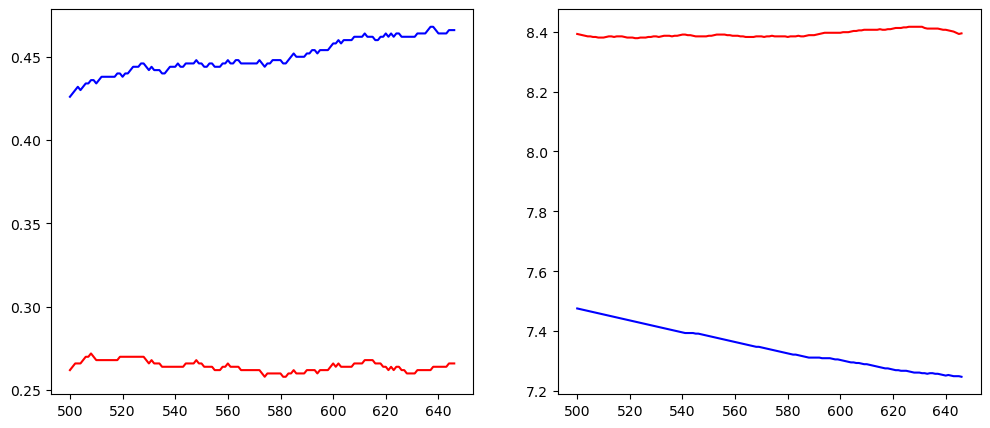

In [4]:
df = pd.read_csv('MPS_logs_2024_12_07_real_data.csv')
df_MPS_rate = [df['mis_cover_rate'][0:500].mean()]
df_MCS_rate = [df['uncal_cover_rate'][0:500].mean()]
df_MPS_len = [len(df['MPS'][ind].strip("[]").split()) for ind in range(len(df))]
df_MCS_len = [len(df['uncal_MPS'][ind].strip("[]").split()) for ind in range(len(df))]
df_MPS_len_avg = [np.mean(df_MPS_len[0:500])]
df_MCS_len_avg = [np.mean(df_MCS_len[0:500])]
for ind in range(500, len(df)):
    df_MPS_rate += [df_MPS_rate[-1]+(df['mis_cover_rate'][ind]-df['mis_cover_rate'][ind-500])/500]
    df_MCS_rate += [df_MCS_rate[-1]+(df['uncal_cover_rate'][ind]-df['uncal_cover_rate'][ind-500])/500]
    df_MPS_len_avg += [df_MPS_len_avg[-1]+(df_MPS_len[ind]-df_MPS_len[ind-500])/500]
    df_MCS_len_avg += [df_MCS_len_avg[-1]+(df_MCS_len[ind]-df_MCS_len[ind-500])/500]
x = np.arange(500, len(df))

fig, axs = plt.subplots(1, 2, figsize=(12, 5))
axs[0].plot(x, np.array(df_MPS_rate[1:]), color = 'red')
axs[0].plot(x, np.array(df_MCS_rate[1:]), color = 'blue')

axs[1].plot(x, np.array(df_MPS_len_avg[1:]), color = 'red')
axs[1].plot(x, np.array(df_MCS_len_avg[1:]), color = 'blue')
#fig.savefig('TAR.png')
# recording the right guesses to calibrate alpha_t

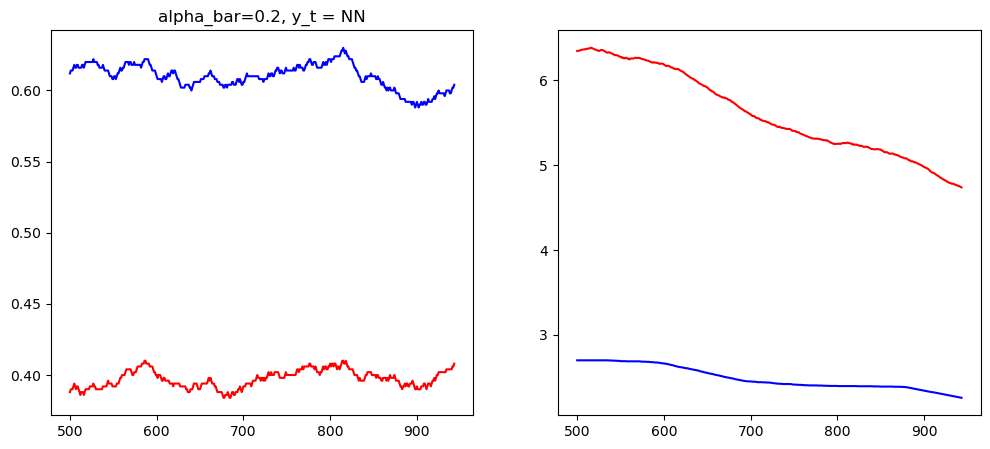

In [3]:
df = pd.read_csv('MPS_logs_2024_11_19_NN.csv')
df_MPS_rate = [df['mis_cover_rate'][0:500].mean()]
df_MCS_rate = [df['uncal_cover_rate'][0:500].mean()]
df_MPS_len = [len(df['MPS'][ind].strip("[]").split()) for ind in range(len(df))]
df_MCS_len = [len(df['uncal_MPS'][ind].strip("[]").split()) for ind in range(len(df))]
df_MPS_len_avg = [np.mean(df_MPS_len[0:500])]
df_MCS_len_avg = [np.mean(df_MCS_len[0:500])]
for ind in range(500, len(df)):
    df_MPS_rate += [df_MPS_rate[-1]+(df['mis_cover_rate'][ind]-df['mis_cover_rate'][ind-500])/500]
    df_MCS_rate += [df_MCS_rate[-1]+(df['uncal_cover_rate'][ind]-df['uncal_cover_rate'][ind-500])/500]
    df_MPS_len_avg += [df_MPS_len_avg[-1]+(df_MPS_len[ind]-df_MPS_len[ind-500])/500]
    df_MCS_len_avg += [df_MCS_len_avg[-1]+(df_MCS_len[ind]-df_MCS_len[ind-500])/500]
x = np.arange(500, len(df))

fig, axs = plt.subplots(1, 2, figsize=(12, 5))
axs[0].plot(x, np.array(df_MPS_rate[1:]), color = 'red')
axs[0].plot(x, np.array(df_MCS_rate[1:]), color = 'blue')
axs[0].set_title("alpha_bar=0.2, y_t = NN")

axs[1].plot(x, np.array(df_MPS_len_avg[1:]), color = 'red')
axs[1].plot(x, np.array(df_MCS_len_avg[1:]), color = 'blue')
#fig.savefig('TAR.png')
# recording the right guesses to calibrate alpha_t

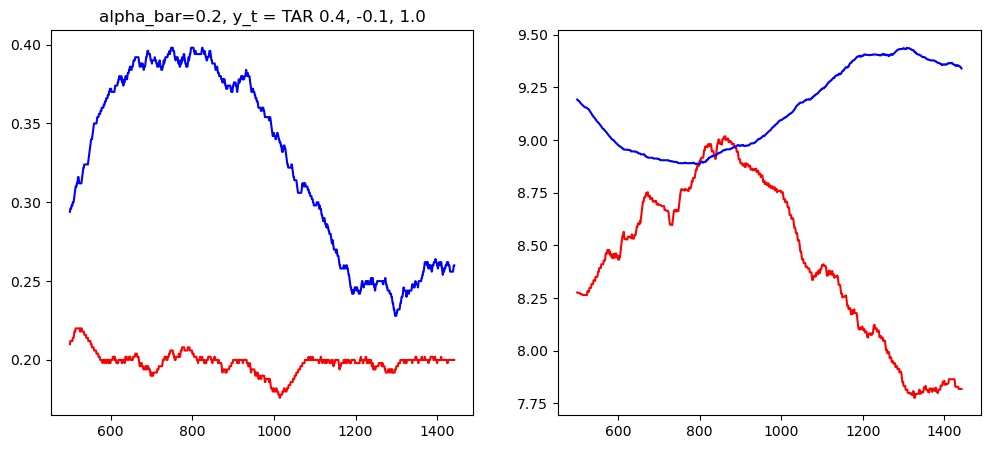

In [15]:
df = pd.read_csv('MPS_logs_TAR_2024_11_02.csv')
df_MPS_rate = [df['mis_cover_rate'][0:500].mean()]
df_MCS_rate = [df['uncal_cover_rate'][0:500].mean()]
df_MPS_len = [len(df['MPS'][ind].strip("[]").split()) for ind in range(len(df))]
df_MCS_len = [len(df['uncal_MPS'][ind].strip("[]").split()) for ind in range(len(df))]
df_MPS_len_avg = [np.mean(df_MPS_len[0:500])]
df_MCS_len_avg = [np.mean(df_MCS_len[0:500])]
for ind in range(500, len(df)):
    df_MPS_rate += [df_MPS_rate[-1]+(df['mis_cover_rate'][ind]-df['mis_cover_rate'][ind-500])/500]
    df_MCS_rate += [df_MCS_rate[-1]+(df['uncal_cover_rate'][ind]-df['uncal_cover_rate'][ind-500])/500]
    df_MPS_len_avg += [df_MPS_len_avg[-1]+(df_MPS_len[ind]-df_MPS_len[ind-500])/500]
    df_MCS_len_avg += [df_MCS_len_avg[-1]+(df_MCS_len[ind]-df_MCS_len[ind-500])/500]
x = np.arange(500, len(df))

fig, axs = plt.subplots(1, 2, figsize=(12, 5))
axs[0].plot(x, np.array(df_MPS_rate[1:]), color = 'red')
axs[0].plot(x, np.array(df_MCS_rate[1:]), color = 'blue')
axs[0].set_title("alpha_bar=0.2, y_t = TAR 0.4, -0.1, 1.0")

axs[1].plot(x, np.array(df_MPS_len_avg[1:]), color = 'red')
axs[1].plot(x, np.array(df_MCS_len_avg[1:]), color = 'blue')
#fig.savefig('TAR.png')
# recording the right guesses to calibrate alpha_t

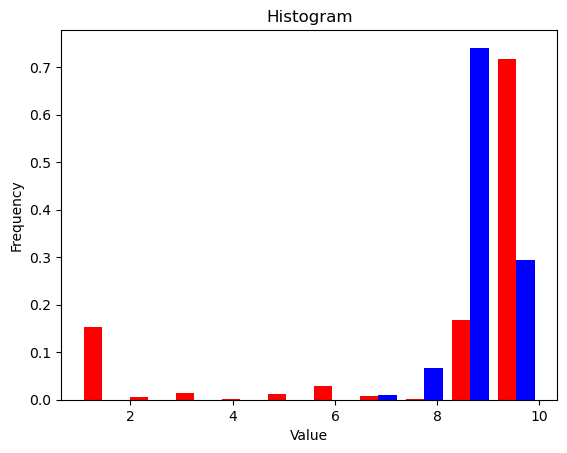

In [60]:
plt.hist([df_MPS_len, df_MCS_len], bins=10, color=['red', 'blue'], density=True) # Create the histogram with 30 bins
plt.title("Histogram")
plt.xlabel("Value")
plt.ylabel("Frequency")
plt.show() 

In [35]:
all_MPS = []
all_MCS = []
for ind in range(len(df)):
    all_MPS += df['MPS'][ind].strip("[]").split()
    all_MCS += df['uncal_MPS'][ind].strip("[]").split()
MPS_value, MPS_count = np.unique(all_MPS, return_counts=True)
MPS_count = dict(zip(MPS_value, MPS_count))
MCS_value, MCS_count = np.unique(all_MCS, return_counts=True)
MCS_count = dict(zip(MCS_value, MCS_count))

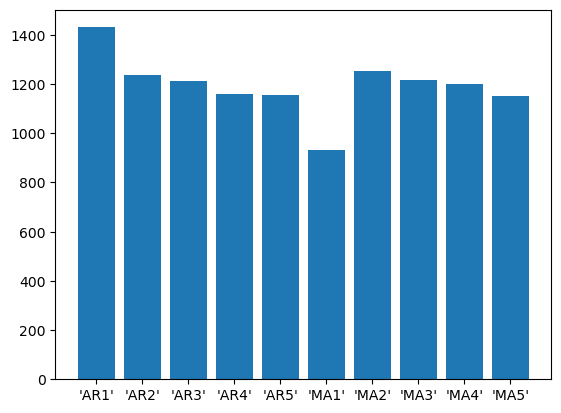

In [42]:
plt.bar(*zip(*MPS_count.items()))
plt.show()

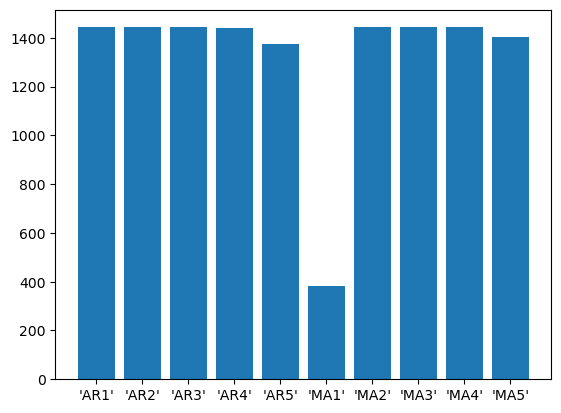

In [43]:
plt.bar(*zip(*MCS_count.items()))
plt.show()

In [12]:
Loss_nn = pd.read_csv('Loss_nn.csv')

In [8]:
T = 3000
Tr = robjects.FloatVector([T])
robjects.r.assign('Tr', Tr)
np.random.seed(2024)
y = DGP_NN(T)
x_train, y_train = create_sequences(y.reshape((-1, 1)), 3)
yr = robjects.FloatVector(y)
robjects.r.assign('yr', yr)

-0.181444,-0.543924,0.262675,...,1.010354,0.391260,0.982179


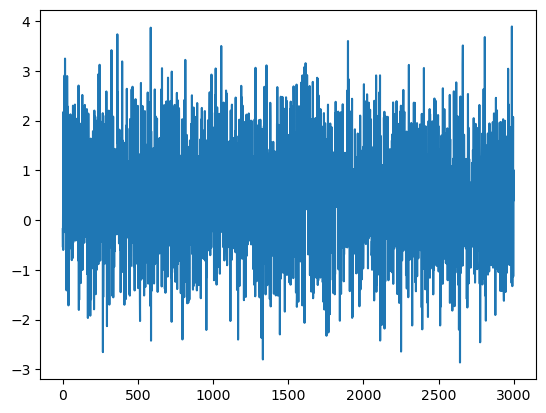

In [9]:
plt.plot(y)
plt.show()

In [9]:
robjects.r('''
models <- c('AR1', 'AR2', 'AR3', 'AR4', 'AR5', 'MA1', 'MA2', 'MA3', 'MA4', 'MA5')
loss_matrix <- data.frame(matrix(ncol = length(models), nrow = 0))
colnames(loss_matrix) <- models

for (t in 500:(Tr-1)){
  AR1 <- arima(yr[1:t], order = c(1,0,0), include.mean=FALSE)
  AR1_p <- as.numeric(predict(AR1, se.fit = FALSE))

  AR2 <- arima(yr[1:t], order = c(2,0,0), include.mean=FALSE)
  AR2_p <- as.numeric(predict(AR2, se.fit = FALSE))

  AR3 <- arima(yr[1:t], order = c(3,0,0), include.mean=FALSE)
  AR3_p <- as.numeric(predict(AR3, se.fit = FALSE))

  AR4 <- arima(yr[1:t], order = c(4,0,0), include.mean=FALSE)
  AR4_p <- as.numeric(predict(AR4, se.fit = FALSE))

  AR5 <- arima(yr[1:t], order = c(5,0,0), include.mean=FALSE)
  AR5_p <- as.numeric(predict(AR5, se.fit = FALSE))

  MA1 <- arima(yr[1:t], order = c(0,0,1), include.mean=FALSE)
  MA1_p <- as.numeric(predict(MA1, se.fit = FALSE))

  MA2 <- arima(yr[1:t], order = c(0,0,2), include.mean=FALSE)
  MA2_p <- as.numeric(predict(MA2, se.fit = FALSE))

  MA3 <- arima(yr[1:t], order = c(0,0,3), include.mean=FALSE)
  MA3_p <- as.numeric(predict(MA3, se.fit = FALSE))

  MA4 <- arima(yr[1:t], order = c(0,0,4), include.mean=FALSE)
  MA4_p <- as.numeric(predict(MA4, se.fit = FALSE))

  MA5 <- arima(yr[1:t], order = c(0,0,5), include.mean=FALSE)
  MA5_p <- as.numeric(predict(MA5, se.fit = FALSE))

  newrow <- data.frame(AR1 = (AR1_p-yr[t+1])^2,
  AR2 = (AR2_p-yr[t+1])^2,
  AR3 = (AR3_p-yr[t+1])^2,
  AR4 = (AR4_p-yr[t+1])^2,
  AR5 = (AR5_p-yr[t+1])^2,
  MA1 = (MA1_p-yr[t+1])^2,
  MA2 = (MA2_p-yr[t+1])^2,
  MA3 = (MA3_p-yr[t+1])^2,
  MA4 = (MA4_p-yr[t+1])^2,
  MA5 = (MA5_p-yr[t+1])^2
  )
  loss_matrix = rbind(loss_matrix, newrow)

}

''')
Loss_linear = pandas2ri.rpy2py(robjects.r['loss_matrix'])

In [43]:
Loss_linear = pandas2ri.rpy2py(robjects.r['loss_matrix'])

In [47]:
Loss_matrix = pd.concat([Loss_nn, Loss_linear.iloc[:Loss_nn.shape[0], :]], axis=1)

In [38]:
Loss_nn.reset_index(drop=True, inplace=True)
Loss_linear.reset_index(drop=True, inplace=True)

In [48]:
Loss_matrix

,nn5,nn6,nn7,nn8,nn9,nn10,nn11,nn12,nn13,nn14,AR1,AR2,AR3,AR4,AR5,MA1,MA2,MA3,MA4,MA5
0,0.437353,0.704277,0.306677,0.517507,0.642672,0.610219,0.891177,0.236605,0.701602,0.841065,0.404717,0.384207,0.267047,0.202969,0.427470,0.571568,0.741987,0.400941,0.246982,0.337226
1,0.211722,0.062726,0.114583,0.315109,0.183470,0.076666,0.092639,0.034344,0.276910,0.261818,0.000328,0.263967,0.243537,0.268698,0.407361,0.005119,0.082456,0.030085,0.073350,0.438245
2,0.040358,0.013625,0.006347,0.000178,0.001478,0.000002,0.026999,0.000002,0.003067,0.038560,1.955608,2.671352,4.705430,4.726611,4.982792,1.897279,2.253610,3.209144,3.235142,4.213532
3,0.304720,0.053865,0.204387,0.166407,0.213287,0.213230,0.130626,0.296479,0.230205,0.147063,0.001118,0.016669,0.210003,0.498961,0.572235,0.009974,0.010955,0.048616,0.118762,0.223130
4,0.424603,0.423574,0.117744,0.481887,0.352439,0.482469,0.252116,0.408761,0.359963,0.314657,0.876615,1.537976,1.292057,1.012413,0.264913,0.808920,1.357643,1.401669,1.355853,0.826597
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2492,2.363791,1.985171,2.286256,2.560939,3.032616,2.360111,2.529767,2.599712,2.624692,2.776926,0.024099,0.000110,0.128185,0.158175,0.743918,0.035067,0.006506,0.046781,0.061914,0.269317
2493,2.685444,2.207640,2.391815,2.396053,2.192443,2.647489,2.663154,2.551466,2.499542,2.401060,0.574297,0.413065,0.100654,0.216753,0.259309,0.593501,0.494701,0.054758,0.085711,0.091080
2494,0.602647,0.286594,0.589942,0.294883,0.554952,0.524457,0.521861,0.549219,0.763230,0.570935,1.835919,1.897512,2.495729,2.862431,2.373780,1.788036,1.721610,2.181990,2.903063,2.713145
2495,0.028260,0.002119,0.001598,0.120044,0.034745,0.010360,0.004116,0.048577,0.074003,0.100318,3.700327,4.207193,4.605035,5.142459,5.753692,3.769022,4.235173,4.268315,4.573083,5.716871


In [34]:
df1 = pd.DataFrame({'A': [1, 2], 'B': [3, 4]}, index=['a', 'b'])
df2 = pd.DataFrame({'C': [5, 6], 'D': [7, 8]}, index=['x', 'y'])

result = pd.concat([df1, df2], ignore_index=True)

print(result)

     A    B    C    D
0  1.0  3.0  NaN  NaN
1  2.0  4.0  NaN  NaN
2  NaN  NaN  5.0  7.0
3  NaN  NaN  6.0  8.0


In [59]:
a = pd.DataFrame([1,2,3], ['a','b','c'])

In [107]:
T = 5000
np.random.seed(2024)
y = DGP_NN(T)
x_train, y_train = create_sequences(y.reshape((-1, 1)), 3)

column_names = ['nn'+str(L0)+str(L1)+str(L2) for (L0, L1, L2) in product([3,4], [3,4], [3,4])] + \
                ['nn'+str(L0)+str(L1) for (L0, L1) in product([3,4], [3,4])]
Loss_matrix = pd.DataFrame(columns=column_names)
for t in range(500, y.shape[0]):
    errors = []
    for (L0, L1, L2) in product([3,4], [3,4], [3, 4]):
        model = tf.keras.models.Sequential([
            tf.keras.layers.Dense(L0, activation='relu', input_dim=x_train.shape[1]),
            tf.keras.layers.Dense(L1, activation='relu'),
            tf.keras.layers.Dense(L2, activation='softmax'),
            tf.keras.layers.Dense(1)
        ])
        model.compile(optimizer='adam', loss='mean_squared_error')
        model.fit(x_train[:t, :], y_train[:t, ], epochs=5)
        errors += [[model.predict(x_train[[t-1], :])[0][0]] - y_train[t]]

    for (L0, L1) in product([3, 4], [3, 4]):
        model = tf.keras.models.Sequential([
            tf.keras.layers.Dense(L0, activation='relu', input_dim=x_train.shape[1]),
            tf.keras.layers.Dense(L1, activation='softmax'),
            tf.keras.layers.Dense(1)
        ])
        model.compile(optimizer='adam', loss='mean_squared_error')
        model.fit(x_train[:t, :], y_train[:t, ], epochs=5)
        errors += [[model.predict(x_train[[t-1], :])[0][0]] - y_train[t]]

    new_row = pd.DataFrame({ k:v for (k,v) in zip(column_names, errors)})
    Loss_matrix = pd.concat([Loss_matrix, new_row], ignore_index=True)

Epoch 1/5


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 401us/step - loss: 1.5995
Epoch 2/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 424us/step - loss: 1.4195
Epoch 3/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 405us/step - loss: 1.5305
Epoch 4/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 393us/step - loss: 1.4988
Epoch 5/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 385us/step - loss: 1.3267
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
Epoch 1/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 417us/step - loss: 1.5086
Epoch 2/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 362us/step - loss: 1.3239
Epoch 3/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 362us/step - loss: 1.3679
Epoch 4/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 1.2902 
Epoch 5/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 426us/step - loss: 1.3088
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
Epoch 1/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 402us/step - loss: 1.9482
Epoch 2/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 355us/step - loss: 1.8430
Epoch 3/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 409us/step - loss: 1.7761
Epoch 4/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 370us/step - loss: 1.7738
Epoch 5/5


/var/folders/cd/td3wbwf12nj440jmcp6rh3w00000gn/T/ipykernel_27995/3546737596.py:33: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  Loss_matrix = pd.concat([Loss_matrix, new_row], ignore_index=True)


16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 430us/step - loss: 2.1961
Epoch 2/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 365us/step - loss: 1.8614
Epoch 3/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 351us/step - loss: 1.9275
Epoch 4/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 410us/step - loss: 1.9463
Epoch 5/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 346us/step - loss: 1.6862
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
Epoch 1/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 437us/step - loss: 1.4426
Epoch 2/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 370us/step - loss: 1.5378
Epoch 3/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 363us/step - loss: 1.5469
Epoch 4/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 362us/step - loss: 1.4288
Epoch 5/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 421us/step - loss: 1.5934
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
Epoch 1/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 413us/step - loss: 1.6141
Epoch 2/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 364us/step - loss: 1.4470
Epoch 3/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 385us/step - loss: 1.4259
Epoch 4/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 321us/step - loss: 1.3526
Epoch 5/5


16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 414us/step - loss: 1.7064
Epoch 4/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 384us/step - loss: 1.5710
Epoch 5/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 394us/step - loss: 1.5010
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
Epoch 1/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 424us/step - loss: 1.5973
Epoch 2/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 353us/step - loss: 1.6225
Epoch 3/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 317us/step - loss: 1.4908
Epoch 4/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 321us/step - loss: 1.5979
Epoch 5/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 341us/step - loss: 1.5325
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
Epoch 1/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 423us/step - loss: 1.6893
Epoch 2/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 356us/step - loss: 1.5296
Epoch 3/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 423us/step - loss: 1.4129
Epoch 4/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 325us/step - loss: 1.5163
Epoch 5/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 343us/step - loss: 1.3636
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
Epoch 1/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 0

16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 310us/step - loss: 1.9940
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
Epoch 1/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 389us/step - loss: 1.2656
Epoch 2/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 347us/step - loss: 1.4671
Epoch 3/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 318us/step - loss: 1.2773
Epoch 4/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 343us/step - loss: 1.5061
Epoch 5/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 363us/step - loss: 1.3574
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
Epoch 1/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 384us/step - loss: 1.5199
Epoch 2/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 357us/step - loss: 1.3903
Epoch 3/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 323us/step - loss: 1.6031
Epoch 4/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 351us/step - loss: 1.4783
Epoch 5/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 321us/step - loss: 1.3770
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step
Epoch 1/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 383us/step - loss: 1.5455
Epoch 2/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 348us/step - loss: 1.4540
Epoch 3/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 0

KeyboardInterrupt: 

In [61]:
y = DGP_NN(1000)
x_train, y_train = create_sequences(y.reshape((-1,1)), 3)

In [4]:
T = 2000
np.random.seed(2024)
file_path = 'Loss_nn.csv'
y = DGP_NN(T)
x_train, y_train = create_sequences(y.reshape((-1, 1)), 3)

column_names = ['nn'+str(L0)+str(L1)+str(L2) for (L0, L1, L2) in product([3,4], [3,4], [3,4])] + \
                ['nn'+str(L0)+str(L1) for (L0, L1) in product([3,4], [3,4])]
Loss_matrix = pd.DataFrame(columns=column_names)
Loss_matrix.to_csv(file_path, index=False)
for t in range(500, y_train.shape[0]):
    errors = []
    for L1 in range(5, 7):
        model = tf.keras.models.Sequential([
            tf.keras.layers.Dense(L1, activation='relu', input_dim=x_train.shape[1]),
            tf.keras.layers.Dense(1, activation='sigmoid')
        ])
        model.compile(optimizer='adam', loss='mean_squared_error')
        model.fit(x_train[:t, :], y_train[:t, ], epochs=3)
        errors += [([model.predict(x_train[[t-1], :])[0][0]] - y_train[t])**2]

    new_row = pd.DataFrame({ k:v for (k,v) in zip(column_names, errors)})
    new_row.to_csv(file_path, mode='a', index=False, header=False)

Epoch 1/3
 2/16 ━━━━━━━━━━━━━━━━━━━━ 0s 920us/step - loss: 1.1695

/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 368us/step - loss: 1.1032
Epoch 2/3
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 327us/step - loss: 1.0253
Epoch 3/3
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 382us/step - loss: 1.0877
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
Epoch 1/3
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 368us/step - loss: 1.0859
Epoch 2/3
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 318us/step - loss: 1.0947
Epoch 3/3
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 390us/step - loss: 1.1649
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
Epoch 1/3
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 374us/step - loss: 1.1930
Epoch 2/3
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 307us/step - loss: 1.1127
Epoch 3/3
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 350us/step - loss: 1.1466
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
Epoch 1/3
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 371us/step - loss: 1.1242
Epoch 2/3
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 345us/step - loss: 1.1740
Epoch 3/3
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 331us/step - loss: 1.0610
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
Epoch 1/3
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 358us/step - loss: 1.1132


In [ ]:
T1 = 1000
T2 = 50
np.random.seed(2024)
yr = DGP_ARMA(alpha=0.3, beta=0.3, T=T1, scale=0.1)
for switch in range(30):
    yr = DGP_AR(alpha=0.3, T=T2, scale=0.1, pre_y=yr)
    yr = DGP_ARMA(alpha=0.3, beta=0.3, T=T2, scale=0.1, pre_y=yr)

In [10]:
T=100; burn = 200; L0_len=3; L1_len=10; scale=1
y = np.zeros(T+burn)
L0_matrix = np.random.rand(L0_len,L1_len)*2-1
L1_matrix = np.random.rand(L1_len)*2-1

for t in range(T+burn-L0_len):
    L0 = y[t:t+L0_len]@L0_matrix
    L0 = np.multiply(L0, L0>0) + np.random.normal(loc=0.0, scale=scale, size=L1_len)
    y[t+L0_len] = 1/(1+np.exp(L1_matrix@L0))+np.random.normal(loc=0.0, scale=scale)

In [2]:
T = 2000
np.random.seed(2024)
file_path = 'Loss_nn.csv'
y = DGP_NN(T)
x_train, y_train = create_sequences(y.reshape((-1, 1)), 3)

column_names = ['nn'+str(L0)+str(L1)+str(L2) for (L0, L1, L2) in product([3,4], [3,4], [3,4])] + \
                ['nn'+str(L0)+str(L1) for (L0, L1) in product([3,4], [3,4])]
Loss_matrix = pd.DataFrame(columns=column_names)


In [3]:
y_train.shape[0]

1997

In [105]:
new_row = pd.DataFrame({ k:v for (k,v) in zip(column_names, errors)})

In [106]:
new_row

,nn333,nn334,nn343,nn344,nn433,nn434,nn443,nn444,nn33,nn34,nn43,nn44
0,1.606554,1.821513,1.670413,1.07989,1.356947,1.572958,1.117328,1.369796,2.098987,1.954548,1.425145,1.343881


In [50]:
model = tf.keras.models.Sequential([
  tf.keras.layers.Dense(3, activation='relu', input_dim=x_train.shape[1]),
  tf.keras.layers.Dense(3, activation='relu'),
  tf.keras.layers.Dense(3, activation='softmax'),
  tf.keras.layers.Dense(1) 
])

In [51]:
model.compile(optimizer='adam', loss='mean_squared_error')
model.fit(x_train, y_train, epochs=5)

Epoch 1/5
63/63 ━━━━━━━━━━━━━━━━━━━━ 0s 369us/step - loss: 1.6237
Epoch 2/5
63/63 ━━━━━━━━━━━━━━━━━━━━ 0s 269us/step - loss: 1.4870
Epoch 3/5
63/63 ━━━━━━━━━━━━━━━━━━━━ 0s 262us/step - loss: 1.4918
Epoch 4/5
63/63 ━━━━━━━━━━━━━━━━━━━━ 0s 245us/step - loss: 1.4261
Epoch 5/5
63/63 ━━━━━━━━━━━━━━━━━━━━ 0s 245us/step - loss: 1.3593


In [42]:
model.predict(x_train[[1995],:])

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step


array([[-0.24643219]], dtype=float32)

In [43]:
y[1996,]

-1.8601547382043577

In [2]:
T1 = 2000
T2 = 1000
np.random.seed(2024)
Tr = robjects.FloatVector([T1+T2])
robjects.r.assign('Tr', Tr)
#yr = DGP_ARMA(alpha=0.3, beta=0.3, T=T1, scale=0.1)
#yr = DGP_AR(alpha=0.3, T=T2, scale=0.1, pre_y=yr)
#yr = DGP_TAR(0.6,-0.8, 1.0, T1+T2)
#yr = DGP_STAR(0.4,-0.1, 1.0, T1+T2)
yr = DGP_MSA(T1+T2, np.ones((3,3)))

In [6]:
trans_matrix = np.ones((3,3)); T = T1+T2; burn=200

In [7]:
states = 0; y = np.zeros(T+burn)

In [48]:
states = random.choices([0,1,2], weights = trans_matrix[:, states[0]]); scale=1; t=0

In [35]:
match states[0]:
    case 0:
        y[t+1] = 0.3*y[t]+np.random.normal(loc=0.0, scale=scale)
    case 1:
        y[t+1] = 0.5*y[t]+np.random.normal(loc=0.0, scale=scale)
    case 2: 
        y[t+1] = 0.7*y[t]+np.random.normal(loc=0.0, scale=scale)

In [92]:
def DGP_NN(T, L0_len=3, L1_len=3, L2_len=3, burn = 200, scale = 1):
    y = np.zeros(T+burn)
    for t in range(T+burn-L0_len):
        L0 = (np.random.rand(L1_len,L0_len)*2-1)@y[t:t+L0_len]
        L0 = np.multiply(L0, L0>0) + np.random.normal(loc=0.0, scale=scale, size=3)
        L1 = (np.random.rand(L2_len,L1_len)*2-1)@L0
        L1 = np.multiply(L1, L1>0) + np.random.normal(loc=0.0, scale=scale, size=3)
        y[t+L0_len] = 1/(1+np.exp((np.random.rand(L2_len)*2-1)@L1))*y[t+L0_len-1]+np.random.normal(loc=0.0, scale=scale)
    
    return y[burn:]

In [3]:
y = DGP_NN(2000)

In [96]:
y

array([-1.08267839,  0.12656046, -0.73160251, ..., -0.3127462 ,
        0.74018096, -2.02628639])

In [88]:
y = np.zeros(T+burn)
L0 = (np.random.rand(3,3)*2-1)@y[t:t+3]
L0 = np.multiply(L0, L0>0) + np.random.normal(loc=0.0, scale=scale, size=3)
L1 = (np.random.rand(3,3)*2-1)@L0
L1 = np.multiply(L1, L1>0) + np.random.normal(loc=0.0, scale=scale, size=3)
1/(1+np.exp((np.random.rand(3)*2-1)@L1))*y[t-2]+np.random.normal(loc=0.0, scale=scale)

-0.9741303498198907

In [82]:
L0

array([0., 0., 0.])

In [2]:
T1 = 1000
T2 = 1000
np.random.seed(2024)
Tr = robjects.FloatVector([T1+T2])
robjects.r.assign('Tr', Tr)
#yr = DGP_ARMA(alpha=0.3, beta=0.3, T=T1, scale=0.1)
#yr = DGP_AR(alpha=0.3, T=T2, scale=0.1, pre_y=yr)
#yr = DGP_TAR(0.6,-0.8, 1.0, T1+T2)
yr = DGP_STAR(0.4,-0.1, 1.0, T1+T2)
yr = robjects.FloatVector(yr)
robjects.r.assign('yr', yr)
robjects.r('''
models <- c('AR1', 'AR2', 'AR3', 'AR4', 'AR5', 'MA1', 'MA2', 'MA3', 'MA4', 'MA5')
loss_matrix <- data.frame(matrix(ncol = length(models), nrow = 0))
colnames(loss_matrix) <- models

for (t in 500:(Tr-1)){
  AR1 <- arima(yr[1:t], order = c(1,0,0), include.mean=FALSE)
  AR1_p <- as.numeric(predict(AR1, se.fit = FALSE))

  AR2 <- arima(yr[1:t], order = c(2,0,0), include.mean=FALSE)
  AR2_p <- as.numeric(predict(AR2, se.fit = FALSE))

  AR3 <- arima(yr[1:t], order = c(3,0,0), include.mean=FALSE)
  AR3_p <- as.numeric(predict(AR3, se.fit = FALSE))

  AR4 <- arima(yr[1:t], order = c(4,0,0), include.mean=FALSE)
  AR4_p <- as.numeric(predict(AR4, se.fit = FALSE))

  AR5 <- arima(yr[1:t], order = c(5,0,0), include.mean=FALSE)
  AR5_p <- as.numeric(predict(AR5, se.fit = FALSE))
  
  MA1 <- arima(yr[1:t], order = c(0,0,1), include.mean=FALSE)
  MA1_p <- as.numeric(predict(MA1, se.fit = FALSE))
  
  MA2 <- arima(yr[1:t], order = c(0,0,2), include.mean=FALSE)
  MA2_p <- as.numeric(predict(MA2, se.fit = FALSE))
  
  MA3 <- arima(yr[1:t], order = c(0,0,3), include.mean=FALSE)
  MA3_p <- as.numeric(predict(MA3, se.fit = FALSE))
  
  MA4 <- arima(yr[1:t], order = c(0,0,4), include.mean=FALSE)
  MA4_p <- as.numeric(predict(MA4, se.fit = FALSE))
  
  MA5 <- arima(yr[1:t], order = c(0,0,5), include.mean=FALSE)
  MA5_p <- as.numeric(predict(MA5, se.fit = FALSE))

  newrow <- data.frame(AR1 = (AR1_p-yr[t+1])^2,
  AR2 = (AR2_p-yr[t+1])^2,
  AR3 = (AR3_p-yr[t+1])^2,
  AR4 = (AR4_p-yr[t+1])^2,
  AR5 = (AR5_p-yr[t+1])^2,
  MA1 = (MA1_p-yr[t+1])^2,
  MA2 = (MA2_p-yr[t+1])^2,
  MA3 = (MA3_p-yr[t+1])^2,
  MA4 = (MA4_p-yr[t+1])^2,
  MA5 = (MA5_p-yr[t+1])^2
  )
  loss_matrix = rbind(loss_matrix, newrow)

}
''')
Loss_matrix = pandas2ri.rpy2py(robjects.r['loss_matrix'])

In [7]:
pandas2ri.activate()
robjects.r.assign('Loss', Loss_matrix)
MCS = importr('MCS')
robjects.r('''
library(MCS)

MCS1 <- MCSprocedure(Loss=Loss,alpha=0.2,B=100,statistic='Tmax',cl=NULL)

names <- MCS1@Info$model.names
'''
)
names = robjects.r['names']
print(names)

###########################################################################################################################
Superior Set Model created	:
    Rank_M        v_M MCS_M Rank_R       v_R MCS_R     Loss
AR1      1 -2.2315072  1.00      1 -1.299137  1.00 1.022601
AR2      3 -1.0077457  1.00      4  1.570892  0.71 1.026127
AR3      6  0.8981309  0.82      7  1.976937  0.45 1.028633
AR4      8  1.1730044  0.65      8  1.977920  0.45 1.029196
AR5      9  1.4618585  0.44      9  2.125492  0.32 1.029841
MA1      5  0.1581204  1.00      3  1.461106  0.81 1.028189
MA2      2 -1.9752499  1.00      2  1.299137  0.90 1.024769
MA3      4 -0.0200269  1.00      5  1.896285  0.51 1.027598
MA4      7  0.9859454  0.72      6  1.905007  0.50 1.029162
MA5     10  1.5180224  0.38     10  2.253940  0.29 1.030134
p-value	:
[1] 0.38

###########################################################################################################################['AR1' 'AR2' 'AR3' 'AR4' 'AR5' 'MA1' 'MA2' '

In [ ]:
T = 5000
np.random.seed(2024)
Tr = robjects.FloatVector([T])
robjects.r.assign('Tr', Tr)
yr = DGP_AR(0.4, T)
yr = robjects.FloatVector(yr)
robjects.r.assign('yr', yr)
robjects.r('''
models <- c('AR1', 'AR2', 'AR3', 'AR4', 'AR5', 'MA1', 'MA2', 'MA3', 'MA4', 'MA5')
loss_matrix <- data.frame(matrix(ncol = length(models), nrow = 0))
colnames(loss_matrix) <- models

for (t in 1000:(Tr-1)){
  AR1 <- arima(yr[1:t], order = c(1,0,0), include.mean=FALSE)
  AR1_p <- as.numeric(predict(AR1, se.fit = FALSE))

  AR2 <- arima(yr[1:t], order = c(2,0,0), include.mean=FALSE)
  AR2_p <- as.numeric(predict(AR2, se.fit = FALSE))

  AR3 <- arima(yr[1:t], order = c(3,0,0), include.mean=FALSE)
  AR3_p <- as.numeric(predict(AR3, se.fit = FALSE))

  AR4 <- arima(yr[1:t], order = c(4,0,0), include.mean=FALSE)
  AR4_p <- as.numeric(predict(AR4, se.fit = FALSE))

  AR5 <- arima(yr[1:t], order = c(5,0,0), include.mean=FALSE)
  AR5_p <- as.numeric(predict(AR5, se.fit = FALSE))
  
  MA1 <- arima(yr[1:t], order = c(0,0,1), include.mean=FALSE)
  MA1_p <- as.numeric(predict(MA1, se.fit = FALSE))
  
  MA2 <- arima(yr[1:t], order = c(0,0,2), include.mean=FALSE)
  MA2_p <- as.numeric(predict(MA2, se.fit = FALSE))
  
  MA3 <- arima(yr[1:t], order = c(0,0,3), include.mean=FALSE)
  MA3_p <- as.numeric(predict(MA3, se.fit = FALSE))
  
  MA4 <- arima(yr[1:t], order = c(0,0,4), include.mean=FALSE)
  MA4_p <- as.numeric(predict(MA4, se.fit = FALSE))
  
  MA5 <- arima(yr[1:t], order = c(0,0,5), include.mean=FALSE)
  MA5_p <- as.numeric(predict(MA5, se.fit = FALSE))

  newrow <- data.frame(AR1 = (AR1_p-yr[t+1])^2,
  AR2 = (AR2_p-yr[t+1])^2,
  AR3 = (AR3_p-yr[t+1])^2,
  AR4 = (AR4_p-yr[t+1])^2,
  AR5 = (AR5_p-yr[t+1])^2,
  MA1 = (MA1_p-yr[t+1])^2,
  MA2 = (MA2_p-yr[t+1])^2,
  MA3 = (MA3_p-yr[t+1])^2,
  MA4 = (MA4_p-yr[t+1])^2,
  MA5 = (MA5_p-yr[t+1])^2
  )
  loss_matrix = rbind(loss_matrix, newrow)

}

''')
Loss_matrix = pandas2ri.rpy2py(robjects.r['loss_matrix'])

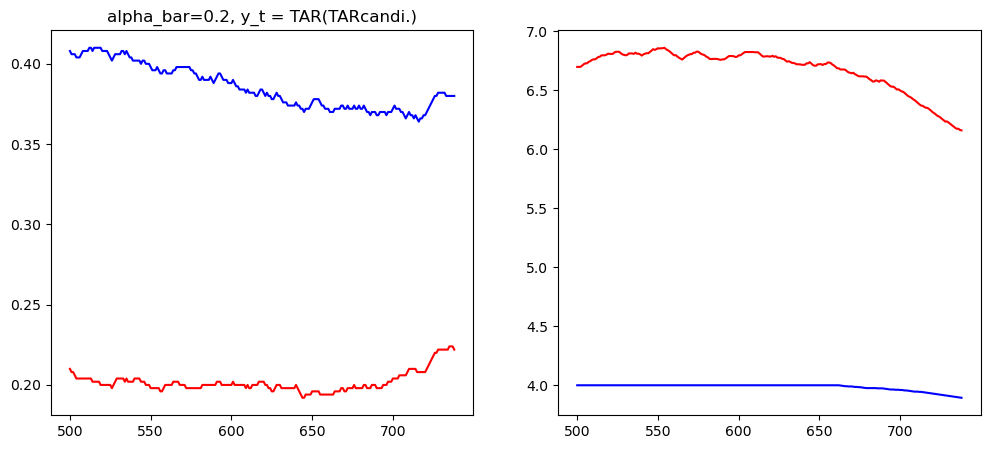

In [14]:
df = pd.read_csv('MPS_logs_2024_11_15_TAR_TARcandi.csv')
df_MPS_rate = [df['mis_cover_rate'][0:500].mean()]
df_MCS_rate = [df['uncal_cover_rate'][0:500].mean()]
df_MPS_len = [len(df['MPS'][ind].strip("[]").split()) for ind in range(len(df))]
df_MCS_len = [len(df['uncal_MPS'][ind].strip("[]").split()) for ind in range(len(df))]
df_MPS_len_avg = [np.mean(df_MPS_len[0:500])]
df_MCS_len_avg = [np.mean(df_MCS_len[0:500])]
for ind in range(500, len(df)):
    df_MPS_rate += [df_MPS_rate[-1]+(df['mis_cover_rate'][ind]-df['mis_cover_rate'][ind-500])/500]
    df_MCS_rate += [df_MCS_rate[-1]+(df['uncal_cover_rate'][ind]-df['uncal_cover_rate'][ind-500])/500]
    df_MPS_len_avg += [df_MPS_len_avg[-1]+(df_MPS_len[ind]-df_MPS_len[ind-500])/500]
    df_MCS_len_avg += [df_MCS_len_avg[-1]+(df_MCS_len[ind]-df_MCS_len[ind-500])/500]
x = np.arange(500, len(df))

fig, axs = plt.subplots(1, 2, figsize=(12, 5))
axs[0].plot(x, np.array(df_MPS_rate[1:]), color = 'red')
axs[0].plot(x, np.array(df_MCS_rate[1:]), color = 'blue')
axs[0].set_title("alpha_bar=0.2, y_t = TAR(TARcandi.)")

axs[1].plot(x, np.array(df_MPS_len_avg[1:]), color = 'red')
axs[1].plot(x, np.array(df_MCS_len_avg[1:]), color = 'blue')
# markov switching latent switch
# change point action of next move
fig.savefig('TAR_TARcand.png')

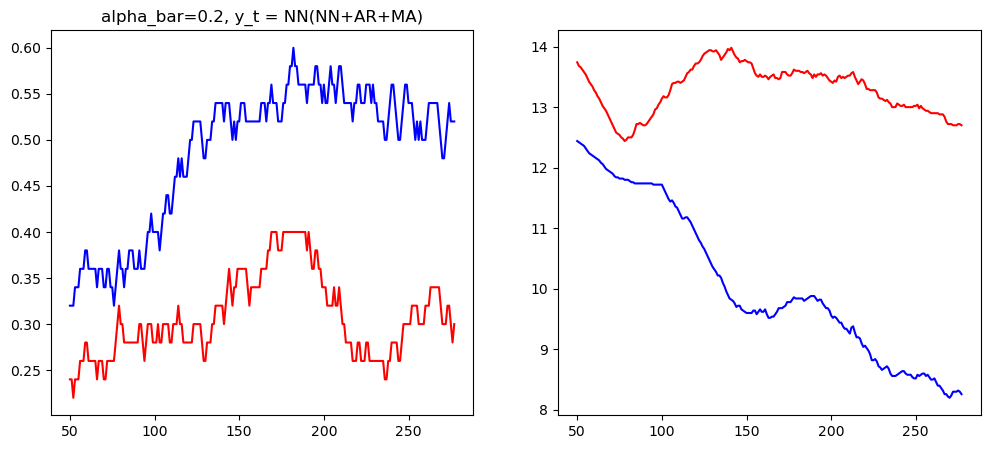

In [4]:
df = pd.read_csv('MPS_logs_2024_11_15_NN.csv')
df_MPS_rate = [df['mis_cover_rate'][0:50].mean()]
df_MCS_rate = [df['uncal_cover_rate'][0:50].mean()]
df_MPS_len = [len(df['MPS'][ind].strip("[]").split()) for ind in range(len(df))]
df_MCS_len = [len(df['uncal_MPS'][ind].strip("[]").split()) for ind in range(len(df))]
df_MPS_len_avg = [np.mean(df_MPS_len[0:50])]
df_MCS_len_avg = [np.mean(df_MCS_len[0:50])]
for ind in range(50, len(df)):
    df_MPS_rate += [df_MPS_rate[-1]+(df['mis_cover_rate'][ind]-df['mis_cover_rate'][ind-50])/50]
    df_MCS_rate += [df_MCS_rate[-1]+(df['uncal_cover_rate'][ind]-df['uncal_cover_rate'][ind-50])/50]
    df_MPS_len_avg += [df_MPS_len_avg[-1]+(df_MPS_len[ind]-df_MPS_len[ind-50])/50]
    df_MCS_len_avg += [df_MCS_len_avg[-1]+(df_MCS_len[ind]-df_MCS_len[ind-50])/50]
x = np.arange(50, len(df))

fig, axs = plt.subplots(1, 2, figsize=(12, 5))
axs[0].plot(x, np.array(df_MPS_rate[1:]), color = 'red')
axs[0].plot(x, np.array(df_MCS_rate[1:]), color = 'blue')
axs[0].set_title("alpha_bar=0.2, y_t = NN(NN+AR+MA)")

axs[1].plot(x, np.array(df_MPS_len_avg[1:]), color = 'red')
axs[1].plot(x, np.array(df_MCS_len_avg[1:]), color = 'blue')
# markov switching latent switch
# change point action of next move
fig.savefig('NN.png')

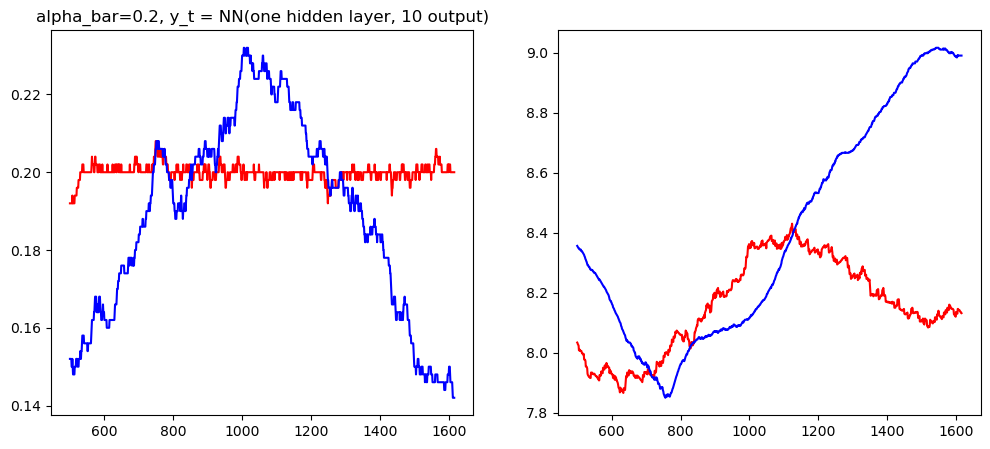

In [12]:
df = pd.read_csv('MPS_logs_2024_11_13_.csv')
df_MPS_rate = [df['mis_cover_rate'][0:500].mean()]
df_MCS_rate = [df['uncal_cover_rate'][0:500].mean()]
df_MPS_len = [len(df['MPS'][ind].strip("[]").split()) for ind in range(len(df))]
df_MCS_len = [len(df['uncal_MPS'][ind].strip("[]").split()) for ind in range(len(df))]
df_MPS_len_avg = [np.mean(df_MPS_len[0:500])]
df_MCS_len_avg = [np.mean(df_MCS_len[0:500])]
for ind in range(500, len(df)):
    df_MPS_rate += [df_MPS_rate[-1]+(df['mis_cover_rate'][ind]-df['mis_cover_rate'][ind-500])/500]
    df_MCS_rate += [df_MCS_rate[-1]+(df['uncal_cover_rate'][ind]-df['uncal_cover_rate'][ind-500])/500]
    df_MPS_len_avg += [df_MPS_len_avg[-1]+(df_MPS_len[ind]-df_MPS_len[ind-500])/500]
    df_MCS_len_avg += [df_MCS_len_avg[-1]+(df_MCS_len[ind]-df_MCS_len[ind-500])/500]
x = np.arange(500, len(df))

fig, axs = plt.subplots(1, 2, figsize=(12, 5))
axs[0].plot(x, np.array(df_MPS_rate[1:]), color = 'red')
axs[0].plot(x, np.array(df_MCS_rate[1:]), color = 'blue')
axs[0].set_title("alpha_bar=0.2, y_t = NN(one hidden layer, 10 output)")

axs[1].plot(x, np.array(df_MPS_len_avg[1:]), color = 'red')
axs[1].plot(x, np.array(df_MCS_len_avg[1:]), color = 'blue')
# markov switching latent switch
# change point action of next move
fig.savefig('NN.png')

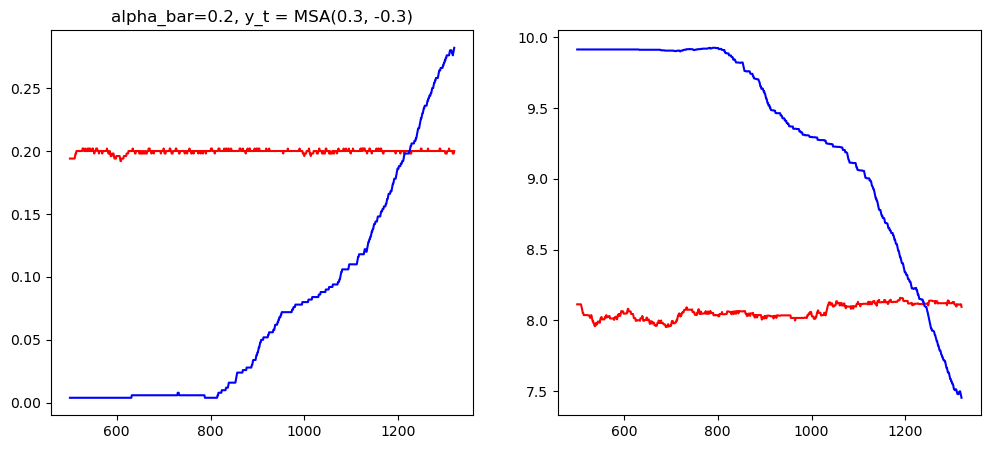

In [11]:
df = pd.read_csv('MPS_logs_2024_11_12_MSA.csv')
df_MPS_rate = [df['mis_cover_rate'][0:500].mean()]
df_MCS_rate = [df['uncal_cover_rate'][0:500].mean()]
df_MPS_len = [len(df['MPS'][ind].strip("[]").split()) for ind in range(len(df))]
df_MCS_len = [len(df['uncal_MPS'][ind].strip("[]").split()) for ind in range(len(df))]
df_MPS_len_avg = [np.mean(df_MPS_len[0:500])]
df_MCS_len_avg = [np.mean(df_MCS_len[0:500])]
for ind in range(500, len(df)):
    df_MPS_rate += [df_MPS_rate[-1]+(df['mis_cover_rate'][ind]-df['mis_cover_rate'][ind-500])/500]
    df_MCS_rate += [df_MCS_rate[-1]+(df['uncal_cover_rate'][ind]-df['uncal_cover_rate'][ind-500])/500]
    df_MPS_len_avg += [df_MPS_len_avg[-1]+(df_MPS_len[ind]-df_MPS_len[ind-500])/500]
    df_MCS_len_avg += [df_MCS_len_avg[-1]+(df_MCS_len[ind]-df_MCS_len[ind-500])/500]
x = np.arange(500, len(df))

fig, axs = plt.subplots(1, 2, figsize=(12, 5))
axs[0].plot(x, np.array(df_MPS_rate[1:]), color = 'red')
axs[0].plot(x, np.array(df_MCS_rate[1:]), color = 'blue')
axs[0].set_title("alpha_bar=0.2, y_t = MSA(0.3, -0.3)")

axs[1].plot(x, np.array(df_MPS_len_avg[1:]), color = 'red')
axs[1].plot(x, np.array(df_MCS_len_avg[1:]), color = 'blue')
# markov switching latent switch
# change point action of next move
# 50 step a update model
fig.savefig('MSA.png')

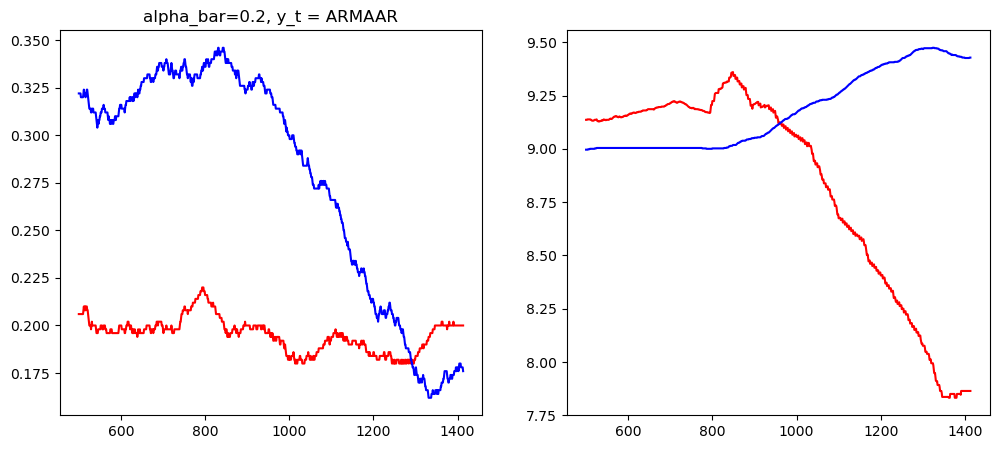

In [10]:
df = pd.read_csv('MPS_logs_2024_11_12_ARMAAR.csv')
df_MPS_rate = [df['mis_cover_rate'][0:500].mean()]
df_MCS_rate = [df['uncal_cover_rate'][0:500].mean()]
df_MPS_len = [len(df['MPS'][ind].strip("[]").split()) for ind in range(len(df))]
df_MCS_len = [len(df['uncal_MPS'][ind].strip("[]").split()) for ind in range(len(df))]
df_MPS_len_avg = [np.mean(df_MPS_len[0:500])]
df_MCS_len_avg = [np.mean(df_MCS_len[0:500])]
for ind in range(500, len(df)):
    df_MPS_rate += [df_MPS_rate[-1]+(df['mis_cover_rate'][ind]-df['mis_cover_rate'][ind-500])/500]
    df_MCS_rate += [df_MCS_rate[-1]+(df['uncal_cover_rate'][ind]-df['uncal_cover_rate'][ind-500])/500]
    df_MPS_len_avg += [df_MPS_len_avg[-1]+(df_MPS_len[ind]-df_MPS_len[ind-500])/500]
    df_MCS_len_avg += [df_MCS_len_avg[-1]+(df_MCS_len[ind]-df_MCS_len[ind-500])/500]
x = np.arange(500, len(df))

fig, axs = plt.subplots(1, 2, figsize=(12, 5))
axs[0].plot(x, np.array(df_MPS_rate[1:]), color = 'red')
axs[0].plot(x, np.array(df_MCS_rate[1:]), color = 'blue')
axs[0].set_title("alpha_bar=0.2, y_t = ARMAAR")

axs[1].plot(x, np.array(df_MPS_len_avg[1:]), color = 'red')
axs[1].plot(x, np.array(df_MCS_len_avg[1:]), color = 'blue')
# markov switching latent switch
# change point action of next move
# hital gram of card/bar plot of count
# 50 step a update model
fig.savefig('ARMAAR_50.png')

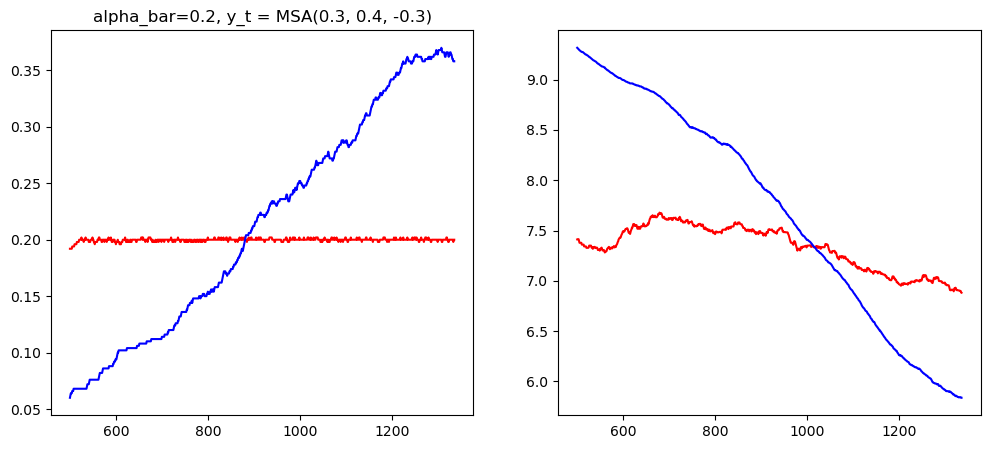

In [5]:
df = pd.read_csv('MPS_logs_2024_11_11_MSA.csv')
df_MPS_rate = [df['mis_cover_rate'][0:500].mean()]
df_MCS_rate = [df['uncal_cover_rate'][0:500].mean()]
df_MPS_len = [len(df['MPS'][ind].strip("[]").split()) for ind in range(len(df))]
df_MCS_len = [len(df['uncal_MPS'][ind].strip("[]").split()) for ind in range(len(df))]
df_MPS_len_avg = [np.mean(df_MPS_len[0:500])]
df_MCS_len_avg = [np.mean(df_MCS_len[0:500])]
for ind in range(500, len(df)):
    df_MPS_rate += [df_MPS_rate[-1]+(df['mis_cover_rate'][ind]-df['mis_cover_rate'][ind-500])/500]
    df_MCS_rate += [df_MCS_rate[-1]+(df['uncal_cover_rate'][ind]-df['uncal_cover_rate'][ind-500])/500]
    df_MPS_len_avg += [df_MPS_len_avg[-1]+(df_MPS_len[ind]-df_MPS_len[ind-500])/500]
    df_MCS_len_avg += [df_MCS_len_avg[-1]+(df_MCS_len[ind]-df_MCS_len[ind-500])/500]
x = np.arange(500, len(df))

fig, axs = plt.subplots(1, 2, figsize=(12, 5))
axs[0].plot(x, np.array(df_MPS_rate[1:]), color = 'red')
axs[0].plot(x, np.array(df_MCS_rate[1:]), color = 'blue')
axs[0].set_title("alpha_bar=0.2, y_t = MSA(0.3, 0.4, -0.3)")

axs[1].plot(x, np.array(df_MPS_len_avg[1:]), color = 'red')
axs[1].plot(x, np.array(df_MCS_len_avg[1:]), color = 'blue')
# markov switching latent switch
# change point action of next move

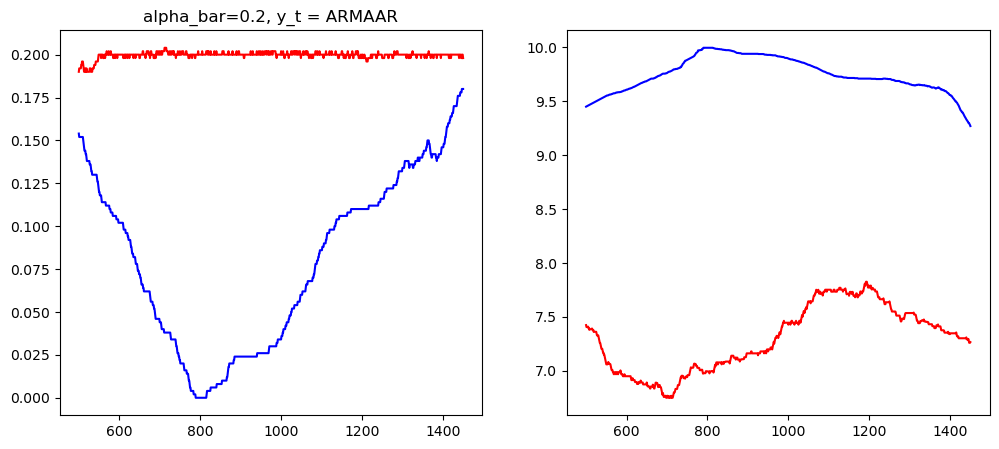

In [8]:
df = pd.read_csv('MPS_logs__2024_11_06_ARMAAR.csv')
df_MPS_rate = [df['mis_cover_rate'][0:500].mean()]
df_MCS_rate = [df['uncal_cover_rate'][0:500].mean()]
df_MPS_len = [len(df['MPS'][ind].strip("[]").split()) for ind in range(len(df))]
df_MCS_len = [len(df['uncal_MPS'][ind].strip("[]").split()) for ind in range(len(df))]
df_MPS_len_avg = [np.mean(df_MPS_len[0:500])]
df_MCS_len_avg = [np.mean(df_MCS_len[0:500])]
for ind in range(500, len(df)):
    df_MPS_rate += [df_MPS_rate[-1]+(df['mis_cover_rate'][ind]-df['mis_cover_rate'][ind-500])/500]
    df_MCS_rate += [df_MCS_rate[-1]+(df['uncal_cover_rate'][ind]-df['uncal_cover_rate'][ind-500])/500]
    df_MPS_len_avg += [df_MPS_len_avg[-1]+(df_MPS_len[ind]-df_MPS_len[ind-500])/500]
    df_MCS_len_avg += [df_MCS_len_avg[-1]+(df_MCS_len[ind]-df_MCS_len[ind-500])/500]
x = np.arange(500, len(df))

fig, axs = plt.subplots(1, 2, figsize=(12, 5))
axs[0].plot(x, np.array(df_MPS_rate[1:]), color = 'red')
axs[0].plot(x, np.array(df_MCS_rate[1:]), color = 'blue')
axs[0].set_title("alpha_bar=0.2, y_t = ARMAAR")

axs[1].plot(x, np.array(df_MPS_len_avg[1:]), color = 'red')
axs[1].plot(x, np.array(df_MCS_len_avg[1:]), color = 'blue')
# markov switching latent switch
# change point action of next move
fig.savefig('ARMAAR.png')

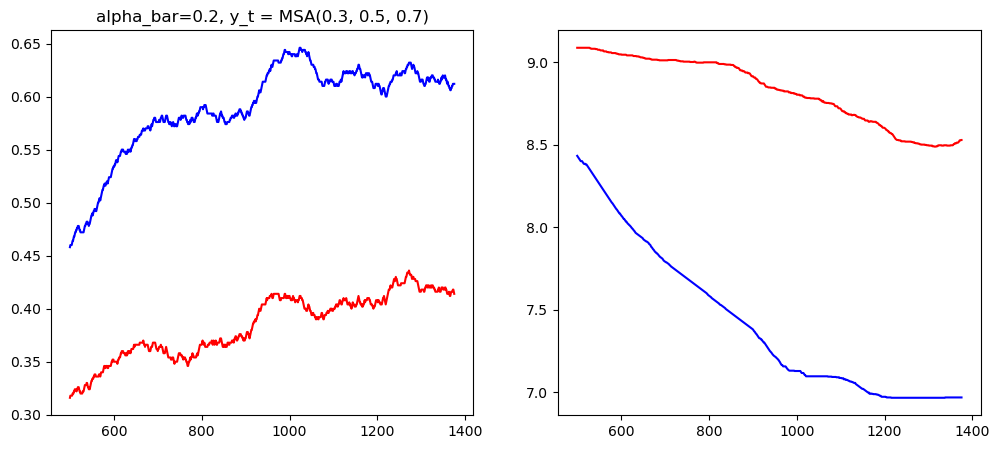

In [6]:
df = pd.read_csv('MPS_logs__2024_11_07_MSA.csv')
df_MPS_rate = [df['mis_cover_rate'][0:500].mean()]
df_MCS_rate = [df['uncal_cover_rate'][0:500].mean()]
df_MPS_len = [len(df['MPS'][ind].strip("[]").split()) for ind in range(len(df))]
df_MCS_len = [len(df['uncal_MPS'][ind].strip("[]").split()) for ind in range(len(df))]
df_MPS_len_avg = [np.mean(df_MPS_len[0:500])]
df_MCS_len_avg = [np.mean(df_MCS_len[0:500])]
for ind in range(500, len(df)):
    df_MPS_rate += [df_MPS_rate[-1]+(df['mis_cover_rate'][ind]-df['mis_cover_rate'][ind-500])/500]
    df_MCS_rate += [df_MCS_rate[-1]+(df['uncal_cover_rate'][ind]-df['uncal_cover_rate'][ind-500])/500]
    df_MPS_len_avg += [df_MPS_len_avg[-1]+(df_MPS_len[ind]-df_MPS_len[ind-500])/500]
    df_MCS_len_avg += [df_MCS_len_avg[-1]+(df_MCS_len[ind]-df_MCS_len[ind-500])/500]
x = np.arange(500, len(df))

fig, axs = plt.subplots(1, 2, figsize=(12, 5))
axs[0].plot(x, np.array(df_MPS_rate[1:]), color = 'red')
axs[0].plot(x, np.array(df_MCS_rate[1:]), color = 'blue')
axs[0].set_title("alpha_bar=0.2, y_t = MSA(0.3, 0.5, 0.7)")

axs[1].plot(x, np.array(df_MPS_len_avg[1:]), color = 'red')
axs[1].plot(x, np.array(df_MCS_len_avg[1:]), color = 'blue')
# markov switching latent switch
# change point action of next move

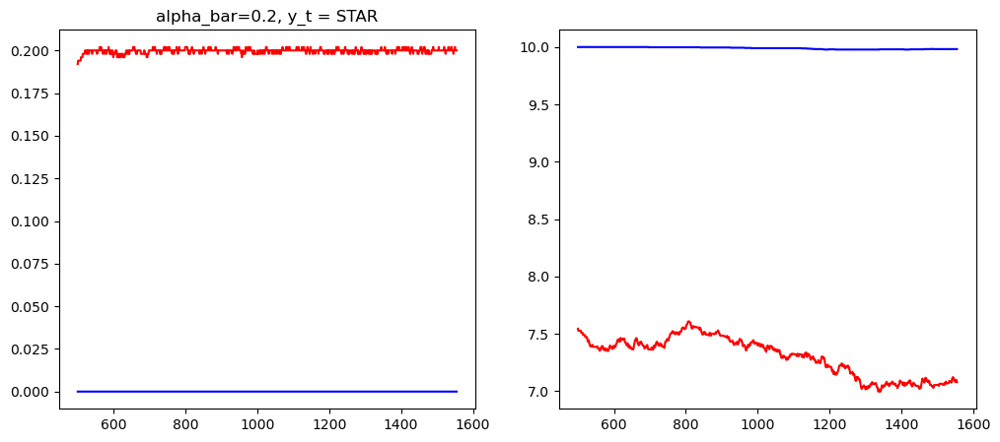

In [6]:
df = pd.read_csv('MPS_logs_STAR_2024_11_05.csv')
df_MPS_rate = [df['mis_cover_rate'][0:500].mean()]
df_MCS_rate = [df['uncal_cover_rate'][0:500].mean()]
df_MPS_len = [len(df['MPS'][ind].strip("[]").split()) for ind in range(len(df))]
df_MCS_len = [len(df['uncal_MPS'][ind].strip("[]").split()) for ind in range(len(df))]
df_MPS_len_avg = [np.mean(df_MPS_len[0:500])]
df_MCS_len_avg = [np.mean(df_MCS_len[0:500])]
for ind in range(500, len(df)):
    df_MPS_rate += [df_MPS_rate[-1]+(df['mis_cover_rate'][ind]-df['mis_cover_rate'][ind-500])/500]
    df_MCS_rate += [df_MCS_rate[-1]+(df['uncal_cover_rate'][ind]-df['uncal_cover_rate'][ind-500])/500]
    df_MPS_len_avg += [df_MPS_len_avg[-1]+(df_MPS_len[ind]-df_MPS_len[ind-500])/500]
    df_MCS_len_avg += [df_MCS_len_avg[-1]+(df_MCS_len[ind]-df_MCS_len[ind-500])/500]
x = np.arange(500, len(df))

fig, axs = plt.subplots(1, 2, figsize=(12, 5))
axs[0].plot(x, np.array(df_MPS_rate[1:]), color = 'red')
axs[0].plot(x, np.array(df_MCS_rate[1:]), color = 'blue')
axs[0].set_title("alpha_bar=0.2, y_t = STAR")

axs[1].plot(x, np.array(df_MPS_len_avg[1:]), color = 'red')
axs[1].plot(x, np.array(df_MCS_len_avg[1:]), color = 'blue')
fig.savefig('STAR.png')
# markov switching latent switch
# change point action of next move

In [42]:
Loss_matrix = pandas2ri.rpy2py(robjects.r['loss_matrix'])
Loss_matrix.shape

(2500, 10)

In [45]:
Loss_matrix.shape

(2500, 10)

In [ ]:
MPS_matrix = MPS(Loss_matrix, 1000, 0.2, 0.1,
                 1000.0, beta_search=20, alpha_search=20, bootstrap=100)

[0.9  0.45 0.9  0.55 0.5  0.5  0.45 0.9  0.45 0.4  0.9  0.5  0.9  0.45
 0.5  0.55 0.55 0.9  0.6  0.6  0.9  0.6  0.9  0.45 0.6  0.9  0.6  0.7
 0.75 0.65 0.6  0.9  0.6  0.7  0.9  0.65 0.7  0.65 0.7  0.75 0.75 0.7
 0.7  0.9  0.9  0.9  0.7  0.9  0.7  0.7  0.65 0.8  0.7  0.75 0.65 0.65
 0.9  0.65 0.9  0.7  0.55 0.7  0.9  0.9  0.9  0.65 0.9  0.9  0.9  0.7
 0.6  0.9  0.6  0.65 0.9  0.65 0.65 0.9  0.9  0.7  0.6  0.9  0.9  0.9
 0.9  0.9  0.55 0.9  0.5  0.6  0.7  0.5  0.5  0.9  0.9  0.65 0.6  0.55
 0.9  0.9 ]
0
[1] 0.05 0.20
['AR1' 'AR2' 'AR3' 'AR4' 'AR5' 'MA1' 'MA2' 'MA3' 'MA4' 'MA5']
1
[1] 0.05 0.20
['AR1' 'AR2' 'AR3' 'AR4' 'AR5' 'MA1' 'MA2' 'MA3' 'MA4' 'MA5']
2
[1] 0.05 0.20
['AR1' 'AR2' 'AR3' 'AR4' 'AR5' 'MA1' 'MA2' 'MA3' 'MA4' 'MA5']
3
[1] 0.05 0.20
['AR1' 'AR2' 'AR3' 'AR4' 'AR5' 'MA1' 'MA2' 'MA3' 'MA4' 'MA5']
4
[1] 0.05 0.20
['AR1' 'AR2' 'AR3' 'AR4' 'AR5' 'MA1' 'MA2' 'MA3' 'MA4' 'MA5']
5
[1] 0.05 0.20
['AR1' 'AR2' 'AR3' 'AR4' 'AR5' 'MA1' 'MA2' 'MA3' 'MA4' 'MA5']
6
[1] 0.05 0.20
['AR1' 'AR2

[1] 0.6 0.2
['AR1' 'AR2' 'AR3' 'AR4' 'AR5' 'MA1' 'MA2' 'MA3' 'MA4' 'MA5']
125
[1] 0.6 0.2
['AR1' 'AR2' 'AR3' 'AR4' 'AR5' 'MA1' 'MA2' 'MA3' 'MA4' 'MA5']
126


Exception ignored from cffi callback <function _processevents at 0x14fe78680>:
Traceback (most recent call last):
  File "/opt/anaconda3/lib/python3.11/site-packages/rpy2/rinterface_lib/callbacks.py", line 275, in _processevents
    @ffi_proxy.callback(ffi_proxy._processevents_def,
    
KeyboardInterrupt: 


[1] 0.95 0.20
['AR1']
127
[1] 0.05 0.20
['AR1' 'AR2' 'AR3' 'AR4' 'AR5' 'MA1' 'MA2' 'MA3' 'MA4' 'MA5']
128
[1] 0.05 0.20
['AR1' 'AR2' 'AR3' 'AR4' 'AR5' 'MA1' 'MA2' 'MA3' 'MA4' 'MA5']
129
[1] 0.6 0.2
['AR1' 'AR2' 'AR3' 'AR4' 'AR5' 'MA1' 'MA2' 'MA3' 'MA4' 'MA5']
130
[1] 0.6 0.2
['AR1' 'AR2' 'AR3' 'AR4' 'AR5' 'MA1' 'MA2' 'MA3' 'MA4' 'MA5']
131
[1] 0.95 0.20
['AR1']
132
[1] 0.05 0.20
['AR1' 'AR2' 'AR3' 'AR4' 'AR5' 'MA1' 'MA2' 'MA3' 'MA4' 'MA5']
133
[1] 0.05 0.20
['AR1' 'AR2' 'AR3' 'AR4' 'AR5' 'MA1' 'MA2' 'MA3' 'MA4' 'MA5']
134
[1] 0.05 0.20
['AR1' 'AR2' 'AR3' 'AR4' 'AR5' 'MA1' 'MA2' 'MA3' 'MA4' 'MA5']
135
[1] 0.6 0.2
['AR1' 'AR2' 'AR3' 'AR4' 'AR5' 'MA1' 'MA2' 'MA3' 'MA4' 'MA5']
136
[1] 0.95 0.20
['AR1']
137
[1] 0.05 0.20
['AR1' 'AR2' 'AR3' 'AR4' 'AR5' 'MA1' 'MA2' 'MA3' 'MA4' 'MA5']
138
[1] 0.05 0.20
['AR1' 'AR2' 'AR3' 'AR4' 'AR5' 'MA1' 'MA2' 'MA3' 'MA4' 'MA5']
139
[1] 0.65 0.20
['AR1']
140
[1] 0.05 0.20
['AR1' 'AR2' 'AR3' 'AR4' 'AR5' 'MA1' 'MA2' 'MA3' 'MA4' 'MA5']
141
[1] 0.05 0.20
['AR1' '

[1] 0.05 0.20
['AR1' 'AR2' 'AR3' 'AR4' 'AR5' 'MA1' 'MA2' 'MA3' 'MA4' 'MA5']
254
[1] 0.05 0.20
['AR1' 'AR2' 'AR3' 'AR4' 'AR5' 'MA1' 'MA2' 'MA3' 'MA4' 'MA5']
255
[1] 0.75 0.20
['AR1']
256
[1] 0.05 0.20
['AR1' 'AR2' 'AR3' 'AR4' 'AR5' 'MA1' 'MA2' 'MA3' 'MA4' 'MA5']
257
[1] 0.05 0.20
['AR1' 'AR2' 'AR3' 'AR4' 'AR5' 'MA1' 'MA2' 'MA3' 'MA4' 'MA5']
258
[1] 0.05 0.20
['AR1' 'AR2' 'AR3' 'AR4' 'AR5' 'MA1' 'MA2' 'MA3' 'MA4' 'MA5']
259
[1] 0.05 0.20
['AR1' 'AR2' 'AR3' 'AR4' 'AR5' 'MA1' 'MA2' 'MA3' 'MA4' 'MA5']
260
[1] 0.75 0.20
['AR1']
261
[1] 0.05 0.20
['AR1' 'AR2' 'AR3' 'AR4' 'AR5' 'MA1' 'MA2' 'MA3' 'MA4' 'MA5']
262
[1] 0.05 0.20
['AR1' 'AR2' 'AR3' 'AR4' 'AR5' 'MA1' 'MA2' 'MA3' 'MA4' 'MA5']
263
[1] 0.05 0.20
['AR1' 'AR2' 'AR3' 'AR4' 'AR5' 'MA1' 'MA2' 'MA3' 'MA4' 'MA5']
264
[1] 0.05 0.20
['AR1' 'AR2' 'AR3' 'AR4' 'AR5' 'MA1' 'MA2' 'MA3' 'MA4' 'MA5']
265
[1] 0.75 0.20
['AR1']
266
[1] 0.05 0.20
['AR1' 'AR2' 'AR3' 'AR4' 'AR5' 'MA1' 'MA2' 'MA3' 'MA4' 'MA5']
267
[1] 0.05 0.20
['AR1' 'AR2' 'AR3' 'AR4' 'AR

[1] 0.1 0.2
['AR1' 'AR2' 'AR3' 'AR4' 'AR5' 'MA1' 'MA2' 'MA3' 'MA4' 'MA5']
379
[1] 0.05 0.20
['AR1' 'AR2' 'AR3' 'AR4' 'AR5' 'MA1' 'MA2' 'MA3' 'MA4' 'MA5']
380
[1] 1.0 0.2
['MA2']
381
[1] 0.05 0.20
['AR1' 'AR2' 'AR3' 'AR4' 'AR5' 'MA1' 'MA2' 'MA3' 'MA4' 'MA5']
382
[1] 0.05 0.20
['AR1' 'AR2' 'AR3' 'AR4' 'AR5' 'MA1' 'MA2' 'MA3' 'MA4' 'MA5']
383
[1] 0.05 0.20
['AR1' 'AR2' 'AR3' 'AR4' 'AR5' 'MA1' 'MA2' 'MA3' 'MA4' 'MA5']
384
[1] 0.05 0.20
['AR1' 'AR2' 'AR3' 'AR4' 'AR5' 'MA1' 'MA2' 'MA3' 'MA4' 'MA5']
385
[1] 1.0 0.2
['MA2']
386
[1] 0.05 0.20
['AR1' 'AR2' 'AR3' 'AR4' 'AR5' 'MA1' 'MA2' 'MA3' 'MA4' 'MA5']
387
[1] 0.05 0.20
['AR1' 'AR2' 'AR3' 'AR4' 'AR5' 'MA1' 'MA2' 'MA3' 'MA4' 'MA5']
388
[1] 0.05 0.20
['AR1' 'AR2' 'AR3' 'AR4' 'AR5' 'MA1' 'MA2' 'MA3' 'MA4' 'MA5']
389
[1] 0.05 0.20
['AR1' 'AR2' 'AR3' 'AR4' 'AR5' 'MA1' 'MA2' 'MA3' 'MA4' 'MA5']
390
[1] 1.0 0.2
['MA2']
391
[1] 0.05 0.20
['AR1' 'AR2' 'AR3' 'AR4' 'AR5' 'MA1' 'MA2' 'MA3' 'MA4' 'MA5']
392
[1] 0.05 0.20
['AR1' 'AR2' 'AR3' 'AR4' 'AR5' 'MA1'

[1] 0.05 0.20
['AR1' 'AR2' 'AR3' 'AR4' 'AR5' 'MA1' 'MA2' 'MA3' 'MA4' 'MA5']
499
[1] 0.05 0.20
['AR1' 'AR2' 'AR3' 'AR4' 'AR5' 'MA1' 'MA2' 'MA3' 'MA4' 'MA5']
500
[1] 1.0 0.2
['MA3']
501
[1] 0.05 0.20
['AR1' 'AR2' 'AR3' 'AR4' 'AR5' 'MA1' 'MA2' 'MA3' 'MA4' 'MA5']
502
[1] 0.05 0.20
['AR1' 'AR2' 'AR3' 'AR4' 'AR5' 'MA1' 'MA2' 'MA3' 'MA4' 'MA5']
503
[1] 0.05 0.20
['AR1' 'AR2' 'AR3' 'AR4' 'AR5' 'MA1' 'MA2' 'MA3' 'MA4' 'MA5']
504
[1] 0.05 0.20
['AR1' 'AR2' 'AR3' 'AR4' 'AR5' 'MA1' 'MA2' 'MA3' 'MA4' 'MA5']
505
[1] 1.0 0.2
['MA3']
506
[1] 0.05 0.20
['AR1' 'AR2' 'AR3' 'AR4' 'AR5' 'MA1' 'MA2' 'MA3' 'MA4' 'MA5']
507
[1] 0.05 0.20
['AR1' 'AR2' 'AR3' 'AR4' 'AR5' 'MA1' 'MA2' 'MA3' 'MA4' 'MA5']
508
[1] 0.05 0.20
['AR1' 'AR2' 'AR3' 'AR4' 'AR5' 'MA1' 'MA2' 'MA3' 'MA4' 'MA5']
509
[1] 0.15 0.20
['AR1' 'AR2' 'AR3' 'AR4' 'AR5' 'MA1' 'MA2' 'MA3' 'MA4' 'MA5']
510
[1] 1.0 0.2
['MA2']
511
[1] 0.05 0.20
['AR1' 'AR2' 'AR3' 'AR4' 'AR5' 'MA1' 'MA2' 'MA3' 'MA4' 'MA5']
512
[1] 0.05 0.20
['AR1' 'AR2' 'AR3' 'AR4' 'AR5' 'MA

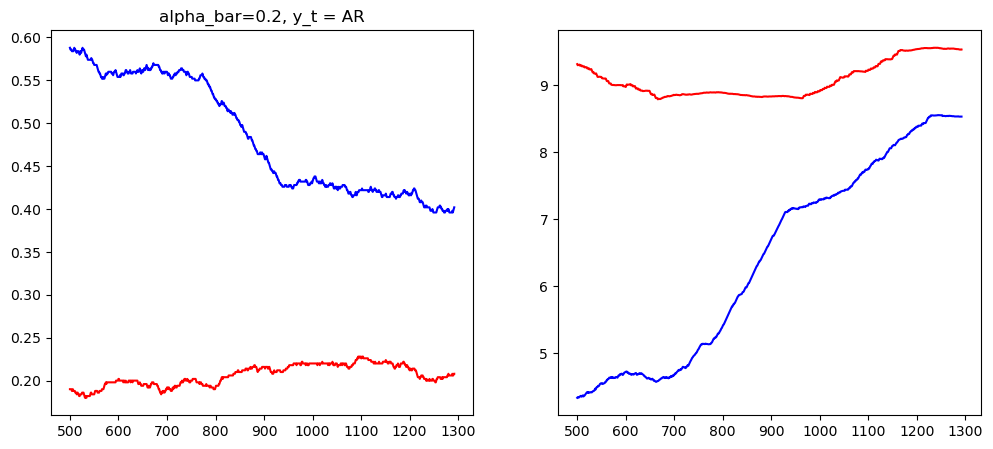

In [19]:
df = pd.read_csv('MPS_logs_AR_2024_11_02.csv')
df_MPS_rate = [df['mis_cover_rate'][0:500].mean()]
df_MCS_rate = [df['uncal_cover_rate'][0:500].mean()]
df_MPS_len = [len(df['MPS'][ind].strip("[]").split()) for ind in range(len(df))]
df_MCS_len = [len(df['uncal_MPS'][ind].strip("[]").split()) for ind in range(len(df))]
df_MPS_len_avg = [np.mean(df_MPS_len[0:500])]
df_MCS_len_avg = [np.mean(df_MCS_len[0:500])]
for ind in range(500, len(df)):
    df_MPS_rate += [df_MPS_rate[-1]+(df['mis_cover_rate'][ind]-df['mis_cover_rate'][ind-500])/500]
    df_MCS_rate += [df_MCS_rate[-1]+(df['uncal_cover_rate'][ind]-df['uncal_cover_rate'][ind-500])/500]
    df_MPS_len_avg += [df_MPS_len_avg[-1]+(df_MPS_len[ind]-df_MPS_len[ind-500])/500]
    df_MCS_len_avg += [df_MCS_len_avg[-1]+(df_MCS_len[ind]-df_MCS_len[ind-500])/500]
x = np.arange(500, len(df))

fig, axs = plt.subplots(1, 2, figsize=(12, 5))
axs[0].plot(x, np.array(df_MPS_rate[1:]), color = 'red')
axs[0].plot(x, np.array(df_MCS_rate[1:]), color = 'blue')
axs[0].set_title("alpha_bar=0.2, y_t = AR")

axs[1].plot(x, np.array(df_MPS_len_avg[1:]), color = 'red')
axs[1].plot(x, np.array(df_MCS_len_avg[1:]), color = 'blue')
# markov switching latent switch
# change point action of next move

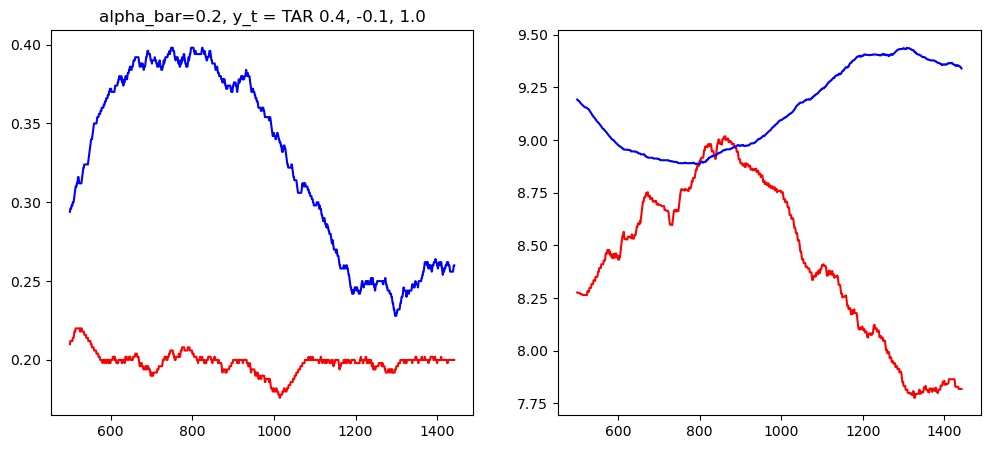

In [5]:
df = pd.read_csv('MPS_logs_TAR_2024_11_02.csv')
df_MPS_rate = [df['mis_cover_rate'][0:500].mean()]
df_MCS_rate = [df['uncal_cover_rate'][0:500].mean()]
df_MPS_len = [len(df['MPS'][ind].strip("[]").split()) for ind in range(len(df))]
df_MCS_len = [len(df['uncal_MPS'][ind].strip("[]").split()) for ind in range(len(df))]
df_MPS_len_avg = [np.mean(df_MPS_len[0:500])]
df_MCS_len_avg = [np.mean(df_MCS_len[0:500])]
for ind in range(500, len(df)):
    df_MPS_rate += [df_MPS_rate[-1]+(df['mis_cover_rate'][ind]-df['mis_cover_rate'][ind-500])/500]
    df_MCS_rate += [df_MCS_rate[-1]+(df['uncal_cover_rate'][ind]-df['uncal_cover_rate'][ind-500])/500]
    df_MPS_len_avg += [df_MPS_len_avg[-1]+(df_MPS_len[ind]-df_MPS_len[ind-500])/500]
    df_MCS_len_avg += [df_MCS_len_avg[-1]+(df_MCS_len[ind]-df_MCS_len[ind-500])/500]
x = np.arange(500, len(df))

fig, axs = plt.subplots(1, 2, figsize=(12, 5))
axs[0].plot(x, np.array(df_MPS_rate[1:]), color = 'red')
axs[0].plot(x, np.array(df_MCS_rate[1:]), color = 'blue')
axs[0].set_title("alpha_bar=0.2, y_t = TAR 0.4, -0.1, 1.0")

axs[1].plot(x, np.array(df_MPS_len_avg[1:]), color = 'red')
axs[1].plot(x, np.array(df_MCS_len_avg[1:]), color = 'blue')
fig.savefig('TAR.png')
# recording the right guesses to calibrate alpha_t

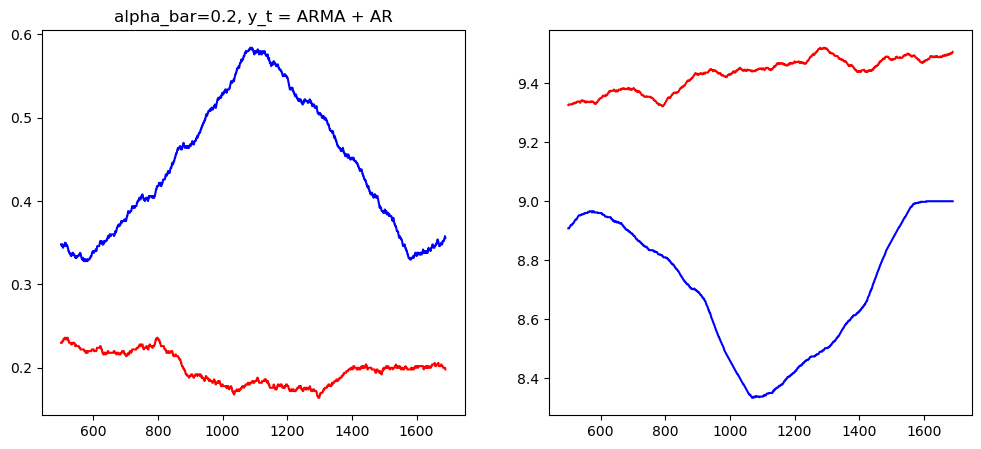

In [15]:
df = pd.read_csv('MPS_logs_ARMAAR_2024_11_01.csv')
df_MPS_rate = [df['mis_cover_rate'][0:500].mean()]
df_MCS_rate = [df['uncal_cover_rate'][0:500].mean()]
df_MPS_len = [len(df['MPS'][ind].strip("[]").split()) for ind in range(len(df))]
df_MCS_len = [len(df['uncal_MPS'][ind].strip("[]").split()) for ind in range(len(df))]
df_MPS_len_avg = [np.mean(df_MPS_len[0:500])]
df_MCS_len_avg = [np.mean(df_MCS_len[0:500])]
for ind in range(500, len(df)):
    df_MPS_rate += [df_MPS_rate[-1]+(df['mis_cover_rate'][ind]-df['mis_cover_rate'][ind-500])/500]
    df_MCS_rate += [df_MCS_rate[-1]+(df['uncal_cover_rate'][ind]-df['uncal_cover_rate'][ind-500])/500]
    df_MPS_len_avg += [df_MPS_len_avg[-1]+(df_MPS_len[ind]-df_MPS_len[ind-500])/500]
    df_MCS_len_avg += [df_MCS_len_avg[-1]+(df_MCS_len[ind]-df_MCS_len[ind-500])/500]
x = np.arange(500, len(df))

fig, axs = plt.subplots(1, 2, figsize=(12, 5))
axs[0].plot(x, np.array(df_MPS_rate[1:]), color = 'red')
axs[0].plot(x, np.array(df_MCS_rate[1:]), color = 'blue')
axs[0].set_title("alpha_bar=0.2, y_t = ARMA + AR")

axs[1].plot(x, np.array(df_MPS_len_avg[1:]), color = 'red')
axs[1].plot(x, np.array(df_MCS_len_avg[1:]), color = 'blue')


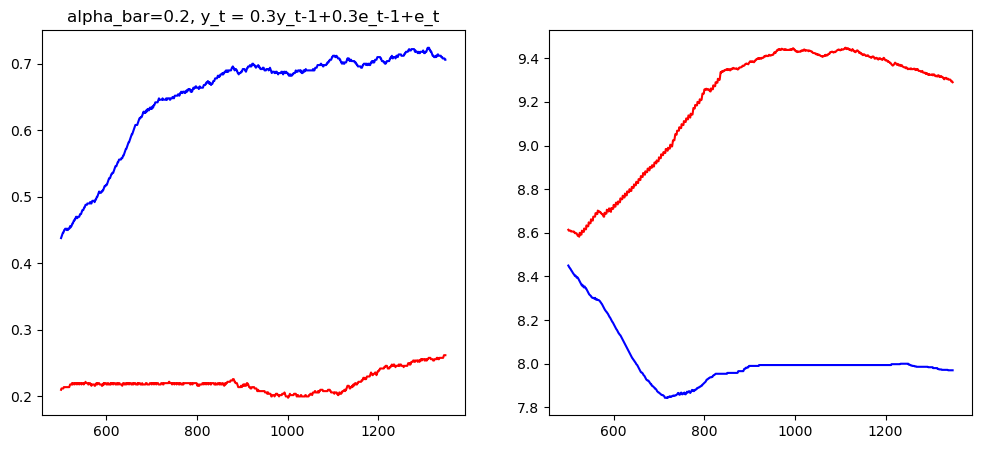

In [7]:
df = pd.read_csv('MPS_logs_2024_10_31 (7).csv')
df_MPS_rate = [df['mis_cover_rate'][0:500].mean()]
df_MCS_rate = [df['uncal_cover_rate'][0:500].mean()]
df_MPS_len = [len(df['MPS'][ind].strip("[]").split()) for ind in range(len(df))]
df_MCS_len = [len(df['uncal_MPS'][ind].strip("[]").split()) for ind in range(len(df))]
df_MPS_len_avg = [np.mean(df_MPS_len[0:500])]
df_MCS_len_avg = [np.mean(df_MCS_len[0:500])]
for ind in range(500, len(df)):
    df_MPS_rate += [df_MPS_rate[-1]+(df['mis_cover_rate'][ind]-df['mis_cover_rate'][ind-500])/500]
    df_MCS_rate += [df_MCS_rate[-1]+(df['uncal_cover_rate'][ind]-df['uncal_cover_rate'][ind-500])/500]
    df_MPS_len_avg += [df_MPS_len_avg[-1]+(df_MPS_len[ind]-df_MPS_len[ind-500])/500]
    df_MCS_len_avg += [df_MCS_len_avg[-1]+(df_MCS_len[ind]-df_MCS_len[ind-500])/500]
x = np.arange(500, len(df))

fig, axs = plt.subplots(1, 2, figsize=(12, 5))
axs[0].plot(x, np.array(df_MPS_rate[1:]), color = 'red')
axs[0].plot(x, np.array(df_MCS_rate[1:]), color = 'blue')
axs[0].set_title("alpha_bar=0.2, y_t = 0.3y_t-1+0.3e_t-1+e_t")

axs[1].plot(x, np.array(df_MPS_len_avg[1:]), color = 'red')
axs[1].plot(x, np.array(df_MCS_len_avg[1:]), color = 'blue')
fig.savefig('ARMA.png')

Text(0.5, 1.0, 'alpha_bar=0.2, y_t = 0.3y_t-1+0.3e_t-1+e_t')

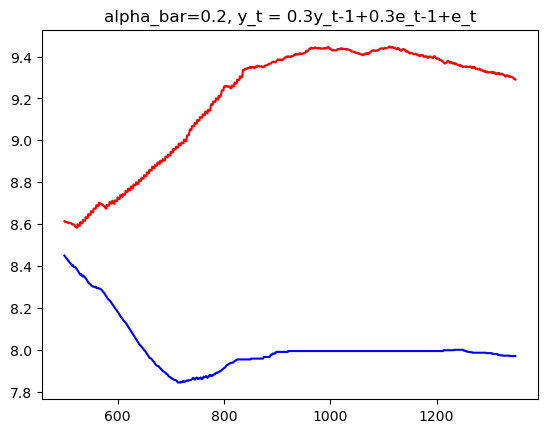

In [8]:
plt.plot(x, np.array(df_MPS_len_avg[1:]), color = 'red')
plt.plot(x, np.array(df_MCS_len_avg[1:]), color = 'blue')
plt.title("alpha_bar=0.2, y_t = 0.3y_t-1+0.3e_t-1+e_t") # RNN nonlinear time sereis 

Text(0.5, 1.0, 'alpha_bar=0.2, y_t = 0.3y_t-1+0.3e_t-1+e_t')

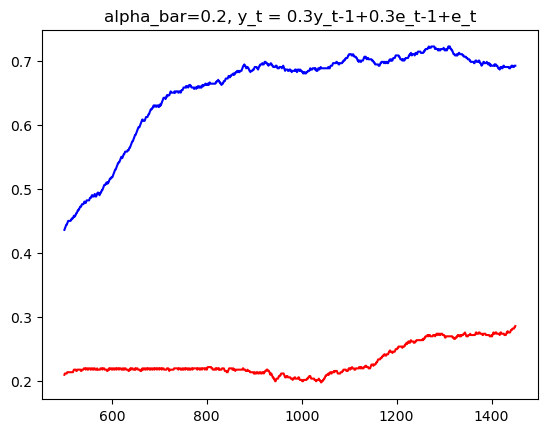

In [34]:
df = pd.read_csv('MPS_logs_2024_10_30 (3).csv')
df_MPS_rate = [df['mis_cover_rate'][0:500].mean()]
df_MCS_rate = [df['uncal_cover_rate'][0:500].mean()]
df_MPS_len = [len(df['MPS'][ind].strip("[]").split()) for ind in range(len(df))]
df_MCS_len = [len(df['uncal_MPS'][ind].strip("[]").split()) for ind in range(len(df))]
df_MPS_len_avg = [np.mean(df_MPS_len[0:500])]
df_MCS_len_avg = [np.mean(df_MCS_len[0:500])]
for ind in range(500, 1451):
    df_MPS_rate += [df_MPS_rate[-1]+(df['mis_cover_rate'][ind]-df['mis_cover_rate'][ind-500])/500]
    df_MCS_rate += [df_MCS_rate[-1]+(df['uncal_cover_rate'][ind]-df['uncal_cover_rate'][ind-500])/500]
    df_MPS_len_avg += [df_MPS_len_avg[-1]+(df_MPS_len[ind]-df_MPS_len[ind-500])/500]
    df_MCS_len_avg += [df_MCS_len_avg[-1]+(df_MCS_len[ind]-df_MCS_len[ind-500])/500]
x = np.arange(500, 1451)
plt.plot(x, np.array(df_MPS_rate[1:]), color = 'red')
plt.plot(x, np.array(df_MCS_rate[1:]), color = 'blue')
plt.title("alpha_bar=0.2, y_t = 0.3y_t-1+0.3e_t-1+e_t")

Text(0.5, 1.0, 'alpha_bar=0.2, y_t = 0.3y_t-1+0.3e_t-1+e_t')

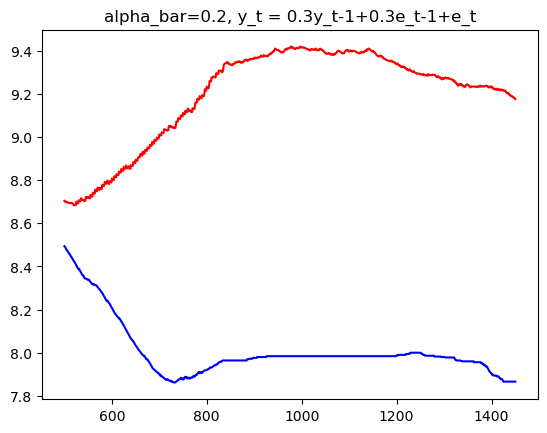

In [35]:
plt.plot(x, np.array(df_MPS_len_avg[1:]), color = 'red')
plt.plot(x, np.array(df_MCS_len_avg[1:]), color = 'blue')
plt.title("alpha_bar=0.2, y_t = 0.3y_t-1+0.3e_t-1+e_t") # RNN nonlinear time sereis 

Text(0.5, 1.0, 'alpha_bar=0.2, y_t = 0.6y_t-1+e_t+0.6e_{t-1}')

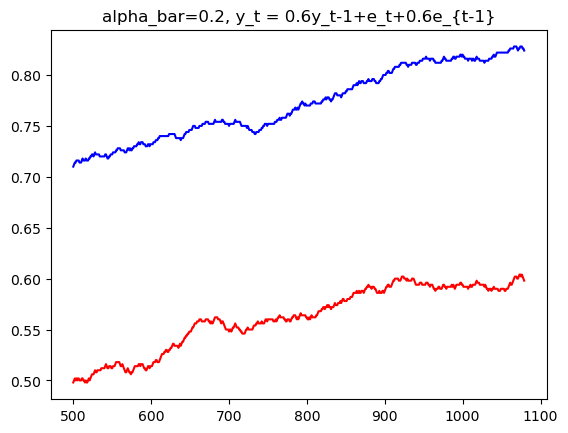

In [29]:
df_29 = pd.read_csv('MPS_logs_2024_10_29.csv')
df_29_MPS_rate = [df_29['mis_cover_rate'][0:500].mean()]
df_29_MCS_rate = [df_29['uncal_cover_rate'][0:500].mean()]
df_29_MPS_len = [len(df_29['MPS'][ind].strip("[]").split()) for ind in range(len(df_29))]
df_29_MCS_len = [len(df_29['uncal_MPS'][ind].strip("[]").split()) for ind in range(len(df_29))]
df_29_MPS_len_avg = [np.mean(df_29_MPS_len[0:500])]
df_29_MCS_len_avg = [np.mean(df_29_MCS_len[0:500])]
for ind in range(500, 1080):
    df_29_MPS_rate += [df_29_MPS_rate[-1]+(df_29['mis_cover_rate'][ind]-df_29['mis_cover_rate'][ind-500])/500]
    df_29_MCS_rate += [df_29_MCS_rate[-1]+(df_29['uncal_cover_rate'][ind]-df_29['uncal_cover_rate'][ind-500])/500]
    df_29_MPS_len_avg += [df_29_MPS_len_avg[-1]+(df_29_MPS_len[ind]-df_29_MPS_len[ind-500])/500]
    df_29_MCS_len_avg += [df_29_MCS_len_avg[-1]+(df_29_MCS_len[ind]-df_29_MCS_len[ind-500])/500]
x = np.arange(500, 1080)
plt.plot(x, np.array(df_29_MPS_rate[1:]), color = 'red')
plt.plot(x, np.array(df_29_MCS_rate[1:]), color = 'blue')
plt.title("alpha_bar=0.2, y_t = 0.6y_t-1+e_t+0.6e_{t-1}")

Text(0.5, 1.0, 'alpha_bar=0.2, y_t = 0.8y_t-1+e_t')

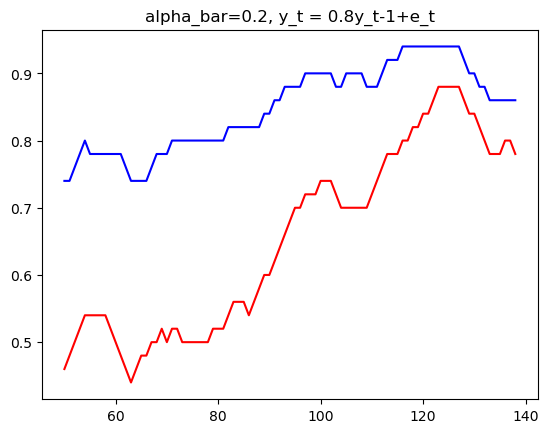

In [10]:
df_24 = pd.read_csv('MPS_logs_2024_10_24N.csv')
df_24_MPS_rate = [df_24['mis_cover_rate'][0:50].mean()]
df_24_MCS_rate = [df_24['uncal_cover_rate'][0:50].mean()]
df_24_MPS_len = [len(df_24['MPS'][ind].strip("[]").split()) for ind in range(len(df_24))]
df_24_MCS_len = [len(df_24['uncal_MPS'][ind].strip("[]").split()) for ind in range(len(df_24))]
df_24_MPS_len_avg = [np.mean(df_24_MPS_len[0:50])]
df_24_MCS_len_avg = [np.mean(df_24_MCS_len[0:50])]
for ind in range(50, 139):
    df_24_MPS_rate += [df_24_MPS_rate[-1]+(df_24['mis_cover_rate'][ind]-df_24['mis_cover_rate'][ind-50])/50]
    df_24_MCS_rate += [df_24_MCS_rate[-1]+(df_24['uncal_cover_rate'][ind]-df_24['uncal_cover_rate'][ind-50])/50]
    df_24_MPS_len_avg += [df_24_MPS_len_avg[-1]+(df_24_MPS_len[ind]-df_24_MPS_len[ind-50])/50]
    df_24_MCS_len_avg += [df_24_MCS_len_avg[-1]+(df_24_MCS_len[ind]-df_24_MCS_len[ind-50])/50]
x = np.arange(50, 139)
plt.plot(x, np.array(df_24_MPS_rate[1:]), color = 'red')
plt.plot(x, np.array(df_24_MCS_rate[1:]), color = 'blue')
plt.title("alpha_bar=0.2, y_t = 0.8y_t-1+e_t")

Text(0.5, 1.0, 'alpha_bar=0.2, y_t = 0.6y_t-1+e_t')

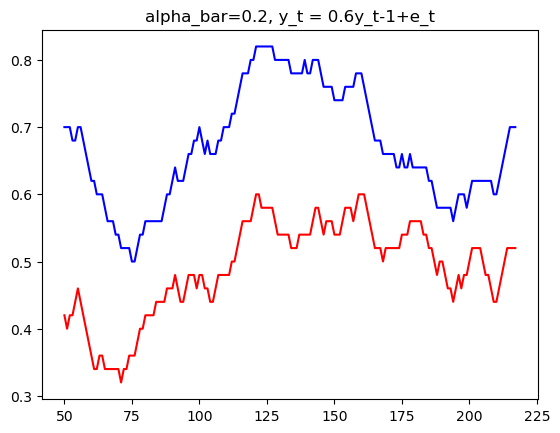

In [13]:
df_25 = pd.read_csv('MPS_logs_2024_10_25.csv')
df_25_MPS_rate = [df_25['mis_cover_rate'][0:50].mean()]
df_25_MCS_rate = [df_25['uncal_cover_rate'][0:50].mean()]
df_25_MPS_len = [len(df_25['MPS'][ind].strip("[]").split()) for ind in range(len(df_25))]
df_25_MCS_len = [len(df_25['uncal_MPS'][ind].strip("[]").split()) for ind in range(len(df_25))]
df_25_MPS_len_avg = [np.mean(df_25_MPS_len[0:50])]
df_25_MCS_len_avg = [np.mean(df_25_MCS_len[0:50])]
for ind in range(50, 218):
    df_25_MPS_rate += [df_25_MPS_rate[-1]+(df_25['mis_cover_rate'][ind]-df_25['mis_cover_rate'][ind-50])/50]
    df_25_MCS_rate += [df_25_MCS_rate[-1]+(df_25['uncal_cover_rate'][ind]-df_25['uncal_cover_rate'][ind-50])/50]
    df_25_MPS_len_avg += [df_25_MPS_len_avg[-1]+(df_25_MPS_len[ind]-df_25_MPS_len[ind-50])/50]
    df_25_MCS_len_avg += [df_25_MCS_len_avg[-1]+(df_25_MCS_len[ind]-df_25_MCS_len[ind-50])/50]
x = np.arange(50, 218)
plt.plot(x, np.array(df_25_MPS_rate[1:]), color = 'red')
plt.plot(x, np.array(df_25_MCS_rate[1:]), color = 'blue')
plt.title("alpha_bar=0.2, y_t = 0.6y_t-1+e_t")

Text(0.5, 1.0, 'alpha_bar=0.2, y_t = 0.4y_t-1+e_t')

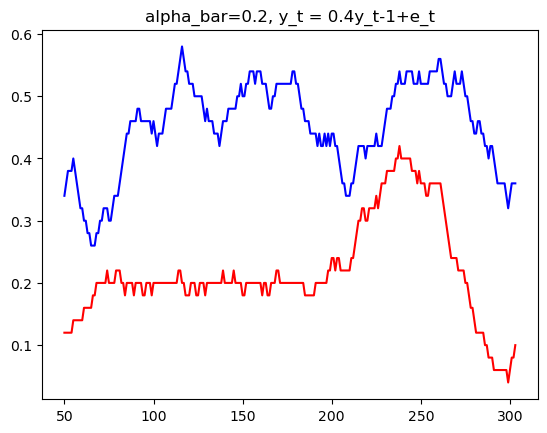

In [23]:
df_26 = pd.read_csv('MPS_logs_2024_10_26.csv')
df_26_MPS_rate = [df_26['mis_cover_rate'][0:50].mean()]
df_26_MCS_rate = [df_26['uncal_cover_rate'][0:50].mean()]
df_26_MPS_len = [len(df_26['MPS'][ind].strip("[]").split()) for ind in range(len(df_26))]
df_26_MCS_len = [len(df_26['uncal_MPS'][ind].strip("[]").split()) for ind in range(len(df_26))]
df_26_MPS_len_avg = [np.mean(df_26_MPS_len[0:50])]
df_26_MCS_len_avg = [np.mean(df_26_MCS_len[0:50])]
for ind in range(50, 304):
    df_26_MPS_rate += [df_26_MPS_rate[-1]+(df_26['mis_cover_rate'][ind]-df_26['mis_cover_rate'][ind-50])/50]
    df_26_MCS_rate += [df_26_MCS_rate[-1]+(df_26['uncal_cover_rate'][ind]-df_26['uncal_cover_rate'][ind-50])/50]
    df_26_MPS_len_avg += [df_26_MPS_len_avg[-1]+(df_26_MPS_len[ind]-df_26_MPS_len[ind-50])/50]
    df_26_MCS_len_avg += [df_26_MCS_len_avg[-1]+(df_26_MCS_len[ind]-df_26_MCS_len[ind-50])/50]
x = np.arange(50, 304)
plt.plot(x, np.array(df_26_MPS_rate[1:]), color = 'red')
plt.plot(x, np.array(df_26_MCS_rate[1:]), color = 'blue')
plt.title("alpha_bar=0.2, y_t = 0.4y_t-1+e_t")

Text(0.5, 1.0, 'alpha_bar=0.2, y_t = 0.4y_t-1+e_t')

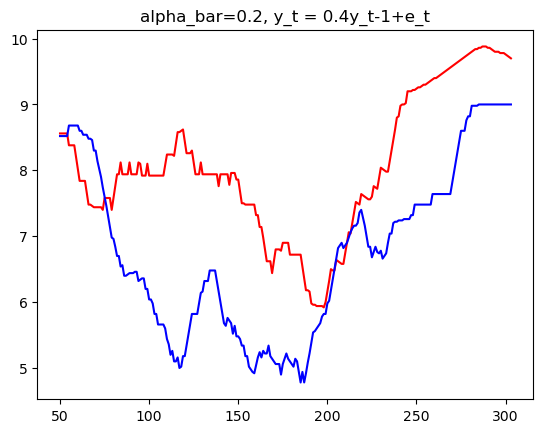

In [24]:
plt.plot(x, np.array(df_26_MPS_len_avg[1:]), color = 'red')
plt.plot(x, np.array(df_26_MCS_len_avg[1:]), color = 'blue')
plt.title("alpha_bar=0.2, y_t = 0.4y_t-1+e_t") # RNN nonlinear time sereis 

Text(0.5, 1.0, 'alpha_bar=0.2, y_t = 0.9y_t-1+e_t')

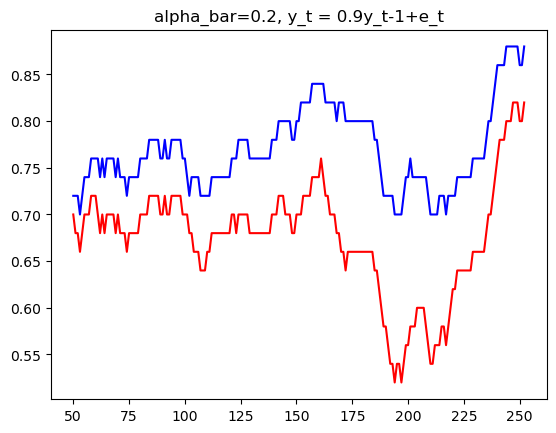

In [21]:
df_27 = pd.read_csv('MPS_logs_2024_10_27.csv')
df_27_MPS_rate = [df_27['mis_cover_rate'][0:50].mean()]
df_27_MCS_rate = [df_27['uncal_cover_rate'][0:50].mean()]
df_27_MPS_len = [len(df_27['MPS'][ind].strip("[]").split()) for ind in range(len(df_27))]
df_27_MCS_len = [len(df_27['uncal_MPS'][ind].strip("[]").split()) for ind in range(len(df_27))]
df_27_MPS_len_avg = [np.mean(df_27_MPS_len[0:50])]
df_27_MCS_len_avg = [np.mean(df_27_MCS_len[0:50])]
for ind in range(50, 253):
    df_27_MPS_rate += [df_27_MPS_rate[-1]+(df_27['mis_cover_rate'][ind]-df_27['mis_cover_rate'][ind-50])/50]
    df_27_MCS_rate += [df_27_MCS_rate[-1]+(df_27['uncal_cover_rate'][ind]-df_27['uncal_cover_rate'][ind-50])/50]
    df_27_MPS_len_avg += [df_27_MPS_len_avg[-1]+(df_27_MPS_len[ind]-df_27_MPS_len[ind-50])/50]
    df_27_MCS_len_avg += [df_27_MCS_len_avg[-1]+(df_27_MCS_len[ind]-df_27_MCS_len[ind-50])/50]
x = np.arange(50, 253)
plt.plot(x, np.array(df_27_MPS_rate[1:]), color = 'red')
plt.plot(x, np.array(df_27_MCS_rate[1:]), color = 'blue')
plt.title("alpha_bar=0.2, y_t = 0.9y_t-1+e_t")

In [2]:
np.random.seed(2024)
yr = DGP_AR(0.8, 2000)
yr = robjects.FloatVector(yr)
robjects.r.assign('yr', yr)
robjects.r('''
models <- c('AR1', 'AR2', 'AR3', 'AR4', 'AR5')
loss_matrix <- data.frame(matrix(ncol = length(models), nrow = 0))
colnames(loss_matrix) <- models

for (t in 1000:1999){
  AR1 <- arima(yr[1:t], order = c(1,0,0), include.mean=FALSE)
  AR1_p <- as.numeric(predict(AR1, se.fit = FALSE))
  
  AR2 <- arima(yr[1:t], order = c(2,0,0), include.mean=FALSE)
  AR2_p <- as.numeric(predict(AR2, se.fit = FALSE))
  
  AR3 <- arima(yr[1:t], order = c(3,0,0), include.mean=FALSE)
  AR3_p <- as.numeric(predict(AR3, se.fit = FALSE))
  
  AR4 <- arima(yr[1:t], order = c(4,0,0), include.mean=FALSE)
  AR4_p <- as.numeric(predict(AR4, se.fit = FALSE))
  
  AR5 <- arima(yr[1:t], order = c(5,0,0), include.mean=FALSE)
  AR5_p <- as.numeric(predict(AR5, se.fit = FALSE))
  
  newrow <- data.frame(AR1 = (AR1_p-yr[t+1])^2,
  AR2 = (AR2_p-yr[t+1])^2,
  AR3 = (AR3_p-yr[t+1])^2,
  AR4 = (AR4_p-yr[t+1])^2,
  AR5 = (AR5_p-yr[t+1])^2
  )
  loss_matrix = rbind(loss_matrix, newrow)
  
}

''')
Loss_matrix = pandas2ri.rpy2py(robjects.r['loss_matrix'])
#print(Loss_matrix)

In [3]:
Loss_matrix.to_csv('loss.csv', index=False)

In [4]:
df_loss = pd.read_csv('loss.csv')
df_loss

,AR1,AR2,AR3,AR4,AR5
0,0.007449,0.004453,0.004129,0.002080,0.001465
1,3.649899,3.508653,3.492820,3.544774,3.577826
2,1.397722,1.105324,1.120088,1.074247,1.098417
3,0.043310,0.026023,0.035602,0.051626,0.048299
4,2.314203,2.230281,2.202508,1.772507,1.723286
...,...,...,...,...,...
995,0.053332,0.043936,0.046364,0.041376,0.034257
996,1.551214,1.552952,1.539230,1.513161,1.485114
997,0.192891,0.231070,0.231618,0.241628,0.231816
998,0.000221,0.001271,0.002216,0.002113,0.003149


In [ ]:
start_time = datetime.datetime.now()
MPS_matrix = MPS(Loss_matrix, 500, 0.2, 0.1, 4.0, beta_search=20, alpha_search=20, bootstrap=100, B=20)
end_time = datetime.datetime.now()

time_difference = end_time - start_time
print("Time difference:", time_difference)

[0.9  0.9  0.9  0.1  0.9  0.9  0.9  0.9  0.9  0.7  0.9  0.85 0.9  0.8
 0.9  0.9  0.75 0.9  0.05 0.05]
0
['AR1']
1
['AR1']
2
['AR1' 'AR2']
3
['AR1' 'AR2' 'AR3']
4
['AR1']
5
['AR1']
6
['AR1' 'AR2']
7
['AR1']
8
['AR1']
9
['AR1']
10
['AR1' 'AR2']
11
['AR1' 'AR2']
12
['AR1' 'AR2' 'AR3']
13
['AR1' 'AR2']
14
['AR1']
15
['AR1']
16
['AR1']
17
['AR1']
18
['AR1']
19
['AR1']
20
['AR1' 'AR2']
21
['AR1' 'AR2' 'AR3']
22
['AR1']
23
['AR1']
24
['AR1' 'AR2']
25
['AR1' 'AR2']
26
['AR1']
27
['AR1' 'AR2' 'AR3']
28
['AR1' 'AR2']
29
['AR1' 'AR2']
30
['AR1' 'AR2']
31
['AR1' 'AR2']
32
['AR1' 'AR2']
33
['AR1']
34
['AR1']
35
['AR1']
36
['AR1' 'AR2']
37
['AR1' 'AR2']
38
['AR1']
39
['AR1']
40
['AR1']
41
['AR1' 'AR2']
42
['AR1' 'AR2']
43
['AR1']
44
['AR1' 'AR2']
45
['AR1']
46
['AR1']
47
['AR1' 'AR2']
48
['AR1']
49
['AR1']
50
['AR1']
51
['AR1' 'AR2']
52
['AR1']
53
['AR1']
54
['AR1' 'AR2']
55
['AR1' 'AR2']
56
['AR1']
57
['AR1' 'AR2']
58
['AR1']
59
['AR1']
60
['AR1' 'AR2']
61
['AR1']
62
['AR1']
63
['AR1']
64
['AR1']
6

In [21]:
import tensorflow as tf
print("TensorFlow version:", tf.__version__)

TensorFlow version: 2.18.0


Text(0.5, 1.0, 'alpha_bar=0.2, y_t = 0.8y_t-1+e_t')

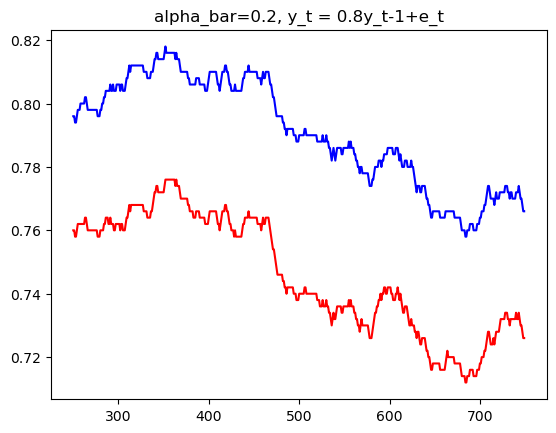

In [14]:
df_23 = pd.read_csv('MPS_logs_2024_10_23.csv')
df_23_MPS_rate = [df_23['mis_cover_rate'][0:500].mean()]
df_23_MCS_rate = [df_23['uncal_cover_rate'][0:500].mean()]
df_23_MPS_len = [len(df_23['MPS'][ind].strip("[]").split()) for ind in range(len(df_23))]
df_23_MCS_len = [len(df_23['uncal_MPS'][ind].strip("[]").split()) for ind in range(len(df_23))]
df_23_MPS_len_avg = [np.mean(df_23_MPS_len[0:500])]
df_23_MCS_len_avg = [np.mean(df_23_MCS_len[0:500])]
for ind in range(500, 1000):
    df_23_MPS_rate += [df_23_MPS_rate[-1]+(df_23['mis_cover_rate'][ind]-df_23['mis_cover_rate'][ind-500])/500]
    df_23_MCS_rate += [df_23_MCS_rate[-1]+(df_23['uncal_cover_rate'][ind]-df_23['uncal_cover_rate'][ind-500])/500]
    df_23_MPS_len_avg += [df_23_MPS_len_avg[-1]+(df_23_MPS_len[ind]-df_23_MPS_len[ind-500])/500]
    df_23_MCS_len_avg += [df_23_MCS_len_avg[-1]+(df_23_MCS_len[ind]-df_23_MCS_len[ind-500])/500]
x = np.arange(250, 750)
plt.plot(x, np.array(df_23_MPS_rate[1:]), color = 'red')
plt.plot(x, np.array(df_23_MCS_rate[1:]), color = 'blue')
plt.title("alpha_bar=0.2, y_t = 0.8y_t-1+e_t")

Text(0.5, 1.0, 'alpha_bar=0.2, y_t = 0.8y_t-1+e_t')

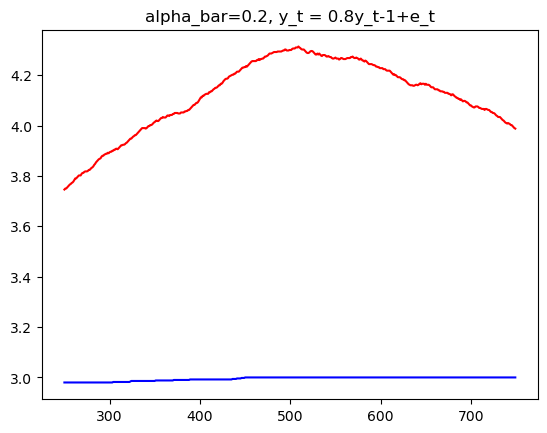

In [15]:
plt.plot(x, np.array(df_23_MPS_len_avg[1:]), color = 'red')
plt.plot(x, np.array(df_23_MCS_len_avg[1:]), color = 'blue')
plt.title("alpha_bar=0.2, y_t = 0.8y_t-1+e_t") # RNN nonlinear time sereis 

Text(0.5, 1.0, 'alpha_bar=0.2, y_t = 0.6y_t-1+e_t')

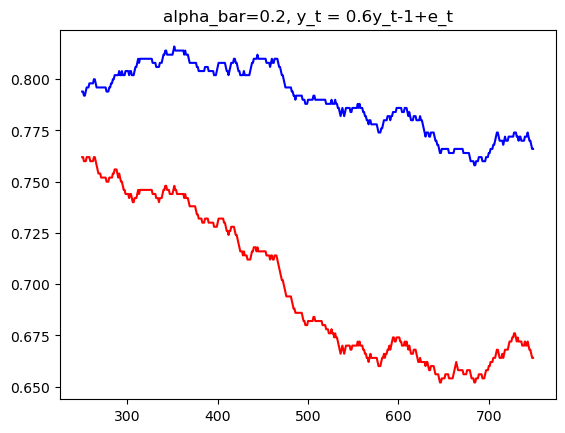

In [2]:
df_22 = pd.read_csv('MPS_logs_2024_10_22.csv')
df_22_MPS_rate = [df_22['mis_cover_rate'][0:500].mean()]
df_22_MCS_rate = [df_22['uncal_cover_rate'][0:500].mean()]
df_22_MPS_len = [len(df_22['MPS'][ind].strip("[]").split()) for ind in range(len(df_22))]
df_22_MCS_len = [len(df_22['uncal_MPS'][ind].strip("[]").split()) for ind in range(len(df_22))]
for ind in range(500, 1000):
    df_22_MPS_rate += [df_22_MPS_rate[-1]+(df_22['mis_cover_rate'][ind]-df_22['mis_cover_rate'][ind-500])/500]
    df_22_MCS_rate += [df_22_MCS_rate[-1]+(df_22['uncal_cover_rate'][ind]-df_22['uncal_cover_rate'][ind-500])/500]
x = np.arange(250, 750)
plt.plot(x, np.array(df_22_MPS_rate[1:]), color = 'red')
plt.plot(x, np.array(df_22_MCS_rate[1:]), color = 'blue')
plt.title("alpha_bar=0.2, y_t = 0.8y_t-1+e_t")

Text(0.5, 1.0, 'alpha_bar=0.2, y_t = 0.8y_t-1+e_t')

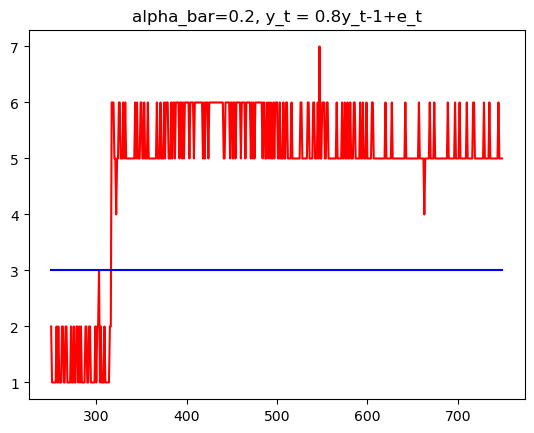

In [3]:
plt.plot(x, df_22_MPS_len[250:750], color = 'red')
plt.plot(x, df_22_MCS_len[250:750], color = 'blue')
plt.title("alpha_bar=0.2, y_t = 0.8y_t-1+e_t") # RNN nonlinear time sereis 

Text(0.5, 1.0, 'alpha_bar=0.2, y_t = 0.6y_t-1+e_t')

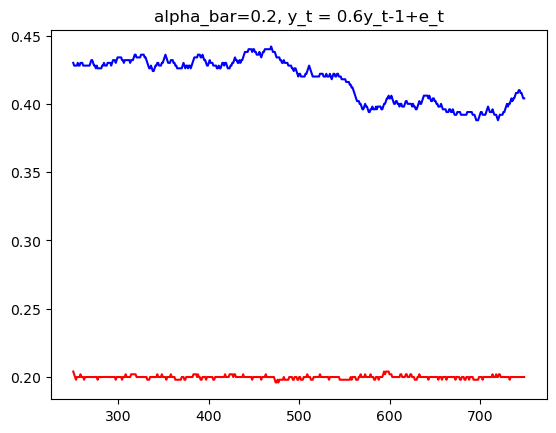

In [94]:
df_18 = pd.read_csv('MPS_logs_2024_10_18.csv')
df_18_MPS_rate = [df_18['mis_cover_rate'][0:500].mean()]
df_18_MCS_rate = [df_18['uncal_cover_rate'][0:500].mean()]
df_18_MPS_len = [len(df_18['MPS'][ind].strip("[]").split()) for ind in range(len(df_18))]
df_18_MCS_len = [len(df_18['uncal_MPS'][ind].strip("[]").split()) for ind in range(len(df_18))]
for ind in range(500, 1000):
    df_18_MPS_rate += [df_18_MPS_rate[-1]+(df_18['mis_cover_rate'][ind]-df_18['mis_cover_rate'][ind-500])/500]
    df_18_MCS_rate += [df_18_MCS_rate[-1]+(df_18['uncal_cover_rate'][ind]-df_18['uncal_cover_rate'][ind-500])/500]
x = np.arange(250, 750)
plt.plot(x, np.array(df_18_MPS_rate[1:]), color = 'red')
plt.plot(x, np.array(df_18_MCS_rate[1:]), color = 'blue')
plt.title("alpha_bar=0.2, y_t = 0.6y_t-1+e_t")

Text(0.5, 1.0, 'alpha_bar=0.2, y_t = 0.6y_t-1+e_t')

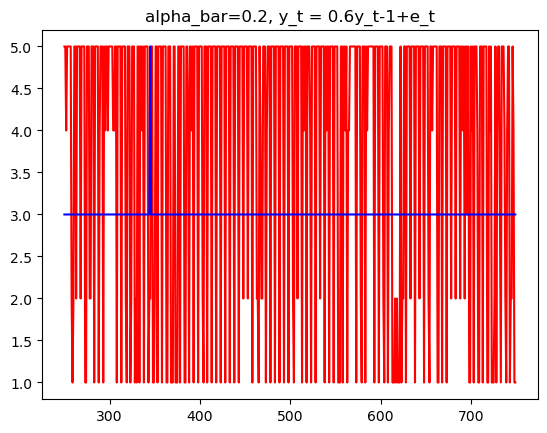

In [104]:
plt.plot(x, df_18_MPS_len[250:750], color = 'red')
plt.plot(x, df_18_MCS_len[250:750], color = 'blue')
plt.title("alpha_bar=0.2, y_t = 0.6y_t-1+e_t") # RNN nonlinear time sereis 

Text(0.5, 1.0, 'alpha_bar = 0.2, y_t = 0.6y_t-1+e_t')

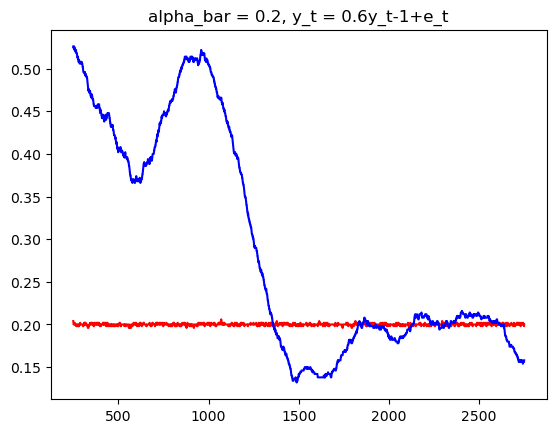

In [107]:
df_19 = pd.read_csv('MPS_logs_2024_10_19.csv')
df_19_MPS_rate = [df_19['mis_cover_rate'][0:500].mean()]
df_19_MCS_rate = [df_19['uncal_cover_rate'][0:500].mean()]
df_19_MPS_len = [len(df_19['MPS'][ind].strip("[]").split()) for ind in range(len(df_19))]
df_19_MCS_len = [len(df_19['uncal_MPS'][ind].strip("[]").split()) for ind in range(len(df_19))]
for ind in range(500, 3000):
    df_19_MPS_rate += [df_19_MPS_rate[-1]+(df_19['mis_cover_rate'][ind]-df_19['mis_cover_rate'][ind-500])/500]
    df_19_MCS_rate += [df_19_MCS_rate[-1]+(df_19['uncal_cover_rate'][ind]-df_19['uncal_cover_rate'][ind-500])/500]
x = np.arange(250, 2750)
plt.plot(x, np.array(df_19_MPS_rate[1:]), color = 'red')
plt.plot(x, np.array(df_19_MCS_rate[1:]), color = 'blue')
plt.title('alpha_bar = 0.2, y_t = 0.6y_t-1+e_t')

Text(0.5, 1.0, 'alpha_bar=0.2, y_t = 0.6y_t-1+e_t')

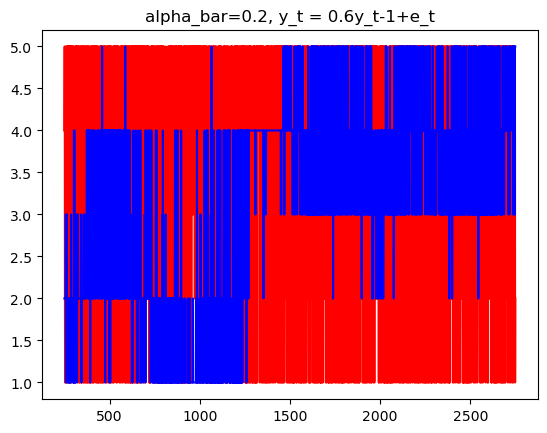

In [108]:
plt.plot(x, df_19_MPS_len[250:2750], color = 'red')
plt.plot(x, df_19_MCS_len[250:2750], color = 'blue')
plt.title("alpha_bar=0.2, y_t = 0.6y_t-1+e_t")

Text(0.5, 1.0, 'alpha_bar = 0.05, y_t = 0.6y_t-1+e_t')

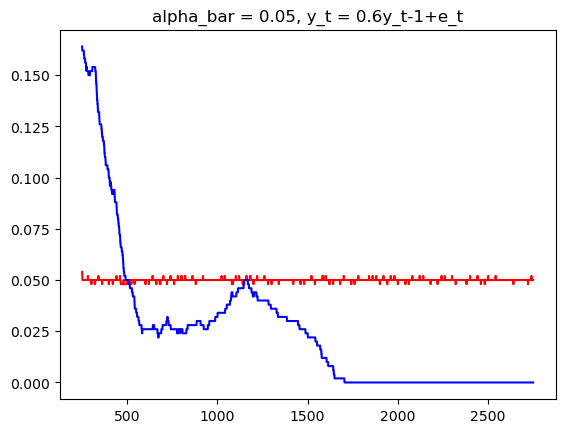

In [111]:
df_20 = pd.read_csv('MPS_logs_2024_10_20.csv')
df_20_MPS_rate = [df_20['mis_cover_rate'][0:500].mean()]
df_20_MCS_rate = [df_20['uncal_cover_rate'][0:500].mean()]
df_20_MPS_len = [len(df_20['MPS'][ind].strip("[]").split()) for ind in range(len(df_20))]
df_20_MCS_len = [len(df_20['uncal_MPS'][ind].strip("[]").split()) for ind in range(len(df_20))]
for ind in range(500, 3000):
    df_20_MPS_rate += [df_20_MPS_rate[-1]+(df_20['mis_cover_rate'][ind]-df_20['mis_cover_rate'][ind-500])/500]
    df_20_MCS_rate += [df_20_MCS_rate[-1]+(df_20['uncal_cover_rate'][ind]-df_20['uncal_cover_rate'][ind-500])/500]
x = np.arange(250, 2750)
plt.plot(x, np.array(df_20_MPS_rate[1:]), color = 'red')
plt.plot(x, np.array(df_20_MCS_rate[1:]), color = 'blue')
plt.title('alpha_bar = 0.05, y_t = 0.6y_t-1+e_t')

Text(0.5, 1.0, 'alpha_bar=0.2, y_t = 0.6y_t-1+e_t')

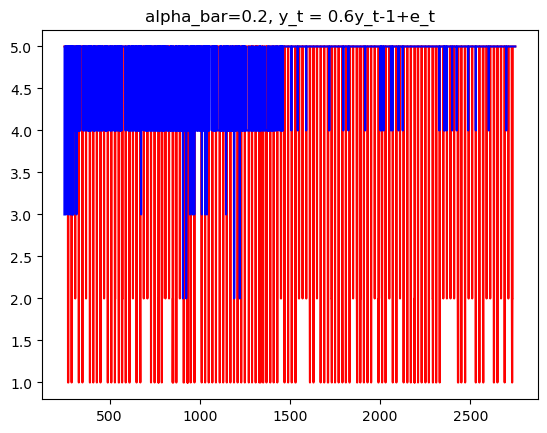

In [113]:
plt.plot(x, df_20_MPS_len[250:2750], color = 'red')
plt.plot(x, df_20_MCS_len[250:2750], color = 'blue')
plt.title("alpha_bar=0.2, y_t = 0.6y_t-1+e_t")

In [65]:
df_20 = pd.read_csv('MPS_logs_2024_10_20.csv')
df_20.shape

(3000, 8)

In [59]:
df_19_MPS_rate = [df_19['mis_cover_rate'][0:500].mean()]
df_19_MCS_rate = [df_19['uncal_cover_rate'][0:500].mean()]

In [60]:
for ind in range(500, 3000):
    df_19_MPS_rate += [df_19_MPS_rate[-1]+(df_19['mis_cover_rate'][ind]-df_19['mis_cover_rate'][ind-500])/500]
    df_19_MCS_rate += [df_19_MCS_rate[-1]+(df_19['uncal_cover_rate'][ind]-df_19['uncal_cover_rate'][ind-500])/500]
    

In [18]:
a = np.arange(5)
a[-1]

4

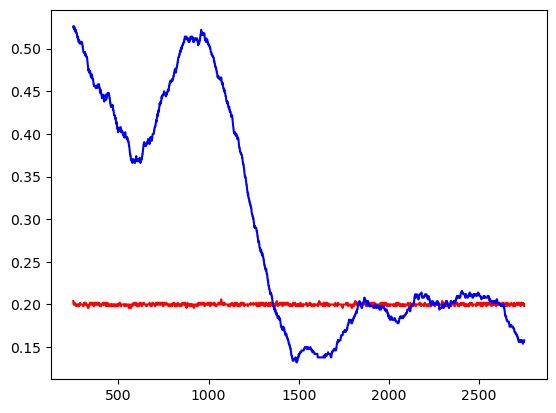

In [61]:
x = np.arange(250, 2750)
plt.plot(x, np.array(df_19_MPS_rate[1:]), color = 'r')
plt.plot(x, np.array(df_19_MCS_rate[1:]), color = 'blue')

In [44]:
np.array(df_18_MPS_rate)

array([0.206, 0.204, 0.202, 0.2  , 0.198, 0.2  , 0.2  , 0.2  , 0.2  ,
       0.202, 0.2  , 0.2  , 0.2  , 0.198, 0.2  , 0.2  , 0.2  , 0.2  ,
       0.2  , 0.2  , 0.2  , 0.2  , 0.2  , 0.2  , 0.2  , 0.2  , 0.2  ,
       0.2  , 0.198, 0.2  , 0.2  , 0.2  , 0.2  , 0.2  , 0.2  , 0.2  ,
       0.2  , 0.2  , 0.2  , 0.2  , 0.2  , 0.2  , 0.2  , 0.2  , 0.2  ,
       0.2  , 0.2  , 0.2  , 0.198, 0.2  , 0.2  , 0.2  , 0.2  , 0.2  ,
       0.2  , 0.198, 0.2  , 0.2  , 0.2  , 0.202, 0.2  , 0.2  , 0.2  ,
       0.2  , 0.2  , 0.202, 0.202, 0.202, 0.202, 0.202, 0.202, 0.2  ,
       0.2  , 0.2  , 0.2  , 0.2  , 0.2  , 0.2  , 0.2  , 0.2  , 0.2  ,
       0.2  , 0.2  , 0.198, 0.198, 0.198, 0.2  , 0.2  , 0.2  , 0.2  ,
       0.2  , 0.2  , 0.2  , 0.2  , 0.202, 0.2  , 0.2  , 0.2  , 0.2  ,
       0.202, 0.2  , 0.2  , 0.2  , 0.2  , 0.198, 0.2  , 0.2  , 0.2  ,
       0.2  , 0.202, 0.2  , 0.2  , 0.2  , 0.2  , 0.198, 0.198, 0.198,
       0.198, 0.198, 0.198, 0.198, 0.2  , 0.2  , 0.2  , 0.198, 0.198,
       0.2  , 0.2  ,

In [26]:
a = [1,2,3]
a+=[1]

In [27]:
a

[1, 2, 3, 1]

In [3]:
np.random.seed(2024)
yr = DGP_AR(0.4, 2000)
yr = robjects.FloatVector(yr)
robjects.r.assign('yr', yr)
robjects.r('''
models <- c('AR1', 'AR2', 'AR3', 'AR4', 'AR5')
loss_matrix <- data.frame(matrix(ncol = length(models), nrow = 0))
colnames(loss_matrix) <- models

for (t in 1000:1999){
  AR1 <- arima(yr[1:t], order = c(1,0,0), include.mean=FALSE)
  AR1_p <- as.numeric(predict(AR1, se.fit = FALSE))
  
  AR2 <- arima(yr[1:t], order = c(2,0,0), include.mean=FALSE)
  AR2_p <- as.numeric(predict(AR2, se.fit = FALSE))
  
  AR3 <- arima(yr[1:t], order = c(3,0,0), include.mean=FALSE)
  AR3_p <- as.numeric(predict(AR3, se.fit = FALSE))
  
  AR4 <- arima(yr[1:t], order = c(4,0,0), include.mean=FALSE)
  AR4_p <- as.numeric(predict(AR4, se.fit = FALSE))
  
  AR5 <- arima(yr[1:t], order = c(5,0,0), include.mean=FALSE)
  AR5_p <- as.numeric(predict(AR5, se.fit = FALSE))
  
  newrow <- data.frame(AR1 = (AR1_p-yr[t+1])^2,
  AR2 = (AR2_p-yr[t+1])^2,
  AR3 = (AR3_p-yr[t+1])^2,
  AR4 = (AR4_p-yr[t+1])^2,
  AR5 = (AR5_p-yr[t+1])^2
  )
  loss_matrix = rbind(loss_matrix, newrow)
  
}

''')
Loss_matrix = pandas2ri.rpy2py(robjects.r['loss_matrix'])
#print(Loss_matrix)

In [5]:
Loss_matrix.shape

(1000, 5)

In [5]:
start_time = datetime.datetime.now()
MPS_matrix = MPS(Loss_matrix, 990, 0.2, 0.1, 0.9, B=10)
end_time = datetime.datetime.now()

time_difference = end_time - start_time
print("Time difference:", time_difference)

[0.  0.  0.8 0.8 0.8 0.8 0.  0.  0.  0. ]
0
[1] 0.1 0.2
['AR1']
1
[1] 0.2 0.2
['AR1']
2
[1] 0.1 0.2
['AR1']
3
[1] 0.2 0.2
['AR1']
4
[1] 0.2 0.2
['AR1']
5
[1] 0.1 0.2
['AR1']
6
[1] 0.1 0.2
['AR1' 'AR2']
7
[1] 0.1 0.2
['AR1']
8
[1] 0.2 0.2
['AR1']
9
[1] 0.1 0.2
['AR1' 'AR2']
Time difference: 0:00:33.815976


In [124]:
MPS_matrix.to_csv('MPS_2024_10_16_PC', index=False)

In [141]:
a += [0]

In [24]:
np.ones((3,3))

array([[1., 1., 1.],
       [1., 1., 1.],
       [1., 1., 1.]])

In [128]:
'MPS' + datetime.datetime.today().strftime('%Y_%m_%d') + '.csv'

'MPS_2024_2024_10_16.csv'

In [4]:
def DGP_AR(alpha, T, burn = 200):
    y = np.zeros(T + burn)
    for t in range(T+burn-1):
        noise = np.random.normal(loc=0.0, scale=1)
        y[t+1] = alpha*y[t]+noise
        
    return y[burn:]

In [5]:
def MPS(Loss, start, alpha_bar, gamma, lambda_max, 
        beta_search=10, alpha_search = 10, T=1, B = 100, bootstrap = 100):
    MPS_all = pd.DataFrame(columns = ['t', 'MPS', 'uncal_MPS', 'mis_cover_rate', 'uncal_cover_rate',
                                      'alpha_t', 'lambda_t', 'beta_t'])
    file_path = 'MPS_logs_' + datetime.datetime.today().strftime('%Y_%m_%d') + '.csv'
    
    MPS_all.to_csv(file_path, index=False)
    
    K = len(Loss)
    alpha_t = alpha_bar
    lambda_t = lambda_max/2
    
    alpha_barr = robjects.FloatVector([alpha_bar])
    robjects.r.assign('alpha_barr', alpha_barr)
    
    bootstrapr = robjects.IntVector([bootstrap])
    robjects.r.assign('bootstrapr', bootstrapr)
    
    pandas2ri.activate()
    MCS = importr('MCS')
    #yr = pandas2ri.py2rpy(y)
    #robjects.r.assign('yr', yr)
    Loss = pandas2ri.py2rpy(Loss)
    robjects.r.assign('Loss', Loss)
    
    # find F_t
    F_t = np.zeros(B)
    for t in range(B):
        tr = robjects.IntVector([start-t-1])
        robjects.r.assign('tr',tr)
        
        for beta_t in np.arange(1/beta_search, 1, 1/beta_search):
            beta_tr = robjects.FloatVector([beta_t])
            robjects.r.assign('beta_tr',beta_tr)
            robjects.r('''
            library(MCS)
            MCS_t = MCSprocedure(Loss=Loss[1:(tr-1),], alpha=beta_tr, B=bootstrapr, statistic='Tmax', cl=NULL)
            outr <- colnames(Loss)[which.min(Loss[tr, ])] %in% MCS_t@Info$model.names
            ''')
            if not int(robjects.r('outr')[0]):
                break
                
        F_t[t] = beta_t - 1/beta_search
        
    F_t = np.flip(F_t)
    
    print(F_t)
    
    mis_cover_rate = []
    for t in range(K-start):
        print(t)
        tr = robjects.IntVector([start+t])
        robjects.r.assign('tr',tr)
        
        # update F_t
        for beta_t in np.arange(1/beta_search, 1, 1/beta_search):
            beta_tr = robjects.FloatVector([beta_t])
            robjects.r.assign('beta_tr',beta_tr)
            robjects.r('''
            library(MCS)
            MCS_t = MCSprocedure(Loss=Loss[1:(tr-1),], alpha=beta_tr, B=bootstrapr, statistic='Tmax', cl=NULL)
            outr <- colnames(Loss)[which.min(Loss[tr, ])] %in% MCS_t@Info$model.names
            ''')
            if not int(robjects.r('outr')[0]):
                break
                
        F_t = np.append(F_t[1:], beta_t - 1/beta_search)
        
        # update alpha_t
        alpha_t_loss = np.zeros(alpha_search)
        for alpha_index in range(alpha_search):
            alpha_try = (alpha_index+1)/alpha_search
            alpha_tryr = robjects.FloatVector([alpha_try])
            robjects.r.assign('alpha_tryr',alpha_tryr)
            robjects.r('''
            library(MCS)
            MCS_t = MCSprocedure(Loss=Loss[1:tr,], alpha=alpha_tryr, B=bootstrapr, statistic='Tmax', cl=NULL)
            Lossr <- length(MCS_t@Info$model.names)
            ''')
            
            alpha_t_loss[alpha_index] = (int(robjects.r('Lossr')[0]) + 
                                         lambda_t*(1-alpha_bar)*(F_t < alpha_try).mean())
            
        alpha_t = (0.1 + np.argmin(alpha_t_loss)/alpha_search)*(lambda_t<lambda_max)
        
        # get MPS
        alpha_tr = robjects.FloatVector([alpha_t])
        robjects.r.assign('alpha_tr',alpha_tr)
        robjects.r('''
        library(MCS)
        MCS_t = MCSprocedure(Loss=Loss[1:tr,], alpha=alpha_tr, B=bootstrapr, statistic='Tmax', cl=NULL)
        uncal_MPSt = MCSprocedure(Loss=Loss[1:tr,], alpha=alpha_barr, B=bootstrapr, statistic='Tmax', cl=NULL)
        MCSr <- MCS_t@Info$model.names
        uncal_MPSr <- uncal_MPSt@Info$model.names
        lambda_outr <- !colnames(Loss)[which.min(Loss[tr+1, ])] %in% MCSr
        uncal_outr <- !colnames(Loss)[which.min(Loss[tr+1, ])] %in% uncal_MPSr
        ''')
        MPS = robjects.r('MCSr')
        uncal_MPS = robjects.r('uncal_MPSr')
        
        # update lambda_t
        lambda_t = lambda_t - gamma*(alpha_bar - int(robjects.r('lambda_outr')[0]))
        
        print(MPS)
        MPS_new_row = pd.DataFrame({'t':t,
                                    'MPS':[MPS],
                                    'uncal_MPS':[uncal_MPS],
                                    'mis_cover_rate': int(robjects.r('lambda_outr')[0]), 
                                    'uncal_cover_rate': int(robjects.r('uncal_outr')[0]), 
                                    'alpha_t':alpha_t,
                                    'lambda_t':lambda_t,
                                    'beta_t':beta_t})
        MPS_new_row.to_csv(file_path, mode='a', index=False, header=False)
        # MPS_all = pd.concat([MPS_all, MPS_new_row])
        
    return MPS_all
    
        
    

In [73]:
MPS_all = pd.DataFrame(columns = ['t', 'MPS', 'alpha_t', 'lambda_t', 'beta_t'])

In [78]:
(Loss, start, alpha_bar, gamma, lambda_max) = (Loss_matrix, 900, 0.2, 0.01, 0.5)
beta_search=10
alpha_search = 10
B = 10

K = y.shape[-1]
alpha_t = alpha_bar
lambda_t = lambda_max/2

pandas2ri.activate()
MCS = importr('MCS')
#yr = pandas2ri.py2rpy(y)
#robjects.r.assign('yr', yr)
Loss = pandas2ri.py2rpy(Loss)
robjects.r.assign('Loss', Loss)

AR1,AR2,AR3,AR4,AR5
...,...,...,...,...


In [79]:
F_t = np.zeros(B)
for t in range(B):
    tr = robjects.IntVector([start-t-1])
    robjects.r.assign('tr',tr)

    for beta_t in np.arange(0.01, 1, 1/beta_search):
        beta_tr = robjects.FloatVector([beta_t])
        robjects.r.assign('beta_tr',beta_tr)
        robjects.r('''
        library(MCS)
        MCS_t = MCSprocedure(Loss=Loss[1:tr,], alpha=beta_tr, B=1000, statistic='Tmax', cl=NULL)
        outr <- colnames(Loss)[which.min(Loss[tr+1, ])] %in% MCS_t@Info$model.names
        ''')
        if not int(robjects.r('outr')[0]):
            break

    F_t[t] = beta_t - 1/beta_search

F_t = np.flip(F_t)


###########################################################################################################################
Superior Set Model created	:
    Rank_M       v_M MCS_M Rank_R        v_R MCS_R     Loss
AR1      1 -2.192665 1.000      1 -0.7118629 1.000 1.077786
AR2      2 -1.577549 1.000      2  0.7118629 0.943 1.080228
AR3      3 -1.199051 1.000      3  1.5147637 0.450 1.081168
AR4      4  2.318585 0.045      4  2.5744995 0.050 1.088116
AR5      5  2.514337 0.025      5  2.7848573 0.032 1.090217
p-value	:
[1] 0.025

###########################################################################################################################
Model AR5 eliminated 2024-10-16 11:21:49.21628
Model AR4 eliminated 2024-10-16 11:21:49.438907
###########################################################################################################################
Superior Set Model created	:
    Rank_M        v_M MCS_M Rank_R        v_R MCS_R     Loss
AR1      1 -0.8671808 1.000     

###########################################################################################################################
Model AR5 eliminated 2024-10-16 11:22:08.005095
Model AR4 eliminated 2024-10-16 11:22:08.237009
Model AR3 eliminated 2024-10-16 11:22:08.415199
###########################################################################################################################
Superior Set Model created	:
    Rank_M        v_M MCS_M Rank_R        v_R MCS_R     Loss
AR1      1 -0.7234563 1.000      1 -0.7234563 1.000 1.080386
AR2      2  0.7234563 0.488      2  0.7234563 0.488 1.082794
p-value	:
[1] 0.488

###########################################################################################################################
Model AR5 eliminated 2024-10-16 11:22:08.883136
Model AR4 eliminated 2024-10-16 11:22:09.114322
Model AR3 eliminated 2024-10-16 11:22:09.303099
Model AR2 eliminated 2024-10-16 11:22:09.488618
###########################################################

AR2      2  0.7203144 0.469      2  0.7203144 0.469 1.076454
p-value	:
[1] 0.469

###########################################################################################################################
Model AR5 eliminated 2024-10-16 11:22:27.443574
Model AR4 eliminated 2024-10-16 11:22:27.674764
Model AR3 eliminated 2024-10-16 11:22:27.854992
###########################################################################################################################
Superior Set Model created	:
    Rank_M        v_M MCS_M Rank_R        v_R MCS_R     Loss
AR1      1 -0.7095266 1.000      1 -0.7095266 1.000 1.074125
AR2      2  0.7095266 0.469      2  0.7095266 0.469 1.076454
p-value	:
[1] 0.469

###########################################################################################################################
Model AR5 eliminated 2024-10-16 11:22:28.330334
Model AR4 eliminated 2024-10-16 11:22:28.561488
Model AR3 eliminated 2024-10-16 11:22:28.743078
Model AR2 eliminated 2024

In [82]:
t=0
print(t)
tr = robjects.IntVector([start+t])
robjects.r.assign('tr',tr)

# update F_t
for beta_t in np.arange(0.01, 1, 1/beta_search):
    beta_tr = robjects.FloatVector([beta_t])
    robjects.r.assign('beta_tr',beta_tr)
    robjects.r('''
    library(MCS)
    MCS_t = MCSprocedure(Loss=Loss[1:tr,], alpha=beta_tr, B=1000, statistic='Tmax', cl=NULL)
    outr <- colnames(Loss)[which.min(Loss[tr+1, ])] %in% MCS_t@Info$model.names
    ''')
    if not int(robjects.r('outr')[0]):
        break

F_t = np.append(F_t[1:], beta_t - 1/beta_search)

0

###########################################################################################################################
Superior Set Model created	:
    Rank_M       v_M MCS_M Rank_R        v_R MCS_R     Loss
AR1      1 -2.130342 1.000      1 -0.7392466 1.000 1.078761
AR2      2 -1.681615 1.000      2  0.7392466 0.913 1.081168
AR3      3 -1.279209 1.000      3  1.5612317 0.422 1.082117
AR4      4  2.340443 0.033      4  2.4875327 0.062 1.089089
AR5      5  2.483858 0.017      5  2.6421784 0.040 1.091150
p-value	:
[1] 0.017

###########################################################################################################################
Model AR5 eliminated 2024-10-16 11:23:47.157017
Model AR4 eliminated 2024-10-16 11:23:47.383719
###########################################################################################################################
Superior Set Model created	:
    Rank_M        v_M MCS_M Rank_R       v_R MCS_R     Loss
AR1      1 -0.8973476 1.000   

In [84]:
alpha_t_loss = np.zeros(alpha_search)
for alpha_index in range(alpha_search):
    alpha_try = 0.1 + alpha_index/alpha_search
    alpha_tryr = robjects.FloatVector([alpha_try])
    robjects.r.assign('alpha_tryr',alpha_tryr)
    robjects.r('''
    library(MCS)
    MCS_t = MCSprocedure(Loss=Loss[1:tr,], alpha=alpha_tryr, B=1000, statistic='Tmax', cl=NULL)
    Lossr <- length(MCS_t@Info$model.names)
    ''')

    alpha_t_loss[alpha_index] = (int(robjects.r('Lossr')[0]) + 
                                 lambda_t*(1-alpha_bar)*(F_t < alpha_try).mean())

alpha_t = (0.1 + np.argmin(alpha_t_loss)/alpha_search)*(lambda_t<lambda_max)


Model AR5 eliminated 2024-10-16 11:24:44.66321
Model AR4 eliminated 2024-10-16 11:24:44.882674
###########################################################################################################################
Superior Set Model created	:
    Rank_M        v_M MCS_M Rank_R        v_R MCS_R     Loss
AR1      1 -0.8459969 1.000      1 -0.7085033 1.000 1.078761
AR2      2  0.4220871 0.744      2  0.7085033 0.730 1.081168
AR3      3  1.2033301 0.262      3  1.6273799 0.204 1.082117
p-value	:
[1] 0.262

###########################################################################################################################
Model AR5 eliminated 2024-10-16 11:24:45.342246
Model AR4 eliminated 2024-10-16 11:24:45.576743
###########################################################################################################################
Superior Set Model created	:
    Rank_M        v_M MCS_M Rank_R        v_R MCS_R     Loss
AR1      1 -0.8782126 1.000      1 -0.7361302 1.000 

In [86]:
# get MPS
alpha_tr = robjects.FloatVector([alpha_t])
robjects.r.assign('alpha_tr',alpha_tr)
robjects.r('''
library(MCS)
MCS_t = MCSprocedure(Loss=Loss[1:tr,], alpha=alpha_tr, B=1000, statistic='Tmax', cl=NULL)
MCSr <- MCS_t@Info$model.names
lambda_outr <- !colnames(Loss)[which.min(Loss[tr+1, ])] %in% MCSr
''')
MPS = robjects.r('MCSr')


Model AR5 eliminated 2024-10-16 11:25:26.028442
Model AR4 eliminated 2024-10-16 11:25:26.247514
Model AR3 eliminated 2024-10-16 11:25:26.423392
Model AR2 eliminated 2024-10-16 11:25:26.605187
###########################################################################################################################
Superior Set Model created	:
    Rank_M        v_M MCS_M Rank_R        v_R MCS_R     Loss
AR1      1 -0.7265476     1      1 -0.7265476     1 1.078761
p-value	:
[1] 0.472

###########################################################################################################################

In [87]:
lambda_t = lambda_t - gamma*(alpha_bar - int(robjects.r('lambda_outr')[0]))
        
print(MPS)
MPS_new_row = pd.DataFrame({'t':t,
                          'MPS':[MPS],
                          'alpha_t':alpha_t,
                          'lambda_t':lambda_t,
                          'beta_t':beta_t})
MPS_all = pd.concat([MPS_all, MPS_new_row])

['AR1']


/var/folders/cd/td3wbwf12nj440jmcp6rh3w00000gn/T/ipykernel_1492/827465055.py:9: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  MPS_all = pd.concat([MPS_all, MPS_new_row])


In [104]:
for a in range(10):
    for b in range(10):
        if b == 2:
            break
        print([a,b])

[0, 0]
[0, 1]
[1, 0]
[1, 1]
[2, 0]
[2, 1]
[3, 0]
[3, 1]
[4, 0]
[4, 1]
[5, 0]
[5, 1]
[6, 0]
[6, 1]
[7, 0]
[7, 1]
[8, 0]
[8, 1]
[9, 0]
[9, 1]


In [97]:
MPS_all = pd.DataFrame(columns = ['t', 'MPS', 'alpha_t', 'lambda_t', 'beta_t'])

In [98]:
MPS_new_row = pd.DataFrame({'t':10, 'MPS':[['hihi', 'helow']],
                              'alpha_t':0.4,
                              'lambda_t':0.3,
                              'beta_t':0.2})

In [101]:
MPS_all = pd.concat([MPS_all, MPS_new_row])

In [102]:
MPS_all

,t,MPS,alpha_t,lambda_t,beta_t
0,10,"[hihi, helow]",0.4,0.3,0.2
0,10,"[hihi, helow]",0.4,0.3,0.2


In [58]:
MPS_new_row

,t,MPS,alpha_t,lambda_t,beta_t
0,10,"[hihi, helow]",0.4,0.3,0.2


In [28]:
a=np.arange(5)
b=a
b[0] = 5
print(a)

[5 1 2 3 4]


In [17]:
pandas2ri.activate()
MCS = importr('MCS')
robjects.r('''
library(MCS)

data(Loss)
MCS1 <- MCSprocedure(Loss=Loss[,1:5],alpha=0.5,B=5000,statistic='Tmax',cl=NULL)

names <- MCS1@Info$model.names
'''
)
names = robjects.r['names']
print(names)


###########################################################################################################################
Superior Set Model created	:
             Rank_M        v_M  MCS_M Rank_R         v_R  MCS_R         Loss
sGARCH-norm       4  0.8222023 0.6052      4  1.43934754 0.3614 0.0004042581
sGARCH-std        5  0.9713929 0.5128      5  3.17985296 0.0064 0.0004010655
sGARCH-ged        1 -1.4136833 1.0000      3  0.21722006 0.9944 0.0003986329
sGARCH-snorm      2 -1.3032773 1.0000      2  0.08417622 0.9996 0.0003982803
sGARCH-sstd       3 -0.4719948 1.0000      1 -0.08417622 1.0000 0.0003977886
p-value	:
[1] 0.5128

###########################################################################################################################['sGARCH-norm' 'sGARCH-std' 'sGARCH-ged' 'sGARCH-snorm' 'sGARCH-sstd']


In [4]:
#import os 
#os.environ['R_HOME'] = '/gpfs/sharedfs1/admin/hpc2.0/apps/r/4.2.2/lib64/R'
#os.environ['LD_LIBRARY_PATH'] = '/gpfs/sharedfs1/admin/hpc2.0/apps/r/4.2.2/lib64/R/library' 

# module load r/4.2.2
import rpy2.robjects as robjects
from rpy2.robjects import pandas2ri
from rpy2.robjects.packages import importr

In [10]:
beta_tr = robjects.FloatVector([0.1])
robjects.r.assign('beta_tr',beta_tr)
robjects.r('''
print(beta_tr)
''')
df_summary = pandas2ri.rpy2py(robjects.r['df_summary'])

[1] 0.1


In [7]:
pandas2ri.activate()
utils = importr('utils')
dplyr = importr('dplyr')

robjects.r('data(iris)')
robjects.r('''
library(dplyr)
iris_summary <- iris %>% 
    group_by(Species) %>%
    summarise(Avg_Sepal.Length = mean(Sepal.Length),
        Avg_Sepal.Width = mean(Sepal.Width)
    )
''')

iris_summary = pandas2ri.rpy2py(robjects.r['iris_summary'])
print(iris_summary)

   Species  Avg_Sepal.Length  Avg_Sepal.Width
1        1             5.006            3.428
2        2             5.936            2.770
3        3             6.588            2.974


In [15]:
data = np.array([[1, 2], [3, 4]])
df = pd.DataFrame(data, columns=['Column1', 'Column2'])
r_dataframe = pandas2ri.py2rpy(df)
robjects.globalenv['r_dataframe'] = r_dataframe
robjects.r('''
library(dplyr)
df_summary <- r_dataframe %>% 
    summarise(Avg_Column1 = mean(Column1),
        Avg_Column2 = mean(Column2)
    )
''')

df_summary = pandas2ri.rpy2py(robjects.r['df_summary'])
print(df_summary)

   Avg_Column1  Avg_Column2
1          2.0          3.0


In [14]:
if not 0:
    print(1)

1


In [2]:
data_m = pd.read_csv('/Users/shiboli/Downloads/2024-04-md.csv', index_col='sasdate')
trans_m = data_m.loc['Transform:']
data_m = data_m.drop(['Transform:'])
data_m.loc[:, trans_m==2.0] = data_m.loc[:, trans_m==2.0].diff(periods=1)
data_m.loc[:, trans_m==3.0] = data_m.loc[:, trans_m==3.0].diff(periods=2)
data_m.loc[:, trans_m==4.0] = np.log(data_m.loc[:, trans_m==4.0])
data_m.loc[:, trans_m==5.0] = np.log(data_m.loc[:, trans_m==5.0]).diff(periods=1)
data_m.loc[:, trans_m==6.0] = np.log(data_m.loc[:, trans_m==6.0]).diff(periods=2)
data_m.loc[:, trans_m==7.0] = (data_m.loc[:, trans_m==7.0].div(
    data_m.loc[:, trans_m==7.0].shift())-1).diff(periods=1)

In [3]:
data_q = pd.read_csv('/Users/shiboli/Downloads/2024-04-qd.csv', index_col='sasdate')
trans_q = data_q.loc['transform']
data_q = data_q.drop(['factors', 'transform'])
data_q.loc[:, trans_q==2.0] = data_q.loc[:, trans_q==2.0].diff(periods=1)
data_q.loc[:, trans_q==3.0] = data_q.loc[:, trans_q==3.0].diff(periods=2)
data_q.loc[:, trans_q==4.0] = np.log(data_q.loc[:, trans_q==4.0])
data_q.loc[:, trans_q==5.0] = np.log(data_q.loc[:, trans_q==5.0]).diff(periods=1)
data_q.loc[:, trans_q==6.0] = np.log(data_q.loc[:, trans_q==6.0]).diff(periods=2)
data_q.loc[:, trans_q==7.0] = (data_q.loc[:, trans_q==7.0].div(
    data_q.loc[:, trans_q==7.0].shift())-1).diff(periods=1)

In [70]:
data_m = pd.read_csv('/Users/shiboli/Downloads/2024-04-md.csv', index_col='sasdate')
data_q = pd.read_csv('/Users/shiboli/Downloads/2024-04-qd.csv', index_col='sasdate')

In [4]:
include_column_q = []
for signal in range(data_q.shape[1]):
    if data_q.iloc[32:, signal:(signal+1)].notna().all().all():
        include_column_q += list([signal])
        
include_column_m = []
for signal in range(data_m.shape[1]):
    if data_m.iloc[32*3:, signal:(signal+1)].notna().all().all():
        include_column_m += list([signal])

In [22]:
df_q = data_q.iloc[192:, include_column_q] #64:148
df_m = np.swapaxes(data_m.iloc[192*3:, include_column_m].to_numpy().reshape((-1,3,112), order='F'), 0,2)

In [23]:
df_q

,GDPC1,PCECC96,PCDGx,PCESVx,PCNDx,GPDIC1,FPIx,Y033RC1Q027SBEAx,PNFIx,PRFIx,...,ISRATIOx,CONSPIx,PERMITNE,PERMITMW,PERMITS,PERMITW,NIKKEI225,S&P 500,S&P div yield,S&P PE ratio
sasdate,,,,,,,,,,,,,,,,,,,,,
3/1/2007,0.003004,0.006149,0.013395,0.005695,0.003365,-0.006476,-0.000906,0.013770,0.017848,-0.046268,...,-0.0066,-0.0016,0.043621,0.020676,-0.026159,0.089253,0.053208,0.025455,0.0023,-0.017682
6/1/2007,0.006099,0.002621,0.010433,0.002784,-0.002137,0.009587,0.004687,0.013864,0.021953,-0.040397,...,-0.0167,0.0000,-0.073796,-0.094356,-0.078291,-0.150327,0.018005,0.048626,-0.0403,0.001547
9/1/2007,0.005744,0.006649,0.012098,0.006854,0.003127,-0.011557,-0.005682,0.005264,0.015569,-0.065894,...,0.0033,0.0012,-0.044750,-0.100873,-0.138353,-0.057944,-0.045330,-0.003687,0.0578,-0.027689
12/1/2007,0.006263,0.003933,0.007337,0.004980,-0.000839,-0.011520,-0.009531,0.006200,0.015303,-0.087072,...,-0.0133,0.0002,-0.056486,-0.106651,-0.079346,-0.160914,-0.053065,0.002193,0.0482,0.004001
3/1/2008,-0.004277,-0.001372,-0.033026,0.006573,-0.007804,-0.027718,-0.015459,-0.005116,0.003963,-0.083188,...,0.0067,-0.0004,-0.145712,-0.166216,-0.094236,-0.258808,-0.187978,-0.101272,0.2428,-0.058605
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3/1/2023,0.005548,0.009281,0.032696,0.007701,0.001234,-0.023636,0.007574,-0.010526,0.013946,-0.013741,...,-0.0033,-0.0015,-0.065212,-0.082663,-0.031603,0.017645,-0.002614,0.038450,-0.0306,0.069501
6/1/2023,0.005098,0.002003,-0.000820,0.002409,0.002296,0.012643,0.012712,0.018611,0.017953,-0.005523,...,0.0133,-0.0011,-0.072658,-0.010830,0.020904,0.045257,0.110157,0.049081,-0.0624,0.079407
9/1/2023,0.011868,0.007650,0.016211,0.005530,0.009500,0.023861,0.006397,-0.011256,0.003598,0.016171,...,-0.0200,-0.0018,-0.035402,0.051293,0.019259,0.048931,0.065072,0.058624,-0.0807,0.074969


In [26]:
def ttpca_plt(r, gamma):
    #r=15
    Lambda_gamma_est, Lambda_X_est, W_est, G_est = TT_PCA(df_q, np.swapaxes(df_m,0,2), gamma, r)
    T = df_q.shape[0]
    N_Y = df_q.shape[1]
    Y_est = np.zeros((T, 3, N_Y))
    for i in range(r):
        Y_est += np.einsum('ij,k->ijk',
                           np.outer(G_est[:, i], W_est[:, i]), Lambda_gamma_est[:N_Y, i])

    df_q.index = pd.to_datetime(df_q.index)
    df_Y_est = pd.DataFrame(np.swapaxes(Y_est,0,2).reshape((179, -1), order = 'F').T, index=data_m.index[192*3:])
    df_Y_est.columns = df_q.columns
    df_Y_est.index = pd.to_datetime(df_Y_est.index)
    df_Y_est.loc[df_q.index] = df_q
    fig = px.line(df_Y_est, x=df_Y_est.index, y="GDPC1", title='FRED-Q')
    #fig.update_traces(line=dict(color="blue", width=1))
    fig.update_layout(xaxis_title="Date", yaxis_title="Value")
    fig.update_xaxes(nticks=20, tickformat="%Y")
    fig.add_traces(
        px.scatter(df_q, x=df_q.index, y="GDPC1").update_traces(marker=dict(size=5, 
                                                                            symbol="diamond",
                                                                            color='red')).data
    )
    fig.write_image('TTPCAr5_07_24.png')
    #plotly.offline.plot(fig, filename='TTPCA.html')
    fig.show()

In [25]:
ttpca_plt(5, 1.8)

/opt/anaconda3/lib/python3.11/site-packages/_plotly_utils/basevalidators.py:106: FutureWarning:

The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result

/opt/anaconda3/lib/python3.11/site-packages/_plotly_utils/basevalidators.py:106: FutureWarning:

The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result



In [18]:
df = pd.DataFrame(
    {
        "x": np.random.uniform(1, 5, 200),
        "y": np.random.uniform(2, 4, 200),
        "cat": np.random.choice(["one", "two"], 200),
    }
)

In [141]:
W_est.shape

(3, 15)

In [14]:
df_Y_est.loc[df_q.index] = df_q

In [15]:
df_q.index

DatetimeIndex(['1967-03-01', '1967-06-01', '1967-09-01', '1967-12-01',
               '1968-03-01', '1968-06-01', '1968-09-01', '1968-12-01',
               '1969-03-01', '1969-06-01',
               ...
               '2021-12-01', '2022-03-01', '2022-06-01', '2022-09-01',
               '2022-12-01', '2023-03-01', '2023-06-01', '2023-09-01',
               '2023-12-01', '2024-03-01'],
              dtype='datetime64[ns]', name='sasdate', length=229, freq=None)

In [10]:
df_q.index = pd.to_datetime(df_q.index)
fig = px.line(df_q, x=df_q.index, y="GDPC1", title='FRED-Q')
fig.update_layout(xaxis_title="Date", yaxis_title="Value")
fig.update_xaxes(nticks=20, tickformat="%Y")
fig.show()

/opt/anaconda3/lib/python3.11/site-packages/_plotly_utils/basevalidators.py:106: FutureWarning:

The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result



In [ ]:
pd.to_datetime(df_Y_est.index).to_period('y').str.int

In [186]:
fig = px.line(df_Y_est, x = 'year', y='GDPC1',
              title='custom tick labels')
fig.show()

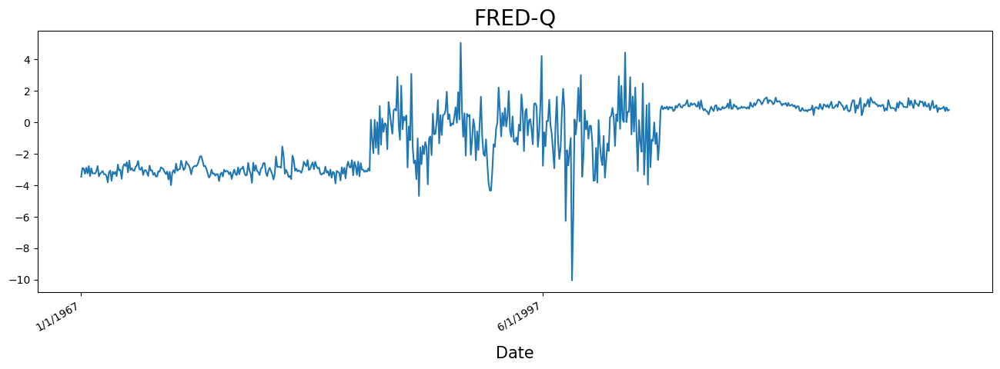

In [188]:
fig = plt.subplots(figsize=(16, 5))
plt.plot(df_Y_est.index, df_Y_est['GDPC1'])
plt.title('FRED-Q', fontsize=20)
plt.xlabel('Date', labelpad=12, fontsize=15)
locator = mdate.YearLocator()
plt.gca().xaxis.set_major_locator(locator)
plt.gcf().autofmt_xdate()


(3.0, 226.0)

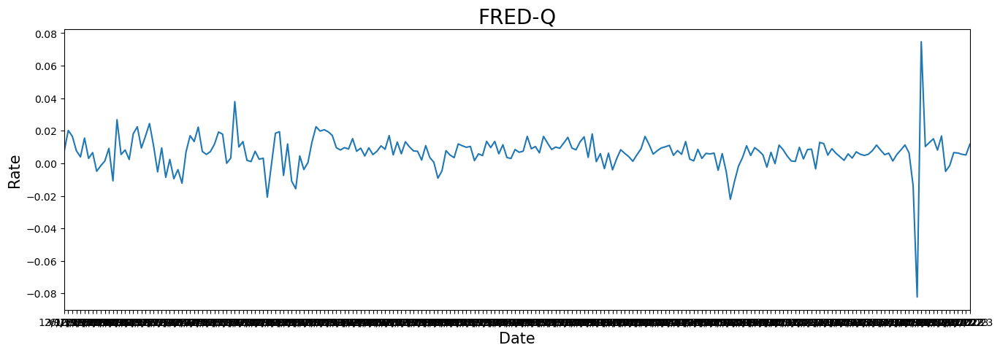

In [107]:
fig = plt.subplots(figsize=(16, 5))
plt.plot(df_q.index, df_q['GDPC1'])
plt.title('FRED-Q', fontsize=20)
plt.xlabel('Date', fontsize=15)
plt.ylabel('Rate', fontsize=15)
plt.xlim(df_q.index.min(), df_q.index.max())

In [144]:
df = px.data.gapminder().query("continent == 'Oceania'")

In [167]:
df['year']

60      1952
61      1957
62      1962
63      1967
64      1972
65      1977
66      1982
67      1987
68      1992
69      1997
70      2002
71      2007
1092    1952
1093    1957
1094    1962
1095    1967
1096    1972
1097    1977
1098    1982
1099    1987
1100    1992
1101    1997
1102    2002
1103    2007
Name: year, dtype: int64

In [98]:
112*3/229

1.4672489082969433

In [69]:
df_q.shape

(783, 126)

In [71]:
data_m.index[32*3:].shape

(687,)

In [72]:
229*3

687

In [11]:
U, S, Vh = np.linalg.svd(a)

In [10]:
Vh[np.flip(np.argsort(eign_value))[0],:]

array([[-0.49757343, -0.57397065, -0.65036788],
       [ 0.76534569,  0.06237807, -0.64058954],
       [-0.40824829,  0.81649658, -0.40824829]])

In [16]:
S

array([22.44674882,  1.4640585 ,  0.        ])

In [7]:
def TT_PCA(Y, X, gamma, r): # 20240717
    N_Y = Y.shape[-1]
    (T, K, N_X) = X.shape
    
    Lambda_X_est = np.zeros((N_X, r))
    W_est = np.zeros((K, r))

    Z = np.column_stack((X.reshape((T, -1), order='F'), np.sqrt(gamma) * Y))
    Sigma_Z = np.cov(Z.T)
    eign_value, Lambda_gamma = np.linalg.eig(Sigma_Z)
    Lambda_gamma = np.real_if_close(Lambda_gamma, 1)
    eign_value = np.real_if_close(eign_value)
    Lambda_gamma_est = Lambda_gamma[:, np.flip(np.argsort(eign_value))[:r]]

    G_est = Z @ Lambda_gamma_est @ np.linalg.inv(Lambda_gamma_est.T @ Lambda_gamma_est)
    
    for i in range(r):
        H_iM = Lambda_gamma_est[N_Y:, i].reshape((K, N_X), order='F')
        Lambda_X_est
    

    for i in range(r):
        H_iM = Lambda_gamma_est[N_Y:, i].reshape((K, N_X), order='F')
        U, S, Vh = np.linalg.svd(H_iM)

        max_index = np.flip(np.argsort(eign_value))[0]
        Lambda_X_est[:, i] = Vh[max_index,:]
        W_est[:, i] = U[:, max_index]*S[max_index]

            
    Ux, Sx, Vhx  = np.linalg.svd(Lambda_X_est)
    Lambda_X_est = Ux[:, np.flip(np.argsort(Sx))[:r]]
    W_est = W_est@np.diag(1/np.flip(np.sort(Sx))[:r])@Vhx[np.flip(np.argsort(Sx))[:r],:]
    
    return Lambda_gamma_est, Lambda_X_est, W_est, G_est

In [8]:
def TT_PCA_ALS(Y, X, gamma, r, Lambda_X_ini, W_ini, max_iter=1000, stop_thresh = 1e-1):
    N_Y = Y.shape[-1]
    (T, K, N_X) = X.shape
    
    Z = np.column_stack((X.reshape((T,-1), order = 'F'), np.sqrt(gamma)*Y))
    Sigma_Z = np.cov(Z.T)
    eign_value, Lambda_gamma = np.linalg.eig(Sigma_Z)
    Lambda_gamma = np.real_if_close(Lambda_gamma, 1)
    eign_value = np.real_if_close(eign_value)
    Lambda_gamma_est = Lambda_gamma[:, np.flip(np.argsort(eign_value))[:r]]
    
    G = Z @ Lambda_gamma_est @ np.linalg.inv(Lambda_gamma_est.T@Lambda_gamma_est)
    
    update_magnitude = np.zeros(2)
    Lambda_X_est = Lambda_X_ini
    W_est = W_ini
    weight = np.zeros(r)
    for iter_num in range(max_iter):
        Lambda_X_pre = Lambda_X_est.copy()
        W_pre = W_est.copy()
        for i in range(r):
            H_iM = Lambda_gamma_est[N_Y:, i].reshape((K, N_X), order = 'F')
            
            Lambda_X_est[:, i] = W_est[:,i].T@H_iM
            Lambda_X_est[:, i] = Lambda_X_est[:, i]/np.linalg.norm(Lambda_X_est[:, i])
            
            W_est[:, i] = H_iM @ Lambda_X_est[:, i]
            W_est[:, i] = W_est[:, i]/np.linalg.norm(W_est[:, i])
            
            weight[i] = W_est[:,i].T @ H_iM @ Lambda_X_est[:, i]
            
            update_magnitude[0] += (np.linalg.norm(Lambda_X_est[:, i] - Lambda_X_pre[:, i])) ** 2
            update_magnitude[1] += (np.linalg.norm(W_est[:, i] - W_pre[:, i])) ** 2 
        
        if (update_magnitude[0] < stop_thresh) and (update_magnitude[1] < stop_thresh):
            W_est = W_est @ weight
            break
                                    
    return Lambda_gamma_est, Lambda_X_est, W_est, G


In [9]:
def DGP(T, N_Y, N_X, K, r, gamma, burn=200):
    Lamma_Y = ortho_group.rvs(dim=N_Y)[:, :r]/np.sqrt(gamma)*np.sqrt(N_Y+K*N_X)
    Lamma_X = ortho_group.rvs(dim=N_X)[:, :r]*np.sqrt(N_Y+K*N_X)
    W = np.random.rand(K,r)-0.5
    W = W/np.linalg.norm(W, axis=0)
    
    phi_G = np.random.rand(r)-0.5
    G = np.zeros((T+burn, r))
    for t in range(T + burn - 1):
        noise = np.random.normal(loc=0.0, scale=1, size=r)
        G[t+1, :] = np.einsum('..., ...->...', phi_G, G[t, :])+noise
    G = G[burn:, :]
    
    # Y = G @ Lamma_Y.T + np.random.normal(loc=0.0, scale=1, size=(T, N_Y))
    Y = np.zeros((T, K, N_Y))
    for i in range(r):
        Y += np.einsum('ij,k->ijk', np.outer(G[:, i], W[:,i]), Lamma_Y[:,i])
    
    Y += np.random.normal(loc=0.0, scale=1, size=(T, K, N_Y))
    
    X = np.zeros((T, K, N_X))
    for i in range(r):
        X += np.einsum('ij,k->ijk', np.outer(G[:, i], W[:,i]), Lamma_X[:,i])
    
    X += np.random.normal(loc=0.0, scale=1, size=(T, K, N_X))
        
    return Y, X, G, Lamma_Y, W, Lamma_X

In [129]:
(iter_no, T, P, r, gamma)=(0, 40, 10, 2, 0.2)

In [143]:
np.random.seed(iter_no + T)
Y_full, X, G_true, Gamma_Y_true, W_true, Gamma_X_true = DGP(T, N_Y, N_X, K, r, gamma)
Y = Y_full[:, 0, :]
starttime = datetime.datetime.now()
print('(iter, T, P, r, gamma):', (iter_no, T, P, r, gamma))
Lambda_gamma_est, Lambda_X_est, W_est, G_est = TT_PCA(Y, X, gamma, r,
                                                      Gamma_X_true, W_true)

(iter, T, P, r, gamma): (0, 40, 10, 2, 0.2)


In [139]:
Z = np.column_stack((X.reshape((T,-1), order = 'F'), np.sqrt(gamma)*Y))
Sigma_Z = np.cov(Z.T)
eign_value, Lambda_gamma = np.linalg.eig(Sigma_Z)
Lambda_gamma = np.real_if_close(Lambda_gamma, 1)
eign_value = np.real_if_close(eign_value)

In [141]:
eign_value

array([195.42177509, 129.61727508,   6.02306621,   5.86530028,
         5.34084119,   5.07142135,   4.92154674,   4.2892021 ,
         4.25474208,   4.14127469,   3.79255671,   3.63360642,
         3.50106268,   3.18316565,   3.00507976,   2.83847331,
         2.60286065,   2.46718648,   2.92068704,   2.39351902,
         2.20024552,   0.54009647,   1.81615393,   1.86533244,
         0.71324795,   0.76906002,   1.53622117,   1.47179684,
         1.94886502,   2.00524499,   1.21656876,   0.65982718,
         1.06243233,   1.68293879,   1.31651578,   1.13684973,
         0.89563876,   0.86497795,   1.03925608,  -0.        ,
        -0.        ,   0.        ,   0.        ,  -0.        ,
         0.        ,   0.        ,   0.        ,   0.        ,
         0.        ,   0.        ,  -0.        ,  -0.        ,
        -0.        ,  -0.        ,   0.        ,   0.        ,
        -0.        ,  -0.        ,   0.        ,  -0.        ,
         0.        ,   0.        ,   0.        ,   0.  

In [132]:
H_iM = Lambda_gamma_est[N_Y:, i].reshape((K, N_X), order = 'F')

In [133]:
Lambda_X_est[:, i] = W_est[:,i].T@H_iM

/var/folders/cd/td3wbwf12nj440jmcp6rh3w00000gn/T/ipykernel_2116/3015232068.py:1: ComplexWarning: Casting complex values to real discards the imaginary part
  Lambda_X_est[:, i] = W_est[:,i].T@H_iM


In [124]:
H_iM

array([[-0.04256716+0.j,  0.01939597+0.j, -0.1083733 +0.j,
        -0.00197244+0.j,  0.00139905+0.j, -0.01420214+0.j,
        -0.0786736 +0.j,  0.03457386+0.j, -0.09318003+0.j,
         0.03696749+0.j],
       [ 0.06050827+0.j,  0.03212379+0.j, -0.33366476+0.j,
        -0.05468557+0.j,  0.03534923+0.j,  0.06997212+0.j,
        -0.00424821+0.j,  0.18373797+0.j, -0.11713666+0.j,
        -0.02139342+0.j],
       [-0.04475158+0.j, -0.05551004+0.j,  0.25672335+0.j,
         0.0430909 +0.j, -0.02935596+0.j, -0.0282463 +0.j,
         0.06092013+0.j, -0.11917841+0.j,  0.13144512+0.j,
        -0.00979965+0.j],
       [-0.04385183+0.j, -0.06469304+0.j,  0.28356454+0.j,
         0.04633079+0.j, -0.02568217+0.j, -0.04838896+0.j,
         0.0543453 +0.j, -0.15648447+0.j,  0.12053848+0.j,
         0.01741562+0.j],
       [-0.01962629+0.j, -0.01215732+0.j,  0.11166457+0.j,
         0.02934927+0.j, -0.02485994+0.j, -0.01883712+0.j,
         0.01448676+0.j, -0.05111488+0.j,  0.02986529+0.j,
        -0.

In [17]:
X.shape

(200, 10, 10)

In [16]:
Y_full, X, G_true, Gamma_Y_true, W_true, Gamma_X_true = DGP(200, 10, 10, 10, 5, 0.5, burn=200)

In [28]:
(Y, X, gamma, r, Lambda_X_ini, W_ini) = (Y_full[:,0,:], X, 0.5, 5, Gamma_X_true, W_true)

In [29]:
TT_PCA(Y, X, 0.5, 5)

(array([[ 0.07291057,  0.10653474, -0.07445799,  0.03870584,  0.04197076],
        [-0.10521262, -0.15451987,  0.02193155, -0.07103042, -0.0996521 ],
        [ 0.04757815, -0.06249351,  0.04085927, -0.17262146, -0.15484088],
        [-0.01417471,  0.01904495,  0.11531733,  0.0324396 , -0.13134613],
        [-0.02147924, -0.06650529,  0.03820417, -0.10258954, -0.07575795],
        [ 0.07351168, -0.00432657,  0.17315875, -0.09376369,  0.10387692],
        [ 0.06360529, -0.01037436, -0.23240722, -0.00181766,  0.03061998],
        [-0.06784121,  0.02830609,  0.1528027 , -0.15945037,  0.13737884],
        [ 0.07637207, -0.08105632, -0.17946192,  0.11405463, -0.06051618],
        [ 0.01880779, -0.05645212,  0.15339575, -0.12996411,  0.1828334 ],
        [ 0.1336171 ,  0.0531971 , -0.14310833, -0.07160512, -0.00681021],
        [-0.15981145, -0.00625408,  0.15751864,  0.07658403,  0.09746453],
        [ 0.17363389,  0.10621172,  0.12400237, -0.15527774,  0.08617186],
        [-0.09075848,  0.

In [82]:
N_Y = Y.shape[-1]
(T, K, N_X) = X.shape
Z = np.column_stack((X.reshape((T,-1), order = 'F'), np.sqrt(gamma)*Y))

In [83]:
Sigma_Z = np.cov(Z.T)
eign_value, Lambda_gamma = np.linalg.eig(Sigma_Z)
Lambda_gamma_est = Lambda_gamma[:, np.flip(np.argsort(eign_value))[:r]]

In [84]:
F = Z @ Lambda_gamma_est @ np.linalg.inv(Lambda_gamma_est.T@Lambda_gamma_est)

In [87]:
update_magnitude = np.zeros(2)
Lambda_X_est = Lambda_X_ini
W_est = W_ini
weight = np.zeros(r)
iter_num = 0
i=0

In [97]:
H_iM = Lambda_gamma_est[N_Y:, i].reshape((K, N_X), order = 'F')
            
Lambda_X_est[:, i] = W_est[:,i].T@H_iM
Lambda_X_est[:, i] = Lambda_X_est[:, i]/np.linalg.norm(Lambda_X_est[:, i])

W_est[:, i] = H_iM @ Lambda_X_est[:, i]
W_est[:, i] = W_est[:, i]/np.linalg.norm(W_est[:, i])

weight[i] = W_est[:,i].T @ H_iM @ Lambda_X_est[:, i]

update_magnitude[0] += (np.linalg.norm(Lambda_X_est[:, i] - Lambda_X_pre[:, i])) ** 2
update_magnitude[1] += (np.linalg.norm(W_est[:, i] - W_pre[:, i])) ** 2 

NameError: name 'Lambda_X_pre' is not defined

In [92]:
H_iM = Lambda_gamma_est[N_Y:, i].reshape((K, N_X), order = 'F')

In [95]:
W_est.shape

(10, 5)

In [72]:
FT = Z @ Lambda_gamma_est @ np.linalg.inv(Lambda_gamma_est.T@Lambda_gamma_est)

In [74]:
FT.shape

(200, 5)

In [79]:
Y[:,0,:].shape

(200, 10)

In [113]:
TT_PCA(Y, X, 0.5, 5, Gamma_X_true, W_true, max_iter=1000)

(array([[-0.1364685 , -0.16318829,  0.11415521,  0.08404347, -0.10844232],
        [ 0.17087225,  0.00872566,  0.09706815, -0.00505272, -0.15996465],
        [ 0.16956306,  0.01890591, -0.036666  , -0.02202991,  0.16468834],
        [ 0.0955053 ,  0.04215212, -0.07879528, -0.04145176,  0.09842681],
        [-0.21813817,  0.01078633, -0.04044547,  0.04455297, -0.14943887],
        [ 0.10925197, -0.04017854, -0.03663028, -0.02208812,  0.10638966],
        [ 0.10890263, -0.02076401, -0.02292574,  0.00795942,  0.0711252 ],
        [-0.12977236,  0.04458631, -0.09038888,  0.01657362,  0.09834004],
        [-0.02720414,  0.0798415 , -0.12473573, -0.05967676,  0.05351509],
        [-0.0472968 ,  0.09561828, -0.03338005,  0.00503564, -0.11127374],
        [-0.04366289, -0.00382938,  0.00296131,  0.10233754,  0.18780578],
        [ 0.08059652, -0.06393192, -0.17043457, -0.02542392,  0.09671181],
        [ 0.0118254 , -0.01280414,  0.1280536 , -0.11720273, -0.12747919],
        [ 0.05689877, -0.

In [27]:
T=100; burn=200;  r=5
phi_G = np.random.rand(5)-0.5
G = np.zeros((T+burn, r))
for t in range(T + burn - 1):
    noise = np.random.normal(loc=0.0, scale=1, size=r)
    G[t+1, :] = np.einsum('..., ...->...', phi_G, G[t, :])+noise

In [28]:
G

array([[ 0.        ,  0.        ,  0.        ,  0.        ,  0.        ],
       [-0.52315531,  1.01579957,  0.81209451, -1.03709308, -0.09220081],
       [-0.35146406, -0.40808115,  0.82459533,  0.49831862, -1.0415702 ],
       ...,
       [-0.72337352,  0.15410455,  0.60447485,  0.42885571, -0.3673217 ],
       [ 1.02961333,  0.45578494, -0.02101895, -1.11691091,  1.60418261],
       [ 1.52048499, -1.61216531,  0.63766502,  0.21743877,  0.27842492]])

In [54]:
(np.arange(3)@a).shape

(2,)

In [29]:
d,c = np.linalg.eig(b)

In [34]:
c[:, np.argsort(d).flip[:2]]

array([[ 0.79996287,  0.        ],
       [-0.54156021, -0.70710678],
       [-0.25840266,  0.70710678]])

In [105]:
a=b=c=10

In [10]:
a = np.array([2,1,1,3,5,8])

In [37]:
a = np.arange(0)
b = np.arange(10)
np.append(a,b)

array([0, 1, 2, 3, 4, 5, 6, 7, 8, 9])

In [45]:
car = {
  "brand": "Ford",
  "model": "Mustang",
  "year": 1964
}

x = *car.items()

car["year"] = 2018

print(x)

SyntaxError: can't use starred expression here (58215371.py, line 7)

In [59]:
a = zip(*MCS_count.items())
for b in a :
    print(b)

("'AR1'", "'AR2'", "'AR3'", "'AR4'", "'AR5'", "'MA1'", "'MA2'", "'MA3'", "'MA4'", "'MA5'")
(1443, 1443, 1443, 1438, 1375, 382, 1443, 1443, 1443, 1405)
